In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\4253098115.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
#Before running this cell, install "xlrd" (pip install xlrd)

df = pd.read_excel('default of credit card clients.xls')
df.columns = df.iloc[0]
df = df.iloc[1:]
df = df.drop(columns=df.columns[0])
df.reset_index(drop=True, inplace=True)
for col in df.columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')
print(df.iloc[0,4])
df

24


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,20000,2,2,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,1
1,120000,2,2,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,90000,2,2,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,50000,2,2,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,50000,1,2,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000,1,3,1,39,0,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
29996,150000,1,3,2,43,-1,-1,-1,-1,0,...,8979,5190,0,1837,3526,8998,129,0,0,0
29997,30000,1,2,2,37,4,3,2,-1,0,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
29998,80000,1,3,1,41,1,-1,0,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


## Tarea 1. Preguntas de negocio:

#### ¿Cuál es la probabilidad de que un cliente incurra en default dada su información de entrada?
#### ¿Cuáles son los factores que más inciden en que un cliente entre en default?

## Tarea 2. Limpieza y alistamiento de datos:

#### Naturaleza de las variables
* LIMIT_BAL: numérica
* SEX: categórica
* EDUCATION: categórica
* MARRIAGE: categórica
* AGE: numérica
* PAY_(1-6): numérica
* BILL_AMT(1-6): numérica
* PAY_AMT(1-6): numérica

#### Datos faltantes

In [3]:
df.isna().sum()
#No hay datos faltantes!

0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default payment next month    0
dtype: int64

#### Limpieza de datos

In [4]:
cols = df.columns[5:11]
df_limp = df[~(df[cols] == -2).any(axis=1)]
df_limp.shape

(23439, 24)

In [5]:
# Eliminar filas donde Columna3 es 0
df_limp = df_limp[df_limp['MARRIAGE'] != 0]

# Eliminar filas donde Columna2 es 0, 5 o 6
df_limp = df_limp[~df_limp['EDUCATION'].isin([0, 5, 6])]

df_limp.shape

(23150, 24)

#### Outliers

In [6]:
df_numericas = df_limp.iloc[:,[0,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22]]
df_categoricas = df_limp.iloc[:,[1,2,3]]

In [7]:
df_numericas.columns

Index(['LIMIT_BAL', 'AGE', 'PAY_0', 'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5',
       'PAY_6', 'BILL_AMT1', 'BILL_AMT2', 'BILL_AMT3', 'BILL_AMT4',
       'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1', 'PAY_AMT2', 'PAY_AMT3',
       'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object', name=0)

In [8]:
fig = go.Figure()
fig.add_trace(go.Box(y=df['PAY_6'], name = 'Abril',
                marker_color = 'rgba(127, 96, 0, 0.5)'))
fig.add_trace(go.Box(y=df['PAY_5'], name = 'Mayo',
                marker_color = 'rgba(207, 114, 255, 0.5)'))
fig.add_trace(go.Box(y=df['PAY_4'], name = 'Junio',
                marker_color = 'rgba(255, 65, 54, 0.5)'))
fig.add_trace(go.Box(y=df['PAY_3'], name = 'Julio',
                marker_color = 'rgba(44, 160, 101, 0.5)'))
fig.add_trace(go.Box(y=df['PAY_2'], name = 'Agosto',
                marker_color = 'rgba(255, 144, 14, 0.5)'))
fig.add_trace(go.Box(y=df_numericas['PAY_0'], name='Septiembre',
                marker_color = 'rgba(93, 164, 214, 0.5)'))
fig.update_layout(title_text="Meses de retraso en pagos", height = 700)

fig.show()

In [9]:
fig = go.Figure()
fig.add_trace(go.Box(y=df['BILL_AMT6'], name = 'Abril',
                marker_color = 'rgba(127, 96, 0, 0.5)'))
fig.add_trace(go.Box(y=df['BILL_AMT5'], name = 'Mayo',
                marker_color = 'rgba(207, 114, 255, 0.5)'))
fig.add_trace(go.Box(y=df['BILL_AMT4'], name = 'Junio',
                marker_color = 'rgba(255, 65, 54, 0.5)'))
fig.add_trace(go.Box(y=df['BILL_AMT3'], name = 'Julio',
                marker_color = 'rgba(44, 160, 101, 0.5)'))
fig.add_trace(go.Box(y=df['BILL_AMT2'], name = 'Agosto',
                marker_color = 'rgba(255, 144, 14, 0.5)'))
fig.add_trace(go.Box(y=df_numericas['BILL_AMT1'], name='Septiembre',
                marker_color = 'rgba(93, 164, 214, 0.5)'))
fig.update_layout(title_text="Transacciones mensuales [NT$]", height = 700)

fig.show()

In [10]:
fig = go.Figure()
fig.add_trace(go.Box(y=df['PAY_AMT6'], name = 'Abril',
                marker_color = 'rgba(127, 96, 0, 0.5)'))
fig.add_trace(go.Box(y=df['PAY_AMT5'], name = 'Mayo',
                marker_color = 'rgba(207, 114, 255, 0.5)'))
fig.add_trace(go.Box(y=df['PAY_AMT4'], name = 'Junio',
                marker_color = 'rgba(255, 65, 54, 0.5)'))
fig.add_trace(go.Box(y=df['PAY_AMT3'], name = 'Julio',
                marker_color = 'rgba(44, 160, 101, 0.5)'))
fig.add_trace(go.Box(y=df['PAY_AMT2'], name = 'Agosto',
                marker_color = 'rgba(255, 144, 14, 0.5)'))
fig.add_trace(go.Box(y=df['PAY_AMT1'], name='Septiembre',
                marker_color = 'rgba(93, 164, 214, 0.5)'))
fig.update_layout(title_text="Pagos previos [NT$]", height = 700)

fig.show()

In [11]:
fig = go.Figure()
fig.add_trace(go.Box(y=df['LIMIT_BAL'], name='Balance límite',
                marker_color = 'indianred'))
fig.update_layout(title_text="Balance del crédito [NT$]", height = 600, width = 500)
fig.show()

In [12]:
fig = go.Figure()
fig.add_trace(go.Box(y=df['AGE'], name='Edad',
                marker_color = 'lightseagreen'))
fig.update_layout(title_text="Edad del cliente", height = 600, width = 500)
fig.show()

##### Diagnóstico del efecto de los outliers

In [13]:
print("Muchos meses sin pagar dan intuición de que el cliente no paga su crédito.")
df.loc[df['PAY_6'].idxmax()]

Muchos meses sin pagar dan intuición de que el cliente no paga su crédito.


0
LIMIT_BAL                     100000
SEX                                1
EDUCATION                          2
MARRIAGE                           2
AGE                               30
PAY_0                              1
PAY_2                              3
PAY_3                              7
PAY_4                              6
PAY_5                              7
PAY_6                              8
BILL_AMT1                      72652
BILL_AMT2                      90461
BILL_AMT3                      89011
BILL_AMT4                      96593
BILL_AMT5                     105083
BILL_AMT6                     103522
PAY_AMT1                       20000
PAY_AMT2                           0
PAY_AMT3                       10000
PAY_AMT4                       10000
PAY_AMT5                           0
PAY_AMT6                           0
default payment next month         1
Name: 1894, dtype: int64

In [14]:
print("Balances altamente positivos dan intuición de que el cliente paga su crédito.")
df.loc[df['BILL_AMT6'].idxmax()]

Balances altamente positivos dan intuición de que el cliente paga su crédito.


0
LIMIT_BAL                     1000000
SEX                                 2
EDUCATION                           1
MARRIAGE                            1
AGE                                47
PAY_0                               0
PAY_2                               0
PAY_3                               0
PAY_4                              -1
PAY_5                               0
PAY_6                               0
BILL_AMT1                      964511
BILL_AMT2                      983931
BILL_AMT3                      535020
BILL_AMT4                      891586
BILL_AMT5                      927171
BILL_AMT6                      961664
PAY_AMT1                        50784
PAY_AMT2                        50723
PAY_AMT3                       896040
PAY_AMT4                        50000
PAY_AMT5                        50000
PAY_AMT6                        50256
default payment next month          0
Name: 2197, dtype: int64

In [15]:
print("Pagos altos a través de los meses da intuición de que el cliente paga su crédito.")
df.loc[df['PAY_AMT2'].idxmax()]

Pagos altos a través de los meses da intuición de que el cliente paga su crédito.


0
LIMIT_BAL                      500000
SEX                                 2
EDUCATION                           1
MARRIAGE                            1
AGE                                33
PAY_0                              -2
PAY_2                              -2
PAY_3                              -1
PAY_4                              -1
PAY_5                              -2
PAY_6                              -1
BILL_AMT1                         125
BILL_AMT2                      -18088
BILL_AMT3                     1664089
BILL_AMT4                      121757
BILL_AMT5                       97115
BILL_AMT6                      377217
PAY_AMT1                         4366
PAY_AMT2                      1684259
PAY_AMT3                       121831
PAY_AMT4                        97670
PAY_AMT5                       379267
PAY_AMT6                        26759
default payment next month          0
Name: 5296, dtype: int64

#### Escala de datos

In [16]:
df_numericas = df_limp.iloc[:,[0,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22]]
df_categoricas = df_limp.iloc[:,[1,2,3]]
Y = df_limp['default payment next month']

In [17]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_numericas)

# Convertir los datos escalados en un DataFrame
df_scaled = pd.DataFrame(scaled_data, columns=df_numericas.columns)

# Imprimir el DataFrame escalado
print("DataFrame escalado:")
print(df_scaled)


DataFrame escalado:
0      LIMIT_BAL       AGE     PAY_0     PAY_2     PAY_3     PAY_4     PAY_5  \
0      -0.284267 -0.994901 -1.198658  1.750439 -0.170838 -0.134897 -0.097728   
1      -0.519414 -0.133865 -0.183292 -0.182710 -0.170838 -0.134897 -0.097728   
2      -0.832944  0.189023 -0.183292 -0.182710 -0.170838 -0.134897 -0.097728   
3      -0.832944  2.341612 -1.198658 -0.182710 -1.149046 -0.134897 -0.097728   
4      -0.832944  0.189023 -0.183292 -0.182710 -0.170838 -0.134897 -0.097728   
...          ...       ...       ...       ...       ...       ...       ...   
23145   0.499557  0.404282 -0.183292 -0.182710 -0.170838 -0.134897 -0.097728   
23146  -0.049120  0.834800 -1.198658 -1.149284 -1.149046 -1.146185 -0.097728   
23147  -0.989709  0.189023  3.878173  2.717013  1.785579 -1.146185 -0.097728   
23148  -0.597797  0.619541  0.832074 -1.149284 -0.170838 -0.134897 -0.097728   
23149  -0.832944  1.157688 -0.183292 -0.182710 -0.170838 -0.134897 -0.097728   

0         PAY_6  BI

In [18]:
promedios = df_numericas.mean()
desviaciones = df_numericas.std()

In [19]:
df_limp = pd.concat([df_categoricas.reset_index(drop=True), 
                df_scaled.reset_index(drop=True), 
                Y.reset_index(drop=True)], axis=1)
df_limp

,SEX,EDUCATION,MARRIAGE,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,2,2,2,-0.284267,-0.994901,-1.198658,1.750439,-0.170838,-0.134897,-0.097728,...,-0.734614,-0.720224,-0.707694,-0.359357,-0.252161,-0.251588,-0.263090,-0.337771,-0.192784,1
1,2,2,2,-0.519414,-0.133865,-0.183292,-0.182710,-0.170838,-0.134897,-0.097728,...,-0.572149,-0.541613,-0.513009,-0.269556,-0.227533,-0.251588,-0.263090,-0.270882,-0.019373,0
2,2,2,1,-0.832944,0.189023,-0.183292,-0.182710,-0.170838,-0.134897,-0.097728,...,-0.366728,-0.323870,-0.291230,-0.241042,-0.201968,-0.240559,-0.256656,-0.266266,-0.250588,0
3,1,2,1,-0.832944,2.341612,-1.198658,-0.182710,-1.149046,-0.134897,-0.097728,...,-0.475057,-0.476372,-0.456257,-0.241042,1.505374,0.244758,0.251599,-0.291684,-0.269143,0
4,1,1,2,-0.832944,0.189023,-0.183292,-0.182710,-0.170838,-0.134897,-0.097728,...,-0.497769,-0.469022,-0.442109,-0.211463,-0.212017,-0.270505,-0.263090,-0.270882,-0.262149,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23145,1,3,1,0.499557,0.404282,-0.183292,-0.182710,-0.170838,-0.134897,-0.097728,...,0.510164,-0.288468,-0.506180,0.143483,0.683720,-0.030825,-0.131394,-0.003325,-0.250588,0
23146,1,3,2,-0.049120,0.834800,-1.198658,-1.149284,-1.149046,-1.146185,-0.097728,...,-0.650774,-0.693261,-0.759360,-0.250685,-0.127738,0.189498,-0.319126,-0.337771,-0.308392,0
23147,1,2,2,-0.989709,0.189023,3.878173,2.717013,1.785579,-1.146185,-0.097728,...,-0.475968,-0.454056,-0.452676,-0.359357,-0.301418,0.906552,-0.057214,-0.203993,-0.129200,1
23148,1,3,1,-0.597797,0.619541,0.832074,-1.149284,-0.170838,-0.134897,-0.097728,...,-0.007392,-0.589681,0.016087,4.722293,-0.133501,-0.241772,-0.203514,3.204955,-0.204114,1


#### Clases imbalanceadas

##### Tratamiento de clases imbalanceadas con undersampling

In [20]:
proporcion = sum(df_limp['default payment next month'])/df_limp.shape[0]
print('Clase dominante (no default):', str(round(proporcion, 4)*100)+'%')
print('Clase no dominante (default):', str(100-round(proporcion, 4)*100)+'%')

Clase dominante (no default): 23.16%
Clase no dominante (default): 76.84%


In [21]:
clase_dominante = df_limp[df_limp['default payment next month'] == 0]
clase_no_dominante = df_limp[df_limp['default payment next month'] == 1]

# Hacer undersampling en la clase dominante
clase_dominante_undersampled = clase_dominante.sample(n=9954, replace=False)

# Combinar las clases para obtener el dataframe balanceado
df_limp = pd.concat([clase_dominante_undersampled, clase_no_dominante])

# Verificar las proporciones
print(df_limp['default payment next month'].value_counts())

default payment next month
0    9954
1    5362
Name: count, dtype: int64


In [22]:
proporcion = sum(df_limp['default payment next month'])/df_limp.shape[0]
print('Clase dominante (no default):', str(100-round(proporcion, 4)*100)+'%')
print('Clase no dominante (default):', str(round(proporcion, 4)*100)+'%')

Clase dominante (no default): 64.99%
Clase no dominante (default): 35.010000000000005%


In [23]:
df_limp.shape

(15316, 24)

Se cambia el nombre de la columna de default

In [24]:
df.rename(columns={'default payment next month': 'default'}, inplace=True)
df_limp.rename(columns={'default payment next month': 'default'}, inplace=True)

##### Tratamiento de clases imbalanceadas con oversampling

In [25]:
'''clase_dominante = df[df['default payment next month'] == 0]
clase_no_dominante = df[df['default payment next month'] == 1]

# Hacer undersampling en la clase dominante
clase_no_dominante_oversampled = clase_no_dominante.sample(n=15576, replace=True)

# Combinar las clases para obtener el dataframe balanceado
df = pd.concat([clase_dominante, clase_no_dominante_oversampled])

# Verificar las proporciones
print(df['default payment next month'].value_counts())'''

"clase_dominante = df[df['default payment next month'] == 0]\nclase_no_dominante = df[df['default payment next month'] == 1]\n\n# Hacer undersampling en la clase dominante\nclase_no_dominante_oversampled = clase_no_dominante.sample(n=15576, replace=True)\n\n# Combinar las clases para obtener el dataframe balanceado\ndf = pd.concat([clase_dominante, clase_no_dominante_oversampled])\n\n# Verificar las proporciones\nprint(df['default payment next month'].value_counts())"

In [49]:
'''proporcion = sum(df['default payment next month'])/df.shape[0]
print('Clase dominante (no default):', str(100-round(proporcion, 4)*100)+'%')
print('Clase no dominante (default):', str(round(proporcion, 4)*100)+'%')'''

"proporcion = sum(df['default payment next month'])/df.shape[0]\nprint('Clase dominante (no default):', str(100-round(proporcion, 4)*100)+'%')\nprint('Clase no dominante (default):', str(round(proporcion, 4)*100)+'%')"

## Tarea 3. Exploración de datos:

### 1. Estadísticas Descriptivas

No nos sirven los resultados de Sex, Education y Marriage porque son categoricas

In [25]:
df.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


### 2. Proporción de datos antes y después de balancearlo

In [26]:
proporciones = pd.DataFrame(index = ["default", "no default"], columns=["original", "balanceado"])
proporciones.loc['default', 'original'] = sum(df['default'])/df.shape[0]
proporciones.loc['no default', 'original'] = 1 - sum(df['default'])/df.shape[0]

proporciones.loc['default', 'balanceado'] = sum(df_limp['default'])/df_limp.shape[0]
proporciones.loc['no default', 'balanceado'] = 1 - sum(df_limp['default'])/df_limp.shape[0]

proporciones

,original,balanceado
default,0.2212,0.350091
no default,0.7788,0.649909


In [27]:
categorias = ['default', 'no default']

fig = go.Figure(data=[
    go.Bar(name='Original', x=categorias, y=proporciones['original']),
    go.Bar(name='Balanceado', x=categorias, y=proporciones['balanceado'])
])

fig.update_layout(title='Proporción de datos originales vs. balanceado',
                  xaxis_title='Clase',
                  yaxis_title='Proporción',
                  width=800)  # Ancho de la gráfica en píxeles

fig.show()

### 3. Correlaciones

Para el dataframe original

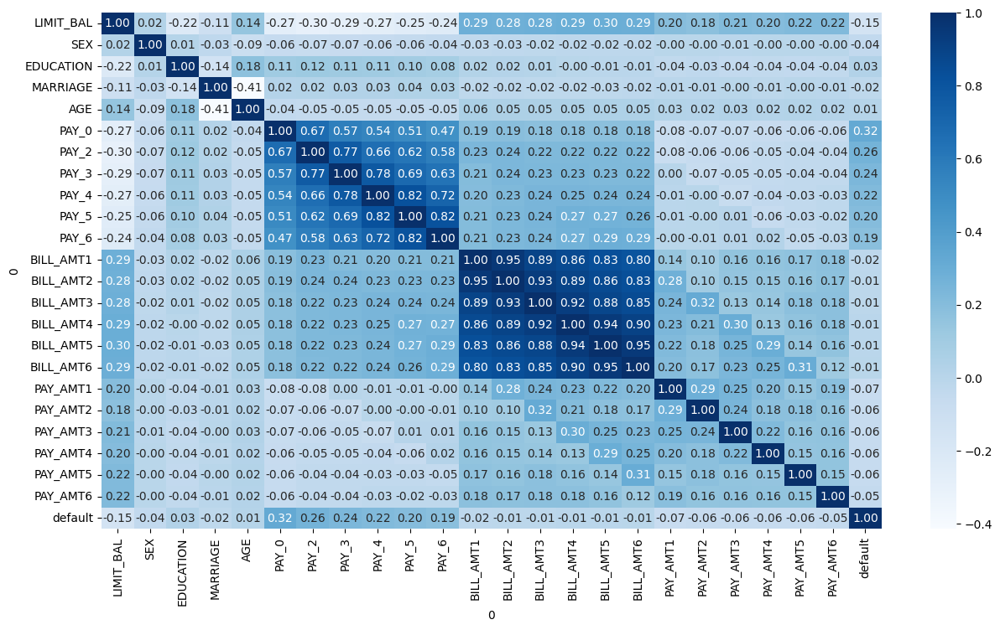

In [28]:
corr = df.corr()
plt.figure(figsize=(15,8))
sns.heatmap(corr, cmap="Blues", annot=True, fmt=".2f")
plt.show()

Para el dataframe con clases balanceadas

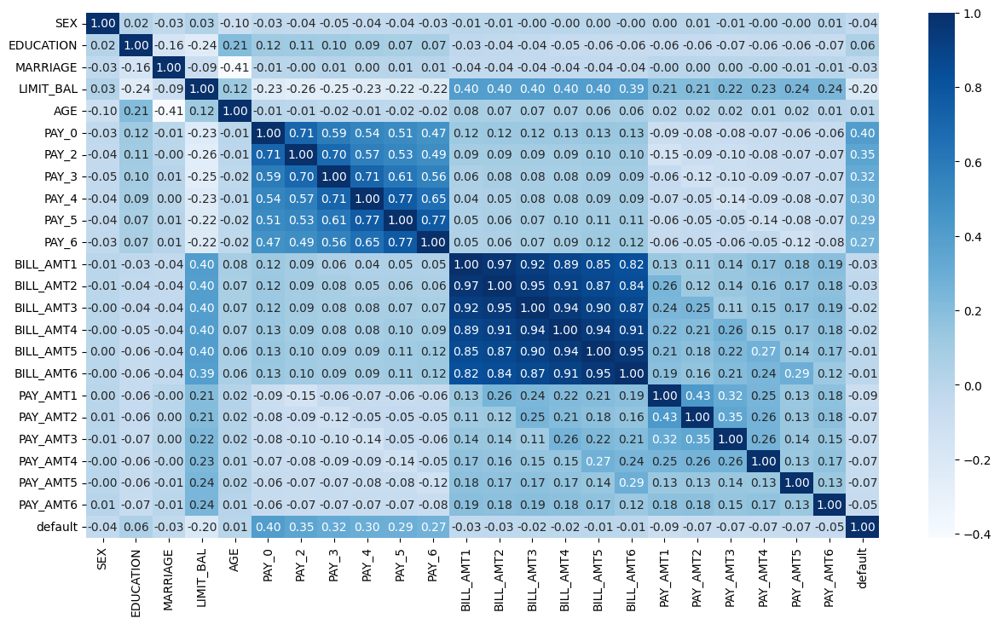

In [29]:
corr = df_limp.corr()
plt.figure(figsize=(15,8))
sns.heatmap(corr, cmap="Blues", annot=True, fmt=".2f")
plt.show()

### 4. Efecto del balance en el default

In [30]:
df_limp2 = pd.concat([df_categoricas.reset_index(drop=True), 
                df_numericas.reset_index(drop=True), 
                Y.reset_index(drop=True)], axis=1)

df_limp2.rename(columns={'default payment next month': 'default'}, inplace=True)
df_limp2

,SEX,EDUCATION,MARRIAGE,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
0,2,2,2,120000,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,1
1,2,2,2,90000,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
2,2,2,1,50000,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
3,1,2,1,50000,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,0
4,1,1,2,50000,37,0,0,0,0,0,...,19394,19619,20024,2500,1815,657,1000,1000,800,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23145,1,3,1,220000,39,0,0,0,0,0,...,88004,31237,15980,8500,20000,5003,3047,5000,1000,0
23146,1,3,2,150000,43,-1,-1,-1,-1,0,...,8979,5190,0,1837,3526,8998,129,0,0,0
23147,1,2,2,30000,37,4,3,2,-1,0,...,20878,20582,19357,0,0,22000,4200,2000,3100,1
23148,1,3,1,80000,41,1,-1,0,0,0,...,52774,11855,48944,85900,3409,1178,1926,52964,1804,1


In [31]:
sum(df_limp2['default'])/df_limp2.shape[0]

0.23161987041036716

In [32]:
1 - sum(df_limp2['default'])/df_limp2.shape[0]

0.7683801295896329

In [33]:
df_limp2.shape

(23150, 24)

In [34]:
hacen_default = df[df['default'] == 1]
no_default = df[df['default'] == 0]

In [35]:
hacen_default.shape

(6636, 24)

In [36]:
fig = go.Figure(data=[go.Histogram(x=hacen_default['LIMIT_BAL'], marker=dict(color='red'))])

fig.update_layout(
    title='Histograma Límite de Balance de los que hacen default',
    xaxis=dict(title='Límite de Balance',tickformat=',.0f'),
    yaxis=dict(title='Frecuencia')
)

# Mostrar el histograma
fig.show()

In [37]:
fig = go.Figure(data=[go.Histogram(x=no_default['LIMIT_BAL'])])

fig.update_layout(
    title='Histograma Límite de Balance de los que no hacen default',
    xaxis=dict(title='Límite de Balance', tickformat=',.0f'),
    yaxis=dict(title='Frecuencia')
)

# Mostrar el histograma
fig.show()

### 5. Efecto del Sexo en default

In [38]:
hacen_default_Hombres = hacen_default[hacen_default['SEX']==1]
hacen_default_Mujeres = hacen_default[hacen_default['SEX']==2]
proporcion_hombres = sum(hacen_default_Hombres['default'])/hacen_default.shape[0]
proporcion_mujeres = sum(hacen_default_Mujeres['default'])/hacen_default.shape[0]

In [39]:
proporcion_mujeres

0.5670584689572031

Proporción de Hombres y Mujeres que hacen default

In [40]:
proporcion_default = hacen_default.groupby('SEX')['default'].sum()/hacen_default.shape[0]

fig = go.Figure(data=go.Bar(x=['Hombres', 'Mujeres'], y=proporcion_default.values, marker_color=['blue', 'pink']))

fig.update_layout(title='Proporción de Default por Género',
                  xaxis=dict(title='Género'),
                  yaxis=dict(title='Proporción que hacen default'))

fig.show()

In [41]:
proporcion_no_default = no_default.groupby('SEX')['default'].count()/no_default.shape[0]

fig = go.Figure(data=go.Bar(x=['Hombres', 'Mujeres'], y=proporcion_no_default.values, marker_color=['blue', 'pink']))

fig.update_layout(title='Proporción que no hace default por Género',
                  xaxis=dict(title='Género'),
                  yaxis=dict(title='Proporción que no hace default'))

fig.show()

### Extra: Efectos del género y la edad

In [42]:
hacen_default['age_group'] = pd.cut(hacen_default['AGE'], bins=range(0, hacen_default['AGE'].max() + 10, 10), right=False)

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\418382217.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [43]:
# Calcular la distribución de edad por género
distribucion_edad = hacen_default.groupby(['age_group', 'SEX']).size().unstack()
distribucion_edad

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\4172886816.py:2: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



SEX,1,2
age_group,,
"[0, 10)",0,0
"[10, 20)",0,0
"[20, 30)",789,1408
"[30, 40)",1050,1226
"[40, 50)",691,794
"[50, 60)",295,287
"[60, 70)",44,45
"[70, 80)",4,3


In [44]:
distribucion_edad[1].index

CategoricalIndex([[0, 10), [10, 20), [20, 30), [30, 40), [40, 50), [50, 60),
                  [60, 70), [70, 80)],
                 categories=[[0, 10), [10, 20), [20, 30), [30, 40), [40, 50), [50, 60), [60, 70), [70, 80)], ordered=True, dtype='category', name='age_group')

Distribución de la población que hace default

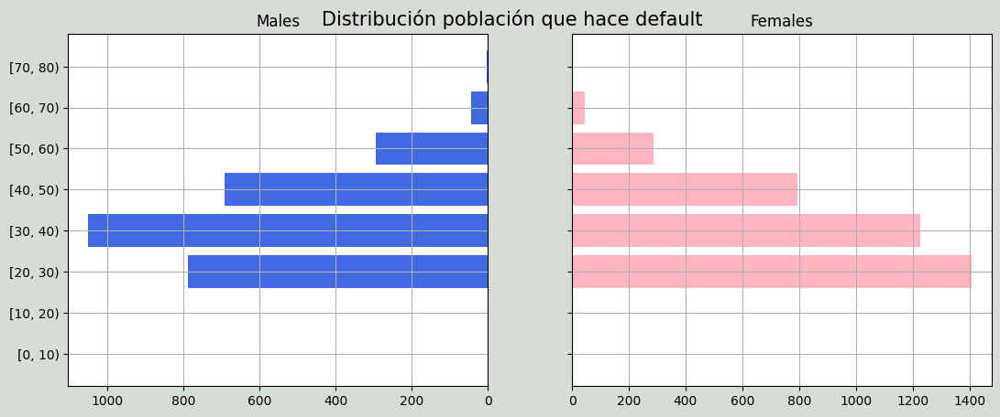

In [45]:
y = range(0, len(distribucion_edad))
male = distribucion_edad[1]
female = distribucion_edad[2]

fig, axes = plt.subplots(ncols=2, sharey=True, figsize=(13, 5))

fig.patch.set_facecolor('xkcd:light grey')
plt.figtext(.5,.9,"Distribución población que hace default ", fontsize=15, ha='center')
    
axes[0].barh(y, male, align='center', color='royalblue')
axes[0].set(title='Males')
axes[1].barh(y, female, align='center', color='lightpink')
axes[1].set(title='Females')

axes[1].grid()
axes[0].set(yticks=y, yticklabels=distribucion_edad[1].index)
axes[0].invert_xaxis()
axes[0].grid()

plt.show()

In [46]:
no_default['age_group'] = pd.cut(no_default['AGE'], bins=range(0, no_default['AGE'].max() + 10, 10), right=False)

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\806997672.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [47]:
distribucion_edad = no_default.groupby(['age_group', 'SEX']).size().unstack()
distribucion_edad

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\3355558198.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



SEX,1,2
age_group,,
"[0, 10)",0,0
"[10, 20)",0,0
"[20, 30)",2492,4929
"[30, 40)",3515,5447
"[40, 50)",2080,2899
"[50, 60)",797,962
"[60, 70)",122,103
"[70, 80)",9,9


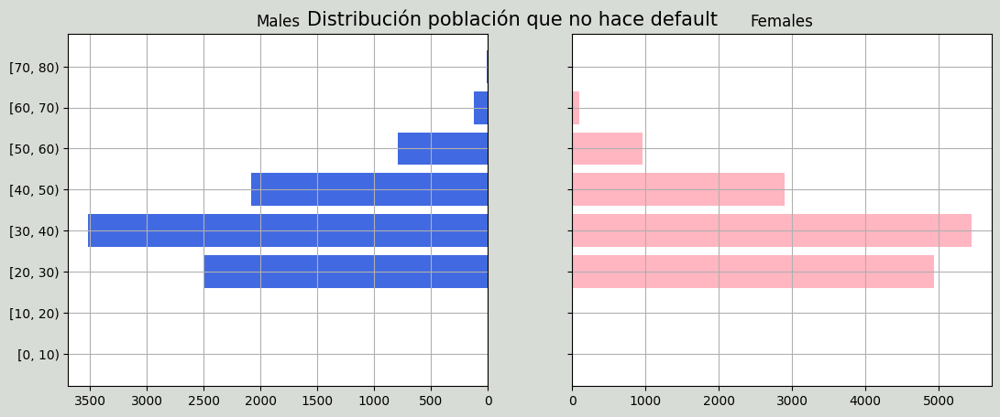

In [48]:
y = range(0, len(distribucion_edad))
male = distribucion_edad[1]
female = distribucion_edad[2]

fig, axes = plt.subplots(ncols=2, sharey=True, figsize=(13, 5))

fig.patch.set_facecolor('xkcd:light grey')
plt.figtext(.5,.9,"Distribución población que no hace default ", fontsize=15, ha='center')
    
axes[0].barh(y, male, align='center', color='royalblue')
axes[0].set(title='Males')
axes[1].barh(y, female, align='center', color='lightpink')
axes[1].set(title='Females')

axes[1].grid()
axes[0].set(yticks=y, yticklabels=distribucion_edad[1].index)
axes[0].invert_xaxis()
axes[0].grid()

plt.show()

### 6. Efecto de la Educación

In [49]:
proporcion_default = hacen_default.groupby('EDUCATION')['default'].sum()/hacen_default.shape[0]

fig = go.Figure(data=go.Bar(x=proporcion_default.index, y=proporcion_default.values))

fig.update_layout(title='Proporción de Default por Niveles de Educación',
                  xaxis=dict(title='Educación'),
                  yaxis=dict(title='Proporción que hacen default'))

fig.show()

In [50]:
proporcion_no_default = no_default.groupby('EDUCATION')['default'].count()/no_default.shape[0]

fig = go.Figure(data=go.Bar(x=proporcion_no_default.index, y=proporcion_no_default.values ))

fig.update_layout(title='Proporción que no hace default por Nivel de Educación',
                  xaxis=dict(title='Educación'),
                  yaxis=dict(title='Proporción que no hace default'))

fig.show()

In [53]:
df['SEX'].unique()

array([2, 1], dtype=int64)

In [54]:
df['MARRIAGE'].unique()

array([1, 2, 3, 0], dtype=int64)

In [55]:
df['EDUCATION'].unique()

array([2, 1, 3, 5, 4, 6, 0], dtype=int64)

### 7. Efecto de Matrimonio

In [51]:
proporcion_default = hacen_default.groupby('MARRIAGE')['default'].sum()/hacen_default.shape[0]

fig = go.Figure(data=go.Bar(x=proporcion_default.index, y=proporcion_default.values))

fig.update_layout(title='Proporción de Default por Estado Civil',
                  xaxis=dict(title='Estado Civil'),
                  yaxis=dict(title='Proporción que hacen default'))

fig.show()

In [57]:
proporcion_no_default = no_default.groupby('MARRIAGE')['default'].count()/no_default.shape[0]

fig = go.Figure(data=go.Bar(x=proporcion_no_default.index, y=proporcion_no_default.values ))

fig.update_layout(title='Proporción que no hace default por Estado Civil',
                  xaxis=dict(title='Estado Civil'),
                  yaxis=dict(title='Proporción que no hace default'))

fig.show()

## Tarea 4. Modelamiento:

Se importan las librerías para hacer la red neuronal

In [52]:
import tensorflow as tf

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [53]:
y = tf.keras.utils.to_categorical(df_limp['default'], num_classes=2)

In [54]:
X = df_limp.iloc[:, :-1]
X

,SEX,EDUCATION,MARRIAGE,LIMIT_BAL,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
19756,2,1,2,0.186028,-0.779642,-0.183292,-0.182710,-0.170838,-0.134897,-0.097728,...,-0.534059,-0.424080,-0.320373,-0.643306,0.054747,0.043380,0.079309,0.122927,-0.003325,-0.289548
21877,2,1,2,1.048235,-0.456753,-1.198658,-1.149284,-1.149046,-1.146185,-1.159393,...,-0.741617,-0.713724,-0.692204,-0.739588,-0.286002,-0.120054,-0.047315,0.010853,-0.254293,0.246524
21830,2,2,1,-0.832944,0.619541,-0.183292,-0.182710,-0.170838,-0.134897,-0.097728,...,-0.090425,-0.044309,-0.312043,-0.280362,-0.233943,-0.178276,-0.201678,-0.230922,-0.257504,-0.239027
9780,2,2,2,0.734705,-0.564383,-0.183292,-0.182710,-0.170838,-0.134897,-0.097728,...,-0.182239,-0.491717,-0.428429,-0.650800,0.544810,0.688005,-0.025861,0.315935,0.122160,-0.308392
14169,1,1,1,1.753677,0.189023,-0.183292,-0.182710,-0.170838,-0.134897,-0.097728,...,0.274204,0.253634,0.248127,0.165191,0.410521,-0.051784,-0.190924,-0.202163,-0.203993,-0.215906
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23142,1,2,1,0.421175,-0.133865,2.862806,1.750439,1.785579,1.887679,2.025602,...,-0.757949,-0.745955,-0.735066,-0.719751,-0.359357,-0.301418,-0.306738,-0.327426,-0.337771,-0.308392
23144,1,2,2,-0.597797,-0.133865,1.847440,1.750439,1.785579,1.887679,2.025602,...,0.304352,0.356132,0.509866,0.526472,0.054747,-0.129019,-0.306738,0.122927,-0.337771,-0.077177
23147,1,2,2,-0.989709,0.189023,3.878173,2.717013,1.785579,-1.146185,-0.097728,...,-0.754384,-0.475968,-0.454056,-0.452676,-0.359357,-0.301418,0.906552,-0.057214,-0.203993,-0.129200
23148,1,3,1,-0.597797,0.619541,0.832074,-1.149284,-0.170838,-0.134897,-0.097728,...,0.261796,-0.007392,-0.589681,0.016087,4.722293,-0.133501,-0.241772,-0.203514,3.204955,-0.204114


In [55]:
X_train_full, X_test, y_train_full, y_test = train_test_split(
   X , y, test_size=0.2, random_state=42)

X_train, X_valid, y_train, y_valid = train_test_split(
    X_train_full, y_train_full, test_size=0.2, random_state=42)

X_train.shape

(9801, 23)

In [56]:
X.shape

(15316, 23)

In [57]:
print('Dimensiones entrenamiento: ', X_train.shape)
print('Dimensiones prueba: ', X_test.shape)
print('Dimensiones validación: ', X_valid.shape)

Dimensiones entrenamiento:  (9801, 23)
Dimensiones prueba:  (3064, 23)
Dimensiones validación:  (2451, 23)


#### Hiperparámetros

In [58]:
#1. Número de capas ocultas
#2. Ancho de la red: Número de neuronas por capa
#3. Función de activación
#4. Función de pérdida
#5. Tipo de optimizador

no_neuronas1 = [2,5,8,10]
no_neuronas2 = [2,5,8,10]
no_neuronas3 = [2,5,8,10]
activation_func1 = ["relu", "softmax", "tanh", "sigmoid"]
activation_func2 = ["relu", "softmax", "tanh", "sigmoid"]
activation_func3 = ["relu", "softmax", "tanh", "sigmoid"]
activation_funcFinal = ["relu", "softmax", "tanh", "sigmoid"]
loss_func = ["categorical_crossentropy", "mean_squared_error", 'Huber']
opt_type = ['nadam','sgd', 'Adam', 'RMSprop',  'Adagrad']


In [59]:
escenarios = pd.DataFrame(index = ["No_capas", "No_neuronas_capa1", "No_neuronas_capa2", "No_neuronas_capa3", "F_act_capa1",
                                    "F_act_capa2", "F_act_capa3", "F_act_capafinal",  "F_perdida", "optimizador"])

In [60]:
escenarios

""
No_capas
No_neuronas_capa1
No_neuronas_capa2
No_neuronas_capa3
F_act_capa1
F_act_capa2
F_act_capa3
F_act_capafinal
F_perdida
optimizador


In [61]:
result_accuracy = pd.DataFrame(index = range(10))
result_accuracy

""
0
1
2
3
4
5
6
7
8
9


In [68]:
cont_caso = 1 #CAMBIAR ESTOOOO
for neu_1 in no_neuronas1:
    for act_1 in activation_func1:
        for act_final in activation_funcFinal:
            for per in loss_func:
                for o in opt_type:
                    tf.random.set_seed(42)
                    tf.keras.backend.clear_session()

                    model = tf.keras.Sequential()
                    model.add(tf.keras.layers.InputLayer(input_shape=(23,)))
                    model.add(tf.keras.layers.Dense(neu_1, activation= act_1)) #CAMBIAR: AGREGAR LAS OTRAS CAPAS OCULTAS
                    model.add(tf.keras.layers.Dense(2, activation=act_final))

                    model.compile(loss= per,
                            optimizer= o,
                            metrics=["accuracy"])

                    history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid))

                    escenarios.loc['No_capas', str(cont_caso)] = 1 #CAMBIAR ESTOOO
                    escenarios.loc["No_neuronas_capa1", str(cont_caso)] = neu_1
                    #escenarios.loc["No_neuronas_capa2", str(cont_caso)] = neu_2  #CAMBIAR ESTOOO Y AÑADIR EL FOR
                    #escenarios.loc["No_neuronas_capa3", str(cont_caso)] = neu_3  #CAMBIAR ESTOOO Y AÑADIR EL FOR
                    escenarios.loc["F_act_capa1", str(cont_caso)] = act_1
                    #escenarios.loc["F_act_capa2", str(cont_caso)] = act_2  #CAMBIAR ESTOOO Y AÑADIR EL FOR
                    #escenarios.loc["F_act_capa3", str(cont_caso)] = act_3  #CAMBIAR ESTOOO Y AÑADIR EL FOR
                    escenarios.loc["F_act_capafinal", str(cont_caso)] = act_final
                    escenarios.loc["F_perdida", str(cont_caso)] = per
                    escenarios.loc["optimizador", str(cont_caso)] = o
                    result_accuracy[str(cont_caso)] = history.history['accuracy']

                    cont_caso += 1



Epoch 1/10


307/307 [==============================] - 4s 4ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [========================

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6445 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6433 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 3m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.5248 - accuracy: 0.6181 - val_loss: 0.4352 - val_accuracy: 0.6401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3176 - accuracy: 0.6425 - val_loss: 0.3333 - val_accuracy: 0.6536
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2863 - accuracy: 0.6495 - val_loss: 0.2973 - val_accuracy: 0.6626
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2763 - accuracy: 0.6557 - val_loss: 0.2812 - val_accuracy: 0.6724
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2699 - accuracy: 0.6636 - val_loss: 0.2696 - val_accuracy: 0.6842
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2605 - accuracy: 0.6804 - val_loss: 0.2565 - val_accuracy: 0.6997
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2471 - accuracy: 0.7043 - val_loss: 0.2404 - val_accuracy: 0.7120
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3493 - accuracy: 0.6447 - val_loss: 0.3120 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3041 - accuracy: 0.6447 - val_loss: 0.2880 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2868 - accuracy: 0.6447 - val_loss: 0.2782 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2805 - accuracy: 0.6447 - val_loss: 0.2749 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2779 - accuracy: 0.6447 - val_loss: 0.2724 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2764 - accuracy: 0.6447 - val_loss: 0.2712 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2754 - accuracy: 0.6447 - val_loss: 0.2700 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.4940 - accuracy: 0.6243 - val_loss: 0.4752 - val_accuracy: 0.6712
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4568 - accuracy: 0.6463 - val_loss: 0.4516 - val_accuracy: 0.5908
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4343 - accuracy: 0.5393 - val_loss: 0.4352 - val_accuracy: 0.4851
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4238 - accuracy: 0.4703 - val_loss: 0.4291 - val_accuracy: 0.4162
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4188 - accuracy: 0.4099 - val_loss: 0.4250 - val_accuracy: 0.3798
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4163 - accuracy: 0.3846 - val_loss: 0.4233 - val_accuracy: 0.3729
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4150 - accuracy: 0.3850 - val_loss: 0.4221 - val_accuracy: 0.3692
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.4825 - accuracy: 0.4823 - val_loss: 0.4470 - val_accuracy: 0.4606
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4317 - accuracy: 0.4392 - val_loss: 0.4307 - val_accuracy: 0.4198
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4216 - accuracy: 0.4025 - val_loss: 0.4252 - val_accuracy: 0.3864
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4179 - accuracy: 0.3909 - val_loss: 0.4236 - val_accuracy: 0.3709
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4164 - accuracy: 0.3791 - val_loss: 0.4220 - val_accuracy: 0.3696
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4155 - accuracy: 0.3768 - val_loss: 0.4212 - val_accuracy: 0.3758
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4149 - accuracy: 0.3781 - val_loss: 0.4208 - val_accuracy: 0.3639
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.5972 - accuracy: 0.6379 - val_loss: 0.5711 - val_accuracy: 0.6438
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5401 - accuracy: 0.6363 - val_loss: 0.5363 - val_accuracy: 0.6369
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5131 - accuracy: 0.4876 - val_loss: 0.5140 - val_accuracy: 0.4786
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4944 - accuracy: 0.4746 - val_loss: 0.4976 - val_accuracy: 0.4769
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4800 - accuracy: 0.4739 - val_loss: 0.4844 - val_accuracy: 0.4757
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4683 - accuracy: 0.4732 - val_loss: 0.4734 - val_accuracy: 0.4733
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4584 - accuracy: 0.4771 - val_loss: 0.4639 - val_accuracy: 0.4741
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2447 - accuracy: 0.6447 - val_loss: 0.1990 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1647 - accuracy: 0.6447 - val_loss: 0.1421 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1397 - accuracy: 0.6447 - val_loss: 0.1359 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1369 - accuracy: 0.6447 - val_loss: 0.1344 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1170 - accuracy: 0.6813 - val_loss: 0.0985 - val_accuracy: 0.7466
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0957 - accuracy: 0.7510 - val_loss: 0.0946 - val_accuracy: 0.7491
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0934 - accuracy: 0.7579 - val_loss: 0.0930 - val_accuracy: 0.7540
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2058 - accuracy: 0.6447 - val_loss: 0.1755 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1606 - accuracy: 0.6447 - val_loss: 0.1452 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1420 - accuracy: 0.6447 - val_loss: 0.1344 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1331 - accuracy: 0.6447 - val_loss: 0.1239 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1214 - accuracy: 0.6447 - val_loss: 0.1158 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1112 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.6973 - val_loss: 0.1081 - val_accuracy: 0.7295
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2686 - accuracy: 0.4361 - val_loss: 0.2434 - val_accuracy: 0.5508
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2347 - accuracy: 0.5649 - val_loss: 0.2306 - val_accuracy: 0.5683
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2225 - accuracy: 0.5415 - val_loss: 0.2205 - val_accuracy: 0.4969
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2148 - accuracy: 0.5025 - val_loss: 0.2164 - val_accuracy: 0.4712
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2111 - accuracy: 0.3996 - val_loss: 0.2127 - val_accuracy: 0.3529
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2080 - accuracy: 0.3596 - val_loss: 0.2105 - val_accuracy: 0.3492
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2067 - accuracy: 0.3583 - val_loss: 0.2096 - val_accuracy: 0.3492
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2053 - accuracy: 0.6447 - val_loss: 0.1601 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1487 - accuracy: 0.6447 - val_loss: 0.1393 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1403 - accuracy: 0.6447 - val_loss: 0.1350 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1374 - accuracy: 0.6447 - val_loss: 0.1337 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1361 - accuracy: 0.6447 - val_loss: 0.1325 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1354 - accuracy: 0.6447 - val_loss: 0.1323 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1351 - accuracy: 0.6447 - val_loss: 0.1320 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3050 - accuracy: 0.6718 - val_loss: 0.2912 - val_accuracy: 0.6756
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2724 - accuracy: 0.6871 - val_loss: 0.2695 - val_accuracy: 0.6879
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2554 - accuracy: 0.6953 - val_loss: 0.2555 - val_accuracy: 0.6977
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2436 - accuracy: 0.6994 - val_loss: 0.2450 - val_accuracy: 0.7071
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2345 - accuracy: 0.7020 - val_loss: 0.2366 - val_accuracy: 0.7120
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2269 - accuracy: 0.7083 - val_loss: 0.2296 - val_accuracy: 0.7132
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2205 - accuracy: 0.7096 - val_loss: 0.2236 - val_accuracy: 0.7148
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.7153 - accuracy: 0.6210 - val_loss: 0.6567 - val_accuracy: 0.6610
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6187 - accuracy: 0.6997 - val_loss: 0.5905 - val_accuracy: 0.7234
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5798 - accuracy: 0.7282 - val_loss: 0.5692 - val_accuracy: 0.7364
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5600 - accuracy: 0.7389 - val_loss: 0.5543 - val_accuracy: 0.7483
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5484 - accuracy: 0.7502 - val_loss: 0.5451 - val_accuracy: 0.7544
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5412 - accuracy: 0.7587 - val_loss: 0.5408 - val_accuracy: 0.7597
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5376 - accuracy: 0.7615 - val_loss: 0.5374 - val_accuracy: 0.7605
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.7809 - accuracy: 0.5731 - val_loss: 0.6539 - val_accuracy: 0.6503
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6476 - accuracy: 0.6517 - val_loss: 0.6236 - val_accuracy: 0.6846
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6095 - accuracy: 0.7049 - val_loss: 0.5965 - val_accuracy: 0.7205
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5829 - accuracy: 0.7281 - val_loss: 0.5767 - val_accuracy: 0.7352
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5625 - accuracy: 0.7478 - val_loss: 0.5598 - val_accuracy: 0.7430
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5498 - accuracy: 0.7545 - val_loss: 0.5507 - val_accuracy: 0.7548
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5432 - accuracy: 0.7601 - val_loss: 0.5469 - val_accuracy: 0.7589
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6551 - accuracy: 0.6820 - val_loss: 0.6218 - val_accuracy: 0.7189
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6037 - accuracy: 0.7239 - val_loss: 0.5859 - val_accuracy: 0.7393
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5770 - accuracy: 0.7346 - val_loss: 0.5660 - val_accuracy: 0.7487
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5610 - accuracy: 0.7407 - val_loss: 0.5542 - val_accuracy: 0.7519
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5513 - accuracy: 0.7471 - val_loss: 0.5480 - val_accuracy: 0.7483
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5451 - accuracy: 0.7511 - val_loss: 0.5438 - val_accuracy: 0.7503
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5413 - accuracy: 0.7574 - val_loss: 0.5412 - val_accuracy: 0.7523
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.7790 - accuracy: 0.6447 - val_loss: 0.6577 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6560 - accuracy: 0.6447 - val_loss: 0.6439 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6527 - accuracy: 0.6447 - val_loss: 0.6431 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6522 - accuracy: 0.6447 - val_loss: 0.6432 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6518 - accuracy: 0.6447 - val_loss: 0.6425 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6517 - accuracy: 0.6447 - val_loss: 0.6423 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6518 - accuracy: 0.6447 - val_loss: 0.6418 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.9520 - accuracy: 0.6408 - val_loss: 0.8707 - val_accuracy: 0.6618
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8776 - accuracy: 0.6479 - val_loss: 0.8254 - val_accuracy: 0.6675
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8379 - accuracy: 0.6555 - val_loss: 0.7950 - val_accuracy: 0.6748
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8097 - accuracy: 0.6615 - val_loss: 0.7723 - val_accuracy: 0.6769
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7881 - accuracy: 0.6657 - val_loss: 0.7546 - val_accuracy: 0.6789
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7709 - accuracy: 0.6680 - val_loss: 0.7405 - val_accuracy: 0.6809
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7569 - accuracy: 0.6716 - val_loss: 0.7288 - val_accuracy: 0.6818
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2080 - accuracy: 0.7007 - val_loss: 0.1852 - val_accuracy: 0.7336
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1846 - accuracy: 0.7370 - val_loss: 0.1805 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7510 - val_loss: 0.1777 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1777 - accuracy: 0.7603 - val_loss: 0.1765 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7638 - val_loss: 0.1747 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7672 - val_loss: 0.1739 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7679 - val_loss: 0.1732 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2661 - accuracy: 0.5774 - val_loss: 0.2183 - val_accuracy: 0.7042
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2084 - accuracy: 0.7203 - val_loss: 0.2025 - val_accuracy: 0.7242
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1974 - accuracy: 0.7329 - val_loss: 0.1960 - val_accuracy: 0.7319
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1923 - accuracy: 0.7367 - val_loss: 0.1927 - val_accuracy: 0.7319
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1895 - accuracy: 0.7406 - val_loss: 0.1905 - val_accuracy: 0.7340
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1875 - accuracy: 0.7428 - val_loss: 0.1887 - val_accuracy: 0.7373
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1858 - accuracy: 0.7446 - val_loss: 0.1873 - val_accuracy: 0.7401
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2068 - accuracy: 0.7210 - val_loss: 0.1955 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1909 - accuracy: 0.7535 - val_loss: 0.1880 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1851 - accuracy: 0.7648 - val_loss: 0.1846 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1822 - accuracy: 0.7665 - val_loss: 0.1834 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1807 - accuracy: 0.7672 - val_loss: 0.1817 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7677 - val_loss: 0.1809 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.7685 - val_loss: 0.1804 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2305 - accuracy: 0.6578 - val_loss: 0.2079 - val_accuracy: 0.7230
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1970 - accuracy: 0.7294 - val_loss: 0.1884 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1847 - accuracy: 0.7422 - val_loss: 0.1812 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.7524 - val_loss: 0.1782 - val_accuracy: 0.7556
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7626 - val_loss: 0.1759 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7668 - val_loss: 0.1749 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7698 - val_loss: 0.1742 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2415 - accuracy: 0.6447 - val_loss: 0.2351 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2371 - accuracy: 0.6447 - val_loss: 0.2321 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2344 - accuracy: 0.6447 - val_loss: 0.2302 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2325 - accuracy: 0.6447 - val_loss: 0.2287 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.6447 - val_loss: 0.2276 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2298 - accuracy: 0.6447 - val_loss: 0.2267 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2287 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1529 - accuracy: 0.5492 - val_loss: 0.1041 - val_accuracy: 0.7328
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0968 - accuracy: 0.7470 - val_loss: 0.0933 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0909 - accuracy: 0.7606 - val_loss: 0.0897 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7659 - val_loss: 0.0880 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7681 - val_loss: 0.0871 - val_accuracy: 0.7715
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7689 - val_loss: 0.0866 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7692 - val_loss: 0.0864 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1279 - accuracy: 0.6385 - val_loss: 0.1211 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6771 - val_loss: 0.1124 - val_accuracy: 0.6895
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1090 - accuracy: 0.7080 - val_loss: 0.1066 - val_accuracy: 0.7148
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1040 - accuracy: 0.7243 - val_loss: 0.1024 - val_accuracy: 0.7291
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1004 - accuracy: 0.7337 - val_loss: 0.0992 - val_accuracy: 0.7405
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0976 - accuracy: 0.7394 - val_loss: 0.0968 - val_accuracy: 0.7458
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0956 - accuracy: 0.7460 - val_loss: 0.0951 - val_accuracy: 0.7495
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1236 - accuracy: 0.6153 - val_loss: 0.1141 - val_accuracy: 0.6491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1080 - accuracy: 0.6420 - val_loss: 0.1016 - val_accuracy: 0.6544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0996 - accuracy: 0.6812 - val_loss: 0.0960 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0950 - accuracy: 0.7578 - val_loss: 0.0931 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0924 - accuracy: 0.7649 - val_loss: 0.0913 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7679 - val_loss: 0.0905 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7689 - val_loss: 0.0900 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1206 - accuracy: 0.6466 - val_loss: 0.1018 - val_accuracy: 0.7368
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0958 - accuracy: 0.7472 - val_loss: 0.0919 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7655 - val_loss: 0.0886 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7689 - val_loss: 0.0878 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7681 - val_loss: 0.0874 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7693 - val_loss: 0.0871 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7704 - val_loss: 0.0870 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1613 - accuracy: 0.6447 - val_loss: 0.1563 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1591 - accuracy: 0.6447 - val_loss: 0.1544 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1572 - accuracy: 0.6447 - val_loss: 0.1527 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1554 - accuracy: 0.6447 - val_loss: 0.1511 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1538 - accuracy: 0.6447 - val_loss: 0.1496 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1521 - accuracy: 0.6447 - val_loss: 0.1481 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1506 - accuracy: 0.6447 - val_loss: 0.1466 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.5893 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6445 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6445 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3312 - accuracy: 0.5923 - val_loss: 0.2712 - val_accuracy: 0.6663
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2371 - accuracy: 0.6752 - val_loss: 0.2149 - val_accuracy: 0.7022
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2015 - accuracy: 0.7378 - val_loss: 0.1917 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1889 - accuracy: 0.7531 - val_loss: 0.1870 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1851 - accuracy: 0.7605 - val_loss: 0.1838 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1832 - accuracy: 0.7633 - val_loss: 0.1827 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1824 - accuracy: 0.7647 - val_loss: 0.1815 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2899 - accuracy: 0.6669 - val_loss: 0.2249 - val_accuracy: 0.7303
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2147 - accuracy: 0.7274 - val_loss: 0.2037 - val_accuracy: 0.7426
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1970 - accuracy: 0.7458 - val_loss: 0.1926 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1897 - accuracy: 0.7535 - val_loss: 0.1884 - val_accuracy: 0.7576
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1864 - accuracy: 0.7579 - val_loss: 0.1860 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1844 - accuracy: 0.7604 - val_loss: 0.1843 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1830 - accuracy: 0.7621 - val_loss: 0.1831 - val_accuracy: 0.7625
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2972 - accuracy: 0.6827 - val_loss: 0.2213 - val_accuracy: 0.7230
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2127 - accuracy: 0.7394 - val_loss: 0.2045 - val_accuracy: 0.7409
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2000 - accuracy: 0.7531 - val_loss: 0.1953 - val_accuracy: 0.7442
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1927 - accuracy: 0.7578 - val_loss: 0.1906 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1887 - accuracy: 0.7606 - val_loss: 0.1873 - val_accuracy: 0.7572
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1861 - accuracy: 0.7621 - val_loss: 0.1858 - val_accuracy: 0.7597
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1847 - accuracy: 0.7628 - val_loss: 0.1845 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6218 - accuracy: 0.5621 - val_loss: 0.2492 - val_accuracy: 0.6728
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2083 - accuracy: 0.7232 - val_loss: 0.1922 - val_accuracy: 0.7373
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1870 - accuracy: 0.7556 - val_loss: 0.1848 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1825 - accuracy: 0.7637 - val_loss: 0.1832 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1809 - accuracy: 0.7645 - val_loss: 0.1812 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1797 - accuracy: 0.7660 - val_loss: 0.1805 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1789 - accuracy: 0.7665 - val_loss: 0.1794 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.4540 - accuracy: 0.6319 - val_loss: 0.4257 - val_accuracy: 0.6430
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4140 - accuracy: 0.6428 - val_loss: 0.3969 - val_accuracy: 0.6499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3896 - accuracy: 0.6492 - val_loss: 0.3760 - val_accuracy: 0.6552
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3713 - accuracy: 0.6538 - val_loss: 0.3599 - val_accuracy: 0.6650
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3569 - accuracy: 0.6596 - val_loss: 0.3471 - val_accuracy: 0.6687
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3451 - accuracy: 0.6624 - val_loss: 0.3366 - val_accuracy: 0.6736
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3352 - accuracy: 0.6676 - val_loss: 0.3276 - val_accuracy: 0.6789
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2420 - accuracy: 0.4998 - val_loss: 0.1596 - val_accuracy: 0.6499
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1404 - accuracy: 0.6426 - val_loss: 0.1283 - val_accuracy: 0.6544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1229 - accuracy: 0.6440 - val_loss: 0.1186 - val_accuracy: 0.6548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1173 - accuracy: 0.6445 - val_loss: 0.1152 - val_accuracy: 0.6557
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6447 - val_loss: 0.1140 - val_accuracy: 0.6557
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1148 - accuracy: 0.6447 - val_loss: 0.1136 - val_accuracy: 0.6557
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1134 - val_accuracy: 0.6557
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2026 - accuracy: 0.5616 - val_loss: 0.1356 - val_accuracy: 0.6450
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1248 - accuracy: 0.6699 - val_loss: 0.1182 - val_accuracy: 0.6875
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1119 - accuracy: 0.7040 - val_loss: 0.1085 - val_accuracy: 0.7177
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1039 - accuracy: 0.7249 - val_loss: 0.1024 - val_accuracy: 0.7295
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0990 - accuracy: 0.7390 - val_loss: 0.0986 - val_accuracy: 0.7389
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0960 - accuracy: 0.7450 - val_loss: 0.0962 - val_accuracy: 0.7450
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7483 - val_loss: 0.0948 - val_accuracy: 0.7458
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2103 - accuracy: 0.5794 - val_loss: 0.1487 - val_accuracy: 0.6932
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1298 - accuracy: 0.7121 - val_loss: 0.1169 - val_accuracy: 0.7352
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1093 - accuracy: 0.7418 - val_loss: 0.1032 - val_accuracy: 0.7462
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0996 - accuracy: 0.7537 - val_loss: 0.0965 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0948 - accuracy: 0.7622 - val_loss: 0.0932 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0922 - accuracy: 0.7651 - val_loss: 0.0915 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0908 - accuracy: 0.7655 - val_loss: 0.0905 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1840 - accuracy: 0.6170 - val_loss: 0.1139 - val_accuracy: 0.7140
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1062 - accuracy: 0.7389 - val_loss: 0.1008 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0989 - accuracy: 0.7539 - val_loss: 0.0966 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0955 - accuracy: 0.7635 - val_loss: 0.0946 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0934 - accuracy: 0.7648 - val_loss: 0.0924 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0916 - accuracy: 0.7652 - val_loss: 0.0911 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0900 - accuracy: 0.7665 - val_loss: 0.0896 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2281 - accuracy: 0.6553 - val_loss: 0.2224 - val_accuracy: 0.6663
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2183 - accuracy: 0.6561 - val_loss: 0.2148 - val_accuracy: 0.6679
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2118 - accuracy: 0.6569 - val_loss: 0.2089 - val_accuracy: 0.6695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2067 - accuracy: 0.6572 - val_loss: 0.2041 - val_accuracy: 0.6691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2023 - accuracy: 0.6576 - val_loss: 0.1998 - val_accuracy: 0.6683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1983 - accuracy: 0.6581 - val_loss: 0.1959 - val_accuracy: 0.6687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.6584 - val_loss: 0.1922 - val_accuracy: 0.6699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.7133 - accuracy: 0.6025 - val_loss: 0.6627 - val_accuracy: 0.6528
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6361 - accuracy: 0.6805 - val_loss: 0.5987 - val_accuracy: 0.7373
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5812 - accuracy: 0.7398 - val_loss: 0.5696 - val_accuracy: 0.7487
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5607 - accuracy: 0.7492 - val_loss: 0.5530 - val_accuracy: 0.7556
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5498 - accuracy: 0.7566 - val_loss: 0.5457 - val_accuracy: 0.7576
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5442 - accuracy: 0.7605 - val_loss: 0.5422 - val_accuracy: 0.7601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5411 - accuracy: 0.7638 - val_loss: 0.5402 - val_accuracy: 0.7597
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.7067 - accuracy: 0.6047 - val_loss: 0.6706 - val_accuracy: 0.6450
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6549 - accuracy: 0.6410 - val_loss: 0.6536 - val_accuracy: 0.6532
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6491 - accuracy: 0.6445 - val_loss: 0.6361 - val_accuracy: 0.6601
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5947 - accuracy: 0.7152 - val_loss: 0.5741 - val_accuracy: 0.7421
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5617 - accuracy: 0.7405 - val_loss: 0.5570 - val_accuracy: 0.7507
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5507 - accuracy: 0.7464 - val_loss: 0.5497 - val_accuracy: 0.7503
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5454 - accuracy: 0.7520 - val_loss: 0.5460 - val_accuracy: 0.7540
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6613 - accuracy: 0.6672 - val_loss: 0.6126 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5885 - accuracy: 0.7372 - val_loss: 0.5772 - val_accuracy: 0.7409
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5649 - accuracy: 0.7438 - val_loss: 0.5613 - val_accuracy: 0.7438
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5530 - accuracy: 0.7479 - val_loss: 0.5534 - val_accuracy: 0.7487
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5464 - accuracy: 0.7514 - val_loss: 0.5487 - val_accuracy: 0.7507
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5427 - accuracy: 0.7552 - val_loss: 0.5460 - val_accuracy: 0.7511
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5404 - accuracy: 0.7593 - val_loss: 0.5439 - val_accuracy: 0.7548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6179 - accuracy: 0.6954 - val_loss: 0.5891 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5869 - accuracy: 0.7357 - val_loss: 0.5751 - val_accuracy: 0.7352
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5749 - accuracy: 0.7425 - val_loss: 0.5678 - val_accuracy: 0.7421
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5677 - accuracy: 0.7495 - val_loss: 0.5639 - val_accuracy: 0.7470
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5628 - accuracy: 0.7539 - val_loss: 0.5587 - val_accuracy: 0.7503
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5587 - accuracy: 0.7558 - val_loss: 0.5565 - val_accuracy: 0.7528
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5558 - accuracy: 0.7599 - val_loss: 0.5540 - val_accuracy: 0.7552
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.9687 - accuracy: 0.4675 - val_loss: 0.9554 - val_accuracy: 0.5018
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8979 - accuracy: 0.5163 - val_loss: 0.9049 - val_accuracy: 0.5369
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8610 - accuracy: 0.5427 - val_loss: 0.8724 - val_accuracy: 0.5626
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8356 - accuracy: 0.5644 - val_loss: 0.8487 - val_accuracy: 0.5773
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8167 - accuracy: 0.5855 - val_loss: 0.8301 - val_accuracy: 0.5932
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8016 - accuracy: 0.6053 - val_loss: 0.8148 - val_accuracy: 0.6059
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7892 - accuracy: 0.6170 - val_loss: 0.8020 - val_accuracy: 0.6177
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2451 - accuracy: 0.6273 - val_loss: 0.2203 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2094 - accuracy: 0.7492 - val_loss: 0.2010 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1942 - accuracy: 0.7612 - val_loss: 0.1895 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1854 - accuracy: 0.7661 - val_loss: 0.1827 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1802 - accuracy: 0.7680 - val_loss: 0.1788 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7700 - val_loss: 0.1764 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1753 - accuracy: 0.7695 - val_loss: 0.1748 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2511 - accuracy: 0.6338 - val_loss: 0.2466 - val_accuracy: 0.6597
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2437 - accuracy: 0.6455 - val_loss: 0.2403 - val_accuracy: 0.6528
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2390 - accuracy: 0.6443 - val_loss: 0.2362 - val_accuracy: 0.6544
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2359 - accuracy: 0.6440 - val_loss: 0.2333 - val_accuracy: 0.6552
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2337 - accuracy: 0.6443 - val_loss: 0.2312 - val_accuracy: 0.6557
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2322 - accuracy: 0.6445 - val_loss: 0.2296 - val_accuracy: 0.6561
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2310 - accuracy: 0.6450 - val_loss: 0.2284 - val_accuracy: 0.6561
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2354 - accuracy: 0.6336 - val_loss: 0.2077 - val_accuracy: 0.6834
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1979 - accuracy: 0.7282 - val_loss: 0.1873 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1822 - accuracy: 0.7615 - val_loss: 0.1783 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7667 - val_loss: 0.1762 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1756 - accuracy: 0.7690 - val_loss: 0.1752 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1746 - accuracy: 0.7699 - val_loss: 0.1746 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1741 - accuracy: 0.7710 - val_loss: 0.1741 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2301 - accuracy: 0.6447 - val_loss: 0.2135 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2078 - accuracy: 0.6447 - val_loss: 0.1981 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1975 - accuracy: 0.6900 - val_loss: 0.1917 - val_accuracy: 0.7515
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1921 - accuracy: 0.7554 - val_loss: 0.1881 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1882 - accuracy: 0.7606 - val_loss: 0.1849 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1853 - accuracy: 0.7624 - val_loss: 0.1831 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1833 - accuracy: 0.7645 - val_loss: 0.1818 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2829 - accuracy: 0.6447 - val_loss: 0.2764 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2810 - accuracy: 0.6447 - val_loss: 0.2748 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2795 - accuracy: 0.6447 - val_loss: 0.2734 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2782 - accuracy: 0.6447 - val_loss: 0.2721 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2769 - accuracy: 0.6447 - val_loss: 0.2709 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2757 - accuracy: 0.6447 - val_loss: 0.2698 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2745 - accuracy: 0.6447 - val_loss: 0.2687 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1234 - accuracy: 0.6449 - val_loss: 0.1173 - val_accuracy: 0.6577
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1107 - accuracy: 0.7092 - val_loss: 0.1026 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0987 - accuracy: 0.7497 - val_loss: 0.0952 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0936 - accuracy: 0.7504 - val_loss: 0.0918 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7550 - val_loss: 0.0898 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7615 - val_loss: 0.0887 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7681 - val_loss: 0.0879 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1270 - accuracy: 0.5862 - val_loss: 0.1223 - val_accuracy: 0.6299
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1208 - accuracy: 0.6364 - val_loss: 0.1181 - val_accuracy: 0.6663
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1175 - accuracy: 0.6650 - val_loss: 0.1154 - val_accuracy: 0.6793
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6791 - val_loss: 0.1133 - val_accuracy: 0.6879
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.6882 - val_loss: 0.1111 - val_accuracy: 0.6940
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1106 - accuracy: 0.6957 - val_loss: 0.1088 - val_accuracy: 0.7042
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1080 - accuracy: 0.7032 - val_loss: 0.1060 - val_accuracy: 0.7115
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1273 - accuracy: 0.6447 - val_loss: 0.1181 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1170 - accuracy: 0.6447 - val_loss: 0.1143 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1148 - accuracy: 0.6447 - val_loss: 0.1121 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1111 - accuracy: 0.6447 - val_loss: 0.1062 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1049 - accuracy: 0.6447 - val_loss: 0.1010 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1003 - accuracy: 0.6447 - val_loss: 0.0977 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0973 - accuracy: 0.7059 - val_loss: 0.0954 - val_accuracy: 0.7548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1217 - accuracy: 0.6279 - val_loss: 0.1107 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1043 - accuracy: 0.7467 - val_loss: 0.0986 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0952 - accuracy: 0.7646 - val_loss: 0.0914 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7692 - val_loss: 0.0879 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7695 - val_loss: 0.0866 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7710 - val_loss: 0.0862 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7713 - val_loss: 0.0859 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1370 - accuracy: 0.3869 - val_loss: 0.1359 - val_accuracy: 0.4043
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1348 - accuracy: 0.4022 - val_loss: 0.1341 - val_accuracy: 0.4202
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1333 - accuracy: 0.4132 - val_loss: 0.1328 - val_accuracy: 0.4325
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1321 - accuracy: 0.4270 - val_loss: 0.1317 - val_accuracy: 0.4455
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1311 - accuracy: 0.4387 - val_loss: 0.1308 - val_accuracy: 0.4553
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1303 - accuracy: 0.4516 - val_loss: 0.1300 - val_accuracy: 0.4672
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1296 - accuracy: 0.4605 - val_loss: 0.1293 - val_accuracy: 0.4769
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.7035 - accuracy: 0.6447 - val_loss: 0.6707 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6496 - accuracy: 0.6447 - val_loss: 0.6289 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6285 - accuracy: 0.6447 - val_loss: 0.6190 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6145 - accuracy: 0.6447 - val_loss: 0.6032 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5937 - accuracy: 0.7063 - val_loss: 0.5816 - val_accuracy: 0.7377
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5671 - accuracy: 0.7408 - val_loss: 0.5574 - val_accuracy: 0.7503
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5499 - accuracy: 0.7530 - val_loss: 0.5465 - val_accuracy: 0.7495
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6579 - accuracy: 0.6396 - val_loss: 0.6245 - val_accuracy: 0.6875
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5991 - accuracy: 0.7124 - val_loss: 0.6323 - val_accuracy: 0.7201
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5622 - accuracy: 0.7373 - val_loss: 0.5538 - val_accuracy: 0.7450
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5558 - accuracy: 0.7417 - val_loss: 0.5528 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5442 - accuracy: 0.7517 - val_loss: 0.5445 - val_accuracy: 0.7519
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5397 - accuracy: 0.7575 - val_loss: 0.5430 - val_accuracy: 0.7499
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5366 - accuracy: 0.7614 - val_loss: 0.5387 - val_accuracy: 0.7601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6444 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6443 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 7.2517 - accuracy: 0.3981 - val_loss: 6.6294 - val_accuracy: 0.4166
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 6.7086 - accuracy: 0.4100 - val_loss: 6.2209 - val_accuracy: 0.4174
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 6.4414 - accuracy: 0.4198 - val_loss: 6.1005 - val_accuracy: 0.4211
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 6.3472 - accuracy: 0.4225 - val_loss: 6.0712 - val_accuracy: 0.4206
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 6.3045 - accuracy: 0.4250 - val_loss: 6.0049 - val_accuracy: 0.4223
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 6.2556 - accuracy: 0.4258 - val_loss: 5.9599 - val_accuracy: 0.4227
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 6.2167 - accuracy: 0.4266 - val_loss: 5.9231 - val_accuracy: 0.4255
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2594 - accuracy: 0.6447 - val_loss: 0.2377 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2347 - accuracy: 0.6447 - val_loss: 0.2275 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2301 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2282 - accuracy: 0.6447 - val_loss: 0.2237 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2220 - accuracy: 0.6447 - val_loss: 0.2120 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2020 - accuracy: 0.7011 - val_loss: 0.1894 - val_accuracy: 0.7540
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1851 - accuracy: 0.7659 - val_loss: 0.1820 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2779 - accuracy: 0.6647 - val_loss: 0.2327 - val_accuracy: 0.6752
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2285 - accuracy: 0.6824 - val_loss: 0.2211 - val_accuracy: 0.6899
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2178 - accuracy: 0.7133 - val_loss: 0.2111 - val_accuracy: 0.7266
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2076 - accuracy: 0.7420 - val_loss: 0.2025 - val_accuracy: 0.7507
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1991 - accuracy: 0.7580 - val_loss: 0.1958 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1932 - accuracy: 0.7620 - val_loss: 0.1919 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1896 - accuracy: 0.7659 - val_loss: 0.1897 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.4521 - accuracy: 0.6632 - val_loss: 0.4284 - val_accuracy: 0.5565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4206 - accuracy: 0.5692 - val_loss: 0.4256 - val_accuracy: 0.5496
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4184 - accuracy: 0.5729 - val_loss: 0.4239 - val_accuracy: 0.5585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4169 - accuracy: 0.5688 - val_loss: 0.4233 - val_accuracy: 0.5377
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4160 - accuracy: 0.5564 - val_loss: 0.4221 - val_accuracy: 0.5345
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4153 - accuracy: 0.5459 - val_loss: 0.4216 - val_accuracy: 0.5235
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4150 - accuracy: 0.5377 - val_loss: 0.4211 - val_accuracy: 0.5169
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3402 - accuracy: 0.6318 - val_loss: 0.2250 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2076 - accuracy: 0.7494 - val_loss: 0.1996 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1890 - accuracy: 0.7633 - val_loss: 0.1874 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1822 - accuracy: 0.7653 - val_loss: 0.1846 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7657 - val_loss: 0.1780 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1755 - accuracy: 0.7665 - val_loss: 0.1766 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7691 - val_loss: 0.1756 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.4819 - accuracy: 0.4858 - val_loss: 0.4753 - val_accuracy: 0.4190
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4694 - accuracy: 0.3907 - val_loss: 0.4658 - val_accuracy: 0.3660
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4614 - accuracy: 0.3649 - val_loss: 0.4595 - val_accuracy: 0.3497
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4558 - accuracy: 0.3590 - val_loss: 0.4551 - val_accuracy: 0.3464
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4518 - accuracy: 0.3566 - val_loss: 0.4518 - val_accuracy: 0.3460
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4487 - accuracy: 0.3562 - val_loss: 0.4492 - val_accuracy: 0.3452
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4462 - accuracy: 0.3557 - val_loss: 0.4472 - val_accuracy: 0.3439
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1255 - accuracy: 0.6575 - val_loss: 0.1062 - val_accuracy: 0.7083
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1036 - accuracy: 0.7304 - val_loss: 0.0997 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0981 - accuracy: 0.7522 - val_loss: 0.0959 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0950 - accuracy: 0.7647 - val_loss: 0.0942 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0932 - accuracy: 0.7672 - val_loss: 0.0924 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0917 - accuracy: 0.7683 - val_loss: 0.0914 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7691 - val_loss: 0.0902 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2132 - accuracy: 0.4407 - val_loss: 0.1693 - val_accuracy: 0.5679
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1408 - accuracy: 0.6216 - val_loss: 0.1157 - val_accuracy: 0.6703
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1069 - accuracy: 0.7036 - val_loss: 0.1039 - val_accuracy: 0.7213
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1002 - accuracy: 0.7318 - val_loss: 0.1002 - val_accuracy: 0.7295
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0974 - accuracy: 0.7437 - val_loss: 0.0980 - val_accuracy: 0.7368
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0957 - accuracy: 0.7469 - val_loss: 0.0966 - val_accuracy: 0.7385
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0946 - accuracy: 0.7499 - val_loss: 0.0955 - val_accuracy: 0.7430
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2172 - accuracy: 0.3553 - val_loss: 0.2126 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2084 - accuracy: 0.3553 - val_loss: 0.2102 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2065 - accuracy: 0.3553 - val_loss: 0.2088 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2054 - accuracy: 0.3553 - val_loss: 0.2083 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2050 - accuracy: 0.3553 - val_loss: 0.2079 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2047 - accuracy: 0.3553 - val_loss: 0.2077 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2045 - accuracy: 0.3553 - val_loss: 0.2076 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1700 - accuracy: 0.6447 - val_loss: 0.1367 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1383 - accuracy: 0.6447 - val_loss: 0.1338 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1360 - accuracy: 0.6447 - val_loss: 0.1323 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1344 - accuracy: 0.6447 - val_loss: 0.1317 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1336 - accuracy: 0.6447 - val_loss: 0.1309 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1332 - accuracy: 0.6447 - val_loss: 0.1306 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1330 - accuracy: 0.6447 - val_loss: 0.1305 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.7282 - accuracy: 0.5175 - val_loss: 0.6235 - val_accuracy: 0.6508
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5816 - accuracy: 0.7175 - val_loss: 0.5664 - val_accuracy: 0.7364
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5551 - accuracy: 0.7456 - val_loss: 0.5490 - val_accuracy: 0.7479
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5421 - accuracy: 0.7570 - val_loss: 0.5402 - val_accuracy: 0.7560
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5352 - accuracy: 0.7635 - val_loss: 0.5348 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5312 - accuracy: 0.7668 - val_loss: 0.5324 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5295 - accuracy: 0.7685 - val_loss: 0.5308 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6572 - accuracy: 0.6199 - val_loss: 0.6022 - val_accuracy: 0.7079
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5752 - accuracy: 0.7329 - val_loss: 0.5666 - val_accuracy: 0.7373
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5561 - accuracy: 0.7461 - val_loss: 0.5551 - val_accuracy: 0.7454
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5477 - accuracy: 0.7522 - val_loss: 0.5493 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5428 - accuracy: 0.7564 - val_loss: 0.5447 - val_accuracy: 0.7552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5393 - accuracy: 0.7584 - val_loss: 0.5416 - val_accuracy: 0.7589
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5369 - accuracy: 0.7621 - val_loss: 0.5395 - val_accuracy: 0.7593
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.5829 - accuracy: 0.7206 - val_loss: 0.5633 - val_accuracy: 0.7352
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5590 - accuracy: 0.7394 - val_loss: 0.5491 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5468 - accuracy: 0.7470 - val_loss: 0.5414 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5386 - accuracy: 0.7554 - val_loss: 0.5377 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5345 - accuracy: 0.7629 - val_loss: 0.5346 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7661 - val_loss: 0.5332 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7687 - val_loss: 0.5321 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6774 - accuracy: 0.5462 - val_loss: 0.6110 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5830 - accuracy: 0.7278 - val_loss: 0.5590 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5482 - accuracy: 0.7618 - val_loss: 0.5407 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5357 - accuracy: 0.7690 - val_loss: 0.5357 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5319 - accuracy: 0.7697 - val_loss: 0.5333 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5302 - accuracy: 0.7703 - val_loss: 0.5326 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5296 - accuracy: 0.7700 - val_loss: 0.5320 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6164 - accuracy: 0.7113 - val_loss: 0.6127 - val_accuracy: 0.7193
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6002 - accuracy: 0.7345 - val_loss: 0.6013 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5920 - accuracy: 0.7426 - val_loss: 0.5942 - val_accuracy: 0.7368
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5866 - accuracy: 0.7460 - val_loss: 0.5892 - val_accuracy: 0.7393
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5826 - accuracy: 0.7473 - val_loss: 0.5854 - val_accuracy: 0.7421
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5795 - accuracy: 0.7478 - val_loss: 0.5823 - val_accuracy: 0.7413
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5770 - accuracy: 0.7491 - val_loss: 0.5798 - val_accuracy: 0.7413
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2171 - accuracy: 0.6447 - val_loss: 0.1987 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1896 - accuracy: 0.7441 - val_loss: 0.1802 - val_accuracy: 0.7646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1780 - accuracy: 0.7677 - val_loss: 0.1747 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7701 - val_loss: 0.1731 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7706 - val_loss: 0.1724 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1723 - accuracy: 0.7709 - val_loss: 0.1722 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1720 - accuracy: 0.7716 - val_loss: 0.1721 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2417 - accuracy: 0.5766 - val_loss: 0.2262 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2250 - accuracy: 0.6447 - val_loss: 0.2202 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2215 - accuracy: 0.6447 - val_loss: 0.2173 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2185 - accuracy: 0.6447 - val_loss: 0.2142 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2149 - accuracy: 0.6447 - val_loss: 0.2104 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2106 - accuracy: 0.6447 - val_loss: 0.2061 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2059 - accuracy: 0.6567 - val_loss: 0.2016 - val_accuracy: 0.7022
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3009 - accuracy: 0.4273 - val_loss: 0.2241 - val_accuracy: 0.7519
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2005 - accuracy: 0.7647 - val_loss: 0.1870 - val_accuracy: 0.7678
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1816 - accuracy: 0.7695 - val_loss: 0.1776 - val_accuracy: 0.7691
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.7708 - val_loss: 0.1744 - val_accuracy: 0.7719
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7713 - val_loss: 0.1731 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7713 - val_loss: 0.1726 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7711 - val_loss: 0.1725 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2089 - accuracy: 0.7029 - val_loss: 0.1865 - val_accuracy: 0.7360
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1800 - accuracy: 0.7560 - val_loss: 0.1769 - val_accuracy: 0.7601
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7644 - val_loss: 0.1743 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7680 - val_loss: 0.1739 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1729 - accuracy: 0.7689 - val_loss: 0.1727 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7697 - val_loss: 0.1723 - val_accuracy: 0.7727
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7698 - val_loss: 0.1723 - val_accuracy: 0.7723
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.2528 - accuracy: 0.6056 - val_loss: 0.2430 - val_accuracy: 0.6267
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2449 - accuracy: 0.6148 - val_loss: 0.2364 - val_accuracy: 0.6361
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2386 - accuracy: 0.6225 - val_loss: 0.2309 - val_accuracy: 0.6467
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2334 - accuracy: 0.6288 - val_loss: 0.2263 - val_accuracy: 0.6536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2290 - accuracy: 0.6322 - val_loss: 0.2223 - val_accuracy: 0.6589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2251 - accuracy: 0.6382 - val_loss: 0.2189 - val_accuracy: 0.6614
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2218 - accuracy: 0.6436 - val_loss: 0.2160 - val_accuracy: 0.6663
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6416 - val_loss: 0.1054 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1011 - accuracy: 0.7053 - val_loss: 0.0952 - val_accuracy: 0.7438
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0934 - accuracy: 0.7442 - val_loss: 0.0905 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7546 - val_loss: 0.0885 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7632 - val_loss: 0.0873 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7681 - val_loss: 0.0869 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7704 - val_loss: 0.0866 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1264 - accuracy: 0.6065 - val_loss: 0.1215 - val_accuracy: 0.6312
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1224 - accuracy: 0.6270 - val_loss: 0.1188 - val_accuracy: 0.6446
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1202 - accuracy: 0.6342 - val_loss: 0.1171 - val_accuracy: 0.6483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1187 - accuracy: 0.6382 - val_loss: 0.1160 - val_accuracy: 0.6491
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1176 - accuracy: 0.6401 - val_loss: 0.1152 - val_accuracy: 0.6499
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1168 - accuracy: 0.6404 - val_loss: 0.1146 - val_accuracy: 0.6536
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1162 - accuracy: 0.6419 - val_loss: 0.1141 - val_accuracy: 0.6548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1128 - accuracy: 0.6545 - val_loss: 0.1003 - val_accuracy: 0.7050
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0960 - accuracy: 0.7344 - val_loss: 0.0918 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7565 - val_loss: 0.0885 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7653 - val_loss: 0.0874 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7692 - val_loss: 0.0868 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7708 - val_loss: 0.0866 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7712 - val_loss: 0.0865 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.0974 - accuracy: 0.7248 - val_loss: 0.0924 - val_accuracy: 0.7466
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7534 - val_loss: 0.0888 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7649 - val_loss: 0.0873 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7692 - val_loss: 0.0867 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7704 - val_loss: 0.0863 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7707 - val_loss: 0.0862 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7720 - val_loss: 0.0862 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1204 - accuracy: 0.6365 - val_loss: 0.1177 - val_accuracy: 0.6487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1190 - accuracy: 0.6373 - val_loss: 0.1166 - val_accuracy: 0.6495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1178 - accuracy: 0.6382 - val_loss: 0.1155 - val_accuracy: 0.6503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1166 - accuracy: 0.6380 - val_loss: 0.1145 - val_accuracy: 0.6512
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6383 - val_loss: 0.1135 - val_accuracy: 0.6528
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6389 - val_loss: 0.1126 - val_accuracy: 0.6536
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1135 - accuracy: 0.6398 - val_loss: 0.1117 - val_accuracy: 0.6532
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 8.8126 - accuracy: 0.3553 - val_loss: 7.9197 - val_accuracy: 0.3431
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 4.2631 - accuracy: 0.3856 - val_loss: 2.6915 - val_accuracy: 0.3615
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 2.1887 - accuracy: 0.3451 - val_loss: 2.0611 - val_accuracy: 0.3297
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.5247 - accuracy: 0.3526 - val_loss: 1.0339 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9838 - accuracy: 0.3553 - val_loss: 0.8765 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8665 - accuracy: 0.3553 - val_loss: 0.8275 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8367 - accuracy: 0.3553 - val_loss: 0.7918 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6321 - accuracy: 0.6675 - val_loss: 0.6067 - val_accuracy: 0.6973
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5961 - accuracy: 0.7149 - val_loss: 0.5858 - val_accuracy: 0.7177
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5770 - accuracy: 0.7292 - val_loss: 0.5703 - val_accuracy: 0.7299
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5613 - accuracy: 0.7437 - val_loss: 0.5608 - val_accuracy: 0.7409
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5514 - accuracy: 0.7492 - val_loss: 0.5541 - val_accuracy: 0.7487
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5458 - accuracy: 0.7518 - val_loss: 0.5517 - val_accuracy: 0.7499
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5423 - accuracy: 0.7569 - val_loss: 0.5462 - val_accuracy: 0.7515
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6620 - accuracy: 0.6166 - val_loss: 0.5974 - val_accuracy: 0.7307
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5587 - accuracy: 0.7446 - val_loss: 0.5479 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5408 - accuracy: 0.7521 - val_loss: 0.5412 - val_accuracy: 0.7540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5358 - accuracy: 0.7584 - val_loss: 0.5386 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5333 - accuracy: 0.7635 - val_loss: 0.5351 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5310 - accuracy: 0.7672 - val_loss: 0.5334 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.7683 - val_loss: 0.5317 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2699 - accuracy: 0.5857 - val_loss: 0.2148 - val_accuracy: 0.7144
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2043 - accuracy: 0.7228 - val_loss: 0.1980 - val_accuracy: 0.7315
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1911 - accuracy: 0.7409 - val_loss: 0.1875 - val_accuracy: 0.7430
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1825 - accuracy: 0.7518 - val_loss: 0.1821 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7621 - val_loss: 0.1789 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7652 - val_loss: 0.1776 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.7682 - val_loss: 0.1766 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2461 - accuracy: 0.6447 - val_loss: 0.2283 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2309 - accuracy: 0.6447 - val_loss: 0.2270 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2302 - accuracy: 0.6447 - val_loss: 0.2265 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2296 - accuracy: 0.6447 - val_loss: 0.2261 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2289 - accuracy: 0.6448 - val_loss: 0.2254 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2282 - accuracy: 0.6449 - val_loss: 0.2247 - val_accuracy: 0.6569
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2271 - accuracy: 0.6459 - val_loss: 0.2236 - val_accuracy: 0.6577
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3061 - accuracy: 0.5691 - val_loss: 0.2362 - val_accuracy: 0.7450
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2143 - accuracy: 0.7471 - val_loss: 0.1995 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1934 - accuracy: 0.7538 - val_loss: 0.1870 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1835 - accuracy: 0.7628 - val_loss: 0.1800 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.7672 - val_loss: 0.1757 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7693 - val_loss: 0.1740 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7705 - val_loss: 0.1733 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3191 - accuracy: 0.6447 - val_loss: 0.2242 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2191 - accuracy: 0.6447 - val_loss: 0.2091 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1990 - accuracy: 0.7106 - val_loss: 0.1870 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1818 - accuracy: 0.7570 - val_loss: 0.1780 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7645 - val_loss: 0.1747 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7690 - val_loss: 0.1738 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7701 - val_loss: 0.1734 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3894 - accuracy: 0.3890 - val_loss: 0.3700 - val_accuracy: 0.3986
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3533 - accuracy: 0.4056 - val_loss: 0.3436 - val_accuracy: 0.4170
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3312 - accuracy: 0.4271 - val_loss: 0.3250 - val_accuracy: 0.4353
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3150 - accuracy: 0.4442 - val_loss: 0.3108 - val_accuracy: 0.4500
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3022 - accuracy: 0.4623 - val_loss: 0.2993 - val_accuracy: 0.4651
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2919 - accuracy: 0.4794 - val_loss: 0.2899 - val_accuracy: 0.4757
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2833 - accuracy: 0.4998 - val_loss: 0.2820 - val_accuracy: 0.4933
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2652 - accuracy: 0.3566 - val_loss: 0.1607 - val_accuracy: 0.3509
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1323 - accuracy: 0.5340 - val_loss: 0.1186 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1168 - accuracy: 0.6447 - val_loss: 0.1138 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1126 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1647 - accuracy: 0.6447 - val_loss: 0.1180 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1186 - accuracy: 0.6447 - val_loss: 0.1158 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1174 - accuracy: 0.6447 - val_loss: 0.1150 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1167 - accuracy: 0.6447 - val_loss: 0.1143 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1160 - accuracy: 0.6447 - val_loss: 0.1136 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1153 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1122 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2708 - accuracy: 0.3933 - val_loss: 0.1500 - val_accuracy: 0.5724
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6872 - val_loss: 0.1063 - val_accuracy: 0.7148
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1027 - accuracy: 0.7244 - val_loss: 0.0996 - val_accuracy: 0.7295
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0971 - accuracy: 0.7343 - val_loss: 0.0951 - val_accuracy: 0.7401
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0927 - accuracy: 0.7470 - val_loss: 0.0914 - val_accuracy: 0.7528
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7581 - val_loss: 0.0894 - val_accuracy: 0.7597
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7660 - val_loss: 0.0883 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3032 - accuracy: 0.3899 - val_loss: 0.1808 - val_accuracy: 0.5643
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1250 - accuracy: 0.6597 - val_loss: 0.1021 - val_accuracy: 0.7115
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0977 - accuracy: 0.7265 - val_loss: 0.0933 - val_accuracy: 0.7389
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0917 - accuracy: 0.7431 - val_loss: 0.0905 - val_accuracy: 0.7479
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7528 - val_loss: 0.0886 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7636 - val_loss: 0.0876 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7673 - val_loss: 0.0872 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2082 - accuracy: 0.6447 - val_loss: 0.1944 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1894 - accuracy: 0.6447 - val_loss: 0.1812 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.6447 - val_loss: 0.1721 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1708 - accuracy: 0.6447 - val_loss: 0.1650 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1645 - accuracy: 0.6447 - val_loss: 0.1594 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1594 - accuracy: 0.6447 - val_loss: 0.1546 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1550 - accuracy: 0.6447 - val_loss: 0.1506 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6259 - accuracy: 0.6557 - val_loss: 0.5670 - val_accuracy: 0.7368
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5573 - accuracy: 0.7402 - val_loss: 0.5460 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5421 - accuracy: 0.7566 - val_loss: 0.5372 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5347 - accuracy: 0.7640 - val_loss: 0.5336 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7664 - val_loss: 0.5309 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5293 - accuracy: 0.7687 - val_loss: 0.5298 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5285 - accuracy: 0.7700 - val_loss: 0.5290 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7198 - accuracy: 0.5291 - val_loss: 0.6501 - val_accuracy: 0.6499
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6535 - accuracy: 0.6424 - val_loss: 0.6461 - val_accuracy: 0.6524
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6525 - accuracy: 0.6434 - val_loss: 0.6453 - val_accuracy: 0.6540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6518 - accuracy: 0.6439 - val_loss: 0.6448 - val_accuracy: 0.6540
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6510 - accuracy: 0.6438 - val_loss: 0.6437 - val_accuracy: 0.6544
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6500 - accuracy: 0.6443 - val_loss: 0.6424 - val_accuracy: 0.6544
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6485 - accuracy: 0.6439 - val_loss: 0.6402 - val_accuracy: 0.6544
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7288 - accuracy: 0.4791 - val_loss: 0.6356 - val_accuracy: 0.7344
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5978 - accuracy: 0.7422 - val_loss: 0.5675 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5541 - accuracy: 0.7591 - val_loss: 0.5419 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5371 - accuracy: 0.7678 - val_loss: 0.5330 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5308 - accuracy: 0.7699 - val_loss: 0.5298 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5279 - accuracy: 0.7699 - val_loss: 0.5289 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5268 - accuracy: 0.7717 - val_loss: 0.5284 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6949 - accuracy: 0.5544 - val_loss: 0.5907 - val_accuracy: 0.7397
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5659 - accuracy: 0.7407 - val_loss: 0.5478 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5430 - accuracy: 0.7524 - val_loss: 0.5375 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5346 - accuracy: 0.7620 - val_loss: 0.5345 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5315 - accuracy: 0.7668 - val_loss: 0.5311 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5293 - accuracy: 0.7691 - val_loss: 0.5300 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5283 - accuracy: 0.7701 - val_loss: 0.5292 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7250 - accuracy: 0.6447 - val_loss: 0.6954 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7055 - accuracy: 0.6447 - val_loss: 0.6825 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6941 - accuracy: 0.6447 - val_loss: 0.6737 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6859 - accuracy: 0.6447 - val_loss: 0.6670 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6795 - accuracy: 0.6447 - val_loss: 0.6618 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6744 - accuracy: 0.6447 - val_loss: 0.6575 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6701 - accuracy: 0.6447 - val_loss: 0.6539 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2212 - accuracy: 0.6723 - val_loss: 0.2016 - val_accuracy: 0.7279
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1974 - accuracy: 0.7347 - val_loss: 0.1911 - val_accuracy: 0.7405
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1891 - accuracy: 0.7429 - val_loss: 0.1851 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7472 - val_loss: 0.1811 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1795 - accuracy: 0.7552 - val_loss: 0.1778 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.7648 - val_loss: 0.1760 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7675 - val_loss: 0.1749 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3065 - accuracy: 0.3553 - val_loss: 0.2860 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2661 - accuracy: 0.4069 - val_loss: 0.2526 - val_accuracy: 0.4880
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2408 - accuracy: 0.6116 - val_loss: 0.2324 - val_accuracy: 0.7156
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2257 - accuracy: 0.7459 - val_loss: 0.2203 - val_accuracy: 0.7499
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2166 - accuracy: 0.7403 - val_loss: 0.2127 - val_accuracy: 0.7332
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2108 - accuracy: 0.7292 - val_loss: 0.2077 - val_accuracy: 0.7279
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2068 - accuracy: 0.7252 - val_loss: 0.2042 - val_accuracy: 0.7295
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.2341 - accuracy: 0.6494 - val_loss: 0.2105 - val_accuracy: 0.7344
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2008 - accuracy: 0.7438 - val_loss: 0.1920 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1877 - accuracy: 0.7539 - val_loss: 0.1831 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1808 - accuracy: 0.7646 - val_loss: 0.1785 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1770 - accuracy: 0.7672 - val_loss: 0.1758 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7698 - val_loss: 0.1745 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7709 - val_loss: 0.1737 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2564 - accuracy: 0.6240 - val_loss: 0.2346 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2202 - accuracy: 0.6773 - val_loss: 0.2057 - val_accuracy: 0.7373
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1991 - accuracy: 0.7433 - val_loss: 0.1907 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1875 - accuracy: 0.7561 - val_loss: 0.1826 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1808 - accuracy: 0.7636 - val_loss: 0.1778 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1770 - accuracy: 0.7669 - val_loss: 0.1753 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7692 - val_loss: 0.1743 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2943 - accuracy: 0.3698 - val_loss: 0.2853 - val_accuracy: 0.4064
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2829 - accuracy: 0.4033 - val_loss: 0.2759 - val_accuracy: 0.4361
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2748 - accuracy: 0.4264 - val_loss: 0.2687 - val_accuracy: 0.4570
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2683 - accuracy: 0.4539 - val_loss: 0.2626 - val_accuracy: 0.4782
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2628 - accuracy: 0.4762 - val_loss: 0.2574 - val_accuracy: 0.5010
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2580 - accuracy: 0.4988 - val_loss: 0.2529 - val_accuracy: 0.5222
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2537 - accuracy: 0.5153 - val_loss: 0.2488 - val_accuracy: 0.5369
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1154 - accuracy: 0.6400 - val_loss: 0.1092 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1062 - accuracy: 0.6864 - val_loss: 0.1019 - val_accuracy: 0.7262
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0996 - accuracy: 0.7422 - val_loss: 0.0963 - val_accuracy: 0.7466
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0946 - accuracy: 0.7565 - val_loss: 0.0926 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7665 - val_loss: 0.0901 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7692 - val_loss: 0.0887 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7697 - val_loss: 0.0877 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1459 - accuracy: 0.3908 - val_loss: 0.1406 - val_accuracy: 0.4239
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1350 - accuracy: 0.4766 - val_loss: 0.1316 - val_accuracy: 0.5133
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1280 - accuracy: 0.5366 - val_loss: 0.1258 - val_accuracy: 0.5532
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1233 - accuracy: 0.5698 - val_loss: 0.1218 - val_accuracy: 0.5802
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1201 - accuracy: 0.5896 - val_loss: 0.1189 - val_accuracy: 0.5945
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1177 - accuracy: 0.6033 - val_loss: 0.1167 - val_accuracy: 0.6095
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6157 - val_loss: 0.1149 - val_accuracy: 0.6157
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1134 - accuracy: 0.6447 - val_loss: 0.1071 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1034 - accuracy: 0.6452 - val_loss: 0.0982 - val_accuracy: 0.7079
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0961 - accuracy: 0.7555 - val_loss: 0.0930 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7718 - val_loss: 0.0900 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7711 - val_loss: 0.0883 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7719 - val_loss: 0.0874 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7723 - val_loss: 0.0869 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1131 - accuracy: 0.6447 - val_loss: 0.1079 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1056 - accuracy: 0.6447 - val_loss: 0.1006 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0985 - accuracy: 0.7023 - val_loss: 0.0948 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0934 - accuracy: 0.7584 - val_loss: 0.0910 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7653 - val_loss: 0.0888 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7675 - val_loss: 0.0876 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7696 - val_loss: 0.0872 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1502 - accuracy: 0.3553 - val_loss: 0.1503 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1490 - accuracy: 0.3553 - val_loss: 0.1493 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1481 - accuracy: 0.3553 - val_loss: 0.1484 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1473 - accuracy: 0.3553 - val_loss: 0.1476 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1466 - accuracy: 0.3553 - val_loss: 0.1470 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1460 - accuracy: 0.3553 - val_loss: 0.1464 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1454 - accuracy: 0.3553 - val_loss: 0.1458 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6437 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6444 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6379 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6448 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4251 - accuracy: 0.5167 - val_loss: 0.3162 - val_accuracy: 0.5304
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2487 - accuracy: 0.6563 - val_loss: 0.2187 - val_accuracy: 0.7005
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2034 - accuracy: 0.7247 - val_loss: 0.1949 - val_accuracy: 0.7364
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1857 - accuracy: 0.7516 - val_loss: 0.1849 - val_accuracy: 0.7552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1798 - accuracy: 0.7622 - val_loss: 0.1801 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7651 - val_loss: 0.1776 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7664 - val_loss: 0.1745 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2700 - accuracy: 0.6325 - val_loss: 0.2479 - val_accuracy: 0.6610
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2413 - accuracy: 0.6599 - val_loss: 0.2324 - val_accuracy: 0.6703
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2277 - accuracy: 0.6751 - val_loss: 0.2186 - val_accuracy: 0.6907
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2080 - accuracy: 0.7117 - val_loss: 0.1964 - val_accuracy: 0.7442
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1889 - accuracy: 0.7472 - val_loss: 0.1839 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7587 - val_loss: 0.1797 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1786 - accuracy: 0.7618 - val_loss: 0.1778 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3367 - accuracy: 0.5868 - val_loss: 0.2612 - val_accuracy: 0.6524
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2143 - accuracy: 0.7258 - val_loss: 0.1971 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1922 - accuracy: 0.7484 - val_loss: 0.1885 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1860 - accuracy: 0.7536 - val_loss: 0.1853 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1826 - accuracy: 0.7617 - val_loss: 0.1818 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1799 - accuracy: 0.7666 - val_loss: 0.1800 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1782 - accuracy: 0.7694 - val_loss: 0.1786 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2679 - accuracy: 0.6976 - val_loss: 0.2135 - val_accuracy: 0.7528
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2002 - accuracy: 0.7523 - val_loss: 0.1915 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1888 - accuracy: 0.7533 - val_loss: 0.1876 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1856 - accuracy: 0.7598 - val_loss: 0.1870 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1841 - accuracy: 0.7647 - val_loss: 0.1845 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1828 - accuracy: 0.7680 - val_loss: 0.1838 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1820 - accuracy: 0.7695 - val_loss: 0.1828 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4884 - accuracy: 0.6467 - val_loss: 0.4862 - val_accuracy: 0.6573
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4853 - accuracy: 0.6471 - val_loss: 0.4831 - val_accuracy: 0.6573
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4824 - accuracy: 0.6474 - val_loss: 0.4805 - val_accuracy: 0.6589
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4797 - accuracy: 0.6494 - val_loss: 0.4775 - val_accuracy: 0.6601
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4768 - accuracy: 0.6502 - val_loss: 0.4742 - val_accuracy: 0.6630
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4738 - accuracy: 0.6507 - val_loss: 0.4707 - val_accuracy: 0.6650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4707 - accuracy: 0.6538 - val_loss: 0.4672 - val_accuracy: 0.6671
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1804 - accuracy: 0.6352 - val_loss: 0.1302 - val_accuracy: 0.6944
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1185 - accuracy: 0.7143 - val_loss: 0.1114 - val_accuracy: 0.7299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1060 - accuracy: 0.7384 - val_loss: 0.1002 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0974 - accuracy: 0.7558 - val_loss: 0.0966 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0943 - accuracy: 0.7635 - val_loss: 0.0946 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0928 - accuracy: 0.7650 - val_loss: 0.0937 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7662 - val_loss: 0.0931 - val_accuracy: 0.7625
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.6275 - val_loss: 0.1579 - val_accuracy: 0.6430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1539 - accuracy: 0.6371 - val_loss: 0.1442 - val_accuracy: 0.6479
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1452 - accuracy: 0.6402 - val_loss: 0.1390 - val_accuracy: 0.6512
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1415 - accuracy: 0.6419 - val_loss: 0.1369 - val_accuracy: 0.6528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1397 - accuracy: 0.6427 - val_loss: 0.1357 - val_accuracy: 0.6528
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1384 - accuracy: 0.6440 - val_loss: 0.1348 - val_accuracy: 0.6524
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1372 - accuracy: 0.6440 - val_loss: 0.1341 - val_accuracy: 0.6495
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1875 - accuracy: 0.6367 - val_loss: 0.1358 - val_accuracy: 0.6887
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1208 - accuracy: 0.7100 - val_loss: 0.1111 - val_accuracy: 0.7299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1040 - accuracy: 0.7459 - val_loss: 0.0991 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0967 - accuracy: 0.7577 - val_loss: 0.0956 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0939 - accuracy: 0.7642 - val_loss: 0.0938 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7658 - val_loss: 0.0934 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7680 - val_loss: 0.0927 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1606 - accuracy: 0.7106 - val_loss: 0.1194 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1067 - accuracy: 0.7522 - val_loss: 0.1021 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0980 - accuracy: 0.7578 - val_loss: 0.0978 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0949 - accuracy: 0.7658 - val_loss: 0.0960 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7669 - val_loss: 0.0943 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7677 - val_loss: 0.0935 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0914 - accuracy: 0.7687 - val_loss: 0.0928 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2715 - accuracy: 0.4815 - val_loss: 0.2433 - val_accuracy: 0.4880
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2326 - accuracy: 0.4989 - val_loss: 0.2209 - val_accuracy: 0.5088
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2159 - accuracy: 0.5131 - val_loss: 0.2090 - val_accuracy: 0.5206
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2064 - accuracy: 0.5263 - val_loss: 0.2016 - val_accuracy: 0.5345
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2003 - accuracy: 0.5370 - val_loss: 0.1964 - val_accuracy: 0.5435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1959 - accuracy: 0.5428 - val_loss: 0.1926 - val_accuracy: 0.5524
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1925 - accuracy: 0.5508 - val_loss: 0.1894 - val_accuracy: 0.5590
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6128 - accuracy: 0.6814 - val_loss: 0.5696 - val_accuracy: 0.7352
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5518 - accuracy: 0.7500 - val_loss: 0.5484 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5406 - accuracy: 0.7597 - val_loss: 0.5420 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5359 - accuracy: 0.7629 - val_loss: 0.5384 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.7657 - val_loss: 0.5344 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5286 - accuracy: 0.7675 - val_loss: 0.5310 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5255 - accuracy: 0.7686 - val_loss: 0.5277 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5993 - accuracy: 0.7331 - val_loss: 0.5740 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5498 - accuracy: 0.7553 - val_loss: 0.5507 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5362 - accuracy: 0.7621 - val_loss: 0.5398 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5294 - accuracy: 0.7652 - val_loss: 0.5383 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5265 - accuracy: 0.7682 - val_loss: 0.5321 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5238 - accuracy: 0.7686 - val_loss: 0.5306 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5224 - accuracy: 0.7687 - val_loss: 0.5287 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6386 - accuracy: 0.6304 - val_loss: 0.5636 - val_accuracy: 0.7405
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5461 - accuracy: 0.7512 - val_loss: 0.5419 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5355 - accuracy: 0.7597 - val_loss: 0.5368 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5310 - accuracy: 0.7659 - val_loss: 0.5341 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5284 - accuracy: 0.7671 - val_loss: 0.5311 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5262 - accuracy: 0.7692 - val_loss: 0.5295 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5249 - accuracy: 0.7708 - val_loss: 0.5283 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6180 - accuracy: 0.6984 - val_loss: 0.5766 - val_accuracy: 0.7209
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5555 - accuracy: 0.7367 - val_loss: 0.5474 - val_accuracy: 0.7454
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5387 - accuracy: 0.7502 - val_loss: 0.5367 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5318 - accuracy: 0.7555 - val_loss: 0.5326 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5283 - accuracy: 0.7655 - val_loss: 0.5285 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5257 - accuracy: 0.7689 - val_loss: 0.5271 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5243 - accuracy: 0.7688 - val_loss: 0.5247 - val_accuracy: 0.7727
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6316 - accuracy: 0.6530 - val_loss: 0.6230 - val_accuracy: 0.6634
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6193 - accuracy: 0.6644 - val_loss: 0.6139 - val_accuracy: 0.6716
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6116 - accuracy: 0.6739 - val_loss: 0.6072 - val_accuracy: 0.6805
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6057 - accuracy: 0.6805 - val_loss: 0.6018 - val_accuracy: 0.6887
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6008 - accuracy: 0.6866 - val_loss: 0.5973 - val_accuracy: 0.6956
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5967 - accuracy: 0.6917 - val_loss: 0.5934 - val_accuracy: 0.7022
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5932 - accuracy: 0.6971 - val_loss: 0.5900 - val_accuracy: 0.7046
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1982 - accuracy: 0.7224 - val_loss: 0.1837 - val_accuracy: 0.7495
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1802 - accuracy: 0.7584 - val_loss: 0.1771 - val_accuracy: 0.7638
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1752 - accuracy: 0.7656 - val_loss: 0.1741 - val_accuracy: 0.7691
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1729 - accuracy: 0.7690 - val_loss: 0.1729 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7706 - val_loss: 0.1719 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1711 - accuracy: 0.7713 - val_loss: 0.1715 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1707 - accuracy: 0.7711 - val_loss: 0.1710 - val_accuracy: 0.7719
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2667 - accuracy: 0.4929 - val_loss: 0.2205 - val_accuracy: 0.6850
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2074 - accuracy: 0.6983 - val_loss: 0.1971 - val_accuracy: 0.7299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1929 - accuracy: 0.7423 - val_loss: 0.1888 - val_accuracy: 0.7434
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1866 - accuracy: 0.7484 - val_loss: 0.1847 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1831 - accuracy: 0.7533 - val_loss: 0.1823 - val_accuracy: 0.7532
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7567 - val_loss: 0.1806 - val_accuracy: 0.7536
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1796 - accuracy: 0.7595 - val_loss: 0.1795 - val_accuracy: 0.7585
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2106 - accuracy: 0.6886 - val_loss: 0.1907 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1859 - accuracy: 0.7405 - val_loss: 0.1794 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7565 - val_loss: 0.1752 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7628 - val_loss: 0.1733 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1734 - accuracy: 0.7657 - val_loss: 0.1718 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7679 - val_loss: 0.1711 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1714 - accuracy: 0.7691 - val_loss: 0.1706 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2193 - accuracy: 0.6601 - val_loss: 0.1924 - val_accuracy: 0.7389
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1837 - accuracy: 0.7512 - val_loss: 0.1779 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7602 - val_loss: 0.1749 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7642 - val_loss: 0.1737 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7656 - val_loss: 0.1723 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1720 - accuracy: 0.7688 - val_loss: 0.1718 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1715 - accuracy: 0.7702 - val_loss: 0.1711 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2913 - accuracy: 0.6277 - val_loss: 0.2841 - val_accuracy: 0.6332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2871 - accuracy: 0.6284 - val_loss: 0.2806 - val_accuracy: 0.6332
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2839 - accuracy: 0.6292 - val_loss: 0.2778 - val_accuracy: 0.6332
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2813 - accuracy: 0.6292 - val_loss: 0.2753 - val_accuracy: 0.6332
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2788 - accuracy: 0.6293 - val_loss: 0.2731 - val_accuracy: 0.6332
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2766 - accuracy: 0.6300 - val_loss: 0.2710 - val_accuracy: 0.6344
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2745 - accuracy: 0.6308 - val_loss: 0.2690 - val_accuracy: 0.6353
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1061 - accuracy: 0.6787 - val_loss: 0.0939 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7516 - val_loss: 0.0890 - val_accuracy: 0.7662
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7645 - val_loss: 0.0874 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7683 - val_loss: 0.0868 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7690 - val_loss: 0.0863 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7701 - val_loss: 0.0860 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7705 - val_loss: 0.0858 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1222 - accuracy: 0.5762 - val_loss: 0.1126 - val_accuracy: 0.6634
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1081 - accuracy: 0.6890 - val_loss: 0.1044 - val_accuracy: 0.7107
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1020 - accuracy: 0.7197 - val_loss: 0.1002 - val_accuracy: 0.7254
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0985 - accuracy: 0.7320 - val_loss: 0.0976 - val_accuracy: 0.7324
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7398 - val_loss: 0.0958 - val_accuracy: 0.7397
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0946 - accuracy: 0.7439 - val_loss: 0.0945 - val_accuracy: 0.7434
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7480 - val_loss: 0.0935 - val_accuracy: 0.7462
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0966 - accuracy: 0.7217 - val_loss: 0.0901 - val_accuracy: 0.7515
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7549 - val_loss: 0.0876 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7654 - val_loss: 0.0867 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7691 - val_loss: 0.0864 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7700 - val_loss: 0.0862 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7710 - val_loss: 0.0862 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7710 - val_loss: 0.0861 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1057 - accuracy: 0.6600 - val_loss: 0.0928 - val_accuracy: 0.7462
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7512 - val_loss: 0.0896 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7640 - val_loss: 0.0883 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7674 - val_loss: 0.0879 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7681 - val_loss: 0.0871 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7687 - val_loss: 0.0867 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7707 - val_loss: 0.0864 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2053 - accuracy: 0.3905 - val_loss: 0.2028 - val_accuracy: 0.3925
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1996 - accuracy: 0.3942 - val_loss: 0.1980 - val_accuracy: 0.3970
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1955 - accuracy: 0.3982 - val_loss: 0.1942 - val_accuracy: 0.4019
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1920 - accuracy: 0.4010 - val_loss: 0.1910 - val_accuracy: 0.4060
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1889 - accuracy: 0.4048 - val_loss: 0.1880 - val_accuracy: 0.4092
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1861 - accuracy: 0.4074 - val_loss: 0.1852 - val_accuracy: 0.4104
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1834 - accuracy: 0.4103 - val_loss: 0.1826 - val_accuracy: 0.4133
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 5.1670 - accuracy: 0.4586 - val_loss: 3.5459 - val_accuracy: 0.5120
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.9395 - accuracy: 0.5458 - val_loss: 2.3102 - val_accuracy: 0.5802
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.9865 - accuracy: 0.5879 - val_loss: 1.4019 - val_accuracy: 0.5838
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.3743 - accuracy: 0.6031 - val_loss: 1.3262 - val_accuracy: 0.6218
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.3277 - accuracy: 0.6130 - val_loss: 1.1623 - val_accuracy: 0.5969
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0807 - accuracy: 0.6080 - val_loss: 1.0255 - val_accuracy: 0.6075
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9671 - accuracy: 0.6097 - val_loss: 1.0390 - val_accuracy: 0.5940
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7500 - accuracy: 0.5344 - val_loss: 0.7250 - val_accuracy: 0.6324
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7049 - accuracy: 0.6374 - val_loss: 0.7125 - val_accuracy: 0.6503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6945 - accuracy: 0.6429 - val_loss: 0.6917 - val_accuracy: 0.6540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6915 - accuracy: 0.6445 - val_loss: 0.6896 - val_accuracy: 0.6548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6899 - accuracy: 0.6444 - val_loss: 0.6872 - val_accuracy: 0.6548
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6875 - accuracy: 0.6444 - val_loss: 0.6838 - val_accuracy: 0.6557
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6835 - accuracy: 0.6445 - val_loss: 0.6777 - val_accuracy: 0.6548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 8.0659 - accuracy: 0.3048 - val_loss: 5.3731 - val_accuracy: 0.3305
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 3.9746 - accuracy: 0.4219 - val_loss: 3.1681 - val_accuracy: 0.4345
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 2.6908 - accuracy: 0.4941 - val_loss: 2.5776 - val_accuracy: 0.5324
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 2.2234 - accuracy: 0.5505 - val_loss: 2.3425 - val_accuracy: 0.5757
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.9309 - accuracy: 0.5900 - val_loss: 2.0286 - val_accuracy: 0.6014
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.7496 - accuracy: 0.6145 - val_loss: 1.9127 - val_accuracy: 0.6214
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 1.5730 - accuracy: 0.6410 - val_loss: 1.8138 - val_accuracy: 0.6426
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7430 - accuracy: 0.4381 - val_loss: 0.6894 - val_accuracy: 0.4398
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7205 - accuracy: 0.4831 - val_loss: 0.7099 - val_accuracy: 0.5198
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7110 - accuracy: 0.5128 - val_loss: 0.6981 - val_accuracy: 0.4871
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7131 - accuracy: 0.5192 - val_loss: 0.6986 - val_accuracy: 0.4998
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6986 - accuracy: 0.5252 - val_loss: 0.7080 - val_accuracy: 0.5210
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7113 - accuracy: 0.5041 - val_loss: 0.6909 - val_accuracy: 0.4782
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6988 - accuracy: 0.5053 - val_loss: 0.6946 - val_accuracy: 0.4896
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 5.4264 - accuracy: 0.3336 - val_loss: 5.2225 - val_accuracy: 0.3411
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.3899 - accuracy: 0.3360 - val_loss: 5.2282 - val_accuracy: 0.3415
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.3910 - accuracy: 0.3375 - val_loss: 5.2116 - val_accuracy: 0.3415
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.3920 - accuracy: 0.3375 - val_loss: 5.2346 - val_accuracy: 0.3415
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.3837 - accuracy: 0.3374 - val_loss: 5.2369 - val_accuracy: 0.3415
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.3806 - accuracy: 0.3372 - val_loss: 5.2732 - val_accuracy: 0.3452
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.3637 - accuracy: 0.3384 - val_loss: 5.2839 - val_accuracy: 0.3464
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6278 - accuracy: 0.5709 - val_loss: 0.2895 - val_accuracy: 0.7009
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2509 - accuracy: 0.7307 - val_loss: 0.2239 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2097 - accuracy: 0.7515 - val_loss: 0.1978 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1918 - accuracy: 0.7564 - val_loss: 0.1863 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1839 - accuracy: 0.7612 - val_loss: 0.1812 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1803 - accuracy: 0.7645 - val_loss: 0.1791 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1785 - accuracy: 0.7656 - val_loss: 0.1776 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4022 - accuracy: 0.6801 - val_loss: 0.2472 - val_accuracy: 0.7160
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2283 - accuracy: 0.7245 - val_loss: 0.2140 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2091 - accuracy: 0.7378 - val_loss: 0.2007 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1974 - accuracy: 0.7482 - val_loss: 0.1919 - val_accuracy: 0.7507
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1898 - accuracy: 0.7546 - val_loss: 0.1862 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1853 - accuracy: 0.7607 - val_loss: 0.1832 - val_accuracy: 0.7593
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1826 - accuracy: 0.7635 - val_loss: 0.1813 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4086 - accuracy: 0.5925 - val_loss: 0.2194 - val_accuracy: 0.7038
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2088 - accuracy: 0.7069 - val_loss: 0.1951 - val_accuracy: 0.7279
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1936 - accuracy: 0.7240 - val_loss: 0.1867 - val_accuracy: 0.7413
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1858 - accuracy: 0.7398 - val_loss: 0.1817 - val_accuracy: 0.7552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1808 - accuracy: 0.7548 - val_loss: 0.1781 - val_accuracy: 0.7572
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1778 - accuracy: 0.7627 - val_loss: 0.1766 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7675 - val_loss: 0.1756 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3107 - accuracy: 0.5914 - val_loss: 0.2296 - val_accuracy: 0.6610
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2121 - accuracy: 0.7038 - val_loss: 0.1970 - val_accuracy: 0.7344
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1910 - accuracy: 0.7368 - val_loss: 0.1872 - val_accuracy: 0.7397
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1837 - accuracy: 0.7464 - val_loss: 0.1837 - val_accuracy: 0.7462
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1802 - accuracy: 0.7537 - val_loss: 0.1802 - val_accuracy: 0.7560
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.7607 - val_loss: 0.1782 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7655 - val_loss: 0.1769 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6106 - accuracy: 0.4413 - val_loss: 0.5572 - val_accuracy: 0.4586
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5324 - accuracy: 0.4632 - val_loss: 0.5016 - val_accuracy: 0.4753
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4869 - accuracy: 0.4865 - val_loss: 0.4639 - val_accuracy: 0.4920
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4546 - accuracy: 0.5071 - val_loss: 0.4362 - val_accuracy: 0.5120
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4300 - accuracy: 0.5226 - val_loss: 0.4149 - val_accuracy: 0.5369
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4107 - accuracy: 0.5396 - val_loss: 0.3978 - val_accuracy: 0.5524
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3951 - accuracy: 0.5533 - val_loss: 0.3838 - val_accuracy: 0.5704
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 6ms/step - loss: 0.2576 - accuracy: 0.6866 - val_loss: 0.1279 - val_accuracy: 0.7111
Epoch 2/10
307/307 [==============================] - 2s 5ms/step - loss: 0.1067 - accuracy: 0.7534 - val_loss: 0.0974 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 2s 6ms/step - loss: 0.0948 - accuracy: 0.7634 - val_loss: 0.0925 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 5ms/step - loss: 0.0911 - accuracy: 0.7673 - val_loss: 0.0903 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 2s 6ms/step - loss: 0.0891 - accuracy: 0.7698 - val_loss: 0.0890 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7712 - val_loss: 0.0883 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0873 - accuracy: 0.7711 - val_loss: 0.0877 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1519 - accuracy: 0.4762 - val_loss: 0.1321 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1254 - accuracy: 0.6447 - val_loss: 0.1201 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1198 - accuracy: 0.6447 - val_loss: 0.1171 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1179 - accuracy: 0.6447 - val_loss: 0.1158 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1169 - accuracy: 0.6447 - val_loss: 0.1151 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1163 - accuracy: 0.6447 - val_loss: 0.1146 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1159 - accuracy: 0.6447 - val_loss: 0.1143 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1909 - accuracy: 0.6103 - val_loss: 0.1194 - val_accuracy: 0.7197
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1066 - accuracy: 0.7296 - val_loss: 0.0995 - val_accuracy: 0.7417
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0963 - accuracy: 0.7410 - val_loss: 0.0933 - val_accuracy: 0.7470
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0919 - accuracy: 0.7501 - val_loss: 0.0908 - val_accuracy: 0.7568
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0898 - accuracy: 0.7600 - val_loss: 0.0891 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0885 - accuracy: 0.7641 - val_loss: 0.0883 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0878 - accuracy: 0.7668 - val_loss: 0.0877 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2157 - accuracy: 0.4827 - val_loss: 0.1256 - val_accuracy: 0.6581
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1057 - accuracy: 0.7056 - val_loss: 0.0982 - val_accuracy: 0.7279
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0931 - accuracy: 0.7413 - val_loss: 0.0923 - val_accuracy: 0.7479
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7549 - val_loss: 0.0908 - val_accuracy: 0.7568
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7615 - val_loss: 0.0891 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7654 - val_loss: 0.0884 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7695 - val_loss: 0.0879 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2793 - accuracy: 0.4132 - val_loss: 0.2614 - val_accuracy: 0.4280
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2605 - accuracy: 0.4259 - val_loss: 0.2480 - val_accuracy: 0.4374
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2491 - accuracy: 0.4350 - val_loss: 0.2384 - val_accuracy: 0.4488
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2405 - accuracy: 0.4425 - val_loss: 0.2307 - val_accuracy: 0.4517
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2334 - accuracy: 0.4480 - val_loss: 0.2243 - val_accuracy: 0.4574
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2274 - accuracy: 0.4531 - val_loss: 0.2187 - val_accuracy: 0.4643
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2221 - accuracy: 0.4592 - val_loss: 0.2137 - val_accuracy: 0.4729
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.7031 - accuracy: 0.5637 - val_loss: 0.5841 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5601 - accuracy: 0.7507 - val_loss: 0.5496 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5444 - accuracy: 0.7601 - val_loss: 0.5409 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5384 - accuracy: 0.7627 - val_loss: 0.5360 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5344 - accuracy: 0.7650 - val_loss: 0.5324 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7659 - val_loss: 0.5303 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5297 - accuracy: 0.7670 - val_loss: 0.5289 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6198 - accuracy: 0.6754 - val_loss: 0.5639 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5584 - accuracy: 0.7452 - val_loss: 0.5485 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5451 - accuracy: 0.7557 - val_loss: 0.5409 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5385 - accuracy: 0.7602 - val_loss: 0.5379 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5351 - accuracy: 0.7632 - val_loss: 0.5350 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5327 - accuracy: 0.7647 - val_loss: 0.5337 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5312 - accuracy: 0.7648 - val_loss: 0.5325 - val_accuracy: 0.7719
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6693 - accuracy: 0.5932 - val_loss: 0.6245 - val_accuracy: 0.6728
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6081 - accuracy: 0.6847 - val_loss: 0.5849 - val_accuracy: 0.7115
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5725 - accuracy: 0.7188 - val_loss: 0.5577 - val_accuracy: 0.7258
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5507 - accuracy: 0.7358 - val_loss: 0.5432 - val_accuracy: 0.7515
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5378 - accuracy: 0.7553 - val_loss: 0.5301 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5289 - accuracy: 0.7646 - val_loss: 0.5243 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5247 - accuracy: 0.7654 - val_loss: 0.5204 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5815 - accuracy: 0.7182 - val_loss: 0.5595 - val_accuracy: 0.7373
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5502 - accuracy: 0.7483 - val_loss: 0.5459 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5396 - accuracy: 0.7602 - val_loss: 0.5392 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5337 - accuracy: 0.7666 - val_loss: 0.5361 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5306 - accuracy: 0.7674 - val_loss: 0.5325 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5276 - accuracy: 0.7689 - val_loss: 0.5304 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5255 - accuracy: 0.7680 - val_loss: 0.5278 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6786 - accuracy: 0.6208 - val_loss: 0.6608 - val_accuracy: 0.6450
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6580 - accuracy: 0.6449 - val_loss: 0.6471 - val_accuracy: 0.6638
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6464 - accuracy: 0.6569 - val_loss: 0.6378 - val_accuracy: 0.6785
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6380 - accuracy: 0.6682 - val_loss: 0.6307 - val_accuracy: 0.6850
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6314 - accuracy: 0.6760 - val_loss: 0.6250 - val_accuracy: 0.6858
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6259 - accuracy: 0.6813 - val_loss: 0.6203 - val_accuracy: 0.6891
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6213 - accuracy: 0.6853 - val_loss: 0.6163 - val_accuracy: 0.6928
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2422 - accuracy: 0.6390 - val_loss: 0.2093 - val_accuracy: 0.7234
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1964 - accuracy: 0.7367 - val_loss: 0.1896 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1841 - accuracy: 0.7445 - val_loss: 0.1824 - val_accuracy: 0.7470
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.7536 - val_loss: 0.1784 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7639 - val_loss: 0.1755 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7682 - val_loss: 0.1741 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7690 - val_loss: 0.1734 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2806 - accuracy: 0.5348 - val_loss: 0.2299 - val_accuracy: 0.6781
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2166 - accuracy: 0.7022 - val_loss: 0.2084 - val_accuracy: 0.7067
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2048 - accuracy: 0.7171 - val_loss: 0.2008 - val_accuracy: 0.7205
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1989 - accuracy: 0.7252 - val_loss: 0.1957 - val_accuracy: 0.7246
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.7295 - val_loss: 0.1918 - val_accuracy: 0.7324
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1913 - accuracy: 0.7338 - val_loss: 0.1886 - val_accuracy: 0.7397
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1884 - accuracy: 0.7394 - val_loss: 0.1859 - val_accuracy: 0.7450
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1976 - accuracy: 0.7317 - val_loss: 0.1842 - val_accuracy: 0.7474
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1798 - accuracy: 0.7562 - val_loss: 0.1778 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1758 - accuracy: 0.7635 - val_loss: 0.1757 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1739 - accuracy: 0.7658 - val_loss: 0.1748 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1731 - accuracy: 0.7671 - val_loss: 0.1740 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7685 - val_loss: 0.1735 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1722 - accuracy: 0.7682 - val_loss: 0.1732 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2383 - accuracy: 0.6712 - val_loss: 0.2148 - val_accuracy: 0.7205
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2012 - accuracy: 0.7356 - val_loss: 0.1908 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1849 - accuracy: 0.7502 - val_loss: 0.1812 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1779 - accuracy: 0.7579 - val_loss: 0.1780 - val_accuracy: 0.7593
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1755 - accuracy: 0.7648 - val_loss: 0.1759 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1744 - accuracy: 0.7680 - val_loss: 0.1750 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7677 - val_loss: 0.1745 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2385 - accuracy: 0.7171 - val_loss: 0.2361 - val_accuracy: 0.7152
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2339 - accuracy: 0.7220 - val_loss: 0.2321 - val_accuracy: 0.7238
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2305 - accuracy: 0.7242 - val_loss: 0.2289 - val_accuracy: 0.7283
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2277 - accuracy: 0.7254 - val_loss: 0.2263 - val_accuracy: 0.7271
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2254 - accuracy: 0.7263 - val_loss: 0.2241 - val_accuracy: 0.7295
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2234 - accuracy: 0.7274 - val_loss: 0.2222 - val_accuracy: 0.7307
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2217 - accuracy: 0.7287 - val_loss: 0.2206 - val_accuracy: 0.7295
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1162 - accuracy: 0.6108 - val_loss: 0.0970 - val_accuracy: 0.7332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0932 - accuracy: 0.7411 - val_loss: 0.0899 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7575 - val_loss: 0.0874 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7641 - val_loss: 0.0866 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7682 - val_loss: 0.0861 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7699 - val_loss: 0.0859 - val_accuracy: 0.7727
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7704 - val_loss: 0.0858 - val_accuracy: 0.7723
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1389 - accuracy: 0.3348 - val_loss: 0.1349 - val_accuracy: 0.3505
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1320 - accuracy: 0.4330 - val_loss: 0.1287 - val_accuracy: 0.5353
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1268 - accuracy: 0.5914 - val_loss: 0.1240 - val_accuracy: 0.6475
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1228 - accuracy: 0.6514 - val_loss: 0.1204 - val_accuracy: 0.6687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1195 - accuracy: 0.6609 - val_loss: 0.1173 - val_accuracy: 0.6659
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1168 - accuracy: 0.6585 - val_loss: 0.1147 - val_accuracy: 0.6687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1143 - accuracy: 0.6600 - val_loss: 0.1124 - val_accuracy: 0.6712
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1083 - accuracy: 0.6969 - val_loss: 0.1000 - val_accuracy: 0.7234
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0965 - accuracy: 0.7304 - val_loss: 0.0935 - val_accuracy: 0.7401
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7445 - val_loss: 0.0904 - val_accuracy: 0.7462
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0893 - accuracy: 0.7516 - val_loss: 0.0890 - val_accuracy: 0.7548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7612 - val_loss: 0.0878 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7672 - val_loss: 0.0871 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7700 - val_loss: 0.0867 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6470 - val_loss: 0.0973 - val_accuracy: 0.7450
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7539 - val_loss: 0.0892 - val_accuracy: 0.7634
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7656 - val_loss: 0.0875 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7694 - val_loss: 0.0870 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7688 - val_loss: 0.0866 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7705 - val_loss: 0.0864 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7701 - val_loss: 0.0863 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1110 - accuracy: 0.6845 - val_loss: 0.1099 - val_accuracy: 0.6903
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1097 - accuracy: 0.6942 - val_loss: 0.1088 - val_accuracy: 0.6973
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1087 - accuracy: 0.6988 - val_loss: 0.1079 - val_accuracy: 0.7005
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1078 - accuracy: 0.7035 - val_loss: 0.1072 - val_accuracy: 0.7054
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1071 - accuracy: 0.7068 - val_loss: 0.1065 - val_accuracy: 0.7058
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1065 - accuracy: 0.7105 - val_loss: 0.1060 - val_accuracy: 0.7099
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1060 - accuracy: 0.7130 - val_loss: 0.1055 - val_accuracy: 0.7115
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6934 - accuracy: 0.5772 - val_loss: 0.6233 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6175 - accuracy: 0.6456 - val_loss: 0.5968 - val_accuracy: 0.6585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5981 - accuracy: 0.6728 - val_loss: 0.5845 - val_accuracy: 0.7054
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5836 - accuracy: 0.7121 - val_loss: 0.5739 - val_accuracy: 0.7315
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5736 - accuracy: 0.7356 - val_loss: 0.5660 - val_accuracy: 0.7446
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5644 - accuracy: 0.7435 - val_loss: 0.5581 - val_accuracy: 0.7434
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5572 - accuracy: 0.7476 - val_loss: 0.5527 - val_accuracy: 0.7442
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6441 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6499 - accuracy: 0.6303 - val_loss: 0.5683 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5682 - accuracy: 0.7410 - val_loss: 0.5596 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5655 - accuracy: 0.7507 - val_loss: 0.5562 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5588 - accuracy: 0.7577 - val_loss: 0.5580 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5535 - accuracy: 0.7607 - val_loss: 0.5701 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5490 - accuracy: 0.7648 - val_loss: 0.5644 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5499 - accuracy: 0.7687 - val_loss: 0.5510 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.5188 - accuracy: 0.3557 - val_loss: 0.4448 - val_accuracy: 0.3497
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4297 - accuracy: 0.3615 - val_loss: 0.4270 - val_accuracy: 0.3570
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4200 - accuracy: 0.3673 - val_loss: 0.4226 - val_accuracy: 0.3623
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4161 - accuracy: 0.3691 - val_loss: 0.4203 - val_accuracy: 0.3578
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4138 - accuracy: 0.3679 - val_loss: 0.4188 - val_accuracy: 0.3570
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4123 - accuracy: 0.3676 - val_loss: 0.4179 - val_accuracy: 0.3574
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4113 - accuracy: 0.3671 - val_loss: 0.4172 - val_accuracy: 0.3566
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4983 - accuracy: 0.5584 - val_loss: 0.4969 - val_accuracy: 0.5643
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4968 - accuracy: 0.5295 - val_loss: 0.4946 - val_accuracy: 0.5120
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4938 - accuracy: 0.4599 - val_loss: 0.4906 - val_accuracy: 0.4125
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4885 - accuracy: 0.3812 - val_loss: 0.4865 - val_accuracy: 0.3586
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4840 - accuracy: 0.3646 - val_loss: 0.4825 - val_accuracy: 0.3590
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4773 - accuracy: 0.3654 - val_loss: 0.4749 - val_accuracy: 0.3652
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4573 - accuracy: 0.4064 - val_loss: 0.4434 - val_accuracy: 0.4133
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.3261 - accuracy: 0.5237 - val_loss: 0.2439 - val_accuracy: 0.6536
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2284 - accuracy: 0.6743 - val_loss: 0.2089 - val_accuracy: 0.7271
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1994 - accuracy: 0.7424 - val_loss: 0.1876 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1846 - accuracy: 0.7614 - val_loss: 0.1803 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1791 - accuracy: 0.7660 - val_loss: 0.1769 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1767 - accuracy: 0.7676 - val_loss: 0.1757 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1757 - accuracy: 0.7689 - val_loss: 0.1752 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2964 - accuracy: 0.6370 - val_loss: 0.2164 - val_accuracy: 0.7173
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2087 - accuracy: 0.7058 - val_loss: 0.2006 - val_accuracy: 0.7319
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1974 - accuracy: 0.7516 - val_loss: 0.1915 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1896 - accuracy: 0.7651 - val_loss: 0.1870 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1851 - accuracy: 0.7681 - val_loss: 0.1821 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7685 - val_loss: 0.1776 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7705 - val_loss: 0.1758 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3289 - accuracy: 0.6447 - val_loss: 0.3111 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3079 - accuracy: 0.6447 - val_loss: 0.2974 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2977 - accuracy: 0.6447 - val_loss: 0.2892 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2911 - accuracy: 0.6447 - val_loss: 0.2835 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2865 - accuracy: 0.6447 - val_loss: 0.2794 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2829 - accuracy: 0.6447 - val_loss: 0.2761 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2802 - accuracy: 0.6447 - val_loss: 0.2735 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1835 - accuracy: 0.6447 - val_loss: 0.1361 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1369 - accuracy: 0.6447 - val_loss: 0.1329 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1352 - accuracy: 0.6447 - val_loss: 0.1318 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1344 - accuracy: 0.6447 - val_loss: 0.1314 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1339 - accuracy: 0.6447 - val_loss: 0.1309 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1335 - accuracy: 0.6447 - val_loss: 0.1307 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1333 - accuracy: 0.6447 - val_loss: 0.1305 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2239 - accuracy: 0.3601 - val_loss: 0.2230 - val_accuracy: 0.3509
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2192 - accuracy: 0.3626 - val_loss: 0.2205 - val_accuracy: 0.3533
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2172 - accuracy: 0.3632 - val_loss: 0.2189 - val_accuracy: 0.3545
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2158 - accuracy: 0.3637 - val_loss: 0.2177 - val_accuracy: 0.3550
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2146 - accuracy: 0.3640 - val_loss: 0.2167 - val_accuracy: 0.3562
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2136 - accuracy: 0.3644 - val_loss: 0.2158 - val_accuracy: 0.3578
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2127 - accuracy: 0.3652 - val_loss: 0.2150 - val_accuracy: 0.3578
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.6418 - val_loss: 0.1298 - val_accuracy: 0.7018
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1083 - accuracy: 0.7346 - val_loss: 0.0954 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0915 - accuracy: 0.7494 - val_loss: 0.0909 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7536 - val_loss: 0.0900 - val_accuracy: 0.7560
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7598 - val_loss: 0.0890 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7631 - val_loss: 0.0885 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7671 - val_loss: 0.0881 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1197 - accuracy: 0.6903 - val_loss: 0.0989 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0950 - accuracy: 0.7460 - val_loss: 0.0932 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7571 - val_loss: 0.0905 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7631 - val_loss: 0.0898 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7668 - val_loss: 0.0884 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0877 - accuracy: 0.7688 - val_loss: 0.0880 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7707 - val_loss: 0.0876 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2176 - accuracy: 0.6222 - val_loss: 0.2097 - val_accuracy: 0.6336
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2048 - accuracy: 0.6284 - val_loss: 0.1985 - val_accuracy: 0.6389
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1950 - accuracy: 0.6309 - val_loss: 0.1898 - val_accuracy: 0.6410
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1874 - accuracy: 0.6329 - val_loss: 0.1828 - val_accuracy: 0.6418
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1812 - accuracy: 0.6337 - val_loss: 0.1770 - val_accuracy: 0.6430
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.6355 - val_loss: 0.1721 - val_accuracy: 0.6446
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1716 - accuracy: 0.6368 - val_loss: 0.1680 - val_accuracy: 0.6459
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6550 - accuracy: 0.6228 - val_loss: 0.5880 - val_accuracy: 0.7197
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5753 - accuracy: 0.7275 - val_loss: 0.5629 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5567 - accuracy: 0.7437 - val_loss: 0.5508 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5460 - accuracy: 0.7514 - val_loss: 0.5438 - val_accuracy: 0.7556
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5390 - accuracy: 0.7585 - val_loss: 0.5386 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5338 - accuracy: 0.7631 - val_loss: 0.5355 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5306 - accuracy: 0.7643 - val_loss: 0.5329 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6572 - accuracy: 0.6122 - val_loss: 0.6247 - val_accuracy: 0.6581
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6216 - accuracy: 0.6465 - val_loss: 0.6092 - val_accuracy: 0.6605
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6066 - accuracy: 0.6680 - val_loss: 0.5953 - val_accuracy: 0.7050
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5919 - accuracy: 0.7088 - val_loss: 0.5827 - val_accuracy: 0.7271
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5792 - accuracy: 0.7294 - val_loss: 0.5719 - val_accuracy: 0.7377
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5688 - accuracy: 0.7376 - val_loss: 0.5637 - val_accuracy: 0.7421
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5610 - accuracy: 0.7418 - val_loss: 0.5578 - val_accuracy: 0.7466
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6254 - accuracy: 0.6556 - val_loss: 0.5918 - val_accuracy: 0.6985
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5815 - accuracy: 0.7192 - val_loss: 0.5660 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5618 - accuracy: 0.7419 - val_loss: 0.5526 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5501 - accuracy: 0.7548 - val_loss: 0.5444 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5425 - accuracy: 0.7628 - val_loss: 0.5385 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5370 - accuracy: 0.7643 - val_loss: 0.5348 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5337 - accuracy: 0.7669 - val_loss: 0.5325 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6278 - accuracy: 0.6463 - val_loss: 0.5964 - val_accuracy: 0.6654
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5850 - accuracy: 0.7020 - val_loss: 0.5684 - val_accuracy: 0.7262
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5638 - accuracy: 0.7356 - val_loss: 0.5544 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5512 - accuracy: 0.7521 - val_loss: 0.5463 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5431 - accuracy: 0.7614 - val_loss: 0.5396 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5374 - accuracy: 0.7655 - val_loss: 0.5357 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5338 - accuracy: 0.7675 - val_loss: 0.5333 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6469 - accuracy: 0.6607 - val_loss: 0.6408 - val_accuracy: 0.6699
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6384 - accuracy: 0.6737 - val_loss: 0.6342 - val_accuracy: 0.6789
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6332 - accuracy: 0.6807 - val_loss: 0.6296 - val_accuracy: 0.6814
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6295 - accuracy: 0.6854 - val_loss: 0.6261 - val_accuracy: 0.6830
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6265 - accuracy: 0.6888 - val_loss: 0.6232 - val_accuracy: 0.6883
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6241 - accuracy: 0.6911 - val_loss: 0.6208 - val_accuracy: 0.6895
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6219 - accuracy: 0.6929 - val_loss: 0.6187 - val_accuracy: 0.6928
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2237 - accuracy: 0.6447 - val_loss: 0.2060 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2005 - accuracy: 0.6771 - val_loss: 0.1925 - val_accuracy: 0.7197
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1895 - accuracy: 0.7388 - val_loss: 0.1848 - val_accuracy: 0.7470
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1829 - accuracy: 0.7576 - val_loss: 0.1804 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1790 - accuracy: 0.7640 - val_loss: 0.1775 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7657 - val_loss: 0.1758 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7680 - val_loss: 0.1748 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3226 - accuracy: 0.3720 - val_loss: 0.2487 - val_accuracy: 0.5328
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2390 - accuracy: 0.6376 - val_loss: 0.2302 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2330 - accuracy: 0.6447 - val_loss: 0.2280 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2315 - accuracy: 0.6447 - val_loss: 0.2269 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2304 - accuracy: 0.6447 - val_loss: 0.2259 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6447 - val_loss: 0.2250 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2285 - accuracy: 0.6447 - val_loss: 0.2242 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2241 - accuracy: 0.6470 - val_loss: 0.2021 - val_accuracy: 0.6642
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1960 - accuracy: 0.7112 - val_loss: 0.1887 - val_accuracy: 0.7401
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1865 - accuracy: 0.7507 - val_loss: 0.1825 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1813 - accuracy: 0.7621 - val_loss: 0.1791 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.7659 - val_loss: 0.1768 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7686 - val_loss: 0.1755 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7687 - val_loss: 0.1747 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2299 - accuracy: 0.6244 - val_loss: 0.1925 - val_accuracy: 0.7368
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1871 - accuracy: 0.7406 - val_loss: 0.1820 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1803 - accuracy: 0.7484 - val_loss: 0.1786 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1773 - accuracy: 0.7553 - val_loss: 0.1772 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.7623 - val_loss: 0.1757 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7648 - val_loss: 0.1750 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7680 - val_loss: 0.1745 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2553 - accuracy: 0.3978 - val_loss: 0.2527 - val_accuracy: 0.4084
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2505 - accuracy: 0.4683 - val_loss: 0.2489 - val_accuracy: 0.5071
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2474 - accuracy: 0.5593 - val_loss: 0.2461 - val_accuracy: 0.6071
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2451 - accuracy: 0.6158 - val_loss: 0.2438 - val_accuracy: 0.6406
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2432 - accuracy: 0.6393 - val_loss: 0.2420 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2415 - accuracy: 0.6438 - val_loss: 0.2403 - val_accuracy: 0.6516
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2401 - accuracy: 0.6443 - val_loss: 0.2389 - val_accuracy: 0.6524
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1041 - accuracy: 0.6941 - val_loss: 0.0938 - val_accuracy: 0.7360
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0923 - accuracy: 0.7418 - val_loss: 0.0906 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7491 - val_loss: 0.0893 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7541 - val_loss: 0.0887 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7609 - val_loss: 0.0880 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7651 - val_loss: 0.0876 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7665 - val_loss: 0.0873 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1344 - accuracy: 0.4203 - val_loss: 0.1237 - val_accuracy: 0.5524
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1186 - accuracy: 0.6286 - val_loss: 0.1145 - val_accuracy: 0.6642
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1130 - accuracy: 0.6553 - val_loss: 0.1107 - val_accuracy: 0.6601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1103 - accuracy: 0.6532 - val_loss: 0.1085 - val_accuracy: 0.6614
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1084 - accuracy: 0.6544 - val_loss: 0.1068 - val_accuracy: 0.6667
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1068 - accuracy: 0.6593 - val_loss: 0.1053 - val_accuracy: 0.6712
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1052 - accuracy: 0.6668 - val_loss: 0.1039 - val_accuracy: 0.6822
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0983 - accuracy: 0.7220 - val_loss: 0.0922 - val_accuracy: 0.7479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0916 - accuracy: 0.7456 - val_loss: 0.0892 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7576 - val_loss: 0.0878 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7633 - val_loss: 0.0873 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7669 - val_loss: 0.0868 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7695 - val_loss: 0.0866 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7718 - val_loss: 0.0864 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6341 - val_loss: 0.1023 - val_accuracy: 0.7083
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0977 - accuracy: 0.7294 - val_loss: 0.0931 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0915 - accuracy: 0.7484 - val_loss: 0.0896 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7582 - val_loss: 0.0883 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7643 - val_loss: 0.0874 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7676 - val_loss: 0.0870 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7701 - val_loss: 0.0867 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1254 - accuracy: 0.4656 - val_loss: 0.1250 - val_accuracy: 0.4945
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1228 - accuracy: 0.5384 - val_loss: 0.1229 - val_accuracy: 0.5410
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1211 - accuracy: 0.5943 - val_loss: 0.1213 - val_accuracy: 0.5953
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1198 - accuracy: 0.6304 - val_loss: 0.1201 - val_accuracy: 0.6308
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1188 - accuracy: 0.6587 - val_loss: 0.1191 - val_accuracy: 0.6540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1179 - accuracy: 0.6775 - val_loss: 0.1182 - val_accuracy: 0.6663
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1171 - accuracy: 0.6863 - val_loss: 0.1174 - val_accuracy: 0.6720
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 4.9399 - accuracy: 0.6537 - val_loss: 4.8783 - val_accuracy: 0.6740
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 4.0348 - accuracy: 0.6879 - val_loss: 3.3519 - val_accuracy: 0.6875
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 2.5078 - accuracy: 0.6981 - val_loss: 1.8020 - val_accuracy: 0.6969
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.4570 - accuracy: 0.7047 - val_loss: 1.3814 - val_accuracy: 0.7071
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0511 - accuracy: 0.7031 - val_loss: 0.9666 - val_accuracy: 0.7038
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7638 - accuracy: 0.7035 - val_loss: 0.7152 - val_accuracy: 0.7042
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6902 - accuracy: 0.7097 - val_loss: 0.6980 - val_accuracy: 0.7079
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6454 - accuracy: 0.3587 - val_loss: 0.6177 - val_accuracy: 0.3452
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6147 - accuracy: 0.3556 - val_loss: 0.6091 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6055 - accuracy: 0.3553 - val_loss: 0.5969 - val_accuracy: 0.3378
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5943 - accuracy: 0.3271 - val_loss: 0.5885 - val_accuracy: 0.2791
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5835 - accuracy: 0.2836 - val_loss: 0.5751 - val_accuracy: 0.2644
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5719 - accuracy: 0.2628 - val_loss: 0.5687 - val_accuracy: 0.2546
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5610 - accuracy: 0.2513 - val_loss: 0.5523 - val_accuracy: 0.2472
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8430 - accuracy: 0.6585 - val_loss: 0.6498 - val_accuracy: 0.6981
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6484 - accuracy: 0.7195 - val_loss: 0.6064 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6123 - accuracy: 0.7365 - val_loss: 0.5830 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5970 - accuracy: 0.7428 - val_loss: 0.5730 - val_accuracy: 0.7528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5848 - accuracy: 0.7473 - val_loss: 0.5615 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5762 - accuracy: 0.7515 - val_loss: 0.5519 - val_accuracy: 0.7572
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5685 - accuracy: 0.7562 - val_loss: 0.5463 - val_accuracy: 0.7576
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6420 - accuracy: 0.3553 - val_loss: 0.6100 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6181 - accuracy: 0.3553 - val_loss: 0.6220 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6142 - accuracy: 0.3553 - val_loss: 0.6173 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6060 - accuracy: 0.3553 - val_loss: 0.6176 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6041 - accuracy: 0.3553 - val_loss: 0.6087 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6002 - accuracy: 0.3553 - val_loss: 0.6059 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5950 - accuracy: 0.3553 - val_loss: 0.5916 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3000 - accuracy: 0.5387 - val_loss: 0.2174 - val_accuracy: 0.7095
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2065 - accuracy: 0.7208 - val_loss: 0.1969 - val_accuracy: 0.7344
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1929 - accuracy: 0.7322 - val_loss: 0.1874 - val_accuracy: 0.7458
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1854 - accuracy: 0.7455 - val_loss: 0.1822 - val_accuracy: 0.7576
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7568 - val_loss: 0.1791 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7634 - val_loss: 0.1773 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.7674 - val_loss: 0.1761 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3117 - accuracy: 0.6446 - val_loss: 0.2330 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2335 - accuracy: 0.6449 - val_loss: 0.2292 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2306 - accuracy: 0.6447 - val_loss: 0.2267 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2276 - accuracy: 0.6447 - val_loss: 0.2237 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2238 - accuracy: 0.6447 - val_loss: 0.2196 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2190 - accuracy: 0.6448 - val_loss: 0.2148 - val_accuracy: 0.6569
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2136 - accuracy: 0.6478 - val_loss: 0.2097 - val_accuracy: 0.6626
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7727 - accuracy: 0.4396 - val_loss: 0.4286 - val_accuracy: 0.4969
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3060 - accuracy: 0.6478 - val_loss: 0.2462 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2220 - accuracy: 0.7540 - val_loss: 0.2090 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2003 - accuracy: 0.7517 - val_loss: 0.1958 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1914 - accuracy: 0.7545 - val_loss: 0.1894 - val_accuracy: 0.7564
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1863 - accuracy: 0.7587 - val_loss: 0.1854 - val_accuracy: 0.7597
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1830 - accuracy: 0.7635 - val_loss: 0.1822 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2974 - accuracy: 0.6427 - val_loss: 0.2197 - val_accuracy: 0.6614
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2127 - accuracy: 0.6739 - val_loss: 0.2002 - val_accuracy: 0.7164
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1961 - accuracy: 0.7293 - val_loss: 0.1886 - val_accuracy: 0.7413
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1864 - accuracy: 0.7469 - val_loss: 0.1828 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1812 - accuracy: 0.7589 - val_loss: 0.1788 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1781 - accuracy: 0.7658 - val_loss: 0.1768 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1763 - accuracy: 0.7673 - val_loss: 0.1756 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4793 - accuracy: 0.6438 - val_loss: 0.4354 - val_accuracy: 0.6544
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4368 - accuracy: 0.6439 - val_loss: 0.4049 - val_accuracy: 0.6540
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4100 - accuracy: 0.6438 - val_loss: 0.3826 - val_accuracy: 0.6540
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3894 - accuracy: 0.6437 - val_loss: 0.3648 - val_accuracy: 0.6540
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3725 - accuracy: 0.6433 - val_loss: 0.3501 - val_accuracy: 0.6540
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3584 - accuracy: 0.6430 - val_loss: 0.3375 - val_accuracy: 0.6540
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3462 - accuracy: 0.6429 - val_loss: 0.3266 - val_accuracy: 0.6540
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1987 - accuracy: 0.6449 - val_loss: 0.1213 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6448 - val_loss: 0.1114 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1101 - accuracy: 0.6447 - val_loss: 0.1072 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1066 - accuracy: 0.6469 - val_loss: 0.1042 - val_accuracy: 0.6650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1032 - accuracy: 0.6783 - val_loss: 0.1006 - val_accuracy: 0.7083
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0995 - accuracy: 0.7198 - val_loss: 0.0971 - val_accuracy: 0.7287
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0959 - accuracy: 0.7382 - val_loss: 0.0939 - val_accuracy: 0.7503
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2393 - accuracy: 0.6413 - val_loss: 0.1320 - val_accuracy: 0.6446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1195 - accuracy: 0.6352 - val_loss: 0.1120 - val_accuracy: 0.6487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.6451 - val_loss: 0.1074 - val_accuracy: 0.6581
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1064 - accuracy: 0.6627 - val_loss: 0.1046 - val_accuracy: 0.6854
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1038 - accuracy: 0.6887 - val_loss: 0.1024 - val_accuracy: 0.7018
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1019 - accuracy: 0.7069 - val_loss: 0.1008 - val_accuracy: 0.7132
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1003 - accuracy: 0.7175 - val_loss: 0.0995 - val_accuracy: 0.7222
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1999 - accuracy: 0.6237 - val_loss: 0.1164 - val_accuracy: 0.6895
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1026 - accuracy: 0.7213 - val_loss: 0.0960 - val_accuracy: 0.7401
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0943 - accuracy: 0.7432 - val_loss: 0.0921 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7535 - val_loss: 0.0900 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7605 - val_loss: 0.0886 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7652 - val_loss: 0.0878 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7693 - val_loss: 0.0872 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1241 - accuracy: 0.6447 - val_loss: 0.1122 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1093 - accuracy: 0.6459 - val_loss: 0.1032 - val_accuracy: 0.6585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1012 - accuracy: 0.6953 - val_loss: 0.0971 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0959 - accuracy: 0.7430 - val_loss: 0.0936 - val_accuracy: 0.7487
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0927 - accuracy: 0.7474 - val_loss: 0.0911 - val_accuracy: 0.7503
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7521 - val_loss: 0.0898 - val_accuracy: 0.7548
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7581 - val_loss: 0.0889 - val_accuracy: 0.7605
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3181 - accuracy: 0.3559 - val_loss: 0.3062 - val_accuracy: 0.3443
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2915 - accuracy: 0.3566 - val_loss: 0.2857 - val_accuracy: 0.3452
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2739 - accuracy: 0.3572 - val_loss: 0.2701 - val_accuracy: 0.3452
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2600 - accuracy: 0.3574 - val_loss: 0.2574 - val_accuracy: 0.3443
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2484 - accuracy: 0.3588 - val_loss: 0.2467 - val_accuracy: 0.3456
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2386 - accuracy: 0.3602 - val_loss: 0.2374 - val_accuracy: 0.3472
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2300 - accuracy: 0.3611 - val_loss: 0.2293 - val_accuracy: 0.3484
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5782 - accuracy: 0.7296 - val_loss: 0.5524 - val_accuracy: 0.7474
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5510 - accuracy: 0.7447 - val_loss: 0.5435 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5430 - accuracy: 0.7498 - val_loss: 0.5388 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5383 - accuracy: 0.7556 - val_loss: 0.5366 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5354 - accuracy: 0.7619 - val_loss: 0.5342 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5330 - accuracy: 0.7643 - val_loss: 0.5329 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5314 - accuracy: 0.7667 - val_loss: 0.5320 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6912 - accuracy: 0.5793 - val_loss: 0.6577 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6550 - accuracy: 0.6447 - val_loss: 0.6380 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6377 - accuracy: 0.6447 - val_loss: 0.6222 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6213 - accuracy: 0.6447 - val_loss: 0.6071 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6054 - accuracy: 0.6667 - val_loss: 0.5923 - val_accuracy: 0.7054
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5908 - accuracy: 0.7061 - val_loss: 0.5795 - val_accuracy: 0.7205
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5784 - accuracy: 0.7239 - val_loss: 0.5695 - val_accuracy: 0.7336
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6121 - accuracy: 0.6486 - val_loss: 0.5907 - val_accuracy: 0.6846
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5794 - accuracy: 0.7192 - val_loss: 0.5681 - val_accuracy: 0.7393
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5603 - accuracy: 0.7415 - val_loss: 0.5539 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5486 - accuracy: 0.7525 - val_loss: 0.5457 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5413 - accuracy: 0.7628 - val_loss: 0.5400 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5363 - accuracy: 0.7649 - val_loss: 0.5366 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5333 - accuracy: 0.7664 - val_loss: 0.5340 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6231 - accuracy: 0.6739 - val_loss: 0.5826 - val_accuracy: 0.7287
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5716 - accuracy: 0.7325 - val_loss: 0.5562 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5515 - accuracy: 0.7492 - val_loss: 0.5443 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5411 - accuracy: 0.7568 - val_loss: 0.5387 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5352 - accuracy: 0.7619 - val_loss: 0.5338 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5310 - accuracy: 0.7640 - val_loss: 0.5312 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5284 - accuracy: 0.7657 - val_loss: 0.5291 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 5ms/step - loss: 1.0031 - accuracy: 0.3554 - val_loss: 0.9798 - val_accuracy: 0.3443
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9456 - accuracy: 0.3557 - val_loss: 0.9387 - val_accuracy: 0.3443
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9122 - accuracy: 0.3561 - val_loss: 0.9101 - val_accuracy: 0.3452
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8875 - accuracy: 0.3563 - val_loss: 0.8879 - val_accuracy: 0.3460
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8679 - accuracy: 0.3569 - val_loss: 0.8697 - val_accuracy: 0.3464
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8514 - accuracy: 0.3574 - val_loss: 0.8542 - val_accuracy: 0.3468
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8373 - accuracy: 0.3578 - val_loss: 0.8408 - val_accuracy: 0.3480
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2521 - accuracy: 0.5753 - val_loss: 0.2246 - val_accuracy: 0.7381
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2117 - accuracy: 0.7353 - val_loss: 0.2016 - val_accuracy: 0.7377
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1960 - accuracy: 0.7410 - val_loss: 0.1904 - val_accuracy: 0.7487
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1875 - accuracy: 0.7479 - val_loss: 0.1842 - val_accuracy: 0.7540
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1823 - accuracy: 0.7538 - val_loss: 0.1802 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.7595 - val_loss: 0.1776 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1766 - accuracy: 0.7642 - val_loss: 0.1760 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2797 - accuracy: 0.3488 - val_loss: 0.2683 - val_accuracy: 0.3313
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2588 - accuracy: 0.4701 - val_loss: 0.2520 - val_accuracy: 0.5802
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2470 - accuracy: 0.6085 - val_loss: 0.2426 - val_accuracy: 0.6287
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2402 - accuracy: 0.6321 - val_loss: 0.2370 - val_accuracy: 0.6410
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2361 - accuracy: 0.6370 - val_loss: 0.2333 - val_accuracy: 0.6463
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2334 - accuracy: 0.6410 - val_loss: 0.2309 - val_accuracy: 0.6512
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2315 - accuracy: 0.6438 - val_loss: 0.2291 - val_accuracy: 0.6536
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2782 - accuracy: 0.4322 - val_loss: 0.2466 - val_accuracy: 0.5871
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2280 - accuracy: 0.6848 - val_loss: 0.2160 - val_accuracy: 0.7266
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2093 - accuracy: 0.7304 - val_loss: 0.2034 - val_accuracy: 0.7356
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1995 - accuracy: 0.7379 - val_loss: 0.1955 - val_accuracy: 0.7385
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1926 - accuracy: 0.7439 - val_loss: 0.1897 - val_accuracy: 0.7446
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1874 - accuracy: 0.7456 - val_loss: 0.1854 - val_accuracy: 0.7454
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1835 - accuracy: 0.7492 - val_loss: 0.1822 - val_accuracy: 0.7536
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2636 - accuracy: 0.4905 - val_loss: 0.2241 - val_accuracy: 0.7234
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2107 - accuracy: 0.7150 - val_loss: 0.1991 - val_accuracy: 0.7271
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1954 - accuracy: 0.7328 - val_loss: 0.1885 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1865 - accuracy: 0.7494 - val_loss: 0.1820 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1807 - accuracy: 0.7617 - val_loss: 0.1777 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1771 - accuracy: 0.7647 - val_loss: 0.1752 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7670 - val_loss: 0.1739 - val_accuracy: 0.7723
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2708 - accuracy: 0.3615 - val_loss: 0.2692 - val_accuracy: 0.3529
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2658 - accuracy: 0.3615 - val_loss: 0.2649 - val_accuracy: 0.3541
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2623 - accuracy: 0.3729 - val_loss: 0.2617 - val_accuracy: 0.3676
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2595 - accuracy: 0.3940 - val_loss: 0.2590 - val_accuracy: 0.3978
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2572 - accuracy: 0.4344 - val_loss: 0.2567 - val_accuracy: 0.4451
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2552 - accuracy: 0.4774 - val_loss: 0.2547 - val_accuracy: 0.4912
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2534 - accuracy: 0.5177 - val_loss: 0.2529 - val_accuracy: 0.5357
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1279 - accuracy: 0.4925 - val_loss: 0.1166 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1117 - accuracy: 0.7435 - val_loss: 0.1077 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1048 - accuracy: 0.7446 - val_loss: 0.1016 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0994 - accuracy: 0.7477 - val_loss: 0.0970 - val_accuracy: 0.7507
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0954 - accuracy: 0.7506 - val_loss: 0.0937 - val_accuracy: 0.7532
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7532 - val_loss: 0.0915 - val_accuracy: 0.7572
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0906 - accuracy: 0.7571 - val_loss: 0.0899 - val_accuracy: 0.7609
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1457 - accuracy: 0.3294 - val_loss: 0.1419 - val_accuracy: 0.3101
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1381 - accuracy: 0.3072 - val_loss: 0.1348 - val_accuracy: 0.3052
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1321 - accuracy: 0.3322 - val_loss: 0.1293 - val_accuracy: 0.4337
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1275 - accuracy: 0.5700 - val_loss: 0.1250 - val_accuracy: 0.6503
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1240 - accuracy: 0.6425 - val_loss: 0.1219 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1214 - accuracy: 0.6447 - val_loss: 0.1195 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1194 - accuracy: 0.6447 - val_loss: 0.1177 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1168 - accuracy: 0.6447 - val_loss: 0.1068 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1041 - accuracy: 0.6505 - val_loss: 0.1008 - val_accuracy: 0.6707
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0998 - accuracy: 0.7052 - val_loss: 0.0976 - val_accuracy: 0.7266
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0969 - accuracy: 0.7382 - val_loss: 0.0952 - val_accuracy: 0.7450
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0946 - accuracy: 0.7478 - val_loss: 0.0931 - val_accuracy: 0.7491
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7508 - val_loss: 0.0915 - val_accuracy: 0.7511
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7582 - val_loss: 0.0903 - val_accuracy: 0.7605
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1204 - accuracy: 0.6435 - val_loss: 0.1097 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1048 - accuracy: 0.6855 - val_loss: 0.1001 - val_accuracy: 0.7226
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0976 - accuracy: 0.7359 - val_loss: 0.0952 - val_accuracy: 0.7430
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0934 - accuracy: 0.7492 - val_loss: 0.0922 - val_accuracy: 0.7503
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7544 - val_loss: 0.0901 - val_accuracy: 0.7544
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7619 - val_loss: 0.0888 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7646 - val_loss: 0.0880 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1603 - accuracy: 0.3520 - val_loss: 0.1600 - val_accuracy: 0.3403
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1579 - accuracy: 0.3510 - val_loss: 0.1578 - val_accuracy: 0.3386
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1560 - accuracy: 0.3511 - val_loss: 0.1561 - val_accuracy: 0.3378
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1544 - accuracy: 0.3500 - val_loss: 0.1545 - val_accuracy: 0.3374
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1530 - accuracy: 0.3486 - val_loss: 0.1532 - val_accuracy: 0.3358
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1518 - accuracy: 0.3468 - val_loss: 0.1519 - val_accuracy: 0.3350
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1506 - accuracy: 0.3446 - val_loss: 0.1508 - val_accuracy: 0.3329
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6446 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6445 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6437 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6432 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5691 - accuracy: 0.6137 - val_loss: 0.4692 - val_accuracy: 0.6508
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4603 - accuracy: 0.6259 - val_loss: 0.4558 - val_accuracy: 0.6067
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4491 - accuracy: 0.5896 - val_loss: 0.4485 - val_accuracy: 0.5736
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4411 - accuracy: 0.5795 - val_loss: 0.4414 - val_accuracy: 0.5622
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4338 - accuracy: 0.5682 - val_loss: 0.4346 - val_accuracy: 0.5532
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4276 - accuracy: 0.5517 - val_loss: 0.4233 - val_accuracy: 0.5275
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3469 - accuracy: 0.6067 - val_loss: 0.2333 - val_accuracy: 0.7393
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4122 - accuracy: 0.6341 - val_loss: 0.3520 - val_accuracy: 0.6528
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2849 - accuracy: 0.6602 - val_loss: 0.2462 - val_accuracy: 0.6997
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2338 - accuracy: 0.6915 - val_loss: 0.2279 - val_accuracy: 0.7054
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2234 - accuracy: 0.7015 - val_loss: 0.2199 - val_accuracy: 0.7124
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2171 - accuracy: 0.7100 - val_loss: 0.2124 - val_accuracy: 0.7307
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2111 - accuracy: 0.7221 - val_loss: 0.2061 - val_accuracy: 0.7368
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2057 - accuracy: 0.7293 - val_loss: 0.2015 - val_accuracy: 0.7462
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3516 - accuracy: 0.6495 - val_loss: 0.2400 - val_accuracy: 0.7226
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2282 - accuracy: 0.7279 - val_loss: 0.2161 - val_accuracy: 0.7397
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2061 - accuracy: 0.7452 - val_loss: 0.1983 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1926 - accuracy: 0.7604 - val_loss: 0.1917 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1866 - accuracy: 0.7659 - val_loss: 0.1857 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1823 - accuracy: 0.7689 - val_loss: 0.1826 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1798 - accuracy: 0.7695 - val_loss: 0.1802 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3632 - accuracy: 0.6168 - val_loss: 0.2781 - val_accuracy: 0.6965
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2429 - accuracy: 0.7167 - val_loss: 0.2226 - val_accuracy: 0.7291
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2093 - accuracy: 0.7388 - val_loss: 0.2020 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1955 - accuracy: 0.7519 - val_loss: 0.1940 - val_accuracy: 0.7503
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1890 - accuracy: 0.7544 - val_loss: 0.1880 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1853 - accuracy: 0.7592 - val_loss: 0.1843 - val_accuracy: 0.7601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1825 - accuracy: 0.7620 - val_loss: 0.1818 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9111 - accuracy: 0.5989 - val_loss: 0.8693 - val_accuracy: 0.6038
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6894 - accuracy: 0.6101 - val_loss: 0.7345 - val_accuracy: 0.6116
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5994 - accuracy: 0.6176 - val_loss: 0.6582 - val_accuracy: 0.6206
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5445 - accuracy: 0.6241 - val_loss: 0.6073 - val_accuracy: 0.6279
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5066 - accuracy: 0.6312 - val_loss: 0.5701 - val_accuracy: 0.6328
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4787 - accuracy: 0.6349 - val_loss: 0.5409 - val_accuracy: 0.6377
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4569 - accuracy: 0.6402 - val_loss: 0.5185 - val_accuracy: 0.6426
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.6427 - val_loss: 0.1417 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1411 - accuracy: 0.6444 - val_loss: 0.1351 - val_accuracy: 0.6561
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1370 - accuracy: 0.6447 - val_loss: 0.1325 - val_accuracy: 0.6561
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1352 - accuracy: 0.6447 - val_loss: 0.1316 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1342 - accuracy: 0.6447 - val_loss: 0.1305 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1334 - accuracy: 0.6447 - val_loss: 0.1299 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1329 - accuracy: 0.6447 - val_loss: 0.1294 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2386 - accuracy: 0.6684 - val_loss: 0.1755 - val_accuracy: 0.7124
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1484 - accuracy: 0.7166 - val_loss: 0.1385 - val_accuracy: 0.7275
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1266 - accuracy: 0.7234 - val_loss: 0.1225 - val_accuracy: 0.7234
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1137 - accuracy: 0.7268 - val_loss: 0.1123 - val_accuracy: 0.7258
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1070 - accuracy: 0.7290 - val_loss: 0.1072 - val_accuracy: 0.7287
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1035 - accuracy: 0.7308 - val_loss: 0.1043 - val_accuracy: 0.7291
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1013 - accuracy: 0.7341 - val_loss: 0.1023 - val_accuracy: 0.7340
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1418 - accuracy: 0.6886 - val_loss: 0.1190 - val_accuracy: 0.7319
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1073 - accuracy: 0.7452 - val_loss: 0.1034 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0976 - accuracy: 0.7606 - val_loss: 0.0974 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0936 - accuracy: 0.7642 - val_loss: 0.0947 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7640 - val_loss: 0.0923 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7641 - val_loss: 0.0909 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7670 - val_loss: 0.0899 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2388 - accuracy: 0.5534 - val_loss: 0.1451 - val_accuracy: 0.7189
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1273 - accuracy: 0.7328 - val_loss: 0.1176 - val_accuracy: 0.7348
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1065 - accuracy: 0.7379 - val_loss: 0.1003 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0970 - accuracy: 0.7514 - val_loss: 0.0961 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7595 - val_loss: 0.0934 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7616 - val_loss: 0.0931 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7629 - val_loss: 0.0916 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2403 - accuracy: 0.6220 - val_loss: 0.2270 - val_accuracy: 0.6283
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2091 - accuracy: 0.6195 - val_loss: 0.2112 - val_accuracy: 0.6263
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1975 - accuracy: 0.6196 - val_loss: 0.2031 - val_accuracy: 0.6304
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1910 - accuracy: 0.6236 - val_loss: 0.1980 - val_accuracy: 0.6320
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1865 - accuracy: 0.6272 - val_loss: 0.1942 - val_accuracy: 0.6365
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1832 - accuracy: 0.6310 - val_loss: 0.1913 - val_accuracy: 0.6426
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.6348 - val_loss: 0.1888 - val_accuracy: 0.6446
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6301 - accuracy: 0.7189 - val_loss: 0.5756 - val_accuracy: 0.7548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5543 - accuracy: 0.7616 - val_loss: 0.5535 - val_accuracy: 0.7625
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5402 - accuracy: 0.7646 - val_loss: 0.5429 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5332 - accuracy: 0.7658 - val_loss: 0.5376 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5283 - accuracy: 0.7686 - val_loss: 0.5338 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5248 - accuracy: 0.7688 - val_loss: 0.5313 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5233 - accuracy: 0.7691 - val_loss: 0.5287 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6591 - accuracy: 0.6783 - val_loss: 0.6202 - val_accuracy: 0.7209
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5825 - accuracy: 0.7360 - val_loss: 0.5905 - val_accuracy: 0.7381
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5671 - accuracy: 0.7468 - val_loss: 0.5749 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5571 - accuracy: 0.7528 - val_loss: 0.5671 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5502 - accuracy: 0.7593 - val_loss: 0.5579 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5445 - accuracy: 0.7634 - val_loss: 0.5526 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5405 - accuracy: 0.7666 - val_loss: 0.5479 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6023 - accuracy: 0.7001 - val_loss: 0.5641 - val_accuracy: 0.7360
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5556 - accuracy: 0.7453 - val_loss: 0.5417 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5400 - accuracy: 0.7532 - val_loss: 0.5316 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5322 - accuracy: 0.7592 - val_loss: 0.5282 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5279 - accuracy: 0.7659 - val_loss: 0.5252 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5239 - accuracy: 0.7676 - val_loss: 0.5241 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5217 - accuracy: 0.7690 - val_loss: 0.5211 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5661 - accuracy: 0.7493 - val_loss: 0.5549 - val_accuracy: 0.7617
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5437 - accuracy: 0.7618 - val_loss: 0.5431 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5365 - accuracy: 0.7637 - val_loss: 0.5379 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5326 - accuracy: 0.7662 - val_loss: 0.5358 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5307 - accuracy: 0.7674 - val_loss: 0.5342 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5286 - accuracy: 0.7679 - val_loss: 0.5331 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5274 - accuracy: 0.7685 - val_loss: 0.5310 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.0174 - accuracy: 0.3983 - val_loss: 0.9492 - val_accuracy: 0.4031
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8956 - accuracy: 0.4215 - val_loss: 0.8684 - val_accuracy: 0.4227
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8315 - accuracy: 0.4443 - val_loss: 0.8159 - val_accuracy: 0.4521
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7873 - accuracy: 0.4678 - val_loss: 0.7778 - val_accuracy: 0.4839
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7542 - accuracy: 0.4972 - val_loss: 0.7483 - val_accuracy: 0.5075
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7282 - accuracy: 0.5282 - val_loss: 0.7248 - val_accuracy: 0.5377
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7073 - accuracy: 0.5582 - val_loss: 0.7058 - val_accuracy: 0.5704
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2569 - accuracy: 0.6046 - val_loss: 0.1978 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1905 - accuracy: 0.7406 - val_loss: 0.1844 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1829 - accuracy: 0.7599 - val_loss: 0.1806 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.7652 - val_loss: 0.1797 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7681 - val_loss: 0.1766 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1753 - accuracy: 0.7691 - val_loss: 0.1755 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7696 - val_loss: 0.1745 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2443 - accuracy: 0.6543 - val_loss: 0.2064 - val_accuracy: 0.7140
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2021 - accuracy: 0.7196 - val_loss: 0.1945 - val_accuracy: 0.7368
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1933 - accuracy: 0.7356 - val_loss: 0.1888 - val_accuracy: 0.7446
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1881 - accuracy: 0.7431 - val_loss: 0.1849 - val_accuracy: 0.7499
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1845 - accuracy: 0.7526 - val_loss: 0.1819 - val_accuracy: 0.7552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1817 - accuracy: 0.7558 - val_loss: 0.1797 - val_accuracy: 0.7589
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1797 - accuracy: 0.7588 - val_loss: 0.1782 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2005 - accuracy: 0.7300 - val_loss: 0.1920 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1840 - accuracy: 0.7565 - val_loss: 0.1842 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.7629 - val_loss: 0.1797 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7652 - val_loss: 0.1784 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7669 - val_loss: 0.1755 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7692 - val_loss: 0.1745 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7694 - val_loss: 0.1734 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2002 - accuracy: 0.7283 - val_loss: 0.1836 - val_accuracy: 0.7552
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.7632 - val_loss: 0.1783 - val_accuracy: 0.7625
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7660 - val_loss: 0.1759 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7662 - val_loss: 0.1748 - val_accuracy: 0.7703
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1723 - accuracy: 0.7677 - val_loss: 0.1727 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1712 - accuracy: 0.7692 - val_loss: 0.1724 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1706 - accuracy: 0.7688 - val_loss: 0.1711 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2592 - accuracy: 0.5087 - val_loss: 0.2562 - val_accuracy: 0.5659
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2527 - accuracy: 0.5846 - val_loss: 0.2513 - val_accuracy: 0.5936
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2489 - accuracy: 0.6047 - val_loss: 0.2479 - val_accuracy: 0.6165
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2461 - accuracy: 0.6222 - val_loss: 0.2452 - val_accuracy: 0.6287
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2438 - accuracy: 0.6320 - val_loss: 0.2430 - val_accuracy: 0.6397
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2418 - accuracy: 0.6419 - val_loss: 0.2409 - val_accuracy: 0.6475
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2401 - accuracy: 0.6467 - val_loss: 0.2392 - val_accuracy: 0.6524
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1003 - accuracy: 0.7167 - val_loss: 0.0915 - val_accuracy: 0.7479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7590 - val_loss: 0.0880 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7636 - val_loss: 0.0864 - val_accuracy: 0.7683
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7657 - val_loss: 0.0858 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0857 - accuracy: 0.7677 - val_loss: 0.0847 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0850 - accuracy: 0.7708 - val_loss: 0.0844 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0846 - accuracy: 0.7709 - val_loss: 0.0841 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1232 - accuracy: 0.6485 - val_loss: 0.1117 - val_accuracy: 0.6748
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1087 - accuracy: 0.6872 - val_loss: 0.1046 - val_accuracy: 0.7009
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1035 - accuracy: 0.7134 - val_loss: 0.1014 - val_accuracy: 0.7205
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1008 - accuracy: 0.7260 - val_loss: 0.0994 - val_accuracy: 0.7271
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0989 - accuracy: 0.7329 - val_loss: 0.0980 - val_accuracy: 0.7332
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0975 - accuracy: 0.7390 - val_loss: 0.0970 - val_accuracy: 0.7368
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0964 - accuracy: 0.7436 - val_loss: 0.0961 - val_accuracy: 0.7454
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1025 - accuracy: 0.7175 - val_loss: 0.0914 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7531 - val_loss: 0.0883 - val_accuracy: 0.7589
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7661 - val_loss: 0.0871 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7687 - val_loss: 0.0867 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7702 - val_loss: 0.0859 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0847 - accuracy: 0.7736 - val_loss: 0.0854 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0841 - accuracy: 0.7739 - val_loss: 0.0849 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1313 - accuracy: 0.6429 - val_loss: 0.1020 - val_accuracy: 0.6675
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0975 - accuracy: 0.7292 - val_loss: 0.0935 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7588 - val_loss: 0.0912 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7654 - val_loss: 0.0904 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7673 - val_loss: 0.0891 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7687 - val_loss: 0.0887 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7688 - val_loss: 0.0881 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1303 - accuracy: 0.4509 - val_loss: 0.1290 - val_accuracy: 0.4541
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1255 - accuracy: 0.4837 - val_loss: 0.1254 - val_accuracy: 0.4745
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1227 - accuracy: 0.5095 - val_loss: 0.1229 - val_accuracy: 0.5092
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1206 - accuracy: 0.5356 - val_loss: 0.1211 - val_accuracy: 0.5320
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1191 - accuracy: 0.5596 - val_loss: 0.1197 - val_accuracy: 0.5581
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1179 - accuracy: 0.5872 - val_loss: 0.1186 - val_accuracy: 0.5916
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1169 - accuracy: 0.6115 - val_loss: 0.1176 - val_accuracy: 0.6173
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6435 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9176 - accuracy: 0.3756 - val_loss: 0.6942 - val_accuracy: 0.3439
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6949 - accuracy: 0.4551 - val_loss: 0.6936 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6931 - accuracy: 0.6447 - val_loss: 0.6936 - val_accuracy: 0.6569
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6931 - accuracy: 0.6447 - val_loss: 0.6936 - val_accuracy: 0.6569
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6931 - accuracy: 0.6447 - val_loss: 0.6936 - val_accuracy: 0.6569
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6931 - accuracy: 0.6447 - val_loss: 0.6936 - val_accuracy: 0.6569
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6931 - accuracy: 0.6447 - val_loss: 0.6936 - val_accuracy: 0.6569
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.6396 - accuracy: 0.5454 - val_loss: 2.2090 - val_accuracy: 0.5206
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.2633 - accuracy: 0.5610 - val_loss: 2.5037 - val_accuracy: 0.6503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.6460 - accuracy: 0.6253 - val_loss: 1.2765 - val_accuracy: 0.6536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1728 - accuracy: 0.6922 - val_loss: 1.1521 - val_accuracy: 0.6487
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0483 - accuracy: 0.6983 - val_loss: 1.0584 - val_accuracy: 0.7279
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0489 - accuracy: 0.7286 - val_loss: 0.9817 - val_accuracy: 0.7242
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9445 - accuracy: 0.7207 - val_loss: 0.9629 - val_accuracy: 0.6977
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6439 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 3.9923 - accuracy: 0.6625 - val_loss: 3.7963 - val_accuracy: 0.6752
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 3.8497 - accuracy: 0.6649 - val_loss: 3.7328 - val_accuracy: 0.6748
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 3.8051 - accuracy: 0.6673 - val_loss: 3.7314 - val_accuracy: 0.6777
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 3.7689 - accuracy: 0.6672 - val_loss: 3.7076 - val_accuracy: 0.6789
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 3.7395 - accuracy: 0.6672 - val_loss: 3.6864 - val_accuracy: 0.6797
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 3.7180 - accuracy: 0.6680 - val_loss: 3.6638 - val_accuracy: 0.6793
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 3.7009 - accuracy: 0.6681 - val_loss: 3.6489 - val_accuracy: 0.6805
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3620 - accuracy: 0.6467 - val_loss: 0.2510 - val_accuracy: 0.7189
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2250 - accuracy: 0.7455 - val_loss: 0.2077 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1994 - accuracy: 0.7624 - val_loss: 0.1922 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1883 - accuracy: 0.7653 - val_loss: 0.1849 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1826 - accuracy: 0.7682 - val_loss: 0.1807 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.7702 - val_loss: 0.1782 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7690 - val_loss: 0.1765 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3463 - accuracy: 0.6984 - val_loss: 0.2406 - val_accuracy: 0.7279
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2302 - accuracy: 0.7245 - val_loss: 0.2184 - val_accuracy: 0.7332
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2136 - accuracy: 0.7325 - val_loss: 0.2066 - val_accuracy: 0.7377
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2035 - accuracy: 0.7368 - val_loss: 0.1999 - val_accuracy: 0.7409
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1974 - accuracy: 0.7406 - val_loss: 0.1953 - val_accuracy: 0.7426
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1931 - accuracy: 0.7450 - val_loss: 0.1919 - val_accuracy: 0.7491
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1900 - accuracy: 0.7475 - val_loss: 0.1893 - val_accuracy: 0.7528
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3239 - accuracy: 0.6388 - val_loss: 0.2338 - val_accuracy: 0.7479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2091 - accuracy: 0.7544 - val_loss: 0.1996 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1900 - accuracy: 0.7617 - val_loss: 0.1864 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1818 - accuracy: 0.7646 - val_loss: 0.1807 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1784 - accuracy: 0.7669 - val_loss: 0.1781 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7687 - val_loss: 0.1768 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.7702 - val_loss: 0.1757 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4065 - accuracy: 0.6220 - val_loss: 0.2285 - val_accuracy: 0.7189
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2069 - accuracy: 0.7325 - val_loss: 0.1973 - val_accuracy: 0.7385
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1886 - accuracy: 0.7496 - val_loss: 0.1869 - val_accuracy: 0.7515
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1813 - accuracy: 0.7619 - val_loss: 0.1823 - val_accuracy: 0.7593
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1781 - accuracy: 0.7649 - val_loss: 0.1790 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1758 - accuracy: 0.7670 - val_loss: 0.1774 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1744 - accuracy: 0.7697 - val_loss: 0.1759 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7625 - accuracy: 0.6440 - val_loss: 0.6905 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6570 - accuracy: 0.6445 - val_loss: 0.6132 - val_accuracy: 0.6561
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5895 - accuracy: 0.6450 - val_loss: 0.5552 - val_accuracy: 0.6569
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5369 - accuracy: 0.6449 - val_loss: 0.5098 - val_accuracy: 0.6569
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4954 - accuracy: 0.6443 - val_loss: 0.4744 - val_accuracy: 0.6573
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4629 - accuracy: 0.6444 - val_loss: 0.4467 - val_accuracy: 0.6573
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4374 - accuracy: 0.6447 - val_loss: 0.4253 - val_accuracy: 0.6573
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2105 - accuracy: 0.5551 - val_loss: 0.1209 - val_accuracy: 0.6695
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1103 - accuracy: 0.7244 - val_loss: 0.1058 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0992 - accuracy: 0.7558 - val_loss: 0.0971 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0938 - accuracy: 0.7587 - val_loss: 0.0934 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7631 - val_loss: 0.0913 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7659 - val_loss: 0.0903 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7681 - val_loss: 0.0894 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 5ms/step - loss: 0.1673 - accuracy: 0.6351 - val_loss: 0.1288 - val_accuracy: 0.7034
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1222 - accuracy: 0.7091 - val_loss: 0.1173 - val_accuracy: 0.7152
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.7182 - val_loss: 0.1114 - val_accuracy: 0.7164
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1097 - accuracy: 0.7221 - val_loss: 0.1077 - val_accuracy: 0.7234
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1064 - accuracy: 0.7257 - val_loss: 0.1051 - val_accuracy: 0.7254
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1040 - accuracy: 0.7282 - val_loss: 0.1032 - val_accuracy: 0.7295
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1021 - accuracy: 0.7308 - val_loss: 0.1016 - val_accuracy: 0.7324
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1823 - accuracy: 0.5681 - val_loss: 0.1234 - val_accuracy: 0.6842
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1109 - accuracy: 0.7222 - val_loss: 0.1016 - val_accuracy: 0.7421
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0951 - accuracy: 0.7459 - val_loss: 0.0919 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7589 - val_loss: 0.0898 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7609 - val_loss: 0.0882 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7635 - val_loss: 0.0878 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7671 - val_loss: 0.0872 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1730 - accuracy: 0.6040 - val_loss: 0.1183 - val_accuracy: 0.7217
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1054 - accuracy: 0.7397 - val_loss: 0.1018 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0949 - accuracy: 0.7557 - val_loss: 0.0935 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0908 - accuracy: 0.7648 - val_loss: 0.0908 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0893 - accuracy: 0.7666 - val_loss: 0.0894 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0883 - accuracy: 0.7706 - val_loss: 0.0885 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7708 - val_loss: 0.0880 - val_accuracy: 0.7707
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2894 - accuracy: 0.5826 - val_loss: 0.2760 - val_accuracy: 0.5887
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2657 - accuracy: 0.5823 - val_loss: 0.2590 - val_accuracy: 0.5851
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2518 - accuracy: 0.5797 - val_loss: 0.2472 - val_accuracy: 0.5863
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2416 - accuracy: 0.5801 - val_loss: 0.2382 - val_accuracy: 0.5863
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2335 - accuracy: 0.5785 - val_loss: 0.2307 - val_accuracy: 0.5781
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2267 - accuracy: 0.5756 - val_loss: 0.2245 - val_accuracy: 0.5777
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2210 - accuracy: 0.5738 - val_loss: 0.2192 - val_accuracy: 0.5761
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.5987 - accuracy: 0.7295 - val_loss: 0.5685 - val_accuracy: 0.7438
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5541 - accuracy: 0.7536 - val_loss: 0.5480 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5384 - accuracy: 0.7602 - val_loss: 0.5404 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5324 - accuracy: 0.7635 - val_loss: 0.5395 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5299 - accuracy: 0.7643 - val_loss: 0.5361 - val_accuracy: 0.7564
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5267 - accuracy: 0.7635 - val_loss: 0.5344 - val_accuracy: 0.7605
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5253 - accuracy: 0.7662 - val_loss: 0.5302 - val_accuracy: 0.7556
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6304 - accuracy: 0.6933 - val_loss: 0.5720 - val_accuracy: 0.7397
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5748 - accuracy: 0.7319 - val_loss: 0.5569 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5624 - accuracy: 0.7400 - val_loss: 0.5509 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5554 - accuracy: 0.7448 - val_loss: 0.5484 - val_accuracy: 0.7503
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5512 - accuracy: 0.7491 - val_loss: 0.5447 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5475 - accuracy: 0.7517 - val_loss: 0.5432 - val_accuracy: 0.7581
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5449 - accuracy: 0.7546 - val_loss: 0.5411 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6130 - accuracy: 0.6743 - val_loss: 0.5593 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5474 - accuracy: 0.7504 - val_loss: 0.5448 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5378 - accuracy: 0.7584 - val_loss: 0.5373 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5318 - accuracy: 0.7624 - val_loss: 0.5327 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5278 - accuracy: 0.7652 - val_loss: 0.5292 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5240 - accuracy: 0.7681 - val_loss: 0.5267 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5217 - accuracy: 0.7693 - val_loss: 0.5235 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6053 - accuracy: 0.7197 - val_loss: 0.5601 - val_accuracy: 0.7519
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5513 - accuracy: 0.7544 - val_loss: 0.5436 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5390 - accuracy: 0.7608 - val_loss: 0.5331 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5325 - accuracy: 0.7641 - val_loss: 0.5296 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5287 - accuracy: 0.7680 - val_loss: 0.5253 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5253 - accuracy: 0.7698 - val_loss: 0.5266 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5236 - accuracy: 0.7713 - val_loss: 0.5230 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.0197 - accuracy: 0.3927 - val_loss: 0.9615 - val_accuracy: 0.4129
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8905 - accuracy: 0.4376 - val_loss: 0.8761 - val_accuracy: 0.4627
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8265 - accuracy: 0.4802 - val_loss: 0.8247 - val_accuracy: 0.5071
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7853 - accuracy: 0.5214 - val_loss: 0.7898 - val_accuracy: 0.5528
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7564 - accuracy: 0.5559 - val_loss: 0.7643 - val_accuracy: 0.5928
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7349 - accuracy: 0.5844 - val_loss: 0.7449 - val_accuracy: 0.6181
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7182 - accuracy: 0.6122 - val_loss: 0.7299 - val_accuracy: 0.6397
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1956 - accuracy: 0.7308 - val_loss: 0.1843 - val_accuracy: 0.7483
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1802 - accuracy: 0.7510 - val_loss: 0.1778 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7629 - val_loss: 0.1747 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7662 - val_loss: 0.1737 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7686 - val_loss: 0.1726 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1717 - accuracy: 0.7704 - val_loss: 0.1722 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1712 - accuracy: 0.7696 - val_loss: 0.1715 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2311 - accuracy: 0.6447 - val_loss: 0.2233 - val_accuracy: 0.6911
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2196 - accuracy: 0.6864 - val_loss: 0.2162 - val_accuracy: 0.7030
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2138 - accuracy: 0.6943 - val_loss: 0.2118 - val_accuracy: 0.7103
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2099 - accuracy: 0.7055 - val_loss: 0.2088 - val_accuracy: 0.7189
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2071 - accuracy: 0.7150 - val_loss: 0.2062 - val_accuracy: 0.7226
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2047 - accuracy: 0.7205 - val_loss: 0.2042 - val_accuracy: 0.7275
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2027 - accuracy: 0.7236 - val_loss: 0.2024 - val_accuracy: 0.7303
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2187 - accuracy: 0.6403 - val_loss: 0.2034 - val_accuracy: 0.6577
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1974 - accuracy: 0.7302 - val_loss: 0.1919 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1889 - accuracy: 0.7551 - val_loss: 0.1852 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1831 - accuracy: 0.7623 - val_loss: 0.1818 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1798 - accuracy: 0.7650 - val_loss: 0.1796 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7655 - val_loss: 0.1789 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1778 - accuracy: 0.7660 - val_loss: 0.1785 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2007 - accuracy: 0.7220 - val_loss: 0.1847 - val_accuracy: 0.7495
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1806 - accuracy: 0.7566 - val_loss: 0.1794 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1772 - accuracy: 0.7665 - val_loss: 0.1769 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1750 - accuracy: 0.7679 - val_loss: 0.1761 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1737 - accuracy: 0.7691 - val_loss: 0.1742 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1723 - accuracy: 0.7704 - val_loss: 0.1736 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1715 - accuracy: 0.7698 - val_loss: 0.1727 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2836 - accuracy: 0.6406 - val_loss: 0.2783 - val_accuracy: 0.6483
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2800 - accuracy: 0.6411 - val_loss: 0.2751 - val_accuracy: 0.6487
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2771 - accuracy: 0.6415 - val_loss: 0.2724 - val_accuracy: 0.6499
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2745 - accuracy: 0.6416 - val_loss: 0.2699 - val_accuracy: 0.6508
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2722 - accuracy: 0.6417 - val_loss: 0.2677 - val_accuracy: 0.6512
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2700 - accuracy: 0.6416 - val_loss: 0.2656 - val_accuracy: 0.6512
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2680 - accuracy: 0.6416 - val_loss: 0.2637 - val_accuracy: 0.6512
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1099 - accuracy: 0.6582 - val_loss: 0.0966 - val_accuracy: 0.7283
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7446 - val_loss: 0.0914 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7572 - val_loss: 0.0897 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7632 - val_loss: 0.0887 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7674 - val_loss: 0.0877 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7685 - val_loss: 0.0871 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7687 - val_loss: 0.0865 - val_accuracy: 0.7732
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1315 - accuracy: 0.5927 - val_loss: 0.1276 - val_accuracy: 0.6332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1243 - accuracy: 0.6469 - val_loss: 0.1215 - val_accuracy: 0.6626
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1187 - accuracy: 0.6794 - val_loss: 0.1163 - val_accuracy: 0.6887
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1138 - accuracy: 0.6962 - val_loss: 0.1119 - val_accuracy: 0.7062
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1098 - accuracy: 0.7085 - val_loss: 0.1083 - val_accuracy: 0.7156
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1064 - accuracy: 0.7164 - val_loss: 0.1053 - val_accuracy: 0.7201
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1038 - accuracy: 0.7248 - val_loss: 0.1030 - val_accuracy: 0.7258
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1188 - accuracy: 0.5871 - val_loss: 0.1009 - val_accuracy: 0.7287
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0951 - accuracy: 0.7383 - val_loss: 0.0919 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7514 - val_loss: 0.0895 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7609 - val_loss: 0.0886 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7657 - val_loss: 0.0874 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7689 - val_loss: 0.0868 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7706 - val_loss: 0.0864 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1035 - accuracy: 0.6982 - val_loss: 0.0973 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0940 - accuracy: 0.7538 - val_loss: 0.0907 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7634 - val_loss: 0.0891 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7665 - val_loss: 0.0887 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7679 - val_loss: 0.0877 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7692 - val_loss: 0.0875 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0868 - accuracy: 0.7701 - val_loss: 0.0871 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1326 - accuracy: 0.5321 - val_loss: 0.1325 - val_accuracy: 0.5386
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1296 - accuracy: 0.5595 - val_loss: 0.1300 - val_accuracy: 0.5626
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1275 - accuracy: 0.5824 - val_loss: 0.1281 - val_accuracy: 0.5757
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1259 - accuracy: 0.5968 - val_loss: 0.1266 - val_accuracy: 0.6002
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1246 - accuracy: 0.6097 - val_loss: 0.1254 - val_accuracy: 0.6157
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1235 - accuracy: 0.6235 - val_loss: 0.1242 - val_accuracy: 0.6283
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1225 - accuracy: 0.6345 - val_loss: 0.1233 - val_accuracy: 0.6381
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6445 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6490 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2338 - accuracy: 0.6892 - val_loss: 0.1954 - val_accuracy: 0.7344
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1880 - accuracy: 0.7451 - val_loss: 0.1841 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1809 - accuracy: 0.7544 - val_loss: 0.1796 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1773 - accuracy: 0.7599 - val_loss: 0.1773 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7645 - val_loss: 0.1743 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7682 - val_loss: 0.1726 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1715 - accuracy: 0.7692 - val_loss: 0.1709 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2625 - accuracy: 0.6039 - val_loss: 0.2340 - val_accuracy: 0.6479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2306 - accuracy: 0.6410 - val_loss: 0.2235 - val_accuracy: 0.6495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2208 - accuracy: 0.6454 - val_loss: 0.2149 - val_accuracy: 0.6638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2121 - accuracy: 0.7012 - val_loss: 0.2073 - val_accuracy: 0.7128
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2043 - accuracy: 0.7268 - val_loss: 0.2003 - val_accuracy: 0.7230
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1977 - accuracy: 0.7345 - val_loss: 0.1949 - val_accuracy: 0.7279
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1928 - accuracy: 0.7391 - val_loss: 0.1912 - val_accuracy: 0.7356
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3438 - accuracy: 0.6929 - val_loss: 0.2139 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1939 - accuracy: 0.7529 - val_loss: 0.1872 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1825 - accuracy: 0.7627 - val_loss: 0.1772 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7669 - val_loss: 0.1738 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7679 - val_loss: 0.1716 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1701 - accuracy: 0.7688 - val_loss: 0.1711 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1693 - accuracy: 0.7691 - val_loss: 0.1698 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2254 - accuracy: 0.6891 - val_loss: 0.1973 - val_accuracy: 0.7523
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1860 - accuracy: 0.7582 - val_loss: 0.1810 - val_accuracy: 0.7658
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7652 - val_loss: 0.1752 - val_accuracy: 0.7703
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7676 - val_loss: 0.1743 - val_accuracy: 0.7719
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1715 - accuracy: 0.7698 - val_loss: 0.1719 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1703 - accuracy: 0.7700 - val_loss: 0.1715 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1695 - accuracy: 0.7708 - val_loss: 0.1702 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4919 - accuracy: 0.6337 - val_loss: 0.4880 - val_accuracy: 0.6393
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4852 - accuracy: 0.6343 - val_loss: 0.4781 - val_accuracy: 0.6299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4709 - accuracy: 0.6316 - val_loss: 0.4598 - val_accuracy: 0.6255
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4497 - accuracy: 0.6299 - val_loss: 0.4368 - val_accuracy: 0.6193
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4271 - accuracy: 0.6281 - val_loss: 0.4158 - val_accuracy: 0.6153
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4075 - accuracy: 0.6255 - val_loss: 0.3985 - val_accuracy: 0.6153
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3913 - accuracy: 0.6233 - val_loss: 0.3841 - val_accuracy: 0.6124
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1357 - accuracy: 0.6916 - val_loss: 0.1014 - val_accuracy: 0.7307
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0967 - accuracy: 0.7319 - val_loss: 0.0928 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7494 - val_loss: 0.0901 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7586 - val_loss: 0.0890 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7651 - val_loss: 0.0877 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7681 - val_loss: 0.0869 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7695 - val_loss: 0.0860 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1417 - accuracy: 0.6085 - val_loss: 0.1240 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1212 - accuracy: 0.6447 - val_loss: 0.1176 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1165 - accuracy: 0.6446 - val_loss: 0.1140 - val_accuracy: 0.6552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1133 - accuracy: 0.6449 - val_loss: 0.1114 - val_accuracy: 0.6577
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1108 - accuracy: 0.6485 - val_loss: 0.1092 - val_accuracy: 0.6614
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1088 - accuracy: 0.6583 - val_loss: 0.1074 - val_accuracy: 0.6687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1069 - accuracy: 0.6815 - val_loss: 0.1058 - val_accuracy: 0.7034
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1529 - accuracy: 0.6447 - val_loss: 0.1333 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1355 - accuracy: 0.6447 - val_loss: 0.1318 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1340 - accuracy: 0.6447 - val_loss: 0.1295 - val_accuracy: 0.6557
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0982 - accuracy: 0.7349 - val_loss: 0.0910 - val_accuracy: 0.7576
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7598 - val_loss: 0.0882 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7670 - val_loss: 0.0874 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7706 - val_loss: 0.0868 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1070 - accuracy: 0.7040 - val_loss: 0.0947 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7518 - val_loss: 0.0903 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7603 - val_loss: 0.0888 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7640 - val_loss: 0.0885 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7664 - val_loss: 0.0874 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7690 - val_loss: 0.0870 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7698 - val_loss: 0.0864 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1405 - accuracy: 0.6567 - val_loss: 0.1350 - val_accuracy: 0.6638
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1299 - accuracy: 0.6743 - val_loss: 0.1272 - val_accuracy: 0.6773
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1234 - accuracy: 0.6839 - val_loss: 0.1216 - val_accuracy: 0.6920
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1186 - accuracy: 0.6940 - val_loss: 0.1173 - val_accuracy: 0.7046
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.7022 - val_loss: 0.1139 - val_accuracy: 0.7087
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1118 - accuracy: 0.7092 - val_loss: 0.1110 - val_accuracy: 0.7115
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1093 - accuracy: 0.7159 - val_loss: 0.1086 - val_accuracy: 0.7152
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6185 - accuracy: 0.6806 - val_loss: 0.5656 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5505 - accuracy: 0.7551 - val_loss: 0.5376 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5346 - accuracy: 0.7656 - val_loss: 0.5296 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5286 - accuracy: 0.7696 - val_loss: 0.5268 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5254 - accuracy: 0.7697 - val_loss: 0.5238 - val_accuracy: 0.7715
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5223 - accuracy: 0.7715 - val_loss: 0.5222 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5202 - accuracy: 0.7727 - val_loss: 0.5198 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6621 - accuracy: 0.6093 - val_loss: 0.6300 - val_accuracy: 0.6626
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6194 - accuracy: 0.6697 - val_loss: 0.6020 - val_accuracy: 0.6997
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5952 - accuracy: 0.7089 - val_loss: 0.5822 - val_accuracy: 0.7242
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5774 - accuracy: 0.7293 - val_loss: 0.5678 - val_accuracy: 0.7397
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5640 - accuracy: 0.7427 - val_loss: 0.5565 - val_accuracy: 0.7474
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5537 - accuracy: 0.7487 - val_loss: 0.5479 - val_accuracy: 0.7507
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5460 - accuracy: 0.7545 - val_loss: 0.5418 - val_accuracy: 0.7576
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6179 - accuracy: 0.6497 - val_loss: 0.5809 - val_accuracy: 0.7091
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5672 - accuracy: 0.7402 - val_loss: 0.5478 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5405 - accuracy: 0.7598 - val_loss: 0.5314 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5285 - accuracy: 0.7674 - val_loss: 0.5259 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5239 - accuracy: 0.7691 - val_loss: 0.5228 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5206 - accuracy: 0.7696 - val_loss: 0.5212 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5187 - accuracy: 0.7695 - val_loss: 0.5191 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6354 - accuracy: 0.6490 - val_loss: 0.5775 - val_accuracy: 0.7381
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5614 - accuracy: 0.7413 - val_loss: 0.5518 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5442 - accuracy: 0.7506 - val_loss: 0.5416 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5358 - accuracy: 0.7567 - val_loss: 0.5371 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5311 - accuracy: 0.7642 - val_loss: 0.5312 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5263 - accuracy: 0.7665 - val_loss: 0.5271 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5228 - accuracy: 0.7682 - val_loss: 0.5233 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7975 - accuracy: 0.3933 - val_loss: 0.7792 - val_accuracy: 0.4060
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7620 - accuracy: 0.4142 - val_loss: 0.7526 - val_accuracy: 0.4251
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7402 - accuracy: 0.4343 - val_loss: 0.7338 - val_accuracy: 0.4370
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7239 - accuracy: 0.4579 - val_loss: 0.7192 - val_accuracy: 0.4623
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7111 - accuracy: 0.4844 - val_loss: 0.7074 - val_accuracy: 0.4900
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7005 - accuracy: 0.5089 - val_loss: 0.6975 - val_accuracy: 0.5133
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6916 - accuracy: 0.5348 - val_loss: 0.6891 - val_accuracy: 0.5447
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2306 - accuracy: 0.6235 - val_loss: 0.1999 - val_accuracy: 0.7336
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1894 - accuracy: 0.7460 - val_loss: 0.1819 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1786 - accuracy: 0.7576 - val_loss: 0.1760 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7637 - val_loss: 0.1736 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7673 - val_loss: 0.1720 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1715 - accuracy: 0.7692 - val_loss: 0.1712 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1705 - accuracy: 0.7710 - val_loss: 0.1707 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2315 - accuracy: 0.6335 - val_loss: 0.2217 - val_accuracy: 0.6601
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2182 - accuracy: 0.6496 - val_loss: 0.2150 - val_accuracy: 0.6577
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2134 - accuracy: 0.6535 - val_loss: 0.2108 - val_accuracy: 0.6610
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2090 - accuracy: 0.6650 - val_loss: 0.2065 - val_accuracy: 0.6826
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2042 - accuracy: 0.6952 - val_loss: 0.2018 - val_accuracy: 0.7115
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1991 - accuracy: 0.7179 - val_loss: 0.1971 - val_accuracy: 0.7266
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1943 - accuracy: 0.7294 - val_loss: 0.1931 - val_accuracy: 0.7348
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2078 - accuracy: 0.6962 - val_loss: 0.1900 - val_accuracy: 0.7319
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1864 - accuracy: 0.7352 - val_loss: 0.1815 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7481 - val_loss: 0.1771 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7601 - val_loss: 0.1746 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7691 - val_loss: 0.1725 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1705 - accuracy: 0.7716 - val_loss: 0.1713 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1696 - accuracy: 0.7723 - val_loss: 0.1703 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2012 - accuracy: 0.7263 - val_loss: 0.1855 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1808 - accuracy: 0.7543 - val_loss: 0.1761 - val_accuracy: 0.7621
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7664 - val_loss: 0.1730 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1723 - accuracy: 0.7685 - val_loss: 0.1722 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1712 - accuracy: 0.7696 - val_loss: 0.1711 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1701 - accuracy: 0.7702 - val_loss: 0.1706 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1694 - accuracy: 0.7701 - val_loss: 0.1700 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2396 - accuracy: 0.6107 - val_loss: 0.2356 - val_accuracy: 0.6365
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2366 - accuracy: 0.6305 - val_loss: 0.2331 - val_accuracy: 0.6495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2344 - accuracy: 0.6398 - val_loss: 0.2311 - val_accuracy: 0.6573
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2325 - accuracy: 0.6434 - val_loss: 0.2294 - val_accuracy: 0.6597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.6463 - val_loss: 0.2280 - val_accuracy: 0.6626
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2296 - accuracy: 0.6473 - val_loss: 0.2267 - val_accuracy: 0.6650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2284 - accuracy: 0.6490 - val_loss: 0.2256 - val_accuracy: 0.6654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1071 - accuracy: 0.6778 - val_loss: 0.0977 - val_accuracy: 0.7332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0940 - accuracy: 0.7344 - val_loss: 0.0917 - val_accuracy: 0.7430
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7475 - val_loss: 0.0895 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7554 - val_loss: 0.0883 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7654 - val_loss: 0.0873 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7691 - val_loss: 0.0867 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7698 - val_loss: 0.0860 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1471 - accuracy: 0.3725 - val_loss: 0.1310 - val_accuracy: 0.4308
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1202 - accuracy: 0.5931 - val_loss: 0.1146 - val_accuracy: 0.6654
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1105 - accuracy: 0.6865 - val_loss: 0.1083 - val_accuracy: 0.6940
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1063 - accuracy: 0.7029 - val_loss: 0.1050 - val_accuracy: 0.7046
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1038 - accuracy: 0.7095 - val_loss: 0.1028 - val_accuracy: 0.7103
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1019 - accuracy: 0.7123 - val_loss: 0.1010 - val_accuracy: 0.7140
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1002 - accuracy: 0.7172 - val_loss: 0.0995 - val_accuracy: 0.7189
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1087 - accuracy: 0.6482 - val_loss: 0.0978 - val_accuracy: 0.7238
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0934 - accuracy: 0.7426 - val_loss: 0.0897 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7595 - val_loss: 0.0875 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7654 - val_loss: 0.0869 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7684 - val_loss: 0.0864 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7690 - val_loss: 0.0858 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7691 - val_loss: 0.0850 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1007 - accuracy: 0.7114 - val_loss: 0.0919 - val_accuracy: 0.7474
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7526 - val_loss: 0.0886 - val_accuracy: 0.7552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7659 - val_loss: 0.0873 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7689 - val_loss: 0.0868 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7690 - val_loss: 0.0859 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0852 - accuracy: 0.7704 - val_loss: 0.0854 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0847 - accuracy: 0.7715 - val_loss: 0.0849 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1238 - accuracy: 0.5730 - val_loss: 0.1233 - val_accuracy: 0.5822
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1218 - accuracy: 0.5926 - val_loss: 0.1215 - val_accuracy: 0.5969
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1203 - accuracy: 0.6049 - val_loss: 0.1201 - val_accuracy: 0.6100
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1191 - accuracy: 0.6126 - val_loss: 0.1190 - val_accuracy: 0.6177
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1181 - accuracy: 0.6208 - val_loss: 0.1180 - val_accuracy: 0.6246
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1173 - accuracy: 0.6262 - val_loss: 0.1172 - val_accuracy: 0.6299
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1166 - accuracy: 0.6318 - val_loss: 0.1165 - val_accuracy: 0.6344
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.3692 - accuracy: 0.4644 - val_loss: 1.7929 - val_accuracy: 0.4606
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.9215 - accuracy: 0.4542 - val_loss: 2.3677 - val_accuracy: 0.5018
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.8190 - accuracy: 0.4664 - val_loss: 1.5427 - val_accuracy: 0.4370
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.5173 - accuracy: 0.4157 - val_loss: 1.5918 - val_accuracy: 0.4243
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.5300 - accuracy: 0.3715 - val_loss: 1.4518 - val_accuracy: 0.3953
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2067 - accuracy: 0.3527 - val_loss: 1.3093 - val_accuracy: 0.3766
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2446 - accuracy: 0.4019 - val_loss: 1.2445 - val_accuracy: 0.4182
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6675 - accuracy: 0.6441 - val_loss: 0.6522 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6568 - accuracy: 0.6447 - val_loss: 0.6439 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6505 - accuracy: 0.6447 - val_loss: 0.6410 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6390 - accuracy: 0.6447 - val_loss: 0.6360 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6300 - accuracy: 0.6447 - val_loss: 0.6279 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6221 - accuracy: 0.6447 - val_loss: 0.6213 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6148 - accuracy: 0.6447 - val_loss: 0.6191 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 4.1643 - accuracy: 0.5666 - val_loss: 2.5670 - val_accuracy: 0.6169
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.8235 - accuracy: 0.6107 - val_loss: 1.1492 - val_accuracy: 0.6344
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0221 - accuracy: 0.6425 - val_loss: 0.8568 - val_accuracy: 0.6344
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8257 - accuracy: 0.6500 - val_loss: 0.7874 - val_accuracy: 0.6805
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7389 - accuracy: 0.6699 - val_loss: 0.7010 - val_accuracy: 0.6805
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6928 - accuracy: 0.6629 - val_loss: 0.6734 - val_accuracy: 0.6699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6511 - accuracy: 0.6865 - val_loss: 0.6263 - val_accuracy: 0.7079
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.6569 - accuracy: 0.3935 - val_loss: 0.9772 - val_accuracy: 0.3582
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7454 - accuracy: 0.2951 - val_loss: 0.7951 - val_accuracy: 0.2697
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7088 - accuracy: 0.2541 - val_loss: 0.7566 - val_accuracy: 0.2542
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7211 - accuracy: 0.2447 - val_loss: 0.7254 - val_accuracy: 0.2448
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6762 - accuracy: 0.2403 - val_loss: 0.7732 - val_accuracy: 0.2419
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6874 - accuracy: 0.2367 - val_loss: 0.7915 - val_accuracy: 0.2399
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6899 - accuracy: 0.2332 - val_loss: 0.7274 - val_accuracy: 0.2383
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 3.4927 - accuracy: 0.4185 - val_loss: 3.2623 - val_accuracy: 0.4259
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 3.1542 - accuracy: 0.4300 - val_loss: 3.1389 - val_accuracy: 0.4288
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 3.0588 - accuracy: 0.4317 - val_loss: 3.0507 - val_accuracy: 0.4345
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 2.9693 - accuracy: 0.4369 - val_loss: 2.9216 - val_accuracy: 0.4361
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 2.8255 - accuracy: 0.4462 - val_loss: 2.8001 - val_accuracy: 0.4459
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 2.7854 - accuracy: 0.4488 - val_loss: 2.7642 - val_accuracy: 0.4484
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 2.7518 - accuracy: 0.4490 - val_loss: 2.7552 - val_accuracy: 0.4480
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3931 - accuracy: 0.6454 - val_loss: 0.2344 - val_accuracy: 0.6638
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2098 - accuracy: 0.7204 - val_loss: 0.1935 - val_accuracy: 0.7426
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1899 - accuracy: 0.7465 - val_loss: 0.1834 - val_accuracy: 0.7532
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1820 - accuracy: 0.7555 - val_loss: 0.1786 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1780 - accuracy: 0.7615 - val_loss: 0.1762 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.7658 - val_loss: 0.1752 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7679 - val_loss: 0.1744 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2816 - accuracy: 0.6716 - val_loss: 0.2231 - val_accuracy: 0.7026
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2145 - accuracy: 0.7168 - val_loss: 0.2099 - val_accuracy: 0.7279
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2050 - accuracy: 0.7284 - val_loss: 0.2027 - val_accuracy: 0.7340
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1990 - accuracy: 0.7346 - val_loss: 0.1977 - val_accuracy: 0.7417
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1948 - accuracy: 0.7420 - val_loss: 0.1940 - val_accuracy: 0.7417
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1915 - accuracy: 0.7456 - val_loss: 0.1912 - val_accuracy: 0.7462
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1889 - accuracy: 0.7504 - val_loss: 0.1890 - val_accuracy: 0.7470
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2066 - accuracy: 0.7357 - val_loss: 0.1881 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1816 - accuracy: 0.7521 - val_loss: 0.1790 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.7617 - val_loss: 0.1760 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7667 - val_loss: 0.1747 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7702 - val_loss: 0.1734 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1713 - accuracy: 0.7723 - val_loss: 0.1728 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1707 - accuracy: 0.7722 - val_loss: 0.1722 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2749 - accuracy: 0.6313 - val_loss: 0.1984 - val_accuracy: 0.7356
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1891 - accuracy: 0.7406 - val_loss: 0.1836 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7524 - val_loss: 0.1793 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1773 - accuracy: 0.7598 - val_loss: 0.1777 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1753 - accuracy: 0.7660 - val_loss: 0.1749 - val_accuracy: 0.7715
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7690 - val_loss: 0.1741 - val_accuracy: 0.7719
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7699 - val_loss: 0.1734 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4288 - accuracy: 0.5682 - val_loss: 0.3918 - val_accuracy: 0.5867
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3804 - accuracy: 0.5635 - val_loss: 0.3600 - val_accuracy: 0.5830
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3543 - accuracy: 0.5650 - val_loss: 0.3397 - val_accuracy: 0.5859
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3366 - accuracy: 0.5675 - val_loss: 0.3252 - val_accuracy: 0.5904
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3235 - accuracy: 0.5714 - val_loss: 0.3142 - val_accuracy: 0.5916
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3134 - accuracy: 0.5744 - val_loss: 0.3055 - val_accuracy: 0.5920
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3052 - accuracy: 0.5825 - val_loss: 0.2983 - val_accuracy: 0.5981
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 2ms/step - loss: 0.1981 - accuracy: 0.7089 - val_loss: 0.1119 - val_accuracy: 0.7303
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1014 - accuracy: 0.7356 - val_loss: 0.0954 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0933 - accuracy: 0.7448 - val_loss: 0.0915 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7516 - val_loss: 0.0900 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7580 - val_loss: 0.0889 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7633 - val_loss: 0.0881 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7661 - val_loss: 0.0877 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1481 - accuracy: 0.5073 - val_loss: 0.1218 - val_accuracy: 0.6120
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6281 - val_loss: 0.1101 - val_accuracy: 0.6634
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1076 - accuracy: 0.6755 - val_loss: 0.1045 - val_accuracy: 0.7042
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1031 - accuracy: 0.7039 - val_loss: 0.1010 - val_accuracy: 0.7222
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1002 - accuracy: 0.7131 - val_loss: 0.0986 - val_accuracy: 0.7275
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0981 - accuracy: 0.7181 - val_loss: 0.0969 - val_accuracy: 0.7307
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0965 - accuracy: 0.7249 - val_loss: 0.0956 - val_accuracy: 0.7344
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.1637 - accuracy: 0.6436 - val_loss: 0.1152 - val_accuracy: 0.6573
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1079 - accuracy: 0.7067 - val_loss: 0.1009 - val_accuracy: 0.7336
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0973 - accuracy: 0.7424 - val_loss: 0.0934 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0916 - accuracy: 0.7581 - val_loss: 0.0898 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7638 - val_loss: 0.0880 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7676 - val_loss: 0.0873 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7694 - val_loss: 0.0870 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1289 - accuracy: 0.6823 - val_loss: 0.0944 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0924 - accuracy: 0.7489 - val_loss: 0.0890 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7626 - val_loss: 0.0874 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7675 - val_loss: 0.0870 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7693 - val_loss: 0.0862 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0864 - accuracy: 0.7700 - val_loss: 0.0860 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0860 - accuracy: 0.7711 - val_loss: 0.0856 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2094 - accuracy: 0.6637 - val_loss: 0.1968 - val_accuracy: 0.6667
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1887 - accuracy: 0.6722 - val_loss: 0.1814 - val_accuracy: 0.6773
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1758 - accuracy: 0.6810 - val_loss: 0.1705 - val_accuracy: 0.6854
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1664 - accuracy: 0.6872 - val_loss: 0.1621 - val_accuracy: 0.6899
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1589 - accuracy: 0.6911 - val_loss: 0.1554 - val_accuracy: 0.6965
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1528 - accuracy: 0.6964 - val_loss: 0.1498 - val_accuracy: 0.7030
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1476 - accuracy: 0.7007 - val_loss: 0.1451 - val_accuracy: 0.7075
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6517 - accuracy: 0.6324 - val_loss: 0.5862 - val_accuracy: 0.7409
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5598 - accuracy: 0.7488 - val_loss: 0.5430 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5364 - accuracy: 0.7640 - val_loss: 0.5328 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5303 - accuracy: 0.7675 - val_loss: 0.5300 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5278 - accuracy: 0.7689 - val_loss: 0.5280 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5255 - accuracy: 0.7704 - val_loss: 0.5266 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5239 - accuracy: 0.7719 - val_loss: 0.5253 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6495 - accuracy: 0.6270 - val_loss: 0.6167 - val_accuracy: 0.6614
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6041 - accuracy: 0.6811 - val_loss: 0.5922 - val_accuracy: 0.7087
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5831 - accuracy: 0.7201 - val_loss: 0.5762 - val_accuracy: 0.7307
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5680 - accuracy: 0.7344 - val_loss: 0.5650 - val_accuracy: 0.7397
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5571 - accuracy: 0.7438 - val_loss: 0.5565 - val_accuracy: 0.7462
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5494 - accuracy: 0.7516 - val_loss: 0.5507 - val_accuracy: 0.7474
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5440 - accuracy: 0.7561 - val_loss: 0.5468 - val_accuracy: 0.7507
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6053 - accuracy: 0.7030 - val_loss: 0.5630 - val_accuracy: 0.7421
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5552 - accuracy: 0.7451 - val_loss: 0.5427 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5403 - accuracy: 0.7552 - val_loss: 0.5348 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5323 - accuracy: 0.7626 - val_loss: 0.5296 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5263 - accuracy: 0.7674 - val_loss: 0.5227 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5207 - accuracy: 0.7692 - val_loss: 0.5196 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5183 - accuracy: 0.7693 - val_loss: 0.5164 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6173 - accuracy: 0.6669 - val_loss: 0.5787 - val_accuracy: 0.7307
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5637 - accuracy: 0.7447 - val_loss: 0.5469 - val_accuracy: 0.7589
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5406 - accuracy: 0.7643 - val_loss: 0.5353 - val_accuracy: 0.7691
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5317 - accuracy: 0.7676 - val_loss: 0.5319 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5280 - accuracy: 0.7690 - val_loss: 0.5289 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5257 - accuracy: 0.7709 - val_loss: 0.5276 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5242 - accuracy: 0.7722 - val_loss: 0.5264 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7337 - accuracy: 0.4373 - val_loss: 0.7229 - val_accuracy: 0.4468
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7106 - accuracy: 0.4701 - val_loss: 0.7052 - val_accuracy: 0.4802
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6963 - accuracy: 0.4959 - val_loss: 0.6926 - val_accuracy: 0.5145
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6858 - accuracy: 0.5227 - val_loss: 0.6829 - val_accuracy: 0.5430
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6774 - accuracy: 0.5448 - val_loss: 0.6750 - val_accuracy: 0.5675
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6705 - accuracy: 0.5654 - val_loss: 0.6684 - val_accuracy: 0.5896
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6647 - accuracy: 0.5884 - val_loss: 0.6627 - val_accuracy: 0.6051
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2213 - accuracy: 0.6449 - val_loss: 0.2043 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1968 - accuracy: 0.7296 - val_loss: 0.1875 - val_accuracy: 0.7556
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1842 - accuracy: 0.7666 - val_loss: 0.1790 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.7686 - val_loss: 0.1753 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1752 - accuracy: 0.7695 - val_loss: 0.1734 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7707 - val_loss: 0.1724 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7713 - val_loss: 0.1718 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2377 - accuracy: 0.6403 - val_loss: 0.2333 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2313 - accuracy: 0.6484 - val_loss: 0.2277 - val_accuracy: 0.6577
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2267 - accuracy: 0.6452 - val_loss: 0.2235 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2232 - accuracy: 0.6448 - val_loss: 0.2202 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2202 - accuracy: 0.6448 - val_loss: 0.2174 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2175 - accuracy: 0.6448 - val_loss: 0.2148 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2149 - accuracy: 0.6449 - val_loss: 0.2123 - val_accuracy: 0.6573
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2235 - accuracy: 0.6867 - val_loss: 0.2034 - val_accuracy: 0.7381
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1954 - accuracy: 0.7416 - val_loss: 0.1884 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1846 - accuracy: 0.7557 - val_loss: 0.1809 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7660 - val_loss: 0.1771 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7702 - val_loss: 0.1750 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7713 - val_loss: 0.1740 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7722 - val_loss: 0.1735 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2339 - accuracy: 0.6058 - val_loss: 0.1999 - val_accuracy: 0.7389
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1921 - accuracy: 0.7434 - val_loss: 0.1839 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1822 - accuracy: 0.7575 - val_loss: 0.1779 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.7669 - val_loss: 0.1751 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7677 - val_loss: 0.1731 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7700 - val_loss: 0.1722 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7701 - val_loss: 0.1715 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2476 - accuracy: 0.6546 - val_loss: 0.2450 - val_accuracy: 0.6699
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2458 - accuracy: 0.6552 - val_loss: 0.2434 - val_accuracy: 0.6679
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2445 - accuracy: 0.6550 - val_loss: 0.2421 - val_accuracy: 0.6712
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2433 - accuracy: 0.6555 - val_loss: 0.2410 - val_accuracy: 0.6703
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2423 - accuracy: 0.6567 - val_loss: 0.2400 - val_accuracy: 0.6712
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2414 - accuracy: 0.6572 - val_loss: 0.2391 - val_accuracy: 0.6732
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2406 - accuracy: 0.6574 - val_loss: 0.2383 - val_accuracy: 0.6740
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6154 - val_loss: 0.0988 - val_accuracy: 0.7458
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0953 - accuracy: 0.7487 - val_loss: 0.0918 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7615 - val_loss: 0.0888 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7669 - val_loss: 0.0876 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7683 - val_loss: 0.0870 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7703 - val_loss: 0.0867 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7705 - val_loss: 0.0865 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1154 - accuracy: 0.6775 - val_loss: 0.1140 - val_accuracy: 0.6834
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1130 - accuracy: 0.6991 - val_loss: 0.1117 - val_accuracy: 0.7115
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1110 - accuracy: 0.7126 - val_loss: 0.1098 - val_accuracy: 0.7189
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1093 - accuracy: 0.7174 - val_loss: 0.1081 - val_accuracy: 0.7217
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1078 - accuracy: 0.7189 - val_loss: 0.1068 - val_accuracy: 0.7213
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1066 - accuracy: 0.7187 - val_loss: 0.1055 - val_accuracy: 0.7254
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1054 - accuracy: 0.7184 - val_loss: 0.1044 - val_accuracy: 0.7262
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1116 - accuracy: 0.6515 - val_loss: 0.1031 - val_accuracy: 0.6940
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1000 - accuracy: 0.7221 - val_loss: 0.0959 - val_accuracy: 0.7397
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0943 - accuracy: 0.7446 - val_loss: 0.0920 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7541 - val_loss: 0.0898 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7619 - val_loss: 0.0886 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7656 - val_loss: 0.0879 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7675 - val_loss: 0.0874 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1106 - accuracy: 0.7264 - val_loss: 0.0994 - val_accuracy: 0.7454
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0964 - accuracy: 0.7539 - val_loss: 0.0927 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0916 - accuracy: 0.7658 - val_loss: 0.0895 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7699 - val_loss: 0.0877 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7703 - val_loss: 0.0867 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7724 - val_loss: 0.0861 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7716 - val_loss: 0.0857 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1386 - accuracy: 0.3441 - val_loss: 0.1370 - val_accuracy: 0.3554
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1353 - accuracy: 0.3702 - val_loss: 0.1340 - val_accuracy: 0.3741
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1326 - accuracy: 0.3967 - val_loss: 0.1315 - val_accuracy: 0.4117
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1303 - accuracy: 0.4317 - val_loss: 0.1294 - val_accuracy: 0.4480
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1283 - accuracy: 0.4666 - val_loss: 0.1275 - val_accuracy: 0.4827
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1265 - accuracy: 0.4991 - val_loss: 0.1258 - val_accuracy: 0.5141
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1249 - accuracy: 0.5317 - val_loss: 0.1243 - val_accuracy: 0.5377
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6440 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6432 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6446 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6448 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 0s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3271 - accuracy: 0.7095 - val_loss: 0.2300 - val_accuracy: 0.7393
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2128 - accuracy: 0.7422 - val_loss: 0.1975 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1941 - accuracy: 0.7569 - val_loss: 0.1879 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1855 - accuracy: 0.7638 - val_loss: 0.1844 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1813 - accuracy: 0.7659 - val_loss: 0.1801 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1793 - accuracy: 0.7667 - val_loss: 0.1790 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7691 - val_loss: 0.1780 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4177 - accuracy: 0.6411 - val_loss: 0.2931 - val_accuracy: 0.7393
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2448 - accuracy: 0.7553 - val_loss: 0.2261 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2155 - accuracy: 0.7592 - val_loss: 0.2104 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2045 - accuracy: 0.7615 - val_loss: 0.2042 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1991 - accuracy: 0.7647 - val_loss: 0.1984 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1955 - accuracy: 0.7666 - val_loss: 0.1956 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1931 - accuracy: 0.7668 - val_loss: 0.1935 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3867 - accuracy: 0.5780 - val_loss: 0.2629 - val_accuracy: 0.6797
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2029 - accuracy: 0.7391 - val_loss: 0.1915 - val_accuracy: 0.7421
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1847 - accuracy: 0.7538 - val_loss: 0.1848 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1798 - accuracy: 0.7608 - val_loss: 0.1830 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7634 - val_loss: 0.1791 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1749 - accuracy: 0.7650 - val_loss: 0.1776 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7669 - val_loss: 0.1757 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3758 - accuracy: 0.6907 - val_loss: 0.2781 - val_accuracy: 0.7140
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2227 - accuracy: 0.7359 - val_loss: 0.2068 - val_accuracy: 0.7352
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1958 - accuracy: 0.7501 - val_loss: 0.1935 - val_accuracy: 0.7466
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1854 - accuracy: 0.7591 - val_loss: 0.1882 - val_accuracy: 0.7523
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1807 - accuracy: 0.7616 - val_loss: 0.1824 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1778 - accuracy: 0.7652 - val_loss: 0.1801 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7664 - val_loss: 0.1781 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3871 - accuracy: 0.6837 - val_loss: 0.3293 - val_accuracy: 0.6903
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3239 - accuracy: 0.6854 - val_loss: 0.3079 - val_accuracy: 0.6903
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3077 - accuracy: 0.6850 - val_loss: 0.2984 - val_accuracy: 0.6916
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2988 - accuracy: 0.6877 - val_loss: 0.2922 - val_accuracy: 0.6932
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2924 - accuracy: 0.6875 - val_loss: 0.2876 - val_accuracy: 0.6944
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2874 - accuracy: 0.6895 - val_loss: 0.2838 - val_accuracy: 0.6981
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2831 - accuracy: 0.6926 - val_loss: 0.2805 - val_accuracy: 0.7005
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1932 - accuracy: 0.5532 - val_loss: 0.1287 - val_accuracy: 0.6997
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1128 - accuracy: 0.7127 - val_loss: 0.1031 - val_accuracy: 0.7299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0972 - accuracy: 0.7484 - val_loss: 0.0955 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0922 - accuracy: 0.7581 - val_loss: 0.0934 - val_accuracy: 0.7576
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7594 - val_loss: 0.0904 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7624 - val_loss: 0.0891 - val_accuracy: 0.7605
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7655 - val_loss: 0.0881 - val_accuracy: 0.7609
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2102 - accuracy: 0.5577 - val_loss: 0.1986 - val_accuracy: 0.6014
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1858 - accuracy: 0.6390 - val_loss: 0.1762 - val_accuracy: 0.6585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1655 - accuracy: 0.6772 - val_loss: 0.1578 - val_accuracy: 0.6846
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1493 - accuracy: 0.6945 - val_loss: 0.1442 - val_accuracy: 0.7013
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1362 - accuracy: 0.7136 - val_loss: 0.1328 - val_accuracy: 0.7148
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1247 - accuracy: 0.7291 - val_loss: 0.1214 - val_accuracy: 0.7295
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.7403 - val_loss: 0.1112 - val_accuracy: 0.7446
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1611 - accuracy: 0.6903 - val_loss: 0.1249 - val_accuracy: 0.7279
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1106 - accuracy: 0.7374 - val_loss: 0.1002 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0977 - accuracy: 0.7536 - val_loss: 0.0935 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0939 - accuracy: 0.7571 - val_loss: 0.0931 - val_accuracy: 0.7560
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7600 - val_loss: 0.0898 - val_accuracy: 0.7552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7616 - val_loss: 0.0891 - val_accuracy: 0.7576
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7634 - val_loss: 0.0885 - val_accuracy: 0.7564
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1903 - accuracy: 0.5865 - val_loss: 0.1230 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1054 - accuracy: 0.7517 - val_loss: 0.0969 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0928 - accuracy: 0.7625 - val_loss: 0.0908 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7662 - val_loss: 0.0886 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7675 - val_loss: 0.0865 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7700 - val_loss: 0.0860 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0852 - accuracy: 0.7703 - val_loss: 0.0853 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7198 - val_loss: 0.1655 - val_accuracy: 0.7328
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1596 - accuracy: 0.7296 - val_loss: 0.1539 - val_accuracy: 0.7368
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1514 - accuracy: 0.7340 - val_loss: 0.1474 - val_accuracy: 0.7409
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1465 - accuracy: 0.7361 - val_loss: 0.1434 - val_accuracy: 0.7430
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1433 - accuracy: 0.7372 - val_loss: 0.1405 - val_accuracy: 0.7454
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1409 - accuracy: 0.7385 - val_loss: 0.1383 - val_accuracy: 0.7458
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1391 - accuracy: 0.7387 - val_loss: 0.1367 - val_accuracy: 0.7454
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.5968 - accuracy: 0.7069 - val_loss: 0.5524 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5402 - accuracy: 0.7591 - val_loss: 0.5408 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5307 - accuracy: 0.7667 - val_loss: 0.5347 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5251 - accuracy: 0.7696 - val_loss: 0.5317 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5214 - accuracy: 0.7698 - val_loss: 0.5285 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5186 - accuracy: 0.7715 - val_loss: 0.5270 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5171 - accuracy: 0.7712 - val_loss: 0.5248 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5900 - accuracy: 0.7117 - val_loss: 0.5705 - val_accuracy: 0.7287
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5615 - accuracy: 0.7323 - val_loss: 0.5587 - val_accuracy: 0.7393
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5516 - accuracy: 0.7398 - val_loss: 0.5522 - val_accuracy: 0.7405
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5454 - accuracy: 0.7447 - val_loss: 0.5481 - val_accuracy: 0.7426
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5410 - accuracy: 0.7488 - val_loss: 0.5444 - val_accuracy: 0.7466
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5374 - accuracy: 0.7530 - val_loss: 0.5418 - val_accuracy: 0.7519
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5347 - accuracy: 0.7593 - val_loss: 0.5392 - val_accuracy: 0.7556
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5956 - accuracy: 0.6897 - val_loss: 0.5578 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5439 - accuracy: 0.7457 - val_loss: 0.5401 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5322 - accuracy: 0.7582 - val_loss: 0.5318 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5262 - accuracy: 0.7645 - val_loss: 0.5290 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5229 - accuracy: 0.7678 - val_loss: 0.5254 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5198 - accuracy: 0.7691 - val_loss: 0.5236 - val_accuracy: 0.7723
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5180 - accuracy: 0.7706 - val_loss: 0.5207 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5779 - accuracy: 0.7284 - val_loss: 0.5452 - val_accuracy: 0.7560
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5312 - accuracy: 0.7665 - val_loss: 0.5318 - val_accuracy: 0.7625
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5226 - accuracy: 0.7690 - val_loss: 0.5272 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5186 - accuracy: 0.7703 - val_loss: 0.5279 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5173 - accuracy: 0.7710 - val_loss: 0.5234 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5156 - accuracy: 0.7713 - val_loss: 0.5232 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5148 - accuracy: 0.7720 - val_loss: 0.5211 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7303 - accuracy: 0.5539 - val_loss: 0.6986 - val_accuracy: 0.5818
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6920 - accuracy: 0.5809 - val_loss: 0.6729 - val_accuracy: 0.5969
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6704 - accuracy: 0.6025 - val_loss: 0.6555 - val_accuracy: 0.6193
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6549 - accuracy: 0.6217 - val_loss: 0.6425 - val_accuracy: 0.6397
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6429 - accuracy: 0.6376 - val_loss: 0.6322 - val_accuracy: 0.6536
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6332 - accuracy: 0.6518 - val_loss: 0.6237 - val_accuracy: 0.6642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6252 - accuracy: 0.6646 - val_loss: 0.6167 - val_accuracy: 0.6756
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2205 - accuracy: 0.6417 - val_loss: 0.1847 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7478 - val_loss: 0.1785 - val_accuracy: 0.7556
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.7605 - val_loss: 0.1754 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7648 - val_loss: 0.1740 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7691 - val_loss: 0.1725 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1705 - accuracy: 0.7711 - val_loss: 0.1715 - val_accuracy: 0.7723
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1696 - accuracy: 0.7725 - val_loss: 0.1705 - val_accuracy: 0.7719
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2161 - accuracy: 0.6609 - val_loss: 0.1975 - val_accuracy: 0.7164
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1936 - accuracy: 0.7203 - val_loss: 0.1886 - val_accuracy: 0.7315
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1872 - accuracy: 0.7356 - val_loss: 0.1844 - val_accuracy: 0.7413
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1835 - accuracy: 0.7417 - val_loss: 0.1820 - val_accuracy: 0.7462
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1811 - accuracy: 0.7460 - val_loss: 0.1801 - val_accuracy: 0.7479
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1793 - accuracy: 0.7488 - val_loss: 0.1787 - val_accuracy: 0.7487
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1779 - accuracy: 0.7523 - val_loss: 0.1777 - val_accuracy: 0.7511
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2021 - accuracy: 0.7032 - val_loss: 0.1860 - val_accuracy: 0.7405
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1808 - accuracy: 0.7550 - val_loss: 0.1777 - val_accuracy: 0.7646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7617 - val_loss: 0.1738 - val_accuracy: 0.7703
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7650 - val_loss: 0.1733 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7657 - val_loss: 0.1710 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1708 - accuracy: 0.7680 - val_loss: 0.1706 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1703 - accuracy: 0.7702 - val_loss: 0.1695 - val_accuracy: 0.7732
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2144 - accuracy: 0.6856 - val_loss: 0.1837 - val_accuracy: 0.7495
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1790 - accuracy: 0.7592 - val_loss: 0.1777 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7667 - val_loss: 0.1752 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1723 - accuracy: 0.7698 - val_loss: 0.1753 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1713 - accuracy: 0.7705 - val_loss: 0.1738 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1704 - accuracy: 0.7708 - val_loss: 0.1739 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1701 - accuracy: 0.7710 - val_loss: 0.1726 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4438 - accuracy: 0.3678 - val_loss: 0.4213 - val_accuracy: 0.3729
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4058 - accuracy: 0.3850 - val_loss: 0.3890 - val_accuracy: 0.3856
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3757 - accuracy: 0.3970 - val_loss: 0.3613 - val_accuracy: 0.4047
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3496 - accuracy: 0.4101 - val_loss: 0.3373 - val_accuracy: 0.4182
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3269 - accuracy: 0.4273 - val_loss: 0.3164 - val_accuracy: 0.4357
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3076 - accuracy: 0.4480 - val_loss: 0.2987 - val_accuracy: 0.4517
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2913 - accuracy: 0.4701 - val_loss: 0.2839 - val_accuracy: 0.4794
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1032 - accuracy: 0.7058 - val_loss: 0.0907 - val_accuracy: 0.7503
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7605 - val_loss: 0.0876 - val_accuracy: 0.7646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7664 - val_loss: 0.0864 - val_accuracy: 0.7695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7678 - val_loss: 0.0862 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7694 - val_loss: 0.0854 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0850 - accuracy: 0.7703 - val_loss: 0.0852 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0846 - accuracy: 0.7694 - val_loss: 0.0848 - val_accuracy: 0.7707
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1294 - accuracy: 0.5752 - val_loss: 0.1156 - val_accuracy: 0.6418
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1121 - accuracy: 0.6632 - val_loss: 0.1058 - val_accuracy: 0.7009
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1049 - accuracy: 0.6983 - val_loss: 0.1008 - val_accuracy: 0.7156
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1007 - accuracy: 0.7169 - val_loss: 0.0977 - val_accuracy: 0.7295
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0979 - accuracy: 0.7258 - val_loss: 0.0956 - val_accuracy: 0.7381
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0958 - accuracy: 0.7322 - val_loss: 0.0940 - val_accuracy: 0.7450
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7400 - val_loss: 0.0928 - val_accuracy: 0.7491
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.1217 - accuracy: 0.6116 - val_loss: 0.0972 - val_accuracy: 0.7205
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0924 - accuracy: 0.7407 - val_loss: 0.0905 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0882 - accuracy: 0.7600 - val_loss: 0.0878 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7670 - val_loss: 0.0872 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0860 - accuracy: 0.7683 - val_loss: 0.0862 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7694 - val_loss: 0.0858 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0852 - accuracy: 0.7690 - val_loss: 0.0854 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0975 - accuracy: 0.7260 - val_loss: 0.0910 - val_accuracy: 0.7532
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7609 - val_loss: 0.0881 - val_accuracy: 0.7646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7670 - val_loss: 0.0868 - val_accuracy: 0.7695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7699 - val_loss: 0.0867 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0857 - accuracy: 0.7697 - val_loss: 0.0858 - val_accuracy: 0.7715
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7706 - val_loss: 0.0857 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0850 - accuracy: 0.7708 - val_loss: 0.0854 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1126 - accuracy: 0.6468 - val_loss: 0.1111 - val_accuracy: 0.6630
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1105 - accuracy: 0.6526 - val_loss: 0.1093 - val_accuracy: 0.6663
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1091 - accuracy: 0.6568 - val_loss: 0.1080 - val_accuracy: 0.6687
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1079 - accuracy: 0.6617 - val_loss: 0.1069 - val_accuracy: 0.6679
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1069 - accuracy: 0.6670 - val_loss: 0.1059 - val_accuracy: 0.6769
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1060 - accuracy: 0.6713 - val_loss: 0.1051 - val_accuracy: 0.6805
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1052 - accuracy: 0.6765 - val_loss: 0.1043 - val_accuracy: 0.6875
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.9974 - accuracy: 0.4380 - val_loss: 1.4501 - val_accuracy: 0.5018
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1804 - accuracy: 0.5463 - val_loss: 1.1150 - val_accuracy: 0.6136
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0069 - accuracy: 0.6310 - val_loss: 1.0232 - val_accuracy: 0.6348
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9572 - accuracy: 0.6390 - val_loss: 0.9114 - val_accuracy: 0.6401
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9248 - accuracy: 0.6610 - val_loss: 0.9424 - val_accuracy: 0.6516
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8634 - accuracy: 0.6740 - val_loss: 0.7915 - val_accuracy: 0.6834
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7338 - accuracy: 0.6918 - val_loss: 0.7287 - val_accuracy: 0.6960
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.4327 - accuracy: 0.5021 - val_loss: 0.7463 - val_accuracy: 0.3427
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7709 - accuracy: 0.3519 - val_loss: 0.7631 - val_accuracy: 0.3443
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7664 - accuracy: 0.3608 - val_loss: 0.7495 - val_accuracy: 0.3533
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7473 - accuracy: 0.3589 - val_loss: 0.7458 - val_accuracy: 0.3550
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7760 - accuracy: 0.3699 - val_loss: 0.8296 - val_accuracy: 0.3701
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7514 - accuracy: 0.3603 - val_loss: 0.8429 - val_accuracy: 0.3431
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8043 - accuracy: 0.3550 - val_loss: 0.7495 - val_accuracy: 0.3431
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.4225 - accuracy: 0.5208 - val_loss: 1.1657 - val_accuracy: 0.5055
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0906 - accuracy: 0.4880 - val_loss: 0.9875 - val_accuracy: 0.5006
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9994 - accuracy: 0.4918 - val_loss: 1.0270 - val_accuracy: 0.4867
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9735 - accuracy: 0.4362 - val_loss: 0.9547 - val_accuracy: 0.4206
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9135 - accuracy: 0.4129 - val_loss: 0.9172 - val_accuracy: 0.3888
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9918 - accuracy: 0.4147 - val_loss: 0.8789 - val_accuracy: 0.4398
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9169 - accuracy: 0.4344 - val_loss: 0.8906 - val_accuracy: 0.4308
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 6.2601 - accuracy: 0.4995 - val_loss: 4.4961 - val_accuracy: 0.4696
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.9765 - accuracy: 0.4574 - val_loss: 2.2798 - val_accuracy: 0.4463
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.7933 - accuracy: 0.4505 - val_loss: 1.5733 - val_accuracy: 0.4455
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.4608 - accuracy: 0.4881 - val_loss: 1.3519 - val_accuracy: 0.4623
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2269 - accuracy: 0.5327 - val_loss: 1.3466 - val_accuracy: 0.5785
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1393 - accuracy: 0.5836 - val_loss: 1.1232 - val_accuracy: 0.6263
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0858 - accuracy: 0.6113 - val_loss: 0.9874 - val_accuracy: 0.5920
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 7.1879 - accuracy: 0.4080 - val_loss: 6.9255 - val_accuracy: 0.4178
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 6.7095 - accuracy: 0.4170 - val_loss: 6.8151 - val_accuracy: 0.4202
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 6.6405 - accuracy: 0.4191 - val_loss: 6.7142 - val_accuracy: 0.4223
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 6.4970 - accuracy: 0.4214 - val_loss: 6.6294 - val_accuracy: 0.4255
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 6.4108 - accuracy: 0.4221 - val_loss: 6.5821 - val_accuracy: 0.4247
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 6.3164 - accuracy: 0.4249 - val_loss: 6.4994 - val_accuracy: 0.4259
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 6.2580 - accuracy: 0.4267 - val_loss: 6.4367 - val_accuracy: 0.4276
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4550 - accuracy: 0.6392 - val_loss: 0.2395 - val_accuracy: 0.7120
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2191 - accuracy: 0.7383 - val_loss: 0.2063 - val_accuracy: 0.7479
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1962 - accuracy: 0.7558 - val_loss: 0.1898 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1853 - accuracy: 0.7619 - val_loss: 0.1856 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7629 - val_loss: 0.1799 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1778 - accuracy: 0.7646 - val_loss: 0.1780 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7668 - val_loss: 0.1766 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3326 - accuracy: 0.6196 - val_loss: 0.2415 - val_accuracy: 0.7018
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2183 - accuracy: 0.7210 - val_loss: 0.2083 - val_accuracy: 0.7446
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1983 - accuracy: 0.7421 - val_loss: 0.1951 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1895 - accuracy: 0.7506 - val_loss: 0.1888 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1847 - accuracy: 0.7549 - val_loss: 0.1843 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1814 - accuracy: 0.7567 - val_loss: 0.1816 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1791 - accuracy: 0.7616 - val_loss: 0.1793 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3602 - accuracy: 0.6730 - val_loss: 0.2272 - val_accuracy: 0.7450
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2089 - accuracy: 0.7499 - val_loss: 0.1981 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1900 - accuracy: 0.7611 - val_loss: 0.1865 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1819 - accuracy: 0.7631 - val_loss: 0.1821 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1781 - accuracy: 0.7661 - val_loss: 0.1782 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1755 - accuracy: 0.7684 - val_loss: 0.1769 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7678 - val_loss: 0.1755 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5438 - accuracy: 0.4718 - val_loss: 0.2439 - val_accuracy: 0.6785
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2117 - accuracy: 0.7177 - val_loss: 0.1919 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1868 - accuracy: 0.7520 - val_loss: 0.1806 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1791 - accuracy: 0.7643 - val_loss: 0.1779 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1762 - accuracy: 0.7659 - val_loss: 0.1749 - val_accuracy: 0.7723
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1745 - accuracy: 0.7673 - val_loss: 0.1739 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1734 - accuracy: 0.7691 - val_loss: 0.1729 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4668 - accuracy: 0.4438 - val_loss: 0.4175 - val_accuracy: 0.4484
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3879 - accuracy: 0.4649 - val_loss: 0.3677 - val_accuracy: 0.4696
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3494 - accuracy: 0.4844 - val_loss: 0.3378 - val_accuracy: 0.4892
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3247 - accuracy: 0.5051 - val_loss: 0.3172 - val_accuracy: 0.5100
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3071 - accuracy: 0.5234 - val_loss: 0.3019 - val_accuracy: 0.5284
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2937 - accuracy: 0.5397 - val_loss: 0.2900 - val_accuracy: 0.5459
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2832 - accuracy: 0.5548 - val_loss: 0.2804 - val_accuracy: 0.5606
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1631 - accuracy: 0.6445 - val_loss: 0.1070 - val_accuracy: 0.7291
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0990 - accuracy: 0.7466 - val_loss: 0.0968 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0929 - accuracy: 0.7528 - val_loss: 0.0932 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7572 - val_loss: 0.0919 - val_accuracy: 0.7593
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7623 - val_loss: 0.0905 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7641 - val_loss: 0.0897 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7660 - val_loss: 0.0889 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2285 - accuracy: 0.5474 - val_loss: 0.1443 - val_accuracy: 0.6267
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1267 - accuracy: 0.6805 - val_loss: 0.1143 - val_accuracy: 0.7087
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1091 - accuracy: 0.7216 - val_loss: 0.1051 - val_accuracy: 0.7258
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1022 - accuracy: 0.7383 - val_loss: 0.1004 - val_accuracy: 0.7368
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0983 - accuracy: 0.7470 - val_loss: 0.0975 - val_accuracy: 0.7417
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0957 - accuracy: 0.7512 - val_loss: 0.0955 - val_accuracy: 0.7470
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0938 - accuracy: 0.7541 - val_loss: 0.0940 - val_accuracy: 0.7495
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2126 - accuracy: 0.6153 - val_loss: 0.1088 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0993 - accuracy: 0.7500 - val_loss: 0.0934 - val_accuracy: 0.7642
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0916 - accuracy: 0.7639 - val_loss: 0.0892 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7662 - val_loss: 0.0881 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7698 - val_loss: 0.0863 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7712 - val_loss: 0.0859 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7724 - val_loss: 0.0854 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1596 - accuracy: 0.6252 - val_loss: 0.1058 - val_accuracy: 0.7132
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0999 - accuracy: 0.7194 - val_loss: 0.0940 - val_accuracy: 0.7385
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7394 - val_loss: 0.0906 - val_accuracy: 0.7479
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7546 - val_loss: 0.0897 - val_accuracy: 0.7593
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7637 - val_loss: 0.0876 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7680 - val_loss: 0.0869 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7706 - val_loss: 0.0861 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2383 - accuracy: 0.6532 - val_loss: 0.2117 - val_accuracy: 0.6773
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2065 - accuracy: 0.6713 - val_loss: 0.1900 - val_accuracy: 0.6797
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1898 - accuracy: 0.6774 - val_loss: 0.1769 - val_accuracy: 0.6854
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.6832 - val_loss: 0.1681 - val_accuracy: 0.6924
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1711 - accuracy: 0.6870 - val_loss: 0.1617 - val_accuracy: 0.6997
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1652 - accuracy: 0.6901 - val_loss: 0.1568 - val_accuracy: 0.7022
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1605 - accuracy: 0.6932 - val_loss: 0.1529 - val_accuracy: 0.7079
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6282 - accuracy: 0.6717 - val_loss: 0.5506 - val_accuracy: 0.7585
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5456 - accuracy: 0.7560 - val_loss: 0.5379 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5350 - accuracy: 0.7610 - val_loss: 0.5322 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5286 - accuracy: 0.7648 - val_loss: 0.5307 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5246 - accuracy: 0.7641 - val_loss: 0.5265 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5211 - accuracy: 0.7685 - val_loss: 0.5252 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5195 - accuracy: 0.7692 - val_loss: 0.5232 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 4s 2ms/step - loss: 0.7027 - accuracy: 0.6104 - val_loss: 0.5866 - val_accuracy: 0.7205
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5804 - accuracy: 0.7269 - val_loss: 0.5606 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5605 - accuracy: 0.7416 - val_loss: 0.5502 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5501 - accuracy: 0.7497 - val_loss: 0.5450 - val_accuracy: 0.7552
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5438 - accuracy: 0.7546 - val_loss: 0.5400 - val_accuracy: 0.7544
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5390 - accuracy: 0.7581 - val_loss: 0.5370 - val_accuracy: 0.7556
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5357 - accuracy: 0.7593 - val_loss: 0.5345 - val_accuracy: 0.7581
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5959 - accuracy: 0.7041 - val_loss: 0.5502 - val_accuracy: 0.7568
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5356 - accuracy: 0.7640 - val_loss: 0.5350 - val_accuracy: 0.7674
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5266 - accuracy: 0.7671 - val_loss: 0.5302 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5226 - accuracy: 0.7681 - val_loss: 0.5294 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5206 - accuracy: 0.7687 - val_loss: 0.5258 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5185 - accuracy: 0.7709 - val_loss: 0.5247 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5172 - accuracy: 0.7705 - val_loss: 0.5227 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 5ms/step - loss: 0.5629 - accuracy: 0.7356 - val_loss: 0.5368 - val_accuracy: 0.7519
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5294 - accuracy: 0.7610 - val_loss: 0.5280 - val_accuracy: 0.7662
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5225 - accuracy: 0.7681 - val_loss: 0.5244 - val_accuracy: 0.7703
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5192 - accuracy: 0.7699 - val_loss: 0.5249 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5178 - accuracy: 0.7700 - val_loss: 0.5214 - val_accuracy: 0.7715
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5161 - accuracy: 0.7707 - val_loss: 0.5211 - val_accuracy: 0.7727
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5150 - accuracy: 0.7716 - val_loss: 0.5194 - val_accuracy: 0.7740
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7959 - accuracy: 0.5261 - val_loss: 0.7730 - val_accuracy: 0.5455
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7525 - accuracy: 0.5550 - val_loss: 0.7439 - val_accuracy: 0.5663
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7288 - accuracy: 0.5725 - val_loss: 0.7246 - val_accuracy: 0.5830
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7121 - accuracy: 0.5866 - val_loss: 0.7101 - val_accuracy: 0.5961
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6992 - accuracy: 0.5984 - val_loss: 0.6985 - val_accuracy: 0.6034
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6887 - accuracy: 0.6072 - val_loss: 0.6887 - val_accuracy: 0.6095
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6798 - accuracy: 0.6142 - val_loss: 0.6804 - val_accuracy: 0.6165
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 4ms/step - loss: 0.2175 - accuracy: 0.6955 - val_loss: 0.1881 - val_accuracy: 0.7328
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1833 - accuracy: 0.7420 - val_loss: 0.1777 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1767 - accuracy: 0.7605 - val_loss: 0.1742 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7654 - val_loss: 0.1731 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7682 - val_loss: 0.1719 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1709 - accuracy: 0.7704 - val_loss: 0.1714 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1702 - accuracy: 0.7728 - val_loss: 0.1710 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2527 - accuracy: 0.5648 - val_loss: 0.2373 - val_accuracy: 0.6389
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2235 - accuracy: 0.6823 - val_loss: 0.2172 - val_accuracy: 0.6944
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2084 - accuracy: 0.7114 - val_loss: 0.2056 - val_accuracy: 0.7160
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1998 - accuracy: 0.7236 - val_loss: 0.1990 - val_accuracy: 0.7307
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.7295 - val_loss: 0.1949 - val_accuracy: 0.7332
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1913 - accuracy: 0.7322 - val_loss: 0.1921 - val_accuracy: 0.7348
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1888 - accuracy: 0.7361 - val_loss: 0.1900 - val_accuracy: 0.7373
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 5ms/step - loss: 0.2190 - accuracy: 0.6839 - val_loss: 0.1867 - val_accuracy: 0.7409
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1829 - accuracy: 0.7432 - val_loss: 0.1781 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1771 - accuracy: 0.7610 - val_loss: 0.1752 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1745 - accuracy: 0.7665 - val_loss: 0.1738 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1731 - accuracy: 0.7694 - val_loss: 0.1725 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7715 - val_loss: 0.1718 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1712 - accuracy: 0.7713 - val_loss: 0.1709 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2206 - accuracy: 0.6588 - val_loss: 0.1903 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1826 - accuracy: 0.7474 - val_loss: 0.1788 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7602 - val_loss: 0.1752 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7651 - val_loss: 0.1737 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1717 - accuracy: 0.7686 - val_loss: 0.1717 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1705 - accuracy: 0.7691 - val_loss: 0.1711 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1699 - accuracy: 0.7699 - val_loss: 0.1704 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2345 - accuracy: 0.6805 - val_loss: 0.2316 - val_accuracy: 0.6871
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2288 - accuracy: 0.6880 - val_loss: 0.2269 - val_accuracy: 0.6948
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2247 - accuracy: 0.6920 - val_loss: 0.2233 - val_accuracy: 0.6977
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2214 - accuracy: 0.6977 - val_loss: 0.2204 - val_accuracy: 0.7009
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2187 - accuracy: 0.7002 - val_loss: 0.2179 - val_accuracy: 0.7050
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2164 - accuracy: 0.7026 - val_loss: 0.2157 - val_accuracy: 0.7067
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2143 - accuracy: 0.7047 - val_loss: 0.2138 - val_accuracy: 0.7083
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1017 - accuracy: 0.7139 - val_loss: 0.0924 - val_accuracy: 0.7458
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7524 - val_loss: 0.0893 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7607 - val_loss: 0.0877 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7657 - val_loss: 0.0869 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7688 - val_loss: 0.0861 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7716 - val_loss: 0.0858 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7719 - val_loss: 0.0853 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1447 - accuracy: 0.4000 - val_loss: 0.1412 - val_accuracy: 0.4443
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1373 - accuracy: 0.5122 - val_loss: 0.1348 - val_accuracy: 0.5728
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1316 - accuracy: 0.6086 - val_loss: 0.1295 - val_accuracy: 0.6344
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1268 - accuracy: 0.6438 - val_loss: 0.1250 - val_accuracy: 0.6532
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1227 - accuracy: 0.6573 - val_loss: 0.1211 - val_accuracy: 0.6610
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1191 - accuracy: 0.6664 - val_loss: 0.1177 - val_accuracy: 0.6732
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1161 - accuracy: 0.6738 - val_loss: 0.1147 - val_accuracy: 0.6846
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0986 - accuracy: 0.7177 - val_loss: 0.0912 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7452 - val_loss: 0.0878 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7604 - val_loss: 0.0864 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7652 - val_loss: 0.0860 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7676 - val_loss: 0.0854 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0851 - accuracy: 0.7690 - val_loss: 0.0851 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0848 - accuracy: 0.7699 - val_loss: 0.0848 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1093 - accuracy: 0.6557 - val_loss: 0.0924 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7538 - val_loss: 0.0884 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7657 - val_loss: 0.0871 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7702 - val_loss: 0.0866 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7708 - val_loss: 0.0858 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0850 - accuracy: 0.7721 - val_loss: 0.0856 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0847 - accuracy: 0.7724 - val_loss: 0.0854 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1358 - accuracy: 0.4583 - val_loss: 0.1358 - val_accuracy: 0.4472
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1332 - accuracy: 0.4742 - val_loss: 0.1335 - val_accuracy: 0.4614
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1312 - accuracy: 0.4837 - val_loss: 0.1316 - val_accuracy: 0.4757
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1295 - accuracy: 0.4976 - val_loss: 0.1300 - val_accuracy: 0.4835
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1280 - accuracy: 0.5061 - val_loss: 0.1286 - val_accuracy: 0.4978
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1267 - accuracy: 0.5174 - val_loss: 0.1273 - val_accuracy: 0.5084
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1255 - accuracy: 0.5273 - val_loss: 0.1261 - val_accuracy: 0.5222
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6436 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6434 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6434 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6418 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2560 - accuracy: 0.7080 - val_loss: 0.1901 - val_accuracy: 0.7528
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1843 - accuracy: 0.7572 - val_loss: 0.1818 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7648 - val_loss: 0.1792 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7667 - val_loss: 0.1793 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7683 - val_loss: 0.1765 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7700 - val_loss: 0.1757 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7722 - val_loss: 0.1744 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4039 - accuracy: 0.3675 - val_loss: 0.3661 - val_accuracy: 0.3888
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2988 - accuracy: 0.5313 - val_loss: 0.2492 - val_accuracy: 0.6397
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2262 - accuracy: 0.6840 - val_loss: 0.2130 - val_accuracy: 0.7197
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2029 - accuracy: 0.7387 - val_loss: 0.1996 - val_accuracy: 0.7466
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1926 - accuracy: 0.7538 - val_loss: 0.1921 - val_accuracy: 0.7544
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1870 - accuracy: 0.7590 - val_loss: 0.1879 - val_accuracy: 0.7552
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1836 - accuracy: 0.7615 - val_loss: 0.1854 - val_accuracy: 0.7593
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4454 - accuracy: 0.4962 - val_loss: 0.4252 - val_accuracy: 0.4300
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4176 - accuracy: 0.4524 - val_loss: 0.4225 - val_accuracy: 0.4378
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4157 - accuracy: 0.4652 - val_loss: 0.4214 - val_accuracy: 0.4406
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4147 - accuracy: 0.4642 - val_loss: 0.4215 - val_accuracy: 0.4317
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4142 - accuracy: 0.4585 - val_loss: 0.4205 - val_accuracy: 0.4402
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4137 - accuracy: 0.4575 - val_loss: 0.4203 - val_accuracy: 0.4390
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4135 - accuracy: 0.4602 - val_loss: 0.4200 - val_accuracy: 0.4353
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3287 - accuracy: 0.6447 - val_loss: 0.2692 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2716 - accuracy: 0.6447 - val_loss: 0.2638 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2686 - accuracy: 0.6447 - val_loss: 0.2622 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2672 - accuracy: 0.6447 - val_loss: 0.2621 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2665 - accuracy: 0.6447 - val_loss: 0.2607 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2657 - accuracy: 0.6447 - val_loss: 0.2604 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2652 - accuracy: 0.6447 - val_loss: 0.2597 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2902 - accuracy: 0.5598 - val_loss: 0.2735 - val_accuracy: 0.5936
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2730 - accuracy: 0.6053 - val_loss: 0.2614 - val_accuracy: 0.6312
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2633 - accuracy: 0.6278 - val_loss: 0.2534 - val_accuracy: 0.6467
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2563 - accuracy: 0.6496 - val_loss: 0.2476 - val_accuracy: 0.6646
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2509 - accuracy: 0.6606 - val_loss: 0.2430 - val_accuracy: 0.6765
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2465 - accuracy: 0.6680 - val_loss: 0.2391 - val_accuracy: 0.6822
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2428 - accuracy: 0.6750 - val_loss: 0.2359 - val_accuracy: 0.6879
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2163 - accuracy: 0.4821 - val_loss: 0.2126 - val_accuracy: 0.4325
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2084 - accuracy: 0.4344 - val_loss: 0.2107 - val_accuracy: 0.4084
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2068 - accuracy: 0.4127 - val_loss: 0.2097 - val_accuracy: 0.4011
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2060 - accuracy: 0.4024 - val_loss: 0.2096 - val_accuracy: 0.3880
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2055 - accuracy: 0.3956 - val_loss: 0.2086 - val_accuracy: 0.3880
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2050 - accuracy: 0.3895 - val_loss: 0.2082 - val_accuracy: 0.3831
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2047 - accuracy: 0.3854 - val_loss: 0.2077 - val_accuracy: 0.3733
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1385 - accuracy: 0.6092 - val_loss: 0.1199 - val_accuracy: 0.6467
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1154 - accuracy: 0.6649 - val_loss: 0.1122 - val_accuracy: 0.6850
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1095 - accuracy: 0.6949 - val_loss: 0.1074 - val_accuracy: 0.7067
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1057 - accuracy: 0.7105 - val_loss: 0.1045 - val_accuracy: 0.7226
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1033 - accuracy: 0.7193 - val_loss: 0.1024 - val_accuracy: 0.7295
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1016 - accuracy: 0.7250 - val_loss: 0.1009 - val_accuracy: 0.7340
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1003 - accuracy: 0.7289 - val_loss: 0.0998 - val_accuracy: 0.7373
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0974 - accuracy: 0.7552 - val_loss: 0.0929 - val_accuracy: 0.7585
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7639 - val_loss: 0.0895 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7645 - val_loss: 0.0880 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7670 - val_loss: 0.0879 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7674 - val_loss: 0.0866 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7708 - val_loss: 0.0862 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0857 - accuracy: 0.7706 - val_loss: 0.0858 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1288 - accuracy: 0.6485 - val_loss: 0.0952 - val_accuracy: 0.7438
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0933 - accuracy: 0.7512 - val_loss: 0.0903 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7564 - val_loss: 0.0887 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7608 - val_loss: 0.0889 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7614 - val_loss: 0.0874 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7634 - val_loss: 0.0872 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7650 - val_loss: 0.0866 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2264 - accuracy: 0.3626 - val_loss: 0.2270 - val_accuracy: 0.3513
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2240 - accuracy: 0.3625 - val_loss: 0.2253 - val_accuracy: 0.3505
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2224 - accuracy: 0.3619 - val_loss: 0.2240 - val_accuracy: 0.3501
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2211 - accuracy: 0.3616 - val_loss: 0.2229 - val_accuracy: 0.3501
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2201 - accuracy: 0.3615 - val_loss: 0.2221 - val_accuracy: 0.3501
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2193 - accuracy: 0.3614 - val_loss: 0.2213 - val_accuracy: 0.3505
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2185 - accuracy: 0.3615 - val_loss: 0.2206 - val_accuracy: 0.3501
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6575 - accuracy: 0.6195 - val_loss: 0.5754 - val_accuracy: 0.7438
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5609 - accuracy: 0.7409 - val_loss: 0.5479 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5428 - accuracy: 0.7510 - val_loss: 0.5375 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5345 - accuracy: 0.7586 - val_loss: 0.5330 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5300 - accuracy: 0.7642 - val_loss: 0.5298 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5266 - accuracy: 0.7668 - val_loss: 0.5276 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5244 - accuracy: 0.7683 - val_loss: 0.5256 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6890 - accuracy: 0.5750 - val_loss: 0.6282 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6233 - accuracy: 0.6461 - val_loss: 0.6103 - val_accuracy: 0.6622
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6065 - accuracy: 0.6892 - val_loss: 0.5954 - val_accuracy: 0.7067
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5919 - accuracy: 0.7159 - val_loss: 0.5835 - val_accuracy: 0.7254
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5803 - accuracy: 0.7273 - val_loss: 0.5735 - val_accuracy: 0.7344
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5713 - accuracy: 0.7339 - val_loss: 0.5662 - val_accuracy: 0.7417
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5645 - accuracy: 0.7373 - val_loss: 0.5608 - val_accuracy: 0.7426
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6796 - accuracy: 0.5848 - val_loss: 0.5743 - val_accuracy: 0.7356
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5625 - accuracy: 0.7344 - val_loss: 0.5513 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5477 - accuracy: 0.7420 - val_loss: 0.5432 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5398 - accuracy: 0.7517 - val_loss: 0.5386 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5346 - accuracy: 0.7568 - val_loss: 0.5342 - val_accuracy: 0.7576
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5305 - accuracy: 0.7605 - val_loss: 0.5315 - val_accuracy: 0.7564
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5280 - accuracy: 0.7635 - val_loss: 0.5290 - val_accuracy: 0.7597
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6120 - accuracy: 0.6702 - val_loss: 0.5762 - val_accuracy: 0.7295
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5689 - accuracy: 0.7374 - val_loss: 0.5600 - val_accuracy: 0.7446
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5554 - accuracy: 0.7481 - val_loss: 0.5500 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5459 - accuracy: 0.7574 - val_loss: 0.5436 - val_accuracy: 0.7593
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5394 - accuracy: 0.7632 - val_loss: 0.5377 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5340 - accuracy: 0.7664 - val_loss: 0.5344 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5306 - accuracy: 0.7687 - val_loss: 0.5314 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8321 - accuracy: 0.3434 - val_loss: 0.8108 - val_accuracy: 0.3280
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7876 - accuracy: 0.3216 - val_loss: 0.7787 - val_accuracy: 0.2942
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7625 - accuracy: 0.2979 - val_loss: 0.7571 - val_accuracy: 0.2819
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7446 - accuracy: 0.2936 - val_loss: 0.7408 - val_accuracy: 0.2929
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7307 - accuracy: 0.3127 - val_loss: 0.7277 - val_accuracy: 0.3309
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7193 - accuracy: 0.3645 - val_loss: 0.7169 - val_accuracy: 0.3888
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7099 - accuracy: 0.4326 - val_loss: 0.7078 - val_accuracy: 0.4602
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2188 - accuracy: 0.6593 - val_loss: 0.1876 - val_accuracy: 0.7356
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1831 - accuracy: 0.7459 - val_loss: 0.1804 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7570 - val_loss: 0.1777 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7627 - val_loss: 0.1765 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7673 - val_loss: 0.1753 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7687 - val_loss: 0.1746 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7694 - val_loss: 0.1738 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2323 - accuracy: 0.6279 - val_loss: 0.2208 - val_accuracy: 0.6512
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2199 - accuracy: 0.6444 - val_loss: 0.2123 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2122 - accuracy: 0.6516 - val_loss: 0.2061 - val_accuracy: 0.6683
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2062 - accuracy: 0.6685 - val_loss: 0.2013 - val_accuracy: 0.6981
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2014 - accuracy: 0.7027 - val_loss: 0.1973 - val_accuracy: 0.7111
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1974 - accuracy: 0.7185 - val_loss: 0.1939 - val_accuracy: 0.7250
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1940 - accuracy: 0.7300 - val_loss: 0.1911 - val_accuracy: 0.7385
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2164 - accuracy: 0.6701 - val_loss: 0.1941 - val_accuracy: 0.7319
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1860 - accuracy: 0.7426 - val_loss: 0.1817 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7502 - val_loss: 0.1781 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7567 - val_loss: 0.1766 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7643 - val_loss: 0.1749 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7671 - val_loss: 0.1741 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1720 - accuracy: 0.7699 - val_loss: 0.1732 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2537 - accuracy: 0.5945 - val_loss: 0.1836 - val_accuracy: 0.7466
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1806 - accuracy: 0.7516 - val_loss: 0.1773 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.7624 - val_loss: 0.1747 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7678 - val_loss: 0.1739 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7686 - val_loss: 0.1727 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7707 - val_loss: 0.1723 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1717 - accuracy: 0.7711 - val_loss: 0.1718 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3477 - accuracy: 0.3553 - val_loss: 0.3401 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3260 - accuracy: 0.3553 - val_loss: 0.3235 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3125 - accuracy: 0.3553 - val_loss: 0.3116 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3023 - accuracy: 0.3553 - val_loss: 0.3023 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2942 - accuracy: 0.3553 - val_loss: 0.2947 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2874 - accuracy: 0.3553 - val_loss: 0.2882 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2817 - accuracy: 0.3553 - val_loss: 0.2827 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1048 - accuracy: 0.6814 - val_loss: 0.0931 - val_accuracy: 0.7474
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7562 - val_loss: 0.0885 - val_accuracy: 0.7625
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7645 - val_loss: 0.0875 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7681 - val_loss: 0.0874 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7697 - val_loss: 0.0869 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7700 - val_loss: 0.0866 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7719 - val_loss: 0.0863 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1159 - accuracy: 0.6158 - val_loss: 0.1051 - val_accuracy: 0.7124
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1015 - accuracy: 0.7187 - val_loss: 0.1003 - val_accuracy: 0.7173
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0989 - accuracy: 0.7200 - val_loss: 0.0986 - val_accuracy: 0.7217
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0974 - accuracy: 0.7241 - val_loss: 0.0974 - val_accuracy: 0.7242
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0963 - accuracy: 0.7285 - val_loss: 0.0965 - val_accuracy: 0.7266
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0953 - accuracy: 0.7311 - val_loss: 0.0957 - val_accuracy: 0.7299
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0945 - accuracy: 0.7337 - val_loss: 0.0951 - val_accuracy: 0.7348
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1323 - accuracy: 0.5409 - val_loss: 0.1013 - val_accuracy: 0.7173
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0968 - accuracy: 0.7302 - val_loss: 0.0925 - val_accuracy: 0.7430
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7450 - val_loss: 0.0895 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7527 - val_loss: 0.0883 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7644 - val_loss: 0.0875 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7672 - val_loss: 0.0871 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7703 - val_loss: 0.0869 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7409 - val_loss: 0.0913 - val_accuracy: 0.7581
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7606 - val_loss: 0.0887 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7672 - val_loss: 0.0878 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7703 - val_loss: 0.0878 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7688 - val_loss: 0.0870 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7706 - val_loss: 0.0867 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7707 - val_loss: 0.0865 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1478 - accuracy: 0.3308 - val_loss: 0.1443 - val_accuracy: 0.3851
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1431 - accuracy: 0.3909 - val_loss: 0.1405 - val_accuracy: 0.4325
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1400 - accuracy: 0.4430 - val_loss: 0.1378 - val_accuracy: 0.4831
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1376 - accuracy: 0.4856 - val_loss: 0.1356 - val_accuracy: 0.5186
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1358 - accuracy: 0.5235 - val_loss: 0.1339 - val_accuracy: 0.5467
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1342 - accuracy: 0.5512 - val_loss: 0.1324 - val_accuracy: 0.5647
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1328 - accuracy: 0.5652 - val_loss: 0.1311 - val_accuracy: 0.5761
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.7656 - accuracy: 0.5541 - val_loss: 1.3347 - val_accuracy: 0.4492
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0245 - accuracy: 0.4389 - val_loss: 0.8449 - val_accuracy: 0.4231
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8575 - accuracy: 0.4086 - val_loss: 0.7689 - val_accuracy: 0.3905
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8211 - accuracy: 0.3729 - val_loss: 0.7499 - val_accuracy: 0.3562
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7823 - accuracy: 0.3435 - val_loss: 0.7280 - val_accuracy: 0.3227
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7565 - accuracy: 0.3201 - val_loss: 0.7239 - val_accuracy: 0.3023
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7184 - accuracy: 0.3052 - val_loss: 0.7045 - val_accuracy: 0.2938
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7436 - accuracy: 0.5967 - val_loss: 0.6582 - val_accuracy: 0.6569
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6438 - accuracy: 0.6637 - val_loss: 0.6096 - val_accuracy: 0.6863
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6163 - accuracy: 0.7112 - val_loss: 0.5837 - val_accuracy: 0.7328
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6004 - accuracy: 0.7403 - val_loss: 0.5657 - val_accuracy: 0.7515
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5931 - accuracy: 0.7565 - val_loss: 0.5830 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5714 - accuracy: 0.7510 - val_loss: 0.5492 - val_accuracy: 0.7532
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5679 - accuracy: 0.7597 - val_loss: 0.5420 - val_accuracy: 0.7544
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6737 - accuracy: 0.3509 - val_loss: 0.5942 - val_accuracy: 0.2542
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5768 - accuracy: 0.2509 - val_loss: 0.5729 - val_accuracy: 0.2493
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5615 - accuracy: 0.2451 - val_loss: 0.5652 - val_accuracy: 0.2464
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5515 - accuracy: 0.2423 - val_loss: 0.5551 - val_accuracy: 0.2407
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5420 - accuracy: 0.2376 - val_loss: 0.5515 - val_accuracy: 0.2362
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5380 - accuracy: 0.2373 - val_loss: 0.5398 - val_accuracy: 0.2464
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5377 - accuracy: 0.2348 - val_loss: 0.5307 - val_accuracy: 0.2342
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6542 - accuracy: 0.2744 - val_loss: 0.6129 - val_accuracy: 0.2570
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6153 - accuracy: 0.2479 - val_loss: 0.6254 - val_accuracy: 0.2521
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6208 - accuracy: 0.2400 - val_loss: 0.6107 - val_accuracy: 0.2415
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6058 - accuracy: 0.2381 - val_loss: 0.6018 - val_accuracy: 0.2370
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6115 - accuracy: 0.2342 - val_loss: 0.6711 - val_accuracy: 0.2362
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6068 - accuracy: 0.2349 - val_loss: 0.6449 - val_accuracy: 0.2366
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5989 - accuracy: 0.2327 - val_loss: 0.5894 - val_accuracy: 0.2370
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 5.6871 - accuracy: 0.6443 - val_loss: 5.5227 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.2552 - accuracy: 0.6440 - val_loss: 5.1649 - val_accuracy: 0.6557
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 4.9331 - accuracy: 0.6440 - val_loss: 4.8940 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 4.7551 - accuracy: 0.6440 - val_loss: 4.7736 - val_accuracy: 0.6552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 4.5686 - accuracy: 0.6439 - val_loss: 4.5593 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 4.4396 - accuracy: 0.6441 - val_loss: 4.4895 - val_accuracy: 0.6544
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 4.3439 - accuracy: 0.6435 - val_loss: 4.3711 - val_accuracy: 0.6544
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5382 - accuracy: 0.6666 - val_loss: 0.2317 - val_accuracy: 0.7115
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2092 - accuracy: 0.7243 - val_loss: 0.1965 - val_accuracy: 0.7315
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1919 - accuracy: 0.7386 - val_loss: 0.1893 - val_accuracy: 0.7438
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1859 - accuracy: 0.7489 - val_loss: 0.1854 - val_accuracy: 0.7519
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1822 - accuracy: 0.7584 - val_loss: 0.1821 - val_accuracy: 0.7556
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1795 - accuracy: 0.7627 - val_loss: 0.1802 - val_accuracy: 0.7589
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1779 - accuracy: 0.7662 - val_loss: 0.1787 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2887 - accuracy: 0.4937 - val_loss: 0.2344 - val_accuracy: 0.6520
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2303 - accuracy: 0.6426 - val_loss: 0.2216 - val_accuracy: 0.6540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2203 - accuracy: 0.6517 - val_loss: 0.2140 - val_accuracy: 0.6716
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2133 - accuracy: 0.6804 - val_loss: 0.2086 - val_accuracy: 0.7034
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2078 - accuracy: 0.7050 - val_loss: 0.2039 - val_accuracy: 0.7152
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2034 - accuracy: 0.7178 - val_loss: 0.2003 - val_accuracy: 0.7295
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1998 - accuracy: 0.7237 - val_loss: 0.1973 - val_accuracy: 0.7360
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2044 - accuracy: 0.7159 - val_loss: 0.1857 - val_accuracy: 0.7426
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1829 - accuracy: 0.7535 - val_loss: 0.1800 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1790 - accuracy: 0.7605 - val_loss: 0.1781 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1770 - accuracy: 0.7645 - val_loss: 0.1780 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1759 - accuracy: 0.7661 - val_loss: 0.1759 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1746 - accuracy: 0.7683 - val_loss: 0.1752 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7706 - val_loss: 0.1743 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3665 - accuracy: 0.5816 - val_loss: 0.1936 - val_accuracy: 0.7581
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1870 - accuracy: 0.7581 - val_loss: 0.1828 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7647 - val_loss: 0.1792 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.7667 - val_loss: 0.1786 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7673 - val_loss: 0.1764 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7695 - val_loss: 0.1756 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7707 - val_loss: 0.1745 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2947 - accuracy: 0.5216 - val_loss: 0.2765 - val_accuracy: 0.5777
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2687 - accuracy: 0.5913 - val_loss: 0.2598 - val_accuracy: 0.6246
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2564 - accuracy: 0.6231 - val_loss: 0.2500 - val_accuracy: 0.6442
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2485 - accuracy: 0.6389 - val_loss: 0.2432 - val_accuracy: 0.6589
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2429 - accuracy: 0.6448 - val_loss: 0.2381 - val_accuracy: 0.6659
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2385 - accuracy: 0.6515 - val_loss: 0.2342 - val_accuracy: 0.6683
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2350 - accuracy: 0.6561 - val_loss: 0.2309 - val_accuracy: 0.6740
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2694 - accuracy: 0.4596 - val_loss: 0.1147 - val_accuracy: 0.7303
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1025 - accuracy: 0.7415 - val_loss: 0.0971 - val_accuracy: 0.7454
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0949 - accuracy: 0.7520 - val_loss: 0.0935 - val_accuracy: 0.7479
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0924 - accuracy: 0.7555 - val_loss: 0.0918 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0909 - accuracy: 0.7612 - val_loss: 0.0905 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7643 - val_loss: 0.0896 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7668 - val_loss: 0.0888 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.6529 - val_loss: 0.1083 - val_accuracy: 0.6956
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1066 - accuracy: 0.7056 - val_loss: 0.1050 - val_accuracy: 0.7107
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1043 - accuracy: 0.7143 - val_loss: 0.1033 - val_accuracy: 0.7160
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1026 - accuracy: 0.7213 - val_loss: 0.1019 - val_accuracy: 0.7222
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1013 - accuracy: 0.7281 - val_loss: 0.1008 - val_accuracy: 0.7275
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1001 - accuracy: 0.7325 - val_loss: 0.0999 - val_accuracy: 0.7311
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0992 - accuracy: 0.7315 - val_loss: 0.0991 - val_accuracy: 0.7344
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2121 - accuracy: 0.4918 - val_loss: 0.1099 - val_accuracy: 0.7144
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1027 - accuracy: 0.7133 - val_loss: 0.0974 - val_accuracy: 0.7299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0963 - accuracy: 0.7278 - val_loss: 0.0938 - val_accuracy: 0.7368
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0931 - accuracy: 0.7385 - val_loss: 0.0917 - val_accuracy: 0.7474
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0909 - accuracy: 0.7482 - val_loss: 0.0901 - val_accuracy: 0.7507
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7540 - val_loss: 0.0891 - val_accuracy: 0.7552
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7601 - val_loss: 0.0882 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1008 - accuracy: 0.7255 - val_loss: 0.0948 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0929 - accuracy: 0.7456 - val_loss: 0.0921 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7546 - val_loss: 0.0908 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7572 - val_loss: 0.0907 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7601 - val_loss: 0.0895 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7635 - val_loss: 0.0891 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7662 - val_loss: 0.0884 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4516 - accuracy: 0.3553 - val_loss: 0.4389 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4239 - accuracy: 0.3553 - val_loss: 0.4172 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4048 - accuracy: 0.3553 - val_loss: 0.4002 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3891 - accuracy: 0.3553 - val_loss: 0.3856 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3754 - accuracy: 0.3553 - val_loss: 0.3726 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3631 - accuracy: 0.3553 - val_loss: 0.3608 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3517 - accuracy: 0.3553 - val_loss: 0.3499 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6208 - accuracy: 0.6609 - val_loss: 0.5697 - val_accuracy: 0.7295
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5575 - accuracy: 0.7379 - val_loss: 0.5481 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5414 - accuracy: 0.7544 - val_loss: 0.5390 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5331 - accuracy: 0.7633 - val_loss: 0.5350 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5287 - accuracy: 0.7652 - val_loss: 0.5310 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5253 - accuracy: 0.7690 - val_loss: 0.5289 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5233 - accuracy: 0.7692 - val_loss: 0.5269 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6341 - accuracy: 0.6456 - val_loss: 0.6108 - val_accuracy: 0.6634
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6030 - accuracy: 0.6772 - val_loss: 0.5930 - val_accuracy: 0.7067
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5868 - accuracy: 0.7126 - val_loss: 0.5799 - val_accuracy: 0.7258
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5747 - accuracy: 0.7260 - val_loss: 0.5703 - val_accuracy: 0.7413
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5656 - accuracy: 0.7391 - val_loss: 0.5627 - val_accuracy: 0.7479
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5588 - accuracy: 0.7457 - val_loss: 0.5572 - val_accuracy: 0.7568
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5538 - accuracy: 0.7519 - val_loss: 0.5532 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6141 - accuracy: 0.6752 - val_loss: 0.5695 - val_accuracy: 0.7344
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5573 - accuracy: 0.7406 - val_loss: 0.5482 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5433 - accuracy: 0.7498 - val_loss: 0.5405 - val_accuracy: 0.7540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5365 - accuracy: 0.7558 - val_loss: 0.5368 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5324 - accuracy: 0.7626 - val_loss: 0.5330 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5290 - accuracy: 0.7666 - val_loss: 0.5308 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5269 - accuracy: 0.7685 - val_loss: 0.5285 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6988 - accuracy: 0.5806 - val_loss: 0.5752 - val_accuracy: 0.7295
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5559 - accuracy: 0.7386 - val_loss: 0.5454 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5400 - accuracy: 0.7514 - val_loss: 0.5393 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5343 - accuracy: 0.7591 - val_loss: 0.5375 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7640 - val_loss: 0.5339 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5290 - accuracy: 0.7672 - val_loss: 0.5325 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5273 - accuracy: 0.7690 - val_loss: 0.5308 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7759 - accuracy: 0.6447 - val_loss: 0.7331 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7394 - accuracy: 0.6447 - val_loss: 0.7093 - val_accuracy: 0.6561
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7184 - accuracy: 0.6447 - val_loss: 0.6933 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7035 - accuracy: 0.6447 - val_loss: 0.6814 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6920 - accuracy: 0.6447 - val_loss: 0.6720 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6828 - accuracy: 0.6447 - val_loss: 0.6644 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6752 - accuracy: 0.6447 - val_loss: 0.6581 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2109 - accuracy: 0.7159 - val_loss: 0.1921 - val_accuracy: 0.7348
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1855 - accuracy: 0.7481 - val_loss: 0.1807 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.7597 - val_loss: 0.1768 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1753 - accuracy: 0.7647 - val_loss: 0.1753 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7681 - val_loss: 0.1742 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7698 - val_loss: 0.1736 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7700 - val_loss: 0.1730 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2798 - accuracy: 0.3508 - val_loss: 0.2608 - val_accuracy: 0.4635
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2493 - accuracy: 0.5745 - val_loss: 0.2403 - val_accuracy: 0.6214
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2352 - accuracy: 0.6338 - val_loss: 0.2299 - val_accuracy: 0.6434
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2272 - accuracy: 0.6446 - val_loss: 0.2232 - val_accuracy: 0.6597
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2213 - accuracy: 0.6499 - val_loss: 0.2178 - val_accuracy: 0.6610
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2161 - accuracy: 0.6548 - val_loss: 0.2130 - val_accuracy: 0.6683
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2115 - accuracy: 0.6646 - val_loss: 0.2087 - val_accuracy: 0.6830
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2336 - accuracy: 0.6094 - val_loss: 0.2060 - val_accuracy: 0.7013
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1983 - accuracy: 0.7239 - val_loss: 0.1898 - val_accuracy: 0.7438
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1864 - accuracy: 0.7423 - val_loss: 0.1824 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1803 - accuracy: 0.7509 - val_loss: 0.1787 - val_accuracy: 0.7568
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7608 - val_loss: 0.1763 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7647 - val_loss: 0.1749 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7679 - val_loss: 0.1739 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2036 - accuracy: 0.6996 - val_loss: 0.1875 - val_accuracy: 0.7389
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1852 - accuracy: 0.7481 - val_loss: 0.1799 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1796 - accuracy: 0.7643 - val_loss: 0.1769 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1768 - accuracy: 0.7676 - val_loss: 0.1758 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1755 - accuracy: 0.7683 - val_loss: 0.1744 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1744 - accuracy: 0.7688 - val_loss: 0.1739 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7702 - val_loss: 0.1735 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2350 - accuracy: 0.6549 - val_loss: 0.2327 - val_accuracy: 0.6618
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2323 - accuracy: 0.6591 - val_loss: 0.2304 - val_accuracy: 0.6659
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2304 - accuracy: 0.6609 - val_loss: 0.2286 - val_accuracy: 0.6675
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2288 - accuracy: 0.6613 - val_loss: 0.2270 - val_accuracy: 0.6667
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2274 - accuracy: 0.6621 - val_loss: 0.2257 - val_accuracy: 0.6667
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2262 - accuracy: 0.6637 - val_loss: 0.2245 - val_accuracy: 0.6671
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2251 - accuracy: 0.6641 - val_loss: 0.2234 - val_accuracy: 0.6703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1108 - accuracy: 0.6849 - val_loss: 0.0998 - val_accuracy: 0.7209
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0969 - accuracy: 0.7340 - val_loss: 0.0937 - val_accuracy: 0.7479
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0922 - accuracy: 0.7504 - val_loss: 0.0905 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7608 - val_loss: 0.0888 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7671 - val_loss: 0.0876 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7706 - val_loss: 0.0870 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7720 - val_loss: 0.0866 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1108 - accuracy: 0.6487 - val_loss: 0.1088 - val_accuracy: 0.6605
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1095 - accuracy: 0.6510 - val_loss: 0.1077 - val_accuracy: 0.6646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1084 - accuracy: 0.6560 - val_loss: 0.1068 - val_accuracy: 0.6675
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1075 - accuracy: 0.6628 - val_loss: 0.1060 - val_accuracy: 0.6748
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1067 - accuracy: 0.6716 - val_loss: 0.1053 - val_accuracy: 0.6834
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1059 - accuracy: 0.6805 - val_loss: 0.1046 - val_accuracy: 0.6916
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1052 - accuracy: 0.6884 - val_loss: 0.1040 - val_accuracy: 0.6981
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1049 - accuracy: 0.6757 - val_loss: 0.0975 - val_accuracy: 0.7217
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0949 - accuracy: 0.7357 - val_loss: 0.0919 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0906 - accuracy: 0.7523 - val_loss: 0.0893 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7601 - val_loss: 0.0881 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7644 - val_loss: 0.0873 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7681 - val_loss: 0.0868 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7694 - val_loss: 0.0865 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1090 - accuracy: 0.6731 - val_loss: 0.0984 - val_accuracy: 0.7209
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0948 - accuracy: 0.7332 - val_loss: 0.0923 - val_accuracy: 0.7446
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7463 - val_loss: 0.0901 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0887 - accuracy: 0.7538 - val_loss: 0.0891 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7614 - val_loss: 0.0881 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7662 - val_loss: 0.0875 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7684 - val_loss: 0.0871 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1160 - accuracy: 0.6445 - val_loss: 0.1152 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6445 - val_loss: 0.1147 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1150 - accuracy: 0.6446 - val_loss: 0.1142 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1138 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1143 - accuracy: 0.6447 - val_loss: 0.1135 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1140 - accuracy: 0.6447 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1137 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6439 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6446 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 5s 14ms/step - loss: 1.4593 - accuracy: 0.6956 - val_loss: 0.7640 - val_accuracy: 0.7152
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7238 - accuracy: 0.7164 - val_loss: 0.6665 - val_accuracy: 0.7222
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6368 - accuracy: 0.7284 - val_loss: 0.6280 - val_accuracy: 0.7303
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6098 - accuracy: 0.7360 - val_loss: 0.5757 - val_accuracy: 0.7324
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5762 - accuracy: 0.7392 - val_loss: 0.5682 - val_accuracy: 0.7401
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5696 - accuracy: 0.7452 - val_loss: 0.5664 - val_accuracy: 0.7446
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5620 - accuracy: 0.7495 - val_loss: 0.5526 - val_accuracy: 0.7474
Epoch 8/10
307/3

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 3m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: nan - accuracy: 0.6439 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.3792 - accuracy: 0.6794 - val_loss: 0.2445 - val_accuracy: 0.7340
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2068 - accuracy: 0.7493 - val_loss: 0.1927 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1885 - accuracy: 0.7617 - val_loss: 0.1836 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1813 - accuracy: 0.7672 - val_loss: 0.1810 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.7703 - val_loss: 0.1765 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7704 - val_loss: 0.1747 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7705 - val_loss: 0.1727 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 5ms/step - loss: 0.4865 - accuracy: 0.3670 - val_loss: 0.4634 - val_accuracy: 0.3872
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4473 - accuracy: 0.4106 - val_loss: 0.4458 - val_accuracy: 0.4153
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4337 - accuracy: 0.4201 - val_loss: 0.4243 - val_accuracy: 0.4341
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2915 - accuracy: 0.6330 - val_loss: 0.2326 - val_accuracy: 0.7107
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2182 - accuracy: 0.7243 - val_loss: 0.2096 - val_accuracy: 0.7348
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2048 - accuracy: 0.7347 - val_loss: 0.2004 - val_accuracy: 0.7446
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1982 - accuracy: 0.7405 - val_loss: 0.1950 - val_accuracy: 0.7442
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3251 - accuracy: 0.6620 - val_loss: 0.2360 - val_accuracy: 0.7405
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2144 - accuracy: 0.7504 - val_loss: 0.2030 - val_accuracy: 0.7552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1946 - accuracy: 0.7637 - val_loss: 0.1905 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1858 - accuracy: 0.7692 - val_loss: 0.1874 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1821 - accuracy: 0.7691 - val_loss: 0.1838 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1798 - accuracy: 0.7693 - val_loss: 0.1820 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1785 - accuracy: 0.7692 - val_loss: 0.1801 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3154 - accuracy: 0.6996 - val_loss: 0.2314 - val_accuracy: 0.7340
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2163 - accuracy: 0.7429 - val_loss: 0.2017 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1979 - accuracy: 0.7549 - val_loss: 0.1920 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1894 - accuracy: 0.7607 - val_loss: 0.1881 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1845 - accuracy: 0.7635 - val_loss: 0.1824 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1812 - accuracy: 0.7651 - val_loss: 0.1794 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1792 - accuracy: 0.7657 - val_loss: 0.1777 - val_accuracy: 0.7723
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4230 - accuracy: 0.6397 - val_loss: 0.4284 - val_accuracy: 0.6495
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3932 - accuracy: 0.6398 - val_loss: 0.4120 - val_accuracy: 0.6503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3830 - accuracy: 0.6393 - val_loss: 0.4031 - val_accuracy: 0.6520
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3767 - accuracy: 0.6394 - val_loss: 0.3967 - val_accuracy: 0.6512
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3720 - accuracy: 0.6395 - val_loss: 0.3914 - val_accuracy: 0.6512
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3680 - accuracy: 0.6395 - val_loss: 0.3870 - val_accuracy: 0.6516
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3646 - accuracy: 0.6395 - val_loss: 0.3830 - val_accuracy: 0.6516
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1806 - accuracy: 0.5856 - val_loss: 0.1428 - val_accuracy: 0.6230
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1173 - accuracy: 0.6912 - val_loss: 0.1038 - val_accuracy: 0.7303
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0991 - accuracy: 0.7391 - val_loss: 0.0964 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0939 - accuracy: 0.7473 - val_loss: 0.0940 - val_accuracy: 0.7446
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7518 - val_loss: 0.0906 - val_accuracy: 0.7536
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7599 - val_loss: 0.0894 - val_accuracy: 0.7589
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7667 - val_loss: 0.0883 - val_accuracy: 0.7593
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2243 - accuracy: 0.4237 - val_loss: 0.1465 - val_accuracy: 0.6418
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1309 - accuracy: 0.6748 - val_loss: 0.1169 - val_accuracy: 0.7107
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1114 - accuracy: 0.7222 - val_loss: 0.1076 - val_accuracy: 0.7311
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1052 - accuracy: 0.7301 - val_loss: 0.1041 - val_accuracy: 0.7368
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1024 - accuracy: 0.7377 - val_loss: 0.1018 - val_accuracy: 0.7368
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1005 - accuracy: 0.7386 - val_loss: 0.1003 - val_accuracy: 0.7385
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0991 - accuracy: 0.7400 - val_loss: 0.0991 - val_accuracy: 0.7434
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1463 - accuracy: 0.7441 - val_loss: 0.1166 - val_accuracy: 0.7650
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1067 - accuracy: 0.7642 - val_loss: 0.1023 - val_accuracy: 0.7674
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0972 - accuracy: 0.7664 - val_loss: 0.0962 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0931 - accuracy: 0.7664 - val_loss: 0.0940 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0909 - accuracy: 0.7706 - val_loss: 0.0923 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7705 - val_loss: 0.0910 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7717 - val_loss: 0.0907 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2324 - accuracy: 0.5430 - val_loss: 0.1927 - val_accuracy: 0.6226
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1459 - accuracy: 0.6933 - val_loss: 0.1088 - val_accuracy: 0.7556
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1008 - accuracy: 0.7605 - val_loss: 0.0967 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0939 - accuracy: 0.7647 - val_loss: 0.0933 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0909 - accuracy: 0.7653 - val_loss: 0.0901 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7676 - val_loss: 0.0893 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7685 - val_loss: 0.0882 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2404 - accuracy: 0.5391 - val_loss: 0.2328 - val_accuracy: 0.5541
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2204 - accuracy: 0.5595 - val_loss: 0.2205 - val_accuracy: 0.5700
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2113 - accuracy: 0.5782 - val_loss: 0.2134 - val_accuracy: 0.5838
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2055 - accuracy: 0.5873 - val_loss: 0.2082 - val_accuracy: 0.5940
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2011 - accuracy: 0.5961 - val_loss: 0.2041 - val_accuracy: 0.6010
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1976 - accuracy: 0.6027 - val_loss: 0.2006 - val_accuracy: 0.6104
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1945 - accuracy: 0.6093 - val_loss: 0.1976 - val_accuracy: 0.6157
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5980 - accuracy: 0.7110 - val_loss: 0.5613 - val_accuracy: 0.7560
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5482 - accuracy: 0.7502 - val_loss: 0.5418 - val_accuracy: 0.7556
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5363 - accuracy: 0.7564 - val_loss: 0.5339 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5294 - accuracy: 0.7605 - val_loss: 0.5315 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5254 - accuracy: 0.7638 - val_loss: 0.5271 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5210 - accuracy: 0.7670 - val_loss: 0.5253 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5188 - accuracy: 0.7680 - val_loss: 0.5222 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6199 - accuracy: 0.7122 - val_loss: 0.5786 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5674 - accuracy: 0.7517 - val_loss: 0.5591 - val_accuracy: 0.7479
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5532 - accuracy: 0.7587 - val_loss: 0.5498 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5452 - accuracy: 0.7605 - val_loss: 0.5458 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5405 - accuracy: 0.7626 - val_loss: 0.5421 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5365 - accuracy: 0.7626 - val_loss: 0.5394 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5340 - accuracy: 0.7652 - val_loss: 0.5363 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7264 - accuracy: 0.6219 - val_loss: 0.5778 - val_accuracy: 0.7393
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5572 - accuracy: 0.7476 - val_loss: 0.5490 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5405 - accuracy: 0.7574 - val_loss: 0.5355 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5319 - accuracy: 0.7643 - val_loss: 0.5312 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5272 - accuracy: 0.7660 - val_loss: 0.5238 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5228 - accuracy: 0.7688 - val_loss: 0.5226 - val_accuracy: 0.7727
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5211 - accuracy: 0.7702 - val_loss: 0.5195 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6462 - accuracy: 0.6857 - val_loss: 0.5852 - val_accuracy: 0.7307
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5824 - accuracy: 0.7394 - val_loss: 0.5627 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5645 - accuracy: 0.7483 - val_loss: 0.5469 - val_accuracy: 0.7532
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5488 - accuracy: 0.7542 - val_loss: 0.5393 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5397 - accuracy: 0.7599 - val_loss: 0.5314 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5346 - accuracy: 0.7641 - val_loss: 0.5314 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5318 - accuracy: 0.7659 - val_loss: 0.5276 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6423 - accuracy: 0.6837 - val_loss: 0.6572 - val_accuracy: 0.6883
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6164 - accuracy: 0.7037 - val_loss: 0.6387 - val_accuracy: 0.6977
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6036 - accuracy: 0.7124 - val_loss: 0.6275 - val_accuracy: 0.7079
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5954 - accuracy: 0.7188 - val_loss: 0.6201 - val_accuracy: 0.7152
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5897 - accuracy: 0.7233 - val_loss: 0.6146 - val_accuracy: 0.7193
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5855 - accuracy: 0.7263 - val_loss: 0.6103 - val_accuracy: 0.7222
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5821 - accuracy: 0.7290 - val_loss: 0.6069 - val_accuracy: 0.7266
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2144 - accuracy: 0.6856 - val_loss: 0.1827 - val_accuracy: 0.7540
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7604 - val_loss: 0.1740 - val_accuracy: 0.7674
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7658 - val_loss: 0.1700 - val_accuracy: 0.7723
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1709 - accuracy: 0.7693 - val_loss: 0.1705 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1697 - accuracy: 0.7702 - val_loss: 0.1678 - val_accuracy: 0.7736
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1686 - accuracy: 0.7717 - val_loss: 0.1675 - val_accuracy: 0.7744
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1680 - accuracy: 0.7722 - val_loss: 0.1668 - val_accuracy: 0.7732
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2418 - accuracy: 0.6174 - val_loss: 0.2074 - val_accuracy: 0.6997
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1998 - accuracy: 0.7112 - val_loss: 0.1949 - val_accuracy: 0.7213
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1908 - accuracy: 0.7296 - val_loss: 0.1893 - val_accuracy: 0.7283
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1862 - accuracy: 0.7389 - val_loss: 0.1861 - val_accuracy: 0.7405
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1833 - accuracy: 0.7435 - val_loss: 0.1836 - val_accuracy: 0.7438
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1811 - accuracy: 0.7489 - val_loss: 0.1817 - val_accuracy: 0.7503
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1796 - accuracy: 0.7515 - val_loss: 0.1802 - val_accuracy: 0.7528
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2054 - accuracy: 0.7064 - val_loss: 0.1849 - val_accuracy: 0.7556
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1793 - accuracy: 0.7599 - val_loss: 0.1775 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7670 - val_loss: 0.1748 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7686 - val_loss: 0.1738 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1703 - accuracy: 0.7710 - val_loss: 0.1716 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1686 - accuracy: 0.7708 - val_loss: 0.1709 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1677 - accuracy: 0.7728 - val_loss: 0.1700 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2036 - accuracy: 0.7235 - val_loss: 0.1878 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7585 - val_loss: 0.1785 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7654 - val_loss: 0.1755 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7677 - val_loss: 0.1753 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1712 - accuracy: 0.7679 - val_loss: 0.1731 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1702 - accuracy: 0.7682 - val_loss: 0.1732 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1697 - accuracy: 0.7690 - val_loss: 0.1720 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2929 - accuracy: 0.5209 - val_loss: 0.2766 - val_accuracy: 0.5557
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2746 - accuracy: 0.5616 - val_loss: 0.2631 - val_accuracy: 0.5957
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2629 - accuracy: 0.5918 - val_loss: 0.2532 - val_accuracy: 0.6100
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2539 - accuracy: 0.6150 - val_loss: 0.2453 - val_accuracy: 0.6251
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2465 - accuracy: 0.6296 - val_loss: 0.2388 - val_accuracy: 0.6389
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2403 - accuracy: 0.6392 - val_loss: 0.2332 - val_accuracy: 0.6418
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2349 - accuracy: 0.6473 - val_loss: 0.2284 - val_accuracy: 0.6508
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0987 - accuracy: 0.7231 - val_loss: 0.0904 - val_accuracy: 0.7540
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7564 - val_loss: 0.0887 - val_accuracy: 0.7670
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7649 - val_loss: 0.0876 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7648 - val_loss: 0.0874 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7658 - val_loss: 0.0864 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0854 - accuracy: 0.7682 - val_loss: 0.0859 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0851 - accuracy: 0.7682 - val_loss: 0.0857 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1278 - accuracy: 0.6388 - val_loss: 0.1202 - val_accuracy: 0.6479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1175 - accuracy: 0.6633 - val_loss: 0.1131 - val_accuracy: 0.6805
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1113 - accuracy: 0.6936 - val_loss: 0.1084 - val_accuracy: 0.7022
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1070 - accuracy: 0.7094 - val_loss: 0.1051 - val_accuracy: 0.7197
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1039 - accuracy: 0.7195 - val_loss: 0.1024 - val_accuracy: 0.7283
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1014 - accuracy: 0.7246 - val_loss: 0.1003 - val_accuracy: 0.7303
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0993 - accuracy: 0.7293 - val_loss: 0.0984 - val_accuracy: 0.7352
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1259 - accuracy: 0.6661 - val_loss: 0.0952 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7590 - val_loss: 0.0891 - val_accuracy: 0.7601
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7697 - val_loss: 0.0863 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0847 - accuracy: 0.7732 - val_loss: 0.0860 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0842 - accuracy: 0.7743 - val_loss: 0.0850 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0837 - accuracy: 0.7713 - val_loss: 0.0847 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0835 - accuracy: 0.7743 - val_loss: 0.0843 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1085 - accuracy: 0.6884 - val_loss: 0.0922 - val_accuracy: 0.7515
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7594 - val_loss: 0.0882 - val_accuracy: 0.7646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7655 - val_loss: 0.0869 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7677 - val_loss: 0.0868 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0854 - accuracy: 0.7691 - val_loss: 0.0859 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0848 - accuracy: 0.7696 - val_loss: 0.0857 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0843 - accuracy: 0.7686 - val_loss: 0.0850 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1846 - accuracy: 0.3742 - val_loss: 0.1689 - val_accuracy: 0.4174
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1559 - accuracy: 0.4764 - val_loss: 0.1492 - val_accuracy: 0.5035
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1407 - accuracy: 0.5464 - val_loss: 0.1380 - val_accuracy: 0.5724
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1316 - accuracy: 0.5871 - val_loss: 0.1308 - val_accuracy: 0.6038
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1256 - accuracy: 0.6170 - val_loss: 0.1258 - val_accuracy: 0.6259
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1213 - accuracy: 0.6329 - val_loss: 0.1221 - val_accuracy: 0.6406
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1181 - accuracy: 0.6499 - val_loss: 0.1192 - val_accuracy: 0.6532
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 4.0281 - accuracy: 0.7028 - val_loss: 2.6233 - val_accuracy: 0.6744
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.0455 - accuracy: 0.6827 - val_loss: 1.7596 - val_accuracy: 0.6805
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.5004 - accuracy: 0.6798 - val_loss: 1.3791 - val_accuracy: 0.6401
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1993 - accuracy: 0.6177 - val_loss: 0.9330 - val_accuracy: 0.5920
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8238 - accuracy: 0.5793 - val_loss: 0.7821 - val_accuracy: 0.5422
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7697 - accuracy: 0.5137 - val_loss: 0.7728 - val_accuracy: 0.4831
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7689 - accuracy: 0.4640 - val_loss: 0.7716 - val_accuracy: 0.4455
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8026 - accuracy: 0.3553 - val_loss: 0.7558 - val_accuracy: 0.2652
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7051 - accuracy: 0.3981 - val_loss: 0.6999 - val_accuracy: 0.3990
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6670 - accuracy: 0.3886 - val_loss: 0.6480 - val_accuracy: 0.3966
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6526 - accuracy: 0.3700 - val_loss: 0.6354 - val_accuracy: 0.3517
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6431 - accuracy: 0.3501 - val_loss: 0.6342 - val_accuracy: 0.3533
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6244 - accuracy: 0.3449 - val_loss: 0.6043 - val_accuracy: 0.3333
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6076 - accuracy: 0.3262 - val_loss: 0.5962 - val_accuracy: 0.3244
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 3.4216 - accuracy: 0.5610 - val_loss: 1.6735 - val_accuracy: 0.7246
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2052 - accuracy: 0.7181 - val_loss: 1.0423 - val_accuracy: 0.7242
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9364 - accuracy: 0.7123 - val_loss: 0.9384 - val_accuracy: 0.7177
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9140 - accuracy: 0.7100 - val_loss: 0.8808 - val_accuracy: 0.7062
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8646 - accuracy: 0.6982 - val_loss: 0.8524 - val_accuracy: 0.7005
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8443 - accuracy: 0.6861 - val_loss: 0.8154 - val_accuracy: 0.7217
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7935 - accuracy: 0.7037 - val_loss: 0.7190 - val_accuracy: 0.7160
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.5514 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.2425 - accuracy: 0.5217 - val_loss: 1.3484 - val_accuracy: 0.5275
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2194 - accuracy: 0.5247 - val_loss: 1.3564 - val_accuracy: 0.5328
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2135 - accuracy: 0.5243 - val_loss: 1.3615 - val_accuracy: 0.5320
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1949 - accuracy: 0.5266 - val_loss: 1.3293 - val_accuracy: 0.5316
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1816 - accuracy: 0.5264 - val_loss: 1.3240 - val_accuracy: 0.5316
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1852 - accuracy: 0.5254 - val_loss: 1.3233 - val_accuracy: 0.5316
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1869 - accuracy: 0.5257 - val_loss: 1.3229 - val_accuracy: 0.5316
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2956 - accuracy: 0.6938 - val_loss: 0.2106 - val_accuracy: 0.7332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1989 - accuracy: 0.7453 - val_loss: 0.1937 - val_accuracy: 0.7450
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1874 - accuracy: 0.7545 - val_loss: 0.1869 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1811 - accuracy: 0.7597 - val_loss: 0.1840 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1774 - accuracy: 0.7643 - val_loss: 0.1802 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7688 - val_loss: 0.1784 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1729 - accuracy: 0.7705 - val_loss: 0.1768 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3048 - accuracy: 0.6665 - val_loss: 0.2140 - val_accuracy: 0.7152
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2003 - accuracy: 0.7359 - val_loss: 0.1988 - val_accuracy: 0.7385
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1922 - accuracy: 0.7509 - val_loss: 0.1932 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1880 - accuracy: 0.7561 - val_loss: 0.1901 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1854 - accuracy: 0.7592 - val_loss: 0.1870 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1832 - accuracy: 0.7625 - val_loss: 0.1848 - val_accuracy: 0.7576
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1816 - accuracy: 0.7633 - val_loss: 0.1831 - val_accuracy: 0.7568
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2800 - accuracy: 0.6801 - val_loss: 0.2130 - val_accuracy: 0.7356
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2003 - accuracy: 0.7481 - val_loss: 0.1919 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1868 - accuracy: 0.7612 - val_loss: 0.1846 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1812 - accuracy: 0.7648 - val_loss: 0.1814 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.7683 - val_loss: 0.1791 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7692 - val_loss: 0.1774 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7696 - val_loss: 0.1765 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2634 - accuracy: 0.7100 - val_loss: 0.1977 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1867 - accuracy: 0.7555 - val_loss: 0.1817 - val_accuracy: 0.7621
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1778 - accuracy: 0.7644 - val_loss: 0.1757 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7683 - val_loss: 0.1745 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1717 - accuracy: 0.7701 - val_loss: 0.1714 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1700 - accuracy: 0.7711 - val_loss: 0.1711 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1689 - accuracy: 0.7729 - val_loss: 0.1701 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3099 - accuracy: 0.6147 - val_loss: 0.2992 - val_accuracy: 0.6251
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2928 - accuracy: 0.6346 - val_loss: 0.2877 - val_accuracy: 0.6406
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2831 - accuracy: 0.6483 - val_loss: 0.2795 - val_accuracy: 0.6528
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2758 - accuracy: 0.6564 - val_loss: 0.2732 - val_accuracy: 0.6548
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2699 - accuracy: 0.6642 - val_loss: 0.2681 - val_accuracy: 0.6614
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2651 - accuracy: 0.6698 - val_loss: 0.2638 - val_accuracy: 0.6654
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2610 - accuracy: 0.6751 - val_loss: 0.2601 - val_accuracy: 0.6671
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1577 - accuracy: 0.6980 - val_loss: 0.1138 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1055 - accuracy: 0.7561 - val_loss: 0.0977 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0955 - accuracy: 0.7625 - val_loss: 0.0928 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0918 - accuracy: 0.7637 - val_loss: 0.0914 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7642 - val_loss: 0.0898 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7656 - val_loss: 0.0896 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7672 - val_loss: 0.0884 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1616 - accuracy: 0.6693 - val_loss: 0.1302 - val_accuracy: 0.7054
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1225 - accuracy: 0.7169 - val_loss: 0.1172 - val_accuracy: 0.7266
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1136 - accuracy: 0.7295 - val_loss: 0.1112 - val_accuracy: 0.7307
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1089 - accuracy: 0.7363 - val_loss: 0.1077 - val_accuracy: 0.7319
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1058 - accuracy: 0.7388 - val_loss: 0.1048 - val_accuracy: 0.7360
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1034 - accuracy: 0.7440 - val_loss: 0.1026 - val_accuracy: 0.7413
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1014 - accuracy: 0.7489 - val_loss: 0.1009 - val_accuracy: 0.7450
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1439 - accuracy: 0.6955 - val_loss: 0.1066 - val_accuracy: 0.7336
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0997 - accuracy: 0.7406 - val_loss: 0.0969 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0939 - accuracy: 0.7498 - val_loss: 0.0933 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7581 - val_loss: 0.0918 - val_accuracy: 0.7548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7630 - val_loss: 0.0903 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7656 - val_loss: 0.0897 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7692 - val_loss: 0.0892 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1538 - accuracy: 0.6129 - val_loss: 0.1049 - val_accuracy: 0.7572
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0986 - accuracy: 0.7606 - val_loss: 0.0933 - val_accuracy: 0.7638
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7657 - val_loss: 0.0888 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7705 - val_loss: 0.0880 - val_accuracy: 0.7715
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7706 - val_loss: 0.0868 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7718 - val_loss: 0.0866 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0851 - accuracy: 0.7712 - val_loss: 0.0854 - val_accuracy: 0.7756
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2571 - accuracy: 0.3865 - val_loss: 0.2261 - val_accuracy: 0.4023
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2108 - accuracy: 0.4117 - val_loss: 0.1980 - val_accuracy: 0.4202
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1899 - accuracy: 0.4363 - val_loss: 0.1825 - val_accuracy: 0.4415
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.4539 - val_loss: 0.1727 - val_accuracy: 0.4696
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1695 - accuracy: 0.4727 - val_loss: 0.1659 - val_accuracy: 0.4978
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1636 - accuracy: 0.4919 - val_loss: 0.1607 - val_accuracy: 0.5161
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1590 - accuracy: 0.5141 - val_loss: 0.1566 - val_accuracy: 0.5455
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6315 - accuracy: 0.7256 - val_loss: 0.5592 - val_accuracy: 0.7466
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5561 - accuracy: 0.7554 - val_loss: 0.5386 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5391 - accuracy: 0.7618 - val_loss: 0.5328 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7650 - val_loss: 0.5329 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5255 - accuracy: 0.7672 - val_loss: 0.5286 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5210 - accuracy: 0.7682 - val_loss: 0.5261 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5187 - accuracy: 0.7696 - val_loss: 0.5234 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5896 - accuracy: 0.7367 - val_loss: 0.5614 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5569 - accuracy: 0.7524 - val_loss: 0.5507 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5491 - accuracy: 0.7551 - val_loss: 0.5452 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5441 - accuracy: 0.7553 - val_loss: 0.5443 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5416 - accuracy: 0.7568 - val_loss: 0.5402 - val_accuracy: 0.7536
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5390 - accuracy: 0.7589 - val_loss: 0.5383 - val_accuracy: 0.7548
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5372 - accuracy: 0.7606 - val_loss: 0.5367 - val_accuracy: 0.7556
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.7386 - accuracy: 0.6245 - val_loss: 0.5689 - val_accuracy: 0.7393
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5497 - accuracy: 0.7527 - val_loss: 0.5387 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5338 - accuracy: 0.7656 - val_loss: 0.5292 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5269 - accuracy: 0.7687 - val_loss: 0.5270 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5228 - accuracy: 0.7695 - val_loss: 0.5229 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5188 - accuracy: 0.7702 - val_loss: 0.5201 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5169 - accuracy: 0.7703 - val_loss: 0.5177 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6070 - accuracy: 0.6936 - val_loss: 0.5783 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5548 - accuracy: 0.7553 - val_loss: 0.5486 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5382 - accuracy: 0.7620 - val_loss: 0.5362 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5305 - accuracy: 0.7655 - val_loss: 0.5337 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5259 - accuracy: 0.7692 - val_loss: 0.5272 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5214 - accuracy: 0.7702 - val_loss: 0.5263 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5186 - accuracy: 0.7710 - val_loss: 0.5214 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6308 - accuracy: 0.6807 - val_loss: 0.6233 - val_accuracy: 0.7005
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6053 - accuracy: 0.7149 - val_loss: 0.6062 - val_accuracy: 0.7128
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5942 - accuracy: 0.7245 - val_loss: 0.5965 - val_accuracy: 0.7275
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5873 - accuracy: 0.7299 - val_loss: 0.5900 - val_accuracy: 0.7340
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5824 - accuracy: 0.7322 - val_loss: 0.5852 - val_accuracy: 0.7360
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5788 - accuracy: 0.7354 - val_loss: 0.5815 - val_accuracy: 0.7401
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5758 - accuracy: 0.7374 - val_loss: 0.5785 - val_accuracy: 0.7421
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2060 - accuracy: 0.7091 - val_loss: 0.1840 - val_accuracy: 0.7503
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1808 - accuracy: 0.7588 - val_loss: 0.1796 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.7656 - val_loss: 0.1775 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7672 - val_loss: 0.1764 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1752 - accuracy: 0.7689 - val_loss: 0.1749 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7712 - val_loss: 0.1741 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7704 - val_loss: 0.1732 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2586 - accuracy: 0.6028 - val_loss: 0.2417 - val_accuracy: 0.6377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2317 - accuracy: 0.6370 - val_loss: 0.2220 - val_accuracy: 0.6516
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2167 - accuracy: 0.6487 - val_loss: 0.2109 - val_accuracy: 0.6659
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2086 - accuracy: 0.6581 - val_loss: 0.2049 - val_accuracy: 0.6744
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2037 - accuracy: 0.6794 - val_loss: 0.2009 - val_accuracy: 0.6932
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2002 - accuracy: 0.7081 - val_loss: 0.1978 - val_accuracy: 0.7213
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1971 - accuracy: 0.7291 - val_loss: 0.1951 - val_accuracy: 0.7315
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2109 - accuracy: 0.6936 - val_loss: 0.1885 - val_accuracy: 0.7332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7487 - val_loss: 0.1782 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7629 - val_loss: 0.1723 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7679 - val_loss: 0.1712 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1711 - accuracy: 0.7689 - val_loss: 0.1697 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1697 - accuracy: 0.7691 - val_loss: 0.1694 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1690 - accuracy: 0.7698 - val_loss: 0.1686 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2098 - accuracy: 0.6888 - val_loss: 0.1837 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1802 - accuracy: 0.7529 - val_loss: 0.1762 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1746 - accuracy: 0.7669 - val_loss: 0.1734 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1720 - accuracy: 0.7698 - val_loss: 0.1729 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1709 - accuracy: 0.7706 - val_loss: 0.1717 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1699 - accuracy: 0.7703 - val_loss: 0.1717 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1694 - accuracy: 0.7708 - val_loss: 0.1707 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2600 - accuracy: 0.5771 - val_loss: 0.2592 - val_accuracy: 0.6010
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2516 - accuracy: 0.6128 - val_loss: 0.2525 - val_accuracy: 0.6328
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2460 - accuracy: 0.6380 - val_loss: 0.2476 - val_accuracy: 0.6442
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2417 - accuracy: 0.6519 - val_loss: 0.2438 - val_accuracy: 0.6548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2383 - accuracy: 0.6573 - val_loss: 0.2406 - val_accuracy: 0.6634
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2354 - accuracy: 0.6668 - val_loss: 0.2379 - val_accuracy: 0.6638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2330 - accuracy: 0.6711 - val_loss: 0.2357 - val_accuracy: 0.6707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1051 - accuracy: 0.6861 - val_loss: 0.0933 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7514 - val_loss: 0.0885 - val_accuracy: 0.7621
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7661 - val_loss: 0.0866 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7681 - val_loss: 0.0860 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0850 - accuracy: 0.7691 - val_loss: 0.0853 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0845 - accuracy: 0.7693 - val_loss: 0.0850 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0841 - accuracy: 0.7703 - val_loss: 0.0846 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1130 - accuracy: 0.6827 - val_loss: 0.1089 - val_accuracy: 0.7083
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1077 - accuracy: 0.7070 - val_loss: 0.1045 - val_accuracy: 0.7128
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1042 - accuracy: 0.7131 - val_loss: 0.1016 - val_accuracy: 0.7160
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1017 - accuracy: 0.7190 - val_loss: 0.0996 - val_accuracy: 0.7254
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0998 - accuracy: 0.7247 - val_loss: 0.0979 - val_accuracy: 0.7266
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0981 - accuracy: 0.7279 - val_loss: 0.0965 - val_accuracy: 0.7299
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0968 - accuracy: 0.7315 - val_loss: 0.0954 - val_accuracy: 0.7381
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0980 - accuracy: 0.7291 - val_loss: 0.0894 - val_accuracy: 0.7576
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7651 - val_loss: 0.0878 - val_accuracy: 0.7670
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7672 - val_loss: 0.0871 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7686 - val_loss: 0.0868 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7683 - val_loss: 0.0860 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7695 - val_loss: 0.0856 - val_accuracy: 0.7727
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0851 - accuracy: 0.7697 - val_loss: 0.0852 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1122 - accuracy: 0.6557 - val_loss: 0.0915 - val_accuracy: 0.7593
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7638 - val_loss: 0.0881 - val_accuracy: 0.7691
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7702 - val_loss: 0.0865 - val_accuracy: 0.7703
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7690 - val_loss: 0.0864 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7703 - val_loss: 0.0851 - val_accuracy: 0.7780
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7724 - val_loss: 0.0850 - val_accuracy: 0.7752
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0846 - accuracy: 0.7720 - val_loss: 0.0846 - val_accuracy: 0.7723
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1472 - accuracy: 0.4195 - val_loss: 0.1465 - val_accuracy: 0.4447
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1429 - accuracy: 0.4575 - val_loss: 0.1429 - val_accuracy: 0.4761
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1398 - accuracy: 0.4858 - val_loss: 0.1401 - val_accuracy: 0.4941
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1373 - accuracy: 0.5071 - val_loss: 0.1378 - val_accuracy: 0.5161
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1351 - accuracy: 0.5285 - val_loss: 0.1357 - val_accuracy: 0.5361
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1333 - accuracy: 0.5433 - val_loss: 0.1339 - val_accuracy: 0.5504
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1315 - accuracy: 0.5583 - val_loss: 0.1322 - val_accuracy: 0.5626
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6440 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6432 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6443 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6476 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6436 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2904 - accuracy: 0.7146 - val_loss: 0.1971 - val_accuracy: 0.7483
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1891 - accuracy: 0.7598 - val_loss: 0.1822 - val_accuracy: 0.7646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.7673 - val_loss: 0.1736 - val_accuracy: 0.7691
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7705 - val_loss: 0.1712 - val_accuracy: 0.7711
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1697 - accuracy: 0.7710 - val_loss: 0.1687 - val_accuracy: 0.7727
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1681 - accuracy: 0.7722 - val_loss: 0.1677 - val_accuracy: 0.7732
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1675 - accuracy: 0.7721 - val_loss: 0.1669 - val_accuracy: 0.7772
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2520 - accuracy: 0.6662 - val_loss: 0.2209 - val_accuracy: 0.6895
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2187 - accuracy: 0.6976 - val_loss: 0.2129 - val_accuracy: 0.7083
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2120 - accuracy: 0.7126 - val_loss: 0.2078 - val_accuracy: 0.7156
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2072 - accuracy: 0.7213 - val_loss: 0.2040 - val_accuracy: 0.7319
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2034 - accuracy: 0.7256 - val_loss: 0.2008 - val_accuracy: 0.7352
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2003 - accuracy: 0.7301 - val_loss: 0.1982 - val_accuracy: 0.7360
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1977 - accuracy: 0.7335 - val_loss: 0.1961 - val_accuracy: 0.7368
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2283 - accuracy: 0.6930 - val_loss: 0.1932 - val_accuracy: 0.7381
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1894 - accuracy: 0.7380 - val_loss: 0.1829 - val_accuracy: 0.7450
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1832 - accuracy: 0.7439 - val_loss: 0.1790 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.7488 - val_loss: 0.1768 - val_accuracy: 0.7560
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.7527 - val_loss: 0.1734 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7604 - val_loss: 0.1719 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1717 - accuracy: 0.7687 - val_loss: 0.1700 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3077 - accuracy: 0.6022 - val_loss: 0.1910 - val_accuracy: 0.7503
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1812 - accuracy: 0.7618 - val_loss: 0.1789 - val_accuracy: 0.7589
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7656 - val_loss: 0.1750 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7677 - val_loss: 0.1741 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1720 - accuracy: 0.7677 - val_loss: 0.1718 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1706 - accuracy: 0.7694 - val_loss: 0.1713 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1695 - accuracy: 0.7704 - val_loss: 0.1698 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3840 - accuracy: 0.6092 - val_loss: 0.3616 - val_accuracy: 0.6397
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3446 - accuracy: 0.6289 - val_loss: 0.3297 - val_accuracy: 0.6528
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3182 - accuracy: 0.6420 - val_loss: 0.3075 - val_accuracy: 0.6605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2996 - accuracy: 0.6551 - val_loss: 0.2916 - val_accuracy: 0.6732
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2861 - accuracy: 0.6621 - val_loss: 0.2796 - val_accuracy: 0.6789
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2757 - accuracy: 0.6696 - val_loss: 0.2703 - val_accuracy: 0.6867
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2675 - accuracy: 0.6753 - val_loss: 0.2628 - val_accuracy: 0.6920
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1538 - accuracy: 0.6473 - val_loss: 0.1021 - val_accuracy: 0.7307
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0916 - accuracy: 0.7532 - val_loss: 0.0892 - val_accuracy: 0.7662
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7670 - val_loss: 0.0879 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7715 - val_loss: 0.0875 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7716 - val_loss: 0.0871 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0857 - accuracy: 0.7711 - val_loss: 0.0870 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7725 - val_loss: 0.0867 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1714 - accuracy: 0.6445 - val_loss: 0.1452 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1399 - accuracy: 0.6444 - val_loss: 0.1237 - val_accuracy: 0.6581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1109 - accuracy: 0.6642 - val_loss: 0.1027 - val_accuracy: 0.6977
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1013 - accuracy: 0.7148 - val_loss: 0.0991 - val_accuracy: 0.7226
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0984 - accuracy: 0.7302 - val_loss: 0.0969 - val_accuracy: 0.7368
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0965 - accuracy: 0.7356 - val_loss: 0.0954 - val_accuracy: 0.7397
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0951 - accuracy: 0.7388 - val_loss: 0.0943 - val_accuracy: 0.7421
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.5309 - val_loss: 0.1001 - val_accuracy: 0.7479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7500 - val_loss: 0.0901 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7625 - val_loss: 0.0883 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7681 - val_loss: 0.0877 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7701 - val_loss: 0.0870 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7724 - val_loss: 0.0867 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7726 - val_loss: 0.0864 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6891 - val_loss: 0.0955 - val_accuracy: 0.7287
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0927 - accuracy: 0.7424 - val_loss: 0.0904 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7552 - val_loss: 0.0885 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7666 - val_loss: 0.0879 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7674 - val_loss: 0.0869 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7698 - val_loss: 0.0865 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0854 - accuracy: 0.7698 - val_loss: 0.0857 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2261 - accuracy: 0.5972 - val_loss: 0.2203 - val_accuracy: 0.6112
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2161 - accuracy: 0.6063 - val_loss: 0.2106 - val_accuracy: 0.6189
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2071 - accuracy: 0.6140 - val_loss: 0.2022 - val_accuracy: 0.6226
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1994 - accuracy: 0.6208 - val_loss: 0.1951 - val_accuracy: 0.6259
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1928 - accuracy: 0.6237 - val_loss: 0.1891 - val_accuracy: 0.6295
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1874 - accuracy: 0.6277 - val_loss: 0.1841 - val_accuracy: 0.6340
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1828 - accuracy: 0.6289 - val_loss: 0.1799 - val_accuracy: 0.6377
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6134 - accuracy: 0.6621 - val_loss: 0.5634 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5488 - accuracy: 0.7501 - val_loss: 0.5340 - val_accuracy: 0.7552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5327 - accuracy: 0.7624 - val_loss: 0.5251 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5238 - accuracy: 0.7689 - val_loss: 0.5191 - val_accuracy: 0.7703
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5192 - accuracy: 0.7702 - val_loss: 0.5159 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5155 - accuracy: 0.7706 - val_loss: 0.5148 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5136 - accuracy: 0.7713 - val_loss: 0.5128 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6540 - accuracy: 0.6245 - val_loss: 0.6118 - val_accuracy: 0.6883
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6001 - accuracy: 0.6998 - val_loss: 0.5852 - val_accuracy: 0.7201
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5779 - accuracy: 0.7290 - val_loss: 0.5684 - val_accuracy: 0.7336
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5623 - accuracy: 0.7448 - val_loss: 0.5568 - val_accuracy: 0.7483
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5514 - accuracy: 0.7569 - val_loss: 0.5486 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5441 - accuracy: 0.7627 - val_loss: 0.5432 - val_accuracy: 0.7568
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5392 - accuracy: 0.7640 - val_loss: 0.5398 - val_accuracy: 0.7572
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6415 - accuracy: 0.6554 - val_loss: 0.5821 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5606 - accuracy: 0.7517 - val_loss: 0.5449 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5381 - accuracy: 0.7624 - val_loss: 0.5332 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5303 - accuracy: 0.7678 - val_loss: 0.5295 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5264 - accuracy: 0.7689 - val_loss: 0.5262 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5221 - accuracy: 0.7697 - val_loss: 0.5236 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5190 - accuracy: 0.7716 - val_loss: 0.5207 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6063 - accuracy: 0.6973 - val_loss: 0.5582 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5447 - accuracy: 0.7540 - val_loss: 0.5336 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5295 - accuracy: 0.7654 - val_loss: 0.5251 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5224 - accuracy: 0.7697 - val_loss: 0.5213 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5189 - accuracy: 0.7718 - val_loss: 0.5170 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5160 - accuracy: 0.7722 - val_loss: 0.5158 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5145 - accuracy: 0.7727 - val_loss: 0.5138 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7019 - accuracy: 0.5288 - val_loss: 0.6927 - val_accuracy: 0.5785
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6861 - accuracy: 0.5894 - val_loss: 0.6805 - val_accuracy: 0.6104
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6762 - accuracy: 0.6201 - val_loss: 0.6720 - val_accuracy: 0.6361
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6689 - accuracy: 0.6396 - val_loss: 0.6654 - val_accuracy: 0.6463
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6631 - accuracy: 0.6507 - val_loss: 0.6599 - val_accuracy: 0.6540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6581 - accuracy: 0.6598 - val_loss: 0.6552 - val_accuracy: 0.6618
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6538 - accuracy: 0.6656 - val_loss: 0.6512 - val_accuracy: 0.6687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2269 - accuracy: 0.6324 - val_loss: 0.2037 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1925 - accuracy: 0.7340 - val_loss: 0.1809 - val_accuracy: 0.7621
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1786 - accuracy: 0.7618 - val_loss: 0.1743 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7687 - val_loss: 0.1723 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7695 - val_loss: 0.1714 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1710 - accuracy: 0.7710 - val_loss: 0.1710 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1704 - accuracy: 0.7710 - val_loss: 0.1704 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2681 - accuracy: 0.4198 - val_loss: 0.2426 - val_accuracy: 0.6332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2359 - accuracy: 0.6437 - val_loss: 0.2278 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2277 - accuracy: 0.6447 - val_loss: 0.2223 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2232 - accuracy: 0.6447 - val_loss: 0.2183 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2189 - accuracy: 0.6447 - val_loss: 0.2141 - val_accuracy: 0.6569
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2143 - accuracy: 0.6501 - val_loss: 0.2095 - val_accuracy: 0.6659
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2094 - accuracy: 0.6702 - val_loss: 0.2049 - val_accuracy: 0.6956
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2096 - accuracy: 0.6752 - val_loss: 0.1920 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1860 - accuracy: 0.7509 - val_loss: 0.1800 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1778 - accuracy: 0.7622 - val_loss: 0.1758 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7654 - val_loss: 0.1742 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7669 - val_loss: 0.1733 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1716 - accuracy: 0.7685 - val_loss: 0.1725 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1707 - accuracy: 0.7700 - val_loss: 0.1717 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2212 - accuracy: 0.6627 - val_loss: 0.1943 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1879 - accuracy: 0.7432 - val_loss: 0.1821 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7527 - val_loss: 0.1780 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7602 - val_loss: 0.1763 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7648 - val_loss: 0.1747 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7671 - val_loss: 0.1740 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7671 - val_loss: 0.1730 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2803 - accuracy: 0.3627 - val_loss: 0.2765 - val_accuracy: 0.3627
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2709 - accuracy: 0.3855 - val_loss: 0.2689 - val_accuracy: 0.3860
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2646 - accuracy: 0.4173 - val_loss: 0.2632 - val_accuracy: 0.4092
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2598 - accuracy: 0.4449 - val_loss: 0.2587 - val_accuracy: 0.4357
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2557 - accuracy: 0.4687 - val_loss: 0.2548 - val_accuracy: 0.4745
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2523 - accuracy: 0.5012 - val_loss: 0.2515 - val_accuracy: 0.5031
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2494 - accuracy: 0.5303 - val_loss: 0.2486 - val_accuracy: 0.5422
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1056 - accuracy: 0.6990 - val_loss: 0.0937 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7572 - val_loss: 0.0884 - val_accuracy: 0.7621
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7675 - val_loss: 0.0869 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7697 - val_loss: 0.0863 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7692 - val_loss: 0.0858 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0850 - accuracy: 0.7710 - val_loss: 0.0855 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0844 - accuracy: 0.7719 - val_loss: 0.0850 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1162 - accuracy: 0.6447 - val_loss: 0.1139 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1148 - accuracy: 0.6447 - val_loss: 0.1126 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1138 - accuracy: 0.6447 - val_loss: 0.1116 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1130 - accuracy: 0.6447 - val_loss: 0.1109 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1123 - accuracy: 0.6447 - val_loss: 0.1102 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1116 - accuracy: 0.6447 - val_loss: 0.1095 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1109 - accuracy: 0.6447 - val_loss: 0.1088 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1075 - accuracy: 0.6717 - val_loss: 0.0943 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7466 - val_loss: 0.0898 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7555 - val_loss: 0.0875 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7643 - val_loss: 0.0862 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0852 - accuracy: 0.7667 - val_loss: 0.0853 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0845 - accuracy: 0.7684 - val_loss: 0.0849 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0841 - accuracy: 0.7692 - val_loss: 0.0843 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1060 - accuracy: 0.6918 - val_loss: 0.0946 - val_accuracy: 0.7426
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7441 - val_loss: 0.0890 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7615 - val_loss: 0.0871 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7677 - val_loss: 0.0863 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7690 - val_loss: 0.0854 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7706 - val_loss: 0.0850 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0846 - accuracy: 0.7711 - val_loss: 0.0847 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1123 - accuracy: 0.6461 - val_loss: 0.1112 - val_accuracy: 0.6573
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1120 - accuracy: 0.6463 - val_loss: 0.1109 - val_accuracy: 0.6573
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1117 - accuracy: 0.6462 - val_loss: 0.1106 - val_accuracy: 0.6573
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1114 - accuracy: 0.6465 - val_loss: 0.1103 - val_accuracy: 0.6577
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1112 - accuracy: 0.6469 - val_loss: 0.1101 - val_accuracy: 0.6577
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1109 - accuracy: 0.6469 - val_loss: 0.1098 - val_accuracy: 0.6577
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1107 - accuracy: 0.6471 - val_loss: 0.1096 - val_accuracy: 0.6585
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.9838 - accuracy: 0.3206 - val_loss: 0.8612 - val_accuracy: 0.3676
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8184 - accuracy: 0.3475 - val_loss: 0.9162 - val_accuracy: 0.3219
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7940 - accuracy: 0.2857 - val_loss: 0.8376 - val_accuracy: 0.2778
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7451 - accuracy: 0.2720 - val_loss: 0.7995 - val_accuracy: 0.2734
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7217 - accuracy: 0.2747 - val_loss: 0.7602 - val_accuracy: 0.2689
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6988 - accuracy: 0.2703 - val_loss: 0.7722 - val_accuracy: 0.2587
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7371 - accuracy: 0.2547 - val_loss: 0.7546 - val_accuracy: 0.2640
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6406 - accuracy: 0.2859 - val_loss: 0.5949 - val_accuracy: 0.2640
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5920 - accuracy: 0.2826 - val_loss: 0.5669 - val_accuracy: 0.2676
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5682 - accuracy: 0.2556 - val_loss: 0.5698 - val_accuracy: 0.2583
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5607 - accuracy: 0.2510 - val_loss: 0.5608 - val_accuracy: 0.2489
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5492 - accuracy: 0.2448 - val_loss: 0.5545 - val_accuracy: 0.2464
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5476 - accuracy: 0.2420 - val_loss: 0.5831 - val_accuracy: 0.2428
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5700 - accuracy: 0.2831 - val_loss: 0.5588 - val_accuracy: 0.2615
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 6s 3ms/step - loss: 2.9812 - accuracy: 0.3877 - val_loss: 1.3714 - val_accuracy: 0.3868
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0494 - accuracy: 0.4176 - val_loss: 0.8959 - val_accuracy: 0.3749
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8814 - accuracy: 0.3727 - val_loss: 0.8286 - val_accuracy: 0.3378
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8217 - accuracy: 0.3307 - val_loss: 0.7706 - val_accuracy: 0.3182
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7703 - accuracy: 0.3170 - val_loss: 0.7355 - val_accuracy: 0.3105
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7301 - accuracy: 0.3097 - val_loss: 0.7181 - val_accuracy: 0.3044
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7273 - accuracy: 0.3074 - val_loss: 0.7106 - val_accuracy: 0.3027
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.7408 - accuracy: 0.3250 - val_loss: 0.6750 - val_accuracy: 0.2856
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6581 - accuracy: 0.2713 - val_loss: 0.6342 - val_accuracy: 0.2591
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6389 - accuracy: 0.2554 - val_loss: 0.5995 - val_accuracy: 0.2485
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6211 - accuracy: 0.2488 - val_loss: 0.5857 - val_accuracy: 0.2415
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6154 - accuracy: 0.2397 - val_loss: 0.6202 - val_accuracy: 0.2375
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6484 - accuracy: 0.2350 - val_loss: 0.6666 - val_accuracy: 0.2326
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6624 - accuracy: 0.2335 - val_loss: 0.6248 - val_accuracy: 0.2338
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 2.8023 - accuracy: 0.5514 - val_loss: 2.6765 - val_accuracy: 0.5345
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.6200 - accuracy: 0.5516 - val_loss: 2.5506 - val_accuracy: 0.5349
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 2.5051 - accuracy: 0.5519 - val_loss: 2.4925 - val_accuracy: 0.5341
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 2.4276 - accuracy: 0.5471 - val_loss: 2.3748 - val_accuracy: 0.5324
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 2.3945 - accuracy: 0.5478 - val_loss: 2.3569 - val_accuracy: 0.5341
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 2.3764 - accuracy: 0.5491 - val_loss: 2.2943 - val_accuracy: 0.5333
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 2.3218 - accuracy: 0.5475 - val_loss: 2.2650 - val_accuracy: 0.5304
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2885 - accuracy: 0.6422 - val_loss: 0.2137 - val_accuracy: 0.7348
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1948 - accuracy: 0.7434 - val_loss: 0.1873 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1794 - accuracy: 0.7533 - val_loss: 0.1787 - val_accuracy: 0.7515
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1737 - accuracy: 0.7615 - val_loss: 0.1752 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1712 - accuracy: 0.7694 - val_loss: 0.1731 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1695 - accuracy: 0.7721 - val_loss: 0.1722 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1687 - accuracy: 0.7721 - val_loss: 0.1711 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2772 - accuracy: 0.6982 - val_loss: 0.2023 - val_accuracy: 0.7222
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1989 - accuracy: 0.7218 - val_loss: 0.1941 - val_accuracy: 0.7303
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1935 - accuracy: 0.7294 - val_loss: 0.1903 - val_accuracy: 0.7373
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1903 - accuracy: 0.7316 - val_loss: 0.1878 - val_accuracy: 0.7405
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1880 - accuracy: 0.7344 - val_loss: 0.1859 - val_accuracy: 0.7430
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1863 - accuracy: 0.7368 - val_loss: 0.1845 - val_accuracy: 0.7438
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1850 - accuracy: 0.7376 - val_loss: 0.1834 - val_accuracy: 0.7421
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2646 - accuracy: 0.7348 - val_loss: 0.1994 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1897 - accuracy: 0.7477 - val_loss: 0.1823 - val_accuracy: 0.7568
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1790 - accuracy: 0.7589 - val_loss: 0.1760 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7679 - val_loss: 0.1738 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7704 - val_loss: 0.1724 - val_accuracy: 0.7732
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1714 - accuracy: 0.7723 - val_loss: 0.1719 - val_accuracy: 0.7719
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1708 - accuracy: 0.7730 - val_loss: 0.1716 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2915 - accuracy: 0.6394 - val_loss: 0.2035 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1887 - accuracy: 0.7481 - val_loss: 0.1830 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.7595 - val_loss: 0.1777 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7678 - val_loss: 0.1758 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7698 - val_loss: 0.1739 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1714 - accuracy: 0.7720 - val_loss: 0.1732 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1704 - accuracy: 0.7713 - val_loss: 0.1721 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4992 - accuracy: 0.3023 - val_loss: 0.4706 - val_accuracy: 0.2958
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4438 - accuracy: 0.3069 - val_loss: 0.4305 - val_accuracy: 0.3064
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4107 - accuracy: 0.3198 - val_loss: 0.4026 - val_accuracy: 0.3207
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3865 - accuracy: 0.3381 - val_loss: 0.3812 - val_accuracy: 0.3427
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3674 - accuracy: 0.3576 - val_loss: 0.3637 - val_accuracy: 0.3623
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3517 - accuracy: 0.3819 - val_loss: 0.3490 - val_accuracy: 0.3851
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3383 - accuracy: 0.4080 - val_loss: 0.3363 - val_accuracy: 0.4141
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1212 - accuracy: 0.6763 - val_loss: 0.0978 - val_accuracy: 0.7409
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0933 - accuracy: 0.7498 - val_loss: 0.0908 - val_accuracy: 0.7568
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7597 - val_loss: 0.0886 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7658 - val_loss: 0.0878 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7677 - val_loss: 0.0873 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7700 - val_loss: 0.0871 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7711 - val_loss: 0.0867 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1814 - accuracy: 0.4556 - val_loss: 0.1316 - val_accuracy: 0.6442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1247 - accuracy: 0.6429 - val_loss: 0.1200 - val_accuracy: 0.6540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1187 - accuracy: 0.6430 - val_loss: 0.1162 - val_accuracy: 0.6548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1159 - accuracy: 0.6437 - val_loss: 0.1137 - val_accuracy: 0.6552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1139 - accuracy: 0.6442 - val_loss: 0.1118 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1122 - accuracy: 0.6444 - val_loss: 0.1103 - val_accuracy: 0.6552
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1107 - accuracy: 0.6445 - val_loss: 0.1089 - val_accuracy: 0.6548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1564 - accuracy: 0.5526 - val_loss: 0.1047 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0982 - accuracy: 0.7466 - val_loss: 0.0936 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7571 - val_loss: 0.0906 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7623 - val_loss: 0.0892 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7645 - val_loss: 0.0881 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7673 - val_loss: 0.0873 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7692 - val_loss: 0.0868 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1324 - accuracy: 0.6000 - val_loss: 0.0997 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0932 - accuracy: 0.7439 - val_loss: 0.0903 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7646 - val_loss: 0.0880 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7674 - val_loss: 0.0873 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7679 - val_loss: 0.0864 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7689 - val_loss: 0.0860 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7697 - val_loss: 0.0854 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2644 - accuracy: 0.6446 - val_loss: 0.2481 - val_accuracy: 0.6548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2445 - accuracy: 0.6447 - val_loss: 0.2333 - val_accuracy: 0.6552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2319 - accuracy: 0.6447 - val_loss: 0.2227 - val_accuracy: 0.6552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2224 - accuracy: 0.6448 - val_loss: 0.2142 - val_accuracy: 0.6552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2145 - accuracy: 0.6448 - val_loss: 0.2072 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2079 - accuracy: 0.6448 - val_loss: 0.2011 - val_accuracy: 0.6552
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2021 - accuracy: 0.6448 - val_loss: 0.1957 - val_accuracy: 0.6548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6063 - accuracy: 0.7015 - val_loss: 0.5634 - val_accuracy: 0.7381
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5507 - accuracy: 0.7457 - val_loss: 0.5428 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5361 - accuracy: 0.7634 - val_loss: 0.5337 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5262 - accuracy: 0.7686 - val_loss: 0.5244 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5188 - accuracy: 0.7690 - val_loss: 0.5187 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5141 - accuracy: 0.7716 - val_loss: 0.5166 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5121 - accuracy: 0.7719 - val_loss: 0.5146 - val_accuracy: 0.7727
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6258 - accuracy: 0.6640 - val_loss: 0.5962 - val_accuracy: 0.6965
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5867 - accuracy: 0.7151 - val_loss: 0.5730 - val_accuracy: 0.7250
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5683 - accuracy: 0.7289 - val_loss: 0.5614 - val_accuracy: 0.7348
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5583 - accuracy: 0.7371 - val_loss: 0.5545 - val_accuracy: 0.7430
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5519 - accuracy: 0.7423 - val_loss: 0.5491 - val_accuracy: 0.7495
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5471 - accuracy: 0.7470 - val_loss: 0.5450 - val_accuracy: 0.7519
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5434 - accuracy: 0.7512 - val_loss: 0.5419 - val_accuracy: 0.7544
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6003 - accuracy: 0.7093 - val_loss: 0.5554 - val_accuracy: 0.7503
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5452 - accuracy: 0.7547 - val_loss: 0.5343 - val_accuracy: 0.7642
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5333 - accuracy: 0.7660 - val_loss: 0.5291 - val_accuracy: 0.7727
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5267 - accuracy: 0.7682 - val_loss: 0.5221 - val_accuracy: 0.7727
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5210 - accuracy: 0.7702 - val_loss: 0.5184 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5176 - accuracy: 0.7706 - val_loss: 0.5171 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5161 - accuracy: 0.7716 - val_loss: 0.5152 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6184 - accuracy: 0.6588 - val_loss: 0.5645 - val_accuracy: 0.7405
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5524 - accuracy: 0.7534 - val_loss: 0.5368 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5360 - accuracy: 0.7633 - val_loss: 0.5296 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5294 - accuracy: 0.7662 - val_loss: 0.5260 - val_accuracy: 0.7715
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5254 - accuracy: 0.7676 - val_loss: 0.5215 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5215 - accuracy: 0.7683 - val_loss: 0.5204 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5194 - accuracy: 0.7706 - val_loss: 0.5178 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6592 - accuracy: 0.6447 - val_loss: 0.6502 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6554 - accuracy: 0.6447 - val_loss: 0.6470 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6525 - accuracy: 0.6447 - val_loss: 0.6443 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6500 - accuracy: 0.6447 - val_loss: 0.6420 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6477 - accuracy: 0.6447 - val_loss: 0.6400 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6457 - accuracy: 0.6447 - val_loss: 0.6381 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6439 - accuracy: 0.6447 - val_loss: 0.6364 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2312 - accuracy: 0.6717 - val_loss: 0.2102 - val_accuracy: 0.7324
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1996 - accuracy: 0.7432 - val_loss: 0.1899 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1847 - accuracy: 0.7596 - val_loss: 0.1799 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.7655 - val_loss: 0.1753 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7676 - val_loss: 0.1730 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7704 - val_loss: 0.1717 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1712 - accuracy: 0.7718 - val_loss: 0.1707 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2597 - accuracy: 0.3458 - val_loss: 0.2535 - val_accuracy: 0.4272
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2487 - accuracy: 0.5702 - val_loss: 0.2440 - val_accuracy: 0.6532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2415 - accuracy: 0.6435 - val_loss: 0.2377 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2367 - accuracy: 0.6448 - val_loss: 0.2335 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2334 - accuracy: 0.6447 - val_loss: 0.2304 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.6447 - val_loss: 0.2282 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2292 - accuracy: 0.6447 - val_loss: 0.2264 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2255 - accuracy: 0.6607 - val_loss: 0.2040 - val_accuracy: 0.7189
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1939 - accuracy: 0.7403 - val_loss: 0.1843 - val_accuracy: 0.7589
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7628 - val_loss: 0.1774 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7688 - val_loss: 0.1747 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7705 - val_loss: 0.1735 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7720 - val_loss: 0.1729 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1717 - accuracy: 0.7723 - val_loss: 0.1725 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2257 - accuracy: 0.6624 - val_loss: 0.1985 - val_accuracy: 0.7556
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1887 - accuracy: 0.7588 - val_loss: 0.1806 - val_accuracy: 0.7642
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.7674 - val_loss: 0.1754 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7699 - val_loss: 0.1733 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7701 - val_loss: 0.1719 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7716 - val_loss: 0.1711 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1713 - accuracy: 0.7716 - val_loss: 0.1703 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2690 - accuracy: 0.3539 - val_loss: 0.2679 - val_accuracy: 0.3545
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2663 - accuracy: 0.3582 - val_loss: 0.2655 - val_accuracy: 0.3586
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2641 - accuracy: 0.3637 - val_loss: 0.2635 - val_accuracy: 0.3611
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2623 - accuracy: 0.3674 - val_loss: 0.2618 - val_accuracy: 0.3668
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2607 - accuracy: 0.3746 - val_loss: 0.2602 - val_accuracy: 0.3701
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2592 - accuracy: 0.3812 - val_loss: 0.2587 - val_accuracy: 0.3794
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2578 - accuracy: 0.3884 - val_loss: 0.2573 - val_accuracy: 0.3872
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1087 - accuracy: 0.6562 - val_loss: 0.1010 - val_accuracy: 0.7128
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0975 - accuracy: 0.7386 - val_loss: 0.0934 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0917 - accuracy: 0.7626 - val_loss: 0.0895 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7685 - val_loss: 0.0877 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7690 - val_loss: 0.0866 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7709 - val_loss: 0.0859 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0852 - accuracy: 0.7719 - val_loss: 0.0852 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1249 - accuracy: 0.5400 - val_loss: 0.1231 - val_accuracy: 0.6079
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1225 - accuracy: 0.6305 - val_loss: 0.1208 - val_accuracy: 0.6548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1205 - accuracy: 0.6471 - val_loss: 0.1188 - val_accuracy: 0.6585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1188 - accuracy: 0.6473 - val_loss: 0.1172 - val_accuracy: 0.6561
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1175 - accuracy: 0.6446 - val_loss: 0.1159 - val_accuracy: 0.6561
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1163 - accuracy: 0.6447 - val_loss: 0.1147 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1154 - accuracy: 0.6447 - val_loss: 0.1138 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1060 - accuracy: 0.6715 - val_loss: 0.0990 - val_accuracy: 0.7217
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0953 - accuracy: 0.7429 - val_loss: 0.0912 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7645 - val_loss: 0.0882 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7675 - val_loss: 0.0872 - val_accuracy: 0.7703
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7679 - val_loss: 0.0866 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7696 - val_loss: 0.0863 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0857 - accuracy: 0.7703 - val_loss: 0.0861 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1132 - accuracy: 0.6473 - val_loss: 0.1046 - val_accuracy: 0.7067
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1009 - accuracy: 0.7240 - val_loss: 0.0963 - val_accuracy: 0.7401
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0944 - accuracy: 0.7448 - val_loss: 0.0917 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7626 - val_loss: 0.0892 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7673 - val_loss: 0.0876 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7692 - val_loss: 0.0868 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7706 - val_loss: 0.0863 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1230 - accuracy: 0.5946 - val_loss: 0.1227 - val_accuracy: 0.6010
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1225 - accuracy: 0.5983 - val_loss: 0.1223 - val_accuracy: 0.6038
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1222 - accuracy: 0.6027 - val_loss: 0.1219 - val_accuracy: 0.6116
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1218 - accuracy: 0.6072 - val_loss: 0.1215 - val_accuracy: 0.6157
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1215 - accuracy: 0.6099 - val_loss: 0.1212 - val_accuracy: 0.6206
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1213 - accuracy: 0.6114 - val_loss: 0.1209 - val_accuracy: 0.6234
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1210 - accuracy: 0.6129 - val_loss: 0.1207 - val_accuracy: 0.6242
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6448 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6444 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6421 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6426 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6439 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3074 - accuracy: 0.6743 - val_loss: 0.2113 - val_accuracy: 0.7344
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1951 - accuracy: 0.7482 - val_loss: 0.1847 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1804 - accuracy: 0.7637 - val_loss: 0.1790 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7690 - val_loss: 0.1780 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7697 - val_loss: 0.1746 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7704 - val_loss: 0.1737 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1719 - accuracy: 0.7717 - val_loss: 0.1724 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2715 - accuracy: 0.7193 - val_loss: 0.2420 - val_accuracy: 0.7360
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2259 - accuracy: 0.7394 - val_loss: 0.2182 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2101 - accuracy: 0.7454 - val_loss: 0.2072 - val_accuracy: 0.7470
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2016 - accuracy: 0.7481 - val_loss: 0.2013 - val_accuracy: 0.7507
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1960 - accuracy: 0.7507 - val_loss: 0.1960 - val_accuracy: 0.7536
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1917 - accuracy: 0.7531 - val_loss: 0.1921 - val_accuracy: 0.7552
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1886 - accuracy: 0.7549 - val_loss: 0.1895 - val_accuracy: 0.7572
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2992 - accuracy: 0.6943 - val_loss: 0.2159 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2013 - accuracy: 0.7536 - val_loss: 0.1901 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1864 - accuracy: 0.7611 - val_loss: 0.1824 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1798 - accuracy: 0.7671 - val_loss: 0.1817 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1769 - accuracy: 0.7684 - val_loss: 0.1776 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7692 - val_loss: 0.1769 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1731 - accuracy: 0.7695 - val_loss: 0.1751 - val_accuracy: 0.7625
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2412 - accuracy: 0.7203 - val_loss: 0.2095 - val_accuracy: 0.7454
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1939 - accuracy: 0.7503 - val_loss: 0.1892 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1801 - accuracy: 0.7622 - val_loss: 0.1799 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1750 - accuracy: 0.7677 - val_loss: 0.1791 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1730 - accuracy: 0.7681 - val_loss: 0.1759 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1715 - accuracy: 0.7700 - val_loss: 0.1755 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1703 - accuracy: 0.7695 - val_loss: 0.1730 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4671 - accuracy: 0.5657 - val_loss: 0.4565 - val_accuracy: 0.5728
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4554 - accuracy: 0.5690 - val_loss: 0.4454 - val_accuracy: 0.5798
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4462 - accuracy: 0.5741 - val_loss: 0.4357 - val_accuracy: 0.5830
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4366 - accuracy: 0.5813 - val_loss: 0.4257 - val_accuracy: 0.5879
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4251 - accuracy: 0.5871 - val_loss: 0.4127 - val_accuracy: 0.5945
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4094 - accuracy: 0.5981 - val_loss: 0.3973 - val_accuracy: 0.6104
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3922 - accuracy: 0.6094 - val_loss: 0.3821 - val_accuracy: 0.6185
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1333 - accuracy: 0.7084 - val_loss: 0.1062 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0998 - accuracy: 0.7566 - val_loss: 0.0965 - val_accuracy: 0.7601
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0941 - accuracy: 0.7617 - val_loss: 0.0924 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7619 - val_loss: 0.0924 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7646 - val_loss: 0.0880 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7664 - val_loss: 0.0872 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7666 - val_loss: 0.0862 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2218 - accuracy: 0.4784 - val_loss: 0.1644 - val_accuracy: 0.6206
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1467 - accuracy: 0.6496 - val_loss: 0.1298 - val_accuracy: 0.6956
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1220 - accuracy: 0.7144 - val_loss: 0.1184 - val_accuracy: 0.7246
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1138 - accuracy: 0.7277 - val_loss: 0.1129 - val_accuracy: 0.7336
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1092 - accuracy: 0.7325 - val_loss: 0.1087 - val_accuracy: 0.7377
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1058 - accuracy: 0.7356 - val_loss: 0.1057 - val_accuracy: 0.7417
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1033 - accuracy: 0.7408 - val_loss: 0.1033 - val_accuracy: 0.7438
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.6073 - val_loss: 0.1179 - val_accuracy: 0.7193
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1074 - accuracy: 0.7309 - val_loss: 0.1005 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0965 - accuracy: 0.7502 - val_loss: 0.0941 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7614 - val_loss: 0.0923 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7655 - val_loss: 0.0881 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7662 - val_loss: 0.0871 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7691 - val_loss: 0.0861 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1454 - accuracy: 0.6539 - val_loss: 0.1030 - val_accuracy: 0.7552
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0979 - accuracy: 0.7574 - val_loss: 0.0960 - val_accuracy: 0.7589
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7635 - val_loss: 0.0932 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7653 - val_loss: 0.0932 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7660 - val_loss: 0.0893 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7669 - val_loss: 0.0887 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7685 - val_loss: 0.0873 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2913 - accuracy: 0.4174 - val_loss: 0.2772 - val_accuracy: 0.4476
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2637 - accuracy: 0.4623 - val_loss: 0.2578 - val_accuracy: 0.4831
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2497 - accuracy: 0.4942 - val_loss: 0.2464 - val_accuracy: 0.5071
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2407 - accuracy: 0.5164 - val_loss: 0.2389 - val_accuracy: 0.5222
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2344 - accuracy: 0.5332 - val_loss: 0.2335 - val_accuracy: 0.5349
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2293 - accuracy: 0.5464 - val_loss: 0.2292 - val_accuracy: 0.5398
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2249 - accuracy: 0.5573 - val_loss: 0.2255 - val_accuracy: 0.5483
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6236 - accuracy: 0.6943 - val_loss: 0.5692 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5486 - accuracy: 0.7493 - val_loss: 0.5447 - val_accuracy: 0.7568
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5346 - accuracy: 0.7596 - val_loss: 0.5362 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5279 - accuracy: 0.7640 - val_loss: 0.5351 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5247 - accuracy: 0.7651 - val_loss: 0.5294 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5213 - accuracy: 0.7678 - val_loss: 0.5274 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5195 - accuracy: 0.7692 - val_loss: 0.5249 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5878 - accuracy: 0.7081 - val_loss: 0.5628 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5535 - accuracy: 0.7405 - val_loss: 0.5525 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5447 - accuracy: 0.7486 - val_loss: 0.5465 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5388 - accuracy: 0.7533 - val_loss: 0.5436 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5353 - accuracy: 0.7577 - val_loss: 0.5397 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5321 - accuracy: 0.7605 - val_loss: 0.5374 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5298 - accuracy: 0.7648 - val_loss: 0.5352 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5941 - accuracy: 0.7016 - val_loss: 0.5557 - val_accuracy: 0.7454
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5368 - accuracy: 0.7509 - val_loss: 0.5351 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5241 - accuracy: 0.7633 - val_loss: 0.5259 - val_accuracy: 0.7703
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5185 - accuracy: 0.7660 - val_loss: 0.5259 - val_accuracy: 0.7711
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5162 - accuracy: 0.7662 - val_loss: 0.5209 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5136 - accuracy: 0.7694 - val_loss: 0.5201 - val_accuracy: 0.7723
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5128 - accuracy: 0.7689 - val_loss: 0.5173 - val_accuracy: 0.7736
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6438 - accuracy: 0.6739 - val_loss: 0.5586 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5383 - accuracy: 0.7571 - val_loss: 0.5329 - val_accuracy: 0.7634
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5251 - accuracy: 0.7652 - val_loss: 0.5238 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5193 - accuracy: 0.7703 - val_loss: 0.5246 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5174 - accuracy: 0.7696 - val_loss: 0.5191 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5152 - accuracy: 0.7709 - val_loss: 0.5194 - val_accuracy: 0.7719
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5140 - accuracy: 0.7711 - val_loss: 0.5165 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8811 - accuracy: 0.3696 - val_loss: 0.8392 - val_accuracy: 0.3913
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7965 - accuracy: 0.4208 - val_loss: 0.7829 - val_accuracy: 0.4349
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7527 - accuracy: 0.4670 - val_loss: 0.7468 - val_accuracy: 0.4606
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7230 - accuracy: 0.4994 - val_loss: 0.7208 - val_accuracy: 0.4884
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7010 - accuracy: 0.5240 - val_loss: 0.7006 - val_accuracy: 0.5263
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6837 - accuracy: 0.5475 - val_loss: 0.6844 - val_accuracy: 0.5553
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6698 - accuracy: 0.5705 - val_loss: 0.6712 - val_accuracy: 0.5798
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1970 - accuracy: 0.7171 - val_loss: 0.1821 - val_accuracy: 0.7438
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1777 - accuracy: 0.7524 - val_loss: 0.1770 - val_accuracy: 0.7646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7666 - val_loss: 0.1746 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1711 - accuracy: 0.7704 - val_loss: 0.1739 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1697 - accuracy: 0.7698 - val_loss: 0.1712 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1681 - accuracy: 0.7718 - val_loss: 0.1700 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1672 - accuracy: 0.7727 - val_loss: 0.1690 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2084 - accuracy: 0.6888 - val_loss: 0.1941 - val_accuracy: 0.7246
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1898 - accuracy: 0.7276 - val_loss: 0.1880 - val_accuracy: 0.7364
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1849 - accuracy: 0.7379 - val_loss: 0.1852 - val_accuracy: 0.7434
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1822 - accuracy: 0.7437 - val_loss: 0.1835 - val_accuracy: 0.7503
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1804 - accuracy: 0.7479 - val_loss: 0.1821 - val_accuracy: 0.7523
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.7510 - val_loss: 0.1811 - val_accuracy: 0.7544
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1779 - accuracy: 0.7536 - val_loss: 0.1803 - val_accuracy: 0.7572
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2147 - accuracy: 0.6911 - val_loss: 0.1834 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.7628 - val_loss: 0.1758 - val_accuracy: 0.7658
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7689 - val_loss: 0.1727 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1701 - accuracy: 0.7718 - val_loss: 0.1728 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1691 - accuracy: 0.7712 - val_loss: 0.1703 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1677 - accuracy: 0.7712 - val_loss: 0.1697 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1671 - accuracy: 0.7731 - val_loss: 0.1691 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1870 - accuracy: 0.7324 - val_loss: 0.1776 - val_accuracy: 0.7585
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7641 - val_loss: 0.1744 - val_accuracy: 0.7670
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7688 - val_loss: 0.1726 - val_accuracy: 0.7711
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1710 - accuracy: 0.7690 - val_loss: 0.1735 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1704 - accuracy: 0.7684 - val_loss: 0.1708 - val_accuracy: 0.7727
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1695 - accuracy: 0.7695 - val_loss: 0.1707 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1688 - accuracy: 0.7704 - val_loss: 0.1694 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2364 - accuracy: 0.6268 - val_loss: 0.2213 - val_accuracy: 0.6610
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2207 - accuracy: 0.6669 - val_loss: 0.2118 - val_accuracy: 0.6920
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2140 - accuracy: 0.6886 - val_loss: 0.2069 - val_accuracy: 0.7067
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2101 - accuracy: 0.7001 - val_loss: 0.2039 - val_accuracy: 0.7115
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2075 - accuracy: 0.7076 - val_loss: 0.2017 - val_accuracy: 0.7173
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2056 - accuracy: 0.7122 - val_loss: 0.2002 - val_accuracy: 0.7181
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2042 - accuracy: 0.7154 - val_loss: 0.1989 - val_accuracy: 0.7189
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1033 - accuracy: 0.6963 - val_loss: 0.0903 - val_accuracy: 0.7503
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7573 - val_loss: 0.0870 - val_accuracy: 0.7683
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7642 - val_loss: 0.0857 - val_accuracy: 0.7695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7662 - val_loss: 0.0857 - val_accuracy: 0.7703
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0851 - accuracy: 0.7688 - val_loss: 0.0848 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0845 - accuracy: 0.7702 - val_loss: 0.0847 - val_accuracy: 0.7719
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0842 - accuracy: 0.7705 - val_loss: 0.0844 - val_accuracy: 0.7719
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1098 - accuracy: 0.6807 - val_loss: 0.1023 - val_accuracy: 0.7152
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0980 - accuracy: 0.7305 - val_loss: 0.0960 - val_accuracy: 0.7417
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0939 - accuracy: 0.7444 - val_loss: 0.0937 - val_accuracy: 0.7438
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7506 - val_loss: 0.0925 - val_accuracy: 0.7479
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7529 - val_loss: 0.0917 - val_accuracy: 0.7532
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7556 - val_loss: 0.0912 - val_accuracy: 0.7552
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7582 - val_loss: 0.0907 - val_accuracy: 0.7556
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1035 - accuracy: 0.6737 - val_loss: 0.0902 - val_accuracy: 0.7503
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7571 - val_loss: 0.0878 - val_accuracy: 0.7646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7676 - val_loss: 0.0866 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7688 - val_loss: 0.0864 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7694 - val_loss: 0.0855 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0847 - accuracy: 0.7692 - val_loss: 0.0852 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0844 - accuracy: 0.7709 - val_loss: 0.0848 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1023 - accuracy: 0.7158 - val_loss: 0.0917 - val_accuracy: 0.7548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7612 - val_loss: 0.0877 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7656 - val_loss: 0.0858 - val_accuracy: 0.7687
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7688 - val_loss: 0.0863 - val_accuracy: 0.7703
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0843 - accuracy: 0.7700 - val_loss: 0.0850 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0838 - accuracy: 0.7718 - val_loss: 0.0850 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0835 - accuracy: 0.7721 - val_loss: 0.0846 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1356 - accuracy: 0.5290 - val_loss: 0.1249 - val_accuracy: 0.5822
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1206 - accuracy: 0.6258 - val_loss: 0.1154 - val_accuracy: 0.6475
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1137 - accuracy: 0.6654 - val_loss: 0.1104 - val_accuracy: 0.6765
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1099 - accuracy: 0.6828 - val_loss: 0.1074 - val_accuracy: 0.6838
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1074 - accuracy: 0.6928 - val_loss: 0.1053 - val_accuracy: 0.6956
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1057 - accuracy: 0.6994 - val_loss: 0.1039 - val_accuracy: 0.7038
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1044 - accuracy: 0.7049 - val_loss: 0.1028 - val_accuracy: 0.7099
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.2732 - accuracy: 0.5641 - val_loss: 1.2200 - val_accuracy: 0.4643
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2720 - accuracy: 0.5040 - val_loss: 1.1576 - val_accuracy: 0.5394
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1707 - accuracy: 0.5469 - val_loss: 1.2146 - val_accuracy: 0.5243
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1360 - accuracy: 0.5205 - val_loss: 1.0033 - val_accuracy: 0.4888
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0052 - accuracy: 0.4546 - val_loss: 0.9491 - val_accuracy: 0.4337
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9806 - accuracy: 0.4624 - val_loss: 0.9518 - val_accuracy: 0.4476
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9684 - accuracy: 0.4529 - val_loss: 0.9099 - val_accuracy: 0.4329
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8981 - accuracy: 0.3912 - val_loss: 0.7086 - val_accuracy: 0.3468
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6981 - accuracy: 0.3590 - val_loss: 0.7029 - val_accuracy: 0.3509
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6936 - accuracy: 0.3624 - val_loss: 0.6928 - val_accuracy: 0.3533
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7062 - accuracy: 0.3683 - val_loss: 0.7350 - val_accuracy: 0.3550
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7160 - accuracy: 0.3690 - val_loss: 0.7746 - val_accuracy: 0.3611
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7085 - accuracy: 0.3883 - val_loss: 0.7003 - val_accuracy: 0.3835
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6941 - accuracy: 0.3983 - val_loss: 0.7628 - val_accuracy: 0.4211
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.7604 - accuracy: 0.5921 - val_loss: 1.4138 - val_accuracy: 0.6344
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2168 - accuracy: 0.6490 - val_loss: 1.1961 - val_accuracy: 0.6801
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0880 - accuracy: 0.6790 - val_loss: 1.0186 - val_accuracy: 0.6846
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9712 - accuracy: 0.6894 - val_loss: 0.9592 - val_accuracy: 0.7009
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9079 - accuracy: 0.7075 - val_loss: 0.8745 - val_accuracy: 0.7132
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8311 - accuracy: 0.7167 - val_loss: 0.8399 - val_accuracy: 0.7164
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8110 - accuracy: 0.7174 - val_loss: 0.8103 - val_accuracy: 0.7009
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.6765 - accuracy: 0.4455 - val_loss: 1.3621 - val_accuracy: 0.4031
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.4037 - accuracy: 0.3770 - val_loss: 1.3026 - val_accuracy: 0.3476
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0513 - accuracy: 0.3429 - val_loss: 1.1709 - val_accuracy: 0.3317
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0653 - accuracy: 0.3297 - val_loss: 1.0592 - val_accuracy: 0.2966
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9948 - accuracy: 0.3024 - val_loss: 1.1124 - val_accuracy: 0.2962
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9379 - accuracy: 0.3011 - val_loss: 1.1730 - val_accuracy: 0.3015
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9795 - accuracy: 0.2986 - val_loss: 0.9628 - val_accuracy: 0.2921
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.9823 - accuracy: 0.4240 - val_loss: 2.9269 - val_accuracy: 0.4206
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.8086 - accuracy: 0.4279 - val_loss: 2.8699 - val_accuracy: 0.4235
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 2.7904 - accuracy: 0.4289 - val_loss: 2.8415 - val_accuracy: 0.4190
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 2.7751 - accuracy: 0.4245 - val_loss: 2.8282 - val_accuracy: 0.4186
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 2.7702 - accuracy: 0.4279 - val_loss: 2.8236 - val_accuracy: 0.4186
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 2.7592 - accuracy: 0.4264 - val_loss: 2.8381 - val_accuracy: 0.4190
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 2.7628 - accuracy: 0.4248 - val_loss: 2.8152 - val_accuracy: 0.4182
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3207 - accuracy: 0.6907 - val_loss: 0.2117 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2011 - accuracy: 0.7479 - val_loss: 0.1903 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1869 - accuracy: 0.7569 - val_loss: 0.1831 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1811 - accuracy: 0.7630 - val_loss: 0.1809 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7671 - val_loss: 0.1777 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7691 - val_loss: 0.1768 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7695 - val_loss: 0.1753 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2859 - accuracy: 0.7109 - val_loss: 0.2042 - val_accuracy: 0.7307
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1968 - accuracy: 0.7385 - val_loss: 0.1945 - val_accuracy: 0.7352
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1904 - accuracy: 0.7459 - val_loss: 0.1896 - val_accuracy: 0.7442
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1868 - accuracy: 0.7505 - val_loss: 0.1874 - val_accuracy: 0.7511
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1846 - accuracy: 0.7540 - val_loss: 0.1848 - val_accuracy: 0.7560
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1828 - accuracy: 0.7578 - val_loss: 0.1836 - val_accuracy: 0.7564
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1816 - accuracy: 0.7592 - val_loss: 0.1820 - val_accuracy: 0.7572
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3675 - accuracy: 0.6458 - val_loss: 0.2146 - val_accuracy: 0.7311
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1980 - accuracy: 0.7410 - val_loss: 0.1920 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1855 - accuracy: 0.7555 - val_loss: 0.1845 - val_accuracy: 0.7540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1803 - accuracy: 0.7595 - val_loss: 0.1834 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1779 - accuracy: 0.7617 - val_loss: 0.1789 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1756 - accuracy: 0.7644 - val_loss: 0.1779 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1746 - accuracy: 0.7678 - val_loss: 0.1761 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3234 - accuracy: 0.7178 - val_loss: 0.2044 - val_accuracy: 0.7332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1931 - accuracy: 0.7465 - val_loss: 0.1853 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1812 - accuracy: 0.7611 - val_loss: 0.1789 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7670 - val_loss: 0.1779 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1740 - accuracy: 0.7670 - val_loss: 0.1738 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1721 - accuracy: 0.7698 - val_loss: 0.1732 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1709 - accuracy: 0.7695 - val_loss: 0.1714 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9540 - accuracy: 0.4678 - val_loss: 0.8692 - val_accuracy: 0.4533
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7844 - accuracy: 0.4681 - val_loss: 0.7404 - val_accuracy: 0.4582
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6767 - accuracy: 0.4787 - val_loss: 0.6470 - val_accuracy: 0.4716
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5962 - accuracy: 0.4941 - val_loss: 0.5757 - val_accuracy: 0.4847
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5342 - accuracy: 0.5102 - val_loss: 0.5202 - val_accuracy: 0.5035
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4858 - accuracy: 0.5303 - val_loss: 0.4765 - val_accuracy: 0.5279
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4476 - accuracy: 0.5474 - val_loss: 0.4419 - val_accuracy: 0.5455
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1595 - accuracy: 0.5726 - val_loss: 0.1060 - val_accuracy: 0.7389
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0990 - accuracy: 0.7470 - val_loss: 0.0959 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0936 - accuracy: 0.7589 - val_loss: 0.0929 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7648 - val_loss: 0.0919 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7669 - val_loss: 0.0898 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7682 - val_loss: 0.0890 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7680 - val_loss: 0.0878 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1456 - accuracy: 0.6754 - val_loss: 0.1205 - val_accuracy: 0.7095
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1131 - accuracy: 0.7202 - val_loss: 0.1119 - val_accuracy: 0.7217
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1071 - accuracy: 0.7279 - val_loss: 0.1072 - val_accuracy: 0.7287
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1033 - accuracy: 0.7338 - val_loss: 0.1041 - val_accuracy: 0.7307
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1006 - accuracy: 0.7389 - val_loss: 0.1018 - val_accuracy: 0.7344
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0986 - accuracy: 0.7427 - val_loss: 0.1002 - val_accuracy: 0.7368
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0971 - accuracy: 0.7449 - val_loss: 0.0987 - val_accuracy: 0.7397
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1212 - accuracy: 0.7000 - val_loss: 0.1020 - val_accuracy: 0.7360
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0974 - accuracy: 0.7441 - val_loss: 0.0949 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0923 - accuracy: 0.7523 - val_loss: 0.0919 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7615 - val_loss: 0.0913 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7657 - val_loss: 0.0895 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7697 - val_loss: 0.0887 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7705 - val_loss: 0.0881 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1660 - accuracy: 0.6207 - val_loss: 0.1049 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0970 - accuracy: 0.7541 - val_loss: 0.0948 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7652 - val_loss: 0.0910 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7664 - val_loss: 0.0902 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7673 - val_loss: 0.0884 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7676 - val_loss: 0.0883 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7690 - val_loss: 0.0872 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1542 - accuracy: 0.6958 - val_loss: 0.1516 - val_accuracy: 0.6928
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1468 - accuracy: 0.7003 - val_loss: 0.1453 - val_accuracy: 0.6960
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1414 - accuracy: 0.7025 - val_loss: 0.1407 - val_accuracy: 0.7001
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1375 - accuracy: 0.7035 - val_loss: 0.1372 - val_accuracy: 0.7050
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1346 - accuracy: 0.7040 - val_loss: 0.1347 - val_accuracy: 0.7071
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1324 - accuracy: 0.7054 - val_loss: 0.1327 - val_accuracy: 0.7091
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1307 - accuracy: 0.7063 - val_loss: 0.1311 - val_accuracy: 0.7107
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5656 - accuracy: 0.7266 - val_loss: 0.5431 - val_accuracy: 0.7528
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5341 - accuracy: 0.7601 - val_loss: 0.5348 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5268 - accuracy: 0.7665 - val_loss: 0.5303 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5226 - accuracy: 0.7670 - val_loss: 0.5302 - val_accuracy: 0.7703
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5202 - accuracy: 0.7672 - val_loss: 0.5262 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5174 - accuracy: 0.7695 - val_loss: 0.5254 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5159 - accuracy: 0.7688 - val_loss: 0.5227 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6035 - accuracy: 0.7003 - val_loss: 0.5690 - val_accuracy: 0.7340
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5530 - accuracy: 0.7432 - val_loss: 0.5528 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5416 - accuracy: 0.7525 - val_loss: 0.5452 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5356 - accuracy: 0.7589 - val_loss: 0.5423 - val_accuracy: 0.7556
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5323 - accuracy: 0.7621 - val_loss: 0.5388 - val_accuracy: 0.7581
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5295 - accuracy: 0.7639 - val_loss: 0.5372 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5275 - accuracy: 0.7653 - val_loss: 0.5353 - val_accuracy: 0.7605
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6069 - accuracy: 0.7036 - val_loss: 0.5436 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5359 - accuracy: 0.7571 - val_loss: 0.5292 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5273 - accuracy: 0.7631 - val_loss: 0.5246 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5228 - accuracy: 0.7662 - val_loss: 0.5259 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5208 - accuracy: 0.7666 - val_loss: 0.5211 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5183 - accuracy: 0.7682 - val_loss: 0.5209 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5176 - accuracy: 0.7687 - val_loss: 0.5186 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6268 - accuracy: 0.6708 - val_loss: 0.5462 - val_accuracy: 0.7605
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5363 - accuracy: 0.7608 - val_loss: 0.5346 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5279 - accuracy: 0.7654 - val_loss: 0.5295 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5234 - accuracy: 0.7671 - val_loss: 0.5300 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5205 - accuracy: 0.7680 - val_loss: 0.5242 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5174 - accuracy: 0.7696 - val_loss: 0.5242 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5159 - accuracy: 0.7708 - val_loss: 0.5206 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8742 - accuracy: 0.5064 - val_loss: 0.7894 - val_accuracy: 0.5455
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7502 - accuracy: 0.5656 - val_loss: 0.7150 - val_accuracy: 0.5981
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7012 - accuracy: 0.6121 - val_loss: 0.6779 - val_accuracy: 0.6397
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6749 - accuracy: 0.6421 - val_loss: 0.6563 - val_accuracy: 0.6597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6586 - accuracy: 0.6587 - val_loss: 0.6421 - val_accuracy: 0.6744
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6474 - accuracy: 0.6693 - val_loss: 0.6319 - val_accuracy: 0.6903
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6390 - accuracy: 0.6769 - val_loss: 0.6242 - val_accuracy: 0.6956
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2088 - accuracy: 0.7001 - val_loss: 0.1876 - val_accuracy: 0.7319
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7408 - val_loss: 0.1784 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7634 - val_loss: 0.1748 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7693 - val_loss: 0.1737 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1705 - accuracy: 0.7718 - val_loss: 0.1720 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1694 - accuracy: 0.7718 - val_loss: 0.1714 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1688 - accuracy: 0.7732 - val_loss: 0.1707 - val_accuracy: 0.7719
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2349 - accuracy: 0.6279 - val_loss: 0.2107 - val_accuracy: 0.7095
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2005 - accuracy: 0.7238 - val_loss: 0.1984 - val_accuracy: 0.7275
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1937 - accuracy: 0.7328 - val_loss: 0.1939 - val_accuracy: 0.7319
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1902 - accuracy: 0.7374 - val_loss: 0.1912 - val_accuracy: 0.7356
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1878 - accuracy: 0.7389 - val_loss: 0.1892 - val_accuracy: 0.7397
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1859 - accuracy: 0.7403 - val_loss: 0.1876 - val_accuracy: 0.7426
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1843 - accuracy: 0.7432 - val_loss: 0.1863 - val_accuracy: 0.7446
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2018 - accuracy: 0.7169 - val_loss: 0.1822 - val_accuracy: 0.7540
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1786 - accuracy: 0.7619 - val_loss: 0.1764 - val_accuracy: 0.7666
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1745 - accuracy: 0.7695 - val_loss: 0.1742 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7707 - val_loss: 0.1739 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1715 - accuracy: 0.7702 - val_loss: 0.1721 - val_accuracy: 0.7723
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1704 - accuracy: 0.7716 - val_loss: 0.1716 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1699 - accuracy: 0.7710 - val_loss: 0.1707 - val_accuracy: 0.7736
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1915 - accuracy: 0.7308 - val_loss: 0.1800 - val_accuracy: 0.7564
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1759 - accuracy: 0.7618 - val_loss: 0.1757 - val_accuracy: 0.7642
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7682 - val_loss: 0.1734 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1707 - accuracy: 0.7708 - val_loss: 0.1733 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1699 - accuracy: 0.7716 - val_loss: 0.1710 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1690 - accuracy: 0.7722 - val_loss: 0.1702 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1684 - accuracy: 0.7726 - val_loss: 0.1696 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2911 - accuracy: 0.4017 - val_loss: 0.2805 - val_accuracy: 0.4223
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2762 - accuracy: 0.4392 - val_loss: 0.2681 - val_accuracy: 0.4802
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2658 - accuracy: 0.5015 - val_loss: 0.2588 - val_accuracy: 0.5565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2577 - accuracy: 0.5636 - val_loss: 0.2513 - val_accuracy: 0.6132
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2511 - accuracy: 0.6143 - val_loss: 0.2452 - val_accuracy: 0.6512
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2456 - accuracy: 0.6478 - val_loss: 0.2400 - val_accuracy: 0.6773
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2409 - accuracy: 0.6736 - val_loss: 0.2356 - val_accuracy: 0.6985
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1116 - accuracy: 0.6573 - val_loss: 0.0921 - val_accuracy: 0.7458
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7535 - val_loss: 0.0887 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7647 - val_loss: 0.0873 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7676 - val_loss: 0.0868 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0857 - accuracy: 0.7691 - val_loss: 0.0861 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0852 - accuracy: 0.7703 - val_loss: 0.0858 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7707 - val_loss: 0.0855 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1347 - accuracy: 0.5330 - val_loss: 0.1188 - val_accuracy: 0.6406
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1103 - accuracy: 0.6958 - val_loss: 0.1033 - val_accuracy: 0.7275
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1006 - accuracy: 0.7298 - val_loss: 0.0973 - val_accuracy: 0.7360
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0965 - accuracy: 0.7326 - val_loss: 0.0945 - val_accuracy: 0.7409
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7363 - val_loss: 0.0928 - val_accuracy: 0.7430
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0928 - accuracy: 0.7388 - val_loss: 0.0917 - val_accuracy: 0.7458
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0918 - accuracy: 0.7423 - val_loss: 0.0909 - val_accuracy: 0.7487
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1084 - accuracy: 0.6793 - val_loss: 0.0928 - val_accuracy: 0.7426
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7520 - val_loss: 0.0885 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7651 - val_loss: 0.0872 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7669 - val_loss: 0.0868 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0857 - accuracy: 0.7693 - val_loss: 0.0860 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0851 - accuracy: 0.7700 - val_loss: 0.0856 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7706 - val_loss: 0.0853 - val_accuracy: 0.7719
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1016 - accuracy: 0.7039 - val_loss: 0.0905 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7608 - val_loss: 0.0879 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7684 - val_loss: 0.0870 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7701 - val_loss: 0.0868 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7693 - val_loss: 0.0860 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7709 - val_loss: 0.0857 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0850 - accuracy: 0.7725 - val_loss: 0.0853 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1193 - accuracy: 0.6340 - val_loss: 0.1168 - val_accuracy: 0.6622
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6782 - val_loss: 0.1132 - val_accuracy: 0.6899
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1119 - accuracy: 0.6993 - val_loss: 0.1106 - val_accuracy: 0.7067
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1096 - accuracy: 0.7130 - val_loss: 0.1085 - val_accuracy: 0.7120
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1078 - accuracy: 0.7208 - val_loss: 0.1069 - val_accuracy: 0.7213
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1063 - accuracy: 0.7278 - val_loss: 0.1056 - val_accuracy: 0.7254
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1051 - accuracy: 0.7297 - val_loss: 0.1044 - val_accuracy: 0.7271
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6446 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6439 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6445 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2604 - accuracy: 0.6914 - val_loss: 0.1935 - val_accuracy: 0.7373
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1869 - accuracy: 0.7453 - val_loss: 0.1840 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1804 - accuracy: 0.7525 - val_loss: 0.1801 - val_accuracy: 0.7540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7580 - val_loss: 0.1800 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7628 - val_loss: 0.1766 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7681 - val_loss: 0.1757 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7682 - val_loss: 0.1746 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3404 - accuracy: 0.6440 - val_loss: 0.2744 - val_accuracy: 0.6552
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2249 - accuracy: 0.6975 - val_loss: 0.2044 - val_accuracy: 0.7311
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2028 - accuracy: 0.7294 - val_loss: 0.1974 - val_accuracy: 0.7446
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1971 - accuracy: 0.7379 - val_loss: 0.1945 - val_accuracy: 0.7462
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1938 - accuracy: 0.7425 - val_loss: 0.1914 - val_accuracy: 0.7495
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1912 - accuracy: 0.7458 - val_loss: 0.1892 - val_accuracy: 0.7479
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1893 - accuracy: 0.7509 - val_loss: 0.1877 - val_accuracy: 0.7507
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2781 - accuracy: 0.6447 - val_loss: 0.2663 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2704 - accuracy: 0.6447 - val_loss: 0.2634 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2660 - accuracy: 0.6474 - val_loss: 0.1937 - val_accuracy: 0.7360
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1845 - accuracy: 0.7585 - val_loss: 0.1830 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.7642 - val_loss: 0.1784 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7668 - val_loss: 0.1769 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7679 - val_loss: 0.1751 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2639 - accuracy: 0.6557 - val_loss: 0.1947 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1851 - accuracy: 0.7515 - val_loss: 0.1806 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1780 - accuracy: 0.7610 - val_loss: 0.1766 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1752 - accuracy: 0.7653 - val_loss: 0.1764 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1739 - accuracy: 0.7673 - val_loss: 0.1738 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7682 - val_loss: 0.1731 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1718 - accuracy: 0.7697 - val_loss: 0.1716 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4996 - accuracy: 0.6468 - val_loss: 0.4995 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4995 - accuracy: 0.6471 - val_loss: 0.4994 - val_accuracy: 0.6581
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4993 - accuracy: 0.6484 - val_loss: 0.4992 - val_accuracy: 0.6573
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4991 - accuracy: 0.6491 - val_loss: 0.4990 - val_accuracy: 0.6601
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4986 - accuracy: 0.6529 - val_loss: 0.4983 - val_accuracy: 0.6634
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4976 - accuracy: 0.6560 - val_loss: 0.4966 - val_accuracy: 0.6614
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4945 - accuracy: 0.6532 - val_loss: 0.4915 - val_accuracy: 0.6397
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1278 - accuracy: 0.6515 - val_loss: 0.0952 - val_accuracy: 0.7466
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0922 - accuracy: 0.7548 - val_loss: 0.0914 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7589 - val_loss: 0.0899 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7645 - val_loss: 0.0901 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7648 - val_loss: 0.0883 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7687 - val_loss: 0.0878 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7703 - val_loss: 0.0871 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2119 - accuracy: 0.4111 - val_loss: 0.1612 - val_accuracy: 0.5080
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1214 - accuracy: 0.6826 - val_loss: 0.1153 - val_accuracy: 0.7083
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1105 - accuracy: 0.7245 - val_loss: 0.1104 - val_accuracy: 0.7197
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1065 - accuracy: 0.7289 - val_loss: 0.1071 - val_accuracy: 0.7234
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1038 - accuracy: 0.7338 - val_loss: 0.1045 - val_accuracy: 0.7287
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1018 - accuracy: 0.7355 - val_loss: 0.1026 - val_accuracy: 0.7328
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1002 - accuracy: 0.7399 - val_loss: 0.1012 - val_accuracy: 0.7360
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2493 - accuracy: 0.6429 - val_loss: 0.2402 - val_accuracy: 0.6365
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1333 - accuracy: 0.6681 - val_loss: 0.0949 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0915 - accuracy: 0.7652 - val_loss: 0.0899 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7676 - val_loss: 0.0892 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7673 - val_loss: 0.0874 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7699 - val_loss: 0.0870 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7710 - val_loss: 0.0863 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1092 - accuracy: 0.7056 - val_loss: 0.0972 - val_accuracy: 0.7466
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7459 - val_loss: 0.0917 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7564 - val_loss: 0.0895 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7619 - val_loss: 0.0894 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7651 - val_loss: 0.0878 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7682 - val_loss: 0.0875 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7689 - val_loss: 0.0868 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 8s 2ms/step - loss: 0.2079 - accuracy: 0.3963 - val_loss: 0.1958 - val_accuracy: 0.4019
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1816 - accuracy: 0.4402 - val_loss: 0.1716 - val_accuracy: 0.4508
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1612 - accuracy: 0.4897 - val_loss: 0.1543 - val_accuracy: 0.4982
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1472 - accuracy: 0.5305 - val_loss: 0.1426 - val_accuracy: 0.5504
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1376 - accuracy: 0.5619 - val_loss: 0.1345 - val_accuracy: 0.5883
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1308 - accuracy: 0.5932 - val_loss: 0.1288 - val_accuracy: 0.6059
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1260 - accuracy: 0.6173 - val_loss: 0.1246 - val_accuracy: 0.6259
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 4s 7ms/step - loss: 0.6543 - accuracy: 0.6302 - val_loss: 0.5615 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5532 - accuracy: 0.7433 - val_loss: 0.5449 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5416 - accuracy: 0.7537 - val_loss: 0.5372 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5345 - accuracy: 0.7608 - val_loss: 0.5339 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5303 - accuracy: 0.7653 - val_loss: 0.5296 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5267 - accuracy: 0.7686 - val_loss: 0.5278 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5248 - accuracy: 0.7701 - val_loss: 0.5256 - val_accuracy: 0.7683
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6970 - accuracy: 0.5835 - val_loss: 0.6490 - val_accuracy: 0.6552
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6376 - accuracy: 0.6449 - val_loss: 0.6130 - val_accuracy: 0.6573
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6068 - accuracy: 0.6753 - val_loss: 0.5893 - val_accuracy: 0.7091
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5851 - accuracy: 0.7203 - val_loss: 0.5734 - val_accuracy: 0.7368
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5702 - accuracy: 0.7367 - val_loss: 0.5615 - val_accuracy: 0.7421
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5600 - accuracy: 0.7437 - val_loss: 0.5539 - val_accuracy: 0.7466
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5532 - accuracy: 0.7488 - val_loss: 0.5492 - val_accuracy: 0.7548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.6088 - accuracy: 0.6792 - val_loss: 0.5555 - val_accuracy: 0.7421
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5481 - accuracy: 0.7464 - val_loss: 0.5423 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5376 - accuracy: 0.7574 - val_loss: 0.5359 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5316 - accuracy: 0.7635 - val_loss: 0.5338 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5282 - accuracy: 0.7658 - val_loss: 0.5293 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5250 - accuracy: 0.7691 - val_loss: 0.5273 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5234 - accuracy: 0.7702 - val_loss: 0.5250 - val_accuracy: 0.7695
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6126 - accuracy: 0.6689 - val_loss: 0.5534 - val_accuracy: 0.7438
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5432 - accuracy: 0.7469 - val_loss: 0.5402 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5336 - accuracy: 0.7599 - val_loss: 0.5349 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5283 - accuracy: 0.7655 - val_loss: 0.5342 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5257 - accuracy: 0.7673 - val_loss: 0.5295 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5230 - accuracy: 0.7691 - val_loss: 0.5281 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5213 - accuracy: 0.7706 - val_loss: 0.5258 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9281 - accuracy: 0.3553 - val_loss: 0.8795 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8401 - accuracy: 0.3553 - val_loss: 0.8182 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7919 - accuracy: 0.3554 - val_loss: 0.7778 - val_accuracy: 0.3452
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7584 - accuracy: 0.3624 - val_loss: 0.7482 - val_accuracy: 0.3594
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7331 - accuracy: 0.3931 - val_loss: 0.7251 - val_accuracy: 0.3929
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7131 - accuracy: 0.4456 - val_loss: 0.7064 - val_accuracy: 0.4631
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6969 - accuracy: 0.5088 - val_loss: 0.6912 - val_accuracy: 0.5361
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2137 - accuracy: 0.6586 - val_loss: 0.1876 - val_accuracy: 0.7426
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1821 - accuracy: 0.7440 - val_loss: 0.1798 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7560 - val_loss: 0.1771 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7634 - val_loss: 0.1760 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7655 - val_loss: 0.1742 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7680 - val_loss: 0.1733 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1713 - accuracy: 0.7696 - val_loss: 0.1722 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2680 - accuracy: 0.5275 - val_loss: 0.2190 - val_accuracy: 0.6765
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2128 - accuracy: 0.6801 - val_loss: 0.2094 - val_accuracy: 0.6871
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2063 - accuracy: 0.6968 - val_loss: 0.2039 - val_accuracy: 0.7034
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2012 - accuracy: 0.7141 - val_loss: 0.1994 - val_accuracy: 0.7209
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1968 - accuracy: 0.7301 - val_loss: 0.1955 - val_accuracy: 0.7352
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1932 - accuracy: 0.7377 - val_loss: 0.1923 - val_accuracy: 0.7397
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1902 - accuracy: 0.7400 - val_loss: 0.1898 - val_accuracy: 0.7442
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2150 - accuracy: 0.6646 - val_loss: 0.1858 - val_accuracy: 0.7450
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1800 - accuracy: 0.7527 - val_loss: 0.1792 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.7633 - val_loss: 0.1770 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7666 - val_loss: 0.1764 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7684 - val_loss: 0.1749 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7695 - val_loss: 0.1742 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7709 - val_loss: 0.1736 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1986 - accuracy: 0.7122 - val_loss: 0.1827 - val_accuracy: 0.7511
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1807 - accuracy: 0.7522 - val_loss: 0.1779 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7630 - val_loss: 0.1760 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7673 - val_loss: 0.1767 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7683 - val_loss: 0.1743 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7694 - val_loss: 0.1737 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1723 - accuracy: 0.7703 - val_loss: 0.1729 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2440 - accuracy: 0.6125 - val_loss: 0.2391 - val_accuracy: 0.6353
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2389 - accuracy: 0.6266 - val_loss: 0.2348 - val_accuracy: 0.6422
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2350 - accuracy: 0.6319 - val_loss: 0.2314 - val_accuracy: 0.6463
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2318 - accuracy: 0.6353 - val_loss: 0.2285 - val_accuracy: 0.6495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2290 - accuracy: 0.6377 - val_loss: 0.2260 - val_accuracy: 0.6520
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2265 - accuracy: 0.6399 - val_loss: 0.2237 - val_accuracy: 0.6512
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2243 - accuracy: 0.6418 - val_loss: 0.2217 - val_accuracy: 0.6548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.0966 - accuracy: 0.7228 - val_loss: 0.0914 - val_accuracy: 0.7523
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7603 - val_loss: 0.0893 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7675 - val_loss: 0.0884 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7691 - val_loss: 0.0884 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7694 - val_loss: 0.0875 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7713 - val_loss: 0.0872 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7715 - val_loss: 0.0868 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1499 - accuracy: 0.4219 - val_loss: 0.1201 - val_accuracy: 0.5957
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1125 - accuracy: 0.6591 - val_loss: 0.1074 - val_accuracy: 0.6826
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1058 - accuracy: 0.6853 - val_loss: 0.1033 - val_accuracy: 0.7038
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1025 - accuracy: 0.7031 - val_loss: 0.1008 - val_accuracy: 0.7111
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1001 - accuracy: 0.7131 - val_loss: 0.0988 - val_accuracy: 0.7185
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0982 - accuracy: 0.7183 - val_loss: 0.0974 - val_accuracy: 0.7222
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0968 - accuracy: 0.7259 - val_loss: 0.0963 - val_accuracy: 0.7262
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0994 - accuracy: 0.7119 - val_loss: 0.0936 - val_accuracy: 0.7426
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7449 - val_loss: 0.0906 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7538 - val_loss: 0.0891 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7621 - val_loss: 0.0886 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7659 - val_loss: 0.0874 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7693 - val_loss: 0.0869 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7687 - val_loss: 0.0865 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1022 - accuracy: 0.6979 - val_loss: 0.0922 - val_accuracy: 0.7479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7425 - val_loss: 0.0890 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7577 - val_loss: 0.0879 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7657 - val_loss: 0.0879 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7676 - val_loss: 0.0871 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7697 - val_loss: 0.0868 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7704 - val_loss: 0.0865 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1204 - accuracy: 0.6311 - val_loss: 0.1175 - val_accuracy: 0.6475
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1187 - accuracy: 0.6362 - val_loss: 0.1160 - val_accuracy: 0.6516
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1173 - accuracy: 0.6384 - val_loss: 0.1148 - val_accuracy: 0.6528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6402 - val_loss: 0.1137 - val_accuracy: 0.6528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6416 - val_loss: 0.1128 - val_accuracy: 0.6536
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1141 - accuracy: 0.6423 - val_loss: 0.1119 - val_accuracy: 0.6557
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1132 - accuracy: 0.6426 - val_loss: 0.1111 - val_accuracy: 0.6569
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 10.3149 - accuracy: 0.6381 - val_loss: 1.5262 - val_accuracy: 0.5496
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1342 - accuracy: 0.4952 - val_loss: 0.8420 - val_accuracy: 0.3843
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7674 - accuracy: 0.3390 - val_loss: 0.6404 - val_accuracy: 0.2872
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6616 - accuracy: 0.2822 - val_loss: 0.6069 - val_accuracy: 0.2636
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6221 - accuracy: 0.2691 - val_loss: 0.5995 - val_accuracy: 0.2587
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6081 - accuracy: 0.2686 - val_loss: 0.5915 - val_accuracy: 0.2562
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6069 - accuracy: 0.2605 - val_loss: 0.6018 - val_accuracy: 0.2542
Epoch 8/10
307/3

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7069 - accuracy: 0.5760 - val_loss: 0.6750 - val_accuracy: 0.6361
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6446 - accuracy: 0.6413 - val_loss: 0.6498 - val_accuracy: 0.6540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6259 - accuracy: 0.6435 - val_loss: 0.6160 - val_accuracy: 0.6544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6458 - accuracy: 0.6193 - val_loss: 0.6840 - val_accuracy: 0.5965
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6646 - accuracy: 0.6127 - val_loss: 0.6416 - val_accuracy: 0.6369
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6356 - accuracy: 0.6361 - val_loss: 0.6379 - val_accuracy: 0.6508
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6284 - accuracy: 0.6429 - val_loss: 0.6239 - val_accuracy: 0.6557
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.2032 - accuracy: 0.3645 - val_loss: 0.8387 - val_accuracy: 0.3366
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7424 - accuracy: 0.3372 - val_loss: 0.7274 - val_accuracy: 0.3174
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6927 - accuracy: 0.3215 - val_loss: 0.6465 - val_accuracy: 0.3317
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6426 - accuracy: 0.3324 - val_loss: 0.6351 - val_accuracy: 0.3129
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6270 - accuracy: 0.3138 - val_loss: 0.6231 - val_accuracy: 0.3027
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6166 - accuracy: 0.3028 - val_loss: 0.6161 - val_accuracy: 0.2868
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6133 - accuracy: 0.2957 - val_loss: 0.5980 - val_accuracy: 0.2840
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8078 - accuracy: 0.2707 - val_loss: 0.7020 - val_accuracy: 0.2521
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6672 - accuracy: 0.2497 - val_loss: 0.6991 - val_accuracy: 0.2566
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6667 - accuracy: 0.2467 - val_loss: 0.6529 - val_accuracy: 0.2493
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6502 - accuracy: 0.2466 - val_loss: 0.6530 - val_accuracy: 0.2432
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6226 - accuracy: 0.2415 - val_loss: 0.6655 - val_accuracy: 0.2448
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6393 - accuracy: 0.2415 - val_loss: 0.7148 - val_accuracy: 0.2424
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6464 - accuracy: 0.2379 - val_loss: 0.6305 - val_accuracy: 0.2460
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 4.3407 - accuracy: 0.4168 - val_loss: 4.2235 - val_accuracy: 0.4125
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 4.1586 - accuracy: 0.4256 - val_loss: 4.1069 - val_accuracy: 0.4170
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 4.0696 - accuracy: 0.4281 - val_loss: 4.0676 - val_accuracy: 0.4190
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 4.0255 - accuracy: 0.4289 - val_loss: 3.9657 - val_accuracy: 0.4247
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 3.9600 - accuracy: 0.4301 - val_loss: 3.9684 - val_accuracy: 0.4243
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 3.9581 - accuracy: 0.4302 - val_loss: 3.9665 - val_accuracy: 0.4243
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 3.9533 - accuracy: 0.4306 - val_loss: 3.9661 - val_accuracy: 0.4243
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2115 - accuracy: 0.6792 - val_loss: 0.1852 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1811 - accuracy: 0.7476 - val_loss: 0.1794 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1770 - accuracy: 0.7577 - val_loss: 0.1768 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7636 - val_loss: 0.1763 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7660 - val_loss: 0.1741 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7691 - val_loss: 0.1734 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1717 - accuracy: 0.7703 - val_loss: 0.1725 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2228 - accuracy: 0.7073 - val_loss: 0.2096 - val_accuracy: 0.7409
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2033 - accuracy: 0.7455 - val_loss: 0.2003 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1960 - accuracy: 0.7534 - val_loss: 0.1951 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1917 - accuracy: 0.7559 - val_loss: 0.1920 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1890 - accuracy: 0.7570 - val_loss: 0.1895 - val_accuracy: 0.7560
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1870 - accuracy: 0.7586 - val_loss: 0.1878 - val_accuracy: 0.7552
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1856 - accuracy: 0.7592 - val_loss: 0.1866 - val_accuracy: 0.7564
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2864 - accuracy: 0.7103 - val_loss: 0.1916 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1855 - accuracy: 0.7497 - val_loss: 0.1829 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1799 - accuracy: 0.7588 - val_loss: 0.1795 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7633 - val_loss: 0.1780 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1756 - accuracy: 0.7668 - val_loss: 0.1761 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1742 - accuracy: 0.7684 - val_loss: 0.1750 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1732 - accuracy: 0.7700 - val_loss: 0.1739 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3167 - accuracy: 0.7073 - val_loss: 0.1930 - val_accuracy: 0.7409
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1852 - accuracy: 0.7492 - val_loss: 0.1815 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7596 - val_loss: 0.1769 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.7646 - val_loss: 0.1757 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7679 - val_loss: 0.1739 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1727 - accuracy: 0.7699 - val_loss: 0.1731 - val_accuracy: 0.7732
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7717 - val_loss: 0.1721 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3797 - accuracy: 0.4172 - val_loss: 0.3408 - val_accuracy: 0.4410
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3172 - accuracy: 0.4781 - val_loss: 0.3026 - val_accuracy: 0.4949
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2884 - accuracy: 0.5413 - val_loss: 0.2803 - val_accuracy: 0.5606
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2703 - accuracy: 0.6061 - val_loss: 0.2654 - val_accuracy: 0.6295
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2578 - accuracy: 0.6588 - val_loss: 0.2546 - val_accuracy: 0.6793
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2486 - accuracy: 0.6952 - val_loss: 0.2464 - val_accuracy: 0.7026
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2414 - accuracy: 0.7119 - val_loss: 0.2400 - val_accuracy: 0.7132
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1220 - accuracy: 0.6455 - val_loss: 0.0967 - val_accuracy: 0.7287
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0947 - accuracy: 0.7367 - val_loss: 0.0927 - val_accuracy: 0.7397
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7475 - val_loss: 0.0908 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7561 - val_loss: 0.0901 - val_accuracy: 0.7560
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7594 - val_loss: 0.0887 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7635 - val_loss: 0.0880 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7672 - val_loss: 0.0873 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.5837 - val_loss: 0.1226 - val_accuracy: 0.6520
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1189 - accuracy: 0.6436 - val_loss: 0.1143 - val_accuracy: 0.6552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1119 - accuracy: 0.6478 - val_loss: 0.1088 - val_accuracy: 0.6650
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1068 - accuracy: 0.6835 - val_loss: 0.1049 - val_accuracy: 0.7091
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1030 - accuracy: 0.7179 - val_loss: 0.1018 - val_accuracy: 0.7242
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1002 - accuracy: 0.7317 - val_loss: 0.0996 - val_accuracy: 0.7311
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0980 - accuracy: 0.7359 - val_loss: 0.0979 - val_accuracy: 0.7373
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1427 - accuracy: 0.6831 - val_loss: 0.0990 - val_accuracy: 0.7409
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0956 - accuracy: 0.7464 - val_loss: 0.0932 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7556 - val_loss: 0.0910 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7618 - val_loss: 0.0902 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7649 - val_loss: 0.0889 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7675 - val_loss: 0.0882 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7705 - val_loss: 0.0875 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1079 - accuracy: 0.6738 - val_loss: 0.0936 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7500 - val_loss: 0.0908 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7618 - val_loss: 0.0893 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7654 - val_loss: 0.0893 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7666 - val_loss: 0.0880 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7675 - val_loss: 0.0876 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7685 - val_loss: 0.0869 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2019 - accuracy: 0.3599 - val_loss: 0.1995 - val_accuracy: 0.3509
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1970 - accuracy: 0.3613 - val_loss: 0.1948 - val_accuracy: 0.3537
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1923 - accuracy: 0.3641 - val_loss: 0.1902 - val_accuracy: 0.3558
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1879 - accuracy: 0.3666 - val_loss: 0.1858 - val_accuracy: 0.3599
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1835 - accuracy: 0.3708 - val_loss: 0.1815 - val_accuracy: 0.3692
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1792 - accuracy: 0.3767 - val_loss: 0.1773 - val_accuracy: 0.3815
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.3877 - val_loss: 0.1731 - val_accuracy: 0.3880
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6057 - accuracy: 0.6792 - val_loss: 0.5536 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5474 - accuracy: 0.7468 - val_loss: 0.5409 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5384 - accuracy: 0.7567 - val_loss: 0.5353 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5330 - accuracy: 0.7631 - val_loss: 0.5332 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.7654 - val_loss: 0.5292 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5265 - accuracy: 0.7675 - val_loss: 0.5275 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5245 - accuracy: 0.7693 - val_loss: 0.5249 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6118 - accuracy: 0.6550 - val_loss: 0.5943 - val_accuracy: 0.6981
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5853 - accuracy: 0.7099 - val_loss: 0.5743 - val_accuracy: 0.7242
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5677 - accuracy: 0.7331 - val_loss: 0.5617 - val_accuracy: 0.7417
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5562 - accuracy: 0.7439 - val_loss: 0.5542 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5491 - accuracy: 0.7521 - val_loss: 0.5490 - val_accuracy: 0.7495
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5444 - accuracy: 0.7562 - val_loss: 0.5458 - val_accuracy: 0.7507
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5415 - accuracy: 0.7590 - val_loss: 0.5440 - val_accuracy: 0.7552
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6011 - accuracy: 0.6908 - val_loss: 0.5589 - val_accuracy: 0.7393
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5500 - accuracy: 0.7420 - val_loss: 0.5432 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5387 - accuracy: 0.7548 - val_loss: 0.5366 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5326 - accuracy: 0.7623 - val_loss: 0.5344 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5292 - accuracy: 0.7645 - val_loss: 0.5304 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5260 - accuracy: 0.7671 - val_loss: 0.5285 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5242 - accuracy: 0.7695 - val_loss: 0.5262 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6567 - accuracy: 0.6316 - val_loss: 0.5546 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5480 - accuracy: 0.7460 - val_loss: 0.5411 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5370 - accuracy: 0.7555 - val_loss: 0.5343 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5301 - accuracy: 0.7629 - val_loss: 0.5327 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5265 - accuracy: 0.7662 - val_loss: 0.5266 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5227 - accuracy: 0.7700 - val_loss: 0.5248 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5205 - accuracy: 0.7705 - val_loss: 0.5221 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6573 - accuracy: 0.6422 - val_loss: 0.6429 - val_accuracy: 0.6524
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6495 - accuracy: 0.6427 - val_loss: 0.6368 - val_accuracy: 0.6528
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6439 - accuracy: 0.6433 - val_loss: 0.6321 - val_accuracy: 0.6544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6393 - accuracy: 0.6438 - val_loss: 0.6282 - val_accuracy: 0.6557
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6354 - accuracy: 0.6442 - val_loss: 0.6248 - val_accuracy: 0.6561
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6320 - accuracy: 0.6447 - val_loss: 0.6217 - val_accuracy: 0.6561
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6288 - accuracy: 0.6449 - val_loss: 0.6190 - val_accuracy: 0.6561
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2237 - accuracy: 0.6510 - val_loss: 0.1890 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1841 - accuracy: 0.7455 - val_loss: 0.1806 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7515 - val_loss: 0.1775 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7580 - val_loss: 0.1761 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7646 - val_loss: 0.1748 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7681 - val_loss: 0.1741 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7702 - val_loss: 0.1734 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2859 - accuracy: 0.3996 - val_loss: 0.2650 - val_accuracy: 0.4916
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2493 - accuracy: 0.5775 - val_loss: 0.2392 - val_accuracy: 0.6177
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2323 - accuracy: 0.6419 - val_loss: 0.2271 - val_accuracy: 0.6479
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2238 - accuracy: 0.6533 - val_loss: 0.2205 - val_accuracy: 0.6552
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2187 - accuracy: 0.6619 - val_loss: 0.2160 - val_accuracy: 0.6618
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2149 - accuracy: 0.6668 - val_loss: 0.2125 - val_accuracy: 0.6724
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2117 - accuracy: 0.6741 - val_loss: 0.2094 - val_accuracy: 0.6818
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2297 - accuracy: 0.6246 - val_loss: 0.1962 - val_accuracy: 0.7230
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1885 - accuracy: 0.7315 - val_loss: 0.1829 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1803 - accuracy: 0.7466 - val_loss: 0.1785 - val_accuracy: 0.7532
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1768 - accuracy: 0.7559 - val_loss: 0.1766 - val_accuracy: 0.7593
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7628 - val_loss: 0.1750 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7679 - val_loss: 0.1741 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7683 - val_loss: 0.1733 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2059 - accuracy: 0.6963 - val_loss: 0.1874 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1832 - accuracy: 0.7465 - val_loss: 0.1801 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.7570 - val_loss: 0.1773 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1757 - accuracy: 0.7652 - val_loss: 0.1764 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7675 - val_loss: 0.1747 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7693 - val_loss: 0.1740 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1728 - accuracy: 0.7700 - val_loss: 0.1733 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2728 - accuracy: 0.3609 - val_loss: 0.2688 - val_accuracy: 0.3525
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2636 - accuracy: 0.3724 - val_loss: 0.2611 - val_accuracy: 0.3803
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2572 - accuracy: 0.4155 - val_loss: 0.2553 - val_accuracy: 0.4431
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2522 - accuracy: 0.4884 - val_loss: 0.2506 - val_accuracy: 0.5345
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2481 - accuracy: 0.5738 - val_loss: 0.2467 - val_accuracy: 0.6087
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2446 - accuracy: 0.6352 - val_loss: 0.2433 - val_accuracy: 0.6654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2416 - accuracy: 0.6674 - val_loss: 0.2404 - val_accuracy: 0.6887
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1053 - accuracy: 0.6775 - val_loss: 0.0971 - val_accuracy: 0.7201
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0944 - accuracy: 0.7342 - val_loss: 0.0918 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0906 - accuracy: 0.7521 - val_loss: 0.0895 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7619 - val_loss: 0.0884 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7658 - val_loss: 0.0876 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7690 - val_loss: 0.0871 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7699 - val_loss: 0.0867 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6435 - val_loss: 0.1131 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1133 - accuracy: 0.6440 - val_loss: 0.1108 - val_accuracy: 0.6561
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1115 - accuracy: 0.6444 - val_loss: 0.1092 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.6446 - val_loss: 0.1081 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1091 - accuracy: 0.6445 - val_loss: 0.1071 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1082 - accuracy: 0.6446 - val_loss: 0.1062 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1074 - accuracy: 0.6446 - val_loss: 0.1055 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1047 - accuracy: 0.7037 - val_loss: 0.0959 - val_accuracy: 0.7360
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0928 - accuracy: 0.7443 - val_loss: 0.0904 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7558 - val_loss: 0.0887 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7638 - val_loss: 0.0881 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7674 - val_loss: 0.0875 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7695 - val_loss: 0.0872 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7701 - val_loss: 0.0869 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1070 - accuracy: 0.6888 - val_loss: 0.0948 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0916 - accuracy: 0.7471 - val_loss: 0.0892 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7589 - val_loss: 0.0878 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7661 - val_loss: 0.0873 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7684 - val_loss: 0.0867 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7703 - val_loss: 0.0864 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7715 - val_loss: 0.0861 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1182 - accuracy: 0.6447 - val_loss: 0.1165 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1176 - accuracy: 0.6447 - val_loss: 0.1159 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1171 - accuracy: 0.6447 - val_loss: 0.1154 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1166 - accuracy: 0.6447 - val_loss: 0.1150 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6447 - val_loss: 0.1146 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6447 - val_loss: 0.1142 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1154 - accuracy: 0.6447 - val_loss: 0.1138 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6444 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6437 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6444 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5575 - accuracy: 0.6121 - val_loss: 0.2986 - val_accuracy: 0.7201
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2497 - accuracy: 0.7425 - val_loss: 0.2399 - val_accuracy: 0.7438
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2194 - accuracy: 0.7552 - val_loss: 0.2154 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2039 - accuracy: 0.7624 - val_loss: 0.2014 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1933 - accuracy: 0.7667 - val_loss: 0.1902 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1867 - accuracy: 0.7693 - val_loss: 0.1865 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1835 - accuracy: 0.7699 - val_loss: 0.1838 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3460 - accuracy: 0.6858 - val_loss: 0.2882 - val_accuracy: 0.6891
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2564 - accuracy: 0.7101 - val_loss: 0.2359 - val_accuracy: 0.7230
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.7381 - val_loss: 0.2094 - val_accuracy: 0.7393
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2018 - accuracy: 0.7477 - val_loss: 0.2005 - val_accuracy: 0.7405
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1943 - accuracy: 0.7498 - val_loss: 0.1941 - val_accuracy: 0.7458
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1896 - accuracy: 0.7534 - val_loss: 0.1908 - val_accuracy: 0.7511
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1864 - accuracy: 0.7557 - val_loss: 0.1878 - val_accuracy: 0.7515
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3631 - accuracy: 0.6414 - val_loss: 0.3625 - val_accuracy: 0.6552
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2805 - accuracy: 0.6444 - val_loss: 0.3074 - val_accuracy: 0.6557
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2718 - accuracy: 0.6447 - val_loss: 0.2889 - val_accuracy: 0.6561
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2688 - accuracy: 0.6447 - val_loss: 0.2805 - val_accuracy: 0.6561
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2672 - accuracy: 0.6447 - val_loss: 0.2727 - val_accuracy: 0.6561
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2657 - accuracy: 0.6447 - val_loss: 0.2694 - val_accuracy: 0.6561
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2651 - accuracy: 0.6447 - val_loss: 0.2669 - val_accuracy: 0.6561
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5067 - accuracy: 0.6145 - val_loss: 0.3401 - val_accuracy: 0.7026
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2743 - accuracy: 0.7176 - val_loss: 0.2289 - val_accuracy: 0.7405
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2131 - accuracy: 0.7446 - val_loss: 0.2005 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1939 - accuracy: 0.7561 - val_loss: 0.1902 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1861 - accuracy: 0.7612 - val_loss: 0.1849 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1814 - accuracy: 0.7644 - val_loss: 0.1817 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1785 - accuracy: 0.7651 - val_loss: 0.1787 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4453 - accuracy: 0.5434 - val_loss: 0.4409 - val_accuracy: 0.5328
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4157 - accuracy: 0.5536 - val_loss: 0.3982 - val_accuracy: 0.5716
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3588 - accuracy: 0.6094 - val_loss: 0.3318 - val_accuracy: 0.6455
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3097 - accuracy: 0.6738 - val_loss: 0.2982 - val_accuracy: 0.6895
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2874 - accuracy: 0.7029 - val_loss: 0.2843 - val_accuracy: 0.7120
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2780 - accuracy: 0.7169 - val_loss: 0.2777 - val_accuracy: 0.7177
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2728 - accuracy: 0.7207 - val_loss: 0.2735 - val_accuracy: 0.7181
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1812 - accuracy: 0.6524 - val_loss: 0.1257 - val_accuracy: 0.7287
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.7380 - val_loss: 0.1075 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1023 - accuracy: 0.7510 - val_loss: 0.1001 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0970 - accuracy: 0.7614 - val_loss: 0.0959 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7650 - val_loss: 0.0922 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0909 - accuracy: 0.7646 - val_loss: 0.0901 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7648 - val_loss: 0.0885 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2903 - accuracy: 0.4559 - val_loss: 0.2323 - val_accuracy: 0.4643
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2202 - accuracy: 0.4702 - val_loss: 0.2192 - val_accuracy: 0.4553
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2138 - accuracy: 0.4684 - val_loss: 0.2160 - val_accuracy: 0.4512
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2119 - accuracy: 0.4687 - val_loss: 0.2150 - val_accuracy: 0.4427
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2110 - accuracy: 0.4637 - val_loss: 0.2142 - val_accuracy: 0.4488
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2103 - accuracy: 0.4610 - val_loss: 0.2137 - val_accuracy: 0.4488
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2099 - accuracy: 0.4594 - val_loss: 0.2132 - val_accuracy: 0.4419
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1371 - accuracy: 0.7135 - val_loss: 0.1162 - val_accuracy: 0.7360
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1038 - accuracy: 0.7546 - val_loss: 0.0998 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0947 - accuracy: 0.7630 - val_loss: 0.0941 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7637 - val_loss: 0.0935 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7666 - val_loss: 0.0911 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7677 - val_loss: 0.0903 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7693 - val_loss: 0.0897 - val_accuracy: 0.7605
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1333 - accuracy: 0.7120 - val_loss: 0.1108 - val_accuracy: 0.7373
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1041 - accuracy: 0.7466 - val_loss: 0.0990 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0963 - accuracy: 0.7566 - val_loss: 0.0939 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7653 - val_loss: 0.0917 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0904 - accuracy: 0.7692 - val_loss: 0.0899 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7706 - val_loss: 0.0890 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7704 - val_loss: 0.0881 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3151 - accuracy: 0.5446 - val_loss: 0.2794 - val_accuracy: 0.5704
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2553 - accuracy: 0.5651 - val_loss: 0.2459 - val_accuracy: 0.5847
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2296 - accuracy: 0.5797 - val_loss: 0.2269 - val_accuracy: 0.5904
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2135 - accuracy: 0.5899 - val_loss: 0.2141 - val_accuracy: 0.5957
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2020 - accuracy: 0.5970 - val_loss: 0.2049 - val_accuracy: 0.6002
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1933 - accuracy: 0.6051 - val_loss: 0.1976 - val_accuracy: 0.6067
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1865 - accuracy: 0.6152 - val_loss: 0.1917 - val_accuracy: 0.6120
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6205 - accuracy: 0.7151 - val_loss: 0.5751 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5491 - accuracy: 0.7528 - val_loss: 0.5413 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5314 - accuracy: 0.7641 - val_loss: 0.5300 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5240 - accuracy: 0.7669 - val_loss: 0.5288 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5207 - accuracy: 0.7688 - val_loss: 0.5248 - val_accuracy: 0.7723
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5169 - accuracy: 0.7694 - val_loss: 0.5235 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5156 - accuracy: 0.7695 - val_loss: 0.5199 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6143 - accuracy: 0.6996 - val_loss: 0.5671 - val_accuracy: 0.7356
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5609 - accuracy: 0.7454 - val_loss: 0.5501 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5483 - accuracy: 0.7561 - val_loss: 0.5415 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5409 - accuracy: 0.7609 - val_loss: 0.5385 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5368 - accuracy: 0.7632 - val_loss: 0.5332 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5329 - accuracy: 0.7659 - val_loss: 0.5310 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5304 - accuracy: 0.7661 - val_loss: 0.5279 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5950 - accuracy: 0.7229 - val_loss: 0.5630 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5467 - accuracy: 0.7549 - val_loss: 0.5399 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5306 - accuracy: 0.7666 - val_loss: 0.5310 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5231 - accuracy: 0.7684 - val_loss: 0.5284 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5196 - accuracy: 0.7697 - val_loss: 0.5246 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5155 - accuracy: 0.7707 - val_loss: 0.5227 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5141 - accuracy: 0.7728 - val_loss: 0.5197 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6161 - accuracy: 0.6886 - val_loss: 0.5540 - val_accuracy: 0.7536
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5442 - accuracy: 0.7555 - val_loss: 0.5361 - val_accuracy: 0.7674
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.7662 - val_loss: 0.5297 - val_accuracy: 0.7695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5272 - accuracy: 0.7691 - val_loss: 0.5276 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5246 - accuracy: 0.7705 - val_loss: 0.5254 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5211 - accuracy: 0.7702 - val_loss: 0.5249 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5188 - accuracy: 0.7717 - val_loss: 0.5209 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7233 - accuracy: 0.5974 - val_loss: 0.6966 - val_accuracy: 0.6161
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6822 - accuracy: 0.6351 - val_loss: 0.6705 - val_accuracy: 0.6516
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6631 - accuracy: 0.6591 - val_loss: 0.6550 - val_accuracy: 0.6748
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6508 - accuracy: 0.6764 - val_loss: 0.6442 - val_accuracy: 0.6924
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6419 - accuracy: 0.6888 - val_loss: 0.6361 - val_accuracy: 0.7030
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6350 - accuracy: 0.6994 - val_loss: 0.6296 - val_accuracy: 0.7124
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6295 - accuracy: 0.7052 - val_loss: 0.6243 - val_accuracy: 0.7152
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2012 - accuracy: 0.7135 - val_loss: 0.1837 - val_accuracy: 0.7564
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1813 - accuracy: 0.7580 - val_loss: 0.1783 - val_accuracy: 0.7670
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1773 - accuracy: 0.7642 - val_loss: 0.1752 - val_accuracy: 0.7687
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7666 - val_loss: 0.1758 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7694 - val_loss: 0.1722 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1711 - accuracy: 0.7702 - val_loss: 0.1716 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1701 - accuracy: 0.7708 - val_loss: 0.1706 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2502 - accuracy: 0.6070 - val_loss: 0.2126 - val_accuracy: 0.6891
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2009 - accuracy: 0.7133 - val_loss: 0.1969 - val_accuracy: 0.7213
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1904 - accuracy: 0.7355 - val_loss: 0.1898 - val_accuracy: 0.7413
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1851 - accuracy: 0.7428 - val_loss: 0.1857 - val_accuracy: 0.7474
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1818 - accuracy: 0.7500 - val_loss: 0.1828 - val_accuracy: 0.7515
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7544 - val_loss: 0.1809 - val_accuracy: 0.7532
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1777 - accuracy: 0.7560 - val_loss: 0.1794 - val_accuracy: 0.7564
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1972 - accuracy: 0.7235 - val_loss: 0.1814 - val_accuracy: 0.7572
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7642 - val_loss: 0.1765 - val_accuracy: 0.7650
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1723 - accuracy: 0.7698 - val_loss: 0.1736 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1702 - accuracy: 0.7696 - val_loss: 0.1741 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1692 - accuracy: 0.7707 - val_loss: 0.1718 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1680 - accuracy: 0.7726 - val_loss: 0.1719 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1677 - accuracy: 0.7712 - val_loss: 0.1712 - val_accuracy: 0.7605
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2032 - accuracy: 0.7094 - val_loss: 0.1823 - val_accuracy: 0.7515
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7624 - val_loss: 0.1760 - val_accuracy: 0.7666
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7710 - val_loss: 0.1735 - val_accuracy: 0.7695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7703 - val_loss: 0.1739 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1710 - accuracy: 0.7724 - val_loss: 0.1709 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1696 - accuracy: 0.7718 - val_loss: 0.1704 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1687 - accuracy: 0.7728 - val_loss: 0.1691 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2517 - accuracy: 0.5488 - val_loss: 0.2372 - val_accuracy: 0.6161
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2376 - accuracy: 0.6237 - val_loss: 0.2273 - val_accuracy: 0.6605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6648 - val_loss: 0.2207 - val_accuracy: 0.6830
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2236 - accuracy: 0.6830 - val_loss: 0.2158 - val_accuracy: 0.6944
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2191 - accuracy: 0.6950 - val_loss: 0.2119 - val_accuracy: 0.7001
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2155 - accuracy: 0.7044 - val_loss: 0.2088 - val_accuracy: 0.7095
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2124 - accuracy: 0.7080 - val_loss: 0.2062 - val_accuracy: 0.7132
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1022 - accuracy: 0.6885 - val_loss: 0.0921 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7529 - val_loss: 0.0885 - val_accuracy: 0.7638
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7651 - val_loss: 0.0874 - val_accuracy: 0.7695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7694 - val_loss: 0.0874 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7699 - val_loss: 0.0860 - val_accuracy: 0.7723
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7687 - val_loss: 0.0857 - val_accuracy: 0.7732
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7712 - val_loss: 0.0851 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1124 - accuracy: 0.6828 - val_loss: 0.1076 - val_accuracy: 0.7087
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1050 - accuracy: 0.7088 - val_loss: 0.1037 - val_accuracy: 0.7250
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1018 - accuracy: 0.7259 - val_loss: 0.1015 - val_accuracy: 0.7319
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0997 - accuracy: 0.7338 - val_loss: 0.0999 - val_accuracy: 0.7377
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0982 - accuracy: 0.7396 - val_loss: 0.0986 - val_accuracy: 0.7405
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0970 - accuracy: 0.7454 - val_loss: 0.0975 - val_accuracy: 0.7409
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0961 - accuracy: 0.7480 - val_loss: 0.0966 - val_accuracy: 0.7466
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1072 - accuracy: 0.6838 - val_loss: 0.0917 - val_accuracy: 0.7528
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7553 - val_loss: 0.0882 - val_accuracy: 0.7658
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7639 - val_loss: 0.0865 - val_accuracy: 0.7687
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7655 - val_loss: 0.0863 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0852 - accuracy: 0.7672 - val_loss: 0.0847 - val_accuracy: 0.7748
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0843 - accuracy: 0.7690 - val_loss: 0.0845 - val_accuracy: 0.7736
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0839 - accuracy: 0.7703 - val_loss: 0.0839 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1188 - accuracy: 0.6527 - val_loss: 0.0910 - val_accuracy: 0.7576
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7655 - val_loss: 0.0868 - val_accuracy: 0.7654
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7701 - val_loss: 0.0857 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7716 - val_loss: 0.0859 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0851 - accuracy: 0.7721 - val_loss: 0.0853 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0847 - accuracy: 0.7730 - val_loss: 0.0851 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0845 - accuracy: 0.7723 - val_loss: 0.0848 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1405 - accuracy: 0.6470 - val_loss: 0.1330 - val_accuracy: 0.6577
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1305 - accuracy: 0.6578 - val_loss: 0.1244 - val_accuracy: 0.6736
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1224 - accuracy: 0.6676 - val_loss: 0.1178 - val_accuracy: 0.6834
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1166 - accuracy: 0.6813 - val_loss: 0.1132 - val_accuracy: 0.6916
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1126 - accuracy: 0.6918 - val_loss: 0.1101 - val_accuracy: 0.6993
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1097 - accuracy: 0.6984 - val_loss: 0.1078 - val_accuracy: 0.7038
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1075 - accuracy: 0.7066 - val_loss: 0.1061 - val_accuracy: 0.7124
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.1418 - accuracy: 0.6253 - val_loss: 0.8001 - val_accuracy: 0.6446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7268 - accuracy: 0.6808 - val_loss: 0.7348 - val_accuracy: 0.6887
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7047 - accuracy: 0.7143 - val_loss: 0.6888 - val_accuracy: 0.7160
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6713 - accuracy: 0.7286 - val_loss: 0.6779 - val_accuracy: 0.7230
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6646 - accuracy: 0.7343 - val_loss: 0.6486 - val_accuracy: 0.7336
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6401 - accuracy: 0.7468 - val_loss: 0.6394 - val_accuracy: 0.7401
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6428 - accuracy: 0.7518 - val_loss: 0.6269 - val_accuracy: 0.7483
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6913 - accuracy: 0.7317 - val_loss: 0.5925 - val_accuracy: 0.7458
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5957 - accuracy: 0.7451 - val_loss: 0.5728 - val_accuracy: 0.7405
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5650 - accuracy: 0.7546 - val_loss: 0.5614 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5517 - accuracy: 0.7564 - val_loss: 0.5587 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5563 - accuracy: 0.7543 - val_loss: 0.5714 - val_accuracy: 0.7356
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5796 - accuracy: 0.7507 - val_loss: 0.5570 - val_accuracy: 0.7532
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5419 - accuracy: 0.7616 - val_loss: 0.5479 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 1.7267 - accuracy: 0.6505 - val_loss: 1.0262 - val_accuracy: 0.7099
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9312 - accuracy: 0.7087 - val_loss: 0.8909 - val_accuracy: 0.7287
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8297 - accuracy: 0.7204 - val_loss: 0.7988 - val_accuracy: 0.7283
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8042 - accuracy: 0.7081 - val_loss: 0.7970 - val_accuracy: 0.7193
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7538 - accuracy: 0.7151 - val_loss: 0.7919 - val_accuracy: 0.7364
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7468 - accuracy: 0.7178 - val_loss: 0.7509 - val_accuracy: 0.7201
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7650 - accuracy: 0.7176 - val_loss: 0.7608 - val_accuracy: 0.7348
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 7.0207 - accuracy: 0.4101 - val_loss: 1.9732 - val_accuracy: 0.6063
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.3416 - accuracy: 0.7070 - val_loss: 0.9860 - val_accuracy: 0.7397
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9133 - accuracy: 0.7520 - val_loss: 0.8934 - val_accuracy: 0.7385
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8536 - accuracy: 0.7597 - val_loss: 0.8316 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7777 - accuracy: 0.7626 - val_loss: 0.8095 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7166 - accuracy: 0.7599 - val_loss: 0.8840 - val_accuracy: 0.7581
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7055 - accuracy: 0.7655 - val_loss: 0.6716 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 2.3246 - accuracy: 0.6085 - val_loss: 2.4057 - val_accuracy: 0.6116
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.2805 - accuracy: 0.6073 - val_loss: 2.3471 - val_accuracy: 0.6095
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 2.2373 - accuracy: 0.6049 - val_loss: 2.3600 - val_accuracy: 0.6075
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 2.2040 - accuracy: 0.6057 - val_loss: 2.3455 - val_accuracy: 0.6079
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 2.1856 - accuracy: 0.6071 - val_loss: 2.3273 - val_accuracy: 0.6079
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 2.1638 - accuracy: 0.6069 - val_loss: 2.3112 - val_accuracy: 0.6075
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 2.1518 - accuracy: 0.6052 - val_loss: 2.3016 - val_accuracy: 0.6063
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2944 - accuracy: 0.6977 - val_loss: 0.2167 - val_accuracy: 0.7189
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2011 - accuracy: 0.7407 - val_loss: 0.1969 - val_accuracy: 0.7381
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1884 - accuracy: 0.7531 - val_loss: 0.1880 - val_accuracy: 0.7466
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1823 - accuracy: 0.7604 - val_loss: 0.1868 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1792 - accuracy: 0.7620 - val_loss: 0.1803 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7651 - val_loss: 0.1792 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7672 - val_loss: 0.1771 - val_accuracy: 0.7581
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2826 - accuracy: 0.6464 - val_loss: 0.2422 - val_accuracy: 0.7075
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2274 - accuracy: 0.7303 - val_loss: 0.2158 - val_accuracy: 0.7385
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2092 - accuracy: 0.7463 - val_loss: 0.2041 - val_accuracy: 0.7454
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1998 - accuracy: 0.7497 - val_loss: 0.1977 - val_accuracy: 0.7507
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1941 - accuracy: 0.7534 - val_loss: 0.1933 - val_accuracy: 0.7528
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1902 - accuracy: 0.7552 - val_loss: 0.1904 - val_accuracy: 0.7556
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1874 - accuracy: 0.7596 - val_loss: 0.1880 - val_accuracy: 0.7564
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2895 - accuracy: 0.6511 - val_loss: 0.2152 - val_accuracy: 0.7393
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2063 - accuracy: 0.7292 - val_loss: 0.1969 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1932 - accuracy: 0.7408 - val_loss: 0.1897 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1870 - accuracy: 0.7456 - val_loss: 0.1877 - val_accuracy: 0.7532
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1835 - accuracy: 0.7489 - val_loss: 0.1833 - val_accuracy: 0.7576
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1802 - accuracy: 0.7541 - val_loss: 0.1816 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.7609 - val_loss: 0.1784 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2465 - accuracy: 0.6837 - val_loss: 0.2097 - val_accuracy: 0.7458
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1965 - accuracy: 0.7504 - val_loss: 0.1955 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1886 - accuracy: 0.7600 - val_loss: 0.1893 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1847 - accuracy: 0.7641 - val_loss: 0.1884 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1826 - accuracy: 0.7635 - val_loss: 0.1839 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1805 - accuracy: 0.7666 - val_loss: 0.1824 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7687 - val_loss: 0.1807 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7992 - accuracy: 0.5669 - val_loss: 0.6843 - val_accuracy: 0.5794
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6202 - accuracy: 0.5843 - val_loss: 0.5687 - val_accuracy: 0.5871
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5252 - accuracy: 0.5956 - val_loss: 0.4910 - val_accuracy: 0.5945
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4573 - accuracy: 0.6042 - val_loss: 0.4344 - val_accuracy: 0.6014
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4093 - accuracy: 0.6113 - val_loss: 0.3953 - val_accuracy: 0.6091
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3765 - accuracy: 0.6194 - val_loss: 0.3679 - val_accuracy: 0.6149
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3531 - accuracy: 0.6272 - val_loss: 0.3474 - val_accuracy: 0.6230
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1795 - accuracy: 0.7320 - val_loss: 0.1040 - val_accuracy: 0.7450
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0981 - accuracy: 0.7505 - val_loss: 0.0938 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7595 - val_loss: 0.0912 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7628 - val_loss: 0.0909 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7667 - val_loss: 0.0894 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7673 - val_loss: 0.0890 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7677 - val_loss: 0.0882 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2069 - accuracy: 0.6597 - val_loss: 0.1397 - val_accuracy: 0.7013
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1249 - accuracy: 0.7108 - val_loss: 0.1190 - val_accuracy: 0.7352
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1137 - accuracy: 0.7289 - val_loss: 0.1123 - val_accuracy: 0.7401
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1086 - accuracy: 0.7370 - val_loss: 0.1085 - val_accuracy: 0.7413
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1053 - accuracy: 0.7436 - val_loss: 0.1057 - val_accuracy: 0.7474
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1027 - accuracy: 0.7474 - val_loss: 0.1037 - val_accuracy: 0.7532
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1008 - accuracy: 0.7500 - val_loss: 0.1019 - val_accuracy: 0.7540
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1891 - accuracy: 0.5686 - val_loss: 0.1187 - val_accuracy: 0.7275
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1059 - accuracy: 0.7393 - val_loss: 0.0986 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7561 - val_loss: 0.0921 - val_accuracy: 0.7695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7650 - val_loss: 0.0905 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7672 - val_loss: 0.0883 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7700 - val_loss: 0.0875 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7712 - val_loss: 0.0865 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1983 - accuracy: 0.6854 - val_loss: 0.1050 - val_accuracy: 0.7393
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0969 - accuracy: 0.7467 - val_loss: 0.0949 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7579 - val_loss: 0.0917 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7628 - val_loss: 0.0900 - val_accuracy: 0.7703
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7629 - val_loss: 0.0890 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7671 - val_loss: 0.0884 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7690 - val_loss: 0.0871 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2071 - accuracy: 0.4884 - val_loss: 0.1939 - val_accuracy: 0.5467
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1811 - accuracy: 0.5793 - val_loss: 0.1773 - val_accuracy: 0.5989
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1692 - accuracy: 0.6146 - val_loss: 0.1675 - val_accuracy: 0.6291
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1615 - accuracy: 0.6366 - val_loss: 0.1607 - val_accuracy: 0.6524
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1559 - accuracy: 0.6490 - val_loss: 0.1556 - val_accuracy: 0.6614
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1516 - accuracy: 0.6607 - val_loss: 0.1516 - val_accuracy: 0.6691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1481 - accuracy: 0.6671 - val_loss: 0.1484 - val_accuracy: 0.6769
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7866 - accuracy: 0.5837 - val_loss: 0.5771 - val_accuracy: 0.7426
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5540 - accuracy: 0.7504 - val_loss: 0.5418 - val_accuracy: 0.7654
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5328 - accuracy: 0.7606 - val_loss: 0.5292 - val_accuracy: 0.7691
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5239 - accuracy: 0.7644 - val_loss: 0.5243 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5189 - accuracy: 0.7683 - val_loss: 0.5219 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5149 - accuracy: 0.7700 - val_loss: 0.5186 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5124 - accuracy: 0.7724 - val_loss: 0.5150 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6521 - accuracy: 0.6733 - val_loss: 0.6103 - val_accuracy: 0.7205
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5948 - accuracy: 0.7289 - val_loss: 0.5830 - val_accuracy: 0.7299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5748 - accuracy: 0.7383 - val_loss: 0.5682 - val_accuracy: 0.7368
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5620 - accuracy: 0.7410 - val_loss: 0.5583 - val_accuracy: 0.7430
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5528 - accuracy: 0.7471 - val_loss: 0.5510 - val_accuracy: 0.7446
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5454 - accuracy: 0.7501 - val_loss: 0.5451 - val_accuracy: 0.7474
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5398 - accuracy: 0.7532 - val_loss: 0.5401 - val_accuracy: 0.7528
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6204 - accuracy: 0.6972 - val_loss: 0.5514 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5428 - accuracy: 0.7609 - val_loss: 0.5334 - val_accuracy: 0.7670
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5296 - accuracy: 0.7673 - val_loss: 0.5291 - val_accuracy: 0.7683
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5251 - accuracy: 0.7693 - val_loss: 0.5318 - val_accuracy: 0.7703
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5234 - accuracy: 0.7672 - val_loss: 0.5278 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5209 - accuracy: 0.7683 - val_loss: 0.5267 - val_accuracy: 0.7723
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5202 - accuracy: 0.7686 - val_loss: 0.5238 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5632 - accuracy: 0.7455 - val_loss: 0.5488 - val_accuracy: 0.7646
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5404 - accuracy: 0.7643 - val_loss: 0.5392 - val_accuracy: 0.7662
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5334 - accuracy: 0.7683 - val_loss: 0.5356 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5296 - accuracy: 0.7687 - val_loss: 0.5375 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5280 - accuracy: 0.7687 - val_loss: 0.5332 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5258 - accuracy: 0.7700 - val_loss: 0.5328 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5243 - accuracy: 0.7707 - val_loss: 0.5300 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7772 - accuracy: 0.6258 - val_loss: 0.7041 - val_accuracy: 0.6650
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7054 - accuracy: 0.6736 - val_loss: 0.6647 - val_accuracy: 0.7005
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6771 - accuracy: 0.6929 - val_loss: 0.6442 - val_accuracy: 0.7132
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6607 - accuracy: 0.7053 - val_loss: 0.6314 - val_accuracy: 0.7209
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6496 - accuracy: 0.7135 - val_loss: 0.6224 - val_accuracy: 0.7217
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6414 - accuracy: 0.7190 - val_loss: 0.6155 - val_accuracy: 0.7266
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6349 - accuracy: 0.7233 - val_loss: 0.6103 - val_accuracy: 0.7315
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1957 - accuracy: 0.7365 - val_loss: 0.1804 - val_accuracy: 0.7544
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1778 - accuracy: 0.7644 - val_loss: 0.1746 - val_accuracy: 0.7658
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7679 - val_loss: 0.1721 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1713 - accuracy: 0.7694 - val_loss: 0.1716 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1704 - accuracy: 0.7702 - val_loss: 0.1706 - val_accuracy: 0.7715
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1692 - accuracy: 0.7720 - val_loss: 0.1704 - val_accuracy: 0.7723
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1688 - accuracy: 0.7729 - val_loss: 0.1694 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2549 - accuracy: 0.5565 - val_loss: 0.2237 - val_accuracy: 0.6997
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2132 - accuracy: 0.7132 - val_loss: 0.2055 - val_accuracy: 0.7266
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2009 - accuracy: 0.7243 - val_loss: 0.1969 - val_accuracy: 0.7344
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1940 - accuracy: 0.7318 - val_loss: 0.1916 - val_accuracy: 0.7446
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1894 - accuracy: 0.7384 - val_loss: 0.1878 - val_accuracy: 0.7479
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1860 - accuracy: 0.7454 - val_loss: 0.1850 - val_accuracy: 0.7528
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1835 - accuracy: 0.7500 - val_loss: 0.1830 - val_accuracy: 0.7568
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2024 - accuracy: 0.7169 - val_loss: 0.1814 - val_accuracy: 0.7564
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1784 - accuracy: 0.7586 - val_loss: 0.1767 - val_accuracy: 0.7650
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7656 - val_loss: 0.1743 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7664 - val_loss: 0.1738 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1712 - accuracy: 0.7687 - val_loss: 0.1717 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1697 - accuracy: 0.7697 - val_loss: 0.1710 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1688 - accuracy: 0.7702 - val_loss: 0.1700 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2308 - accuracy: 0.6515 - val_loss: 0.1922 - val_accuracy: 0.7548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1817 - accuracy: 0.7631 - val_loss: 0.1785 - val_accuracy: 0.7601
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7703 - val_loss: 0.1744 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1711 - accuracy: 0.7728 - val_loss: 0.1732 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1694 - accuracy: 0.7703 - val_loss: 0.1705 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1679 - accuracy: 0.7730 - val_loss: 0.1699 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1671 - accuracy: 0.7729 - val_loss: 0.1688 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2390 - accuracy: 0.6721 - val_loss: 0.2356 - val_accuracy: 0.6830
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2301 - accuracy: 0.6933 - val_loss: 0.2288 - val_accuracy: 0.6965
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2244 - accuracy: 0.7023 - val_loss: 0.2238 - val_accuracy: 0.7079
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2201 - accuracy: 0.7102 - val_loss: 0.2200 - val_accuracy: 0.7169
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2167 - accuracy: 0.7174 - val_loss: 0.2169 - val_accuracy: 0.7230
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2139 - accuracy: 0.7220 - val_loss: 0.2143 - val_accuracy: 0.7266
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2115 - accuracy: 0.7259 - val_loss: 0.2120 - val_accuracy: 0.7266
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1026 - accuracy: 0.7291 - val_loss: 0.0914 - val_accuracy: 0.7536
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7606 - val_loss: 0.0889 - val_accuracy: 0.7695
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7665 - val_loss: 0.0878 - val_accuracy: 0.7683
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7668 - val_loss: 0.0875 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7700 - val_loss: 0.0867 - val_accuracy: 0.7727
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7709 - val_loss: 0.0862 - val_accuracy: 0.7744
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7721 - val_loss: 0.0858 - val_accuracy: 0.7719
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1307 - accuracy: 0.5620 - val_loss: 0.1220 - val_accuracy: 0.6006
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1179 - accuracy: 0.6116 - val_loss: 0.1125 - val_accuracy: 0.6467
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1112 - accuracy: 0.6477 - val_loss: 0.1076 - val_accuracy: 0.6728
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1077 - accuracy: 0.6698 - val_loss: 0.1051 - val_accuracy: 0.6903
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1056 - accuracy: 0.6850 - val_loss: 0.1035 - val_accuracy: 0.6956
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1042 - accuracy: 0.6954 - val_loss: 0.1024 - val_accuracy: 0.7058
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1030 - accuracy: 0.7055 - val_loss: 0.1015 - val_accuracy: 0.7217
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1178 - accuracy: 0.6371 - val_loss: 0.0938 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7622 - val_loss: 0.0895 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7678 - val_loss: 0.0877 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7689 - val_loss: 0.0870 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7713 - val_loss: 0.0864 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0850 - accuracy: 0.7713 - val_loss: 0.0860 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0846 - accuracy: 0.7709 - val_loss: 0.0857 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1005 - accuracy: 0.7180 - val_loss: 0.0927 - val_accuracy: 0.7450
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0909 - accuracy: 0.7504 - val_loss: 0.0889 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7665 - val_loss: 0.0871 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7693 - val_loss: 0.0860 - val_accuracy: 0.7736
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7703 - val_loss: 0.0848 - val_accuracy: 0.7736
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0841 - accuracy: 0.7707 - val_loss: 0.0847 - val_accuracy: 0.7756
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0838 - accuracy: 0.7707 - val_loss: 0.0841 - val_accuracy: 0.7732
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1308 - accuracy: 0.6371 - val_loss: 0.1284 - val_accuracy: 0.6446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1267 - accuracy: 0.6374 - val_loss: 0.1248 - val_accuracy: 0.6446
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1233 - accuracy: 0.6397 - val_loss: 0.1218 - val_accuracy: 0.6471
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1205 - accuracy: 0.6414 - val_loss: 0.1193 - val_accuracy: 0.6483
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1182 - accuracy: 0.6419 - val_loss: 0.1172 - val_accuracy: 0.6508
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1162 - accuracy: 0.6427 - val_loss: 0.1154 - val_accuracy: 0.6524
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6437 - val_loss: 0.1139 - val_accuracy: 0.6536
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6445 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6448 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6446 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6440 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2465 - accuracy: 0.6808 - val_loss: 0.1890 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1839 - accuracy: 0.7491 - val_loss: 0.1795 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1777 - accuracy: 0.7585 - val_loss: 0.1746 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7648 - val_loss: 0.1724 - val_accuracy: 0.7715
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1709 - accuracy: 0.7688 - val_loss: 0.1699 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1689 - accuracy: 0.7699 - val_loss: 0.1691 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1678 - accuracy: 0.7712 - val_loss: 0.1682 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2780 - accuracy: 0.5868 - val_loss: 0.2106 - val_accuracy: 0.6993
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2055 - accuracy: 0.7090 - val_loss: 0.1975 - val_accuracy: 0.7283
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1961 - accuracy: 0.7315 - val_loss: 0.1915 - val_accuracy: 0.7413
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1909 - accuracy: 0.7384 - val_loss: 0.1878 - val_accuracy: 0.7483
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1875 - accuracy: 0.7452 - val_loss: 0.1850 - val_accuracy: 0.7532
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1849 - accuracy: 0.7493 - val_loss: 0.1829 - val_accuracy: 0.7536
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1830 - accuracy: 0.7524 - val_loss: 0.1814 - val_accuracy: 0.7548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2616 - accuracy: 0.6506 - val_loss: 0.1861 - val_accuracy: 0.7479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.7602 - val_loss: 0.1763 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7662 - val_loss: 0.1729 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1711 - accuracy: 0.7698 - val_loss: 0.1719 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1698 - accuracy: 0.7719 - val_loss: 0.1702 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1685 - accuracy: 0.7699 - val_loss: 0.1696 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1678 - accuracy: 0.7711 - val_loss: 0.1686 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2495 - accuracy: 0.6484 - val_loss: 0.1963 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1871 - accuracy: 0.7428 - val_loss: 0.1829 - val_accuracy: 0.7438
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7543 - val_loss: 0.1783 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7624 - val_loss: 0.1771 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7659 - val_loss: 0.1750 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7684 - val_loss: 0.1748 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7699 - val_loss: 0.1740 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4775 - accuracy: 0.4940 - val_loss: 0.4755 - val_accuracy: 0.4704
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4682 - accuracy: 0.4695 - val_loss: 0.4666 - val_accuracy: 0.4488
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4578 - accuracy: 0.4469 - val_loss: 0.4553 - val_accuracy: 0.4370
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4442 - accuracy: 0.4462 - val_loss: 0.4398 - val_accuracy: 0.4427
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4272 - accuracy: 0.4539 - val_loss: 0.4223 - val_accuracy: 0.4512
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4096 - accuracy: 0.4646 - val_loss: 0.4049 - val_accuracy: 0.4631
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3927 - accuracy: 0.4789 - val_loss: 0.3888 - val_accuracy: 0.4737
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 15s 5ms/step - loss: 0.1269 - accuracy: 0.6988 - val_loss: 0.0924 - val_accuracy: 0.7479
Epoch 2/10
307/307 [==============================] - 1s 5ms/step - loss: 0.0899 - accuracy: 0.7510 - val_loss: 0.0886 - val_accuracy: 0.7601
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0875 - accuracy: 0.7626 - val_loss: 0.0870 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0861 - accuracy: 0.7667 - val_loss: 0.0865 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 2s 6ms/step - loss: 0.0854 - accuracy: 0.7689 - val_loss: 0.0857 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0846 - accuracy: 0.7709 - val_loss: 0.0854 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0843 - accuracy: 0.7728 - val_loss: 0.0850 - val_accuracy: 0.7695
Epoch 8/10
307/3

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1430 - accuracy: 0.5731 - val_loss: 0.1250 - val_accuracy: 0.6528
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1228 - accuracy: 0.6421 - val_loss: 0.1188 - val_accuracy: 0.6561
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1185 - accuracy: 0.6430 - val_loss: 0.1155 - val_accuracy: 0.6561
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1156 - accuracy: 0.6435 - val_loss: 0.1131 - val_accuracy: 0.6561
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1132 - accuracy: 0.6434 - val_loss: 0.1109 - val_accuracy: 0.6561
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1110 - accuracy: 0.6434 - val_loss: 0.1088 - val_accuracy: 0.6561
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1089 - accuracy: 0.6446 - val_loss: 0.1068 - val_accuracy: 0.6589
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 5ms/step - loss: 0.1203 - accuracy: 0.7422 - val_loss: 0.0963 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0930 - accuracy: 0.7522 - val_loss: 0.0892 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0880 - accuracy: 0.7664 - val_loss: 0.0862 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0858 - accuracy: 0.7694 - val_loss: 0.0853 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0850 - accuracy: 0.7699 - val_loss: 0.0845 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0843 - accuracy: 0.7696 - val_loss: 0.0843 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0840 - accuracy: 0.7701 - val_loss: 0.0840 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1249 - accuracy: 0.6536 - val_loss: 0.0939 - val_accuracy: 0.7450
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0906 - accuracy: 0.7520 - val_loss: 0.0896 - val_accuracy: 0.7552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7630 - val_loss: 0.0879 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7681 - val_loss: 0.0874 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7680 - val_loss: 0.0865 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0852 - accuracy: 0.7705 - val_loss: 0.0863 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0846 - accuracy: 0.7719 - val_loss: 0.0855 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1463 - accuracy: 0.6249 - val_loss: 0.1404 - val_accuracy: 0.6393
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1375 - accuracy: 0.6360 - val_loss: 0.1339 - val_accuracy: 0.6503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1322 - accuracy: 0.6400 - val_loss: 0.1295 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1283 - accuracy: 0.6450 - val_loss: 0.1262 - val_accuracy: 0.6557
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1252 - accuracy: 0.6474 - val_loss: 0.1235 - val_accuracy: 0.6585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1228 - accuracy: 0.6505 - val_loss: 0.1214 - val_accuracy: 0.6610
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1208 - accuracy: 0.6524 - val_loss: 0.1196 - val_accuracy: 0.6634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6254 - accuracy: 0.6654 - val_loss: 0.5782 - val_accuracy: 0.7381
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5562 - accuracy: 0.7515 - val_loss: 0.5409 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5350 - accuracy: 0.7627 - val_loss: 0.5305 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5263 - accuracy: 0.7673 - val_loss: 0.5249 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5192 - accuracy: 0.7703 - val_loss: 0.5177 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5143 - accuracy: 0.7706 - val_loss: 0.5148 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5123 - accuracy: 0.7718 - val_loss: 0.5127 - val_accuracy: 0.7715
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6587 - accuracy: 0.5899 - val_loss: 0.6166 - val_accuracy: 0.6569
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6092 - accuracy: 0.6504 - val_loss: 0.5894 - val_accuracy: 0.6818
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5850 - accuracy: 0.7045 - val_loss: 0.5697 - val_accuracy: 0.7299
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5670 - accuracy: 0.7349 - val_loss: 0.5559 - val_accuracy: 0.7487
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5547 - accuracy: 0.7459 - val_loss: 0.5465 - val_accuracy: 0.7499
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5466 - accuracy: 0.7498 - val_loss: 0.5405 - val_accuracy: 0.7523
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5413 - accuracy: 0.7530 - val_loss: 0.5369 - val_accuracy: 0.7576
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6110 - accuracy: 0.6991 - val_loss: 0.5692 - val_accuracy: 0.7356
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5578 - accuracy: 0.7438 - val_loss: 0.5461 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5409 - accuracy: 0.7531 - val_loss: 0.5360 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5309 - accuracy: 0.7623 - val_loss: 0.5284 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5239 - accuracy: 0.7701 - val_loss: 0.5225 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5187 - accuracy: 0.7715 - val_loss: 0.5195 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5162 - accuracy: 0.7726 - val_loss: 0.5168 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6332 - accuracy: 0.6678 - val_loss: 0.5796 - val_accuracy: 0.7397
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5636 - accuracy: 0.7460 - val_loss: 0.5444 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5397 - accuracy: 0.7608 - val_loss: 0.5311 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5301 - accuracy: 0.7665 - val_loss: 0.5263 - val_accuracy: 0.7711
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5256 - accuracy: 0.7679 - val_loss: 0.5229 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5217 - accuracy: 0.7697 - val_loss: 0.5214 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5189 - accuracy: 0.7695 - val_loss: 0.5186 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7635 - accuracy: 0.3554 - val_loss: 0.7536 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7402 - accuracy: 0.3554 - val_loss: 0.7355 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7254 - accuracy: 0.3552 - val_loss: 0.7224 - val_accuracy: 0.3452
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7144 - accuracy: 0.3604 - val_loss: 0.7122 - val_accuracy: 0.3529
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7054 - accuracy: 0.3790 - val_loss: 0.7037 - val_accuracy: 0.3807
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6979 - accuracy: 0.4140 - val_loss: 0.6965 - val_accuracy: 0.4133
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6914 - accuracy: 0.4433 - val_loss: 0.6901 - val_accuracy: 0.4455
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2093 - accuracy: 0.6969 - val_loss: 0.1877 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1814 - accuracy: 0.7510 - val_loss: 0.1768 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7657 - val_loss: 0.1738 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7680 - val_loss: 0.1722 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1706 - accuracy: 0.7685 - val_loss: 0.1704 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1691 - accuracy: 0.7700 - val_loss: 0.1696 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1682 - accuracy: 0.7704 - val_loss: 0.1687 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2335 - accuracy: 0.6267 - val_loss: 0.2269 - val_accuracy: 0.6442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2224 - accuracy: 0.6498 - val_loss: 0.2162 - val_accuracy: 0.6732
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2117 - accuracy: 0.6844 - val_loss: 0.2070 - val_accuracy: 0.7034
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2035 - accuracy: 0.7107 - val_loss: 0.2007 - val_accuracy: 0.7246
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1978 - accuracy: 0.7266 - val_loss: 0.1962 - val_accuracy: 0.7311
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1937 - accuracy: 0.7348 - val_loss: 0.1928 - val_accuracy: 0.7373
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1905 - accuracy: 0.7397 - val_loss: 0.1901 - val_accuracy: 0.7413
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2024 - accuracy: 0.7322 - val_loss: 0.1843 - val_accuracy: 0.7507
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1790 - accuracy: 0.7611 - val_loss: 0.1751 - val_accuracy: 0.7711
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7679 - val_loss: 0.1726 - val_accuracy: 0.7711
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7710 - val_loss: 0.1716 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1701 - accuracy: 0.7713 - val_loss: 0.1695 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1684 - accuracy: 0.7715 - val_loss: 0.1688 - val_accuracy: 0.7719
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1677 - accuracy: 0.7711 - val_loss: 0.1679 - val_accuracy: 0.7740
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1986 - accuracy: 0.7112 - val_loss: 0.1821 - val_accuracy: 0.7507
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.7562 - val_loss: 0.1746 - val_accuracy: 0.7638
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7681 - val_loss: 0.1719 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1707 - accuracy: 0.7698 - val_loss: 0.1706 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1694 - accuracy: 0.7690 - val_loss: 0.1690 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1682 - accuracy: 0.7710 - val_loss: 0.1687 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1676 - accuracy: 0.7703 - val_loss: 0.1677 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2636 - accuracy: 0.3839 - val_loss: 0.2616 - val_accuracy: 0.4072
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2562 - accuracy: 0.4494 - val_loss: 0.2556 - val_accuracy: 0.4712
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2511 - accuracy: 0.5122 - val_loss: 0.2509 - val_accuracy: 0.5275
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2470 - accuracy: 0.5637 - val_loss: 0.2470 - val_accuracy: 0.5749
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2434 - accuracy: 0.5982 - val_loss: 0.2436 - val_accuracy: 0.6010
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2404 - accuracy: 0.6239 - val_loss: 0.2406 - val_accuracy: 0.6181
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2376 - accuracy: 0.6396 - val_loss: 0.2379 - val_accuracy: 0.6365
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1040 - accuracy: 0.7066 - val_loss: 0.0944 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7502 - val_loss: 0.0888 - val_accuracy: 0.7589
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7667 - val_loss: 0.0876 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7688 - val_loss: 0.0873 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7694 - val_loss: 0.0869 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7709 - val_loss: 0.0866 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7721 - val_loss: 0.0863 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1131 - accuracy: 0.6909 - val_loss: 0.1109 - val_accuracy: 0.6932
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1089 - accuracy: 0.6908 - val_loss: 0.1076 - val_accuracy: 0.6932
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1065 - accuracy: 0.6904 - val_loss: 0.1055 - val_accuracy: 0.6981
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1048 - accuracy: 0.6958 - val_loss: 0.1040 - val_accuracy: 0.7079
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1034 - accuracy: 0.7009 - val_loss: 0.1028 - val_accuracy: 0.7132
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1023 - accuracy: 0.7065 - val_loss: 0.1017 - val_accuracy: 0.7148
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1013 - accuracy: 0.7117 - val_loss: 0.1008 - val_accuracy: 0.7173
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1024 - accuracy: 0.7112 - val_loss: 0.0927 - val_accuracy: 0.7483
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7477 - val_loss: 0.0889 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7605 - val_loss: 0.0875 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7682 - val_loss: 0.0867 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7683 - val_loss: 0.0858 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7697 - val_loss: 0.0852 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0845 - accuracy: 0.7701 - val_loss: 0.0847 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1048 - accuracy: 0.7232 - val_loss: 0.0934 - val_accuracy: 0.7495
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7583 - val_loss: 0.0881 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7688 - val_loss: 0.0869 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7704 - val_loss: 0.0866 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7710 - val_loss: 0.0859 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7725 - val_loss: 0.0855 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0848 - accuracy: 0.7723 - val_loss: 0.0851 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1381 - accuracy: 0.2973 - val_loss: 0.1370 - val_accuracy: 0.2987
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1356 - accuracy: 0.3250 - val_loss: 0.1347 - val_accuracy: 0.3513
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1337 - accuracy: 0.3752 - val_loss: 0.1329 - val_accuracy: 0.4084
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1320 - accuracy: 0.4393 - val_loss: 0.1314 - val_accuracy: 0.4667
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1306 - accuracy: 0.4989 - val_loss: 0.1300 - val_accuracy: 0.5214
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1293 - accuracy: 0.5415 - val_loss: 0.1287 - val_accuracy: 0.5585
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1281 - accuracy: 0.5682 - val_loss: 0.1276 - val_accuracy: 0.5798
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 1.1549 - accuracy: 0.6486 - val_loss: 0.9893 - val_accuracy: 0.6593
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8559 - accuracy: 0.6671 - val_loss: 0.8077 - val_accuracy: 0.6699
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7512 - accuracy: 0.6806 - val_loss: 0.7780 - val_accuracy: 0.6797
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7257 - accuracy: 0.6878 - val_loss: 0.7399 - val_accuracy: 0.6850
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6847 - accuracy: 0.6927 - val_loss: 0.6938 - val_accuracy: 0.6887
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6727 - accuracy: 0.6984 - val_loss: 0.6831 - val_accuracy: 0.6985
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6592 - accuracy: 0.7034 - val_loss: 0.6644 - val_accuracy: 0.7013
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7551 - accuracy: 0.4743 - val_loss: 0.6560 - val_accuracy: 0.3439
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6454 - accuracy: 0.3553 - val_loss: 0.6273 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6306 - accuracy: 0.3553 - val_loss: 0.6173 - val_accuracy: 0.3439
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6199 - accuracy: 0.3553 - val_loss: 0.6092 - val_accuracy: 0.3439
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6156 - accuracy: 0.3553 - val_loss: 0.6036 - val_accuracy: 0.3439
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6055 - accuracy: 0.3553 - val_loss: 0.6041 - val_accuracy: 0.3439
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6048 - accuracy: 0.3553 - val_loss: 0.5922 - val_accuracy: 0.3439
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.1410 - accuracy: 0.6576 - val_loss: 1.5280 - val_accuracy: 0.6952
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.3327 - accuracy: 0.6857 - val_loss: 1.0915 - val_accuracy: 0.6858
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1742 - accuracy: 0.6728 - val_loss: 1.0417 - val_accuracy: 0.6769
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0260 - accuracy: 0.6625 - val_loss: 0.9201 - val_accuracy: 0.6716
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0106 - accuracy: 0.6358 - val_loss: 0.9822 - val_accuracy: 0.5843
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0100 - accuracy: 0.5812 - val_loss: 0.9438 - val_accuracy: 0.5708
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9190 - accuracy: 0.5547 - val_loss: 0.8885 - val_accuracy: 0.5508
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.6669 - accuracy: 0.3597 - val_loss: 0.9648 - val_accuracy: 0.2693
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8081 - accuracy: 0.2597 - val_loss: 0.7548 - val_accuracy: 0.2509
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6624 - accuracy: 0.2435 - val_loss: 0.6578 - val_accuracy: 0.2411
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6020 - accuracy: 0.2362 - val_loss: 0.5987 - val_accuracy: 0.2358
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5823 - accuracy: 0.2349 - val_loss: 0.5948 - val_accuracy: 0.2338
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5657 - accuracy: 0.2327 - val_loss: 0.5963 - val_accuracy: 0.2338
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5569 - accuracy: 0.2314 - val_loss: 0.5515 - val_accuracy: 0.2309
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 6.2966 - accuracy: 0.3393 - val_loss: 5.7988 - val_accuracy: 0.3325
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.8036 - accuracy: 0.3553 - val_loss: 5.5394 - val_accuracy: 0.3427
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.5363 - accuracy: 0.3635 - val_loss: 5.3338 - val_accuracy: 0.3484
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.3953 - accuracy: 0.3735 - val_loss: 5.2252 - val_accuracy: 0.3578
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.2751 - accuracy: 0.3829 - val_loss: 5.1155 - val_accuracy: 0.3709
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.2232 - accuracy: 0.3882 - val_loss: 5.0638 - val_accuracy: 0.3745
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.1804 - accuracy: 0.3909 - val_loss: 5.0068 - val_accuracy: 0.3786
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2608 - accuracy: 0.7400 - val_loss: 0.1947 - val_accuracy: 0.7528
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1850 - accuracy: 0.7578 - val_loss: 0.1783 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7647 - val_loss: 0.1743 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7683 - val_loss: 0.1729 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7700 - val_loss: 0.1718 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1709 - accuracy: 0.7712 - val_loss: 0.1710 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1700 - accuracy: 0.7713 - val_loss: 0.1701 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2801 - accuracy: 0.6104 - val_loss: 0.2211 - val_accuracy: 0.6569
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2204 - accuracy: 0.6577 - val_loss: 0.2116 - val_accuracy: 0.6765
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2122 - accuracy: 0.6887 - val_loss: 0.2043 - val_accuracy: 0.7071
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2048 - accuracy: 0.7122 - val_loss: 0.1978 - val_accuracy: 0.7234
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1986 - accuracy: 0.7240 - val_loss: 0.1924 - val_accuracy: 0.7307
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1937 - accuracy: 0.7321 - val_loss: 0.1883 - val_accuracy: 0.7393
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1902 - accuracy: 0.7358 - val_loss: 0.1853 - val_accuracy: 0.7479
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3230 - accuracy: 0.6011 - val_loss: 0.2191 - val_accuracy: 0.7258
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2004 - accuracy: 0.7396 - val_loss: 0.1861 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7610 - val_loss: 0.1767 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7679 - val_loss: 0.1735 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7689 - val_loss: 0.1716 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1703 - accuracy: 0.7698 - val_loss: 0.1708 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1694 - accuracy: 0.7693 - val_loss: 0.1700 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2546 - accuracy: 0.6003 - val_loss: 0.1963 - val_accuracy: 0.7332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1855 - accuracy: 0.7437 - val_loss: 0.1805 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1766 - accuracy: 0.7602 - val_loss: 0.1762 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7667 - val_loss: 0.1749 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7687 - val_loss: 0.1729 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1706 - accuracy: 0.7701 - val_loss: 0.1722 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1696 - accuracy: 0.7706 - val_loss: 0.1708 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3295 - accuracy: 0.6989 - val_loss: 0.3149 - val_accuracy: 0.7107
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3065 - accuracy: 0.7105 - val_loss: 0.2985 - val_accuracy: 0.7189
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2930 - accuracy: 0.7181 - val_loss: 0.2873 - val_accuracy: 0.7177
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2833 - accuracy: 0.7202 - val_loss: 0.2788 - val_accuracy: 0.7230
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2758 - accuracy: 0.7234 - val_loss: 0.2720 - val_accuracy: 0.7238
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2696 - accuracy: 0.7258 - val_loss: 0.2664 - val_accuracy: 0.7246
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2645 - accuracy: 0.7292 - val_loss: 0.2616 - val_accuracy: 0.7275
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1479 - accuracy: 0.6240 - val_loss: 0.1025 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0954 - accuracy: 0.7493 - val_loss: 0.0924 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7575 - val_loss: 0.0894 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7666 - val_loss: 0.0881 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7696 - val_loss: 0.0871 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7718 - val_loss: 0.0863 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0846 - accuracy: 0.7732 - val_loss: 0.0850 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1397 - accuracy: 0.6280 - val_loss: 0.1160 - val_accuracy: 0.6646
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1132 - accuracy: 0.6530 - val_loss: 0.1098 - val_accuracy: 0.6605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1096 - accuracy: 0.6533 - val_loss: 0.1075 - val_accuracy: 0.6626
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1077 - accuracy: 0.6556 - val_loss: 0.1059 - val_accuracy: 0.6671
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1061 - accuracy: 0.6617 - val_loss: 0.1045 - val_accuracy: 0.6752
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1046 - accuracy: 0.6718 - val_loss: 0.1031 - val_accuracy: 0.6838
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1031 - accuracy: 0.6833 - val_loss: 0.1019 - val_accuracy: 0.6940
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1518 - accuracy: 0.6604 - val_loss: 0.1076 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0992 - accuracy: 0.7393 - val_loss: 0.0947 - val_accuracy: 0.7430
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7473 - val_loss: 0.0908 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7576 - val_loss: 0.0890 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7670 - val_loss: 0.0879 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7696 - val_loss: 0.0871 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7703 - val_loss: 0.0862 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1653 - accuracy: 0.6557 - val_loss: 0.0970 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0906 - accuracy: 0.7529 - val_loss: 0.0893 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7645 - val_loss: 0.0878 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7677 - val_loss: 0.0872 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7695 - val_loss: 0.0862 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7703 - val_loss: 0.0859 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0850 - accuracy: 0.7709 - val_loss: 0.0854 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3005 - accuracy: 0.3853 - val_loss: 0.2858 - val_accuracy: 0.3998
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2768 - accuracy: 0.3863 - val_loss: 0.2672 - val_accuracy: 0.4035
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2606 - accuracy: 0.3937 - val_loss: 0.2528 - val_accuracy: 0.4109
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2474 - accuracy: 0.4025 - val_loss: 0.2409 - val_accuracy: 0.4211
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2363 - accuracy: 0.4090 - val_loss: 0.2306 - val_accuracy: 0.4317
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2266 - accuracy: 0.4180 - val_loss: 0.2216 - val_accuracy: 0.4394
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2182 - accuracy: 0.4308 - val_loss: 0.2137 - val_accuracy: 0.4451
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6224 - accuracy: 0.6766 - val_loss: 0.5712 - val_accuracy: 0.7315
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5541 - accuracy: 0.7398 - val_loss: 0.5442 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5373 - accuracy: 0.7518 - val_loss: 0.5344 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5282 - accuracy: 0.7602 - val_loss: 0.5278 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5225 - accuracy: 0.7655 - val_loss: 0.5227 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5183 - accuracy: 0.7695 - val_loss: 0.5199 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5161 - accuracy: 0.7710 - val_loss: 0.5173 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6706 - accuracy: 0.5968 - val_loss: 0.6423 - val_accuracy: 0.6548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6402 - accuracy: 0.6435 - val_loss: 0.6260 - val_accuracy: 0.6577
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6242 - accuracy: 0.6483 - val_loss: 0.6092 - val_accuracy: 0.6687
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6044 - accuracy: 0.6786 - val_loss: 0.5895 - val_accuracy: 0.7111
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5850 - accuracy: 0.7233 - val_loss: 0.5729 - val_accuracy: 0.7409
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5702 - accuracy: 0.7428 - val_loss: 0.5608 - val_accuracy: 0.7511
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5595 - accuracy: 0.7506 - val_loss: 0.5523 - val_accuracy: 0.7593
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6172 - accuracy: 0.7004 - val_loss: 0.5631 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5472 - accuracy: 0.7551 - val_loss: 0.5365 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5320 - accuracy: 0.7671 - val_loss: 0.5303 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5276 - accuracy: 0.7710 - val_loss: 0.5282 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5247 - accuracy: 0.7707 - val_loss: 0.5243 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5197 - accuracy: 0.7708 - val_loss: 0.5196 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5165 - accuracy: 0.7709 - val_loss: 0.5165 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6195 - accuracy: 0.6590 - val_loss: 0.5672 - val_accuracy: 0.7336
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5543 - accuracy: 0.7472 - val_loss: 0.5408 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5376 - accuracy: 0.7608 - val_loss: 0.5323 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7668 - val_loss: 0.5283 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5246 - accuracy: 0.7683 - val_loss: 0.5228 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5199 - accuracy: 0.7705 - val_loss: 0.5203 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5170 - accuracy: 0.7711 - val_loss: 0.5175 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6978 - accuracy: 0.5339 - val_loss: 0.6870 - val_accuracy: 0.5822
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6839 - accuracy: 0.5986 - val_loss: 0.6762 - val_accuracy: 0.6193
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6750 - accuracy: 0.6193 - val_loss: 0.6684 - val_accuracy: 0.6328
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6682 - accuracy: 0.6287 - val_loss: 0.6623 - val_accuracy: 0.6418
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6628 - accuracy: 0.6333 - val_loss: 0.6573 - val_accuracy: 0.6459
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6581 - accuracy: 0.6371 - val_loss: 0.6529 - val_accuracy: 0.6495
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6541 - accuracy: 0.6394 - val_loss: 0.6491 - val_accuracy: 0.6499
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2236 - accuracy: 0.6778 - val_loss: 0.2020 - val_accuracy: 0.7307
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1933 - accuracy: 0.7397 - val_loss: 0.1859 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1826 - accuracy: 0.7544 - val_loss: 0.1793 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.7636 - val_loss: 0.1762 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7661 - val_loss: 0.1746 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7680 - val_loss: 0.1738 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7701 - val_loss: 0.1729 - val_accuracy: 0.7658
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2501 - accuracy: 0.5956 - val_loss: 0.2450 - val_accuracy: 0.6512
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2421 - accuracy: 0.6433 - val_loss: 0.2378 - val_accuracy: 0.6573
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2362 - accuracy: 0.6449 - val_loss: 0.2324 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2318 - accuracy: 0.6446 - val_loss: 0.2283 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2283 - accuracy: 0.6447 - val_loss: 0.2250 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2254 - accuracy: 0.6447 - val_loss: 0.2222 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2229 - accuracy: 0.6447 - val_loss: 0.2198 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2194 - accuracy: 0.6815 - val_loss: 0.2004 - val_accuracy: 0.7328
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1935 - accuracy: 0.7421 - val_loss: 0.1858 - val_accuracy: 0.7552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1830 - accuracy: 0.7588 - val_loss: 0.1789 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1778 - accuracy: 0.7673 - val_loss: 0.1754 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7684 - val_loss: 0.1737 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7699 - val_loss: 0.1727 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7709 - val_loss: 0.1721 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2208 - accuracy: 0.6849 - val_loss: 0.2023 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1966 - accuracy: 0.7371 - val_loss: 0.1892 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1862 - accuracy: 0.7525 - val_loss: 0.1818 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1800 - accuracy: 0.7623 - val_loss: 0.1773 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7664 - val_loss: 0.1744 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7689 - val_loss: 0.1728 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1720 - accuracy: 0.7695 - val_loss: 0.1717 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2444 - accuracy: 0.6818 - val_loss: 0.2429 - val_accuracy: 0.7217
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2424 - accuracy: 0.7200 - val_loss: 0.2411 - val_accuracy: 0.7368
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2408 - accuracy: 0.7293 - val_loss: 0.2396 - val_accuracy: 0.7393
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2395 - accuracy: 0.7260 - val_loss: 0.2383 - val_accuracy: 0.7360
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2384 - accuracy: 0.7244 - val_loss: 0.2372 - val_accuracy: 0.7336
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2373 - accuracy: 0.7214 - val_loss: 0.2362 - val_accuracy: 0.7319
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2364 - accuracy: 0.7215 - val_loss: 0.2352 - val_accuracy: 0.7283
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1165 - accuracy: 0.6224 - val_loss: 0.1031 - val_accuracy: 0.7315
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0982 - accuracy: 0.7436 - val_loss: 0.0943 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7618 - val_loss: 0.0902 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7665 - val_loss: 0.0883 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7690 - val_loss: 0.0874 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7706 - val_loss: 0.0869 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7710 - val_loss: 0.0866 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1251 - accuracy: 0.5312 - val_loss: 0.1229 - val_accuracy: 0.6283
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1221 - accuracy: 0.6439 - val_loss: 0.1201 - val_accuracy: 0.6687
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1196 - accuracy: 0.6530 - val_loss: 0.1178 - val_accuracy: 0.6618
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1177 - accuracy: 0.6496 - val_loss: 0.1160 - val_accuracy: 0.6618
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6482 - val_loss: 0.1145 - val_accuracy: 0.6610
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1148 - accuracy: 0.6477 - val_loss: 0.1132 - val_accuracy: 0.6601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1138 - accuracy: 0.6478 - val_loss: 0.1122 - val_accuracy: 0.6601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1078 - accuracy: 0.6816 - val_loss: 0.0981 - val_accuracy: 0.7397
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0948 - accuracy: 0.7434 - val_loss: 0.0918 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7583 - val_loss: 0.0892 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7648 - val_loss: 0.0881 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7667 - val_loss: 0.0875 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7680 - val_loss: 0.0871 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7695 - val_loss: 0.0869 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1095 - accuracy: 0.7223 - val_loss: 0.1006 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0959 - accuracy: 0.7450 - val_loss: 0.0924 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7607 - val_loss: 0.0894 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7662 - val_loss: 0.0881 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7675 - val_loss: 0.0874 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7695 - val_loss: 0.0870 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7704 - val_loss: 0.0867 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1243 - accuracy: 0.6071 - val_loss: 0.1240 - val_accuracy: 0.6132
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1238 - accuracy: 0.6204 - val_loss: 0.1235 - val_accuracy: 0.6234
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1233 - accuracy: 0.6275 - val_loss: 0.1230 - val_accuracy: 0.6304
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1229 - accuracy: 0.6321 - val_loss: 0.1226 - val_accuracy: 0.6328
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1225 - accuracy: 0.6352 - val_loss: 0.1222 - val_accuracy: 0.6385
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1222 - accuracy: 0.6365 - val_loss: 0.1219 - val_accuracy: 0.6410
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1219 - accuracy: 0.6388 - val_loss: 0.1216 - val_accuracy: 0.6459
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6440 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6420 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6446 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6439 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3501 - accuracy: 0.6108 - val_loss: 0.2766 - val_accuracy: 0.6569
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2166 - accuracy: 0.7336 - val_loss: 0.1966 - val_accuracy: 0.7625
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1878 - accuracy: 0.7623 - val_loss: 0.1863 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7638 - val_loss: 0.1847 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1780 - accuracy: 0.7674 - val_loss: 0.1785 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7682 - val_loss: 0.1771 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7687 - val_loss: 0.1748 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3133 - accuracy: 0.6617 - val_loss: 0.2664 - val_accuracy: 0.7120
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2442 - accuracy: 0.7251 - val_loss: 0.2388 - val_accuracy: 0.7303
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2297 - accuracy: 0.7327 - val_loss: 0.2292 - val_accuracy: 0.7311
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2230 - accuracy: 0.7350 - val_loss: 0.2245 - val_accuracy: 0.7324
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2188 - accuracy: 0.7374 - val_loss: 0.2199 - val_accuracy: 0.7373
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2145 - accuracy: 0.7380 - val_loss: 0.2153 - val_accuracy: 0.7397
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2066 - accuracy: 0.7416 - val_loss: 0.2063 - val_accuracy: 0.7430
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2733 - accuracy: 0.7246 - val_loss: 0.2070 - val_accuracy: 0.7495
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1951 - accuracy: 0.7589 - val_loss: 0.1897 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1854 - accuracy: 0.7645 - val_loss: 0.1850 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1809 - accuracy: 0.7685 - val_loss: 0.1858 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.7693 - val_loss: 0.1814 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1770 - accuracy: 0.7701 - val_loss: 0.1812 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1761 - accuracy: 0.7723 - val_loss: 0.1797 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2727 - accuracy: 0.6937 - val_loss: 0.2005 - val_accuracy: 0.7609
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1932 - accuracy: 0.7622 - val_loss: 0.1848 - val_accuracy: 0.7654
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1826 - accuracy: 0.7662 - val_loss: 0.1794 - val_accuracy: 0.7699
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1777 - accuracy: 0.7700 - val_loss: 0.1795 - val_accuracy: 0.7715
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1752 - accuracy: 0.7695 - val_loss: 0.1763 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1734 - accuracy: 0.7704 - val_loss: 0.1752 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1720 - accuracy: 0.7712 - val_loss: 0.1728 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5604 - accuracy: 0.3915 - val_loss: 0.4997 - val_accuracy: 0.4463
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4871 - accuracy: 0.4451 - val_loss: 0.4564 - val_accuracy: 0.4859
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4518 - accuracy: 0.4770 - val_loss: 0.4297 - val_accuracy: 0.5133
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4283 - accuracy: 0.5032 - val_loss: 0.4109 - val_accuracy: 0.5349
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4114 - accuracy: 0.5216 - val_loss: 0.3964 - val_accuracy: 0.5479
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3983 - accuracy: 0.5362 - val_loss: 0.3849 - val_accuracy: 0.5577
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3878 - accuracy: 0.5478 - val_loss: 0.3756 - val_accuracy: 0.5675
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1263 - accuracy: 0.7084 - val_loss: 0.1031 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0971 - accuracy: 0.7564 - val_loss: 0.0942 - val_accuracy: 0.7642
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7629 - val_loss: 0.0913 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7659 - val_loss: 0.0906 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7667 - val_loss: 0.0876 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7680 - val_loss: 0.0871 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7695 - val_loss: 0.0860 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1887 - accuracy: 0.6255 - val_loss: 0.1581 - val_accuracy: 0.6667
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1460 - accuracy: 0.6892 - val_loss: 0.1330 - val_accuracy: 0.7193
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1270 - accuracy: 0.7232 - val_loss: 0.1222 - val_accuracy: 0.7311
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1182 - accuracy: 0.7361 - val_loss: 0.1161 - val_accuracy: 0.7405
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1125 - accuracy: 0.7452 - val_loss: 0.1112 - val_accuracy: 0.7434
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1081 - accuracy: 0.7499 - val_loss: 0.1076 - val_accuracy: 0.7454
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1051 - accuracy: 0.7542 - val_loss: 0.1047 - val_accuracy: 0.7454
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1260 - accuracy: 0.6968 - val_loss: 0.1006 - val_accuracy: 0.7479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0968 - accuracy: 0.7553 - val_loss: 0.0935 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7622 - val_loss: 0.0905 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7644 - val_loss: 0.0910 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7668 - val_loss: 0.0879 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7683 - val_loss: 0.0875 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7703 - val_loss: 0.0867 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2091 - accuracy: 0.5523 - val_loss: 0.1515 - val_accuracy: 0.5867
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1066 - accuracy: 0.7354 - val_loss: 0.0957 - val_accuracy: 0.7568
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7651 - val_loss: 0.0930 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7684 - val_loss: 0.0927 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7682 - val_loss: 0.0905 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7705 - val_loss: 0.0903 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7718 - val_loss: 0.0892 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2389 - accuracy: 0.6093 - val_loss: 0.2367 - val_accuracy: 0.6353
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2293 - accuracy: 0.6363 - val_loss: 0.2289 - val_accuracy: 0.6544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2218 - accuracy: 0.6525 - val_loss: 0.2224 - val_accuracy: 0.6679
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2163 - accuracy: 0.6643 - val_loss: 0.2172 - val_accuracy: 0.6736
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2117 - accuracy: 0.6711 - val_loss: 0.2125 - val_accuracy: 0.6805
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2077 - accuracy: 0.6783 - val_loss: 0.2084 - val_accuracy: 0.6858
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2042 - accuracy: 0.6829 - val_loss: 0.2049 - val_accuracy: 0.6895
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6362 - accuracy: 0.6754 - val_loss: 0.5389 - val_accuracy: 0.7560
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7672 - val_loss: 0.5273 - val_accuracy: 0.7666
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5209 - accuracy: 0.7682 - val_loss: 0.5224 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5160 - accuracy: 0.7702 - val_loss: 0.5249 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5140 - accuracy: 0.7715 - val_loss: 0.5187 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5111 - accuracy: 0.7724 - val_loss: 0.5182 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5099 - accuracy: 0.7724 - val_loss: 0.5167 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5760 - accuracy: 0.7213 - val_loss: 0.5497 - val_accuracy: 0.7405
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5428 - accuracy: 0.7499 - val_loss: 0.5386 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5346 - accuracy: 0.7587 - val_loss: 0.5334 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5299 - accuracy: 0.7623 - val_loss: 0.5315 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5272 - accuracy: 0.7654 - val_loss: 0.5287 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5248 - accuracy: 0.7680 - val_loss: 0.5277 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5233 - accuracy: 0.7670 - val_loss: 0.5260 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5578 - accuracy: 0.7417 - val_loss: 0.5403 - val_accuracy: 0.7548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5314 - accuracy: 0.7645 - val_loss: 0.5274 - val_accuracy: 0.7687
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5230 - accuracy: 0.7690 - val_loss: 0.5224 - val_accuracy: 0.7703
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5185 - accuracy: 0.7704 - val_loss: 0.5230 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5161 - accuracy: 0.7719 - val_loss: 0.5183 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5129 - accuracy: 0.7710 - val_loss: 0.5174 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5116 - accuracy: 0.7722 - val_loss: 0.5153 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5645 - accuracy: 0.7357 - val_loss: 0.5382 - val_accuracy: 0.7589
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5296 - accuracy: 0.7658 - val_loss: 0.5262 - val_accuracy: 0.7670
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5201 - accuracy: 0.7688 - val_loss: 0.5181 - val_accuracy: 0.7703
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5145 - accuracy: 0.7701 - val_loss: 0.5190 - val_accuracy: 0.7711
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5121 - accuracy: 0.7702 - val_loss: 0.5135 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5097 - accuracy: 0.7708 - val_loss: 0.5139 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5080 - accuracy: 0.7721 - val_loss: 0.5109 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6109 - accuracy: 0.7100 - val_loss: 0.5951 - val_accuracy: 0.7238
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5834 - accuracy: 0.7339 - val_loss: 0.5815 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5731 - accuracy: 0.7422 - val_loss: 0.5744 - val_accuracy: 0.7401
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5672 - accuracy: 0.7454 - val_loss: 0.5700 - val_accuracy: 0.7430
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5634 - accuracy: 0.7481 - val_loss: 0.5669 - val_accuracy: 0.7442
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5605 - accuracy: 0.7495 - val_loss: 0.5645 - val_accuracy: 0.7458
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5583 - accuracy: 0.7514 - val_loss: 0.5626 - val_accuracy: 0.7446
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1917 - accuracy: 0.7205 - val_loss: 0.1792 - val_accuracy: 0.7609
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7634 - val_loss: 0.1750 - val_accuracy: 0.7670
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7672 - val_loss: 0.1725 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1703 - accuracy: 0.7695 - val_loss: 0.1724 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1693 - accuracy: 0.7704 - val_loss: 0.1704 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1682 - accuracy: 0.7711 - val_loss: 0.1700 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1678 - accuracy: 0.7721 - val_loss: 0.1693 - val_accuracy: 0.7727
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2197 - accuracy: 0.7050 - val_loss: 0.2017 - val_accuracy: 0.7242
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1957 - accuracy: 0.7319 - val_loss: 0.1938 - val_accuracy: 0.7271
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1885 - accuracy: 0.7375 - val_loss: 0.1897 - val_accuracy: 0.7283
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1843 - accuracy: 0.7420 - val_loss: 0.1871 - val_accuracy: 0.7368
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1817 - accuracy: 0.7512 - val_loss: 0.1851 - val_accuracy: 0.7434
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1798 - accuracy: 0.7551 - val_loss: 0.1837 - val_accuracy: 0.7470
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1785 - accuracy: 0.7599 - val_loss: 0.1828 - val_accuracy: 0.7515
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1994 - accuracy: 0.7129 - val_loss: 0.1755 - val_accuracy: 0.7678
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7662 - val_loss: 0.1722 - val_accuracy: 0.7703
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7692 - val_loss: 0.1707 - val_accuracy: 0.7703
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1702 - accuracy: 0.7708 - val_loss: 0.1717 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1695 - accuracy: 0.7703 - val_loss: 0.1694 - val_accuracy: 0.7740
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1685 - accuracy: 0.7706 - val_loss: 0.1691 - val_accuracy: 0.7744
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1682 - accuracy: 0.7725 - val_loss: 0.1685 - val_accuracy: 0.7727
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1910 - accuracy: 0.7245 - val_loss: 0.1814 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7580 - val_loss: 0.1765 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7666 - val_loss: 0.1747 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7701 - val_loss: 0.1755 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1717 - accuracy: 0.7687 - val_loss: 0.1725 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1705 - accuracy: 0.7711 - val_loss: 0.1721 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1697 - accuracy: 0.7706 - val_loss: 0.1710 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1934 - accuracy: 0.7279 - val_loss: 0.1929 - val_accuracy: 0.7283
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1886 - accuracy: 0.7369 - val_loss: 0.1902 - val_accuracy: 0.7332
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1863 - accuracy: 0.7408 - val_loss: 0.1886 - val_accuracy: 0.7348
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1849 - accuracy: 0.7447 - val_loss: 0.1875 - val_accuracy: 0.7364
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1840 - accuracy: 0.7467 - val_loss: 0.1867 - val_accuracy: 0.7385
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1833 - accuracy: 0.7475 - val_loss: 0.1861 - val_accuracy: 0.7397
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1827 - accuracy: 0.7484 - val_loss: 0.1856 - val_accuracy: 0.7409
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0994 - accuracy: 0.7016 - val_loss: 0.0881 - val_accuracy: 0.7523
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7567 - val_loss: 0.0864 - val_accuracy: 0.7666
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7648 - val_loss: 0.0856 - val_accuracy: 0.7687
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7669 - val_loss: 0.0859 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7677 - val_loss: 0.0850 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0844 - accuracy: 0.7689 - val_loss: 0.0848 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0842 - accuracy: 0.7702 - val_loss: 0.0843 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1113 - accuracy: 0.6734 - val_loss: 0.1026 - val_accuracy: 0.7169
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0993 - accuracy: 0.7314 - val_loss: 0.0973 - val_accuracy: 0.7344
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0953 - accuracy: 0.7440 - val_loss: 0.0948 - val_accuracy: 0.7454
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0933 - accuracy: 0.7515 - val_loss: 0.0934 - val_accuracy: 0.7487
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7556 - val_loss: 0.0925 - val_accuracy: 0.7528
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7599 - val_loss: 0.0918 - val_accuracy: 0.7536
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0906 - accuracy: 0.7616 - val_loss: 0.0914 - val_accuracy: 0.7552
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0936 - accuracy: 0.7384 - val_loss: 0.0894 - val_accuracy: 0.7548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7587 - val_loss: 0.0874 - val_accuracy: 0.7670
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7643 - val_loss: 0.0863 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7667 - val_loss: 0.0869 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7675 - val_loss: 0.0854 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0845 - accuracy: 0.7700 - val_loss: 0.0851 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0843 - accuracy: 0.7699 - val_loss: 0.0847 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0917 - accuracy: 0.7408 - val_loss: 0.0874 - val_accuracy: 0.7613
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7648 - val_loss: 0.0860 - val_accuracy: 0.7625
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0854 - accuracy: 0.7681 - val_loss: 0.0853 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0847 - accuracy: 0.7688 - val_loss: 0.0857 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0843 - accuracy: 0.7696 - val_loss: 0.0844 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0839 - accuracy: 0.7699 - val_loss: 0.0843 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0835 - accuracy: 0.7704 - val_loss: 0.0838 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1231 - accuracy: 0.6122 - val_loss: 0.1192 - val_accuracy: 0.6283
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1177 - accuracy: 0.6274 - val_loss: 0.1150 - val_accuracy: 0.6414
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1136 - accuracy: 0.6416 - val_loss: 0.1117 - val_accuracy: 0.6491
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1104 - accuracy: 0.6552 - val_loss: 0.1091 - val_accuracy: 0.6605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1078 - accuracy: 0.6655 - val_loss: 0.1069 - val_accuracy: 0.6679
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1057 - accuracy: 0.6753 - val_loss: 0.1051 - val_accuracy: 0.6728
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1039 - accuracy: 0.6833 - val_loss: 0.1036 - val_accuracy: 0.6818
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.4851 - accuracy: 0.4165 - val_loss: 0.9405 - val_accuracy: 0.3766
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7902 - accuracy: 0.3528 - val_loss: 0.7359 - val_accuracy: 0.3354
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7049 - accuracy: 0.3318 - val_loss: 0.6980 - val_accuracy: 0.3350
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7005 - accuracy: 0.3326 - val_loss: 0.7368 - val_accuracy: 0.3305
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6885 - accuracy: 0.3225 - val_loss: 0.7010 - val_accuracy: 0.3182
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6965 - accuracy: 0.3005 - val_loss: 0.7776 - val_accuracy: 0.2962
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6858 - accuracy: 0.3037 - val_loss: 0.7513 - val_accuracy: 0.3023
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8893 - accuracy: 0.5981 - val_loss: 0.7006 - val_accuracy: 0.3456
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6880 - accuracy: 0.3570 - val_loss: 0.7010 - val_accuracy: 0.3452
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6801 - accuracy: 0.3574 - val_loss: 0.6981 - val_accuracy: 0.3460
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6804 - accuracy: 0.3572 - val_loss: 0.6885 - val_accuracy: 0.3452
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6832 - accuracy: 0.3580 - val_loss: 0.6962 - val_accuracy: 0.3472
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6865 - accuracy: 0.3578 - val_loss: 0.6920 - val_accuracy: 0.3452
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6911 - accuracy: 0.3576 - val_loss: 0.6910 - val_accuracy: 0.3460
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 4.4732 - accuracy: 0.6214 - val_loss: 3.5270 - val_accuracy: 0.6161
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.6510 - accuracy: 0.5472 - val_loss: 1.8610 - val_accuracy: 0.4729
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.7570 - accuracy: 0.4356 - val_loss: 1.8448 - val_accuracy: 0.5279
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.8083 - accuracy: 0.5216 - val_loss: 1.7548 - val_accuracy: 0.5455
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.6286 - accuracy: 0.5108 - val_loss: 1.5372 - val_accuracy: 0.4790
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.4060 - accuracy: 0.4841 - val_loss: 1.3958 - val_accuracy: 0.4953
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2686 - accuracy: 0.4820 - val_loss: 1.2455 - val_accuracy: 0.5194
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 2.9353 - accuracy: 0.6098 - val_loss: 2.6355 - val_accuracy: 0.6401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.4749 - accuracy: 0.6807 - val_loss: 1.0061 - val_accuracy: 0.7095
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9136 - accuracy: 0.7157 - val_loss: 0.8953 - val_accuracy: 0.7173
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8448 - accuracy: 0.7183 - val_loss: 0.8779 - val_accuracy: 0.7193
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8374 - accuracy: 0.7221 - val_loss: 0.9119 - val_accuracy: 0.7234
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8896 - accuracy: 0.7231 - val_loss: 0.8960 - val_accuracy: 0.7181
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8944 - accuracy: 0.7212 - val_loss: 0.8187 - val_accuracy: 0.7156
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.7477 - accuracy: 0.3618 - val_loss: 1.7445 - val_accuracy: 0.3758
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.6910 - accuracy: 0.3647 - val_loss: 1.6460 - val_accuracy: 0.3741
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.6225 - accuracy: 0.3632 - val_loss: 1.6557 - val_accuracy: 0.3741
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.6023 - accuracy: 0.3648 - val_loss: 1.6175 - val_accuracy: 0.3766
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.5807 - accuracy: 0.3647 - val_loss: 1.5666 - val_accuracy: 0.3754
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.5694 - accuracy: 0.3651 - val_loss: 1.5331 - val_accuracy: 0.3754
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 1.5405 - accuracy: 0.3659 - val_loss: 1.5380 - val_accuracy: 0.3754
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2270 - accuracy: 0.7011 - val_loss: 0.1929 - val_accuracy: 0.7462
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7523 - val_loss: 0.1805 - val_accuracy: 0.7691
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1752 - accuracy: 0.7654 - val_loss: 0.1755 - val_accuracy: 0.7715
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1717 - accuracy: 0.7697 - val_loss: 0.1762 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1704 - accuracy: 0.7694 - val_loss: 0.1728 - val_accuracy: 0.7727
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1690 - accuracy: 0.7684 - val_loss: 0.1723 - val_accuracy: 0.7732
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1684 - accuracy: 0.7701 - val_loss: 0.1713 - val_accuracy: 0.7719
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2649 - accuracy: 0.6737 - val_loss: 0.2144 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2054 - accuracy: 0.7511 - val_loss: 0.1957 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1939 - accuracy: 0.7607 - val_loss: 0.1885 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1883 - accuracy: 0.7640 - val_loss: 0.1857 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1851 - accuracy: 0.7655 - val_loss: 0.1826 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1829 - accuracy: 0.7665 - val_loss: 0.1811 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1812 - accuracy: 0.7684 - val_loss: 0.1799 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2510 - accuracy: 0.7242 - val_loss: 0.1991 - val_accuracy: 0.7540
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1896 - accuracy: 0.7604 - val_loss: 0.1848 - val_accuracy: 0.7666
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1809 - accuracy: 0.7669 - val_loss: 0.1793 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7686 - val_loss: 0.1785 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7676 - val_loss: 0.1750 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7698 - val_loss: 0.1743 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7713 - val_loss: 0.1726 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2909 - accuracy: 0.7124 - val_loss: 0.1947 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1854 - accuracy: 0.7520 - val_loss: 0.1818 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7611 - val_loss: 0.1770 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1752 - accuracy: 0.7636 - val_loss: 0.1775 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1737 - accuracy: 0.7659 - val_loss: 0.1741 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1721 - accuracy: 0.7682 - val_loss: 0.1741 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1710 - accuracy: 0.7694 - val_loss: 0.1720 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3685 - accuracy: 0.6353 - val_loss: 0.3074 - val_accuracy: 0.6540
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2974 - accuracy: 0.6439 - val_loss: 0.2724 - val_accuracy: 0.6561
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2715 - accuracy: 0.6534 - val_loss: 0.2556 - val_accuracy: 0.6667
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2575 - accuracy: 0.6665 - val_loss: 0.2456 - val_accuracy: 0.6797
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2485 - accuracy: 0.6772 - val_loss: 0.2389 - val_accuracy: 0.6956
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2421 - accuracy: 0.6892 - val_loss: 0.2341 - val_accuracy: 0.7095
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2373 - accuracy: 0.6995 - val_loss: 0.2304 - val_accuracy: 0.7185
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1559 - accuracy: 0.7192 - val_loss: 0.1042 - val_accuracy: 0.7421
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0967 - accuracy: 0.7526 - val_loss: 0.0934 - val_accuracy: 0.7556
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7646 - val_loss: 0.0905 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7697 - val_loss: 0.0902 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7690 - val_loss: 0.0884 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7701 - val_loss: 0.0880 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7710 - val_loss: 0.0873 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2075 - accuracy: 0.6004 - val_loss: 0.1372 - val_accuracy: 0.6499
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1270 - accuracy: 0.6734 - val_loss: 0.1179 - val_accuracy: 0.7075
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.7097 - val_loss: 0.1105 - val_accuracy: 0.7238
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1082 - accuracy: 0.7263 - val_loss: 0.1060 - val_accuracy: 0.7352
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1040 - accuracy: 0.7355 - val_loss: 0.1025 - val_accuracy: 0.7401
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1010 - accuracy: 0.7407 - val_loss: 0.1001 - val_accuracy: 0.7430
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0988 - accuracy: 0.7454 - val_loss: 0.0982 - val_accuracy: 0.7474
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1440 - accuracy: 0.6748 - val_loss: 0.1009 - val_accuracy: 0.7438
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0955 - accuracy: 0.7541 - val_loss: 0.0937 - val_accuracy: 0.7621
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7627 - val_loss: 0.0910 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7651 - val_loss: 0.0904 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7668 - val_loss: 0.0886 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7699 - val_loss: 0.0880 - val_accuracy: 0.7732
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7708 - val_loss: 0.0870 - val_accuracy: 0.7744
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1223 - accuracy: 0.6950 - val_loss: 0.0988 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0954 - accuracy: 0.7514 - val_loss: 0.0933 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7621 - val_loss: 0.0906 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7656 - val_loss: 0.0907 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7662 - val_loss: 0.0889 - val_accuracy: 0.7719
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7681 - val_loss: 0.0888 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.0870 - accuracy: 0.7701 - val_loss: 0.0875 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4501 - accuracy: 0.5987 - val_loss: 0.3922 - val_accuracy: 0.6038
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3530 - accuracy: 0.6167 - val_loss: 0.3225 - val_accuracy: 0.6222
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2942 - accuracy: 0.6308 - val_loss: 0.2738 - val_accuracy: 0.6434
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2523 - accuracy: 0.6479 - val_loss: 0.2387 - val_accuracy: 0.6540
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2220 - accuracy: 0.6591 - val_loss: 0.2134 - val_accuracy: 0.6605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2000 - accuracy: 0.6689 - val_loss: 0.1946 - val_accuracy: 0.6687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.6782 - val_loss: 0.1804 - val_accuracy: 0.6826
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6215 - accuracy: 0.6676 - val_loss: 0.5586 - val_accuracy: 0.7405
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5381 - accuracy: 0.7531 - val_loss: 0.5427 - val_accuracy: 0.7568
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5293 - accuracy: 0.7642 - val_loss: 0.5366 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5246 - accuracy: 0.7646 - val_loss: 0.5369 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5223 - accuracy: 0.7689 - val_loss: 0.5308 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5192 - accuracy: 0.7693 - val_loss: 0.5294 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5174 - accuracy: 0.7696 - val_loss: 0.5261 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5914 - accuracy: 0.7225 - val_loss: 0.5622 - val_accuracy: 0.7511
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5500 - accuracy: 0.7545 - val_loss: 0.5484 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5406 - accuracy: 0.7586 - val_loss: 0.5409 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5347 - accuracy: 0.7629 - val_loss: 0.5393 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5317 - accuracy: 0.7652 - val_loss: 0.5340 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5286 - accuracy: 0.7661 - val_loss: 0.5323 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5266 - accuracy: 0.7670 - val_loss: 0.5291 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5900 - accuracy: 0.7001 - val_loss: 0.5556 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5424 - accuracy: 0.7514 - val_loss: 0.5382 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5292 - accuracy: 0.7646 - val_loss: 0.5309 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5235 - accuracy: 0.7681 - val_loss: 0.5299 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5208 - accuracy: 0.7684 - val_loss: 0.5257 - val_accuracy: 0.7715
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5179 - accuracy: 0.7703 - val_loss: 0.5247 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5166 - accuracy: 0.7720 - val_loss: 0.5223 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6002 - accuracy: 0.6932 - val_loss: 0.5419 - val_accuracy: 0.7568
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5276 - accuracy: 0.7664 - val_loss: 0.5286 - val_accuracy: 0.7687
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5201 - accuracy: 0.7697 - val_loss: 0.5244 - val_accuracy: 0.7703
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5169 - accuracy: 0.7704 - val_loss: 0.5266 - val_accuracy: 0.7727
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5158 - accuracy: 0.7693 - val_loss: 0.5213 - val_accuracy: 0.7711
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5140 - accuracy: 0.7723 - val_loss: 0.5218 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5126 - accuracy: 0.7705 - val_loss: 0.5181 - val_accuracy: 0.7727
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6612 - accuracy: 0.6416 - val_loss: 0.6335 - val_accuracy: 0.6614
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6213 - accuracy: 0.6739 - val_loss: 0.6123 - val_accuracy: 0.6850
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6039 - accuracy: 0.6896 - val_loss: 0.6004 - val_accuracy: 0.7005
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5933 - accuracy: 0.7022 - val_loss: 0.5925 - val_accuracy: 0.7046
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5860 - accuracy: 0.7122 - val_loss: 0.5868 - val_accuracy: 0.7087
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5806 - accuracy: 0.7185 - val_loss: 0.5824 - val_accuracy: 0.7128
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5763 - accuracy: 0.7244 - val_loss: 0.5789 - val_accuracy: 0.7164
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2175 - accuracy: 0.6813 - val_loss: 0.1809 - val_accuracy: 0.7454
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7627 - val_loss: 0.1756 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7678 - val_loss: 0.1731 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1716 - accuracy: 0.7698 - val_loss: 0.1726 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1708 - accuracy: 0.7702 - val_loss: 0.1708 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1697 - accuracy: 0.7710 - val_loss: 0.1701 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1692 - accuracy: 0.7717 - val_loss: 0.1694 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2477 - accuracy: 0.6013 - val_loss: 0.2191 - val_accuracy: 0.6928
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2101 - accuracy: 0.7101 - val_loss: 0.2010 - val_accuracy: 0.7279
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1965 - accuracy: 0.7347 - val_loss: 0.1925 - val_accuracy: 0.7421
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1894 - accuracy: 0.7471 - val_loss: 0.1877 - val_accuracy: 0.7515
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1852 - accuracy: 0.7559 - val_loss: 0.1847 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1825 - accuracy: 0.7593 - val_loss: 0.1827 - val_accuracy: 0.7585
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1807 - accuracy: 0.7599 - val_loss: 0.1813 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2001 - accuracy: 0.7088 - val_loss: 0.1813 - val_accuracy: 0.7458
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1784 - accuracy: 0.7524 - val_loss: 0.1758 - val_accuracy: 0.7601
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7639 - val_loss: 0.1734 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7668 - val_loss: 0.1726 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1707 - accuracy: 0.7674 - val_loss: 0.1713 - val_accuracy: 0.7723
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1695 - accuracy: 0.7689 - val_loss: 0.1708 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1690 - accuracy: 0.7694 - val_loss: 0.1701 - val_accuracy: 0.7736
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1976 - accuracy: 0.7037 - val_loss: 0.1818 - val_accuracy: 0.7507
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7573 - val_loss: 0.1772 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7669 - val_loss: 0.1746 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1713 - accuracy: 0.7686 - val_loss: 0.1746 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1702 - accuracy: 0.7692 - val_loss: 0.1719 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1691 - accuracy: 0.7698 - val_loss: 0.1714 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1683 - accuracy: 0.7727 - val_loss: 0.1703 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3099 - accuracy: 0.4013 - val_loss: 0.2966 - val_accuracy: 0.4255
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2814 - accuracy: 0.4712 - val_loss: 0.2752 - val_accuracy: 0.4920
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2642 - accuracy: 0.5323 - val_loss: 0.2607 - val_accuracy: 0.5479
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2520 - accuracy: 0.5842 - val_loss: 0.2500 - val_accuracy: 0.5961
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2428 - accuracy: 0.6216 - val_loss: 0.2418 - val_accuracy: 0.6271
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2356 - accuracy: 0.6489 - val_loss: 0.2352 - val_accuracy: 0.6601
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2298 - accuracy: 0.6698 - val_loss: 0.2299 - val_accuracy: 0.6773
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.0995 - accuracy: 0.7157 - val_loss: 0.0905 - val_accuracy: 0.7523
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7599 - val_loss: 0.0876 - val_accuracy: 0.7683
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7690 - val_loss: 0.0866 - val_accuracy: 0.7699
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7701 - val_loss: 0.0867 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0851 - accuracy: 0.7703 - val_loss: 0.0858 - val_accuracy: 0.7740
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0846 - accuracy: 0.7710 - val_loss: 0.0856 - val_accuracy: 0.7727
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0844 - accuracy: 0.7723 - val_loss: 0.0852 - val_accuracy: 0.7727
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1099 - accuracy: 0.6700 - val_loss: 0.1045 - val_accuracy: 0.6895
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1011 - accuracy: 0.7110 - val_loss: 0.0993 - val_accuracy: 0.7173
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0972 - accuracy: 0.7224 - val_loss: 0.0966 - val_accuracy: 0.7254
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0951 - accuracy: 0.7309 - val_loss: 0.0950 - val_accuracy: 0.7319
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7350 - val_loss: 0.0939 - val_accuracy: 0.7360
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0927 - accuracy: 0.7381 - val_loss: 0.0931 - val_accuracy: 0.7393
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7423 - val_loss: 0.0924 - val_accuracy: 0.7430
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1041 - accuracy: 0.6978 - val_loss: 0.0915 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7558 - val_loss: 0.0884 - val_accuracy: 0.7638
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7642 - val_loss: 0.0869 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7680 - val_loss: 0.0867 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7700 - val_loss: 0.0858 - val_accuracy: 0.7715
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0849 - accuracy: 0.7711 - val_loss: 0.0856 - val_accuracy: 0.7723
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0847 - accuracy: 0.7710 - val_loss: 0.0853 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1014 - accuracy: 0.6990 - val_loss: 0.0900 - val_accuracy: 0.7568
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7616 - val_loss: 0.0873 - val_accuracy: 0.7703
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7681 - val_loss: 0.0864 - val_accuracy: 0.7707
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7700 - val_loss: 0.0865 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0850 - accuracy: 0.7701 - val_loss: 0.0856 - val_accuracy: 0.7703
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0846 - accuracy: 0.7715 - val_loss: 0.0855 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0843 - accuracy: 0.7711 - val_loss: 0.0852 - val_accuracy: 0.7723
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1453 - accuracy: 0.5436 - val_loss: 0.1408 - val_accuracy: 0.5789
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1375 - accuracy: 0.6083 - val_loss: 0.1339 - val_accuracy: 0.6340
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1313 - accuracy: 0.6511 - val_loss: 0.1284 - val_accuracy: 0.6650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1263 - accuracy: 0.6733 - val_loss: 0.1240 - val_accuracy: 0.6814
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1222 - accuracy: 0.6868 - val_loss: 0.1203 - val_accuracy: 0.6863
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1189 - accuracy: 0.6939 - val_loss: 0.1174 - val_accuracy: 0.6977
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1162 - accuracy: 0.6989 - val_loss: 0.1149 - val_accuracy: 0.7022
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6404 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 4m

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 4s 9ms/step - loss: 0.6825 - accuracy: 0.6353 - val_loss: 0.6436 - val_accuracy: 0.6593
Epoch 2/10
307/307 [==============================] - 2s 7ms/step - loss: 0.6343 - accuracy: 0.6669 - val_loss: 0.6077 - val_accuracy: 0.6969
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6153 - accuracy: 0.7166 - val_loss: 0.5976 - val_accuracy: 0.7279
Epoch 4/10
307/307 [==============================] - 2s 6ms/step - loss: 0.6023 - accuracy: 0.7405 - val_loss: 0.5833 - val_accuracy: 0.7474
Epoch 5/10
307/307 [==============================] - 1s 5ms/step - loss: 0.5912 - accuracy: 0.7448 - val_loss: 0.5681 - val_accuracy: 0.7483
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5677 - accuracy: 0.7503 - val_loss: 0.5670 - val_accuracy: 0.7491
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5612 - accuracy: 0.7540 - val_loss: 0.5615 - val_accuracy: 0.7536
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.8108 - accuracy: 0.5820 - val_loss: 0.7035 - val_accuracy: 0.6630
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6456 - accuracy: 0.7088 - val_loss: 0.6430 - val_accuracy: 0.7275
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6043 - accuracy: 0.7354 - val_loss: 0.5994 - val_accuracy: 0.7434
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5800 - accuracy: 0.7463 - val_loss: 0.5825 - val_accuracy: 0.7540
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5670 - accuracy: 0.7585 - val_loss: 0.5736 - val_accuracy: 0.7572
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5539 - accuracy: 0.7628 - val_loss: 0.5620 - val_accuracy: 0.7581
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5397 - accuracy: 0.7644 - val_loss: 0.5344 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: nan - accuracy: 0.6434 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 2s 6ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.8138 - accuracy: 0.3862 - val_loss: 0.7641 - val_accuracy: 0.3990
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7393 - accuracy: 0.4492 - val_loss: 0.7164 - val_accuracy: 0.4676
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7081 - accuracy: 0.5096 - val_loss: 0.6926 - val_accuracy: 0.5284
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6891 - accuracy: 0.5568 - val_loss: 0.6758 - val_accuracy: 0.5867
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6739 - accuracy: 0.6013 - val_loss: 0.6637 - val_accuracy: 0.6161
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6640 - accuracy: 0.6300 - val_loss: 0.6550 - val_accuracy: 0.6463
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6573 - accuracy: 0.6529 - val_loss: 0.6477 - val_accuracy: 0.6638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 4s 6ms/step - loss: 0.2906 - accuracy: 0.6445 - val_loss: 0.2655 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 2s 6ms/step - loss: 0.2691 - accuracy: 0.6447 - val_loss: 0.2623 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2670 - accuracy: 0.6447 - val_loss: 0.2609 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2659 - accuracy: 0.6447 - val_loss: 0.2613 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2654 - accuracy: 0.6447 - val_loss: 0.2596 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2647 - accuracy: 0.6447 - val_loss: 0.2594 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2643 - accuracy: 0.6447 - val_loss: 0.2586 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2531 - accuracy: 0.6684 - val_loss: 0.2181 - val_accuracy: 0.7013
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2066 - accuracy: 0.7119 - val_loss: 0.1999 - val_accuracy: 0.7242
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1950 - accuracy: 0.7289 - val_loss: 0.1931 - val_accuracy: 0.7364
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1895 - accuracy: 0.7382 - val_loss: 0.1903 - val_accuracy: 0.7421
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1864 - accuracy: 0.7427 - val_loss: 0.1868 - val_accuracy: 0.7454
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1840 - accuracy: 0.7474 - val_loss: 0.1850 - val_accuracy: 0.7454
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1825 - accuracy: 0.7517 - val_loss: 0.1837 - val_accuracy: 0.7507
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 4s 8ms/step - loss: 0.2323 - accuracy: 0.6822 - val_loss: 0.1918 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 5ms/step - loss: 0.1856 - accuracy: 0.7552 - val_loss: 0.1819 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1797 - accuracy: 0.7622 - val_loss: 0.1783 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7646 - val_loss: 0.1788 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1754 - accuracy: 0.7669 - val_loss: 0.1750 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7687 - val_loss: 0.1742 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7691 - val_loss: 0.1729 - val_accuracy: 0.7678
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2222 - accuracy: 0.7276 - val_loss: 0.1876 - val_accuracy: 0.7630
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1835 - accuracy: 0.7616 - val_loss: 0.1824 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7660 - val_loss: 0.1802 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1786 - accuracy: 0.7689 - val_loss: 0.1812 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1779 - accuracy: 0.7678 - val_loss: 0.1788 - val_accuracy: 0.7723
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7678 - val_loss: 0.1785 - val_accuracy: 0.7711
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7701 - val_loss: 0.1770 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.4763 - accuracy: 0.3900 - val_loss: 0.4732 - val_accuracy: 0.3713
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.4638 - accuracy: 0.3866 - val_loss: 0.4636 - val_accuracy: 0.3819
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4549 - accuracy: 0.3961 - val_loss: 0.4569 - val_accuracy: 0.3839
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.4492 - accuracy: 0.3965 - val_loss: 0.4527 - val_accuracy: 0.3831
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.4452 - accuracy: 0.3965 - val_loss: 0.4495 - val_accuracy: 0.3843
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4422 - accuracy: 0.3974 - val_loss: 0.4471 - val_accuracy: 0.3856
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4398 - accuracy: 0.3988 - val_loss: 0.4450 - val_accuracy: 0.3888
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1376 - accuracy: 0.6470 - val_loss: 0.0964 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0938 - accuracy: 0.7496 - val_loss: 0.0915 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7587 - val_loss: 0.0893 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7639 - val_loss: 0.0891 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7662 - val_loss: 0.0872 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7690 - val_loss: 0.0867 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7700 - val_loss: 0.0860 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1540 - accuracy: 0.5945 - val_loss: 0.1036 - val_accuracy: 0.7213
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1020 - accuracy: 0.7203 - val_loss: 0.0995 - val_accuracy: 0.7307
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0988 - accuracy: 0.7331 - val_loss: 0.0974 - val_accuracy: 0.7368
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0969 - accuracy: 0.7408 - val_loss: 0.0962 - val_accuracy: 0.7356
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0958 - accuracy: 0.7460 - val_loss: 0.0953 - val_accuracy: 0.7393
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0949 - accuracy: 0.7484 - val_loss: 0.0946 - val_accuracy: 0.7421
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7514 - val_loss: 0.0941 - val_accuracy: 0.7430
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 5ms/step - loss: 0.1925 - accuracy: 0.5474 - val_loss: 0.1030 - val_accuracy: 0.7483
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0953 - accuracy: 0.7574 - val_loss: 0.0927 - val_accuracy: 0.7650
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0912 - accuracy: 0.7651 - val_loss: 0.0907 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0898 - accuracy: 0.7675 - val_loss: 0.0915 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7674 - val_loss: 0.0892 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0884 - accuracy: 0.7687 - val_loss: 0.0888 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7685 - val_loss: 0.0884 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1068 - accuracy: 0.7202 - val_loss: 0.0987 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0938 - accuracy: 0.7560 - val_loss: 0.0925 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7648 - val_loss: 0.0903 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7673 - val_loss: 0.0898 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7682 - val_loss: 0.0877 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7691 - val_loss: 0.0871 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7683 - val_loss: 0.0862 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.2785 - accuracy: 0.3588 - val_loss: 0.2538 - val_accuracy: 0.3501
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2318 - accuracy: 0.3629 - val_loss: 0.2135 - val_accuracy: 0.3619
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1910 - accuracy: 0.3762 - val_loss: 0.1720 - val_accuracy: 0.3892
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1570 - accuracy: 0.4219 - val_loss: 0.1461 - val_accuracy: 0.4570
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1374 - accuracy: 0.5060 - val_loss: 0.1310 - val_accuracy: 0.5471
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1257 - accuracy: 0.5925 - val_loss: 0.1217 - val_accuracy: 0.6263
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1183 - accuracy: 0.6617 - val_loss: 0.1156 - val_accuracy: 0.6879
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6076 - accuracy: 0.6697 - val_loss: 0.5527 - val_accuracy: 0.7466
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5431 - accuracy: 0.7509 - val_loss: 0.5409 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5354 - accuracy: 0.7593 - val_loss: 0.5358 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5307 - accuracy: 0.7648 - val_loss: 0.5339 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5278 - accuracy: 0.7674 - val_loss: 0.5293 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5247 - accuracy: 0.7690 - val_loss: 0.5273 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5229 - accuracy: 0.7702 - val_loss: 0.5246 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.6065 - accuracy: 0.6802 - val_loss: 0.5851 - val_accuracy: 0.7197
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5747 - accuracy: 0.7278 - val_loss: 0.5674 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5614 - accuracy: 0.7388 - val_loss: 0.5590 - val_accuracy: 0.7385
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5541 - accuracy: 0.7448 - val_loss: 0.5550 - val_accuracy: 0.7417
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5498 - accuracy: 0.7485 - val_loss: 0.5510 - val_accuracy: 0.7454
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5466 - accuracy: 0.7527 - val_loss: 0.5487 - val_accuracy: 0.7454
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5445 - accuracy: 0.7553 - val_loss: 0.5469 - val_accuracy: 0.7479
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.5830 - accuracy: 0.7206 - val_loss: 0.5584 - val_accuracy: 0.7556
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5473 - accuracy: 0.7585 - val_loss: 0.5445 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5370 - accuracy: 0.7646 - val_loss: 0.5378 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5312 - accuracy: 0.7655 - val_loss: 0.5359 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5279 - accuracy: 0.7652 - val_loss: 0.5312 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5247 - accuracy: 0.7683 - val_loss: 0.5292 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5231 - accuracy: 0.7701 - val_loss: 0.5267 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.5774 - accuracy: 0.7259 - val_loss: 0.5539 - val_accuracy: 0.7499
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5463 - accuracy: 0.7526 - val_loss: 0.5431 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5385 - accuracy: 0.7605 - val_loss: 0.5378 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5330 - accuracy: 0.7660 - val_loss: 0.5367 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5297 - accuracy: 0.7671 - val_loss: 0.5313 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5260 - accuracy: 0.7683 - val_loss: 0.5296 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5236 - accuracy: 0.7701 - val_loss: 0.5271 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 1.1326 - accuracy: 0.3553 - val_loss: 1.0536 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.9886 - accuracy: 0.3553 - val_loss: 0.9541 - val_accuracy: 0.3439
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.9095 - accuracy: 0.3559 - val_loss: 0.8884 - val_accuracy: 0.3448
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.8542 - accuracy: 0.3572 - val_loss: 0.8402 - val_accuracy: 0.3480
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.8125 - accuracy: 0.3601 - val_loss: 0.8026 - val_accuracy: 0.3586
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.7795 - accuracy: 0.3768 - val_loss: 0.7723 - val_accuracy: 0.3770
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.7527 - accuracy: 0.3984 - val_loss: 0.7475 - val_accuracy: 0.3982
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.2416 - accuracy: 0.6306 - val_loss: 0.1830 - val_accuracy: 0.7450
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1805 - accuracy: 0.7483 - val_loss: 0.1778 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1764 - accuracy: 0.7570 - val_loss: 0.1756 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1742 - accuracy: 0.7632 - val_loss: 0.1749 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7654 - val_loss: 0.1732 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7688 - val_loss: 0.1726 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1713 - accuracy: 0.7696 - val_loss: 0.1718 - val_accuracy: 0.7703
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2340 - accuracy: 0.6165 - val_loss: 0.2100 - val_accuracy: 0.7005
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2065 - accuracy: 0.7038 - val_loss: 0.2010 - val_accuracy: 0.7164
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1997 - accuracy: 0.7212 - val_loss: 0.1959 - val_accuracy: 0.7266
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1951 - accuracy: 0.7295 - val_loss: 0.1924 - val_accuracy: 0.7385
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1918 - accuracy: 0.7379 - val_loss: 0.1896 - val_accuracy: 0.7446
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1893 - accuracy: 0.7437 - val_loss: 0.1876 - val_accuracy: 0.7450
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1873 - accuracy: 0.7463 - val_loss: 0.1861 - val_accuracy: 0.7519
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2147 - accuracy: 0.6594 - val_loss: 0.1897 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1831 - accuracy: 0.7457 - val_loss: 0.1806 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1774 - accuracy: 0.7582 - val_loss: 0.1774 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7653 - val_loss: 0.1767 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1735 - accuracy: 0.7682 - val_loss: 0.1746 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1723 - accuracy: 0.7717 - val_loss: 0.1737 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1715 - accuracy: 0.7719 - val_loss: 0.1727 - val_accuracy: 0.7691
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2340 - accuracy: 0.6361 - val_loss: 0.1859 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7457 - val_loss: 0.1791 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.7589 - val_loss: 0.1765 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7642 - val_loss: 0.1768 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7660 - val_loss: 0.1740 - val_accuracy: 0.7727
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7698 - val_loss: 0.1733 - val_accuracy: 0.7732
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1714 - accuracy: 0.7698 - val_loss: 0.1724 - val_accuracy: 0.7723
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 26s 4ms/step - loss: 0.3209 - accuracy: 0.3565 - val_loss: 0.3013 - val_accuracy: 0.3488
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2861 - accuracy: 0.3553 - val_loss: 0.2766 - val_accuracy: 0.3505
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2673 - accuracy: 0.3761 - val_loss: 0.2611 - val_accuracy: 0.4027
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2550 - accuracy: 0.4801 - val_loss: 0.2505 - val_accuracy: 0.5292
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2463 - accuracy: 0.5672 - val_loss: 0.2427 - val_accuracy: 0.5977
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2399 - accuracy: 0.6160 - val_loss: 0.2369 - val_accuracy: 0.6381
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2350 - accuracy: 0.6463 - val_loss: 0.2323 - val_accuracy: 0.6557
Epoch

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.1036 - accuracy: 0.6929 - val_loss: 0.0932 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0904 - accuracy: 0.7496 - val_loss: 0.0893 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0880 - accuracy: 0.7639 - val_loss: 0.0879 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0869 - accuracy: 0.7687 - val_loss: 0.0877 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7697 - val_loss: 0.0867 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7707 - val_loss: 0.0864 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0855 - accuracy: 0.7713 - val_loss: 0.0860 - val_accuracy: 0.7678
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1200 - accuracy: 0.5940 - val_loss: 0.1097 - val_accuracy: 0.6944
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1080 - accuracy: 0.6916 - val_loss: 0.1047 - val_accuracy: 0.7022
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1044 - accuracy: 0.7032 - val_loss: 0.1021 - val_accuracy: 0.7164
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1021 - accuracy: 0.7115 - val_loss: 0.1003 - val_accuracy: 0.7230
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1004 - accuracy: 0.7170 - val_loss: 0.0989 - val_accuracy: 0.7299
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0991 - accuracy: 0.7214 - val_loss: 0.0979 - val_accuracy: 0.7328
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0981 - accuracy: 0.7237 - val_loss: 0.0971 - val_accuracy: 0.7348
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 6ms/step - loss: 0.1022 - accuracy: 0.6999 - val_loss: 0.0921 - val_accuracy: 0.7499
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7542 - val_loss: 0.0892 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0883 - accuracy: 0.7643 - val_loss: 0.0881 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0873 - accuracy: 0.7690 - val_loss: 0.0880 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7686 - val_loss: 0.0870 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7718 - val_loss: 0.0867 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7700 - val_loss: 0.0863 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1002 - accuracy: 0.7121 - val_loss: 0.0914 - val_accuracy: 0.7507
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7555 - val_loss: 0.0885 - val_accuracy: 0.7552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7652 - val_loss: 0.0876 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7688 - val_loss: 0.0877 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7691 - val_loss: 0.0865 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0857 - accuracy: 0.7720 - val_loss: 0.0862 - val_accuracy: 0.7732
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0854 - accuracy: 0.7717 - val_loss: 0.0859 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1409 - accuracy: 0.4183 - val_loss: 0.1352 - val_accuracy: 0.4349
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1277 - accuracy: 0.4875 - val_loss: 0.1252 - val_accuracy: 0.4859
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1202 - accuracy: 0.5494 - val_loss: 0.1190 - val_accuracy: 0.5520
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1152 - accuracy: 0.6080 - val_loss: 0.1147 - val_accuracy: 0.6255
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1118 - accuracy: 0.6631 - val_loss: 0.1115 - val_accuracy: 0.6781
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1093 - accuracy: 0.6977 - val_loss: 0.1092 - val_accuracy: 0.7034
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1074 - accuracy: 0.7122 - val_loss: 0.1074 - val_accuracy: 0.7279
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.7623 - accuracy: 0.6856 - val_loss: 0.6644 - val_accuracy: 0.7279
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6496 - accuracy: 0.7320 - val_loss: 0.6338 - val_accuracy: 0.7336
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6235 - accuracy: 0.7363 - val_loss: 0.6023 - val_accuracy: 0.7352
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6065 - accuracy: 0.7397 - val_loss: 0.5884 - val_accuracy: 0.7409
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5907 - accuracy: 0.7383 - val_loss: 0.5877 - val_accuracy: 0.7062
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5861 - accuracy: 0.7285 - val_loss: 0.5859 - val_accuracy: 0.7446
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5829 - accuracy: 0.7434 - val_loss: 0.5861 - val_accuracy: 0.7491
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 1.0212 - accuracy: 0.6440 - val_loss: 0.6562 - val_accuracy: 0.6699
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6412 - accuracy: 0.6783 - val_loss: 0.6263 - val_accuracy: 0.7275
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6469 - accuracy: 0.7361 - val_loss: 0.6883 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6900 - accuracy: 0.6942 - val_loss: 0.6686 - val_accuracy: 0.7474
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6387 - accuracy: 0.7012 - val_loss: 0.5983 - val_accuracy: 0.6863
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5921 - accuracy: 0.7289 - val_loss: 0.6163 - val_accuracy: 0.7495
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5964 - accuracy: 0.7207 - val_loss: 0.6070 - val_accuracy: 0.7511
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 3.9498 - accuracy: 0.4875 - val_loss: 2.1412 - val_accuracy: 0.5226
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 1.8237 - accuracy: 0.5041 - val_loss: 1.7404 - val_accuracy: 0.4823
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 1.5242 - accuracy: 0.4635 - val_loss: 1.4297 - val_accuracy: 0.4402
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 1.3535 - accuracy: 0.4436 - val_loss: 1.3873 - val_accuracy: 0.4512
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 1.2590 - accuracy: 0.4333 - val_loss: 1.4490 - val_accuracy: 0.4060
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 1.3336 - accuracy: 0.4208 - val_loss: 1.2151 - val_accuracy: 0.4247
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 1.1733 - accuracy: 0.4341 - val_loss: 1.1199 - val_accuracy: 0.4202
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 2.3765 - accuracy: 0.4388 - val_loss: 0.6760 - val_accuracy: 0.2827
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6172 - accuracy: 0.2803 - val_loss: 0.6092 - val_accuracy: 0.2664
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6183 - accuracy: 0.2679 - val_loss: 0.6250 - val_accuracy: 0.2566
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6269 - accuracy: 0.2611 - val_loss: 0.6212 - val_accuracy: 0.2505
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6116 - accuracy: 0.2501 - val_loss: 0.6633 - val_accuracy: 0.2456
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6323 - accuracy: 0.2475 - val_loss: 0.7416 - val_accuracy: 0.2411
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6266 - accuracy: 0.2455 - val_loss: 0.6336 - val_accuracy: 0.2509
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 5.9784 - accuracy: 0.6526 - val_loss: 5.1187 - val_accuracy: 0.6512
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 4.5024 - accuracy: 0.6515 - val_loss: 4.0861 - val_accuracy: 0.6508
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 3.7206 - accuracy: 0.6512 - val_loss: 3.5839 - val_accuracy: 0.6508
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 3.2968 - accuracy: 0.6505 - val_loss: 3.2012 - val_accuracy: 0.6536
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 2.9240 - accuracy: 0.6503 - val_loss: 2.8684 - val_accuracy: 0.6524
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 2.6569 - accuracy: 0.6486 - val_loss: 2.6722 - val_accuracy: 0.6512
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 2.4860 - accuracy: 0.6478 - val_loss: 2.5268 - val_accuracy: 0.6508
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.3470 - accuracy: 0.6221 - val_loss: 0.1881 - val_accuracy: 0.7621
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1824 - accuracy: 0.7604 - val_loss: 0.1801 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1781 - accuracy: 0.7637 - val_loss: 0.1777 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7658 - val_loss: 0.1770 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7658 - val_loss: 0.1749 - val_accuracy: 0.7715
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7689 - val_loss: 0.1741 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7693 - val_loss: 0.1729 - val_accuracy: 0.7715
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3827 - accuracy: 0.6155 - val_loss: 0.2063 - val_accuracy: 0.6952
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2001 - accuracy: 0.7100 - val_loss: 0.1991 - val_accuracy: 0.7140
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1948 - accuracy: 0.7249 - val_loss: 0.1952 - val_accuracy: 0.7250
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1913 - accuracy: 0.7340 - val_loss: 0.1928 - val_accuracy: 0.7319
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1889 - accuracy: 0.7404 - val_loss: 0.1904 - val_accuracy: 0.7368
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1870 - accuracy: 0.7464 - val_loss: 0.1887 - val_accuracy: 0.7430
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1854 - accuracy: 0.7496 - val_loss: 0.1873 - val_accuracy: 0.7450
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 5ms/step - loss: 0.3103 - accuracy: 0.6423 - val_loss: 0.1975 - val_accuracy: 0.7352
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1899 - accuracy: 0.7405 - val_loss: 0.1879 - val_accuracy: 0.7417
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1838 - accuracy: 0.7487 - val_loss: 0.1832 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1802 - accuracy: 0.7532 - val_loss: 0.1814 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1779 - accuracy: 0.7614 - val_loss: 0.1781 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1759 - accuracy: 0.7640 - val_loss: 0.1767 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7670 - val_loss: 0.1752 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2034 - accuracy: 0.7078 - val_loss: 0.1871 - val_accuracy: 0.7466
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7545 - val_loss: 0.1806 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7641 - val_loss: 0.1777 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7674 - val_loss: 0.1775 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7680 - val_loss: 0.1748 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1729 - accuracy: 0.7692 - val_loss: 0.1742 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7707 - val_loss: 0.1731 - val_accuracy: 0.7719
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 5ms/step - loss: 0.4673 - accuracy: 0.4372 - val_loss: 0.3982 - val_accuracy: 0.4553
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3571 - accuracy: 0.4996 - val_loss: 0.3305 - val_accuracy: 0.5206
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3069 - accuracy: 0.5640 - val_loss: 0.2935 - val_accuracy: 0.5671
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2777 - accuracy: 0.6086 - val_loss: 0.2707 - val_accuracy: 0.6153
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2590 - accuracy: 0.6434 - val_loss: 0.2553 - val_accuracy: 0.6471
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2461 - accuracy: 0.6649 - val_loss: 0.2445 - val_accuracy: 0.6703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2368 - accuracy: 0.6808 - val_loss: 0.2365 - val_accuracy: 0.6838
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1135 - accuracy: 0.7070 - val_loss: 0.0939 - val_accuracy: 0.7454
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0922 - accuracy: 0.7472 - val_loss: 0.0912 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7551 - val_loss: 0.0896 - val_accuracy: 0.7532
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7580 - val_loss: 0.0892 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7626 - val_loss: 0.0878 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7648 - val_loss: 0.0873 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7668 - val_loss: 0.0867 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1242 - accuracy: 0.6427 - val_loss: 0.1135 - val_accuracy: 0.6573
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1111 - accuracy: 0.6737 - val_loss: 0.1086 - val_accuracy: 0.6928
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1069 - accuracy: 0.6939 - val_loss: 0.1054 - val_accuracy: 0.7058
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1041 - accuracy: 0.7036 - val_loss: 0.1032 - val_accuracy: 0.7124
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1020 - accuracy: 0.7119 - val_loss: 0.1015 - val_accuracy: 0.7205
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1004 - accuracy: 0.7176 - val_loss: 0.1001 - val_accuracy: 0.7246
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0992 - accuracy: 0.7213 - val_loss: 0.0991 - val_accuracy: 0.7328
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1071 - accuracy: 0.7131 - val_loss: 0.0940 - val_accuracy: 0.7458
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0920 - accuracy: 0.7508 - val_loss: 0.0911 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0898 - accuracy: 0.7627 - val_loss: 0.0897 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0886 - accuracy: 0.7670 - val_loss: 0.0896 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7683 - val_loss: 0.0882 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7704 - val_loss: 0.0878 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7710 - val_loss: 0.0872 - val_accuracy: 0.7687
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1130 - accuracy: 0.6991 - val_loss: 0.0938 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7508 - val_loss: 0.0906 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7621 - val_loss: 0.0891 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7648 - val_loss: 0.0889 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7674 - val_loss: 0.0877 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7705 - val_loss: 0.0872 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7703 - val_loss: 0.0865 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2348 - accuracy: 0.6481 - val_loss: 0.1916 - val_accuracy: 0.6769
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1752 - accuracy: 0.6721 - val_loss: 0.1572 - val_accuracy: 0.6965
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1499 - accuracy: 0.6887 - val_loss: 0.1395 - val_accuracy: 0.7091
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1359 - accuracy: 0.7003 - val_loss: 0.1291 - val_accuracy: 0.7185
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1273 - accuracy: 0.7113 - val_loss: 0.1224 - val_accuracy: 0.7242
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1216 - accuracy: 0.7181 - val_loss: 0.1179 - val_accuracy: 0.7295
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1175 - accuracy: 0.7234 - val_loss: 0.1146 - val_accuracy: 0.7360
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6028 - accuracy: 0.6983 - val_loss: 0.5612 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5519 - accuracy: 0.7424 - val_loss: 0.5454 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5390 - accuracy: 0.7538 - val_loss: 0.5373 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5312 - accuracy: 0.7610 - val_loss: 0.5346 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5269 - accuracy: 0.7666 - val_loss: 0.5292 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5232 - accuracy: 0.7674 - val_loss: 0.5269 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5210 - accuracy: 0.7697 - val_loss: 0.5241 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6238 - accuracy: 0.6698 - val_loss: 0.5875 - val_accuracy: 0.7205
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5791 - accuracy: 0.7289 - val_loss: 0.5675 - val_accuracy: 0.7393
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5644 - accuracy: 0.7435 - val_loss: 0.5587 - val_accuracy: 0.7458
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5570 - accuracy: 0.7477 - val_loss: 0.5547 - val_accuracy: 0.7519
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5528 - accuracy: 0.7514 - val_loss: 0.5512 - val_accuracy: 0.7536
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5498 - accuracy: 0.7537 - val_loss: 0.5489 - val_accuracy: 0.7548
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5478 - accuracy: 0.7556 - val_loss: 0.5475 - val_accuracy: 0.7589
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.6200 - accuracy: 0.6682 - val_loss: 0.5565 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5451 - accuracy: 0.7523 - val_loss: 0.5426 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5364 - accuracy: 0.7611 - val_loss: 0.5370 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5312 - accuracy: 0.7633 - val_loss: 0.5349 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5277 - accuracy: 0.7673 - val_loss: 0.5299 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5242 - accuracy: 0.7682 - val_loss: 0.5277 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5220 - accuracy: 0.7699 - val_loss: 0.5252 - val_accuracy: 0.7699
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.5774 - accuracy: 0.7205 - val_loss: 0.5462 - val_accuracy: 0.7507
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5389 - accuracy: 0.7570 - val_loss: 0.5382 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5333 - accuracy: 0.7641 - val_loss: 0.5342 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5291 - accuracy: 0.7671 - val_loss: 0.5336 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5269 - accuracy: 0.7681 - val_loss: 0.5292 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5242 - accuracy: 0.7708 - val_loss: 0.5276 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5224 - accuracy: 0.7710 - val_loss: 0.5254 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.7784 - accuracy: 0.3545 - val_loss: 0.7408 - val_accuracy: 0.3423
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.7166 - accuracy: 0.4133 - val_loss: 0.7014 - val_accuracy: 0.5014
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6881 - accuracy: 0.5672 - val_loss: 0.6786 - val_accuracy: 0.6210
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6703 - accuracy: 0.6222 - val_loss: 0.6635 - val_accuracy: 0.6336
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6579 - accuracy: 0.6363 - val_loss: 0.6523 - val_accuracy: 0.6418
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6485 - accuracy: 0.6423 - val_loss: 0.6437 - val_accuracy: 0.6499
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6411 - accuracy: 0.6494 - val_loss: 0.6368 - val_accuracy: 0.6614
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2000 - accuracy: 0.7266 - val_loss: 0.1839 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1807 - accuracy: 0.7515 - val_loss: 0.1786 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.7624 - val_loss: 0.1763 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1747 - accuracy: 0.7670 - val_loss: 0.1754 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1735 - accuracy: 0.7675 - val_loss: 0.1740 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1724 - accuracy: 0.7688 - val_loss: 0.1732 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1716 - accuracy: 0.7702 - val_loss: 0.1724 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2525 - accuracy: 0.5156 - val_loss: 0.2393 - val_accuracy: 0.6291
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2371 - accuracy: 0.6327 - val_loss: 0.2295 - val_accuracy: 0.6548
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2303 - accuracy: 0.6447 - val_loss: 0.2242 - val_accuracy: 0.6561
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2259 - accuracy: 0.6450 - val_loss: 0.2204 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2222 - accuracy: 0.6452 - val_loss: 0.2171 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2190 - accuracy: 0.6462 - val_loss: 0.2142 - val_accuracy: 0.6593
Epoch 7/10
307/307 [==============================] - 2s 6ms/step - loss: 0.2160 - accuracy: 0.6493 - val_loss: 0.2116 - val_accuracy: 0.6614
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2155 - accuracy: 0.6799 - val_loss: 0.1923 - val_accuracy: 0.7373
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1859 - accuracy: 0.7415 - val_loss: 0.1819 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1792 - accuracy: 0.7520 - val_loss: 0.1784 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1762 - accuracy: 0.7599 - val_loss: 0.1769 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1746 - accuracy: 0.7658 - val_loss: 0.1752 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1733 - accuracy: 0.7694 - val_loss: 0.1743 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1725 - accuracy: 0.7703 - val_loss: 0.1734 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2144 - accuracy: 0.6941 - val_loss: 0.1868 - val_accuracy: 0.7458
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1828 - accuracy: 0.7426 - val_loss: 0.1787 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1774 - accuracy: 0.7599 - val_loss: 0.1761 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1748 - accuracy: 0.7665 - val_loss: 0.1754 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1736 - accuracy: 0.7677 - val_loss: 0.1738 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1725 - accuracy: 0.7696 - val_loss: 0.1732 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1718 - accuracy: 0.7715 - val_loss: 0.1726 - val_accuracy: 0.7670
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2310 - accuracy: 0.6446 - val_loss: 0.2262 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2292 - accuracy: 0.6446 - val_loss: 0.2248 - val_accuracy: 0.6557
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2277 - accuracy: 0.6446 - val_loss: 0.2235 - val_accuracy: 0.6557
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2265 - accuracy: 0.6446 - val_loss: 0.2225 - val_accuracy: 0.6557
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2255 - accuracy: 0.6446 - val_loss: 0.2216 - val_accuracy: 0.6557
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2245 - accuracy: 0.6445 - val_loss: 0.2207 - val_accuracy: 0.6561
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2236 - accuracy: 0.6447 - val_loss: 0.2200 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 4ms/step - loss: 0.1210 - accuracy: 0.6149 - val_loss: 0.1001 - val_accuracy: 0.7279
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0955 - accuracy: 0.7371 - val_loss: 0.0917 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0904 - accuracy: 0.7488 - val_loss: 0.0891 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0884 - accuracy: 0.7564 - val_loss: 0.0881 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0874 - accuracy: 0.7639 - val_loss: 0.0873 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0867 - accuracy: 0.7686 - val_loss: 0.0869 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7701 - val_loss: 0.0864 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1389 - accuracy: 0.3552 - val_loss: 0.1323 - val_accuracy: 0.4496
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1287 - accuracy: 0.5422 - val_loss: 0.1244 - val_accuracy: 0.6206
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1232 - accuracy: 0.6315 - val_loss: 0.1201 - val_accuracy: 0.6540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1200 - accuracy: 0.6415 - val_loss: 0.1175 - val_accuracy: 0.6569
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1180 - accuracy: 0.6437 - val_loss: 0.1157 - val_accuracy: 0.6561
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1164 - accuracy: 0.6442 - val_loss: 0.1143 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1152 - accuracy: 0.6444 - val_loss: 0.1131 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 5ms/step - loss: 0.1060 - accuracy: 0.6836 - val_loss: 0.0950 - val_accuracy: 0.7373
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0920 - accuracy: 0.7443 - val_loss: 0.0898 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0889 - accuracy: 0.7567 - val_loss: 0.0883 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7660 - val_loss: 0.0877 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7685 - val_loss: 0.0870 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7715 - val_loss: 0.0867 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7712 - val_loss: 0.0863 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1192 - accuracy: 0.6269 - val_loss: 0.1003 - val_accuracy: 0.7111
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0946 - accuracy: 0.7351 - val_loss: 0.0905 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7582 - val_loss: 0.0886 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7646 - val_loss: 0.0882 - val_accuracy: 0.7703
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7674 - val_loss: 0.0874 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7690 - val_loss: 0.0871 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7699 - val_loss: 0.0868 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 5ms/step - loss: 0.1220 - accuracy: 0.6442 - val_loss: 0.1199 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1210 - accuracy: 0.6443 - val_loss: 0.1189 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1201 - accuracy: 0.6445 - val_loss: 0.1181 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1193 - accuracy: 0.6445 - val_loss: 0.1174 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1186 - accuracy: 0.6445 - val_loss: 0.1167 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1179 - accuracy: 0.6445 - val_loss: 0.1161 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1173 - accuracy: 0.6446 - val_loss: 0.1155 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:22: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:26: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_28748\108986777.py:32: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [69]:
result_accuracy

,1,2,3,4,5,6,7,8,9,10,...,951,952,953,954,955,956,957,958,959,960
0,0.64473,0.64473,0.644526,0.643302,0.64473,0.618100,0.64473,0.624324,0.482298,0.637894,...,0.726559,0.515560,0.679931,0.694113,0.644628,0.614937,0.355168,0.683604,0.626875,0.644220
1,0.64473,0.64473,0.644730,0.644730,0.64473,0.642485,0.64473,0.646261,0.439241,0.636262,...,0.751454,0.632691,0.741455,0.742577,0.644628,0.737068,0.542190,0.744312,0.735129,0.644322
2,0.64473,0.64473,0.644730,0.644730,0.64473,0.649526,0.64473,0.539333,0.402510,0.487603,...,0.762371,0.644730,0.751964,0.759922,0.644628,0.748801,0.631466,0.756657,0.758188,0.644526
3,0.64473,0.64473,0.644730,0.644730,0.64473,0.655749,0.64473,0.470258,0.390878,0.474645,...,0.766963,0.645036,0.759922,0.766452,0.644628,0.756351,0.641465,0.766044,0.764616,0.644526
4,0.64473,0.64473,0.644730,0.644730,0.64473,0.663606,0.64473,0.409856,0.379145,0.473931,...,0.767473,0.645240,0.765840,0.767677,0.644628,0.763902,0.643710,0.768493,0.767371,0.644526
5,0.64473,0.64473,0.644730,0.644730,0.64473,0.680441,0.64473,0.384553,0.376798,0.473217,...,0.768799,0.646159,0.769411,0.769615,0.644526,0.768595,0.644220,0.771452,0.769003,0.644526
6,0.64473,0.64473,0.644730,0.644730,0.64473,0.704316,0.64473,0.384961,0.378125,0.477094,...,0.770228,0.649321,0.770330,0.771452,0.644730,0.770126,0.644424,0.771248,0.769921,0.644628
7,0.64473,0.64473,0.644730,0.644730,0.64473,0.716457,0.64473,0.379757,0.372207,0.480869,...,0.771452,0.653607,0.770636,0.772370,0.644934,0.769921,0.644628,0.771962,0.769921,0.644628
8,0.64473,0.64473,0.644730,0.644730,0.64473,0.725946,0.64473,0.377002,0.369758,0.484236,...,0.771554,0.662177,0.770840,0.771860,0.645138,0.771044,0.644730,0.773186,0.771452,0.644730
9,0.64473,0.64473,0.644730,0.644730,0.64473,0.742475,0.64473,0.376798,0.368840,0.489542,...,0.771962,0.679625,0.771146,0.771452,0.645546,0.770942,0.644628,0.772778,0.771758,0.644730


In [70]:
escenarios

,1,2,3,4,5,6,7,8,9,10,...,951,952,953,954,955,956,957,958,959,960
No_capas,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
No_neuronas_capa1,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0
No_neuronas_capa2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
No_neuronas_capa3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F_act_capa1,relu,relu,relu,relu,relu,relu,relu,relu,relu,relu,...,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid
F_act_capa2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F_act_capa3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
F_act_capafinal,relu,relu,relu,relu,relu,relu,relu,relu,relu,relu,...,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid,sigmoid
F_perdida,categorical_crossentropy,categorical_crossentropy,categorical_crossentropy,categorical_crossentropy,categorical_crossentropy,mean_squared_error,mean_squared_error,mean_squared_error,mean_squared_error,mean_squared_error,...,mean_squared_error,mean_squared_error,mean_squared_error,mean_squared_error,mean_squared_error,Huber,Huber,Huber,Huber,Huber
optimizador,nadam,sgd,Adam,RMSprop,Adagrad,nadam,sgd,Adam,RMSprop,Adagrad,...,nadam,sgd,Adam,RMSprop,Adagrad,nadam,sgd,Adam,RMSprop,Adagrad


In [71]:
max(result_accuracy.iloc[9])

0.7756351232528687

In [72]:
escenarios_una_capa = escenarios

In [73]:
result_accuracy_una_capa = result_accuracy

In [74]:
nombre_archivo = "results_accuracy_una_capa.xlsx"  # Nombre del archivo Excel
result_accuracy_una_capa.to_excel(nombre_archivo, index=False)  # Index=False para no incluir el índice del DataFrame como una columna en el archivo Excel

print("Archivo Excel exportado exitosamente como", nombre_archivo)

Archivo Excel exportado exitosamente como results_accuracy_una_capa.xlsx


In [75]:
nombre_archivo = "escenarios_una_capa.xlsx"  # Nombre del archivo Excel
escenarios_una_capa.to_excel(nombre_archivo, index=False)  # Index=False para no incluir el índice del DataFrame como una columna en el archivo Excel

print("Archivo Excel exportado exitosamente como", nombre_archivo)

Archivo Excel exportado exitosamente como escenarios_una_capa.xlsx


Para 2 capas ocultas

In [62]:
escenarios = pd.DataFrame(index = ["No_capas", "No_neuronas_capa1", "No_neuronas_capa2", "No_neuronas_capa3", "F_act_capa1",
                                    "F_act_capa2", "F_act_capa3", "F_act_capafinal",  "F_perdida", "optimizador"])

In [63]:
result_accuracy = pd.DataFrame(index = range(10))
result_accuracy

""
0
1
2
3
4
5
6
7
8
9


In [64]:
cont_caso = 1 #CAMBIAR ESTOOOO
for neu_1 in no_neuronas1:
    for neu_2 in no_neuronas2:
        for act_1 in activation_func1:
            for act_2 in activation_func2:
                for act_final in activation_funcFinal:
                    for per in loss_func:
                        for o in opt_type:
                            tf.random.set_seed(42)
                            tf.keras.backend.clear_session()

                            model = tf.keras.Sequential()
                            model.add(tf.keras.layers.InputLayer(input_shape=(23,)))
                            model.add(tf.keras.layers.Dense(neu_1, activation= act_1)) #CAMBIAR: AGREGAR LAS OTRAS CAPAS OCULTAS
                            model.add(tf.keras.layers.Dense(neu_2, activation= act_2))
                            model.add(tf.keras.layers.Dense(2, activation=act_final))

                            model.compile(loss= per,
                                    optimizer= o,
                                    metrics=["accuracy"])

                            history = model.fit(X_train, y_train, epochs=10,
                            validation_data=(X_valid, y_valid))

                            escenarios.loc['No_capas', str(cont_caso)] = 1 #CAMBIAR ESTOOO
                            escenarios.loc["No_neuronas_capa1", str(cont_caso)] = neu_1
                            escenarios.loc["No_neuronas_capa2", str(cont_caso)] = neu_2  #CAMBIAR ESTOOO Y AÑADIR EL FOR
                            #escenarios.loc["No_neuronas_capa3", str(cont_caso)] = neu_3  #CAMBIAR ESTOOO Y AÑADIR EL FOR
                            escenarios.loc["F_act_capa1", str(cont_caso)] = act_1
                            escenarios.loc["F_act_capa2", str(cont_caso)] = act_2  #CAMBIAR ESTOOO Y AÑADIR EL FOR
                            #escenarios.loc["F_act_capa3", str(cont_caso)] = act_3  #CAMBIAR ESTOOO Y AÑADIR EL FOR
                            escenarios.loc["F_act_capafinal", str(cont_caso)] = act_final
                            escenarios.loc["F_perdida", str(cont_caso)] = per
                            escenarios.loc["optimizador", str(cont_caso)] = o
                            
                            result_accuracy[str(cont_caso)] = history.history['accuracy']

                            cont_caso += 1



Epoch 1/10


307/307 [==============================] - 3s 3ms/step - loss: nan - accuracy: 0.6437 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [========================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6437 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6440 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6448 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3709 - accuracy: 0.6447 - val_loss: 0.2749 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2513 - accuracy: 0.6447 - val_loss: 0.2232 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2219 - accuracy: 0.6447 - val_loss: 0.2150 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2162 - accuracy: 0.6447 - val_loss: 0.2098 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2108 - accuracy: 0.6447 - val_loss: 0.2038 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2048 - accuracy: 0.7068 - val_loss: 0.1978 - val_accuracy: 0.7544
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1988 - accuracy: 0.7586 - val_loss: 0.1920 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.3376 - accuracy: 0.6447 - val_loss: 0.2711 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2754 - accuracy: 0.6447 - val_loss: 0.2669 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2722 - accuracy: 0.6447 - val_loss: 0.2648 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2702 - accuracy: 0.6447 - val_loss: 0.2643 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2690 - accuracy: 0.6447 - val_loss: 0.2627 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2679 - accuracy: 0.6447 - val_loss: 0.2621 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2671 - accuracy: 0.6447 - val_loss: 0.2613 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2928 - accuracy: 0.6621 - val_loss: 0.2259 - val_accuracy: 0.7030
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2168 - accuracy: 0.7102 - val_loss: 0.2031 - val_accuracy: 0.7201
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2032 - accuracy: 0.7286 - val_loss: 0.1942 - val_accuracy: 0.7328
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.7399 - val_loss: 0.1895 - val_accuracy: 0.7434
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1897 - accuracy: 0.7461 - val_loss: 0.1847 - val_accuracy: 0.7479
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1860 - accuracy: 0.7491 - val_loss: 0.1822 - val_accuracy: 0.7519
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7527 - val_loss: 0.1801 - val_accuracy: 0.7572
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 1.4098 - accuracy: 0.6447 - val_loss: 1.1025 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1138 - accuracy: 0.6447 - val_loss: 0.9424 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9795 - accuracy: 0.6447 - val_loss: 0.8489 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8941 - accuracy: 0.6447 - val_loss: 0.7855 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8331 - accuracy: 0.6447 - val_loss: 0.7393 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7872 - accuracy: 0.6447 - val_loss: 0.7039 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7511 - accuracy: 0.6447 - val_loss: 0.6758 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.1678 - accuracy: 0.5572 - val_loss: 0.1159 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1092 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1077 - accuracy: 0.6741 - val_loss: 0.1021 - val_accuracy: 0.7075
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0998 - accuracy: 0.7340 - val_loss: 0.0957 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7603 - val_loss: 0.0905 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7679 - val_loss: 0.0883 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7682 - val_loss: 0.0869 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.6447 - val_loss: 0.1479 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1476 - accuracy: 0.6447 - val_loss: 0.1423 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1457 - accuracy: 0.6447 - val_loss: 0.1414 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1450 - accuracy: 0.6447 - val_loss: 0.1406 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1442 - accuracy: 0.6447 - val_loss: 0.1396 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1432 - accuracy: 0.6447 - val_loss: 0.1382 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1419 - accuracy: 0.6447 - val_loss: 0.1367 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2334 - accuracy: 0.4174 - val_loss: 0.2160 - val_accuracy: 0.3456
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2100 - accuracy: 0.3584 - val_loss: 0.2117 - val_accuracy: 0.3480
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2077 - accuracy: 0.3597 - val_loss: 0.2106 - val_accuracy: 0.3497
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2069 - accuracy: 0.3604 - val_loss: 0.2101 - val_accuracy: 0.3476
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2064 - accuracy: 0.3594 - val_loss: 0.2096 - val_accuracy: 0.3476
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2061 - accuracy: 0.3578 - val_loss: 0.2093 - val_accuracy: 0.3456
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2059 - accuracy: 0.3568 - val_loss: 0.2091 - val_accuracy: 0.3431
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.2300 - accuracy: 0.3802 - val_loss: 0.2193 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2145 - accuracy: 0.3553 - val_loss: 0.2143 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2098 - accuracy: 0.3553 - val_loss: 0.2109 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2077 - accuracy: 0.3553 - val_loss: 0.2102 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2070 - accuracy: 0.3553 - val_loss: 0.2097 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2067 - accuracy: 0.3553 - val_loss: 0.2094 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2065 - accuracy: 0.3553 - val_loss: 0.2093 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.2755 - accuracy: 0.4602 - val_loss: 0.2532 - val_accuracy: 0.5014
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2389 - accuracy: 0.5403 - val_loss: 0.2279 - val_accuracy: 0.5712
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2219 - accuracy: 0.5808 - val_loss: 0.2155 - val_accuracy: 0.5912
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2127 - accuracy: 0.5953 - val_loss: 0.2078 - val_accuracy: 0.6022
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2066 - accuracy: 0.6057 - val_loss: 0.2022 - val_accuracy: 0.6140
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2019 - accuracy: 0.6122 - val_loss: 0.1976 - val_accuracy: 0.6226
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1978 - accuracy: 0.6180 - val_loss: 0.1937 - val_accuracy: 0.6267
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.6455 - accuracy: 0.6447 - val_loss: 0.5966 - val_accuracy: 0.6618
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5813 - accuracy: 0.7427 - val_loss: 0.5570 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5558 - accuracy: 0.7601 - val_loss: 0.5444 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5456 - accuracy: 0.7650 - val_loss: 0.5405 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5405 - accuracy: 0.7682 - val_loss: 0.5370 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5366 - accuracy: 0.7692 - val_loss: 0.5339 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5308 - accuracy: 0.7694 - val_loss: 0.5295 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6777 - accuracy: 0.6447 - val_loss: 0.6401 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6279 - accuracy: 0.6447 - val_loss: 0.5969 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5933 - accuracy: 0.6934 - val_loss: 0.5725 - val_accuracy: 0.7409
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5714 - accuracy: 0.7491 - val_loss: 0.5614 - val_accuracy: 0.7417
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5592 - accuracy: 0.7508 - val_loss: 0.5500 - val_accuracy: 0.7495
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5505 - accuracy: 0.7551 - val_loss: 0.5447 - val_accuracy: 0.7519
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5448 - accuracy: 0.7593 - val_loss: 0.5388 - val_accuracy: 0.7605
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.6805 - accuracy: 0.7044 - val_loss: 0.5948 - val_accuracy: 0.7234
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5802 - accuracy: 0.7310 - val_loss: 0.5607 - val_accuracy: 0.7405
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5596 - accuracy: 0.7443 - val_loss: 0.5501 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5484 - accuracy: 0.7552 - val_loss: 0.5424 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5402 - accuracy: 0.7630 - val_loss: 0.5367 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5347 - accuracy: 0.7655 - val_loss: 0.5333 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5317 - accuracy: 0.7671 - val_loss: 0.5301 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.6502 - accuracy: 0.6909 - val_loss: 0.6091 - val_accuracy: 0.7234
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5944 - accuracy: 0.7225 - val_loss: 0.5730 - val_accuracy: 0.7397
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5720 - accuracy: 0.7306 - val_loss: 0.5564 - val_accuracy: 0.7466
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5602 - accuracy: 0.7399 - val_loss: 0.5477 - val_accuracy: 0.7511
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5527 - accuracy: 0.7467 - val_loss: 0.5418 - val_accuracy: 0.7552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5464 - accuracy: 0.7508 - val_loss: 0.5379 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5420 - accuracy: 0.7581 - val_loss: 0.5346 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.6881 - accuracy: 0.6447 - val_loss: 0.6860 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6816 - accuracy: 0.6447 - val_loss: 0.6802 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6772 - accuracy: 0.6447 - val_loss: 0.6764 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6741 - accuracy: 0.6447 - val_loss: 0.6734 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6717 - accuracy: 0.6447 - val_loss: 0.6710 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6697 - accuracy: 0.6447 - val_loss: 0.6690 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6680 - accuracy: 0.6447 - val_loss: 0.6673 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 3s 4ms/step - loss: 0.2335 - accuracy: 0.6447 - val_loss: 0.2157 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2096 - accuracy: 0.6447 - val_loss: 0.2002 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1957 - accuracy: 0.7283 - val_loss: 0.1895 - val_accuracy: 0.7405
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1856 - accuracy: 0.7503 - val_loss: 0.1832 - val_accuracy: 0.7483
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1795 - accuracy: 0.7578 - val_loss: 0.1789 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7639 - val_loss: 0.1772 - val_accuracy: 0.7585
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7661 - val_loss: 0.1756 - val_accuracy: 0.7585
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.2400 - accuracy: 0.6433 - val_loss: 0.2310 - val_accuracy: 0.6585
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2311 - accuracy: 0.6441 - val_loss: 0.2261 - val_accuracy: 0.6610
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2289 - accuracy: 0.6439 - val_loss: 0.2246 - val_accuracy: 0.6614
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2280 - accuracy: 0.6449 - val_loss: 0.2236 - val_accuracy: 0.6626
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2270 - accuracy: 0.6464 - val_loss: 0.2222 - val_accuracy: 0.6626
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2249 - accuracy: 0.6495 - val_loss: 0.2188 - val_accuracy: 0.6683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2202 - accuracy: 0.6613 - val_loss: 0.2125 - val_accuracy: 0.6887
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2305 - accuracy: 0.6751 - val_loss: 0.2019 - val_accuracy: 0.7585
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1902 - accuracy: 0.7615 - val_loss: 0.1827 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1801 - accuracy: 0.7635 - val_loss: 0.1774 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1770 - accuracy: 0.7657 - val_loss: 0.1755 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1755 - accuracy: 0.7676 - val_loss: 0.1743 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7676 - val_loss: 0.1738 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1741 - accuracy: 0.7674 - val_loss: 0.1732 - val_accuracy: 0.7646
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.2371 - accuracy: 0.6447 - val_loss: 0.2282 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2295 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.2512 - accuracy: 0.5273 - val_loss: 0.2491 - val_accuracy: 0.5818
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2481 - accuracy: 0.5960 - val_loss: 0.2467 - val_accuracy: 0.6312
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2463 - accuracy: 0.6175 - val_loss: 0.2451 - val_accuracy: 0.6422
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2449 - accuracy: 0.6335 - val_loss: 0.2437 - val_accuracy: 0.6499
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2438 - accuracy: 0.6397 - val_loss: 0.2427 - val_accuracy: 0.6528
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2428 - accuracy: 0.6401 - val_loss: 0.2417 - val_accuracy: 0.6524
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2420 - accuracy: 0.6420 - val_loss: 0.2409 - val_accuracy: 0.6532
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.1055 - accuracy: 0.6874 - val_loss: 0.0921 - val_accuracy: 0.7483
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7534 - val_loss: 0.0888 - val_accuracy: 0.7601
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7629 - val_loss: 0.0877 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7674 - val_loss: 0.0872 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7685 - val_loss: 0.0869 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7683 - val_loss: 0.0866 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7693 - val_loss: 0.0862 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.1208 - accuracy: 0.6378 - val_loss: 0.1179 - val_accuracy: 0.6552
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1167 - accuracy: 0.6436 - val_loss: 0.1149 - val_accuracy: 0.6561
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6447 - val_loss: 0.1134 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1140 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1135 - accuracy: 0.6447 - val_loss: 0.1123 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1132 - accuracy: 0.6447 - val_loss: 0.1120 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1130 - accuracy: 0.6447 - val_loss: 0.1119 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1193 - accuracy: 0.6368 - val_loss: 0.1144 - val_accuracy: 0.6569
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1098 - accuracy: 0.6768 - val_loss: 0.0963 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0933 - accuracy: 0.7474 - val_loss: 0.0903 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0899 - accuracy: 0.7586 - val_loss: 0.0886 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7657 - val_loss: 0.0877 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7675 - val_loss: 0.0873 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7691 - val_loss: 0.0867 - val_accuracy: 0.7683
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.1075 - accuracy: 0.6594 - val_loss: 0.1009 - val_accuracy: 0.7454
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0975 - accuracy: 0.7517 - val_loss: 0.0950 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0930 - accuracy: 0.7592 - val_loss: 0.0915 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7661 - val_loss: 0.0899 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7683 - val_loss: 0.0883 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7701 - val_loss: 0.0876 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7699 - val_loss: 0.0868 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.1268 - accuracy: 0.4659 - val_loss: 0.1253 - val_accuracy: 0.5222
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1243 - accuracy: 0.5775 - val_loss: 0.1233 - val_accuracy: 0.6242
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1228 - accuracy: 0.6336 - val_loss: 0.1219 - val_accuracy: 0.6524
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1217 - accuracy: 0.6410 - val_loss: 0.1209 - val_accuracy: 0.6540
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1208 - accuracy: 0.6435 - val_loss: 0.1200 - val_accuracy: 0.6557
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1201 - accuracy: 0.6440 - val_loss: 0.1193 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1195 - accuracy: 0.6445 - val_loss: 0.1187 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6432 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6449 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6434 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 2ms/step - loss: 0.4785 - accuracy: 0.4477 - val_loss: 0.3184 - val_accuracy: 0.6601
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2792 - accuracy: 0.6596 - val_loss: 0.2529 - val_accuracy: 0.6683
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2393 - accuracy: 0.6820 - val_loss: 0.2206 - val_accuracy: 0.7352
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2094 - accuracy: 0.7442 - val_loss: 0.1968 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1918 - accuracy: 0.7598 - val_loss: 0.1875 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1853 - accuracy: 0.7631 - val_loss: 0.1841 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1827 - accuracy: 0.7659 - val_loss: 0.1821 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2918 - accuracy: 0.6447 - val_loss: 0.2355 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2335 - accuracy: 0.6447 - val_loss: 0.2277 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2303 - accuracy: 0.6447 - val_loss: 0.2264 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2296 - accuracy: 0.6447 - val_loss: 0.2263 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6447 - val_loss: 0.2261 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6447 - val_loss: 0.2260 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2293 - accuracy: 0.6447 - val_loss: 0.2261 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.3756 - accuracy: 0.5744 - val_loss: 0.2332 - val_accuracy: 0.7136
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2188 - accuracy: 0.7300 - val_loss: 0.1991 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1959 - accuracy: 0.7428 - val_loss: 0.1875 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1866 - accuracy: 0.7511 - val_loss: 0.1829 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1817 - accuracy: 0.7557 - val_loss: 0.1792 - val_accuracy: 0.7560
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1787 - accuracy: 0.7596 - val_loss: 0.1777 - val_accuracy: 0.7597
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7649 - val_loss: 0.1763 - val_accuracy: 0.7617
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3468 - accuracy: 0.5884 - val_loss: 0.2386 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2177 - accuracy: 0.6972 - val_loss: 0.2049 - val_accuracy: 0.7303
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1993 - accuracy: 0.7409 - val_loss: 0.1923 - val_accuracy: 0.7417
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1882 - accuracy: 0.7521 - val_loss: 0.1854 - val_accuracy: 0.7519
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1824 - accuracy: 0.7610 - val_loss: 0.1815 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.7660 - val_loss: 0.1799 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1774 - accuracy: 0.7660 - val_loss: 0.1781 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 1.0763 - accuracy: 0.6483 - val_loss: 1.0339 - val_accuracy: 0.6548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0204 - accuracy: 0.6517 - val_loss: 0.9864 - val_accuracy: 0.6630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9707 - accuracy: 0.6553 - val_loss: 0.9418 - val_accuracy: 0.6646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9257 - accuracy: 0.6623 - val_loss: 0.9017 - val_accuracy: 0.6712
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8855 - accuracy: 0.6712 - val_loss: 0.8658 - val_accuracy: 0.6809
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8500 - accuracy: 0.6791 - val_loss: 0.8345 - val_accuracy: 0.6903
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8183 - accuracy: 0.6850 - val_loss: 0.8065 - val_accuracy: 0.6969
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.1710 - accuracy: 0.4199 - val_loss: 0.1336 - val_accuracy: 0.5361
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1216 - accuracy: 0.6447 - val_loss: 0.1145 - val_accuracy: 0.6573
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1134 - accuracy: 0.6454 - val_loss: 0.1110 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1115 - accuracy: 0.6452 - val_loss: 0.1097 - val_accuracy: 0.6577
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1099 - accuracy: 0.6473 - val_loss: 0.1080 - val_accuracy: 0.6618
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1083 - accuracy: 0.6543 - val_loss: 0.1065 - val_accuracy: 0.6716
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1065 - accuracy: 0.6793 - val_loss: 0.1045 - val_accuracy: 0.7062
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.1643 - accuracy: 0.6831 - val_loss: 0.1102 - val_accuracy: 0.7169
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1052 - accuracy: 0.7259 - val_loss: 0.0997 - val_accuracy: 0.7307
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0998 - accuracy: 0.7324 - val_loss: 0.0967 - val_accuracy: 0.7344
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0976 - accuracy: 0.7353 - val_loss: 0.0950 - val_accuracy: 0.7373
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0964 - accuracy: 0.7395 - val_loss: 0.0941 - val_accuracy: 0.7405
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0955 - accuracy: 0.7405 - val_loss: 0.0934 - val_accuracy: 0.7409
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0949 - accuracy: 0.7420 - val_loss: 0.0929 - val_accuracy: 0.7434
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2091 - accuracy: 0.6488 - val_loss: 0.1355 - val_accuracy: 0.7173
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1115 - accuracy: 0.7356 - val_loss: 0.0964 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7584 - val_loss: 0.0895 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7668 - val_loss: 0.0879 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7682 - val_loss: 0.0872 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7687 - val_loss: 0.0868 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0862 - accuracy: 0.7679 - val_loss: 0.0864 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.1960 - accuracy: 0.5824 - val_loss: 0.1468 - val_accuracy: 0.6663
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1265 - accuracy: 0.6803 - val_loss: 0.1087 - val_accuracy: 0.7230
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1020 - accuracy: 0.7320 - val_loss: 0.0962 - val_accuracy: 0.7389
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0956 - accuracy: 0.7401 - val_loss: 0.0931 - val_accuracy: 0.7474
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0932 - accuracy: 0.7463 - val_loss: 0.0916 - val_accuracy: 0.7495
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7489 - val_loss: 0.0910 - val_accuracy: 0.7528
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7523 - val_loss: 0.0904 - val_accuracy: 0.7568
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2315 - accuracy: 0.6447 - val_loss: 0.2223 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2171 - accuracy: 0.6447 - val_loss: 0.2117 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2081 - accuracy: 0.6447 - val_loss: 0.2038 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2010 - accuracy: 0.6545 - val_loss: 0.1973 - val_accuracy: 0.6707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1951 - accuracy: 0.6641 - val_loss: 0.1917 - val_accuracy: 0.6712
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1899 - accuracy: 0.6648 - val_loss: 0.1867 - val_accuracy: 0.6724
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1852 - accuracy: 0.6652 - val_loss: 0.1822 - val_accuracy: 0.6724
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.6615 - accuracy: 0.6601 - val_loss: 0.6111 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5845 - accuracy: 0.7499 - val_loss: 0.5598 - val_accuracy: 0.7589
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5536 - accuracy: 0.7620 - val_loss: 0.5427 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5425 - accuracy: 0.7655 - val_loss: 0.5363 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5377 - accuracy: 0.7676 - val_loss: 0.5334 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5350 - accuracy: 0.7680 - val_loss: 0.5321 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5333 - accuracy: 0.7693 - val_loss: 0.5306 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.6533 - accuracy: 0.6422 - val_loss: 0.6333 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6193 - accuracy: 0.6920 - val_loss: 0.6060 - val_accuracy: 0.7185
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5963 - accuracy: 0.7250 - val_loss: 0.5874 - val_accuracy: 0.7352
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5826 - accuracy: 0.7340 - val_loss: 0.5783 - val_accuracy: 0.7377
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5747 - accuracy: 0.7409 - val_loss: 0.5709 - val_accuracy: 0.7405
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5686 - accuracy: 0.7452 - val_loss: 0.5675 - val_accuracy: 0.7442
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5646 - accuracy: 0.7484 - val_loss: 0.5626 - val_accuracy: 0.7458
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.6586 - accuracy: 0.6447 - val_loss: 0.6148 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6030 - accuracy: 0.6676 - val_loss: 0.5809 - val_accuracy: 0.7393
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5723 - accuracy: 0.7458 - val_loss: 0.5569 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5527 - accuracy: 0.7570 - val_loss: 0.5447 - val_accuracy: 0.7593
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5412 - accuracy: 0.7620 - val_loss: 0.5377 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5344 - accuracy: 0.7646 - val_loss: 0.5336 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5307 - accuracy: 0.7653 - val_loss: 0.5304 - val_accuracy: 0.7650
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6573 - accuracy: 0.6973 - val_loss: 0.5971 - val_accuracy: 0.7242
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5883 - accuracy: 0.7284 - val_loss: 0.5664 - val_accuracy: 0.7344
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5619 - accuracy: 0.7455 - val_loss: 0.5521 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5478 - accuracy: 0.7600 - val_loss: 0.5443 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5393 - accuracy: 0.7647 - val_loss: 0.5412 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5347 - accuracy: 0.7657 - val_loss: 0.5386 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5317 - accuracy: 0.7657 - val_loss: 0.5376 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 4ms/step - loss: 0.6708 - accuracy: 0.6401 - val_loss: 0.6520 - val_accuracy: 0.6528
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6551 - accuracy: 0.6481 - val_loss: 0.6430 - val_accuracy: 0.6675
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6482 - accuracy: 0.6579 - val_loss: 0.6378 - val_accuracy: 0.6691
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6437 - accuracy: 0.6619 - val_loss: 0.6340 - val_accuracy: 0.6736
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6404 - accuracy: 0.6662 - val_loss: 0.6310 - val_accuracy: 0.6781
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6378 - accuracy: 0.6701 - val_loss: 0.6286 - val_accuracy: 0.6818
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6356 - accuracy: 0.6732 - val_loss: 0.6265 - val_accuracy: 0.6850
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.2427 - accuracy: 0.6447 - val_loss: 0.2354 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2337 - accuracy: 0.6447 - val_loss: 0.2292 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2304 - accuracy: 0.6447 - val_loss: 0.2269 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6447 - val_loss: 0.2261 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2506 - accuracy: 0.5581 - val_loss: 0.2434 - val_accuracy: 0.6414
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2411 - accuracy: 0.6403 - val_loss: 0.2371 - val_accuracy: 0.6548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2369 - accuracy: 0.6438 - val_loss: 0.2336 - val_accuracy: 0.6561
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2343 - accuracy: 0.6446 - val_loss: 0.2311 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2324 - accuracy: 0.6447 - val_loss: 0.2293 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2311 - accuracy: 0.6447 - val_loss: 0.2279 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2301 - accuracy: 0.6447 - val_loss: 0.2268 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.2299 - accuracy: 0.6447 - val_loss: 0.2072 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2032 - accuracy: 0.6447 - val_loss: 0.1957 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1951 - accuracy: 0.7376 - val_loss: 0.1901 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1903 - accuracy: 0.7567 - val_loss: 0.1868 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1872 - accuracy: 0.7614 - val_loss: 0.1846 - val_accuracy: 0.7572
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1848 - accuracy: 0.7627 - val_loss: 0.1831 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1833 - accuracy: 0.7648 - val_loss: 0.1819 - val_accuracy: 0.7625
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2416 - accuracy: 0.6640 - val_loss: 0.2285 - val_accuracy: 0.7120
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2194 - accuracy: 0.7145 - val_loss: 0.2076 - val_accuracy: 0.7328
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2018 - accuracy: 0.7350 - val_loss: 0.1930 - val_accuracy: 0.7454
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1900 - accuracy: 0.7457 - val_loss: 0.1841 - val_accuracy: 0.7511
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1830 - accuracy: 0.7557 - val_loss: 0.1789 - val_accuracy: 0.7576
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.7632 - val_loss: 0.1760 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1766 - accuracy: 0.7668 - val_loss: 0.1745 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.2630 - accuracy: 0.6447 - val_loss: 0.2600 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2598 - accuracy: 0.6447 - val_loss: 0.2576 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2577 - accuracy: 0.6447 - val_loss: 0.2558 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2561 - accuracy: 0.6447 - val_loss: 0.2544 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2549 - accuracy: 0.6447 - val_loss: 0.2532 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2538 - accuracy: 0.6447 - val_loss: 0.2522 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2528 - accuracy: 0.6447 - val_loss: 0.2514 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.1118 - accuracy: 0.6447 - val_loss: 0.1020 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1002 - accuracy: 0.6684 - val_loss: 0.0971 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0956 - accuracy: 0.7510 - val_loss: 0.0935 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7628 - val_loss: 0.0914 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7691 - val_loss: 0.0893 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7713 - val_loss: 0.0882 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7703 - val_loss: 0.0875 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1120 - accuracy: 0.6517 - val_loss: 0.1085 - val_accuracy: 0.6748
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1089 - accuracy: 0.6684 - val_loss: 0.1065 - val_accuracy: 0.6887
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1073 - accuracy: 0.6803 - val_loss: 0.1052 - val_accuracy: 0.7005
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1062 - accuracy: 0.6940 - val_loss: 0.1043 - val_accuracy: 0.7046
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1053 - accuracy: 0.7012 - val_loss: 0.1035 - val_accuracy: 0.7160
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1045 - accuracy: 0.7073 - val_loss: 0.1028 - val_accuracy: 0.7201
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1039 - accuracy: 0.7125 - val_loss: 0.1021 - val_accuracy: 0.7234
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.1147 - accuracy: 0.6447 - val_loss: 0.1022 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1017 - accuracy: 0.6485 - val_loss: 0.0979 - val_accuracy: 0.7356
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0979 - accuracy: 0.7416 - val_loss: 0.0953 - val_accuracy: 0.7462
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0954 - accuracy: 0.7520 - val_loss: 0.0936 - val_accuracy: 0.7560
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0937 - accuracy: 0.7601 - val_loss: 0.0922 - val_accuracy: 0.7576
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0924 - accuracy: 0.7626 - val_loss: 0.0915 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0916 - accuracy: 0.7658 - val_loss: 0.0908 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1200 - accuracy: 0.6447 - val_loss: 0.1143 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1119 - accuracy: 0.6447 - val_loss: 0.1071 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1066 - accuracy: 0.6447 - val_loss: 0.1025 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1022 - accuracy: 0.6447 - val_loss: 0.0985 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0982 - accuracy: 0.6971 - val_loss: 0.0950 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0948 - accuracy: 0.7578 - val_loss: 0.0921 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7631 - val_loss: 0.0901 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.1169 - accuracy: 0.6447 - val_loss: 0.1144 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1159 - accuracy: 0.6447 - val_loss: 0.1135 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1122 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1137 - accuracy: 0.6447 - val_loss: 0.1116 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1131 - accuracy: 0.6447 - val_loss: 0.1111 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1126 - accuracy: 0.6447 - val_loss: 0.1107 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6861 - accuracy: 0.6493 - val_loss: 0.6233 - val_accuracy: 0.6809
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6072 - accuracy: 0.6996 - val_loss: 0.5914 - val_accuracy: 0.7164
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5793 - accuracy: 0.7233 - val_loss: 0.5672 - val_accuracy: 0.7319
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5595 - accuracy: 0.7344 - val_loss: 0.5538 - val_accuracy: 0.7446
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5492 - accuracy: 0.7446 - val_loss: 0.5471 - val_accuracy: 0.7499
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5436 - accuracy: 0.7522 - val_loss: 0.5432 - val_accuracy: 0.7532
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5398 - accuracy: 0.7575 - val_loss: 0.5402 - val_accuracy: 0.7576
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy:

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.2353 - accuracy: 0.6447 - val_loss: 0.2263 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2295 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2293 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2292 - accuracy: 0.6447 - val_loss: 0.2259 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2255 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2255 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2285 - accuracy: 0.6447 - val_loss: 0.2234 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.4606 - accuracy: 0.4694 - val_loss: 0.4469 - val_accuracy: 0.4602
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4364 - accuracy: 0.4644 - val_loss: 0.4371 - val_accuracy: 0.4725
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4313 - accuracy: 0.4810 - val_loss: 0.4331 - val_accuracy: 0.4835
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4278 - accuracy: 0.4981 - val_loss: 0.4300 - val_accuracy: 0.4945
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4253 - accuracy: 0.5042 - val_loss: 0.4275 - val_accuracy: 0.5108
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4227 - accuracy: 0.5130 - val_loss: 0.4251 - val_accuracy: 0.5067
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4201 - accuracy: 0.5035 - val_loss: 0.4232 - val_accuracy: 0.4957
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.4331 - accuracy: 0.3553 - val_loss: 0.4277 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4152 - accuracy: 0.3553 - val_loss: 0.4171 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4100 - accuracy: 0.3553 - val_loss: 0.4158 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4092 - accuracy: 0.3553 - val_loss: 0.4157 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.4089 - accuracy: 0.3553 - val_loss: 0.4154 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4087 - accuracy: 0.3553 - val_loss: 0.4154 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4086 - accuracy: 0.3553 - val_loss: 0.4150 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3054 - accuracy: 0.5109 - val_loss: 0.2415 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2326 - accuracy: 0.6447 - val_loss: 0.2231 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2212 - accuracy: 0.6447 - val_loss: 0.2117 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2086 - accuracy: 0.6907 - val_loss: 0.1998 - val_accuracy: 0.7491
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1963 - accuracy: 0.7496 - val_loss: 0.1882 - val_accuracy: 0.7556
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1856 - accuracy: 0.7581 - val_loss: 0.1801 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.7661 - val_loss: 0.1769 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 3ms/step - loss: 0.3287 - accuracy: 0.6447 - val_loss: 0.3172 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3194 - accuracy: 0.6447 - val_loss: 0.3105 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3142 - accuracy: 0.6447 - val_loss: 0.3060 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3105 - accuracy: 0.6447 - val_loss: 0.3028 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3077 - accuracy: 0.6447 - val_loss: 0.3002 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3055 - accuracy: 0.6447 - val_loss: 0.2981 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3037 - accuracy: 0.6447 - val_loss: 0.2963 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.2200 - accuracy: 0.3555 - val_loss: 0.2188 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2138 - accuracy: 0.3553 - val_loss: 0.2126 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2080 - accuracy: 0.3553 - val_loss: 0.2089 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2054 - accuracy: 0.3553 - val_loss: 0.2079 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2046 - accuracy: 0.3553 - val_loss: 0.2076 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2043 - accuracy: 0.3553 - val_loss: 0.2076 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2041 - accuracy: 0.3553 - val_loss: 0.2075 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 2ms/step - loss: 0.2237 - accuracy: 0.3553 - val_loss: 0.2210 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2191 - accuracy: 0.3553 - val_loss: 0.2209 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2190 - accuracy: 0.3553 - val_loss: 0.2209 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2190 - accuracy: 0.3553 - val_loss: 0.2209 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2189 - accuracy: 0.3553 - val_loss: 0.2208 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2189 - accuracy: 0.3553 - val_loss: 0.2208 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2188 - accuracy: 0.3553 - val_loss: 0.2208 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 3ms/step - loss: 0.1728 - accuracy: 0.6447 - val_loss: 0.1418 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1400 - accuracy: 0.6447 - val_loss: 0.1340 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1356 - accuracy: 0.6447 - val_loss: 0.1318 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1341 - accuracy: 0.6447 - val_loss: 0.1309 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1333 - accuracy: 0.6447 - val_loss: 0.1302 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1329 - accuracy: 0.6447 - val_loss: 0.1299 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1326 - accuracy: 0.6447 - val_loss: 0.1297 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2198 - accuracy: 0.3557 - val_loss: 0.2164 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2113 - accuracy: 0.3553 - val_loss: 0.2116 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2077 - accuracy: 0.3553 - val_loss: 0.2100 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2066 - accuracy: 0.3553 - val_loss: 0.2094 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2059 - accuracy: 0.3553 - val_loss: 0.2088 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2053 - accuracy: 0.3553 - val_loss: 0.2084 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2049 - accuracy: 0.3553 - val_loss: 0.2080 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2280 - accuracy: 0.3553 - val_loss: 0.2290 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2268 - accuracy: 0.3553 - val_loss: 0.2282 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2260 - accuracy: 0.3553 - val_loss: 0.2277 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2254 - accuracy: 0.3553 - val_loss: 0.2272 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2249 - accuracy: 0.3553 - val_loss: 0.2267 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2245 - accuracy: 0.3553 - val_loss: 0.2264 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2241 - accuracy: 0.3553 - val_loss: 0.2260 - val_accuracy: 0.3435
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 2ms/step - loss: 0.6262 - accuracy: 0.6496 - val_loss: 0.5819 - val_accuracy: 0.7324
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5606 - accuracy: 0.7548 - val_loss: 0.5462 - val_accuracy: 0.7621
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5394 - accuracy: 0.7675 - val_loss: 0.5376 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5337 - accuracy: 0.7691 - val_loss: 0.5355 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5322 - accuracy: 0.7690 - val_loss: 0.5345 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5313 - accuracy: 0.7694 - val_loss: 0.5350 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5312 - accuracy: 0.7694 - val_loss: 0.5343 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6413 - accuracy: 0.6447 - val_loss: 0.6288 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6275 - accuracy: 0.6447 - val_loss: 0.6179 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6163 - accuracy: 0.6447 - val_loss: 0.6061 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6033 - accuracy: 0.6447 - val_loss: 0.5926 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5897 - accuracy: 0.7110 - val_loss: 0.5791 - val_accuracy: 0.7401
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5773 - accuracy: 0.7384 - val_loss: 0.5679 - val_accuracy: 0.7426
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5667 - accuracy: 0.7446 - val_loss: 0.5593 - val_accuracy: 0.7442
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6203 - accuracy: 0.6503 - val_loss: 0.5942 - val_accuracy: 0.7181
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5869 - accuracy: 0.7250 - val_loss: 0.5661 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5606 - accuracy: 0.7452 - val_loss: 0.5463 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5436 - accuracy: 0.7576 - val_loss: 0.5366 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5354 - accuracy: 0.7653 - val_loss: 0.5337 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5321 - accuracy: 0.7664 - val_loss: 0.5326 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7680 - val_loss: 0.5310 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6390 - accuracy: 0.6359 - val_loss: 0.5780 - val_accuracy: 0.7315
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5598 - accuracy: 0.7444 - val_loss: 0.5449 - val_accuracy: 0.7556
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5401 - accuracy: 0.7602 - val_loss: 0.5356 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5331 - accuracy: 0.7649 - val_loss: 0.5326 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5303 - accuracy: 0.7669 - val_loss: 0.5314 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5280 - accuracy: 0.7676 - val_loss: 0.5306 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5264 - accuracy: 0.7681 - val_loss: 0.5296 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.7115 - accuracy: 0.3935 - val_loss: 0.7045 - val_accuracy: 0.3819
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6953 - accuracy: 0.4063 - val_loss: 0.6926 - val_accuracy: 0.3933
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6856 - accuracy: 0.4149 - val_loss: 0.6843 - val_accuracy: 0.4027
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6785 - accuracy: 0.4502 - val_loss: 0.6778 - val_accuracy: 0.7042
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6728 - accuracy: 0.6947 - val_loss: 0.6724 - val_accuracy: 0.7067
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6679 - accuracy: 0.6965 - val_loss: 0.6679 - val_accuracy: 0.7054
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6638 - accuracy: 0.6999 - val_loss: 0.6639 - val_accuracy: 0.7075
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 2ms/step - loss: 0.2099 - accuracy: 0.6788 - val_loss: 0.1861 - val_accuracy: 0.7556
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1811 - accuracy: 0.7579 - val_loss: 0.1771 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7677 - val_loss: 0.1753 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7691 - val_loss: 0.1746 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7698 - val_loss: 0.1741 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7716 - val_loss: 0.1739 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7706 - val_loss: 0.1733 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2375 - accuracy: 0.6398 - val_loss: 0.2291 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2300 - accuracy: 0.6447 - val_loss: 0.2263 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2292 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2173 - accuracy: 0.6447 - val_loss: 0.1963 - val_accuracy: 0.6683
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1896 - accuracy: 0.7380 - val_loss: 0.1790 - val_accuracy: 0.7568
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1793 - accuracy: 0.7586 - val_loss: 0.1747 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7635 - val_loss: 0.1735 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7667 - val_loss: 0.1728 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1729 - accuracy: 0.7678 - val_loss: 0.1726 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1723 - accuracy: 0.7685 - val_loss: 0.1719 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2172 - accuracy: 0.6447 - val_loss: 0.1988 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1902 - accuracy: 0.7454 - val_loss: 0.1799 - val_accuracy: 0.7650
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.7645 - val_loss: 0.1751 - val_accuracy: 0.7691
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1753 - accuracy: 0.7689 - val_loss: 0.1742 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7680 - val_loss: 0.1739 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7689 - val_loss: 0.1741 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7693 - val_loss: 0.1741 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3178 - accuracy: 0.4032 - val_loss: 0.3062 - val_accuracy: 0.4215
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2923 - accuracy: 0.4435 - val_loss: 0.2859 - val_accuracy: 0.4541
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2752 - accuracy: 0.4845 - val_loss: 0.2710 - val_accuracy: 0.4867
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2626 - accuracy: 0.5246 - val_loss: 0.2598 - val_accuracy: 0.5398
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2531 - accuracy: 0.5657 - val_loss: 0.2511 - val_accuracy: 0.5765
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2457 - accuracy: 0.5938 - val_loss: 0.2443 - val_accuracy: 0.6063
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2399 - accuracy: 0.6147 - val_loss: 0.2388 - val_accuracy: 0.6214
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 2ms/step - loss: 0.1132 - accuracy: 0.6416 - val_loss: 0.1041 - val_accuracy: 0.7018
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1004 - accuracy: 0.7220 - val_loss: 0.0950 - val_accuracy: 0.7368
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0929 - accuracy: 0.7495 - val_loss: 0.0898 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7628 - val_loss: 0.0877 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7658 - val_loss: 0.0870 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7689 - val_loss: 0.0867 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7692 - val_loss: 0.0866 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1224 - accuracy: 0.6447 - val_loss: 0.1169 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1183 - accuracy: 0.6447 - val_loss: 0.1141 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6447 - val_loss: 0.1126 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1118 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1137 - accuracy: 0.6447 - val_loss: 0.1114 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1133 - accuracy: 0.6447 - val_loss: 0.1112 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1130 - accuracy: 0.6447 - val_loss: 0.1110 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1234 - accuracy: 0.5621 - val_loss: 0.0947 - val_accuracy: 0.7499
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0906 - accuracy: 0.7555 - val_loss: 0.0884 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7633 - val_loss: 0.0875 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7654 - val_loss: 0.0871 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7667 - val_loss: 0.0868 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7677 - val_loss: 0.0868 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7689 - val_loss: 0.0864 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1553 - accuracy: 0.3721 - val_loss: 0.1227 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1132 - accuracy: 0.6447 - val_loss: 0.1071 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1044 - accuracy: 0.6447 - val_loss: 0.0989 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7420 - val_loss: 0.0923 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0906 - accuracy: 0.7662 - val_loss: 0.0890 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7671 - val_loss: 0.0881 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7681 - val_loss: 0.0878 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.1270 - accuracy: 0.4083 - val_loss: 0.1256 - val_accuracy: 0.4827
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1248 - accuracy: 0.5416 - val_loss: 0.1238 - val_accuracy: 0.5920
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1234 - accuracy: 0.6010 - val_loss: 0.1225 - val_accuracy: 0.6332
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1223 - accuracy: 0.6255 - val_loss: 0.1214 - val_accuracy: 0.6471
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1215 - accuracy: 0.6345 - val_loss: 0.1206 - val_accuracy: 0.6508
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1208 - accuracy: 0.6385 - val_loss: 0.1199 - val_accuracy: 0.6528
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1202 - accuracy: 0.6413 - val_loss: 0.1193 - val_accuracy: 0.6557
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 2ms/step - loss: 7.2263 - accuracy: 0.5506 - val_loss: 2.5057 - val_accuracy: 0.3929
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2289 - accuracy: 0.3358 - val_loss: 0.7836 - val_accuracy: 0.3109
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7841 - accuracy: 0.3052 - val_loss: 0.7560 - val_accuracy: 0.2987
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7581 - accuracy: 0.2913 - val_loss: 0.7481 - val_accuracy: 0.2860
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7207 - accuracy: 0.2836 - val_loss: 0.6671 - val_accuracy: 0.2762
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6766 - accuracy: 0.2772 - val_loss: 0.6684 - val_accuracy: 0.2705
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6591 - accuracy: 0.2699 - val_loss: 0.6450 - val_accuracy: 0.2644
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.9519 - accuracy: 0.6447 - val_loss: 0.6497 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6524 - accuracy: 0.6447 - val_loss: 0.6455 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6525 - accuracy: 0.6447 - val_loss: 0.6436 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6518 - accuracy: 0.6447 - val_loss: 0.6464 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6518 - accuracy: 0.6447 - val_loss: 0.6435 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6517 - accuracy: 0.6447 - val_loss: 0.6434 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6516 - accuracy: 0.6447 - val_loss: 0.6451 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.6416 - accuracy: 0.6530 - val_loss: 0.5689 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5432 - accuracy: 0.7578 - val_loss: 0.5273 - val_accuracy: 0.7650
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5285 - accuracy: 0.7671 - val_loss: 0.5242 - val_accuracy: 0.7687
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5264 - accuracy: 0.7696 - val_loss: 0.5241 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5256 - accuracy: 0.7698 - val_loss: 0.5219 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5241 - accuracy: 0.7694 - val_loss: 0.5220 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5237 - accuracy: 0.7696 - val_loss: 0.5213 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 5.2343 - accuracy: 0.3371 - val_loss: 3.2704 - val_accuracy: 0.3182
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.6514 - accuracy: 0.3312 - val_loss: 1.2332 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0009 - accuracy: 0.3533 - val_loss: 0.8507 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8342 - accuracy: 0.3553 - val_loss: 0.7088 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6427 - accuracy: 0.3553 - val_loss: 0.5863 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5737 - accuracy: 0.2748 - val_loss: 0.5533 - val_accuracy: 0.2497
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5470 - accuracy: 0.2407 - val_loss: 0.5367 - val_accuracy: 0.2407
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 9.0844 - accuracy: 0.3553 - val_loss: 9.1145 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 9.0844 - accuracy: 0.3553 - val_loss: 9.1145 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 9.0844 - accuracy: 0.3553 - val_loss: 9.1145 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 9.0844 - accuracy: 0.3553 - val_loss: 9.1145 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 9.0844 - accuracy: 0.3553 - val_loss: 9.1145 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 9.0844 - accuracy: 0.3553 - val_loss: 9.1145 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 9.0844 - accuracy: 0.3553 - val_loss: 9.1145 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 2ms/step - loss: 0.3292 - accuracy: 0.5338 - val_loss: 0.2400 - val_accuracy: 0.6487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2305 - accuracy: 0.6533 - val_loss: 0.2175 - val_accuracy: 0.6985
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2126 - accuracy: 0.7100 - val_loss: 0.2035 - val_accuracy: 0.7299
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1999 - accuracy: 0.7355 - val_loss: 0.1939 - val_accuracy: 0.7430
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1910 - accuracy: 0.7435 - val_loss: 0.1869 - val_accuracy: 0.7450
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1843 - accuracy: 0.7515 - val_loss: 0.1819 - val_accuracy: 0.7515
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1796 - accuracy: 0.7595 - val_loss: 0.1787 - val_accuracy: 0.7601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2618 - accuracy: 0.5808 - val_loss: 0.2395 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2393 - accuracy: 0.6447 - val_loss: 0.2337 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2364 - accuracy: 0.6447 - val_loss: 0.2318 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2349 - accuracy: 0.6447 - val_loss: 0.2307 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2339 - accuracy: 0.6447 - val_loss: 0.2299 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2332 - accuracy: 0.6447 - val_loss: 0.2293 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2327 - accuracy: 0.6447 - val_loss: 0.2289 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.3736 - accuracy: 0.4643 - val_loss: 0.2241 - val_accuracy: 0.6911
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2139 - accuracy: 0.6999 - val_loss: 0.1983 - val_accuracy: 0.7250
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1988 - accuracy: 0.7219 - val_loss: 0.1896 - val_accuracy: 0.7421
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1901 - accuracy: 0.7414 - val_loss: 0.1836 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1832 - accuracy: 0.7557 - val_loss: 0.1792 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1786 - accuracy: 0.7636 - val_loss: 0.1773 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7657 - val_loss: 0.1757 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.2530 - accuracy: 0.6773 - val_loss: 0.1989 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1922 - accuracy: 0.7321 - val_loss: 0.1839 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7512 - val_loss: 0.1785 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7620 - val_loss: 0.1758 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7666 - val_loss: 0.1739 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7691 - val_loss: 0.1734 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7695 - val_loss: 0.1721 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 1s 2ms/step - loss: 0.5054 - accuracy: 0.3553 - val_loss: 0.4938 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4765 - accuracy: 0.3553 - val_loss: 0.4723 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4586 - accuracy: 0.3553 - val_loss: 0.4566 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4447 - accuracy: 0.3553 - val_loss: 0.4438 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4332 - accuracy: 0.3553 - val_loss: 0.4330 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4233 - accuracy: 0.3553 - val_loss: 0.4236 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4146 - accuracy: 0.3553 - val_loss: 0.4152 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



307/307 [==============================] - 2s 2ms/step - loss: 0.2476 - accuracy: 0.3553 - val_loss: 0.1576 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1284 - accuracy: 0.6111 - val_loss: 0.1110 - val_accuracy: 0.7315
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1036 - accuracy: 0.7396 - val_loss: 0.0978 - val_accuracy: 0.7446
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0946 - accuracy: 0.7512 - val_loss: 0.0922 - val_accuracy: 0.7556
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7636 - val_loss: 0.0897 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7675 - val_loss: 0.0889 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7682 - val_loss: 0.0883 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1261 - accuracy: 0.5588 - val_loss: 0.1170 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1167 - accuracy: 0.6447 - val_loss: 0.1145 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6447 - val_loss: 0.1139 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1154 - accuracy: 0.6447 - val_loss: 0.1136 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6447 - val_loss: 0.1134 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1133 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6447 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1235 - accuracy: 0.6447 - val_loss: 0.1042 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1029 - accuracy: 0.6466 - val_loss: 0.0975 - val_accuracy: 0.7046
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0951 - accuracy: 0.7478 - val_loss: 0.0910 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7661 - val_loss: 0.0883 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7687 - val_loss: 0.0873 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7691 - val_loss: 0.0871 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7699 - val_loss: 0.0868 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1253 - accuracy: 0.6008 - val_loss: 0.1035 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0986 - accuracy: 0.7483 - val_loss: 0.0925 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7656 - val_loss: 0.0882 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7687 - val_loss: 0.0870 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7695 - val_loss: 0.0865 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7692 - val_loss: 0.0862 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7711 - val_loss: 0.0860 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4981 - accuracy: 0.6447 - val_loss: 0.4829 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4755 - accuracy: 0.6447 - val_loss: 0.4654 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4602 - accuracy: 0.6447 - val_loss: 0.4517 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4478 - accuracy: 0.6447 - val_loss: 0.4401 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4369 - accuracy: 0.6447 - val_loss: 0.4298 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4272 - accuracy: 0.6447 - val_loss: 0.4205 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4184 - accuracy: 0.6447 - val_loss: 0.4119 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6555 - accuracy: 0.6447 - val_loss: 0.6046 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5881 - accuracy: 0.7164 - val_loss: 0.5688 - val_accuracy: 0.7373
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5591 - accuracy: 0.7446 - val_loss: 0.5484 - val_accuracy: 0.7479
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5430 - accuracy: 0.7550 - val_loss: 0.5387 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5355 - accuracy: 0.7635 - val_loss: 0.5348 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5319 - accuracy: 0.7658 - val_loss: 0.5337 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7676 - val_loss: 0.5322 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6166 - accuracy: 0.6922 - val_loss: 0.5947 - val_accuracy: 0.7132
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5874 - accuracy: 0.7235 - val_loss: 0.5727 - val_accuracy: 0.7348
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5681 - accuracy: 0.7427 - val_loss: 0.5572 - val_accuracy: 0.7466
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5545 - accuracy: 0.7522 - val_loss: 0.5473 - val_accuracy: 0.7552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5456 - accuracy: 0.7570 - val_loss: 0.5411 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5399 - accuracy: 0.7618 - val_loss: 0.5375 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5364 - accuracy: 0.7631 - val_loss: 0.5355 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8301 - accuracy: 0.3650 - val_loss: 0.6827 - val_accuracy: 0.6418
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6330 - accuracy: 0.7156 - val_loss: 0.5913 - val_accuracy: 0.7364
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5759 - accuracy: 0.7377 - val_loss: 0.5598 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5497 - accuracy: 0.7578 - val_loss: 0.5442 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5386 - accuracy: 0.7641 - val_loss: 0.5396 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5345 - accuracy: 0.7675 - val_loss: 0.5380 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5334 - accuracy: 0.7678 - val_loss: 0.5372 - val_accuracy: 0.7617
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6453 - accuracy: 0.6447 - val_loss: 0.6255 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6150 - accuracy: 0.6447 - val_loss: 0.5908 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5804 - accuracy: 0.7189 - val_loss: 0.5615 - val_accuracy: 0.7458
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5560 - accuracy: 0.7522 - val_loss: 0.5443 - val_accuracy: 0.7568
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5424 - accuracy: 0.7606 - val_loss: 0.5356 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5360 - accuracy: 0.7668 - val_loss: 0.5331 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5339 - accuracy: 0.7673 - val_loss: 0.5314 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7981 - accuracy: 0.3664 - val_loss: 0.7840 - val_accuracy: 0.3582
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7643 - accuracy: 0.3886 - val_loss: 0.7580 - val_accuracy: 0.3827
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7434 - accuracy: 0.4076 - val_loss: 0.7393 - val_accuracy: 0.3990
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7275 - accuracy: 0.4330 - val_loss: 0.7246 - val_accuracy: 0.4276
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7147 - accuracy: 0.4573 - val_loss: 0.7124 - val_accuracy: 0.4594
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7041 - accuracy: 0.4874 - val_loss: 0.7021 - val_accuracy: 0.4965
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6950 - accuracy: 0.5129 - val_loss: 0.6934 - val_accuracy: 0.5190
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2376 - accuracy: 0.6276 - val_loss: 0.2215 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2121 - accuracy: 0.7119 - val_loss: 0.2020 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1959 - accuracy: 0.7649 - val_loss: 0.1895 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1859 - accuracy: 0.7707 - val_loss: 0.1826 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1803 - accuracy: 0.7701 - val_loss: 0.1790 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7696 - val_loss: 0.1770 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1753 - accuracy: 0.7707 - val_loss: 0.1760 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2342 - accuracy: 0.6447 - val_loss: 0.2306 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2323 - accuracy: 0.6447 - val_loss: 0.2290 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2313 - accuracy: 0.6447 - val_loss: 0.2280 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2306 - accuracy: 0.6447 - val_loss: 0.2274 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2303 - accuracy: 0.6447 - val_loss: 0.2270 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2300 - accuracy: 0.6447 - val_loss: 0.2267 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2298 - accuracy: 0.6447 - val_loss: 0.2266 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2826 - accuracy: 0.3647 - val_loss: 0.2563 - val_accuracy: 0.6377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2378 - accuracy: 0.7390 - val_loss: 0.2219 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2109 - accuracy: 0.7546 - val_loss: 0.2006 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1942 - accuracy: 0.7657 - val_loss: 0.1884 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1849 - accuracy: 0.7681 - val_loss: 0.1822 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1798 - accuracy: 0.7686 - val_loss: 0.1791 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7688 - val_loss: 0.1774 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2395 - accuracy: 0.6322 - val_loss: 0.2275 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2261 - accuracy: 0.6447 - val_loss: 0.2194 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2176 - accuracy: 0.6447 - val_loss: 0.2102 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2071 - accuracy: 0.6462 - val_loss: 0.2000 - val_accuracy: 0.6618
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1948 - accuracy: 0.7437 - val_loss: 0.1878 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1838 - accuracy: 0.7633 - val_loss: 0.1812 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1784 - accuracy: 0.7670 - val_loss: 0.1772 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2517 - accuracy: 0.6446 - val_loss: 0.2482 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2494 - accuracy: 0.6446 - val_loss: 0.2462 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2478 - accuracy: 0.6447 - val_loss: 0.2447 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2464 - accuracy: 0.6447 - val_loss: 0.2435 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2453 - accuracy: 0.6447 - val_loss: 0.2424 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2444 - accuracy: 0.6447 - val_loss: 0.2415 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2436 - accuracy: 0.6447 - val_loss: 0.2407 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1177 - accuracy: 0.6447 - val_loss: 0.1074 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1038 - accuracy: 0.6527 - val_loss: 0.0989 - val_accuracy: 0.7450
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0967 - accuracy: 0.7590 - val_loss: 0.0935 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7661 - val_loss: 0.0904 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7674 - val_loss: 0.0889 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7686 - val_loss: 0.0882 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7686 - val_loss: 0.0877 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1224 - accuracy: 0.6447 - val_loss: 0.1205 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1199 - accuracy: 0.6447 - val_loss: 0.1182 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1181 - accuracy: 0.6447 - val_loss: 0.1165 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1168 - accuracy: 0.6447 - val_loss: 0.1153 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6447 - val_loss: 0.1144 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6447 - val_loss: 0.1137 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1147 - accuracy: 0.6447 - val_loss: 0.1105 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1088 - accuracy: 0.6526 - val_loss: 0.1013 - val_accuracy: 0.7311
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0973 - accuracy: 0.7491 - val_loss: 0.0933 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7667 - val_loss: 0.0900 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7682 - val_loss: 0.0886 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7684 - val_loss: 0.0881 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7690 - val_loss: 0.0874 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1140 - accuracy: 0.6447 - val_loss: 0.1114 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1112 - accuracy: 0.6447 - val_loss: 0.1058 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1027 - accuracy: 0.6788 - val_loss: 0.0975 - val_accuracy: 0.7409
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0959 - accuracy: 0.7481 - val_loss: 0.0928 - val_accuracy: 0.7499
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7597 - val_loss: 0.0899 - val_accuracy: 0.7589
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7624 - val_loss: 0.0885 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1136 - accuracy: 0.6593 - val_loss: 0.1123 - val_accuracy: 0.6732
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1131 - accuracy: 0.6584 - val_loss: 0.1118 - val_accuracy: 0.6712
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1127 - accuracy: 0.6557 - val_loss: 0.1114 - val_accuracy: 0.6707
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1123 - accuracy: 0.6556 - val_loss: 0.1110 - val_accuracy: 0.6720
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1119 - accuracy: 0.6555 - val_loss: 0.1106 - val_accuracy: 0.6712
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1116 - accuracy: 0.6551 - val_loss: 0.1103 - val_accuracy: 0.6703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1113 - accuracy: 0.6550 - val_loss: 0.1100 - val_accuracy: 0.6695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6438 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6449 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2955 - accuracy: 0.6496 - val_loss: 0.2202 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2079 - accuracy: 0.7274 - val_loss: 0.1960 - val_accuracy: 0.7381
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1937 - accuracy: 0.7420 - val_loss: 0.1895 - val_accuracy: 0.7421
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1879 - accuracy: 0.7472 - val_loss: 0.1864 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1822 - accuracy: 0.7507 - val_loss: 0.1789 - val_accuracy: 0.7536
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7627 - val_loss: 0.1765 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7675 - val_loss: 0.1747 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3328 - accuracy: 0.6447 - val_loss: 0.2886 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2943 - accuracy: 0.6447 - val_loss: 0.2840 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2921 - accuracy: 0.6447 - val_loss: 0.2832 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2914 - accuracy: 0.6447 - val_loss: 0.2830 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2909 - accuracy: 0.6447 - val_loss: 0.2824 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2904 - accuracy: 0.6447 - val_loss: 0.2820 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2900 - accuracy: 0.6447 - val_loss: 0.2817 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2718 - accuracy: 0.6187 - val_loss: 0.2214 - val_accuracy: 0.6610
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2054 - accuracy: 0.7048 - val_loss: 0.1940 - val_accuracy: 0.7377
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1916 - accuracy: 0.7439 - val_loss: 0.1883 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1869 - accuracy: 0.7502 - val_loss: 0.1862 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1843 - accuracy: 0.7576 - val_loss: 0.1838 - val_accuracy: 0.7548
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1822 - accuracy: 0.7627 - val_loss: 0.1827 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1811 - accuracy: 0.7651 - val_loss: 0.1814 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3227 - accuracy: 0.6551 - val_loss: 0.2507 - val_accuracy: 0.7026
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2297 - accuracy: 0.7259 - val_loss: 0.2048 - val_accuracy: 0.7393
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1900 - accuracy: 0.7465 - val_loss: 0.1810 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1802 - accuracy: 0.7587 - val_loss: 0.1779 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7650 - val_loss: 0.1753 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7672 - val_loss: 0.1746 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7675 - val_loss: 0.1735 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4489 - accuracy: 0.6679 - val_loss: 0.4339 - val_accuracy: 0.6850
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4231 - accuracy: 0.6790 - val_loss: 0.4134 - val_accuracy: 0.6916
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4055 - accuracy: 0.6858 - val_loss: 0.3970 - val_accuracy: 0.6977
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3906 - accuracy: 0.6920 - val_loss: 0.3826 - val_accuracy: 0.7062
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3773 - accuracy: 0.6992 - val_loss: 0.3694 - val_accuracy: 0.7136
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3650 - accuracy: 0.7057 - val_loss: 0.3573 - val_accuracy: 0.7222
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3535 - accuracy: 0.7109 - val_loss: 0.3459 - val_accuracy: 0.7254
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2175 - accuracy: 0.3572 - val_loss: 0.2118 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2070 - accuracy: 0.3553 - val_loss: 0.2085 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2052 - accuracy: 0.3553 - val_loss: 0.2077 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2045 - accuracy: 0.3553 - val_loss: 0.2073 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2042 - accuracy: 0.3553 - val_loss: 0.2070 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2039 - accuracy: 0.3553 - val_loss: 0.2069 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2038 - accuracy: 0.3553 - val_loss: 0.2067 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1352 - accuracy: 0.6119 - val_loss: 0.1207 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1193 - accuracy: 0.6447 - val_loss: 0.1155 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6447 - val_loss: 0.1131 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1141 - accuracy: 0.6447 - val_loss: 0.1114 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1124 - accuracy: 0.6447 - val_loss: 0.1096 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1108 - accuracy: 0.6447 - val_loss: 0.1079 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1090 - accuracy: 0.6447 - val_loss: 0.1060 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.6296 - val_loss: 0.1235 - val_accuracy: 0.7201
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1119 - accuracy: 0.7355 - val_loss: 0.1035 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1004 - accuracy: 0.7552 - val_loss: 0.0970 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0949 - accuracy: 0.7618 - val_loss: 0.0931 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7642 - val_loss: 0.0891 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7684 - val_loss: 0.0874 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7694 - val_loss: 0.0868 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1463 - accuracy: 0.6419 - val_loss: 0.1339 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1355 - accuracy: 0.6435 - val_loss: 0.1312 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1330 - accuracy: 0.6459 - val_loss: 0.1214 - val_accuracy: 0.6867
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1055 - accuracy: 0.7451 - val_loss: 0.0986 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0985 - accuracy: 0.7642 - val_loss: 0.0960 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0963 - accuracy: 0.7669 - val_loss: 0.0949 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0952 - accuracy: 0.7666 - val_loss: 0.0934 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1891 - accuracy: 0.4235 - val_loss: 0.1778 - val_accuracy: 0.4284
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1685 - accuracy: 0.4468 - val_loss: 0.1634 - val_accuracy: 0.4545
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1573 - accuracy: 0.4734 - val_loss: 0.1540 - val_accuracy: 0.4839
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1495 - accuracy: 0.5044 - val_loss: 0.1471 - val_accuracy: 0.5129
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1436 - accuracy: 0.5268 - val_loss: 0.1417 - val_accuracy: 0.5414
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1390 - accuracy: 0.5570 - val_loss: 0.1374 - val_accuracy: 0.5683
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1352 - accuracy: 0.5841 - val_loss: 0.1339 - val_accuracy: 0.5875
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6389 - accuracy: 0.6597 - val_loss: 0.5678 - val_accuracy: 0.7319
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5488 - accuracy: 0.7518 - val_loss: 0.5367 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5317 - accuracy: 0.7639 - val_loss: 0.5281 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5258 - accuracy: 0.7687 - val_loss: 0.5249 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5227 - accuracy: 0.7700 - val_loss: 0.5227 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5202 - accuracy: 0.7691 - val_loss: 0.5226 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5188 - accuracy: 0.7699 - val_loss: 0.5205 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6637 - accuracy: 0.6283 - val_loss: 0.6450 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6473 - accuracy: 0.6447 - val_loss: 0.6359 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6322 - accuracy: 0.6460 - val_loss: 0.6129 - val_accuracy: 0.6622
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6023 - accuracy: 0.6826 - val_loss: 0.5819 - val_accuracy: 0.7250
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5740 - accuracy: 0.7279 - val_loss: 0.5594 - val_accuracy: 0.7381
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5565 - accuracy: 0.7415 - val_loss: 0.5474 - val_accuracy: 0.7532
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5470 - accuracy: 0.7521 - val_loss: 0.5414 - val_accuracy: 0.7564
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6164 - accuracy: 0.6615 - val_loss: 0.5614 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5477 - accuracy: 0.7496 - val_loss: 0.5402 - val_accuracy: 0.7601
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5353 - accuracy: 0.7618 - val_loss: 0.5352 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5315 - accuracy: 0.7674 - val_loss: 0.5335 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5302 - accuracy: 0.7683 - val_loss: 0.5327 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5290 - accuracy: 0.7686 - val_loss: 0.5329 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5282 - accuracy: 0.7689 - val_loss: 0.5308 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6664 - accuracy: 0.6426 - val_loss: 0.6450 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6507 - accuracy: 0.6444 - val_loss: 0.6433 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6503 - accuracy: 0.6446 - val_loss: 0.6425 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6491 - accuracy: 0.6447 - val_loss: 0.6414 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6432 - accuracy: 0.6469 - val_loss: 0.6341 - val_accuracy: 0.6593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6304 - accuracy: 0.6553 - val_loss: 0.6105 - val_accuracy: 0.6858
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5882 - accuracy: 0.6969 - val_loss: 0.5661 - val_accuracy: 0.7201
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7366 - accuracy: 0.5280 - val_loss: 0.7032 - val_accuracy: 0.5553
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6975 - accuracy: 0.5604 - val_loss: 0.6761 - val_accuracy: 0.5806
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6760 - accuracy: 0.5799 - val_loss: 0.6579 - val_accuracy: 0.5940
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6605 - accuracy: 0.5948 - val_loss: 0.6442 - val_accuracy: 0.6112
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6483 - accuracy: 0.6082 - val_loss: 0.6336 - val_accuracy: 0.6259
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6387 - accuracy: 0.6163 - val_loss: 0.6251 - val_accuracy: 0.6344
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6309 - accuracy: 0.6231 - val_loss: 0.6181 - val_accuracy: 0.6422
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2529 - accuracy: 0.5792 - val_loss: 0.1987 - val_accuracy: 0.7177
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1927 - accuracy: 0.7270 - val_loss: 0.1830 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1817 - accuracy: 0.7478 - val_loss: 0.1774 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7570 - val_loss: 0.1753 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7657 - val_loss: 0.1737 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7680 - val_loss: 0.1733 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7687 - val_loss: 0.1723 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2217 - accuracy: 0.6447 - val_loss: 0.2129 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2153 - accuracy: 0.6447 - val_loss: 0.2082 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2107 - accuracy: 0.6690 - val_loss: 0.2039 - val_accuracy: 0.7124
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2063 - accuracy: 0.7101 - val_loss: 0.1999 - val_accuracy: 0.7226
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2019 - accuracy: 0.7185 - val_loss: 0.1960 - val_accuracy: 0.7283
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1980 - accuracy: 0.7267 - val_loss: 0.1927 - val_accuracy: 0.7360
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1946 - accuracy: 0.7315 - val_loss: 0.1901 - val_accuracy: 0.7397
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2100 - accuracy: 0.6894 - val_loss: 0.1908 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1820 - accuracy: 0.7604 - val_loss: 0.1760 - val_accuracy: 0.7625
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7656 - val_loss: 0.1738 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7669 - val_loss: 0.1731 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7690 - val_loss: 0.1730 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1712 - accuracy: 0.7687 - val_loss: 0.1724 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1708 - accuracy: 0.7701 - val_loss: 0.1721 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2059 - accuracy: 0.6905 - val_loss: 0.1828 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.7544 - val_loss: 0.1779 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7653 - val_loss: 0.1764 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7679 - val_loss: 0.1756 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7678 - val_loss: 0.1748 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7685 - val_loss: 0.1746 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7695 - val_loss: 0.1739 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2950 - accuracy: 0.5408 - val_loss: 0.2898 - val_accuracy: 0.5545
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2844 - accuracy: 0.5550 - val_loss: 0.2814 - val_accuracy: 0.5671
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2777 - accuracy: 0.5630 - val_loss: 0.2756 - val_accuracy: 0.5728
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2725 - accuracy: 0.5724 - val_loss: 0.2709 - val_accuracy: 0.5806
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2683 - accuracy: 0.5797 - val_loss: 0.2670 - val_accuracy: 0.5855
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2648 - accuracy: 0.5840 - val_loss: 0.2636 - val_accuracy: 0.5900
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2618 - accuracy: 0.5875 - val_loss: 0.2607 - val_accuracy: 0.5940
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1179 - accuracy: 0.6249 - val_loss: 0.1089 - val_accuracy: 0.6540
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1047 - accuracy: 0.6449 - val_loss: 0.0985 - val_accuracy: 0.6548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0957 - accuracy: 0.7396 - val_loss: 0.0921 - val_accuracy: 0.7442
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7519 - val_loss: 0.0889 - val_accuracy: 0.7507
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7617 - val_loss: 0.0878 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7644 - val_loss: 0.0872 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7673 - val_loss: 0.0869 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1254 - accuracy: 0.6361 - val_loss: 0.1158 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6474 - val_loss: 0.1120 - val_accuracy: 0.6577
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1134 - accuracy: 0.6502 - val_loss: 0.1102 - val_accuracy: 0.6642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1117 - accuracy: 0.6548 - val_loss: 0.1086 - val_accuracy: 0.6756
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1099 - accuracy: 0.6679 - val_loss: 0.1066 - val_accuracy: 0.6940
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1079 - accuracy: 0.6806 - val_loss: 0.1046 - val_accuracy: 0.7022
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1060 - accuracy: 0.6925 - val_loss: 0.1027 - val_accuracy: 0.7099
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1081 - accuracy: 0.6815 - val_loss: 0.0979 - val_accuracy: 0.7295
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0943 - accuracy: 0.7430 - val_loss: 0.0918 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7558 - val_loss: 0.0896 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7619 - val_loss: 0.0887 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7664 - val_loss: 0.0884 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7665 - val_loss: 0.0882 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7678 - val_loss: 0.0879 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1083 - accuracy: 0.7229 - val_loss: 0.0962 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7553 - val_loss: 0.0888 - val_accuracy: 0.7625
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7648 - val_loss: 0.0872 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7681 - val_loss: 0.0868 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7673 - val_loss: 0.0866 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7694 - val_loss: 0.0866 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7687 - val_loss: 0.0864 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1275 - accuracy: 0.4138 - val_loss: 0.1254 - val_accuracy: 0.4574
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1243 - accuracy: 0.5026 - val_loss: 0.1230 - val_accuracy: 0.5847
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1224 - accuracy: 0.6281 - val_loss: 0.1213 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1210 - accuracy: 0.6447 - val_loss: 0.1200 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1199 - accuracy: 0.6447 - val_loss: 0.1189 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1190 - accuracy: 0.6447 - val_loss: 0.1181 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1183 - accuracy: 0.6447 - val_loss: 0.1173 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9908 - accuracy: 0.6716 - val_loss: 0.7327 - val_accuracy: 0.7295
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7380 - accuracy: 0.7133 - val_loss: 0.6739 - val_accuracy: 0.7279
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6946 - accuracy: 0.7118 - val_loss: 0.6657 - val_accuracy: 0.7177
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6684 - accuracy: 0.7118 - val_loss: 0.6544 - val_accuracy: 0.7246
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6641 - accuracy: 0.7122 - val_loss: 0.6632 - val_accuracy: 0.7205
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6786 - accuracy: 0.7129 - val_loss: 0.6660 - val_accuracy: 0.7177
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6791 - accuracy: 0.7129 - val_loss: 0.6705 - val_accuracy: 0.7173
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6436 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6435 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2682 - accuracy: 0.5896 - val_loss: 0.2288 - val_accuracy: 0.6552
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2247 - accuracy: 0.6551 - val_loss: 0.2122 - val_accuracy: 0.7111
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2072 - accuracy: 0.7175 - val_loss: 0.1975 - val_accuracy: 0.7303
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1944 - accuracy: 0.7363 - val_loss: 0.1906 - val_accuracy: 0.7409
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1876 - accuracy: 0.7431 - val_loss: 0.1851 - val_accuracy: 0.7466
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1824 - accuracy: 0.7485 - val_loss: 0.1815 - val_accuracy: 0.7479
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1784 - accuracy: 0.7554 - val_loss: 0.1784 - val_accuracy: 0.7605
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2681 - accuracy: 0.6219 - val_loss: 0.2178 - val_accuracy: 0.6969
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2127 - accuracy: 0.7018 - val_loss: 0.2042 - val_accuracy: 0.7173
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2019 - accuracy: 0.7235 - val_loss: 0.1957 - val_accuracy: 0.7307
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.7293 - val_loss: 0.1902 - val_accuracy: 0.7368
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1901 - accuracy: 0.7340 - val_loss: 0.1863 - val_accuracy: 0.7401
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1871 - accuracy: 0.7400 - val_loss: 0.1837 - val_accuracy: 0.7462
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1850 - accuracy: 0.7433 - val_loss: 0.1819 - val_accuracy: 0.7495
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2727 - accuracy: 0.6459 - val_loss: 0.2248 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2229 - accuracy: 0.6447 - val_loss: 0.2146 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2092 - accuracy: 0.6774 - val_loss: 0.1978 - val_accuracy: 0.7242
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1919 - accuracy: 0.7558 - val_loss: 0.1845 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1807 - accuracy: 0.7653 - val_loss: 0.1768 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7682 - val_loss: 0.1753 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7701 - val_loss: 0.1744 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2983 - accuracy: 0.6464 - val_loss: 0.2035 - val_accuracy: 0.7099
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1905 - accuracy: 0.7432 - val_loss: 0.1818 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1786 - accuracy: 0.7633 - val_loss: 0.1780 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1761 - accuracy: 0.7657 - val_loss: 0.1770 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1752 - accuracy: 0.7660 - val_loss: 0.1764 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7672 - val_loss: 0.1763 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1742 - accuracy: 0.7695 - val_loss: 0.1755 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.6911 - accuracy: 0.6887 - val_loss: 0.6458 - val_accuracy: 0.6936
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6251 - accuracy: 0.6996 - val_loss: 0.5994 - val_accuracy: 0.6977
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5866 - accuracy: 0.7044 - val_loss: 0.5672 - val_accuracy: 0.7038
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5581 - accuracy: 0.7068 - val_loss: 0.5421 - val_accuracy: 0.7067
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5353 - accuracy: 0.7088 - val_loss: 0.5216 - val_accuracy: 0.7091
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5164 - accuracy: 0.7099 - val_loss: 0.5043 - val_accuracy: 0.7107
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5003 - accuracy: 0.7117 - val_loss: 0.4893 - val_accuracy: 0.7099
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1599 - accuracy: 0.6381 - val_loss: 0.1159 - val_accuracy: 0.7193
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1034 - accuracy: 0.7269 - val_loss: 0.0954 - val_accuracy: 0.7328
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0930 - accuracy: 0.7438 - val_loss: 0.0904 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7596 - val_loss: 0.0884 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7654 - val_loss: 0.0877 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7683 - val_loss: 0.0876 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7684 - val_loss: 0.0868 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1420 - accuracy: 0.6095 - val_loss: 0.1186 - val_accuracy: 0.6626
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1108 - accuracy: 0.6822 - val_loss: 0.1066 - val_accuracy: 0.7030
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1041 - accuracy: 0.7068 - val_loss: 0.1023 - val_accuracy: 0.7115
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1010 - accuracy: 0.7183 - val_loss: 0.1000 - val_accuracy: 0.7189
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0989 - accuracy: 0.7247 - val_loss: 0.0982 - val_accuracy: 0.7271
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0974 - accuracy: 0.7300 - val_loss: 0.0969 - val_accuracy: 0.7332
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7343 - val_loss: 0.0958 - val_accuracy: 0.7373
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1232 - accuracy: 0.6739 - val_loss: 0.1028 - val_accuracy: 0.7213
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0965 - accuracy: 0.7375 - val_loss: 0.0913 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7607 - val_loss: 0.0885 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7680 - val_loss: 0.0876 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7691 - val_loss: 0.0869 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7697 - val_loss: 0.0868 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7709 - val_loss: 0.0862 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1706 - accuracy: 0.5313 - val_loss: 0.1190 - val_accuracy: 0.7324
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1067 - accuracy: 0.6957 - val_loss: 0.0970 - val_accuracy: 0.7381
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7478 - val_loss: 0.0909 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0906 - accuracy: 0.7599 - val_loss: 0.0892 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7643 - val_loss: 0.0881 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7659 - val_loss: 0.0875 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7677 - val_loss: 0.0871 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2053 - accuracy: 0.5805 - val_loss: 0.1838 - val_accuracy: 0.5830
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.5797 - val_loss: 0.1683 - val_accuracy: 0.5826
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1667 - accuracy: 0.5794 - val_loss: 0.1594 - val_accuracy: 0.5847
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1592 - accuracy: 0.5824 - val_loss: 0.1536 - val_accuracy: 0.5855
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1540 - accuracy: 0.5857 - val_loss: 0.1496 - val_accuracy: 0.5867
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1503 - accuracy: 0.5893 - val_loss: 0.1465 - val_accuracy: 0.5867
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1475 - accuracy: 0.5962 - val_loss: 0.1441 - val_accuracy: 0.5932
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.5969 - accuracy: 0.6879 - val_loss: 0.5683 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5544 - accuracy: 0.7486 - val_loss: 0.5467 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5390 - accuracy: 0.7594 - val_loss: 0.5376 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5331 - accuracy: 0.7626 - val_loss: 0.5340 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5305 - accuracy: 0.7633 - val_loss: 0.5322 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5285 - accuracy: 0.7652 - val_loss: 0.5319 - val_accuracy: 0.7593
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5273 - accuracy: 0.7658 - val_loss: 0.5299 - val_accuracy: 0.7568
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6840 - accuracy: 0.5902 - val_loss: 0.6535 - val_accuracy: 0.6438
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6569 - accuracy: 0.6346 - val_loss: 0.6469 - val_accuracy: 0.6520
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6528 - accuracy: 0.6412 - val_loss: 0.6443 - val_accuracy: 0.6536
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6504 - accuracy: 0.6430 - val_loss: 0.6424 - val_accuracy: 0.6552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6480 - accuracy: 0.6433 - val_loss: 0.6395 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6426 - accuracy: 0.6429 - val_loss: 0.6308 - val_accuracy: 0.6552
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6302 - accuracy: 0.6414 - val_loss: 0.6150 - val_accuracy: 0.6540
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6004 - accuracy: 0.7183 - val_loss: 0.5621 - val_accuracy: 0.7360
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5599 - accuracy: 0.7354 - val_loss: 0.5486 - val_accuracy: 0.7421
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5479 - accuracy: 0.7460 - val_loss: 0.5416 - val_accuracy: 0.7487
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5396 - accuracy: 0.7559 - val_loss: 0.5370 - val_accuracy: 0.7552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5347 - accuracy: 0.7623 - val_loss: 0.5335 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7670 - val_loss: 0.5330 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5301 - accuracy: 0.7691 - val_loss: 0.5317 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6387 - accuracy: 0.6594 - val_loss: 0.5765 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5620 - accuracy: 0.7376 - val_loss: 0.5502 - val_accuracy: 0.7442
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5419 - accuracy: 0.7515 - val_loss: 0.5376 - val_accuracy: 0.7540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.7616 - val_loss: 0.5305 - val_accuracy: 0.7576
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5276 - accuracy: 0.7657 - val_loss: 0.5272 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5243 - accuracy: 0.7672 - val_loss: 0.5260 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5226 - accuracy: 0.7692 - val_loss: 0.5235 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6908 - accuracy: 0.6447 - val_loss: 0.6767 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6820 - accuracy: 0.6447 - val_loss: 0.6707 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6769 - accuracy: 0.6447 - val_loss: 0.6666 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6733 - accuracy: 0.6447 - val_loss: 0.6636 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6705 - accuracy: 0.6447 - val_loss: 0.6613 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6683 - accuracy: 0.6447 - val_loss: 0.6594 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6665 - accuracy: 0.6447 - val_loss: 0.6578 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2239 - accuracy: 0.6447 - val_loss: 0.2041 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1974 - accuracy: 0.7135 - val_loss: 0.1878 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1848 - accuracy: 0.7612 - val_loss: 0.1797 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1790 - accuracy: 0.7662 - val_loss: 0.1766 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.7674 - val_loss: 0.1757 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.7682 - val_loss: 0.1757 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7686 - val_loss: 0.1749 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2519 - accuracy: 0.5028 - val_loss: 0.2387 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2325 - accuracy: 0.6447 - val_loss: 0.2251 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2232 - accuracy: 0.6447 - val_loss: 0.2181 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2178 - accuracy: 0.6447 - val_loss: 0.2134 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2136 - accuracy: 0.6447 - val_loss: 0.2095 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2097 - accuracy: 0.6447 - val_loss: 0.2058 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2059 - accuracy: 0.6447 - val_loss: 0.2022 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2301 - accuracy: 0.7062 - val_loss: 0.2015 - val_accuracy: 0.7454
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1941 - accuracy: 0.7550 - val_loss: 0.1850 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1817 - accuracy: 0.7630 - val_loss: 0.1779 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.7650 - val_loss: 0.1752 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7649 - val_loss: 0.1743 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1741 - accuracy: 0.7670 - val_loss: 0.1737 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7684 - val_loss: 0.1731 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2368 - accuracy: 0.6616 - val_loss: 0.2161 - val_accuracy: 0.7250
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2030 - accuracy: 0.7296 - val_loss: 0.1873 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1828 - accuracy: 0.7566 - val_loss: 0.1764 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7658 - val_loss: 0.1739 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7664 - val_loss: 0.1729 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7675 - val_loss: 0.1728 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7686 - val_loss: 0.1722 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2725 - accuracy: 0.3700 - val_loss: 0.2677 - val_accuracy: 0.3798
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2641 - accuracy: 0.4064 - val_loss: 0.2606 - val_accuracy: 0.4329
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2582 - accuracy: 0.4544 - val_loss: 0.2553 - val_accuracy: 0.4847
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2537 - accuracy: 0.5090 - val_loss: 0.2510 - val_accuracy: 0.5357
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2499 - accuracy: 0.5502 - val_loss: 0.2473 - val_accuracy: 0.5830
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2466 - accuracy: 0.5894 - val_loss: 0.2441 - val_accuracy: 0.6206
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2437 - accuracy: 0.6191 - val_loss: 0.2413 - val_accuracy: 0.6418
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1310 - accuracy: 0.6160 - val_loss: 0.1111 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1076 - accuracy: 0.6447 - val_loss: 0.1019 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0996 - accuracy: 0.7225 - val_loss: 0.0952 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0931 - accuracy: 0.7605 - val_loss: 0.0909 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7664 - val_loss: 0.0888 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7675 - val_loss: 0.0881 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7677 - val_loss: 0.0877 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1273 - accuracy: 0.5965 - val_loss: 0.1241 - val_accuracy: 0.6324
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1229 - accuracy: 0.6335 - val_loss: 0.1200 - val_accuracy: 0.6512
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1191 - accuracy: 0.6488 - val_loss: 0.1165 - val_accuracy: 0.6601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1160 - accuracy: 0.6584 - val_loss: 0.1137 - val_accuracy: 0.6777
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1135 - accuracy: 0.6697 - val_loss: 0.1113 - val_accuracy: 0.6801
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1113 - accuracy: 0.6772 - val_loss: 0.1090 - val_accuracy: 0.6916
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1092 - accuracy: 0.6842 - val_loss: 0.1069 - val_accuracy: 0.7001
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1185 - accuracy: 0.6299 - val_loss: 0.1097 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1049 - accuracy: 0.6447 - val_loss: 0.0990 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0958 - accuracy: 0.7460 - val_loss: 0.0923 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7701 - val_loss: 0.0893 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7694 - val_loss: 0.0883 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7696 - val_loss: 0.0879 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7711 - val_loss: 0.0877 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1089 - accuracy: 0.6538 - val_loss: 0.1023 - val_accuracy: 0.7291
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0991 - accuracy: 0.7397 - val_loss: 0.0955 - val_accuracy: 0.7401
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0936 - accuracy: 0.7496 - val_loss: 0.0913 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7595 - val_loss: 0.0893 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7633 - val_loss: 0.0882 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7658 - val_loss: 0.0879 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7678 - val_loss: 0.0873 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1253 - accuracy: 0.4894 - val_loss: 0.1246 - val_accuracy: 0.5373
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1238 - accuracy: 0.5682 - val_loss: 0.1232 - val_accuracy: 0.6279
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1227 - accuracy: 0.6434 - val_loss: 0.1222 - val_accuracy: 0.6793
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1218 - accuracy: 0.6700 - val_loss: 0.1213 - val_accuracy: 0.6818
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1210 - accuracy: 0.6724 - val_loss: 0.1206 - val_accuracy: 0.6809
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1204 - accuracy: 0.6743 - val_loss: 0.1199 - val_accuracy: 0.6846
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1197 - accuracy: 0.6776 - val_loss: 0.1193 - val_accuracy: 0.6863
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6505 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6623 - accuracy: 0.6237 - val_loss: 0.5983 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5727 - accuracy: 0.7461 - val_loss: 0.5533 - val_accuracy: 0.7446
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5416 - accuracy: 0.7594 - val_loss: 0.5381 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.7664 - val_loss: 0.5339 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5289 - accuracy: 0.7677 - val_loss: 0.5303 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5256 - accuracy: 0.7675 - val_loss: 0.5287 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5234 - accuracy: 0.7683 - val_loss: 0.5258 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2889 - accuracy: 0.6447 - val_loss: 0.2681 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2715 - accuracy: 0.6447 - val_loss: 0.2621 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2674 - accuracy: 0.6447 - val_loss: 0.2604 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2660 - accuracy: 0.6447 - val_loss: 0.2599 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2654 - accuracy: 0.6447 - val_loss: 0.2595 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2650 - accuracy: 0.6447 - val_loss: 0.2594 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2647 - accuracy: 0.6447 - val_loss: 0.2590 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2453 - accuracy: 0.6447 - val_loss: 0.2252 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2284 - accuracy: 0.6447 - val_loss: 0.2245 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2279 - accuracy: 0.6447 - val_loss: 0.2240 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2273 - accuracy: 0.6447 - val_loss: 0.2236 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2265 - accuracy: 0.6447 - val_loss: 0.2223 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2254 - accuracy: 0.6447 - val_loss: 0.2211 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2241 - accuracy: 0.6447 - val_loss: 0.2197 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.3133 - accuracy: 0.6447 - val_loss: 0.2686 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2725 - accuracy: 0.6447 - val_loss: 0.2621 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2676 - accuracy: 0.6447 - val_loss: 0.2593 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2655 - accuracy: 0.6447 - val_loss: 0.2582 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2646 - accuracy: 0.6447 - val_loss: 0.2578 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2640 - accuracy: 0.6447 - val_loss: 0.2575 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2636 - accuracy: 0.6447 - val_loss: 0.2572 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3169 - accuracy: 0.6447 - val_loss: 0.2753 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2735 - accuracy: 0.6447 - val_loss: 0.2632 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2669 - accuracy: 0.6447 - val_loss: 0.2599 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2650 - accuracy: 0.6447 - val_loss: 0.2592 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2645 - accuracy: 0.6447 - val_loss: 0.2588 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2642 - accuracy: 0.6447 - val_loss: 0.2587 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2641 - accuracy: 0.6447 - val_loss: 0.2585 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1456 - accuracy: 0.6447 - val_loss: 0.1343 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1353 - accuracy: 0.6447 - val_loss: 0.1305 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1332 - accuracy: 0.6447 - val_loss: 0.1297 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1326 - accuracy: 0.6447 - val_loss: 0.1295 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1324 - accuracy: 0.6447 - val_loss: 0.1292 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1322 - accuracy: 0.6447 - val_loss: 0.1291 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1321 - accuracy: 0.6447 - val_loss: 0.1290 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2497 - accuracy: 0.6447 - val_loss: 0.2496 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2496 - accuracy: 0.6447 - val_loss: 0.2494 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2493 - accuracy: 0.6447 - val_loss: 0.2490 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2486 - accuracy: 0.6447 - val_loss: 0.2479 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2458 - accuracy: 0.6447 - val_loss: 0.2418 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.6447 - val_loss: 0.1478 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1498 - accuracy: 0.6447 - val_loss: 0.1458 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2079 - accuracy: 0.4113 - val_loss: 0.1104 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0998 - accuracy: 0.7300 - val_loss: 0.0927 - val_accuracy: 0.7389
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0927 - accuracy: 0.7449 - val_loss: 0.0904 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7528 - val_loss: 0.0893 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0892 - accuracy: 0.7595 - val_loss: 0.0883 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7648 - val_loss: 0.0879 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7670 - val_loss: 0.0873 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6778 - val_loss: 0.1003 - val_accuracy: 0.7356
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0979 - accuracy: 0.7395 - val_loss: 0.0932 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7531 - val_loss: 0.0894 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7617 - val_loss: 0.0882 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7657 - val_loss: 0.0869 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7674 - val_loss: 0.0866 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7687 - val_loss: 0.0864 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2194 - accuracy: 0.3553 - val_loss: 0.2213 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2185 - accuracy: 0.3553 - val_loss: 0.2206 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2181 - accuracy: 0.3553 - val_loss: 0.2202 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2178 - accuracy: 0.3553 - val_loss: 0.2199 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2176 - accuracy: 0.3553 - val_loss: 0.2197 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2174 - accuracy: 0.3553 - val_loss: 0.2196 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2173 - accuracy: 0.3553 - val_loss: 0.2195 - val_accuracy: 0.3435
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.7394 - accuracy: 0.4500 - val_loss: 0.6591 - val_accuracy: 0.6887
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6166 - accuracy: 0.7221 - val_loss: 0.5784 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5590 - accuracy: 0.7587 - val_loss: 0.5423 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5376 - accuracy: 0.7670 - val_loss: 0.5334 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5318 - accuracy: 0.7675 - val_loss: 0.5308 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5290 - accuracy: 0.7687 - val_loss: 0.5296 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5270 - accuracy: 0.7694 - val_loss: 0.5276 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6868 - accuracy: 0.5565 - val_loss: 0.6484 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6512 - accuracy: 0.6447 - val_loss: 0.6426 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6492 - accuracy: 0.6447 - val_loss: 0.6412 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6478 - accuracy: 0.6447 - val_loss: 0.6401 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6463 - accuracy: 0.6447 - val_loss: 0.6383 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6445 - accuracy: 0.6447 - val_loss: 0.6364 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6423 - accuracy: 0.6447 - val_loss: 0.6341 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6536 - accuracy: 0.6237 - val_loss: 0.6275 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6273 - accuracy: 0.6447 - val_loss: 0.6138 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6122 - accuracy: 0.6447 - val_loss: 0.5976 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5945 - accuracy: 0.6447 - val_loss: 0.5804 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5755 - accuracy: 0.7014 - val_loss: 0.5618 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5560 - accuracy: 0.7661 - val_loss: 0.5472 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5426 - accuracy: 0.7687 - val_loss: 0.5385 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 5ms/step - loss: 0.6329 - accuracy: 0.6462 - val_loss: 0.6018 - val_accuracy: 0.6724
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5922 - accuracy: 0.7046 - val_loss: 0.5752 - val_accuracy: 0.7299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5706 - accuracy: 0.7358 - val_loss: 0.5599 - val_accuracy: 0.7454
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5564 - accuracy: 0.7430 - val_loss: 0.5505 - val_accuracy: 0.7479
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5468 - accuracy: 0.7469 - val_loss: 0.5442 - val_accuracy: 0.7470
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5404 - accuracy: 0.7551 - val_loss: 0.5408 - val_accuracy: 0.7552
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5367 - accuracy: 0.7624 - val_loss: 0.5381 - val_accuracy: 0.7581
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7085 - accuracy: 0.6436 - val_loss: 0.6932 - val_accuracy: 0.6548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7010 - accuracy: 0.6433 - val_loss: 0.6880 - val_accuracy: 0.6548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6958 - accuracy: 0.6431 - val_loss: 0.6839 - val_accuracy: 0.6548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6916 - accuracy: 0.6429 - val_loss: 0.6804 - val_accuracy: 0.6548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6881 - accuracy: 0.6430 - val_loss: 0.6774 - val_accuracy: 0.6548
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6849 - accuracy: 0.6430 - val_loss: 0.6747 - val_accuracy: 0.6548
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6821 - accuracy: 0.6430 - val_loss: 0.6723 - val_accuracy: 0.6548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2227 - accuracy: 0.6360 - val_loss: 0.2046 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2002 - accuracy: 0.7155 - val_loss: 0.1904 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1873 - accuracy: 0.7524 - val_loss: 0.1811 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7650 - val_loss: 0.1764 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7691 - val_loss: 0.1744 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1739 - accuracy: 0.7693 - val_loss: 0.1739 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1730 - accuracy: 0.7702 - val_loss: 0.1733 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2323 - accuracy: 0.6439 - val_loss: 0.2197 - val_accuracy: 0.6818
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2182 - accuracy: 0.6813 - val_loss: 0.2136 - val_accuracy: 0.6769
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2146 - accuracy: 0.6757 - val_loss: 0.2105 - val_accuracy: 0.6809
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2118 - accuracy: 0.6826 - val_loss: 0.2078 - val_accuracy: 0.6936
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2089 - accuracy: 0.6969 - val_loss: 0.2049 - val_accuracy: 0.7054
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2060 - accuracy: 0.7051 - val_loss: 0.2020 - val_accuracy: 0.7128
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2031 - accuracy: 0.7120 - val_loss: 0.1991 - val_accuracy: 0.7205
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2376 - accuracy: 0.5862 - val_loss: 0.2208 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2187 - accuracy: 0.6447 - val_loss: 0.2107 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2053 - accuracy: 0.6447 - val_loss: 0.1960 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1909 - accuracy: 0.7444 - val_loss: 0.1851 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1814 - accuracy: 0.7686 - val_loss: 0.1794 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1765 - accuracy: 0.7697 - val_loss: 0.1770 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1744 - accuracy: 0.7710 - val_loss: 0.1760 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2071 - accuracy: 0.6985 - val_loss: 0.1876 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1826 - accuracy: 0.7498 - val_loss: 0.1780 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7615 - val_loss: 0.1752 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7671 - val_loss: 0.1741 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7683 - val_loss: 0.1736 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7708 - val_loss: 0.1734 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7710 - val_loss: 0.1730 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2285 - accuracy: 0.6447 - val_loss: 0.2259 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2280 - accuracy: 0.6447 - val_loss: 0.2254 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2276 - accuracy: 0.6447 - val_loss: 0.2250 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2273 - accuracy: 0.6447 - val_loss: 0.2247 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2271 - accuracy: 0.6447 - val_loss: 0.2245 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2269 - accuracy: 0.6447 - val_loss: 0.2243 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2268 - accuracy: 0.6447 - val_loss: 0.2241 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1144 - accuracy: 0.6417 - val_loss: 0.1048 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1019 - accuracy: 0.6525 - val_loss: 0.0966 - val_accuracy: 0.7287
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0954 - accuracy: 0.7425 - val_loss: 0.0924 - val_accuracy: 0.7487
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0915 - accuracy: 0.7567 - val_loss: 0.0900 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7656 - val_loss: 0.0886 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7676 - val_loss: 0.0881 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7675 - val_loss: 0.0876 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1202 - accuracy: 0.6421 - val_loss: 0.1140 - val_accuracy: 0.6536
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1152 - accuracy: 0.6409 - val_loss: 0.1103 - val_accuracy: 0.6540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1119 - accuracy: 0.6438 - val_loss: 0.1079 - val_accuracy: 0.6614
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1097 - accuracy: 0.6511 - val_loss: 0.1063 - val_accuracy: 0.6675
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1082 - accuracy: 0.6650 - val_loss: 0.1051 - val_accuracy: 0.6781
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1070 - accuracy: 0.6787 - val_loss: 0.1041 - val_accuracy: 0.6916
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1060 - accuracy: 0.6898 - val_loss: 0.1032 - val_accuracy: 0.7038
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1313 - accuracy: 0.4980 - val_loss: 0.1110 - val_accuracy: 0.7368
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1047 - accuracy: 0.7374 - val_loss: 0.0990 - val_accuracy: 0.7438
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0960 - accuracy: 0.7501 - val_loss: 0.0930 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7602 - val_loss: 0.0898 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7656 - val_loss: 0.0883 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7676 - val_loss: 0.0877 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7687 - val_loss: 0.0871 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.6447 - val_loss: 0.1034 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1019 - accuracy: 0.6643 - val_loss: 0.0976 - val_accuracy: 0.7303
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0969 - accuracy: 0.7401 - val_loss: 0.0938 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0932 - accuracy: 0.7564 - val_loss: 0.0912 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7632 - val_loss: 0.0894 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7665 - val_loss: 0.0882 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7676 - val_loss: 0.0874 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1475 - accuracy: 0.3553 - val_loss: 0.1463 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1430 - accuracy: 0.3561 - val_loss: 0.1426 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1399 - accuracy: 0.3569 - val_loss: 0.1398 - val_accuracy: 0.3448
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1375 - accuracy: 0.3578 - val_loss: 0.1376 - val_accuracy: 0.3460
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1356 - accuracy: 0.3601 - val_loss: 0.1357 - val_accuracy: 0.3484
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1339 - accuracy: 0.3632 - val_loss: 0.1340 - val_accuracy: 0.3599
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1324 - accuracy: 0.3772 - val_loss: 0.1325 - val_accuracy: 0.3815
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 1.8593 - accuracy: 0.4673 - val_loss: 0.6861 - val_accuracy: 0.6051
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6396 - accuracy: 0.6978 - val_loss: 0.6381 - val_accuracy: 0.7417
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6023 - accuracy: 0.7440 - val_loss: 0.5919 - val_accuracy: 0.7356
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5851 - accuracy: 0.7471 - val_loss: 0.5818 - val_accuracy: 0.7470
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5718 - accuracy: 0.7525 - val_loss: 0.5635 - val_accuracy: 0.7495
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5594 - accuracy: 0.7533 - val_loss: 0.5555 - val_accuracy: 0.7499
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5521 - accuracy: 0.7576 - val_loss: 0.5599 - val_accuracy: 0.7487
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7484 - accuracy: 0.6388 - val_loss: 0.6207 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6194 - accuracy: 0.6447 - val_loss: 0.6078 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6086 - accuracy: 0.6447 - val_loss: 0.5986 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6005 - accuracy: 0.6447 - val_loss: 0.5921 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5945 - accuracy: 0.6447 - val_loss: 0.5862 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5895 - accuracy: 0.6447 - val_loss: 0.5823 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5858 - accuracy: 0.6447 - val_loss: 0.5786 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6646 - accuracy: 0.3649 - val_loss: 0.6186 - val_accuracy: 0.3423
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5759 - accuracy: 0.2808 - val_loss: 0.5327 - val_accuracy: 0.2362
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5330 - accuracy: 0.2340 - val_loss: 0.5296 - val_accuracy: 0.2358
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.2310 - val_loss: 0.5305 - val_accuracy: 0.2342
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5297 - accuracy: 0.2306 - val_loss: 0.5287 - val_accuracy: 0.2334
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5284 - accuracy: 0.2293 - val_loss: 0.5287 - val_accuracy: 0.2330
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5280 - accuracy: 0.2300 - val_loss: 0.5281 - val_accuracy: 0.2334
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 3.2963 - accuracy: 0.6343 - val_loss: 1.5810 - val_accuracy: 0.6369
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1932 - accuracy: 0.6538 - val_loss: 0.8880 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6984 - accuracy: 0.6503 - val_loss: 0.6365 - val_accuracy: 0.7042
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5918 - accuracy: 0.7438 - val_loss: 0.5691 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5648 - accuracy: 0.7638 - val_loss: 0.5621 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5595 - accuracy: 0.7681 - val_loss: 0.5551 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5577 - accuracy: 0.7695 - val_loss: 0.5540 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 9.8782 - accuracy: 0.3553 - val_loss: 10.0602 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 9.9131 - accuracy: 0.3553 - val_loss: 10.0763 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 9.9314 - accuracy: 0.3553 - val_loss: 10.0545 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 9.9111 - accuracy: 0.3553 - val_loss: 10.0586 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 9.8854 - accuracy: 0.3553 - val_loss: 10.0253 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 9.8498 - accuracy: 0.3553 - val_loss: 10.0053 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 9.8237 - accuracy: 0.3553 - val_loss: 9.9744 - val_accuracy: 0.3435
Epoch 8/10


C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.5042 - accuracy: 0.3630 - val_loss: 0.3341 - val_accuracy: 0.3966
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2797 - accuracy: 0.5935 - val_loss: 0.2459 - val_accuracy: 0.7226
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.7267 - val_loss: 0.2187 - val_accuracy: 0.7401
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2133 - accuracy: 0.7404 - val_loss: 0.2071 - val_accuracy: 0.7466
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2045 - accuracy: 0.7454 - val_loss: 0.2004 - val_accuracy: 0.7511
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1986 - accuracy: 0.7489 - val_loss: 0.1954 - val_accuracy: 0.7528
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1935 - accuracy: 0.7547 - val_loss: 0.1907 - val_accuracy: 0.7548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2488 - accuracy: 0.6745 - val_loss: 0.2031 - val_accuracy: 0.7197
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2036 - accuracy: 0.7147 - val_loss: 0.1943 - val_accuracy: 0.7364
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1971 - accuracy: 0.7293 - val_loss: 0.1899 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1929 - accuracy: 0.7394 - val_loss: 0.1865 - val_accuracy: 0.7479
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1898 - accuracy: 0.7448 - val_loss: 0.1839 - val_accuracy: 0.7491
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1874 - accuracy: 0.7481 - val_loss: 0.1820 - val_accuracy: 0.7499
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1854 - accuracy: 0.7508 - val_loss: 0.1804 - val_accuracy: 0.7556
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2338 - accuracy: 0.6384 - val_loss: 0.2107 - val_accuracy: 0.6924
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1981 - accuracy: 0.7337 - val_loss: 0.1855 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1814 - accuracy: 0.7600 - val_loss: 0.1781 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7682 - val_loss: 0.1757 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7689 - val_loss: 0.1741 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7682 - val_loss: 0.1734 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1720 - accuracy: 0.7687 - val_loss: 0.1726 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2407 - accuracy: 0.6359 - val_loss: 0.1851 - val_accuracy: 0.7491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1806 - accuracy: 0.7554 - val_loss: 0.1768 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1760 - accuracy: 0.7644 - val_loss: 0.1747 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7677 - val_loss: 0.1739 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7680 - val_loss: 0.1732 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7682 - val_loss: 0.1731 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7690 - val_loss: 0.1725 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9100 - accuracy: 0.6437 - val_loss: 0.8642 - val_accuracy: 0.6552
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.8437 - accuracy: 0.6434 - val_loss: 0.8137 - val_accuracy: 0.6552
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7999 - accuracy: 0.6432 - val_loss: 0.7748 - val_accuracy: 0.6552
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7642 - accuracy: 0.6430 - val_loss: 0.7420 - val_accuracy: 0.6552
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7335 - accuracy: 0.6430 - val_loss: 0.7133 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7064 - accuracy: 0.6431 - val_loss: 0.6880 - val_accuracy: 0.6552
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6822 - accuracy: 0.6430 - val_loss: 0.6652 - val_accuracy: 0.6552
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1211 - accuracy: 0.5998 - val_loss: 0.1037 - val_accuracy: 0.7115
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1021 - accuracy: 0.7135 - val_loss: 0.0949 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0933 - accuracy: 0.7439 - val_loss: 0.0905 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7537 - val_loss: 0.0891 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7620 - val_loss: 0.0880 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7659 - val_loss: 0.0874 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7672 - val_loss: 0.0869 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1348 - accuracy: 0.5876 - val_loss: 0.1157 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1153 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1141 - accuracy: 0.6447 - val_loss: 0.1120 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1137 - accuracy: 0.6447 - val_loss: 0.1116 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1133 - accuracy: 0.6447 - val_loss: 0.1112 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.6447 - val_loss: 0.1108 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1125 - accuracy: 0.6447 - val_loss: 0.1103 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2537 - accuracy: 0.6447 - val_loss: 0.1552 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1291 - accuracy: 0.6447 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1122 - accuracy: 0.6447 - val_loss: 0.1081 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1060 - accuracy: 0.6447 - val_loss: 0.1000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0980 - accuracy: 0.7213 - val_loss: 0.0945 - val_accuracy: 0.7556
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0940 - accuracy: 0.7604 - val_loss: 0.0922 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7670 - val_loss: 0.0908 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1178 - accuracy: 0.6732 - val_loss: 0.1021 - val_accuracy: 0.7209
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0984 - accuracy: 0.7366 - val_loss: 0.0934 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7573 - val_loss: 0.0888 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7675 - val_loss: 0.0876 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7685 - val_loss: 0.0868 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7688 - val_loss: 0.0867 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7687 - val_loss: 0.0863 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5349 - accuracy: 0.3553 - val_loss: 0.5203 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5077 - accuracy: 0.3553 - val_loss: 0.4987 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4883 - accuracy: 0.3553 - val_loss: 0.4811 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4718 - accuracy: 0.3553 - val_loss: 0.4657 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4572 - accuracy: 0.3553 - val_loss: 0.4518 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4439 - accuracy: 0.3553 - val_loss: 0.4392 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4317 - accuracy: 0.3553 - val_loss: 0.4275 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6413 - accuracy: 0.6447 - val_loss: 0.6229 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6197 - accuracy: 0.6447 - val_loss: 0.6016 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5946 - accuracy: 0.6445 - val_loss: 0.5759 - val_accuracy: 0.7458
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5672 - accuracy: 0.7508 - val_loss: 0.5538 - val_accuracy: 0.7532
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5477 - accuracy: 0.7630 - val_loss: 0.5420 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5375 - accuracy: 0.7682 - val_loss: 0.5376 - val_accuracy: 0.7597
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5335 - accuracy: 0.7684 - val_loss: 0.5353 - val_accuracy: 0.7601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6379 - accuracy: 0.6447 - val_loss: 0.6170 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6119 - accuracy: 0.6447 - val_loss: 0.6010 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5974 - accuracy: 0.6447 - val_loss: 0.5893 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5861 - accuracy: 0.7166 - val_loss: 0.5802 - val_accuracy: 0.7385
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5768 - accuracy: 0.7384 - val_loss: 0.5721 - val_accuracy: 0.7405
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5691 - accuracy: 0.7426 - val_loss: 0.5656 - val_accuracy: 0.7421
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5626 - accuracy: 0.7467 - val_loss: 0.5604 - val_accuracy: 0.7470
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6404 - accuracy: 0.6447 - val_loss: 0.6064 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5922 - accuracy: 0.6711 - val_loss: 0.5700 - val_accuracy: 0.7201
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5644 - accuracy: 0.7403 - val_loss: 0.5511 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5494 - accuracy: 0.7608 - val_loss: 0.5417 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5413 - accuracy: 0.7655 - val_loss: 0.5367 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5366 - accuracy: 0.7653 - val_loss: 0.5340 - val_accuracy: 0.7601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5340 - accuracy: 0.7666 - val_loss: 0.5320 - val_accuracy: 0.7605
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6211 - accuracy: 0.6453 - val_loss: 0.5891 - val_accuracy: 0.6728
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5718 - accuracy: 0.7226 - val_loss: 0.5561 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5487 - accuracy: 0.7592 - val_loss: 0.5430 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5385 - accuracy: 0.7655 - val_loss: 0.5371 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5334 - accuracy: 0.7670 - val_loss: 0.5338 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5302 - accuracy: 0.7680 - val_loss: 0.5330 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5283 - accuracy: 0.7691 - val_loss: 0.5308 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.0765 - accuracy: 0.3553 - val_loss: 1.0608 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0253 - accuracy: 0.3553 - val_loss: 1.0231 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9950 - accuracy: 0.3553 - val_loss: 0.9964 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.9722 - accuracy: 0.3553 - val_loss: 0.9753 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9537 - accuracy: 0.3553 - val_loss: 0.9577 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9380 - accuracy: 0.3553 - val_loss: 0.9426 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9244 - accuracy: 0.3553 - val_loss: 0.9293 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2322 - accuracy: 0.6447 - val_loss: 0.2230 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2194 - accuracy: 0.6447 - val_loss: 0.2104 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2099 - accuracy: 0.6447 - val_loss: 0.2035 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2028 - accuracy: 0.6448 - val_loss: 0.1971 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1940 - accuracy: 0.6894 - val_loss: 0.1848 - val_accuracy: 0.7576
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1826 - accuracy: 0.7677 - val_loss: 0.1801 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1793 - accuracy: 0.7691 - val_loss: 0.1783 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2390 - accuracy: 0.6447 - val_loss: 0.2350 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2337 - accuracy: 0.6447 - val_loss: 0.2304 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2304 - accuracy: 0.6447 - val_loss: 0.2275 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2282 - accuracy: 0.6447 - val_loss: 0.2255 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2267 - accuracy: 0.6447 - val_loss: 0.2239 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2254 - accuracy: 0.6447 - val_loss: 0.2227 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2242 - accuracy: 0.6447 - val_loss: 0.2215 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2501 - accuracy: 0.6399 - val_loss: 0.2349 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2324 - accuracy: 0.6447 - val_loss: 0.2271 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2288 - accuracy: 0.6447 - val_loss: 0.2242 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2246 - accuracy: 0.6447 - val_loss: 0.2177 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2182 - accuracy: 0.6447 - val_loss: 0.2118 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2119 - accuracy: 0.6447 - val_loss: 0.2058 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2055 - accuracy: 0.6447 - val_loss: 0.1997 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2314 - accuracy: 0.6677 - val_loss: 0.2124 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2031 - accuracy: 0.7302 - val_loss: 0.1932 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1895 - accuracy: 0.7567 - val_loss: 0.1844 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1820 - accuracy: 0.7660 - val_loss: 0.1791 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.7679 - val_loss: 0.1761 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7691 - val_loss: 0.1745 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7688 - val_loss: 0.1737 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2611 - accuracy: 0.3470 - val_loss: 0.2598 - val_accuracy: 0.3325
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2578 - accuracy: 0.3548 - val_loss: 0.2570 - val_accuracy: 0.3492
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2555 - accuracy: 0.3731 - val_loss: 0.2549 - val_accuracy: 0.3721
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2537 - accuracy: 0.4082 - val_loss: 0.2531 - val_accuracy: 0.4141
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2522 - accuracy: 0.4573 - val_loss: 0.2517 - val_accuracy: 0.4925
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2510 - accuracy: 0.5365 - val_loss: 0.2504 - val_accuracy: 0.5728
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2499 - accuracy: 0.5957 - val_loss: 0.2493 - val_accuracy: 0.6246
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1162 - accuracy: 0.6428 - val_loss: 0.1069 - val_accuracy: 0.6634
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1035 - accuracy: 0.7018 - val_loss: 0.0986 - val_accuracy: 0.7352
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0971 - accuracy: 0.7444 - val_loss: 0.0937 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0930 - accuracy: 0.7598 - val_loss: 0.0907 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7667 - val_loss: 0.0889 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7679 - val_loss: 0.0880 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7689 - val_loss: 0.0873 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1261 - accuracy: 0.4500 - val_loss: 0.1242 - val_accuracy: 0.5753
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1227 - accuracy: 0.6237 - val_loss: 0.1210 - val_accuracy: 0.6499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1201 - accuracy: 0.6433 - val_loss: 0.1187 - val_accuracy: 0.6561
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1183 - accuracy: 0.6447 - val_loss: 0.1169 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1169 - accuracy: 0.6449 - val_loss: 0.1156 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1159 - accuracy: 0.6449 - val_loss: 0.1146 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1152 - accuracy: 0.6447 - val_loss: 0.1139 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1203 - accuracy: 0.6447 - val_loss: 0.1136 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1110 - accuracy: 0.6447 - val_loss: 0.1065 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1060 - accuracy: 0.6447 - val_loss: 0.1027 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1025 - accuracy: 0.6447 - val_loss: 0.0996 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0993 - accuracy: 0.6447 - val_loss: 0.0968 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0964 - accuracy: 0.7153 - val_loss: 0.0944 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0941 - accuracy: 0.7699 - val_loss: 0.0926 - val_accuracy: 0.7654
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1242 - accuracy: 0.5507 - val_loss: 0.1171 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1101 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1093 - accuracy: 0.6447 - val_loss: 0.1052 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1050 - accuracy: 0.6447 - val_loss: 0.1013 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1009 - accuracy: 0.6447 - val_loss: 0.0977 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0974 - accuracy: 0.6715 - val_loss: 0.0948 - val_accuracy: 0.7495
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0945 - accuracy: 0.7511 - val_loss: 0.0926 - val_accuracy: 0.7540
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1333 - accuracy: 0.3603 - val_loss: 0.1331 - val_accuracy: 0.3476
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1323 - accuracy: 0.3648 - val_loss: 0.1322 - val_accuracy: 0.3501
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1315 - accuracy: 0.3682 - val_loss: 0.1314 - val_accuracy: 0.3574
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1309 - accuracy: 0.3753 - val_loss: 0.1308 - val_accuracy: 0.3656
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1303 - accuracy: 0.3751 - val_loss: 0.1302 - val_accuracy: 0.3594
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1298 - accuracy: 0.3783 - val_loss: 0.1297 - val_accuracy: 0.3684
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1293 - accuracy: 0.3963 - val_loss: 0.1292 - val_accuracy: 0.3929
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6443 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6448 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 6ms/step - loss: nan - accuracy: 0.6434 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.2946 - accuracy: 0.5740 - val_loss: 0.2248 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2249 - accuracy: 0.6453 - val_loss: 0.2180 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2185 - accuracy: 0.6498 - val_loss: 0.2116 - val_accuracy: 0.6728
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2108 - accuracy: 0.6995 - val_loss: 0.2045 - val_accuracy: 0.7409
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2024 - accuracy: 0.7453 - val_loss: 0.1961 - val_accuracy: 0.7519
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1938 - accuracy: 0.7646 - val_loss: 0.1889 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1867 - accuracy: 0.7704 - val_loss: 0.1829 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1897 - accuracy: 0.7427 - val_loss: 0.1776 - val_accuracy: 0.7581
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7636 - val_loss: 0.1742 - val_accuracy: 0.7621
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7677 - val_loss: 0.1726 - val_accuracy: 0.7683
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7684 - val_loss: 0.1727 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1735 - accuracy: 0.7684 - val_loss: 0.1718 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7717 - val_loss: 0.1717 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1729 - accuracy: 0.7703 - val_loss: 0.1715 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4388 - accuracy: 0.3550 - val_loss: 0.4313 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4173 - accuracy: 0.3553 - val_loss: 0.4164 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4102 - accuracy: 0.3553 - val_loss: 0.4148 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4092 - accuracy: 0.3553 - val_loss: 0.4147 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4089 - accuracy: 0.3553 - val_loss: 0.4141 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4086 - accuracy: 0.3553 - val_loss: 0.4141 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4085 - accuracy: 0.3553 - val_loss: 0.4138 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3368 - accuracy: 0.3629 - val_loss: 0.3218 - val_accuracy: 0.3497
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3124 - accuracy: 0.3618 - val_loss: 0.3053 - val_accuracy: 0.3505
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2992 - accuracy: 0.3616 - val_loss: 0.2945 - val_accuracy: 0.3501
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2900 - accuracy: 0.3629 - val_loss: 0.2865 - val_accuracy: 0.3492
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2830 - accuracy: 0.3641 - val_loss: 0.2801 - val_accuracy: 0.3537
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2773 - accuracy: 0.3654 - val_loss: 0.2748 - val_accuracy: 0.3574
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2725 - accuracy: 0.3706 - val_loss: 0.2703 - val_accuracy: 0.3599
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2117 - accuracy: 0.3553 - val_loss: 0.2108 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2061 - accuracy: 0.3553 - val_loss: 0.2082 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2047 - accuracy: 0.3553 - val_loss: 0.2077 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2045 - accuracy: 0.3553 - val_loss: 0.2077 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2044 - accuracy: 0.3553 - val_loss: 0.2076 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2043 - accuracy: 0.3553 - val_loss: 0.2076 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2043 - accuracy: 0.3553 - val_loss: 0.2074 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1410 - accuracy: 0.5976 - val_loss: 0.1183 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1171 - accuracy: 0.6447 - val_loss: 0.1137 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1121 - accuracy: 0.6447 - val_loss: 0.1055 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1018 - accuracy: 0.6958 - val_loss: 0.0968 - val_accuracy: 0.7528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0932 - accuracy: 0.7599 - val_loss: 0.0903 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7665 - val_loss: 0.0888 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7680 - val_loss: 0.0879 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1217 - accuracy: 0.7491 - val_loss: 0.0990 - val_accuracy: 0.7540
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7614 - val_loss: 0.0886 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7651 - val_loss: 0.0877 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7671 - val_loss: 0.0877 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7685 - val_loss: 0.0870 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7685 - val_loss: 0.0869 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7691 - val_loss: 0.0865 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6766 - accuracy: 0.5846 - val_loss: 0.6514 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6403 - accuracy: 0.6447 - val_loss: 0.6118 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5853 - accuracy: 0.7368 - val_loss: 0.5592 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5471 - accuracy: 0.7629 - val_loss: 0.5395 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5349 - accuracy: 0.7678 - val_loss: 0.5330 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5308 - accuracy: 0.7682 - val_loss: 0.5318 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5293 - accuracy: 0.7691 - val_loss: 0.5294 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6573 - accuracy: 0.6439 - val_loss: 0.6422 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6474 - accuracy: 0.6447 - val_loss: 0.6368 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6409 - accuracy: 0.6447 - val_loss: 0.6277 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6288 - accuracy: 0.6447 - val_loss: 0.6144 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6131 - accuracy: 0.6447 - val_loss: 0.5983 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5964 - accuracy: 0.6679 - val_loss: 0.5830 - val_accuracy: 0.7315
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5810 - accuracy: 0.7334 - val_loss: 0.5697 - val_accuracy: 0.7397
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6448 - accuracy: 0.6365 - val_loss: 0.5813 - val_accuracy: 0.7299
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5709 - accuracy: 0.7337 - val_loss: 0.5529 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5510 - accuracy: 0.7458 - val_loss: 0.5427 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5414 - accuracy: 0.7543 - val_loss: 0.5384 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5366 - accuracy: 0.7629 - val_loss: 0.5346 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5334 - accuracy: 0.7649 - val_loss: 0.5336 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5321 - accuracy: 0.7676 - val_loss: 0.5315 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6018 - accuracy: 0.7131 - val_loss: 0.5512 - val_accuracy: 0.7532
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5438 - accuracy: 0.7542 - val_loss: 0.5335 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5339 - accuracy: 0.7630 - val_loss: 0.5293 - val_accuracy: 0.7687
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5306 - accuracy: 0.7674 - val_loss: 0.5289 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5294 - accuracy: 0.7671 - val_loss: 0.5273 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5283 - accuracy: 0.7690 - val_loss: 0.5275 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5282 - accuracy: 0.7691 - val_loss: 0.5263 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7807 - accuracy: 0.3553 - val_loss: 0.7689 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7544 - accuracy: 0.3553 - val_loss: 0.7497 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7395 - accuracy: 0.3553 - val_loss: 0.7366 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7288 - accuracy: 0.3554 - val_loss: 0.7268 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7205 - accuracy: 0.3584 - val_loss: 0.7189 - val_accuracy: 0.3468
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7138 - accuracy: 0.3603 - val_loss: 0.7123 - val_accuracy: 0.3476
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7081 - accuracy: 0.3613 - val_loss: 0.7067 - val_accuracy: 0.3492
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2198 - accuracy: 0.6447 - val_loss: 0.2010 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1961 - accuracy: 0.6861 - val_loss: 0.1882 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1855 - accuracy: 0.7569 - val_loss: 0.1809 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1797 - accuracy: 0.7644 - val_loss: 0.1775 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7676 - val_loss: 0.1761 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1752 - accuracy: 0.7687 - val_loss: 0.1753 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7694 - val_loss: 0.1746 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2367 - accuracy: 0.6680 - val_loss: 0.2274 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2249 - accuracy: 0.6447 - val_loss: 0.2194 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2187 - accuracy: 0.6447 - val_loss: 0.2136 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2127 - accuracy: 0.6741 - val_loss: 0.2079 - val_accuracy: 0.7230
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2066 - accuracy: 0.7189 - val_loss: 0.2026 - val_accuracy: 0.7307
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2011 - accuracy: 0.7300 - val_loss: 0.1980 - val_accuracy: 0.7368
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1963 - accuracy: 0.7368 - val_loss: 0.1941 - val_accuracy: 0.7409
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2232 - accuracy: 0.6568 - val_loss: 0.1982 - val_accuracy: 0.7405
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1874 - accuracy: 0.7446 - val_loss: 0.1793 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1773 - accuracy: 0.7608 - val_loss: 0.1756 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7673 - val_loss: 0.1746 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7684 - val_loss: 0.1742 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7698 - val_loss: 0.1737 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1729 - accuracy: 0.7699 - val_loss: 0.1732 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2058 - accuracy: 0.7239 - val_loss: 0.1864 - val_accuracy: 0.7462
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1808 - accuracy: 0.7580 - val_loss: 0.1785 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.7648 - val_loss: 0.1763 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7673 - val_loss: 0.1756 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7683 - val_loss: 0.1752 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7698 - val_loss: 0.1753 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7691 - val_loss: 0.1747 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2479 - accuracy: 0.6519 - val_loss: 0.2464 - val_accuracy: 0.6597
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2457 - accuracy: 0.6517 - val_loss: 0.2447 - val_accuracy: 0.6585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2444 - accuracy: 0.6509 - val_loss: 0.2434 - val_accuracy: 0.6593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2434 - accuracy: 0.6495 - val_loss: 0.2424 - val_accuracy: 0.6589
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2425 - accuracy: 0.6485 - val_loss: 0.2416 - val_accuracy: 0.6589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2418 - accuracy: 0.6478 - val_loss: 0.2409 - val_accuracy: 0.6577
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2412 - accuracy: 0.6472 - val_loss: 0.2402 - val_accuracy: 0.6569
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1039 - accuracy: 0.6632 - val_loss: 0.0944 - val_accuracy: 0.7479
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7571 - val_loss: 0.0902 - val_accuracy: 0.7634
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7671 - val_loss: 0.0884 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7697 - val_loss: 0.0877 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7692 - val_loss: 0.0873 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7696 - val_loss: 0.0871 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7712 - val_loss: 0.0868 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1122 - accuracy: 0.6447 - val_loss: 0.1092 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1092 - accuracy: 0.6447 - val_loss: 0.1066 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1070 - accuracy: 0.6447 - val_loss: 0.1044 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1049 - accuracy: 0.6447 - val_loss: 0.1024 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1030 - accuracy: 0.6715 - val_loss: 0.1007 - val_accuracy: 0.7160
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1016 - accuracy: 0.7110 - val_loss: 0.0995 - val_accuracy: 0.7197
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1004 - accuracy: 0.7158 - val_loss: 0.0985 - val_accuracy: 0.7242
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1209 - accuracy: 0.5843 - val_loss: 0.1142 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1075 - accuracy: 0.6941 - val_loss: 0.0961 - val_accuracy: 0.7678
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0917 - accuracy: 0.7702 - val_loss: 0.0886 - val_accuracy: 0.7695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7706 - val_loss: 0.0869 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7707 - val_loss: 0.0865 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7712 - val_loss: 0.0864 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7710 - val_loss: 0.0862 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1186 - accuracy: 0.6017 - val_loss: 0.1096 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1047 - accuracy: 0.6447 - val_loss: 0.0982 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0964 - accuracy: 0.7165 - val_loss: 0.0925 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7626 - val_loss: 0.0898 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7643 - val_loss: 0.0883 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7664 - val_loss: 0.0879 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7679 - val_loss: 0.0875 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1189 - accuracy: 0.6447 - val_loss: 0.1179 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1181 - accuracy: 0.6447 - val_loss: 0.1171 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1175 - accuracy: 0.6447 - val_loss: 0.1165 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1170 - accuracy: 0.6447 - val_loss: 0.1160 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1166 - accuracy: 0.6447 - val_loss: 0.1157 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1163 - accuracy: 0.6447 - val_loss: 0.1153 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6447 - val_loss: 0.1151 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6443 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.3917 - accuracy: 0.5551 - val_loss: 0.3125 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2782 - accuracy: 0.6447 - val_loss: 0.2538 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2446 - accuracy: 0.6447 - val_loss: 0.2354 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2342 - accuracy: 0.6447 - val_loss: 0.2292 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2307 - accuracy: 0.6447 - val_loss: 0.2269 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2295 - accuracy: 0.6447 - val_loss: 0.2261 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2292 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2718 - accuracy: 0.5842 - val_loss: 0.2312 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2316 - accuracy: 0.6447 - val_loss: 0.2273 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2252 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2270 - accuracy: 0.6447 - val_loss: 0.2235 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2249 - accuracy: 0.6447 - val_loss: 0.2213 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2223 - accuracy: 0.6447 - val_loss: 0.2187 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2189 - accuracy: 0.6447 - val_loss: 0.2151 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3500 - accuracy: 0.3686 - val_loss: 0.2702 - val_accuracy: 0.5010
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2414 - accuracy: 0.7018 - val_loss: 0.2246 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2210 - accuracy: 0.6447 - val_loss: 0.2160 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2165 - accuracy: 0.6447 - val_loss: 0.2133 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2141 - accuracy: 0.6447 - val_loss: 0.2107 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2115 - accuracy: 0.6482 - val_loss: 0.2083 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2085 - accuracy: 0.7398 - val_loss: 0.2052 - val_accuracy: 0.7515
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3780 - accuracy: 0.5838 - val_loss: 0.2932 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2576 - accuracy: 0.6446 - val_loss: 0.2342 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.6447 - val_loss: 0.2259 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8844 - accuracy: 0.6447 - val_loss: 0.8392 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8360 - accuracy: 0.6447 - val_loss: 0.8019 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8030 - accuracy: 0.6447 - val_loss: 0.7728 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7759 - accuracy: 0.6447 - val_loss: 0.7481 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7523 - accuracy: 0.6447 - val_loss: 0.7260 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7307 - accuracy: 0.6447 - val_loss: 0.7056 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7107 - accuracy: 0.6447 - val_loss: 0.6866 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1437 - accuracy: 0.6075 - val_loss: 0.1134 - val_accuracy: 0.6687
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.6588 - val_loss: 0.1079 - val_accuracy: 0.6826
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1067 - accuracy: 0.7096 - val_loss: 0.1019 - val_accuracy: 0.7279
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1001 - accuracy: 0.7346 - val_loss: 0.0968 - val_accuracy: 0.7454
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0951 - accuracy: 0.7483 - val_loss: 0.0929 - val_accuracy: 0.7491
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7598 - val_loss: 0.0909 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7668 - val_loss: 0.0894 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1260 - accuracy: 0.5439 - val_loss: 0.1173 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1164 - accuracy: 0.6447 - val_loss: 0.1141 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1152 - accuracy: 0.6447 - val_loss: 0.1134 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6447 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1148 - accuracy: 0.6447 - val_loss: 0.1131 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1293 - accuracy: 0.6447 - val_loss: 0.1152 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6447 - val_loss: 0.1133 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1148 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1147 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1887 - accuracy: 0.5847 - val_loss: 0.1466 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1288 - accuracy: 0.6447 - val_loss: 0.1171 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2936 - accuracy: 0.6447 - val_loss: 0.2806 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2732 - accuracy: 0.6447 - val_loss: 0.2659 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2609 - accuracy: 0.6447 - val_loss: 0.2554 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2515 - accuracy: 0.6447 - val_loss: 0.2471 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2440 - accuracy: 0.6447 - val_loss: 0.2402 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2376 - accuracy: 0.6447 - val_loss: 0.2344 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2322 - accuracy: 0.6447 - val_loss: 0.2293 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6225 - accuracy: 0.6447 - val_loss: 0.5869 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5727 - accuracy: 0.7231 - val_loss: 0.5499 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5479 - accuracy: 0.7627 - val_loss: 0.5392 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5386 - accuracy: 0.7673 - val_loss: 0.5351 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5344 - accuracy: 0.7681 - val_loss: 0.5325 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5314 - accuracy: 0.7694 - val_loss: 0.5323 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5302 - accuracy: 0.7704 - val_loss: 0.5305 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6943 - accuracy: 0.5735 - val_loss: 0.6464 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6513 - accuracy: 0.6447 - val_loss: 0.6445 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6508 - accuracy: 0.6447 - val_loss: 0.6440 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6506 - accuracy: 0.6447 - val_loss: 0.6440 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6505 - accuracy: 0.6447 - val_loss: 0.6438 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6505 - accuracy: 0.6447 - val_loss: 0.6437 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6504 - accuracy: 0.6447 - val_loss: 0.6438 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6240 - accuracy: 0.6447 - val_loss: 0.5864 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5783 - accuracy: 0.6787 - val_loss: 0.5599 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5566 - accuracy: 0.7588 - val_loss: 0.5459 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5448 - accuracy: 0.7672 - val_loss: 0.5391 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5387 - accuracy: 0.7684 - val_loss: 0.5356 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5347 - accuracy: 0.7689 - val_loss: 0.5342 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5327 - accuracy: 0.7692 - val_loss: 0.5324 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6931 - accuracy: 0.6447 - val_loss: 0.6405 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6384 - accuracy: 0.6447 - val_loss: 0.6299 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6242 - accuracy: 0.6447 - val_loss: 0.6124 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5961 - accuracy: 0.6872 - val_loss: 0.5686 - val_accuracy: 0.7442
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5548 - accuracy: 0.7517 - val_loss: 0.5437 - val_accuracy: 0.7581
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5407 - accuracy: 0.7608 - val_loss: 0.5386 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5359 - accuracy: 0.7679 - val_loss: 0.5346 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7241 - accuracy: 0.6447 - val_loss: 0.7073 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7086 - accuracy: 0.6447 - val_loss: 0.6964 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6986 - accuracy: 0.6447 - val_loss: 0.6884 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6909 - accuracy: 0.6447 - val_loss: 0.6819 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6849 - accuracy: 0.6447 - val_loss: 0.6768 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6802 - accuracy: 0.6447 - val_loss: 0.6726 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6764 - accuracy: 0.6447 - val_loss: 0.6691 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2462 - accuracy: 0.6324 - val_loss: 0.2274 - val_accuracy: 0.7344
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2175 - accuracy: 0.7437 - val_loss: 0.2073 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1994 - accuracy: 0.7606 - val_loss: 0.1924 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1871 - accuracy: 0.7671 - val_loss: 0.1835 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1803 - accuracy: 0.7687 - val_loss: 0.1786 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.7699 - val_loss: 0.1761 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7703 - val_loss: 0.1744 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2498 - accuracy: 0.6188 - val_loss: 0.2442 - val_accuracy: 0.6463
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2432 - accuracy: 0.6255 - val_loss: 0.2385 - val_accuracy: 0.6499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2388 - accuracy: 0.6300 - val_loss: 0.2347 - val_accuracy: 0.6483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2358 - accuracy: 0.6340 - val_loss: 0.2321 - val_accuracy: 0.6503
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2338 - accuracy: 0.6359 - val_loss: 0.2302 - val_accuracy: 0.6528
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2324 - accuracy: 0.6379 - val_loss: 0.2289 - val_accuracy: 0.6540
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2314 - accuracy: 0.6395 - val_loss: 0.2280 - val_accuracy: 0.6548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2273 - accuracy: 0.6447 - val_loss: 0.2056 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1994 - accuracy: 0.6447 - val_loss: 0.1915 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1899 - accuracy: 0.7403 - val_loss: 0.1853 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1845 - accuracy: 0.7666 - val_loss: 0.1814 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7683 - val_loss: 0.1791 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1785 - accuracy: 0.7678 - val_loss: 0.1778 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1769 - accuracy: 0.7691 - val_loss: 0.1765 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2369 - accuracy: 0.6447 - val_loss: 0.2246 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2181 - accuracy: 0.6447 - val_loss: 0.2067 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2023 - accuracy: 0.6764 - val_loss: 0.1923 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1887 - accuracy: 0.7578 - val_loss: 0.1820 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1798 - accuracy: 0.7666 - val_loss: 0.1768 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7679 - val_loss: 0.1750 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7704 - val_loss: 0.1743 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2496 - accuracy: 0.6281 - val_loss: 0.2488 - val_accuracy: 0.6601
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2484 - accuracy: 0.6732 - val_loss: 0.2478 - val_accuracy: 0.6948
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2475 - accuracy: 0.6871 - val_loss: 0.2470 - val_accuracy: 0.6985
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2469 - accuracy: 0.6875 - val_loss: 0.2464 - val_accuracy: 0.6936
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2463 - accuracy: 0.6791 - val_loss: 0.2458 - val_accuracy: 0.6809
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2459 - accuracy: 0.6614 - val_loss: 0.2454 - val_accuracy: 0.6626
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2455 - accuracy: 0.6469 - val_loss: 0.2449 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 2ms/step - loss: 0.1206 - accuracy: 0.6436 - val_loss: 0.1138 - val_accuracy: 0.7319
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1080 - accuracy: 0.7469 - val_loss: 0.1026 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0984 - accuracy: 0.7650 - val_loss: 0.0953 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7696 - val_loss: 0.0912 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7704 - val_loss: 0.0890 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7706 - val_loss: 0.0879 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7708 - val_loss: 0.0871 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1190 - accuracy: 0.6447 - val_loss: 0.1176 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1178 - accuracy: 0.6447 - val_loss: 0.1164 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1170 - accuracy: 0.6447 - val_loss: 0.1155 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1164 - accuracy: 0.6447 - val_loss: 0.1149 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1159 - accuracy: 0.6447 - val_loss: 0.1145 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6447 - val_loss: 0.1142 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1154 - accuracy: 0.6447 - val_loss: 0.1139 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1079 - accuracy: 0.6447 - val_loss: 0.0999 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0977 - accuracy: 0.7049 - val_loss: 0.0941 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0929 - accuracy: 0.7633 - val_loss: 0.0904 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0894 - accuracy: 0.7680 - val_loss: 0.0882 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7684 - val_loss: 0.0875 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7695 - val_loss: 0.0872 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7696 - val_loss: 0.0869 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1197 - accuracy: 0.6811 - val_loss: 0.1143 - val_accuracy: 0.7201
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1107 - accuracy: 0.7289 - val_loss: 0.1063 - val_accuracy: 0.7430
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1035 - accuracy: 0.7554 - val_loss: 0.0999 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0977 - accuracy: 0.7679 - val_loss: 0.0948 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0930 - accuracy: 0.7689 - val_loss: 0.0911 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7691 - val_loss: 0.0889 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7693 - val_loss: 0.0876 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1248 - accuracy: 0.5914 - val_loss: 0.1244 - val_accuracy: 0.6067
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1243 - accuracy: 0.6002 - val_loss: 0.1240 - val_accuracy: 0.6189
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1239 - accuracy: 0.6087 - val_loss: 0.1236 - val_accuracy: 0.6222
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1236 - accuracy: 0.6177 - val_loss: 0.1233 - val_accuracy: 0.6234
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1233 - accuracy: 0.6249 - val_loss: 0.1230 - val_accuracy: 0.6340
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1231 - accuracy: 0.6285 - val_loss: 0.1228 - val_accuracy: 0.6414
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1229 - accuracy: 0.6352 - val_loss: 0.1225 - val_accuracy: 0.6426
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6728 - accuracy: 0.6078 - val_loss: 0.6429 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6434 - accuracy: 0.6447 - val_loss: 0.6306 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6329 - accuracy: 0.6447 - val_loss: 0.6208 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6207 - accuracy: 0.6447 - val_loss: 0.6105 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6055 - accuracy: 0.6447 - val_loss: 0.5929 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6449 - accuracy: 0.5721 - val_loss: 0.6877 - val_accuracy: 0.5945
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6364 - accuracy: 0.6498 - val_loss: 0.6113 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6369 - accuracy: 0.6020 - val_loss: 0.5780 - val_accuracy: 0.7324
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5631 - accuracy: 0.7457 - val_loss: 0.5605 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5461 - accuracy: 0.7604 - val_loss: 0.5417 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5384 - accuracy: 0.7664 - val_loss: 0.5436 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5358 - accuracy: 0.7682 - val_loss: 0.5352 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5337 - accuracy: 0.7675 - val_loss: 0.5363 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5326 - accuracy: 0.7690 - val_loss: 0.5318 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.3496 - accuracy: 0.3907 - val_loss: 0.2546 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2349 - accuracy: 0.6447 - val_loss: 0.2229 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2205 - accuracy: 0.6447 - val_loss: 0.2118 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2080 - accuracy: 0.6690 - val_loss: 0.1993 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.7652 - val_loss: 0.1875 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1837 - accuracy: 0.7684 - val_loss: 0.1797 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1770 - accuracy: 0.7695 - val_loss: 0.1753 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4545 - accuracy: 0.3553 - val_loss: 0.4411 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4366 - accuracy: 0.3553 - val_loss: 0.4403 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4361 - accuracy: 0.3553 - val_loss: 0.4397 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4355 - accuracy: 0.3553 - val_loss: 0.4391 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4347 - accuracy: 0.3553 - val_loss: 0.4381 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4337 - accuracy: 0.3553 - val_loss: 0.4368 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4324 - accuracy: 0.3553 - val_loss: 0.4353 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3486 - accuracy: 0.6447 - val_loss: 0.2777 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2764 - accuracy: 0.6447 - val_loss: 0.2659 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2704 - accuracy: 0.6447 - val_loss: 0.2628 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2675 - accuracy: 0.6447 - val_loss: 0.2608 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2658 - accuracy: 0.6447 - val_loss: 0.2598 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2650 - accuracy: 0.6447 - val_loss: 0.2595 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2648 - accuracy: 0.6447 - val_loss: 0.2591 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2434 - accuracy: 0.5904 - val_loss: 0.2241 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2249 - accuracy: 0.6447 - val_loss: 0.2183 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2169 - accuracy: 0.6447 - val_loss: 0.2090 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2061 - accuracy: 0.7178 - val_loss: 0.1991 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1949 - accuracy: 0.7611 - val_loss: 0.1886 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1850 - accuracy: 0.7677 - val_loss: 0.1811 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1784 - accuracy: 0.7703 - val_loss: 0.1763 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2288 - accuracy: 0.3553 - val_loss: 0.2150 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2101 - accuracy: 0.3553 - val_loss: 0.2110 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2070 - accuracy: 0.3553 - val_loss: 0.2090 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2055 - accuracy: 0.3553 - val_loss: 0.2082 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2049 - accuracy: 0.3553 - val_loss: 0.2080 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2047 - accuracy: 0.3553 - val_loss: 0.2079 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2046 - accuracy: 0.3553 - val_loss: 0.2077 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1186 - accuracy: 0.6117 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1712 - accuracy: 0.6447 - val_loss: 0.1355 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1352 - accuracy: 0.6447 - val_loss: 0.1306 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1332 - accuracy: 0.6447 - val_loss: 0.1299 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1327 - accuracy: 0.6447 - val_loss: 0.1299 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1325 - accuracy: 0.6447 - val_loss: 0.1296 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1323 - accuracy: 0.6447 - val_loss: 0.1296 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1322 - accuracy: 0.6447 - val_loss: 0.1294 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1442 - accuracy: 0.6447 - val_loss: 0.1362 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1369 - accuracy: 0.6447 - val_loss: 0.1309 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1336 - accuracy: 0.6447 - val_loss: 0.1297 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1327 - accuracy: 0.6447 - val_loss: 0.1296 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1324 - accuracy: 0.6447 - val_loss: 0.1294 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1322 - accuracy: 0.6447 - val_loss: 0.1294 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1321 - accuracy: 0.6447 - val_loss: 0.1293 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.3553 - val_loss: 0.2205 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.3553 - val_loss: 0.2205 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.3553 - val_loss: 0.2205 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.3553 - val_loss: 0.2205 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.3553 - val_loss: 0.2204 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.3553 - val_loss: 0.2204 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.3553 - val_loss: 0.2204 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6514 - accuracy: 0.6377 - val_loss: 0.6250 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6113 - accuracy: 0.6567 - val_loss: 0.5854 - val_accuracy: 0.7401
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5697 - accuracy: 0.7465 - val_loss: 0.5519 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5443 - accuracy: 0.7591 - val_loss: 0.5385 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5356 - accuracy: 0.7674 - val_loss: 0.5349 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5323 - accuracy: 0.7686 - val_loss: 0.5343 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5317 - accuracy: 0.7692 - val_loss: 0.5335 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6506 - accuracy: 0.6292 - val_loss: 0.6252 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6256 - accuracy: 0.6447 - val_loss: 0.6148 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6155 - accuracy: 0.6447 - val_loss: 0.6041 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6035 - accuracy: 0.6447 - val_loss: 0.5921 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5905 - accuracy: 0.7000 - val_loss: 0.5793 - val_accuracy: 0.7340
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5775 - accuracy: 0.7364 - val_loss: 0.5675 - val_accuracy: 0.7401
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5659 - accuracy: 0.7443 - val_loss: 0.5576 - val_accuracy: 0.7491
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6165 - accuracy: 0.6447 - val_loss: 0.5890 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5725 - accuracy: 0.7268 - val_loss: 0.5549 - val_accuracy: 0.7479
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5458 - accuracy: 0.7625 - val_loss: 0.5397 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5351 - accuracy: 0.7676 - val_loss: 0.5349 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5315 - accuracy: 0.7680 - val_loss: 0.5334 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7696 - val_loss: 0.5330 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5292 - accuracy: 0.7690 - val_loss: 0.5315 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7335 - accuracy: 0.5287 - val_loss: 0.6125 - val_accuracy: 0.7144
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5909 - accuracy: 0.7239 - val_loss: 0.5711 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5623 - accuracy: 0.7405 - val_loss: 0.5530 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5461 - accuracy: 0.7522 - val_loss: 0.5424 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5379 - accuracy: 0.7600 - val_loss: 0.5368 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5336 - accuracy: 0.7652 - val_loss: 0.5348 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5319 - accuracy: 0.7671 - val_loss: 0.5329 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6721 - accuracy: 0.6447 - val_loss: 0.6662 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6661 - accuracy: 0.6447 - val_loss: 0.6615 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6628 - accuracy: 0.6447 - val_loss: 0.6584 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6605 - accuracy: 0.6447 - val_loss: 0.6561 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6587 - accuracy: 0.6447 - val_loss: 0.6543 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6573 - accuracy: 0.6447 - val_loss: 0.6529 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6562 - accuracy: 0.6447 - val_loss: 0.6517 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2709 - accuracy: 0.5082 - val_loss: 0.2191 - val_accuracy: 0.7001
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2108 - accuracy: 0.6588 - val_loss: 0.2011 - val_accuracy: 0.7209
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1953 - accuracy: 0.7394 - val_loss: 0.1875 - val_accuracy: 0.7515
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1835 - accuracy: 0.7594 - val_loss: 0.1795 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.7665 - val_loss: 0.1762 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7690 - val_loss: 0.1750 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7691 - val_loss: 0.1744 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2317 - accuracy: 0.6447 - val_loss: 0.2253 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2289 - accuracy: 0.6447 - val_loss: 0.2247 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2283 - accuracy: 0.6447 - val_loss: 0.2246 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2281 - accuracy: 0.6447 - val_loss: 0.2245 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2280 - accuracy: 0.6447 - val_loss: 0.2244 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2279 - accuracy: 0.6447 - val_loss: 0.2243 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2277 - accuracy: 0.6447 - val_loss: 0.2241 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2322 - accuracy: 0.6221 - val_loss: 0.2178 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2117 - accuracy: 0.6447 - val_loss: 0.1990 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1919 - accuracy: 0.7424 - val_loss: 0.1829 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1799 - accuracy: 0.7672 - val_loss: 0.1769 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7685 - val_loss: 0.1753 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7692 - val_loss: 0.1752 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7693 - val_loss: 0.1748 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2320 - accuracy: 0.6107 - val_loss: 0.2167 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2106 - accuracy: 0.6447 - val_loss: 0.1992 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1922 - accuracy: 0.7447 - val_loss: 0.1841 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7661 - val_loss: 0.1776 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.7675 - val_loss: 0.1757 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7681 - val_loss: 0.1754 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7683 - val_loss: 0.1752 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2403 - accuracy: 0.6447 - val_loss: 0.2371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2374 - accuracy: 0.6447 - val_loss: 0.2348 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2358 - accuracy: 0.6447 - val_loss: 0.2333 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2347 - accuracy: 0.6447 - val_loss: 0.2322 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2339 - accuracy: 0.6447 - val_loss: 0.2314 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2333 - accuracy: 0.6447 - val_loss: 0.2308 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2328 - accuracy: 0.6447 - val_loss: 0.2302 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1132 - accuracy: 0.6447 - val_loss: 0.1069 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1023 - accuracy: 0.6651 - val_loss: 0.0956 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7593 - val_loss: 0.0900 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7666 - val_loss: 0.0885 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7659 - val_loss: 0.0881 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7689 - val_loss: 0.0880 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7690 - val_loss: 0.0879 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1302 - accuracy: 0.6447 - val_loss: 0.1231 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1238 - accuracy: 0.6447 - val_loss: 0.1179 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1190 - accuracy: 0.6447 - val_loss: 0.1145 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1160 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1119 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1138 - accuracy: 0.6447 - val_loss: 0.1116 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1134 - accuracy: 0.6447 - val_loss: 0.1114 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1164 - accuracy: 0.6047 - val_loss: 0.1073 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1035 - accuracy: 0.6671 - val_loss: 0.0975 - val_accuracy: 0.7409
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0941 - accuracy: 0.7558 - val_loss: 0.0908 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7677 - val_loss: 0.0886 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7677 - val_loss: 0.0880 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7691 - val_loss: 0.0880 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7683 - val_loss: 0.0879 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1515 - accuracy: 0.4472 - val_loss: 0.1103 - val_accuracy: 0.7373
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1014 - accuracy: 0.7383 - val_loss: 0.0955 - val_accuracy: 0.7430
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7565 - val_loss: 0.0902 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7667 - val_loss: 0.0883 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7692 - val_loss: 0.0877 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7697 - val_loss: 0.0875 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7699 - val_loss: 0.0874 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1237 - accuracy: 0.6309 - val_loss: 0.1224 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1218 - accuracy: 0.6447 - val_loss: 0.1208 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1207 - accuracy: 0.6447 - val_loss: 0.1197 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1199 - accuracy: 0.6447 - val_loss: 0.1189 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1192 - accuracy: 0.6447 - val_loss: 0.1183 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1187 - accuracy: 0.6447 - val_loss: 0.1178 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1183 - accuracy: 0.6447 - val_loss: 0.1173 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6342 - accuracy: 0.6447 - val_loss: 0.6072 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5966 - accuracy: 0.6447 - val_loss: 0.5784 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5745 - accuracy: 0.7138 - val_loss: 0.5624 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5631 - accuracy: 0.7540 - val_loss: 0.5597 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5572 - accuracy: 0.7593 - val_loss: 0.5618 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5531 - accuracy: 0.7626 - val_loss: 0.5553 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5499 - accuracy: 0.7675 - val_loss: 0.5448 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6408 - accuracy: 0.6554 - val_loss: 0.6060 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5995 - accuracy: 0.6614 - val_loss: 0.5807 - val_accuracy: 0.7156
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5730 - accuracy: 0.7326 - val_loss: 0.5566 - val_accuracy: 0.7442
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5537 - accuracy: 0.7484 - val_loss: 0.5494 - val_accuracy: 0.7487
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5471 - accuracy: 0.7527 - val_loss: 0.5444 - val_accuracy: 0.7515
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5434 - accuracy: 0.7558 - val_loss: 0.5438 - val_accuracy: 0.7532
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5410 - accuracy: 0.7583 - val_loss: 0.5397 - val_accuracy: 0.7593
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 7.8050 - accuracy: 0.3553 - val_loss: 7.7664 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8050 - accuracy: 0.3553 - val_loss: 7.7664 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8050 - accuracy: 0.3553 - val_loss: 7.7664 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8050 - accuracy: 0.3553 - val_loss: 7.7664 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8050 - accuracy: 0.3553 - val_loss: 7.7664 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8050 - accuracy: 0.3553 - val_loss: 7.7664 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8050 - accuracy: 0.3553 - val_loss: 7.7664 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 4.2993 - accuracy: 0.3553 - val_loss: 3.9949 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 4.0562 - accuracy: 0.3553 - val_loss: 3.9067 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 3.9672 - accuracy: 0.3553 - val_loss: 3.8282 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 3.8787 - accuracy: 0.3553 - val_loss: 3.7901 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 3.8078 - accuracy: 0.3553 - val_loss: 3.7328 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 3.7003 - accuracy: 0.3553 - val_loss: 3.6243 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 3.6499 - accuracy: 0.3553 - val_loss: 3.5779 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.5183 - accuracy: 0.3926 - val_loss: 0.3015 - val_accuracy: 0.7230
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2501 - accuracy: 0.7199 - val_loss: 0.2198 - val_accuracy: 0.7319
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2088 - accuracy: 0.7373 - val_loss: 0.1984 - val_accuracy: 0.7442
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1918 - accuracy: 0.7504 - val_loss: 0.1862 - val_accuracy: 0.7511
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1821 - accuracy: 0.7593 - val_loss: 0.1797 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.7668 - val_loss: 0.1773 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7690 - val_loss: 0.1759 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2320 - accuracy: 0.6510 - val_loss: 0.2150 - val_accuracy: 0.6826
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2137 - accuracy: 0.6876 - val_loss: 0.2076 - val_accuracy: 0.7038
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2074 - accuracy: 0.7149 - val_loss: 0.2020 - val_accuracy: 0.7291
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2017 - accuracy: 0.7284 - val_loss: 0.1969 - val_accuracy: 0.7336
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1965 - accuracy: 0.7386 - val_loss: 0.1922 - val_accuracy: 0.7393
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1922 - accuracy: 0.7421 - val_loss: 0.1887 - val_accuracy: 0.7417
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1887 - accuracy: 0.7469 - val_loss: 0.1859 - val_accuracy: 0.7446
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3184 - accuracy: 0.4553 - val_loss: 0.2402 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2332 - accuracy: 0.6447 - val_loss: 0.2268 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2293 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2780 - accuracy: 0.6470 - val_loss: 0.2022 - val_accuracy: 0.7503
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1906 - accuracy: 0.7620 - val_loss: 0.1827 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.7675 - val_loss: 0.1761 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7687 - val_loss: 0.1747 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7702 - val_loss: 0.1738 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7700 - val_loss: 0.1739 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7698 - val_loss: 0.1734 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9558 - accuracy: 0.3553 - val_loss: 0.9263 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8960 - accuracy: 0.3553 - val_loss: 0.8796 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8555 - accuracy: 0.3553 - val_loss: 0.8431 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8225 - accuracy: 0.3553 - val_loss: 0.8124 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7941 - accuracy: 0.3553 - val_loss: 0.7853 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7688 - accuracy: 0.3553 - val_loss: 0.7611 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7460 - accuracy: 0.3553 - val_loss: 0.7390 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2365 - accuracy: 0.6180 - val_loss: 0.1268 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1207 - accuracy: 0.6447 - val_loss: 0.1157 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1160 - accuracy: 0.6447 - val_loss: 0.1135 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1147 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1143 - accuracy: 0.6447 - val_loss: 0.1125 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1141 - accuracy: 0.6447 - val_loss: 0.1123 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1139 - accuracy: 0.6447 - val_loss: 0.1122 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1229 - accuracy: 0.6207 - val_loss: 0.1155 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6447 - val_loss: 0.1137 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1133 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1147 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1141 - accuracy: 0.6447 - val_loss: 0.1123 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1136 - accuracy: 0.6447 - val_loss: 0.1119 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1166 - accuracy: 0.6447 - val_loss: 0.1123 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1133 - accuracy: 0.6447 - val_loss: 0.1105 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1103 - accuracy: 0.6447 - val_loss: 0.1065 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1053 - accuracy: 0.6468 - val_loss: 0.1015 - val_accuracy: 0.7364
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0989 - accuracy: 0.7562 - val_loss: 0.0948 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7693 - val_loss: 0.0897 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7696 - val_loss: 0.0876 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4411 - accuracy: 0.3553 - val_loss: 0.3387 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2281 - accuracy: 0.3790 - val_loss: 0.1422 - val_accuracy: 0.7124
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1122 - accuracy: 0.7451 - val_loss: 0.0997 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0979 - accuracy: 0.7529 - val_loss: 0.0947 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0929 - accuracy: 0.7630 - val_loss: 0.0905 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7676 - val_loss: 0.0884 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7683 - val_loss: 0.0875 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2760 - accuracy: 0.3553 - val_loss: 0.2692 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2575 - accuracy: 0.3553 - val_loss: 0.2548 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2454 - accuracy: 0.3553 - val_loss: 0.2439 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2359 - accuracy: 0.3553 - val_loss: 0.2352 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2281 - accuracy: 0.3553 - val_loss: 0.2277 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2213 - accuracy: 0.3553 - val_loss: 0.2213 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2154 - accuracy: 0.3553 - val_loss: 0.2155 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6542 - accuracy: 0.6447 - val_loss: 0.6437 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6496 - accuracy: 0.6447 - val_loss: 0.6378 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6221 - accuracy: 0.6447 - val_loss: 0.5855 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5660 - accuracy: 0.7378 - val_loss: 0.5461 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5414 - accuracy: 0.7685 - val_loss: 0.5356 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5345 - accuracy: 0.7683 - val_loss: 0.5335 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5330 - accuracy: 0.7685 - val_loss: 0.5329 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6546 - accuracy: 0.6447 - val_loss: 0.6445 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6514 - accuracy: 0.6447 - val_loss: 0.6440 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6511 - accuracy: 0.6447 - val_loss: 0.6438 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6508 - accuracy: 0.6447 - val_loss: 0.6437 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6506 - accuracy: 0.6447 - val_loss: 0.6433 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6505 - accuracy: 0.6447 - val_loss: 0.6430 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6502 - accuracy: 0.6447 - val_loss: 0.6427 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6483 - accuracy: 0.6447 - val_loss: 0.6268 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6129 - accuracy: 0.6447 - val_loss: 0.5841 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5681 - accuracy: 0.7277 - val_loss: 0.5502 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5433 - accuracy: 0.7679 - val_loss: 0.5382 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5352 - accuracy: 0.7673 - val_loss: 0.5352 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5323 - accuracy: 0.7681 - val_loss: 0.5351 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7686 - val_loss: 0.5345 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6306 - accuracy: 0.6447 - val_loss: 0.6040 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5889 - accuracy: 0.6779 - val_loss: 0.5650 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5550 - accuracy: 0.7604 - val_loss: 0.5420 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5383 - accuracy: 0.7682 - val_loss: 0.5341 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5324 - accuracy: 0.7687 - val_loss: 0.5310 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7692 - val_loss: 0.5302 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5290 - accuracy: 0.7700 - val_loss: 0.5296 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8769 - accuracy: 0.3553 - val_loss: 0.8689 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8505 - accuracy: 0.3553 - val_loss: 0.8486 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8339 - accuracy: 0.3553 - val_loss: 0.8338 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8211 - accuracy: 0.3553 - val_loss: 0.8218 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8105 - accuracy: 0.3553 - val_loss: 0.8115 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8014 - accuracy: 0.3553 - val_loss: 0.8026 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7934 - accuracy: 0.3553 - val_loss: 0.7947 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2374 - accuracy: 0.6402 - val_loss: 0.2080 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2027 - accuracy: 0.6796 - val_loss: 0.1951 - val_accuracy: 0.7454
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1914 - accuracy: 0.7577 - val_loss: 0.1863 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7683 - val_loss: 0.1809 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1790 - accuracy: 0.7699 - val_loss: 0.1781 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7697 - val_loss: 0.1767 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7698 - val_loss: 0.1757 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2579 - accuracy: 0.3698 - val_loss: 0.2495 - val_accuracy: 0.5663
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2442 - accuracy: 0.6412 - val_loss: 0.2388 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2371 - accuracy: 0.6447 - val_loss: 0.2331 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2333 - accuracy: 0.6447 - val_loss: 0.2299 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2313 - accuracy: 0.6447 - val_loss: 0.2281 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2301 - accuracy: 0.6447 - val_loss: 0.2270 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2295 - accuracy: 0.6447 - val_loss: 0.2264 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2446 - accuracy: 0.6447 - val_loss: 0.2325 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2306 - accuracy: 0.6447 - val_loss: 0.2247 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2235 - accuracy: 0.6447 - val_loss: 0.2154 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2109 - accuracy: 0.6447 - val_loss: 0.2016 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1970 - accuracy: 0.7137 - val_loss: 0.1905 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1870 - accuracy: 0.7690 - val_loss: 0.1839 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1813 - accuracy: 0.7695 - val_loss: 0.1803 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2575 - accuracy: 0.6412 - val_loss: 0.2385 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2324 - accuracy: 0.6447 - val_loss: 0.2251 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2245 - accuracy: 0.6447 - val_loss: 0.2167 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2134 - accuracy: 0.6447 - val_loss: 0.2036 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1990 - accuracy: 0.6978 - val_loss: 0.1906 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1872 - accuracy: 0.7655 - val_loss: 0.1819 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1804 - accuracy: 0.7680 - val_loss: 0.1776 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2899 - accuracy: 0.3553 - val_loss: 0.2894 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2853 - accuracy: 0.3553 - val_loss: 0.2856 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2821 - accuracy: 0.3553 - val_loss: 0.2826 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2796 - accuracy: 0.3553 - val_loss: 0.2802 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2774 - accuracy: 0.3553 - val_loss: 0.2781 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2755 - accuracy: 0.3553 - val_loss: 0.2762 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2738 - accuracy: 0.3553 - val_loss: 0.2745 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 4s 3ms/step - loss: 0.1189 - accuracy: 0.6447 - val_loss: 0.1117 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1098 - accuracy: 0.6447 - val_loss: 0.1047 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1013 - accuracy: 0.7037 - val_loss: 0.0962 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0940 - accuracy: 0.7622 - val_loss: 0.0912 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7672 - val_loss: 0.0891 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7696 - val_loss: 0.0884 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7697 - val_loss: 0.0878 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1323 - accuracy: 0.3553 - val_loss: 0.1298 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1271 - accuracy: 0.3869 - val_loss: 0.1251 - val_accuracy: 0.4994
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1233 - accuracy: 0.6212 - val_loss: 0.1216 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1206 - accuracy: 0.6447 - val_loss: 0.1191 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1186 - accuracy: 0.6447 - val_loss: 0.1172 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1171 - accuracy: 0.6447 - val_loss: 0.1158 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1161 - accuracy: 0.6447 - val_loss: 0.1148 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1232 - accuracy: 0.6447 - val_loss: 0.1164 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6447 - val_loss: 0.1134 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1126 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1131 - accuracy: 0.6447 - val_loss: 0.1092 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1064 - accuracy: 0.6447 - val_loss: 0.1007 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6447 - val_loss: 0.1114 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1111 - accuracy: 0.6447 - val_loss: 0.1070 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1055 - accuracy: 0.6447 - val_loss: 0.1009 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0991 - accuracy: 0.6976 - val_loss: 0.0953 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7628 - val_loss: 0.0913 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0902 - accuracy: 0.7678 - val_loss: 0.0891 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0885 - accuracy: 0.7690 - val_loss: 0.0880 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1425 - accuracy: 0.3553 - val_loss: 0.1427 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1409 - accuracy: 0.3553 - val_loss: 0.1412 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1396 - accuracy: 0.3553 - val_loss: 0.1400 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1386 - accuracy: 0.3553 - val_loss: 0.1390 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1377 - accuracy: 0.3553 - val_loss: 0.1381 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1369 - accuracy: 0.3553 - val_loss: 0.1372 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1361 - accuracy: 0.3553 - val_loss: 0.1365 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6337 - accuracy: 0.6547 - val_loss: 0.5625 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5465 - accuracy: 0.7582 - val_loss: 0.5346 - val_accuracy: 0.7589
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5341 - accuracy: 0.7690 - val_loss: 0.5306 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5309 - accuracy: 0.7697 - val_loss: 0.5334 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5303 - accuracy: 0.7707 - val_loss: 0.5288 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5287 - accuracy: 0.7706 - val_loss: 0.5307 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5284 - accuracy: 0.7697 - val_loss: 0.5283 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8036 - accuracy: 0.6606 - val_loss: 0.7832 - val_accuracy: 0.7140
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7511 - accuracy: 0.7024 - val_loss: 0.7156 - val_accuracy: 0.7148
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7057 - accuracy: 0.7158 - val_loss: 0.6609 - val_accuracy: 0.7266
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6212 - accuracy: 0.7352 - val_loss: 0.5472 - val_accuracy: 0.7483
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5426 - accuracy: 0.7565 - val_loss: 0.5352 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5358 - accuracy: 0.7623 - val_loss: 0.5343 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5332 - accuracy: 0.7668 - val_loss: 0.5303 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2929 - accuracy: 0.6446 - val_loss: 0.2195 - val_accuracy: 0.6581
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2023 - accuracy: 0.7173 - val_loss: 0.1873 - val_accuracy: 0.7381
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1816 - accuracy: 0.7519 - val_loss: 0.1797 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1774 - accuracy: 0.7614 - val_loss: 0.1780 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7640 - val_loss: 0.1765 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1752 - accuracy: 0.7671 - val_loss: 0.1761 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7673 - val_loss: 0.1750 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2452 - accuracy: 0.6748 - val_loss: 0.2027 - val_accuracy: 0.7254
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2033 - accuracy: 0.7277 - val_loss: 0.1947 - val_accuracy: 0.7397
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1972 - accuracy: 0.7389 - val_loss: 0.1903 - val_accuracy: 0.7470
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1933 - accuracy: 0.7479 - val_loss: 0.1882 - val_accuracy: 0.7556
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1909 - accuracy: 0.7538 - val_loss: 0.1860 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1887 - accuracy: 0.7577 - val_loss: 0.1848 - val_accuracy: 0.7605
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1870 - accuracy: 0.7614 - val_loss: 0.1836 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2255 - accuracy: 0.7210 - val_loss: 0.1920 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1833 - accuracy: 0.7510 - val_loss: 0.1780 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.7642 - val_loss: 0.1757 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7685 - val_loss: 0.1753 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7690 - val_loss: 0.1745 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7677 - val_loss: 0.1745 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7694 - val_loss: 0.1737 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2782 - accuracy: 0.6463 - val_loss: 0.2322 - val_accuracy: 0.6789
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2148 - accuracy: 0.7016 - val_loss: 0.1954 - val_accuracy: 0.7258
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1928 - accuracy: 0.7274 - val_loss: 0.1856 - val_accuracy: 0.7364
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1837 - accuracy: 0.7441 - val_loss: 0.1810 - val_accuracy: 0.7450
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.7560 - val_loss: 0.1772 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7634 - val_loss: 0.1757 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7677 - val_loss: 0.1743 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4384 - accuracy: 0.6340 - val_loss: 0.4230 - val_accuracy: 0.6491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4102 - accuracy: 0.6399 - val_loss: 0.3944 - val_accuracy: 0.6552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3814 - accuracy: 0.6454 - val_loss: 0.3643 - val_accuracy: 0.6589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3550 - accuracy: 0.6480 - val_loss: 0.3405 - val_accuracy: 0.6622
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3351 - accuracy: 0.6485 - val_loss: 0.3224 - val_accuracy: 0.6622
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3204 - accuracy: 0.6494 - val_loss: 0.3099 - val_accuracy: 0.6610
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3105 - accuracy: 0.6502 - val_loss: 0.3014 - val_accuracy: 0.6622
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2141 - accuracy: 0.3553 - val_loss: 0.2117 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2076 - accuracy: 0.3553 - val_loss: 0.2090 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2057 - accuracy: 0.3553 - val_loss: 0.2082 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2050 - accuracy: 0.3553 - val_loss: 0.2081 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2047 - accuracy: 0.3553 - val_loss: 0.2076 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2045 - accuracy: 0.3553 - val_loss: 0.2076 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2044 - accuracy: 0.3553 - val_loss: 0.2074 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.5126 - val_loss: 0.1290 - val_accuracy: 0.6104
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1201 - accuracy: 0.6311 - val_loss: 0.1143 - val_accuracy: 0.6512
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1128 - accuracy: 0.6612 - val_loss: 0.1102 - val_accuracy: 0.6765
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1099 - accuracy: 0.6820 - val_loss: 0.1080 - val_accuracy: 0.6960
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1079 - accuracy: 0.6919 - val_loss: 0.1062 - val_accuracy: 0.7042
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1062 - accuracy: 0.7038 - val_loss: 0.1046 - val_accuracy: 0.7132
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1046 - accuracy: 0.7091 - val_loss: 0.1030 - val_accuracy: 0.7169
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1559 - accuracy: 0.5131 - val_loss: 0.1062 - val_accuracy: 0.7213
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0963 - accuracy: 0.7361 - val_loss: 0.0917 - val_accuracy: 0.7405
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7518 - val_loss: 0.0898 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7595 - val_loss: 0.0888 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7647 - val_loss: 0.0881 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7664 - val_loss: 0.0878 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7685 - val_loss: 0.0873 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1572 - accuracy: 0.6447 - val_loss: 0.1322 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1343 - accuracy: 0.6447 - val_loss: 0.1299 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1329 - accuracy: 0.6447 - val_loss: 0.1294 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1325 - accuracy: 0.6447 - val_loss: 0.1295 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1323 - accuracy: 0.6447 - val_loss: 0.1292 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1321 - accuracy: 0.6447 - val_loss: 0.1293 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1321 - accuracy: 0.6447 - val_loss: 0.1291 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2290 - accuracy: 0.3553 - val_loss: 0.2282 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2260 - accuracy: 0.3553 - val_loss: 0.2262 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2244 - accuracy: 0.3553 - val_loss: 0.2250 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2232 - accuracy: 0.3553 - val_loss: 0.2241 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2224 - accuracy: 0.3553 - val_loss: 0.2234 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2217 - accuracy: 0.3553 - val_loss: 0.2229 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2212 - accuracy: 0.3553 - val_loss: 0.2225 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6759 - accuracy: 0.5790 - val_loss: 0.6461 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6478 - accuracy: 0.6447 - val_loss: 0.6308 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5972 - accuracy: 0.6764 - val_loss: 0.5520 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5389 - accuracy: 0.7686 - val_loss: 0.5331 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7698 - val_loss: 0.5317 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5286 - accuracy: 0.7706 - val_loss: 0.5315 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5281 - accuracy: 0.7712 - val_loss: 0.5306 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6450 - accuracy: 0.6443 - val_loss: 0.5949 - val_accuracy: 0.7083
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5879 - accuracy: 0.7144 - val_loss: 0.5638 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5651 - accuracy: 0.7347 - val_loss: 0.5490 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5525 - accuracy: 0.7456 - val_loss: 0.5415 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5455 - accuracy: 0.7564 - val_loss: 0.5366 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5408 - accuracy: 0.7606 - val_loss: 0.5341 - val_accuracy: 0.7601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5378 - accuracy: 0.7635 - val_loss: 0.5329 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6850 - accuracy: 0.5923 - val_loss: 0.5715 - val_accuracy: 0.7311
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5545 - accuracy: 0.7438 - val_loss: 0.5417 - val_accuracy: 0.7479
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5367 - accuracy: 0.7619 - val_loss: 0.5341 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7667 - val_loss: 0.5323 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5301 - accuracy: 0.7671 - val_loss: 0.5304 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5290 - accuracy: 0.7686 - val_loss: 0.5303 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5284 - accuracy: 0.7698 - val_loss: 0.5288 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5899 - accuracy: 0.7182 - val_loss: 0.5496 - val_accuracy: 0.7462
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5437 - accuracy: 0.7578 - val_loss: 0.5360 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5352 - accuracy: 0.7657 - val_loss: 0.5331 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5324 - accuracy: 0.7692 - val_loss: 0.5325 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7683 - val_loss: 0.5317 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7690 - val_loss: 0.5320 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7692 - val_loss: 0.5307 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6646 - accuracy: 0.5994 - val_loss: 0.6557 - val_accuracy: 0.6214
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6565 - accuracy: 0.6153 - val_loss: 0.6490 - val_accuracy: 0.6308
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6516 - accuracy: 0.6257 - val_loss: 0.6443 - val_accuracy: 0.6446
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6478 - accuracy: 0.6333 - val_loss: 0.6405 - val_accuracy: 0.6520
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6447 - accuracy: 0.6377 - val_loss: 0.6373 - val_accuracy: 0.6585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6420 - accuracy: 0.6436 - val_loss: 0.6344 - val_accuracy: 0.6634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6396 - accuracy: 0.6480 - val_loss: 0.6318 - val_accuracy: 0.6650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2071 - accuracy: 0.7214 - val_loss: 0.1870 - val_accuracy: 0.7454
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1817 - accuracy: 0.7566 - val_loss: 0.1778 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.7642 - val_loss: 0.1758 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7673 - val_loss: 0.1750 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7676 - val_loss: 0.1748 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7692 - val_loss: 0.1748 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7703 - val_loss: 0.1740 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2318 - accuracy: 0.6447 - val_loss: 0.2267 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2289 - accuracy: 0.6447 - val_loss: 0.2250 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2281 - accuracy: 0.6447 - val_loss: 0.2242 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2272 - accuracy: 0.6447 - val_loss: 0.2232 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2260 - accuracy: 0.6447 - val_loss: 0.2218 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2244 - accuracy: 0.6447 - val_loss: 0.2198 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2220 - accuracy: 0.6447 - val_loss: 0.2172 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2219 - accuracy: 0.6492 - val_loss: 0.1983 - val_accuracy: 0.7324
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1878 - accuracy: 0.7486 - val_loss: 0.1786 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1766 - accuracy: 0.7650 - val_loss: 0.1752 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7684 - val_loss: 0.1744 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7688 - val_loss: 0.1742 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7691 - val_loss: 0.1742 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7689 - val_loss: 0.1736 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2202 - accuracy: 0.6465 - val_loss: 0.1984 - val_accuracy: 0.7332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1893 - accuracy: 0.7403 - val_loss: 0.1818 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1799 - accuracy: 0.7545 - val_loss: 0.1782 - val_accuracy: 0.7532
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.7594 - val_loss: 0.1767 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7646 - val_loss: 0.1750 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7672 - val_loss: 0.1746 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7688 - val_loss: 0.1738 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2562 - accuracy: 0.5380 - val_loss: 0.2486 - val_accuracy: 0.5765
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2490 - accuracy: 0.5689 - val_loss: 0.2432 - val_accuracy: 0.5912
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2447 - accuracy: 0.5883 - val_loss: 0.2395 - val_accuracy: 0.6038
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2417 - accuracy: 0.5997 - val_loss: 0.2369 - val_accuracy: 0.6169
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2393 - accuracy: 0.6079 - val_loss: 0.2347 - val_accuracy: 0.6234
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2374 - accuracy: 0.6161 - val_loss: 0.2330 - val_accuracy: 0.6308
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2358 - accuracy: 0.6207 - val_loss: 0.2314 - val_accuracy: 0.6361
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.0957 - accuracy: 0.7305 - val_loss: 0.0894 - val_accuracy: 0.7625
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7606 - val_loss: 0.0876 - val_accuracy: 0.7687
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7654 - val_loss: 0.0872 - val_accuracy: 0.7687
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7677 - val_loss: 0.0870 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7686 - val_loss: 0.0870 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7687 - val_loss: 0.0869 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7694 - val_loss: 0.0866 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1278 - accuracy: 0.6428 - val_loss: 0.1180 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1169 - accuracy: 0.6435 - val_loss: 0.1087 - val_accuracy: 0.6614
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1082 - accuracy: 0.6654 - val_loss: 0.1021 - val_accuracy: 0.7013
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1028 - accuracy: 0.7058 - val_loss: 0.0987 - val_accuracy: 0.7315
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0997 - accuracy: 0.7243 - val_loss: 0.0966 - val_accuracy: 0.7360
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0977 - accuracy: 0.7331 - val_loss: 0.0951 - val_accuracy: 0.7360
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0963 - accuracy: 0.7351 - val_loss: 0.0941 - val_accuracy: 0.7397
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.0981 - accuracy: 0.7172 - val_loss: 0.0916 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7583 - val_loss: 0.0880 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7656 - val_loss: 0.0874 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7698 - val_loss: 0.0872 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7694 - val_loss: 0.0871 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7694 - val_loss: 0.0870 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7693 - val_loss: 0.0868 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1074 - accuracy: 0.6707 - val_loss: 0.0956 - val_accuracy: 0.7483
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7594 - val_loss: 0.0881 - val_accuracy: 0.7654
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7673 - val_loss: 0.0870 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7684 - val_loss: 0.0868 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7696 - val_loss: 0.0867 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7705 - val_loss: 0.0867 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7708 - val_loss: 0.0865 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1206 - accuracy: 0.6524 - val_loss: 0.1194 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1190 - accuracy: 0.6447 - val_loss: 0.1180 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1179 - accuracy: 0.6447 - val_loss: 0.1169 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1171 - accuracy: 0.6447 - val_loss: 0.1161 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1164 - accuracy: 0.6447 - val_loss: 0.1155 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6447 - val_loss: 0.1149 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1153 - accuracy: 0.6447 - val_loss: 0.1144 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 1.0601 - accuracy: 0.3553 - val_loss: 0.6401 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6447 - accuracy: 0.3553 - val_loss: 0.6382 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6430 - accuracy: 0.3553 - val_loss: 0.6364 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6411 - accuracy: 0.3553 - val_loss: 0.6348 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6388 - accuracy: 0.3553 - val_loss: 0.6317 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6357 - accuracy: 0.3553 - val_loss: 0.6285 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6315 - accuracy: 0.3553 - val_loss: 0.6230 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.7591 - accuracy: 0.6648 - val_loss: 0.5849 - val_accuracy: 0.7515
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5686 - accuracy: 0.7501 - val_loss: 0.5573 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5506 - accuracy: 0.7556 - val_loss: 0.5432 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5426 - accuracy: 0.7604 - val_loss: 0.5425 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5392 - accuracy: 0.7638 - val_loss: 0.5368 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5366 - accuracy: 0.7649 - val_loss: 0.5387 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5350 - accuracy: 0.7667 - val_loss: 0.5336 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 5.0385 - accuracy: 0.4446 - val_loss: 3.5885 - val_accuracy: 0.5634
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.5937 - accuracy: 0.6545 - val_loss: 2.1033 - val_accuracy: 0.6891
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 2.1079 - accuracy: 0.6948 - val_loss: 1.8700 - val_accuracy: 0.7071
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.5820 - accuracy: 0.6930 - val_loss: 0.8955 - val_accuracy: 0.6838
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9294 - accuracy: 0.6815 - val_loss: 0.8879 - val_accuracy: 0.6895
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9274 - accuracy: 0.6866 - val_loss: 0.8544 - val_accuracy: 0.6891
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8595 - accuracy: 0.6837 - val_loss: 0.8200 - val_accuracy: 0.6887
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8043 - accuracy: 0.4588 - val_loss: 0.7914 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6911 - accuracy: 0.5517 - val_loss: 0.7119 - val_accuracy: 0.5659
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6983 - accuracy: 0.5444 - val_loss: 0.6638 - val_accuracy: 0.5133
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6939 - accuracy: 0.5287 - val_loss: 0.6451 - val_accuracy: 0.5202
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6876 - accuracy: 0.5297 - val_loss: 0.6985 - val_accuracy: 0.5129
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6830 - accuracy: 0.5338 - val_loss: 0.6714 - val_accuracy: 0.5275
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6843 - accuracy: 0.5392 - val_loss: 0.7067 - val_accuracy: 0.5320
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2189 - accuracy: 0.6794 - val_loss: 0.1887 - val_accuracy: 0.7397
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1873 - accuracy: 0.7406 - val_loss: 0.1816 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7522 - val_loss: 0.1789 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1785 - accuracy: 0.7593 - val_loss: 0.1777 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.7652 - val_loss: 0.1767 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7667 - val_loss: 0.1763 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7685 - val_loss: 0.1756 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2554 - accuracy: 0.6630 - val_loss: 0.2314 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2326 - accuracy: 0.6447 - val_loss: 0.2250 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2283 - accuracy: 0.6447 - val_loss: 0.2218 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2253 - accuracy: 0.6447 - val_loss: 0.2195 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2229 - accuracy: 0.6447 - val_loss: 0.2172 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2206 - accuracy: 0.6447 - val_loss: 0.2151 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2184 - accuracy: 0.6447 - val_loss: 0.2128 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4257 - accuracy: 0.5814 - val_loss: 0.2059 - val_accuracy: 0.7373
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1951 - accuracy: 0.7418 - val_loss: 0.1847 - val_accuracy: 0.7568
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1838 - accuracy: 0.7585 - val_loss: 0.1796 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1797 - accuracy: 0.7671 - val_loss: 0.1775 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.7687 - val_loss: 0.1756 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.7699 - val_loss: 0.1748 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7702 - val_loss: 0.1738 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2202 - accuracy: 0.6447 - val_loss: 0.2072 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1982 - accuracy: 0.7280 - val_loss: 0.1883 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1830 - accuracy: 0.7564 - val_loss: 0.1794 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1773 - accuracy: 0.7615 - val_loss: 0.1774 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7654 - val_loss: 0.1759 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7683 - val_loss: 0.1756 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7688 - val_loss: 0.1747 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.0569 - accuracy: 0.3556 - val_loss: 1.0030 - val_accuracy: 0.3439
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9598 - accuracy: 0.3657 - val_loss: 0.9301 - val_accuracy: 0.3615
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8978 - accuracy: 0.3896 - val_loss: 0.8758 - val_accuracy: 0.3958
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8494 - accuracy: 0.4154 - val_loss: 0.8316 - val_accuracy: 0.4088
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8091 - accuracy: 0.4312 - val_loss: 0.7941 - val_accuracy: 0.4227
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7744 - accuracy: 0.4452 - val_loss: 0.7613 - val_accuracy: 0.4394
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7438 - accuracy: 0.4575 - val_loss: 0.7321 - val_accuracy: 0.4504
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1521 - accuracy: 0.6570 - val_loss: 0.1144 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6439 - val_loss: 0.1122 - val_accuracy: 0.6585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.6503 - val_loss: 0.1095 - val_accuracy: 0.6728
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1078 - accuracy: 0.6915 - val_loss: 0.1029 - val_accuracy: 0.7287
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0993 - accuracy: 0.7440 - val_loss: 0.0946 - val_accuracy: 0.7544
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7646 - val_loss: 0.0898 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7686 - val_loss: 0.0879 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2070 - accuracy: 0.5169 - val_loss: 0.1324 - val_accuracy: 0.6095
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1236 - accuracy: 0.6200 - val_loss: 0.1137 - val_accuracy: 0.6471
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1128 - accuracy: 0.6503 - val_loss: 0.1066 - val_accuracy: 0.6805
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1071 - accuracy: 0.6831 - val_loss: 0.1022 - val_accuracy: 0.7095
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1035 - accuracy: 0.7015 - val_loss: 0.0993 - val_accuracy: 0.7201
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1011 - accuracy: 0.7110 - val_loss: 0.0975 - val_accuracy: 0.7283
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0994 - accuracy: 0.7172 - val_loss: 0.0962 - val_accuracy: 0.7324
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1648 - accuracy: 0.7058 - val_loss: 0.1050 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0970 - accuracy: 0.7440 - val_loss: 0.0923 - val_accuracy: 0.7479
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7534 - val_loss: 0.0900 - val_accuracy: 0.7532
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7604 - val_loss: 0.0891 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7658 - val_loss: 0.0883 - val_accuracy: 0.7576
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7667 - val_loss: 0.0880 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7691 - val_loss: 0.0875 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1267 - accuracy: 0.5718 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1120 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1111 - accuracy: 0.6447 - val_loss: 0.1047 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.5154 - val_loss: 0.1614 - val_accuracy: 0.5451
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1564 - accuracy: 0.5571 - val_loss: 0.1505 - val_accuracy: 0.5785
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1478 - accuracy: 0.5891 - val_loss: 0.1433 - val_accuracy: 0.6079
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1418 - accuracy: 0.6077 - val_loss: 0.1381 - val_accuracy: 0.6267
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1373 - accuracy: 0.6234 - val_loss: 0.1340 - val_accuracy: 0.6385
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1336 - accuracy: 0.6313 - val_loss: 0.1306 - val_accuracy: 0.6516
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1307 - accuracy: 0.6382 - val_loss: 0.1279 - val_accuracy: 0.6573
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6106 - accuracy: 0.6888 - val_loss: 0.5614 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5497 - accuracy: 0.7518 - val_loss: 0.5410 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5380 - accuracy: 0.7621 - val_loss: 0.5355 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5337 - accuracy: 0.7677 - val_loss: 0.5337 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5318 - accuracy: 0.7681 - val_loss: 0.5316 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5305 - accuracy: 0.7693 - val_loss: 0.5308 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5296 - accuracy: 0.7698 - val_loss: 0.5297 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6379 - accuracy: 0.6496 - val_loss: 0.5941 - val_accuracy: 0.7185
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5925 - accuracy: 0.7148 - val_loss: 0.5715 - val_accuracy: 0.7258
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5734 - accuracy: 0.7303 - val_loss: 0.5561 - val_accuracy: 0.7356
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5596 - accuracy: 0.7381 - val_loss: 0.5466 - val_accuracy: 0.7511
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5508 - accuracy: 0.7461 - val_loss: 0.5406 - val_accuracy: 0.7528
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5447 - accuracy: 0.7535 - val_loss: 0.5371 - val_accuracy: 0.7528
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5408 - accuracy: 0.7581 - val_loss: 0.5351 - val_accuracy: 0.7552
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6927 - accuracy: 0.5395 - val_loss: 0.6172 - val_accuracy: 0.6981
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5862 - accuracy: 0.7251 - val_loss: 0.5531 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5442 - accuracy: 0.7594 - val_loss: 0.5350 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5336 - accuracy: 0.7662 - val_loss: 0.5310 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5308 - accuracy: 0.7681 - val_loss: 0.5300 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5293 - accuracy: 0.7689 - val_loss: 0.5304 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5288 - accuracy: 0.7698 - val_loss: 0.5290 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6118 - accuracy: 0.7020 - val_loss: 0.5608 - val_accuracy: 0.7519
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5523 - accuracy: 0.7486 - val_loss: 0.5384 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5384 - accuracy: 0.7612 - val_loss: 0.5335 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5335 - accuracy: 0.7684 - val_loss: 0.5321 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7678 - val_loss: 0.5310 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7695 - val_loss: 0.5313 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5292 - accuracy: 0.7699 - val_loss: 0.5296 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7037 - accuracy: 0.3711 - val_loss: 0.6984 - val_accuracy: 0.4382
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6958 - accuracy: 0.4752 - val_loss: 0.6923 - val_accuracy: 0.5414
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6911 - accuracy: 0.5646 - val_loss: 0.6881 - val_accuracy: 0.6238
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6877 - accuracy: 0.6423 - val_loss: 0.6849 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6850 - accuracy: 0.6447 - val_loss: 0.6822 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6827 - accuracy: 0.6447 - val_loss: 0.6800 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6808 - accuracy: 0.6447 - val_loss: 0.6781 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2325 - accuracy: 0.6328 - val_loss: 0.2119 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2003 - accuracy: 0.7264 - val_loss: 0.1888 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1835 - accuracy: 0.7596 - val_loss: 0.1788 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.7671 - val_loss: 0.1759 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7679 - val_loss: 0.1752 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7696 - val_loss: 0.1752 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7694 - val_loss: 0.1747 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2551 - accuracy: 0.5366 - val_loss: 0.2217 - val_accuracy: 0.6916
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2131 - accuracy: 0.7146 - val_loss: 0.2021 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2013 - accuracy: 0.7350 - val_loss: 0.1942 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1956 - accuracy: 0.7422 - val_loss: 0.1897 - val_accuracy: 0.7540
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1918 - accuracy: 0.7508 - val_loss: 0.1866 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1889 - accuracy: 0.7534 - val_loss: 0.1842 - val_accuracy: 0.7593
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1866 - accuracy: 0.7576 - val_loss: 0.1822 - val_accuracy: 0.7601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2149 - accuracy: 0.6565 - val_loss: 0.2017 - val_accuracy: 0.7291
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1956 - accuracy: 0.7400 - val_loss: 0.1881 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1847 - accuracy: 0.7466 - val_loss: 0.1808 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7604 - val_loss: 0.1770 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1755 - accuracy: 0.7656 - val_loss: 0.1754 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7688 - val_loss: 0.1749 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7692 - val_loss: 0.1742 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2333 - accuracy: 0.6193 - val_loss: 0.2156 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2085 - accuracy: 0.6633 - val_loss: 0.1970 - val_accuracy: 0.7401
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1915 - accuracy: 0.7457 - val_loss: 0.1835 - val_accuracy: 0.7515
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1804 - accuracy: 0.7579 - val_loss: 0.1774 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.7665 - val_loss: 0.1758 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1748 - accuracy: 0.7684 - val_loss: 0.1755 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7689 - val_loss: 0.1751 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2478 - accuracy: 0.6326 - val_loss: 0.2413 - val_accuracy: 0.6601
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2419 - accuracy: 0.6496 - val_loss: 0.2366 - val_accuracy: 0.6699
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2380 - accuracy: 0.6552 - val_loss: 0.2331 - val_accuracy: 0.6761
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2351 - accuracy: 0.6600 - val_loss: 0.2304 - val_accuracy: 0.6797
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2327 - accuracy: 0.6636 - val_loss: 0.2282 - val_accuracy: 0.6842
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2307 - accuracy: 0.6683 - val_loss: 0.2264 - val_accuracy: 0.6858
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6704 - val_loss: 0.2248 - val_accuracy: 0.6875
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1066 - accuracy: 0.6917 - val_loss: 0.0963 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0932 - accuracy: 0.7601 - val_loss: 0.0891 - val_accuracy: 0.7654
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7686 - val_loss: 0.0869 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7692 - val_loss: 0.0864 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7698 - val_loss: 0.0864 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7716 - val_loss: 0.0864 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7711 - val_loss: 0.0862 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1163 - accuracy: 0.6447 - val_loss: 0.1148 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1156 - accuracy: 0.6447 - val_loss: 0.1140 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1135 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1142 - accuracy: 0.6447 - val_loss: 0.1126 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1139 - accuracy: 0.6447 - val_loss: 0.1123 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1136 - accuracy: 0.6447 - val_loss: 0.1119 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1223 - accuracy: 0.5681 - val_loss: 0.1161 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1139 - accuracy: 0.6447 - val_loss: 0.1090 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1039 - accuracy: 0.6566 - val_loss: 0.0955 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0915 - accuracy: 0.7674 - val_loss: 0.0888 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7687 - val_loss: 0.0877 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7695 - val_loss: 0.0877 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7697 - val_loss: 0.0875 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1200 - accuracy: 0.6000 - val_loss: 0.1109 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1064 - accuracy: 0.6772 - val_loss: 0.1006 - val_accuracy: 0.7332
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0978 - accuracy: 0.7444 - val_loss: 0.0935 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7661 - val_loss: 0.0889 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7690 - val_loss: 0.0874 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7703 - val_loss: 0.0872 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7710 - val_loss: 0.0868 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1232 - accuracy: 0.6447 - val_loss: 0.1226 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1225 - accuracy: 0.6447 - val_loss: 0.1220 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1221 - accuracy: 0.6447 - val_loss: 0.1215 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1217 - accuracy: 0.6447 - val_loss: 0.1211 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1213 - accuracy: 0.6447 - val_loss: 0.1207 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1210 - accuracy: 0.6447 - val_loss: 0.1204 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1207 - accuracy: 0.6447 - val_loss: 0.1201 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6571 - accuracy: 0.6447 - val_loss: 0.6439 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6507 - accuracy: 0.6447 - val_loss: 0.6433 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6509 - accuracy: 0.6447 - val_loss: 0.6433 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6507 - accuracy: 0.6447 - val_loss: 0.6441 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6507 - accuracy: 0.6447 - val_loss: 0.6432 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6507 - accuracy: 0.6447 - val_loss: 0.6432 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6507 - accuracy: 0.6447 - val_loss: 0.6434 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9124 - accuracy: 0.6447 - val_loss: 0.6871 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6734 - accuracy: 0.6447 - val_loss: 0.6633 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6637 - accuracy: 0.6447 - val_loss: 0.6592 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6595 - accuracy: 0.6447 - val_loss: 0.6525 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6532 - accuracy: 0.6447 - val_loss: 0.6505 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6528 - accuracy: 0.6447 - val_loss: 0.6485 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6506 - accuracy: 0.6447 - val_loss: 0.6488 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7881 - accuracy: 0.6447 - val_loss: 0.6244 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6076 - accuracy: 0.6570 - val_loss: 0.5820 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5676 - accuracy: 0.7459 - val_loss: 0.5514 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5483 - accuracy: 0.7537 - val_loss: 0.5487 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5417 - accuracy: 0.7609 - val_loss: 0.5383 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5376 - accuracy: 0.7653 - val_loss: 0.5377 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5354 - accuracy: 0.7673 - val_loss: 0.5337 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.1142 - accuracy: 0.6447 - val_loss: 0.9462 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9238 - accuracy: 0.6447 - val_loss: 0.8576 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8545 - accuracy: 0.6447 - val_loss: 0.8074 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8109 - accuracy: 0.6447 - val_loss: 0.7730 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7795 - accuracy: 0.6447 - val_loss: 0.7476 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7556 - accuracy: 0.6447 - val_loss: 0.7278 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7366 - accuracy: 0.6447 - val_loss: 0.7119 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 4s 2ms/step - loss: 0.2896 - accuracy: 0.6447 - val_loss: 0.2762 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2780 - accuracy: 0.6447 - val_loss: 0.2661 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2701 - accuracy: 0.6447 - val_loss: 0.2613 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2665 - accuracy: 0.6447 - val_loss: 0.2597 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2652 - accuracy: 0.6447 - val_loss: 0.2589 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2645 - accuracy: 0.6447 - val_loss: 0.2587 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2643 - accuracy: 0.6447 - val_loss: 0.2584 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2961 - accuracy: 0.6447 - val_loss: 0.2697 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2730 - accuracy: 0.6447 - val_loss: 0.2630 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2681 - accuracy: 0.6447 - val_loss: 0.2602 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2658 - accuracy: 0.6447 - val_loss: 0.2592 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2648 - accuracy: 0.6447 - val_loss: 0.2586 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2643 - accuracy: 0.6447 - val_loss: 0.2584 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2642 - accuracy: 0.6447 - val_loss: 0.2582 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3043 - accuracy: 0.6447 - val_loss: 0.2649 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2690 - accuracy: 0.6447 - val_loss: 0.2610 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2663 - accuracy: 0.6447 - val_loss: 0.2597 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2651 - accuracy: 0.6447 - val_loss: 0.2594 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2647 - accuracy: 0.6447 - val_loss: 0.2587 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2643 - accuracy: 0.6447 - val_loss: 0.2586 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2642 - accuracy: 0.6447 - val_loss: 0.2584 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.3057 - accuracy: 0.6447 - val_loss: 0.2950 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3032 - accuracy: 0.6447 - val_loss: 0.2932 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3012 - accuracy: 0.6447 - val_loss: 0.2909 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2962 - accuracy: 0.6447 - val_loss: 0.2796 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2807 - accuracy: 0.6447 - val_loss: 0.2673 - val_accuracy: 0.6544
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2707 - accuracy: 0.6362 - val_loss: 0.2599 - val_accuracy: 0.6459
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2640 - accuracy: 0.6338 - val_loss: 0.2546 - val_accuracy: 0.6414
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2212 - accuracy: 0.3553 - val_loss: 0.2192 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2154 - accuracy: 0.3553 - val_loss: 0.2157 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2114 - accuracy: 0.3553 - val_loss: 0.2119 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2077 - accuracy: 0.3553 - val_loss: 0.2093 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2057 - accuracy: 0.3553 - val_loss: 0.2081 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2048 - accuracy: 0.3553 - val_loss: 0.2078 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2045 - accuracy: 0.3553 - val_loss: 0.2076 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1595 - accuracy: 0.5270 - val_loss: 0.1072 - val_accuracy: 0.7287
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1013 - accuracy: 0.7322 - val_loss: 0.0957 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0938 - accuracy: 0.7527 - val_loss: 0.0907 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7625 - val_loss: 0.0884 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7665 - val_loss: 0.0873 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7672 - val_loss: 0.0870 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7689 - val_loss: 0.0866 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1118 - accuracy: 0.6447 - val_loss: 0.1077 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1076 - accuracy: 0.6447 - val_loss: 0.1045 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1037 - accuracy: 0.6446 - val_loss: 0.1003 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0988 - accuracy: 0.7356 - val_loss: 0.0954 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0932 - accuracy: 0.7678 - val_loss: 0.0904 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7688 - val_loss: 0.0878 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7690 - val_loss: 0.0870 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2763 - accuracy: 0.3553 - val_loss: 0.2740 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2649 - accuracy: 0.3553 - val_loss: 0.2657 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2583 - accuracy: 0.3553 - val_loss: 0.2601 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2535 - accuracy: 0.3553 - val_loss: 0.2557 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2497 - accuracy: 0.3553 - val_loss: 0.2522 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2465 - accuracy: 0.3553 - val_loss: 0.2492 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2439 - accuracy: 0.3553 - val_loss: 0.2467 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6387 - accuracy: 0.6447 - val_loss: 0.6100 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6024 - accuracy: 0.6447 - val_loss: 0.5824 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5764 - accuracy: 0.6732 - val_loss: 0.5612 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5582 - accuracy: 0.7637 - val_loss: 0.5480 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5471 - accuracy: 0.7672 - val_loss: 0.5403 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5403 - accuracy: 0.7682 - val_loss: 0.5367 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5368 - accuracy: 0.7685 - val_loss: 0.5340 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6857 - accuracy: 0.5649 - val_loss: 0.6482 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6510 - accuracy: 0.6447 - val_loss: 0.6419 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6468 - accuracy: 0.6447 - val_loss: 0.6378 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6424 - accuracy: 0.6447 - val_loss: 0.6335 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6374 - accuracy: 0.6447 - val_loss: 0.6281 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6317 - accuracy: 0.6447 - val_loss: 0.6221 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6249 - accuracy: 0.6447 - val_loss: 0.6152 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6702 - accuracy: 0.5823 - val_loss: 0.6308 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6204 - accuracy: 0.6447 - val_loss: 0.6010 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5892 - accuracy: 0.6924 - val_loss: 0.5709 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5611 - accuracy: 0.7645 - val_loss: 0.5495 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5438 - accuracy: 0.7690 - val_loss: 0.5389 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5355 - accuracy: 0.7691 - val_loss: 0.5352 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5322 - accuracy: 0.7699 - val_loss: 0.5334 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7460 - accuracy: 0.4628 - val_loss: 0.6520 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6393 - accuracy: 0.6447 - val_loss: 0.6238 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6163 - accuracy: 0.6447 - val_loss: 0.5984 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5879 - accuracy: 0.7267 - val_loss: 0.5714 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5614 - accuracy: 0.7665 - val_loss: 0.5506 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5443 - accuracy: 0.7681 - val_loss: 0.5396 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5362 - accuracy: 0.7690 - val_loss: 0.5355 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6868 - accuracy: 0.6210 - val_loss: 0.6809 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6792 - accuracy: 0.6447 - val_loss: 0.6750 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6748 - accuracy: 0.6447 - val_loss: 0.6710 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6716 - accuracy: 0.6447 - val_loss: 0.6680 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6692 - accuracy: 0.6447 - val_loss: 0.6655 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6672 - accuracy: 0.6447 - val_loss: 0.6635 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6656 - accuracy: 0.6447 - val_loss: 0.6618 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2270 - accuracy: 0.6447 - val_loss: 0.2164 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2120 - accuracy: 0.6447 - val_loss: 0.2024 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1985 - accuracy: 0.6774 - val_loss: 0.1913 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1888 - accuracy: 0.7617 - val_loss: 0.1843 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1827 - accuracy: 0.7691 - val_loss: 0.1801 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.7682 - val_loss: 0.1778 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.7695 - val_loss: 0.1764 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2520 - accuracy: 0.5105 - val_loss: 0.2349 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2322 - accuracy: 0.6447 - val_loss: 0.2273 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6447 - val_loss: 0.2260 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2290 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2290 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2290 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2289 - accuracy: 0.6447 - val_loss: 0.2255 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2263 - accuracy: 0.6447 - val_loss: 0.2153 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2146 - accuracy: 0.6447 - val_loss: 0.2069 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2052 - accuracy: 0.6447 - val_loss: 0.1977 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1956 - accuracy: 0.6691 - val_loss: 0.1893 - val_accuracy: 0.7528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1876 - accuracy: 0.7617 - val_loss: 0.1831 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1818 - accuracy: 0.7675 - val_loss: 0.1794 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1785 - accuracy: 0.7673 - val_loss: 0.1772 - val_accuracy: 0.7625
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2232 - accuracy: 0.6447 - val_loss: 0.2123 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2098 - accuracy: 0.6447 - val_loss: 0.2014 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1993 - accuracy: 0.6477 - val_loss: 0.1924 - val_accuracy: 0.7271
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1904 - accuracy: 0.7526 - val_loss: 0.1853 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7680 - val_loss: 0.1802 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1792 - accuracy: 0.7690 - val_loss: 0.1774 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1766 - accuracy: 0.7698 - val_loss: 0.1758 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2339 - accuracy: 0.6447 - val_loss: 0.2313 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2323 - accuracy: 0.6447 - val_loss: 0.2300 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2314 - accuracy: 0.6447 - val_loss: 0.2292 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2308 - accuracy: 0.6447 - val_loss: 0.2285 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2303 - accuracy: 0.6447 - val_loss: 0.2280 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2299 - accuracy: 0.6447 - val_loss: 0.2275 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2295 - accuracy: 0.6447 - val_loss: 0.2272 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1063 - accuracy: 0.6755 - val_loss: 0.0973 - val_accuracy: 0.7311
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0952 - accuracy: 0.7497 - val_loss: 0.0916 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7652 - val_loss: 0.0887 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7674 - val_loss: 0.0875 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7685 - val_loss: 0.0871 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7690 - val_loss: 0.0870 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7703 - val_loss: 0.0867 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.6447 - val_loss: 0.1110 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1127 - accuracy: 0.6447 - val_loss: 0.1109 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1125 - accuracy: 0.6447 - val_loss: 0.1108 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1123 - accuracy: 0.6447 - val_loss: 0.1106 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1121 - accuracy: 0.6447 - val_loss: 0.1105 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1120 - accuracy: 0.6447 - val_loss: 0.1103 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1118 - accuracy: 0.6447 - val_loss: 0.1101 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1354 - accuracy: 0.4508 - val_loss: 0.1179 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1143 - accuracy: 0.6447 - val_loss: 0.1107 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1101 - accuracy: 0.6447 - val_loss: 0.1070 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1053 - accuracy: 0.6518 - val_loss: 0.1012 - val_accuracy: 0.7474
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0984 - accuracy: 0.7579 - val_loss: 0.0947 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7682 - val_loss: 0.0907 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7691 - val_loss: 0.0886 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1392 - accuracy: 0.4479 - val_loss: 0.1137 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1092 - accuracy: 0.6447 - val_loss: 0.1039 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1018 - accuracy: 0.6536 - val_loss: 0.0969 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0952 - accuracy: 0.7527 - val_loss: 0.0916 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7653 - val_loss: 0.0887 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7676 - val_loss: 0.0877 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7681 - val_loss: 0.0874 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1207 - accuracy: 0.6447 - val_loss: 0.1171 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1197 - accuracy: 0.6447 - val_loss: 0.1163 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1189 - accuracy: 0.6447 - val_loss: 0.1157 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1182 - accuracy: 0.6447 - val_loss: 0.1151 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1177 - accuracy: 0.6447 - val_loss: 0.1147 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1171 - accuracy: 0.6447 - val_loss: 0.1142 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1167 - accuracy: 0.6447 - val_loss: 0.1139 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.7496 - accuracy: 0.4865 - val_loss: 0.5898 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5781 - accuracy: 0.3183 - val_loss: 0.5531 - val_accuracy: 0.2477
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5446 - accuracy: 0.2360 - val_loss: 0.5330 - val_accuracy: 0.2330
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5331 - accuracy: 0.2319 - val_loss: 0.5375 - val_accuracy: 0.2326
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5328 - accuracy: 0.2323 - val_loss: 0.5321 - val_accuracy: 0.2334
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5306 - accuracy: 0.2309 - val_loss: 0.5348 - val_accuracy: 0.2334
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.2301 - val_loss: 0.5304 - val_accuracy: 0.2326
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6894 - accuracy: 0.3906 - val_loss: 0.6335 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6329 - accuracy: 0.3553 - val_loss: 0.6216 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6218 - accuracy: 0.3553 - val_loss: 0.6081 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6056 - accuracy: 0.3530 - val_loss: 0.5919 - val_accuracy: 0.2770
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5855 - accuracy: 0.2743 - val_loss: 0.5694 - val_accuracy: 0.2574
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5653 - accuracy: 0.2556 - val_loss: 0.5555 - val_accuracy: 0.2509
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5554 - accuracy: 0.2512 - val_loss: 0.5502 - val_accuracy: 0.2501
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6804 - accuracy: 0.5590 - val_loss: 0.6187 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5985 - accuracy: 0.6644 - val_loss: 0.5639 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5487 - accuracy: 0.7549 - val_loss: 0.5376 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5356 - accuracy: 0.7641 - val_loss: 0.5384 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5336 - accuracy: 0.7670 - val_loss: 0.5323 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5310 - accuracy: 0.7682 - val_loss: 0.5332 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5300 - accuracy: 0.7696 - val_loss: 0.5302 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6566 - accuracy: 0.6447 - val_loss: 0.6421 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6492 - accuracy: 0.6447 - val_loss: 0.6391 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6466 - accuracy: 0.6447 - val_loss: 0.6375 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6450 - accuracy: 0.6447 - val_loss: 0.6366 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6439 - accuracy: 0.6447 - val_loss: 0.6359 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6431 - accuracy: 0.6447 - val_loss: 0.6353 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6424 - accuracy: 0.6447 - val_loss: 0.6348 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6925 - accuracy: 0.3553 - val_loss: 0.4385 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3434 - accuracy: 0.3553 - val_loss: 0.2855 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2623 - accuracy: 0.6166 - val_loss: 0.2458 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2402 - accuracy: 0.6447 - val_loss: 0.2331 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2320 - accuracy: 0.6447 - val_loss: 0.2267 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2264 - accuracy: 0.6447 - val_loss: 0.2211 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2205 - accuracy: 0.6447 - val_loss: 0.2148 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2475 - accuracy: 0.6444 - val_loss: 0.2296 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2315 - accuracy: 0.6447 - val_loss: 0.2267 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2296 - accuracy: 0.6447 - val_loss: 0.2249 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2279 - accuracy: 0.6447 - val_loss: 0.2233 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2263 - accuracy: 0.6447 - val_loss: 0.2214 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2246 - accuracy: 0.6447 - val_loss: 0.2196 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2228 - accuracy: 0.6447 - val_loss: 0.2178 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3140 - accuracy: 0.5393 - val_loss: 0.2240 - val_accuracy: 0.7336
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2070 - accuracy: 0.7382 - val_loss: 0.1954 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1903 - accuracy: 0.7497 - val_loss: 0.1853 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1824 - accuracy: 0.7627 - val_loss: 0.1800 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1780 - accuracy: 0.7673 - val_loss: 0.1771 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1755 - accuracy: 0.7690 - val_loss: 0.1759 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7692 - val_loss: 0.1749 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2464 - accuracy: 0.5739 - val_loss: 0.2267 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2273 - accuracy: 0.6447 - val_loss: 0.2210 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2174 - accuracy: 0.6447 - val_loss: 0.2081 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2022 - accuracy: 0.7095 - val_loss: 0.1942 - val_accuracy: 0.7446
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1880 - accuracy: 0.7550 - val_loss: 0.1826 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7675 - val_loss: 0.1772 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7691 - val_loss: 0.1753 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6699 - accuracy: 0.6447 - val_loss: 0.6355 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6275 - accuracy: 0.6447 - val_loss: 0.6046 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6013 - accuracy: 0.6447 - val_loss: 0.5818 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5809 - accuracy: 0.6447 - val_loss: 0.5634 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5639 - accuracy: 0.6447 - val_loss: 0.5477 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5492 - accuracy: 0.6447 - val_loss: 0.5339 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5362 - accuracy: 0.6447 - val_loss: 0.5216 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1394 - accuracy: 0.5907 - val_loss: 0.1069 - val_accuracy: 0.7417
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1014 - accuracy: 0.7424 - val_loss: 0.0968 - val_accuracy: 0.7450
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0952 - accuracy: 0.7622 - val_loss: 0.0927 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0917 - accuracy: 0.7689 - val_loss: 0.0901 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7699 - val_loss: 0.0884 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7699 - val_loss: 0.0875 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7705 - val_loss: 0.0869 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1675 - accuracy: 0.6447 - val_loss: 0.1157 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6447 - val_loss: 0.1135 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1133 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1133 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6447 - val_loss: 0.1133 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6447 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6447 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1165 - accuracy: 0.6447 - val_loss: 0.1122 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1128 - accuracy: 0.6447 - val_loss: 0.1093 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1079 - accuracy: 0.6447 - val_loss: 0.1028 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1004 - accuracy: 0.6525 - val_loss: 0.0959 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7660 - val_loss: 0.0914 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7691 - val_loss: 0.0892 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7689 - val_loss: 0.0881 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1156 - accuracy: 0.6447 - val_loss: 0.1124 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1127 - accuracy: 0.6447 - val_loss: 0.1090 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1070 - accuracy: 0.6447 - val_loss: 0.1017 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0987 - accuracy: 0.7243 - val_loss: 0.0942 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7621 - val_loss: 0.0895 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7659 - val_loss: 0.0877 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7691 - val_loss: 0.0871 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3191 - accuracy: 0.3553 - val_loss: 0.3070 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2988 - accuracy: 0.3553 - val_loss: 0.2919 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2858 - accuracy: 0.3553 - val_loss: 0.2806 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2756 - accuracy: 0.3553 - val_loss: 0.2714 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2671 - accuracy: 0.3553 - val_loss: 0.2635 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2597 - accuracy: 0.3553 - val_loss: 0.2566 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2531 - accuracy: 0.3553 - val_loss: 0.2504 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6541 - accuracy: 0.6447 - val_loss: 0.6316 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6290 - accuracy: 0.6447 - val_loss: 0.6115 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6066 - accuracy: 0.6447 - val_loss: 0.5881 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5830 - accuracy: 0.6447 - val_loss: 0.5676 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5639 - accuracy: 0.7490 - val_loss: 0.5528 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5507 - accuracy: 0.7691 - val_loss: 0.5447 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5430 - accuracy: 0.7675 - val_loss: 0.5394 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6689 - accuracy: 0.6063 - val_loss: 0.6465 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6505 - accuracy: 0.6447 - val_loss: 0.6430 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6499 - accuracy: 0.6447 - val_loss: 0.6426 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6495 - accuracy: 0.6447 - val_loss: 0.6423 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6490 - accuracy: 0.6447 - val_loss: 0.6416 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6482 - accuracy: 0.6447 - val_loss: 0.6406 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6470 - accuracy: 0.6447 - val_loss: 0.6393 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6897 - accuracy: 0.5391 - val_loss: 0.6528 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6524 - accuracy: 0.6447 - val_loss: 0.6442 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6506 - accuracy: 0.6447 - val_loss: 0.6434 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6491 - accuracy: 0.6447 - val_loss: 0.6391 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6322 - accuracy: 0.6447 - val_loss: 0.6050 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5837 - accuracy: 0.7077 - val_loss: 0.5583 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5484 - accuracy: 0.7685 - val_loss: 0.5390 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6586 - accuracy: 0.5944 - val_loss: 0.6168 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6092 - accuracy: 0.6447 - val_loss: 0.5876 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5807 - accuracy: 0.7251 - val_loss: 0.5619 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5578 - accuracy: 0.7517 - val_loss: 0.5452 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5435 - accuracy: 0.7605 - val_loss: 0.5360 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5361 - accuracy: 0.7659 - val_loss: 0.5327 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5333 - accuracy: 0.7678 - val_loss: 0.5313 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8051 - accuracy: 0.3553 - val_loss: 0.7940 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7773 - accuracy: 0.3553 - val_loss: 0.7730 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7604 - accuracy: 0.3553 - val_loss: 0.7581 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7478 - accuracy: 0.3553 - val_loss: 0.7463 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7376 - accuracy: 0.3553 - val_loss: 0.7365 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7290 - accuracy: 0.3553 - val_loss: 0.7282 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7216 - accuracy: 0.3553 - val_loss: 0.7210 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2230 - accuracy: 0.6447 - val_loss: 0.2120 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2101 - accuracy: 0.6447 - val_loss: 0.2028 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2012 - accuracy: 0.6447 - val_loss: 0.1948 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1936 - accuracy: 0.7043 - val_loss: 0.1886 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1878 - accuracy: 0.7585 - val_loss: 0.1839 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1834 - accuracy: 0.7672 - val_loss: 0.1809 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7682 - val_loss: 0.1786 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2456 - accuracy: 0.6419 - val_loss: 0.2399 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2381 - accuracy: 0.6447 - val_loss: 0.2338 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2339 - accuracy: 0.6447 - val_loss: 0.2304 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2316 - accuracy: 0.6447 - val_loss: 0.2283 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2302 - accuracy: 0.6447 - val_loss: 0.2270 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2292 - accuracy: 0.6447 - val_loss: 0.2261 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2285 - accuracy: 0.6447 - val_loss: 0.2254 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2600 - accuracy: 0.4943 - val_loss: 0.2422 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2367 - accuracy: 0.6447 - val_loss: 0.2304 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2300 - accuracy: 0.6447 - val_loss: 0.2253 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2250 - accuracy: 0.6447 - val_loss: 0.2190 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2161 - accuracy: 0.6447 - val_loss: 0.2077 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2028 - accuracy: 0.6848 - val_loss: 0.1950 - val_accuracy: 0.7568
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1908 - accuracy: 0.7670 - val_loss: 0.1856 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2239 - accuracy: 0.6447 - val_loss: 0.2157 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2139 - accuracy: 0.6447 - val_loss: 0.2069 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2051 - accuracy: 0.6447 - val_loss: 0.1989 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1971 - accuracy: 0.6471 - val_loss: 0.1918 - val_accuracy: 0.7446
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1902 - accuracy: 0.7541 - val_loss: 0.1861 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1850 - accuracy: 0.7683 - val_loss: 0.1820 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1813 - accuracy: 0.7687 - val_loss: 0.1792 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2313 - accuracy: 0.6447 - val_loss: 0.2287 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2309 - accuracy: 0.6447 - val_loss: 0.2283 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2306 - accuracy: 0.6447 - val_loss: 0.2280 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2304 - accuracy: 0.6447 - val_loss: 0.2278 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2302 - accuracy: 0.6447 - val_loss: 0.2276 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2300 - accuracy: 0.6447 - val_loss: 0.2274 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2299 - accuracy: 0.6447 - val_loss: 0.2272 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1302 - accuracy: 0.4636 - val_loss: 0.1186 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1136 - accuracy: 0.6447 - val_loss: 0.1087 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1070 - accuracy: 0.6447 - val_loss: 0.1035 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1023 - accuracy: 0.6447 - val_loss: 0.0991 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0978 - accuracy: 0.7257 - val_loss: 0.0951 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0940 - accuracy: 0.7691 - val_loss: 0.0923 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7698 - val_loss: 0.0903 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1320 - accuracy: 0.3553 - val_loss: 0.1301 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1281 - accuracy: 0.3663 - val_loss: 0.1264 - val_accuracy: 0.5647
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1250 - accuracy: 0.6360 - val_loss: 0.1235 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1227 - accuracy: 0.6447 - val_loss: 0.1213 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1209 - accuracy: 0.6447 - val_loss: 0.1195 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1195 - accuracy: 0.6447 - val_loss: 0.1182 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1184 - accuracy: 0.6447 - val_loss: 0.1172 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1102 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1089 - accuracy: 0.6447 - val_loss: 0.1046 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1026 - accuracy: 0.6530 - val_loss: 0.0985 - val_accuracy: 0.7434
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0966 - accuracy: 0.7517 - val_loss: 0.0937 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0923 - accuracy: 0.7658 - val_loss: 0.0907 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7679 - val_loss: 0.0892 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7688 - val_loss: 0.0883 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1127 - accuracy: 0.6447 - val_loss: 0.1060 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1046 - accuracy: 0.6447 - val_loss: 0.1011 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1002 - accuracy: 0.6447 - val_loss: 0.0974 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0966 - accuracy: 0.7250 - val_loss: 0.0943 - val_accuracy: 0.7528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7628 - val_loss: 0.0919 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7683 - val_loss: 0.0901 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7695 - val_loss: 0.0890 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1317 - accuracy: 0.3553 - val_loss: 0.1313 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1308 - accuracy: 0.3553 - val_loss: 0.1305 - val_accuracy: 0.3509
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1302 - accuracy: 0.5499 - val_loss: 0.1299 - val_accuracy: 0.6295
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1296 - accuracy: 0.6317 - val_loss: 0.1293 - val_accuracy: 0.6491
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1292 - accuracy: 0.6375 - val_loss: 0.1289 - val_accuracy: 0.6540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1287 - accuracy: 0.6418 - val_loss: 0.1284 - val_accuracy: 0.6548
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1284 - accuracy: 0.6444 - val_loss: 0.1281 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'softmax' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6439 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6433 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 3.6767 - accuracy: 0.7169 - val_loss: 3.1084 - val_accuracy: 0.7299
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 3.0645 - accuracy: 0.7220 - val_loss: 2.9271 - val_accuracy: 0.7307
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 2.9205 - accuracy: 0.7237 - val_loss: 2.6461 - val_accuracy: 0.7303
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 2.6874 - accuracy: 0.7214 - val_loss: 2.4743 - val_accuracy: 0.7242
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 2.3824 - accuracy: 0.6995 - val_loss: 2.1254 - val_accuracy: 0.7013
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.8928 - accuracy: 0.6468 - val_loss: 1.6267 - val_accuracy: 0.6516
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 1.6785 - accuracy: 0.6569 - val_loss: 1.4903 - val_accuracy: 0.6879
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 5.7213 - accuracy: 0.5520 - val_loss: 3.3167 - val_accuracy: 0.6332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 2.7626 - accuracy: 0.6595 - val_loss: 2.2075 - val_accuracy: 0.6887
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.6331 - accuracy: 0.6701 - val_loss: 1.3949 - val_accuracy: 0.7124
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0285 - accuracy: 0.6787 - val_loss: 0.7419 - val_accuracy: 0.6920
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6078 - accuracy: 0.7144 - val_loss: 0.5575 - val_accuracy: 0.7426
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5428 - accuracy: 0.7559 - val_loss: 0.5368 - val_accuracy: 0.7576
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5320 - accuracy: 0.7642 - val_loss: 0.5330 - val_accuracy: 0.7601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.3093 - accuracy: 0.6447 - val_loss: 0.2761 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2751 - accuracy: 0.6447 - val_loss: 0.2656 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2691 - accuracy: 0.6447 - val_loss: 0.2623 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2669 - accuracy: 0.6447 - val_loss: 0.2613 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2658 - accuracy: 0.6447 - val_loss: 0.2599 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2652 - accuracy: 0.6447 - val_loss: 0.2595 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2648 - accuracy: 0.6447 - val_loss: 0.2590 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4785 - accuracy: 0.4455 - val_loss: 0.4618 - val_accuracy: 0.4047
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4378 - accuracy: 0.4099 - val_loss: 0.4332 - val_accuracy: 0.3998
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4239 - accuracy: 0.4161 - val_loss: 0.4282 - val_accuracy: 0.4007
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4206 - accuracy: 0.4187 - val_loss: 0.4259 - val_accuracy: 0.3962
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4187 - accuracy: 0.4162 - val_loss: 0.4243 - val_accuracy: 0.4027
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4174 - accuracy: 0.4156 - val_loss: 0.4231 - val_accuracy: 0.4019
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4163 - accuracy: 0.4132 - val_loss: 0.4221 - val_accuracy: 0.3945
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3474 - accuracy: 0.6447 - val_loss: 0.2700 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2715 - accuracy: 0.6447 - val_loss: 0.2643 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2681 - accuracy: 0.6447 - val_loss: 0.2624 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2665 - accuracy: 0.6447 - val_loss: 0.2620 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2658 - accuracy: 0.6447 - val_loss: 0.2608 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2652 - accuracy: 0.6447 - val_loss: 0.2607 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2648 - accuracy: 0.6447 - val_loss: 0.2599 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3192 - accuracy: 0.6218 - val_loss: 0.2151 - val_accuracy: 0.7499
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1929 - accuracy: 0.7516 - val_loss: 0.1781 - val_accuracy: 0.7662
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.7626 - val_loss: 0.1737 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1753 - accuracy: 0.7653 - val_loss: 0.1731 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1742 - accuracy: 0.7662 - val_loss: 0.1718 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7669 - val_loss: 0.1718 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7677 - val_loss: 0.1715 - val_accuracy: 0.7723
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5472 - accuracy: 0.3934 - val_loss: 0.5393 - val_accuracy: 0.4088
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5318 - accuracy: 0.4090 - val_loss: 0.5288 - val_accuracy: 0.4247
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5244 - accuracy: 0.4219 - val_loss: 0.5226 - val_accuracy: 0.4370
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5197 - accuracy: 0.4327 - val_loss: 0.5184 - val_accuracy: 0.4447
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5163 - accuracy: 0.4405 - val_loss: 0.5151 - val_accuracy: 0.4484
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5136 - accuracy: 0.4457 - val_loss: 0.5124 - val_accuracy: 0.4533
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5114 - accuracy: 0.4516 - val_loss: 0.5102 - val_accuracy: 0.4582
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1730 - accuracy: 0.6447 - val_loss: 0.1344 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1349 - accuracy: 0.6447 - val_loss: 0.1313 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1333 - accuracy: 0.6447 - val_loss: 0.1304 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1326 - accuracy: 0.6447 - val_loss: 0.1301 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1322 - accuracy: 0.6447 - val_loss: 0.1296 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1320 - accuracy: 0.6447 - val_loss: 0.1294 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1318 - accuracy: 0.6447 - val_loss: 0.1291 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2178 - accuracy: 0.3574 - val_loss: 0.2134 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2091 - accuracy: 0.3553 - val_loss: 0.2095 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2063 - accuracy: 0.3553 - val_loss: 0.2081 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2052 - accuracy: 0.3553 - val_loss: 0.2075 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2047 - accuracy: 0.3553 - val_loss: 0.2071 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2044 - accuracy: 0.3553 - val_loss: 0.2069 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2042 - accuracy: 0.3553 - val_loss: 0.2068 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1412 - accuracy: 0.6089 - val_loss: 0.1137 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1104 - accuracy: 0.6443 - val_loss: 0.1036 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0981 - accuracy: 0.7240 - val_loss: 0.0921 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7636 - val_loss: 0.0890 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7668 - val_loss: 0.0878 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7685 - val_loss: 0.0876 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7685 - val_loss: 0.0870 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2224 - accuracy: 0.4167 - val_loss: 0.2195 - val_accuracy: 0.4076
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2151 - accuracy: 0.4155 - val_loss: 0.2132 - val_accuracy: 0.4072
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2095 - accuracy: 0.4145 - val_loss: 0.2076 - val_accuracy: 0.4064
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2044 - accuracy: 0.4144 - val_loss: 0.2024 - val_accuracy: 0.4047
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1994 - accuracy: 0.4136 - val_loss: 0.1973 - val_accuracy: 0.4055
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1948 - accuracy: 0.4130 - val_loss: 0.1927 - val_accuracy: 0.4047
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1905 - accuracy: 0.4127 - val_loss: 0.1885 - val_accuracy: 0.4035
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6195 - accuracy: 0.6967 - val_loss: 0.5814 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5630 - accuracy: 0.7416 - val_loss: 0.5497 - val_accuracy: 0.7568
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5428 - accuracy: 0.7595 - val_loss: 0.5385 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5347 - accuracy: 0.7657 - val_loss: 0.5343 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5309 - accuracy: 0.7678 - val_loss: 0.5314 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5274 - accuracy: 0.7685 - val_loss: 0.5292 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5245 - accuracy: 0.7690 - val_loss: 0.5267 - val_accuracy: 0.7625
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6325 - accuracy: 0.6447 - val_loss: 0.6071 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6026 - accuracy: 0.6447 - val_loss: 0.5848 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5836 - accuracy: 0.7236 - val_loss: 0.5669 - val_accuracy: 0.7409
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5666 - accuracy: 0.7429 - val_loss: 0.5536 - val_accuracy: 0.7519
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5541 - accuracy: 0.7520 - val_loss: 0.5444 - val_accuracy: 0.7507
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5452 - accuracy: 0.7556 - val_loss: 0.5393 - val_accuracy: 0.7552
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5397 - accuracy: 0.7607 - val_loss: 0.5364 - val_accuracy: 0.7560
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6628 - accuracy: 0.6296 - val_loss: 0.6059 - val_accuracy: 0.7173
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5714 - accuracy: 0.7327 - val_loss: 0.5519 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5498 - accuracy: 0.7453 - val_loss: 0.5424 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5382 - accuracy: 0.7569 - val_loss: 0.5359 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5326 - accuracy: 0.7652 - val_loss: 0.5326 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5293 - accuracy: 0.7673 - val_loss: 0.5323 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5277 - accuracy: 0.7683 - val_loss: 0.5291 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6799 - accuracy: 0.6058 - val_loss: 0.6395 - val_accuracy: 0.6544
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6266 - accuracy: 0.6459 - val_loss: 0.5992 - val_accuracy: 0.6573
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5874 - accuracy: 0.6499 - val_loss: 0.5642 - val_accuracy: 0.6879
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5539 - accuracy: 0.7489 - val_loss: 0.5368 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5381 - accuracy: 0.7619 - val_loss: 0.5285 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5330 - accuracy: 0.7664 - val_loss: 0.5265 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5307 - accuracy: 0.7662 - val_loss: 0.5247 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7781 - accuracy: 0.5493 - val_loss: 0.7596 - val_accuracy: 0.5683
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7524 - accuracy: 0.5666 - val_loss: 0.7410 - val_accuracy: 0.5765
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7371 - accuracy: 0.5786 - val_loss: 0.7276 - val_accuracy: 0.5826
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7257 - accuracy: 0.5884 - val_loss: 0.7170 - val_accuracy: 0.5891
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7165 - accuracy: 0.5929 - val_loss: 0.7084 - val_accuracy: 0.5945
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.7091 - accuracy: 0.5979 - val_loss: 0.7019 - val_accuracy: 0.6042
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7032 - accuracy: 0.6028 - val_loss: 0.6966 - val_accuracy: 0.6108
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2326 - accuracy: 0.6447 - val_loss: 0.2194 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2101 - accuracy: 0.6447 - val_loss: 0.1942 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1883 - accuracy: 0.7392 - val_loss: 0.1831 - val_accuracy: 0.7532
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7647 - val_loss: 0.1775 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7685 - val_loss: 0.1745 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7680 - val_loss: 0.1727 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1711 - accuracy: 0.7693 - val_loss: 0.1712 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2566 - accuracy: 0.5155 - val_loss: 0.2339 - val_accuracy: 0.6397
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2322 - accuracy: 0.6436 - val_loss: 0.2273 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2293 - accuracy: 0.6447 - val_loss: 0.2258 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2283 - accuracy: 0.6447 - val_loss: 0.2246 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2265 - accuracy: 0.6447 - val_loss: 0.2223 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2236 - accuracy: 0.6447 - val_loss: 0.2195 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2203 - accuracy: 0.6447 - val_loss: 0.2161 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2401 - accuracy: 0.6104 - val_loss: 0.2200 - val_accuracy: 0.6895
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2027 - accuracy: 0.7281 - val_loss: 0.1889 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1838 - accuracy: 0.7568 - val_loss: 0.1784 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.7665 - val_loss: 0.1748 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7680 - val_loss: 0.1733 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7691 - val_loss: 0.1730 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7687 - val_loss: 0.1716 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2066 - accuracy: 0.6628 - val_loss: 0.1907 - val_accuracy: 0.7336
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1879 - accuracy: 0.7545 - val_loss: 0.1810 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7620 - val_loss: 0.1770 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7666 - val_loss: 0.1750 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7675 - val_loss: 0.1738 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7678 - val_loss: 0.1734 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7681 - val_loss: 0.1724 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3796 - accuracy: 0.4136 - val_loss: 0.3661 - val_accuracy: 0.4055
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3492 - accuracy: 0.4312 - val_loss: 0.3406 - val_accuracy: 0.4268
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3277 - accuracy: 0.4461 - val_loss: 0.3208 - val_accuracy: 0.4427
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3104 - accuracy: 0.4604 - val_loss: 0.3047 - val_accuracy: 0.4639
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2960 - accuracy: 0.4778 - val_loss: 0.2910 - val_accuracy: 0.4831
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2836 - accuracy: 0.4985 - val_loss: 0.2794 - val_accuracy: 0.5022
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2732 - accuracy: 0.5212 - val_loss: 0.2695 - val_accuracy: 0.5210
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 4s 2ms/step - loss: 0.1136 - accuracy: 0.6145 - val_loss: 0.1011 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0983 - accuracy: 0.7166 - val_loss: 0.0937 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0929 - accuracy: 0.7572 - val_loss: 0.0901 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7644 - val_loss: 0.0882 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7665 - val_loss: 0.0873 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7673 - val_loss: 0.0874 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7678 - val_loss: 0.0868 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1258 - accuracy: 0.5979 - val_loss: 0.1130 - val_accuracy: 0.6699
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1108 - accuracy: 0.6735 - val_loss: 0.1064 - val_accuracy: 0.6985
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1066 - accuracy: 0.6946 - val_loss: 0.1033 - val_accuracy: 0.7091
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1042 - accuracy: 0.7018 - val_loss: 0.1011 - val_accuracy: 0.7173
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1024 - accuracy: 0.7092 - val_loss: 0.0994 - val_accuracy: 0.7217
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1008 - accuracy: 0.7145 - val_loss: 0.0979 - val_accuracy: 0.7250
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0996 - accuracy: 0.7188 - val_loss: 0.0967 - val_accuracy: 0.7311
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.1050 - accuracy: 0.6756 - val_loss: 0.0991 - val_accuracy: 0.7344
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0964 - accuracy: 0.7431 - val_loss: 0.0940 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7574 - val_loss: 0.0907 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7648 - val_loss: 0.0891 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7660 - val_loss: 0.0884 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7667 - val_loss: 0.0880 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7677 - val_loss: 0.0878 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1001 - accuracy: 0.7291 - val_loss: 0.0887 - val_accuracy: 0.7589
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7591 - val_loss: 0.0868 - val_accuracy: 0.7654
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7641 - val_loss: 0.0860 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7684 - val_loss: 0.0859 - val_accuracy: 0.7699
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7690 - val_loss: 0.0852 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7705 - val_loss: 0.0852 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0853 - accuracy: 0.7701 - val_loss: 0.0848 - val_accuracy: 0.7707
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1194 - accuracy: 0.6447 - val_loss: 0.1185 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1185 - accuracy: 0.6447 - val_loss: 0.1177 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1178 - accuracy: 0.6447 - val_loss: 0.1170 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1173 - accuracy: 0.6447 - val_loss: 0.1165 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1168 - accuracy: 0.6447 - val_loss: 0.1160 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1163 - accuracy: 0.6447 - val_loss: 0.1155 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1159 - accuracy: 0.6447 - val_loss: 0.1151 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6435 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6432 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8059 - accuracy: 0.4789 - val_loss: 0.6648 - val_accuracy: 0.3582
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6559 - accuracy: 0.3633 - val_loss: 0.6356 - val_accuracy: 0.3505
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6444 - accuracy: 0.3557 - val_loss: 0.6217 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6199 - accuracy: 0.3553 - val_loss: 0.6017 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5953 - accuracy: 0.3553 - val_loss: 0.5763 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5734 - accuracy: 0.2976 - val_loss: 0.5639 - val_accuracy: 0.2375
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5600 - accuracy: 0.2413 - val_loss: 0.5493 - val_accuracy: 0.2366
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6440 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.3916 - accuracy: 0.4440 - val_loss: 0.2748 - val_accuracy: 0.4537
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2346 - accuracy: 0.6716 - val_loss: 0.2115 - val_accuracy: 0.7258
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2005 - accuracy: 0.7307 - val_loss: 0.1926 - val_accuracy: 0.7377
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1895 - accuracy: 0.7402 - val_loss: 0.1872 - val_accuracy: 0.7393
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1849 - accuracy: 0.7460 - val_loss: 0.1835 - val_accuracy: 0.7426
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1812 - accuracy: 0.7491 - val_loss: 0.1808 - val_accuracy: 0.7503
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7587 - val_loss: 0.1782 - val_accuracy: 0.7597
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2815 - accuracy: 0.6586 - val_loss: 0.2139 - val_accuracy: 0.7120
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2095 - accuracy: 0.7150 - val_loss: 0.2022 - val_accuracy: 0.7238
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2009 - accuracy: 0.7265 - val_loss: 0.1968 - val_accuracy: 0.7344
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1956 - accuracy: 0.7333 - val_loss: 0.1931 - val_accuracy: 0.7344
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1918 - accuracy: 0.7384 - val_loss: 0.1901 - val_accuracy: 0.7360
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1891 - accuracy: 0.7411 - val_loss: 0.1881 - val_accuracy: 0.7397
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1872 - accuracy: 0.7416 - val_loss: 0.1866 - val_accuracy: 0.7426
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3435 - accuracy: 0.7068 - val_loss: 0.2356 - val_accuracy: 0.7421
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2053 - accuracy: 0.7405 - val_loss: 0.1898 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1857 - accuracy: 0.7505 - val_loss: 0.1822 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1800 - accuracy: 0.7594 - val_loss: 0.1784 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.7648 - val_loss: 0.1763 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7675 - val_loss: 0.1753 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7693 - val_loss: 0.1740 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3946 - accuracy: 0.6440 - val_loss: 0.2464 - val_accuracy: 0.6691
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2138 - accuracy: 0.7061 - val_loss: 0.1951 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1931 - accuracy: 0.7496 - val_loss: 0.1867 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1872 - accuracy: 0.7552 - val_loss: 0.1837 - val_accuracy: 0.7503
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7586 - val_loss: 0.1794 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1802 - accuracy: 0.7637 - val_loss: 0.1777 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.7677 - val_loss: 0.1756 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4682 - accuracy: 0.4344 - val_loss: 0.4441 - val_accuracy: 0.4317
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4313 - accuracy: 0.4052 - val_loss: 0.4134 - val_accuracy: 0.4031
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4041 - accuracy: 0.3885 - val_loss: 0.3891 - val_accuracy: 0.3884
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3823 - accuracy: 0.3808 - val_loss: 0.3695 - val_accuracy: 0.3803
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3644 - accuracy: 0.3795 - val_loss: 0.3537 - val_accuracy: 0.3847
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3498 - accuracy: 0.3801 - val_loss: 0.3406 - val_accuracy: 0.3851
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3376 - accuracy: 0.3843 - val_loss: 0.3298 - val_accuracy: 0.3909
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1479 - accuracy: 0.5950 - val_loss: 0.1198 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6695 - val_loss: 0.1083 - val_accuracy: 0.6981
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1060 - accuracy: 0.7094 - val_loss: 0.1013 - val_accuracy: 0.7303
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0996 - accuracy: 0.7387 - val_loss: 0.0960 - val_accuracy: 0.7523
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0949 - accuracy: 0.7542 - val_loss: 0.0919 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0915 - accuracy: 0.7607 - val_loss: 0.0894 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7641 - val_loss: 0.0874 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1249 - accuracy: 0.7055 - val_loss: 0.1051 - val_accuracy: 0.7250
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1031 - accuracy: 0.7288 - val_loss: 0.1006 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0997 - accuracy: 0.7416 - val_loss: 0.0983 - val_accuracy: 0.7413
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0975 - accuracy: 0.7485 - val_loss: 0.0965 - val_accuracy: 0.7483
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0959 - accuracy: 0.7534 - val_loss: 0.0952 - val_accuracy: 0.7523
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0947 - accuracy: 0.7547 - val_loss: 0.0942 - val_accuracy: 0.7507
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0938 - accuracy: 0.7553 - val_loss: 0.0934 - val_accuracy: 0.7532
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1412 - accuracy: 0.6573 - val_loss: 0.1152 - val_accuracy: 0.6952
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1116 - accuracy: 0.7008 - val_loss: 0.1024 - val_accuracy: 0.7283
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0975 - accuracy: 0.7420 - val_loss: 0.0912 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7630 - val_loss: 0.0886 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7678 - val_loss: 0.0874 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7680 - val_loss: 0.0872 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7691 - val_loss: 0.0869 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.4756 - val_loss: 0.1154 - val_accuracy: 0.6932
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1091 - accuracy: 0.6932 - val_loss: 0.1012 - val_accuracy: 0.7307
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0992 - accuracy: 0.7335 - val_loss: 0.0948 - val_accuracy: 0.7405
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7454 - val_loss: 0.0921 - val_accuracy: 0.7454
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7501 - val_loss: 0.0903 - val_accuracy: 0.7503
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7583 - val_loss: 0.0895 - val_accuracy: 0.7581
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7658 - val_loss: 0.0886 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3084 - accuracy: 0.5569 - val_loss: 0.2774 - val_accuracy: 0.5785
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2610 - accuracy: 0.6049 - val_loss: 0.2435 - val_accuracy: 0.6193
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2342 - accuracy: 0.6333 - val_loss: 0.2221 - val_accuracy: 0.6418
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2161 - accuracy: 0.6534 - val_loss: 0.2072 - val_accuracy: 0.6552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2028 - accuracy: 0.6698 - val_loss: 0.1963 - val_accuracy: 0.6675
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1929 - accuracy: 0.6765 - val_loss: 0.1877 - val_accuracy: 0.6793
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1850 - accuracy: 0.6830 - val_loss: 0.1807 - val_accuracy: 0.6822
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6121 - accuracy: 0.6753 - val_loss: 0.5831 - val_accuracy: 0.7254
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5760 - accuracy: 0.7300 - val_loss: 0.5623 - val_accuracy: 0.7421
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5582 - accuracy: 0.7460 - val_loss: 0.5487 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5465 - accuracy: 0.7579 - val_loss: 0.5407 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5401 - accuracy: 0.7630 - val_loss: 0.5365 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5359 - accuracy: 0.7651 - val_loss: 0.5351 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5338 - accuracy: 0.7658 - val_loss: 0.5321 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6601 - accuracy: 0.6447 - val_loss: 0.6339 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6357 - accuracy: 0.6447 - val_loss: 0.6194 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6233 - accuracy: 0.6447 - val_loss: 0.6078 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6107 - accuracy: 0.6697 - val_loss: 0.5955 - val_accuracy: 0.7083
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5972 - accuracy: 0.7018 - val_loss: 0.5823 - val_accuracy: 0.7201
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5841 - accuracy: 0.7134 - val_loss: 0.5707 - val_accuracy: 0.7303
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5733 - accuracy: 0.7297 - val_loss: 0.5612 - val_accuracy: 0.7413
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6223 - accuracy: 0.6448 - val_loss: 0.5790 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5675 - accuracy: 0.7253 - val_loss: 0.5567 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5500 - accuracy: 0.7621 - val_loss: 0.5459 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5408 - accuracy: 0.7659 - val_loss: 0.5406 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5364 - accuracy: 0.7672 - val_loss: 0.5373 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5332 - accuracy: 0.7685 - val_loss: 0.5366 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5319 - accuracy: 0.7682 - val_loss: 0.5346 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6561 - accuracy: 0.6646 - val_loss: 0.6179 - val_accuracy: 0.7336
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5936 - accuracy: 0.7383 - val_loss: 0.5668 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5542 - accuracy: 0.7529 - val_loss: 0.5439 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5389 - accuracy: 0.7636 - val_loss: 0.5365 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5334 - accuracy: 0.7666 - val_loss: 0.5333 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5308 - accuracy: 0.7679 - val_loss: 0.5320 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7676 - val_loss: 0.5306 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6870 - accuracy: 0.5313 - val_loss: 0.6810 - val_accuracy: 0.6100
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6799 - accuracy: 0.6332 - val_loss: 0.6754 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6755 - accuracy: 0.6447 - val_loss: 0.6712 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6720 - accuracy: 0.6447 - val_loss: 0.6677 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6690 - accuracy: 0.6447 - val_loss: 0.6645 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6661 - accuracy: 0.6447 - val_loss: 0.6615 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6635 - accuracy: 0.6447 - val_loss: 0.6586 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2159 - accuracy: 0.6731 - val_loss: 0.1989 - val_accuracy: 0.7250
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1964 - accuracy: 0.7361 - val_loss: 0.1891 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1879 - accuracy: 0.7516 - val_loss: 0.1836 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1827 - accuracy: 0.7617 - val_loss: 0.1803 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1795 - accuracy: 0.7652 - val_loss: 0.1786 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1774 - accuracy: 0.7668 - val_loss: 0.1777 - val_accuracy: 0.7593
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7675 - val_loss: 0.1769 - val_accuracy: 0.7613
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2476 - accuracy: 0.6062 - val_loss: 0.2413 - val_accuracy: 0.6499
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2378 - accuracy: 0.6441 - val_loss: 0.2319 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2295 - accuracy: 0.6447 - val_loss: 0.2237 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2225 - accuracy: 0.6447 - val_loss: 0.2171 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2168 - accuracy: 0.6447 - val_loss: 0.2116 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2121 - accuracy: 0.6447 - val_loss: 0.2074 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2083 - accuracy: 0.6447 - val_loss: 0.2041 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2417 - accuracy: 0.6447 - val_loss: 0.2302 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2114 - accuracy: 0.6447 - val_loss: 0.1966 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1961 - accuracy: 0.6445 - val_loss: 0.1887 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1891 - accuracy: 0.7559 - val_loss: 0.1837 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1843 - accuracy: 0.7620 - val_loss: 0.1801 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7659 - val_loss: 0.1783 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7664 - val_loss: 0.1765 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2368 - accuracy: 0.6814 - val_loss: 0.2231 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2120 - accuracy: 0.7559 - val_loss: 0.2023 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1939 - accuracy: 0.7662 - val_loss: 0.1880 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1830 - accuracy: 0.7682 - val_loss: 0.1801 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7695 - val_loss: 0.1764 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1746 - accuracy: 0.7701 - val_loss: 0.1747 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7701 - val_loss: 0.1735 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2475 - accuracy: 0.6447 - val_loss: 0.2458 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2454 - accuracy: 0.6447 - val_loss: 0.2439 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2437 - accuracy: 0.6447 - val_loss: 0.2422 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2422 - accuracy: 0.6447 - val_loss: 0.2407 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2408 - accuracy: 0.6447 - val_loss: 0.2393 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2396 - accuracy: 0.6447 - val_loss: 0.2380 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2384 - accuracy: 0.6447 - val_loss: 0.2369 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1078 - accuracy: 0.6447 - val_loss: 0.1007 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0972 - accuracy: 0.7193 - val_loss: 0.0944 - val_accuracy: 0.7499
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0927 - accuracy: 0.7625 - val_loss: 0.0916 - val_accuracy: 0.7568
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7661 - val_loss: 0.0901 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7694 - val_loss: 0.0892 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7707 - val_loss: 0.0887 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7704 - val_loss: 0.0881 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1378 - accuracy: 0.3867 - val_loss: 0.1342 - val_accuracy: 0.3900
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1310 - accuracy: 0.4183 - val_loss: 0.1283 - val_accuracy: 0.4341
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1265 - accuracy: 0.4793 - val_loss: 0.1244 - val_accuracy: 0.5798
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1235 - accuracy: 0.6227 - val_loss: 0.1217 - val_accuracy: 0.6516
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1214 - accuracy: 0.6354 - val_loss: 0.1197 - val_accuracy: 0.6532
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1198 - accuracy: 0.6362 - val_loss: 0.1183 - val_accuracy: 0.6540
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1187 - accuracy: 0.6380 - val_loss: 0.1172 - val_accuracy: 0.6532
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1224 - accuracy: 0.6118 - val_loss: 0.1147 - val_accuracy: 0.7262
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1092 - accuracy: 0.7437 - val_loss: 0.1029 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0984 - accuracy: 0.7659 - val_loss: 0.0949 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0922 - accuracy: 0.7694 - val_loss: 0.0909 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7700 - val_loss: 0.0889 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7699 - val_loss: 0.0880 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7703 - val_loss: 0.0873 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1221 - accuracy: 0.6147 - val_loss: 0.1174 - val_accuracy: 0.6548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1164 - accuracy: 0.6446 - val_loss: 0.1141 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1148 - accuracy: 0.6447 - val_loss: 0.1122 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1055 - accuracy: 0.7050 - val_loss: 0.0971 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7546 - val_loss: 0.0912 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7631 - val_loss: 0.0887 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7654 - val_loss: 0.0874 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1255 - accuracy: 0.4063 - val_loss: 0.1255 - val_accuracy: 0.4096
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1244 - accuracy: 0.4546 - val_loss: 0.1246 - val_accuracy: 0.4667
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1236 - accuracy: 0.5082 - val_loss: 0.1238 - val_accuracy: 0.5312
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1229 - accuracy: 0.5634 - val_loss: 0.1231 - val_accuracy: 0.5936
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1223 - accuracy: 0.6130 - val_loss: 0.1225 - val_accuracy: 0.6381
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1217 - accuracy: 0.6523 - val_loss: 0.1220 - val_accuracy: 0.6691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1212 - accuracy: 0.6811 - val_loss: 0.1215 - val_accuracy: 0.6875
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6429 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6821 - accuracy: 0.5394 - val_loss: 0.6144 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5820 - accuracy: 0.6821 - val_loss: 0.5514 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5443 - accuracy: 0.7609 - val_loss: 0.5362 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5339 - accuracy: 0.7647 - val_loss: 0.5329 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5312 - accuracy: 0.7659 - val_loss: 0.5305 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5283 - accuracy: 0.7681 - val_loss: 0.5300 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5264 - accuracy: 0.7694 - val_loss: 0.5265 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.7470 - accuracy: 0.3553 - val_loss: 1.4447 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.3016 - accuracy: 0.3553 - val_loss: 1.2343 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1782 - accuracy: 0.3553 - val_loss: 1.1524 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1155 - accuracy: 0.3553 - val_loss: 1.0937 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0692 - accuracy: 0.3553 - val_loss: 1.0453 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.0289 - accuracy: 0.3553 - val_loss: 1.0056 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9956 - accuracy: 0.3553 - val_loss: 0.9664 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2543 - accuracy: 0.7090 - val_loss: 0.1927 - val_accuracy: 0.7389
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1910 - accuracy: 0.7387 - val_loss: 0.1825 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1809 - accuracy: 0.7534 - val_loss: 0.1770 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7640 - val_loss: 0.1749 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7678 - val_loss: 0.1736 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1729 - accuracy: 0.7687 - val_loss: 0.1732 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7685 - val_loss: 0.1720 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2453 - accuracy: 0.6447 - val_loss: 0.2251 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2246 - accuracy: 0.6447 - val_loss: 0.2205 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2197 - accuracy: 0.6447 - val_loss: 0.2155 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2141 - accuracy: 0.6446 - val_loss: 0.2102 - val_accuracy: 0.6744
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2083 - accuracy: 0.7035 - val_loss: 0.2045 - val_accuracy: 0.7226
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2026 - accuracy: 0.7223 - val_loss: 0.1995 - val_accuracy: 0.7266
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1977 - accuracy: 0.7274 - val_loss: 0.1952 - val_accuracy: 0.7319
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2824 - accuracy: 0.6447 - val_loss: 0.2638 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2675 - accuracy: 0.6447 - val_loss: 0.2598 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2652 - accuracy: 0.6447 - val_loss: 0.2589 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2644 - accuracy: 0.6447 - val_loss: 0.2587 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2640 - accuracy: 0.6447 - val_loss: 0.2581 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2636 - accuracy: 0.6447 - val_loss: 0.2580 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2634 - accuracy: 0.6447 - val_loss: 0.2577 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2850 - accuracy: 0.6447 - val_loss: 0.2650 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2690 - accuracy: 0.6447 - val_loss: 0.2608 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2660 - accuracy: 0.6447 - val_loss: 0.2596 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2648 - accuracy: 0.6447 - val_loss: 0.2594 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2643 - accuracy: 0.6447 - val_loss: 0.2587 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2638 - accuracy: 0.6447 - val_loss: 0.2586 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2636 - accuracy: 0.6447 - val_loss: 0.2582 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4432 - accuracy: 0.3553 - val_loss: 0.4467 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4413 - accuracy: 0.3553 - val_loss: 0.4452 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4402 - accuracy: 0.3553 - val_loss: 0.4442 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4394 - accuracy: 0.3553 - val_loss: 0.4434 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4387 - accuracy: 0.3553 - val_loss: 0.4428 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4382 - accuracy: 0.3553 - val_loss: 0.4423 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4377 - accuracy: 0.3553 - val_loss: 0.4418 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1291 - accuracy: 0.6611 - val_loss: 0.1096 - val_accuracy: 0.6736
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1086 - accuracy: 0.6714 - val_loss: 0.1038 - val_accuracy: 0.6883
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1025 - accuracy: 0.7230 - val_loss: 0.0975 - val_accuracy: 0.7487
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7556 - val_loss: 0.0923 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7650 - val_loss: 0.0887 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7670 - val_loss: 0.0872 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7690 - val_loss: 0.0864 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1655 - accuracy: 0.6447 - val_loss: 0.1449 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1477 - accuracy: 0.6447 - val_loss: 0.1436 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1473 - accuracy: 0.6447 - val_loss: 0.1433 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1471 - accuracy: 0.6447 - val_loss: 0.1431 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1469 - accuracy: 0.6447 - val_loss: 0.1429 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1467 - accuracy: 0.6447 - val_loss: 0.1428 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1466 - accuracy: 0.6447 - val_loss: 0.1427 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1214 - accuracy: 0.6447 - val_loss: 0.1087 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1069 - accuracy: 0.6455 - val_loss: 0.1024 - val_accuracy: 0.6867
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1001 - accuracy: 0.7426 - val_loss: 0.0964 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0943 - accuracy: 0.7652 - val_loss: 0.0925 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7687 - val_loss: 0.0895 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7705 - val_loss: 0.0884 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7702 - val_loss: 0.0874 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2916 - accuracy: 0.3553 - val_loss: 0.2846 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2721 - accuracy: 0.3553 - val_loss: 0.2677 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2564 - accuracy: 0.3553 - val_loss: 0.2519 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2405 - accuracy: 0.3553 - val_loss: 0.2349 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2246 - accuracy: 0.3553 - val_loss: 0.2197 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2114 - accuracy: 0.3553 - val_loss: 0.2077 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2008 - accuracy: 0.3553 - val_loss: 0.1979 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6049 - accuracy: 0.7001 - val_loss: 0.5600 - val_accuracy: 0.7515
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5521 - accuracy: 0.7538 - val_loss: 0.5396 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5386 - accuracy: 0.7627 - val_loss: 0.5337 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5324 - accuracy: 0.7678 - val_loss: 0.5315 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.7692 - val_loss: 0.5309 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5285 - accuracy: 0.7706 - val_loss: 0.5307 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5280 - accuracy: 0.7708 - val_loss: 0.5297 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6546 - accuracy: 0.6276 - val_loss: 0.6283 - val_accuracy: 0.6605
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6282 - accuracy: 0.6557 - val_loss: 0.6100 - val_accuracy: 0.6777
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6132 - accuracy: 0.6811 - val_loss: 0.5957 - val_accuracy: 0.7111
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5995 - accuracy: 0.7109 - val_loss: 0.5828 - val_accuracy: 0.7295
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5864 - accuracy: 0.7191 - val_loss: 0.5711 - val_accuracy: 0.7356
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5748 - accuracy: 0.7277 - val_loss: 0.5615 - val_accuracy: 0.7413
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5651 - accuracy: 0.7367 - val_loss: 0.5539 - val_accuracy: 0.7450
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6338 - accuracy: 0.6538 - val_loss: 0.5749 - val_accuracy: 0.7197
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5536 - accuracy: 0.7404 - val_loss: 0.5452 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5361 - accuracy: 0.7596 - val_loss: 0.5371 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5312 - accuracy: 0.7653 - val_loss: 0.5341 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5292 - accuracy: 0.7665 - val_loss: 0.5317 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5275 - accuracy: 0.7674 - val_loss: 0.5302 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5265 - accuracy: 0.7677 - val_loss: 0.5282 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6354 - accuracy: 0.6496 - val_loss: 0.5745 - val_accuracy: 0.7438
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5614 - accuracy: 0.7440 - val_loss: 0.5487 - val_accuracy: 0.7450
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5436 - accuracy: 0.7540 - val_loss: 0.5390 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5361 - accuracy: 0.7639 - val_loss: 0.5345 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5326 - accuracy: 0.7655 - val_loss: 0.5319 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5302 - accuracy: 0.7655 - val_loss: 0.5307 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5286 - accuracy: 0.7671 - val_loss: 0.5290 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7785 - accuracy: 0.3553 - val_loss: 0.7664 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7535 - accuracy: 0.3553 - val_loss: 0.7475 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7387 - accuracy: 0.3553 - val_loss: 0.7343 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7276 - accuracy: 0.3521 - val_loss: 0.7241 - val_accuracy: 0.3256
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7189 - accuracy: 0.3485 - val_loss: 0.7157 - val_accuracy: 0.3554
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7116 - accuracy: 0.4053 - val_loss: 0.7086 - val_accuracy: 0.4419
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7053 - accuracy: 0.4657 - val_loss: 0.7025 - val_accuracy: 0.4920
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.3438 - accuracy: 0.4082 - val_loss: 0.2301 - val_accuracy: 0.7062
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2010 - accuracy: 0.7469 - val_loss: 0.1880 - val_accuracy: 0.7515
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7609 - val_loss: 0.1794 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1766 - accuracy: 0.7667 - val_loss: 0.1766 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7675 - val_loss: 0.1754 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7690 - val_loss: 0.1751 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7691 - val_loss: 0.1746 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2122 - accuracy: 0.6947 - val_loss: 0.2038 - val_accuracy: 0.7197
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2019 - accuracy: 0.7155 - val_loss: 0.1970 - val_accuracy: 0.7266
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1963 - accuracy: 0.7234 - val_loss: 0.1924 - val_accuracy: 0.7344
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1922 - accuracy: 0.7300 - val_loss: 0.1891 - val_accuracy: 0.7385
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1891 - accuracy: 0.7347 - val_loss: 0.1866 - val_accuracy: 0.7373
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1868 - accuracy: 0.7379 - val_loss: 0.1847 - val_accuracy: 0.7413
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1850 - accuracy: 0.7395 - val_loss: 0.1833 - val_accuracy: 0.7405
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2078 - accuracy: 0.6904 - val_loss: 0.1892 - val_accuracy: 0.7340
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1861 - accuracy: 0.7393 - val_loss: 0.1811 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1796 - accuracy: 0.7500 - val_loss: 0.1779 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7587 - val_loss: 0.1763 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7648 - val_loss: 0.1752 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7667 - val_loss: 0.1749 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7672 - val_loss: 0.1737 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2083 - accuracy: 0.6691 - val_loss: 0.1959 - val_accuracy: 0.7434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1892 - accuracy: 0.7504 - val_loss: 0.1827 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7598 - val_loss: 0.1779 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7651 - val_loss: 0.1766 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7690 - val_loss: 0.1760 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7707 - val_loss: 0.1757 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7700 - val_loss: 0.1752 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2322 - accuracy: 0.6447 - val_loss: 0.2281 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2316 - accuracy: 0.6447 - val_loss: 0.2276 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2312 - accuracy: 0.6447 - val_loss: 0.2272 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2308 - accuracy: 0.6447 - val_loss: 0.2269 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2305 - accuracy: 0.6447 - val_loss: 0.2266 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2302 - accuracy: 0.6447 - val_loss: 0.2263 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2299 - accuracy: 0.6447 - val_loss: 0.2261 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1155 - accuracy: 0.6108 - val_loss: 0.1069 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1027 - accuracy: 0.6955 - val_loss: 0.0960 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7477 - val_loss: 0.0903 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7609 - val_loss: 0.0878 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7662 - val_loss: 0.0870 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7672 - val_loss: 0.0867 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7697 - val_loss: 0.0863 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1415 - accuracy: 0.3767 - val_loss: 0.1264 - val_accuracy: 0.4027
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1195 - accuracy: 0.6227 - val_loss: 0.1145 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1133 - accuracy: 0.6447 - val_loss: 0.1110 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1114 - accuracy: 0.6447 - val_loss: 0.1096 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1104 - accuracy: 0.6447 - val_loss: 0.1088 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1097 - accuracy: 0.6447 - val_loss: 0.1081 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1090 - accuracy: 0.6447 - val_loss: 0.1074 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1132 - accuracy: 0.6447 - val_loss: 0.1028 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0971 - accuracy: 0.7116 - val_loss: 0.0913 - val_accuracy: 0.7613
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7659 - val_loss: 0.0881 - val_accuracy: 0.7683
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7684 - val_loss: 0.0872 - val_accuracy: 0.7707
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7686 - val_loss: 0.0869 - val_accuracy: 0.7699
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7702 - val_loss: 0.0866 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7706 - val_loss: 0.0863 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1128 - accuracy: 0.6387 - val_loss: 0.0971 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0933 - accuracy: 0.7438 - val_loss: 0.0908 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7597 - val_loss: 0.0887 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7658 - val_loss: 0.0879 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7676 - val_loss: 0.0874 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7671 - val_loss: 0.0871 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7686 - val_loss: 0.0868 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1584 - accuracy: 0.3553 - val_loss: 0.1573 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1538 - accuracy: 0.3553 - val_loss: 0.1536 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1507 - accuracy: 0.3553 - val_loss: 0.1507 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1482 - accuracy: 0.3553 - val_loss: 0.1483 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1461 - accuracy: 0.3553 - val_loss: 0.1463 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1442 - accuracy: 0.3553 - val_loss: 0.1445 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1426 - accuracy: 0.3553 - val_loss: 0.1428 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 8.1585 - accuracy: 0.3580 - val_loss: 1.7417 - val_accuracy: 0.4990
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9565 - accuracy: 0.5926 - val_loss: 0.7573 - val_accuracy: 0.6434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7458 - accuracy: 0.6287 - val_loss: 0.7051 - val_accuracy: 0.6491
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7408 - accuracy: 0.6363 - val_loss: 0.7464 - val_accuracy: 0.6532
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7218 - accuracy: 0.6622 - val_loss: 0.7037 - val_accuracy: 0.6936
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7211 - accuracy: 0.6958 - val_loss: 0.6504 - val_accuracy: 0.7062
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6793 - accuracy: 0.6878 - val_loss: 0.7279 - val_accuracy: 0.6940
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.3411 - accuracy: 0.4225 - val_loss: 0.6772 - val_accuracy: 0.4488
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7196 - accuracy: 0.4586 - val_loss: 0.6988 - val_accuracy: 0.4484
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7067 - accuracy: 0.4401 - val_loss: 0.7449 - val_accuracy: 0.4268
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6939 - accuracy: 0.4236 - val_loss: 0.6901 - val_accuracy: 0.4007
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7030 - accuracy: 0.4076 - val_loss: 0.8251 - val_accuracy: 0.3745
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7166 - accuracy: 0.3962 - val_loss: 0.6527 - val_accuracy: 0.3794
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6616 - accuracy: 0.3959 - val_loss: 0.6591 - val_accuracy: 0.3782
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.0159 - accuracy: 0.3888 - val_loss: 0.6688 - val_accuracy: 0.3178
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6772 - accuracy: 0.3390 - val_loss: 0.6577 - val_accuracy: 0.3419
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6724 - accuracy: 0.3560 - val_loss: 0.6480 - val_accuracy: 0.3537
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6676 - accuracy: 0.3653 - val_loss: 0.6539 - val_accuracy: 0.3554
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6627 - accuracy: 0.3770 - val_loss: 0.6518 - val_accuracy: 0.3647
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6600 - accuracy: 0.3762 - val_loss: 0.6463 - val_accuracy: 0.3623
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6663 - accuracy: 0.3757 - val_loss: 0.6693 - val_accuracy: 0.3692
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.3364 - accuracy: 0.6447 - val_loss: 0.2323 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2173 - accuracy: 0.6447 - val_loss: 0.2007 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1926 - accuracy: 0.7224 - val_loss: 0.1844 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1803 - accuracy: 0.7635 - val_loss: 0.1789 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7669 - val_loss: 0.1771 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1750 - accuracy: 0.7686 - val_loss: 0.1765 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7687 - val_loss: 0.1756 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3015 - accuracy: 0.6659 - val_loss: 0.2004 - val_accuracy: 0.7120
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1922 - accuracy: 0.7244 - val_loss: 0.1892 - val_accuracy: 0.7287
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1860 - accuracy: 0.7363 - val_loss: 0.1850 - val_accuracy: 0.7368
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1828 - accuracy: 0.7450 - val_loss: 0.1827 - val_accuracy: 0.7401
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1808 - accuracy: 0.7512 - val_loss: 0.1811 - val_accuracy: 0.7446
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7543 - val_loss: 0.1800 - val_accuracy: 0.7479
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1783 - accuracy: 0.7554 - val_loss: 0.1790 - val_accuracy: 0.7540
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3502 - accuracy: 0.6447 - val_loss: 0.2378 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2335 - accuracy: 0.6447 - val_loss: 0.2279 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2303 - accuracy: 0.6447 - val_loss: 0.2265 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2298 - accuracy: 0.6447 - val_loss: 0.2261 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2292 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2255 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2321 - accuracy: 0.6447 - val_loss: 0.2213 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2216 - accuracy: 0.6447 - val_loss: 0.2154 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2148 - accuracy: 0.6447 - val_loss: 0.2085 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2063 - accuracy: 0.6707 - val_loss: 0.2006 - val_accuracy: 0.7479
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1959 - accuracy: 0.7618 - val_loss: 0.1900 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1847 - accuracy: 0.7701 - val_loss: 0.1808 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7702 - val_loss: 0.1751 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4337 - accuracy: 0.6447 - val_loss: 0.4085 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4045 - accuracy: 0.6447 - val_loss: 0.3877 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3868 - accuracy: 0.6447 - val_loss: 0.3727 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3734 - accuracy: 0.6447 - val_loss: 0.3608 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3624 - accuracy: 0.6447 - val_loss: 0.3509 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3530 - accuracy: 0.6447 - val_loss: 0.3424 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3450 - accuracy: 0.6447 - val_loss: 0.3349 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2864 - accuracy: 0.3561 - val_loss: 0.1745 - val_accuracy: 0.4149
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1287 - accuracy: 0.7031 - val_loss: 0.1060 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0985 - accuracy: 0.7619 - val_loss: 0.0942 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0918 - accuracy: 0.7673 - val_loss: 0.0906 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7685 - val_loss: 0.0887 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7683 - val_loss: 0.0877 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7683 - val_loss: 0.0870 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1884 - accuracy: 0.4209 - val_loss: 0.1296 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1241 - accuracy: 0.6447 - val_loss: 0.1176 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1182 - accuracy: 0.6447 - val_loss: 0.1148 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1163 - accuracy: 0.6447 - val_loss: 0.1136 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1147 - accuracy: 0.6447 - val_loss: 0.1124 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1953 - accuracy: 0.6378 - val_loss: 0.1259 - val_accuracy: 0.6569
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1153 - accuracy: 0.6547 - val_loss: 0.1072 - val_accuracy: 0.6879
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1065 - accuracy: 0.6916 - val_loss: 0.1025 - val_accuracy: 0.7169
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1012 - accuracy: 0.7199 - val_loss: 0.0967 - val_accuracy: 0.7348
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0949 - accuracy: 0.7458 - val_loss: 0.0913 - val_accuracy: 0.7519
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7606 - val_loss: 0.0883 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7669 - val_loss: 0.0870 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1180 - accuracy: 0.6447 - val_loss: 0.1123 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1103 - accuracy: 0.6447 - val_loss: 0.1047 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1008 - accuracy: 0.6974 - val_loss: 0.0955 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0918 - accuracy: 0.7673 - val_loss: 0.0891 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7682 - val_loss: 0.0870 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7703 - val_loss: 0.0868 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7703 - val_loss: 0.0864 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1317 - accuracy: 0.6592 - val_loss: 0.1257 - val_accuracy: 0.6952
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1255 - accuracy: 0.6726 - val_loss: 0.1213 - val_accuracy: 0.7054
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1219 - accuracy: 0.6844 - val_loss: 0.1183 - val_accuracy: 0.7079
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1194 - accuracy: 0.6916 - val_loss: 0.1161 - val_accuracy: 0.7099
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1174 - accuracy: 0.6957 - val_loss: 0.1144 - val_accuracy: 0.7111
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6987 - val_loss: 0.1129 - val_accuracy: 0.7128
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.7009 - val_loss: 0.1117 - val_accuracy: 0.7136
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6429 - accuracy: 0.6447 - val_loss: 0.6161 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5902 - accuracy: 0.6785 - val_loss: 0.5550 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5473 - accuracy: 0.7638 - val_loss: 0.5357 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5354 - accuracy: 0.7672 - val_loss: 0.5320 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5321 - accuracy: 0.7675 - val_loss: 0.5304 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7689 - val_loss: 0.5293 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5280 - accuracy: 0.7690 - val_loss: 0.5272 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6577 - accuracy: 0.6306 - val_loss: 0.6353 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6363 - accuracy: 0.6447 - val_loss: 0.6220 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6230 - accuracy: 0.6447 - val_loss: 0.6084 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6077 - accuracy: 0.6452 - val_loss: 0.5936 - val_accuracy: 0.6773
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5916 - accuracy: 0.7172 - val_loss: 0.5787 - val_accuracy: 0.7360
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5768 - accuracy: 0.7381 - val_loss: 0.5660 - val_accuracy: 0.7417
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5649 - accuracy: 0.7448 - val_loss: 0.5565 - val_accuracy: 0.7495
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6351 - accuracy: 0.6446 - val_loss: 0.5957 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5751 - accuracy: 0.7318 - val_loss: 0.5517 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5453 - accuracy: 0.7604 - val_loss: 0.5375 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5360 - accuracy: 0.7651 - val_loss: 0.5333 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5329 - accuracy: 0.7662 - val_loss: 0.5321 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5309 - accuracy: 0.7669 - val_loss: 0.5321 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7682 - val_loss: 0.5299 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7943 - accuracy: 0.4100 - val_loss: 0.6546 - val_accuracy: 0.7328
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5964 - accuracy: 0.7449 - val_loss: 0.5587 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5484 - accuracy: 0.7596 - val_loss: 0.5380 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5361 - accuracy: 0.7657 - val_loss: 0.5335 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5323 - accuracy: 0.7661 - val_loss: 0.5318 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.7665 - val_loss: 0.5314 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5279 - accuracy: 0.7685 - val_loss: 0.5301 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8868 - accuracy: 0.3673 - val_loss: 0.8708 - val_accuracy: 0.3660
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8496 - accuracy: 0.3829 - val_loss: 0.8422 - val_accuracy: 0.3758
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8254 - accuracy: 0.3897 - val_loss: 0.8205 - val_accuracy: 0.3872
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8063 - accuracy: 0.3989 - val_loss: 0.8026 - val_accuracy: 0.3945
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7901 - accuracy: 0.4073 - val_loss: 0.7871 - val_accuracy: 0.3998
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7759 - accuracy: 0.4171 - val_loss: 0.7734 - val_accuracy: 0.4109
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7633 - accuracy: 0.4250 - val_loss: 0.7611 - val_accuracy: 0.4243
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2190 - accuracy: 0.6751 - val_loss: 0.1984 - val_accuracy: 0.7279
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1966 - accuracy: 0.7305 - val_loss: 0.1908 - val_accuracy: 0.7368
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1896 - accuracy: 0.7396 - val_loss: 0.1865 - val_accuracy: 0.7397
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1846 - accuracy: 0.7473 - val_loss: 0.1822 - val_accuracy: 0.7491
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1798 - accuracy: 0.7566 - val_loss: 0.1781 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7652 - val_loss: 0.1762 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7665 - val_loss: 0.1752 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2602 - accuracy: 0.4129 - val_loss: 0.2515 - val_accuracy: 0.5993
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2462 - accuracy: 0.6387 - val_loss: 0.2403 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2385 - accuracy: 0.6447 - val_loss: 0.2342 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2343 - accuracy: 0.6447 - val_loss: 0.2308 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2320 - accuracy: 0.6447 - val_loss: 0.2287 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2305 - accuracy: 0.6447 - val_loss: 0.2273 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2295 - accuracy: 0.6447 - val_loss: 0.2263 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2922 - accuracy: 0.3553 - val_loss: 0.2615 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2389 - accuracy: 0.6777 - val_loss: 0.2193 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2071 - accuracy: 0.7585 - val_loss: 0.1963 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1906 - accuracy: 0.7676 - val_loss: 0.1856 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1828 - accuracy: 0.7702 - val_loss: 0.1805 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1786 - accuracy: 0.7700 - val_loss: 0.1779 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7704 - val_loss: 0.1763 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2471 - accuracy: 0.5514 - val_loss: 0.2302 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2240 - accuracy: 0.6447 - val_loss: 0.2148 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2108 - accuracy: 0.6480 - val_loss: 0.2026 - val_accuracy: 0.7234
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1993 - accuracy: 0.7529 - val_loss: 0.1926 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1898 - accuracy: 0.7678 - val_loss: 0.1850 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1826 - accuracy: 0.7694 - val_loss: 0.1799 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.7694 - val_loss: 0.1767 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2973 - accuracy: 0.3553 - val_loss: 0.2972 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2933 - accuracy: 0.3553 - val_loss: 0.2937 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2903 - accuracy: 0.3553 - val_loss: 0.2910 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2879 - accuracy: 0.3553 - val_loss: 0.2887 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2859 - accuracy: 0.3553 - val_loss: 0.2866 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2840 - accuracy: 0.3553 - val_loss: 0.2847 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2823 - accuracy: 0.3553 - val_loss: 0.2830 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1126 - accuracy: 0.6887 - val_loss: 0.1046 - val_accuracy: 0.7295
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1008 - accuracy: 0.7393 - val_loss: 0.0960 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0940 - accuracy: 0.7638 - val_loss: 0.0915 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7690 - val_loss: 0.0894 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7693 - val_loss: 0.0882 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7706 - val_loss: 0.0876 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7703 - val_loss: 0.0871 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1529 - accuracy: 0.3553 - val_loss: 0.1500 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1453 - accuracy: 0.3553 - val_loss: 0.1426 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1388 - accuracy: 0.3553 - val_loss: 0.1363 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1334 - accuracy: 0.3553 - val_loss: 0.1313 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1292 - accuracy: 0.4202 - val_loss: 0.1272 - val_accuracy: 0.5341
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1258 - accuracy: 0.5901 - val_loss: 0.1241 - val_accuracy: 0.6430
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1233 - accuracy: 0.6442 - val_loss: 0.1217 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1120 - accuracy: 0.6447 - val_loss: 0.1029 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1006 - accuracy: 0.6968 - val_loss: 0.0951 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0943 - accuracy: 0.7595 - val_loss: 0.0908 - val_accuracy: 0.7678
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7657 - val_loss: 0.0886 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7645 - val_loss: 0.0876 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7665 - val_loss: 0.0872 - val_accuracy: 0.7707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7673 - val_loss: 0.0868 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1202 - accuracy: 0.5968 - val_loss: 0.1134 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1112 - accuracy: 0.6447 - val_loss: 0.1065 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1047 - accuracy: 0.6617 - val_loss: 0.1004 - val_accuracy: 0.7360
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0987 - accuracy: 0.7534 - val_loss: 0.0954 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0938 - accuracy: 0.7676 - val_loss: 0.0917 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7680 - val_loss: 0.0893 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7696 - val_loss: 0.0880 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 10ms/step - loss: 0.1418 - accuracy: 0.3553 - val_loss: 0.1419 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1403 - accuracy: 0.3553 - val_loss: 0.1405 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1392 - accuracy: 0.3553 - val_loss: 0.1395 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1382 - accuracy: 0.3553 - val_loss: 0.1386 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1374 - accuracy: 0.3553 - val_loss: 0.1378 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1367 - accuracy: 0.3553 - val_loss: 0.1370 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1361 - accuracy: 0.3553 - val_loss: 0.1364 - val_accuracy: 0.3435
Epoch 8/10
307/3

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6445 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 3m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6446 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6453 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.4026 - accuracy: 0.6261 - val_loss: 0.2966 - val_accuracy: 0.6548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2600 - accuracy: 0.6433 - val_loss: 0.2321 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2334 - accuracy: 0.6445 - val_loss: 0.2278 - val_accuracy: 0.6557
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2304 - accuracy: 0.6448 - val_loss: 0.2273 - val_accuracy: 0.6561
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2297 - accuracy: 0.6449 - val_loss: 0.2261 - val_accuracy: 0.6557
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6453 - val_loss: 0.2256 - val_accuracy: 0.6569
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2284 - accuracy: 0.6478 - val_loss: 0.2246 - val_accuracy: 0.6601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2801 - accuracy: 0.5909 - val_loss: 0.2473 - val_accuracy: 0.6491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2462 - accuracy: 0.6387 - val_loss: 0.2366 - val_accuracy: 0.6532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2383 - accuracy: 0.6430 - val_loss: 0.2310 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2332 - accuracy: 0.6474 - val_loss: 0.2276 - val_accuracy: 0.6630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6572 - val_loss: 0.2232 - val_accuracy: 0.6675
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2241 - accuracy: 0.6702 - val_loss: 0.2164 - val_accuracy: 0.6858
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2154 - accuracy: 0.6909 - val_loss: 0.2066 - val_accuracy: 0.7099
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2684 - accuracy: 0.5936 - val_loss: 0.2169 - val_accuracy: 0.6858
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2056 - accuracy: 0.7171 - val_loss: 0.1896 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1876 - accuracy: 0.7449 - val_loss: 0.1812 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7550 - val_loss: 0.1783 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.7636 - val_loss: 0.1764 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1762 - accuracy: 0.7661 - val_loss: 0.1758 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7686 - val_loss: 0.1746 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3165 - accuracy: 0.6574 - val_loss: 0.2184 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2034 - accuracy: 0.7054 - val_loss: 0.1879 - val_accuracy: 0.7426
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1848 - accuracy: 0.7525 - val_loss: 0.1799 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1786 - accuracy: 0.7610 - val_loss: 0.1774 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1761 - accuracy: 0.7649 - val_loss: 0.1755 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7661 - val_loss: 0.1749 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7673 - val_loss: 0.1734 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4090 - accuracy: 0.5898 - val_loss: 0.3905 - val_accuracy: 0.6499
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3792 - accuracy: 0.6464 - val_loss: 0.3722 - val_accuracy: 0.6622
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3643 - accuracy: 0.6564 - val_loss: 0.3597 - val_accuracy: 0.6712
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3534 - accuracy: 0.6616 - val_loss: 0.3497 - val_accuracy: 0.6748
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3447 - accuracy: 0.6614 - val_loss: 0.3413 - val_accuracy: 0.6728
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3375 - accuracy: 0.6594 - val_loss: 0.3340 - val_accuracy: 0.6707
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3312 - accuracy: 0.6584 - val_loss: 0.3276 - val_accuracy: 0.6642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1294 - accuracy: 0.6698 - val_loss: 0.1023 - val_accuracy: 0.7136
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0989 - accuracy: 0.7247 - val_loss: 0.0951 - val_accuracy: 0.7303
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7430 - val_loss: 0.0920 - val_accuracy: 0.7479
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7537 - val_loss: 0.0909 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7609 - val_loss: 0.0893 - val_accuracy: 0.7564
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7650 - val_loss: 0.0890 - val_accuracy: 0.7601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7669 - val_loss: 0.0875 - val_accuracy: 0.7625
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2036 - accuracy: 0.5324 - val_loss: 0.1618 - val_accuracy: 0.5826
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1402 - accuracy: 0.6351 - val_loss: 0.1265 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1232 - accuracy: 0.6447 - val_loss: 0.1180 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1171 - accuracy: 0.6447 - val_loss: 0.1140 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1136 - accuracy: 0.6447 - val_loss: 0.1115 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1113 - accuracy: 0.6458 - val_loss: 0.1097 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1096 - accuracy: 0.6689 - val_loss: 0.1082 - val_accuracy: 0.6960
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1547 - accuracy: 0.6321 - val_loss: 0.1074 - val_accuracy: 0.7328
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1039 - accuracy: 0.7242 - val_loss: 0.0987 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0983 - accuracy: 0.7347 - val_loss: 0.0962 - val_accuracy: 0.7417
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0957 - accuracy: 0.7405 - val_loss: 0.0950 - val_accuracy: 0.7442
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0941 - accuracy: 0.7442 - val_loss: 0.0935 - val_accuracy: 0.7438
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7468 - val_loss: 0.0927 - val_accuracy: 0.7438
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7505 - val_loss: 0.0910 - val_accuracy: 0.7511
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1629 - accuracy: 0.5745 - val_loss: 0.1186 - val_accuracy: 0.6712
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1037 - accuracy: 0.7088 - val_loss: 0.0956 - val_accuracy: 0.7373
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0943 - accuracy: 0.7430 - val_loss: 0.0915 - val_accuracy: 0.7499
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7529 - val_loss: 0.0897 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7600 - val_loss: 0.0885 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7634 - val_loss: 0.0881 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7685 - val_loss: 0.0874 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2450 - accuracy: 0.6317 - val_loss: 0.2457 - val_accuracy: 0.6377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2440 - accuracy: 0.6344 - val_loss: 0.2448 - val_accuracy: 0.6418
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2432 - accuracy: 0.6393 - val_loss: 0.2438 - val_accuracy: 0.6503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2423 - accuracy: 0.6453 - val_loss: 0.2427 - val_accuracy: 0.6548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2412 - accuracy: 0.6495 - val_loss: 0.2417 - val_accuracy: 0.6512
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2400 - accuracy: 0.6553 - val_loss: 0.2406 - val_accuracy: 0.6573
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2386 - accuracy: 0.6613 - val_loss: 0.2393 - val_accuracy: 0.6618
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6214 - accuracy: 0.6627 - val_loss: 0.5532 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5481 - accuracy: 0.7502 - val_loss: 0.5338 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5362 - accuracy: 0.7610 - val_loss: 0.5307 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7659 - val_loss: 0.5292 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5286 - accuracy: 0.7677 - val_loss: 0.5279 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5263 - accuracy: 0.7680 - val_loss: 0.5279 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5248 - accuracy: 0.7681 - val_loss: 0.5253 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6235 - accuracy: 0.6738 - val_loss: 0.5882 - val_accuracy: 0.7230
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5775 - accuracy: 0.7262 - val_loss: 0.5690 - val_accuracy: 0.7303
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5635 - accuracy: 0.7353 - val_loss: 0.5602 - val_accuracy: 0.7340
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5555 - accuracy: 0.7402 - val_loss: 0.5546 - val_accuracy: 0.7385
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5500 - accuracy: 0.7469 - val_loss: 0.5501 - val_accuracy: 0.7389
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5458 - accuracy: 0.7521 - val_loss: 0.5466 - val_accuracy: 0.7401
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5429 - accuracy: 0.7543 - val_loss: 0.5438 - val_accuracy: 0.7487
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6406 - accuracy: 0.6452 - val_loss: 0.5662 - val_accuracy: 0.7373
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5531 - accuracy: 0.7451 - val_loss: 0.5408 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5388 - accuracy: 0.7591 - val_loss: 0.5331 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5329 - accuracy: 0.7646 - val_loss: 0.5301 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7668 - val_loss: 0.5291 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5281 - accuracy: 0.7682 - val_loss: 0.5286 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5266 - accuracy: 0.7694 - val_loss: 0.5272 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5725 - accuracy: 0.7296 - val_loss: 0.5347 - val_accuracy: 0.7597
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5356 - accuracy: 0.7602 - val_loss: 0.5281 - val_accuracy: 0.7646
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5301 - accuracy: 0.7665 - val_loss: 0.5263 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5274 - accuracy: 0.7674 - val_loss: 0.5257 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5265 - accuracy: 0.7686 - val_loss: 0.5250 - val_accuracy: 0.7687
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5253 - accuracy: 0.7682 - val_loss: 0.5252 - val_accuracy: 0.7695
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5246 - accuracy: 0.7681 - val_loss: 0.5234 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6816 - accuracy: 0.6254 - val_loss: 0.6732 - val_accuracy: 0.6491
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6714 - accuracy: 0.6400 - val_loss: 0.6648 - val_accuracy: 0.6503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6646 - accuracy: 0.6428 - val_loss: 0.6584 - val_accuracy: 0.6552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6592 - accuracy: 0.6455 - val_loss: 0.6532 - val_accuracy: 0.6557
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6545 - accuracy: 0.6472 - val_loss: 0.6486 - val_accuracy: 0.6597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6504 - accuracy: 0.6504 - val_loss: 0.6445 - val_accuracy: 0.6597
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6466 - accuracy: 0.6535 - val_loss: 0.6407 - val_accuracy: 0.6626
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2074 - accuracy: 0.7133 - val_loss: 0.1832 - val_accuracy: 0.7515
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1779 - accuracy: 0.7629 - val_loss: 0.1766 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1744 - accuracy: 0.7671 - val_loss: 0.1748 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7684 - val_loss: 0.1738 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1726 - accuracy: 0.7687 - val_loss: 0.1732 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1720 - accuracy: 0.7693 - val_loss: 0.1732 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1716 - accuracy: 0.7698 - val_loss: 0.1721 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2259 - accuracy: 0.6609 - val_loss: 0.2127 - val_accuracy: 0.7111
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2068 - accuracy: 0.7133 - val_loss: 0.2034 - val_accuracy: 0.7148
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1996 - accuracy: 0.7218 - val_loss: 0.1983 - val_accuracy: 0.7238
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.7293 - val_loss: 0.1945 - val_accuracy: 0.7275
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1909 - accuracy: 0.7363 - val_loss: 0.1914 - val_accuracy: 0.7295
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1879 - accuracy: 0.7408 - val_loss: 0.1888 - val_accuracy: 0.7332
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1853 - accuracy: 0.7432 - val_loss: 0.1867 - val_accuracy: 0.7381
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2419 - accuracy: 0.5953 - val_loss: 0.1954 - val_accuracy: 0.7299
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1843 - accuracy: 0.7517 - val_loss: 0.1775 - val_accuracy: 0.7625
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7652 - val_loss: 0.1748 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7681 - val_loss: 0.1742 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7698 - val_loss: 0.1739 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7697 - val_loss: 0.1737 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1724 - accuracy: 0.7693 - val_loss: 0.1731 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2406 - accuracy: 0.6226 - val_loss: 0.2001 - val_accuracy: 0.7164
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1880 - accuracy: 0.7350 - val_loss: 0.1818 - val_accuracy: 0.7373
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1778 - accuracy: 0.7588 - val_loss: 0.1765 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7649 - val_loss: 0.1744 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7684 - val_loss: 0.1732 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7694 - val_loss: 0.1728 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1720 - accuracy: 0.7704 - val_loss: 0.1716 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2533 - accuracy: 0.6070 - val_loss: 0.2467 - val_accuracy: 0.6226
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2477 - accuracy: 0.6153 - val_loss: 0.2428 - val_accuracy: 0.6312
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2443 - accuracy: 0.6202 - val_loss: 0.2401 - val_accuracy: 0.6336
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2418 - accuracy: 0.6238 - val_loss: 0.2380 - val_accuracy: 0.6348
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2398 - accuracy: 0.6257 - val_loss: 0.2364 - val_accuracy: 0.6381
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2382 - accuracy: 0.6278 - val_loss: 0.2350 - val_accuracy: 0.6393
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2368 - accuracy: 0.6293 - val_loss: 0.2338 - val_accuracy: 0.6406
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1154 - accuracy: 0.6137 - val_loss: 0.0981 - val_accuracy: 0.7389
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0933 - accuracy: 0.7466 - val_loss: 0.0895 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7592 - val_loss: 0.0876 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7640 - val_loss: 0.0868 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7651 - val_loss: 0.0864 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7672 - val_loss: 0.0862 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7686 - val_loss: 0.0859 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1228 - accuracy: 0.5817 - val_loss: 0.1123 - val_accuracy: 0.6508
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1104 - accuracy: 0.6632 - val_loss: 0.1054 - val_accuracy: 0.6907
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1048 - accuracy: 0.6890 - val_loss: 0.1012 - val_accuracy: 0.7075
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1011 - accuracy: 0.7075 - val_loss: 0.0984 - val_accuracy: 0.7152
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0986 - accuracy: 0.7147 - val_loss: 0.0965 - val_accuracy: 0.7201
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0967 - accuracy: 0.7236 - val_loss: 0.0950 - val_accuracy: 0.7254
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0953 - accuracy: 0.7279 - val_loss: 0.0939 - val_accuracy: 0.7315
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.6388 - val_loss: 0.1015 - val_accuracy: 0.7209
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0972 - accuracy: 0.7296 - val_loss: 0.0914 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7536 - val_loss: 0.0881 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7678 - val_loss: 0.0869 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7685 - val_loss: 0.0865 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7690 - val_loss: 0.0864 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7688 - val_loss: 0.0863 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1075 - accuracy: 0.6706 - val_loss: 0.0940 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0933 - accuracy: 0.7426 - val_loss: 0.0912 - val_accuracy: 0.7454
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7476 - val_loss: 0.0895 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7561 - val_loss: 0.0880 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7640 - val_loss: 0.0871 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7668 - val_loss: 0.0867 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7681 - val_loss: 0.0861 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1241 - accuracy: 0.4957 - val_loss: 0.1217 - val_accuracy: 0.5292
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1199 - accuracy: 0.5533 - val_loss: 0.1183 - val_accuracy: 0.5900
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1172 - accuracy: 0.6115 - val_loss: 0.1158 - val_accuracy: 0.6455
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6571 - val_loss: 0.1139 - val_accuracy: 0.6728
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1135 - accuracy: 0.6716 - val_loss: 0.1124 - val_accuracy: 0.6765
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1122 - accuracy: 0.6702 - val_loss: 0.1111 - val_accuracy: 0.6761
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1111 - accuracy: 0.6706 - val_loss: 0.1100 - val_accuracy: 0.6756
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6843 - accuracy: 0.4115 - val_loss: 0.6606 - val_accuracy: 0.4321
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6770 - accuracy: 0.4557 - val_loss: 0.7161 - val_accuracy: 0.4455
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6888 - accuracy: 0.4631 - val_loss: 0.6641 - val_accuracy: 0.4749
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6761 - accuracy: 0.4746 - val_loss: 0.6572 - val_accuracy: 0.4823
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6647 - accuracy: 0.4745 - val_loss: 0.6865 - val_accuracy: 0.4802
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7304 - accuracy: 0.4613 - val_loss: 0.7839 - val_accuracy: 0.4521
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7415 - accuracy: 0.4433 - val_loss: 0.7045 - val_accuracy: 0.4402
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7444 - accuracy: 0.3823 - val_loss: 0.6837 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6893 - accuracy: 0.3553 - val_loss: 0.6907 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6855 - accuracy: 0.3557 - val_loss: 0.6740 - val_accuracy: 0.3431
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6742 - accuracy: 0.3558 - val_loss: 0.6536 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6624 - accuracy: 0.3568 - val_loss: 0.6518 - val_accuracy: 0.3439
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6568 - accuracy: 0.3568 - val_loss: 0.6476 - val_accuracy: 0.3439
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6612 - accuracy: 0.3580 - val_loss: 0.6552 - val_accuracy: 0.3448
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 1.5580 - accuracy: 0.4024 - val_loss: 1.1009 - val_accuracy: 0.4447
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8064 - accuracy: 0.4532 - val_loss: 0.9792 - val_accuracy: 0.4753
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7767 - accuracy: 0.4417 - val_loss: 0.6680 - val_accuracy: 0.4488
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7663 - accuracy: 0.4503 - val_loss: 0.7221 - val_accuracy: 0.4790
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6958 - accuracy: 0.4733 - val_loss: 0.6883 - val_accuracy: 0.4839
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9061 - accuracy: 0.5279 - val_loss: 0.6982 - val_accuracy: 0.5275
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7081 - accuracy: 0.5156 - val_loss: 0.6667 - val_accuracy: 0.5226
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8695 - accuracy: 0.5015 - val_loss: 0.7032 - val_accuracy: 0.4753
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6825 - accuracy: 0.4845 - val_loss: 0.6839 - val_accuracy: 0.4871
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6794 - accuracy: 0.4865 - val_loss: 0.7025 - val_accuracy: 0.4704
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6638 - accuracy: 0.4735 - val_loss: 0.6786 - val_accuracy: 0.4606
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6761 - accuracy: 0.4506 - val_loss: 0.6746 - val_accuracy: 0.4292
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6533 - accuracy: 0.4487 - val_loss: 0.6401 - val_accuracy: 0.4427
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6795 - accuracy: 0.4575 - val_loss: 0.7457 - val_accuracy: 0.4264
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 5.6481 - accuracy: 0.5779 - val_loss: 5.3695 - val_accuracy: 0.5904
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6271 - accuracy: 0.5796 - val_loss: 5.4038 - val_accuracy: 0.5904
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6348 - accuracy: 0.5797 - val_loss: 5.3918 - val_accuracy: 0.5908
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 5.6386 - accuracy: 0.5802 - val_loss: 5.3921 - val_accuracy: 0.5908
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6434 - accuracy: 0.5801 - val_loss: 5.3947 - val_accuracy: 0.5908
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6409 - accuracy: 0.5805 - val_loss: 5.4003 - val_accuracy: 0.5908
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6388 - accuracy: 0.5807 - val_loss: 5.3890 - val_accuracy: 0.5912
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2649 - accuracy: 0.6733 - val_loss: 0.2080 - val_accuracy: 0.7197
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1954 - accuracy: 0.7373 - val_loss: 0.1890 - val_accuracy: 0.7389
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1817 - accuracy: 0.7596 - val_loss: 0.1803 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1766 - accuracy: 0.7662 - val_loss: 0.1775 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7681 - val_loss: 0.1761 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7691 - val_loss: 0.1757 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7691 - val_loss: 0.1749 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2741 - accuracy: 0.6544 - val_loss: 0.2302 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2268 - accuracy: 0.6456 - val_loss: 0.2214 - val_accuracy: 0.6585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2192 - accuracy: 0.6513 - val_loss: 0.2139 - val_accuracy: 0.6654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2110 - accuracy: 0.6753 - val_loss: 0.2060 - val_accuracy: 0.7193
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2025 - accuracy: 0.7255 - val_loss: 0.1976 - val_accuracy: 0.7381
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.7405 - val_loss: 0.1910 - val_accuracy: 0.7413
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1889 - accuracy: 0.7456 - val_loss: 0.1865 - val_accuracy: 0.7466
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3133 - accuracy: 0.6073 - val_loss: 0.2356 - val_accuracy: 0.6544
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2299 - accuracy: 0.6521 - val_loss: 0.2197 - val_accuracy: 0.6581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2155 - accuracy: 0.6902 - val_loss: 0.2046 - val_accuracy: 0.7262
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1962 - accuracy: 0.7409 - val_loss: 0.1869 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1824 - accuracy: 0.7608 - val_loss: 0.1802 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.7664 - val_loss: 0.1784 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7703 - val_loss: 0.1764 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3982 - accuracy: 0.4730 - val_loss: 0.2558 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2260 - accuracy: 0.6448 - val_loss: 0.2048 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.7323 - val_loss: 0.1861 - val_accuracy: 0.7413
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1835 - accuracy: 0.7489 - val_loss: 0.1819 - val_accuracy: 0.7487
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1798 - accuracy: 0.7554 - val_loss: 0.1791 - val_accuracy: 0.7572
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7639 - val_loss: 0.1778 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1759 - accuracy: 0.7662 - val_loss: 0.1764 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5426 - accuracy: 0.5358 - val_loss: 0.4928 - val_accuracy: 0.5651
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4625 - accuracy: 0.5877 - val_loss: 0.4388 - val_accuracy: 0.6063
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.4192 - accuracy: 0.6172 - val_loss: 0.4034 - val_accuracy: 0.6267
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3890 - accuracy: 0.6361 - val_loss: 0.3776 - val_accuracy: 0.6406
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3661 - accuracy: 0.6493 - val_loss: 0.3573 - val_accuracy: 0.6528
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3479 - accuracy: 0.6622 - val_loss: 0.3409 - val_accuracy: 0.6663
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3329 - accuracy: 0.6690 - val_loss: 0.3273 - val_accuracy: 0.6752
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2305 - accuracy: 0.6194 - val_loss: 0.1101 - val_accuracy: 0.7262
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0994 - accuracy: 0.7460 - val_loss: 0.0924 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7577 - val_loss: 0.0896 - val_accuracy: 0.7662
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7605 - val_loss: 0.0884 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7640 - val_loss: 0.0876 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7665 - val_loss: 0.0871 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7688 - val_loss: 0.0865 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1635 - accuracy: 0.6696 - val_loss: 0.1202 - val_accuracy: 0.6867
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1154 - accuracy: 0.6895 - val_loss: 0.1110 - val_accuracy: 0.6981
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1087 - accuracy: 0.7000 - val_loss: 0.1061 - val_accuracy: 0.7038
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1039 - accuracy: 0.7105 - val_loss: 0.1024 - val_accuracy: 0.7091
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1002 - accuracy: 0.7192 - val_loss: 0.0993 - val_accuracy: 0.7144
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0976 - accuracy: 0.7245 - val_loss: 0.0972 - val_accuracy: 0.7201
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0958 - accuracy: 0.7303 - val_loss: 0.0956 - val_accuracy: 0.7279
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1326 - accuracy: 0.6259 - val_loss: 0.1069 - val_accuracy: 0.6593
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1010 - accuracy: 0.7091 - val_loss: 0.0923 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7644 - val_loss: 0.0878 - val_accuracy: 0.7683
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7684 - val_loss: 0.0873 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7705 - val_loss: 0.0870 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7711 - val_loss: 0.0871 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7707 - val_loss: 0.0868 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1809 - accuracy: 0.6037 - val_loss: 0.1163 - val_accuracy: 0.6720
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1062 - accuracy: 0.7066 - val_loss: 0.0989 - val_accuracy: 0.7250
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0963 - accuracy: 0.7324 - val_loss: 0.0928 - val_accuracy: 0.7430
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0924 - accuracy: 0.7420 - val_loss: 0.0910 - val_accuracy: 0.7528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7540 - val_loss: 0.0887 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7637 - val_loss: 0.0881 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7655 - val_loss: 0.0874 - val_accuracy: 0.7625
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2206 - accuracy: 0.6702 - val_loss: 0.2133 - val_accuracy: 0.6850
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2066 - accuracy: 0.6880 - val_loss: 0.2028 - val_accuracy: 0.6993
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1980 - accuracy: 0.6984 - val_loss: 0.1953 - val_accuracy: 0.7042
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1915 - accuracy: 0.7056 - val_loss: 0.1894 - val_accuracy: 0.7087
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1861 - accuracy: 0.7096 - val_loss: 0.1843 - val_accuracy: 0.7115
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7133 - val_loss: 0.1799 - val_accuracy: 0.7124
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.7153 - val_loss: 0.1760 - val_accuracy: 0.7144
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6485 - accuracy: 0.6611 - val_loss: 0.5799 - val_accuracy: 0.7254
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5658 - accuracy: 0.7363 - val_loss: 0.5462 - val_accuracy: 0.7479
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5432 - accuracy: 0.7545 - val_loss: 0.5374 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5355 - accuracy: 0.7651 - val_loss: 0.5350 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.7675 - val_loss: 0.5335 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7677 - val_loss: 0.5328 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5295 - accuracy: 0.7686 - val_loss: 0.5312 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6202 - accuracy: 0.6632 - val_loss: 0.5681 - val_accuracy: 0.7348
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5548 - accuracy: 0.7506 - val_loss: 0.5399 - val_accuracy: 0.7630
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5387 - accuracy: 0.7645 - val_loss: 0.5316 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5324 - accuracy: 0.7672 - val_loss: 0.5284 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.7677 - val_loss: 0.5266 - val_accuracy: 0.7707
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5283 - accuracy: 0.7693 - val_loss: 0.5260 - val_accuracy: 0.7719
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5276 - accuracy: 0.7702 - val_loss: 0.5257 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6155 - accuracy: 0.6724 - val_loss: 0.5438 - val_accuracy: 0.7523
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5406 - accuracy: 0.7553 - val_loss: 0.5321 - val_accuracy: 0.7658
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5328 - accuracy: 0.7651 - val_loss: 0.5295 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5289 - accuracy: 0.7691 - val_loss: 0.5281 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5272 - accuracy: 0.7694 - val_loss: 0.5269 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5257 - accuracy: 0.7685 - val_loss: 0.5261 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5245 - accuracy: 0.7681 - val_loss: 0.5250 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6919 - accuracy: 0.5675 - val_loss: 0.6110 - val_accuracy: 0.6940
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5812 - accuracy: 0.7260 - val_loss: 0.5541 - val_accuracy: 0.7393
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5450 - accuracy: 0.7524 - val_loss: 0.5376 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5339 - accuracy: 0.7593 - val_loss: 0.5319 - val_accuracy: 0.7593
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7642 - val_loss: 0.5278 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5270 - accuracy: 0.7653 - val_loss: 0.5260 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5254 - accuracy: 0.7670 - val_loss: 0.5241 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6826 - accuracy: 0.5656 - val_loss: 0.6709 - val_accuracy: 0.5928
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6690 - accuracy: 0.5927 - val_loss: 0.6607 - val_accuracy: 0.6136
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6612 - accuracy: 0.6095 - val_loss: 0.6536 - val_accuracy: 0.6242
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6553 - accuracy: 0.6193 - val_loss: 0.6481 - val_accuracy: 0.6336
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6506 - accuracy: 0.6303 - val_loss: 0.6435 - val_accuracy: 0.6442
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6465 - accuracy: 0.6384 - val_loss: 0.6394 - val_accuracy: 0.6536
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6429 - accuracy: 0.6466 - val_loss: 0.6358 - val_accuracy: 0.6626
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2298 - accuracy: 0.6479 - val_loss: 0.2008 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1857 - accuracy: 0.7518 - val_loss: 0.1769 - val_accuracy: 0.7638
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1749 - accuracy: 0.7676 - val_loss: 0.1739 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7694 - val_loss: 0.1732 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1723 - accuracy: 0.7692 - val_loss: 0.1726 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1718 - accuracy: 0.7705 - val_loss: 0.1728 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1714 - accuracy: 0.7707 - val_loss: 0.1720 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2362 - accuracy: 0.6181 - val_loss: 0.2189 - val_accuracy: 0.7058
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2114 - accuracy: 0.7114 - val_loss: 0.2041 - val_accuracy: 0.7275
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2009 - accuracy: 0.7268 - val_loss: 0.1966 - val_accuracy: 0.7393
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1948 - accuracy: 0.7342 - val_loss: 0.1919 - val_accuracy: 0.7397
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1907 - accuracy: 0.7402 - val_loss: 0.1887 - val_accuracy: 0.7405
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1877 - accuracy: 0.7437 - val_loss: 0.1864 - val_accuracy: 0.7421
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1854 - accuracy: 0.7456 - val_loss: 0.1846 - val_accuracy: 0.7454
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2225 - accuracy: 0.6536 - val_loss: 0.2011 - val_accuracy: 0.7111
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1940 - accuracy: 0.7276 - val_loss: 0.1863 - val_accuracy: 0.7373
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1831 - accuracy: 0.7468 - val_loss: 0.1794 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7599 - val_loss: 0.1763 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7648 - val_loss: 0.1749 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1734 - accuracy: 0.7679 - val_loss: 0.1741 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7677 - val_loss: 0.1733 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2207 - accuracy: 0.6580 - val_loss: 0.1878 - val_accuracy: 0.7381
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1812 - accuracy: 0.7530 - val_loss: 0.1792 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.7608 - val_loss: 0.1759 - val_accuracy: 0.7674
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7652 - val_loss: 0.1743 - val_accuracy: 0.7711
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7662 - val_loss: 0.1738 - val_accuracy: 0.7695
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1731 - accuracy: 0.7672 - val_loss: 0.1734 - val_accuracy: 0.7703
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1726 - accuracy: 0.7673 - val_loss: 0.1725 - val_accuracy: 0.7711
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2468 - accuracy: 0.5295 - val_loss: 0.2439 - val_accuracy: 0.5320
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2420 - accuracy: 0.5485 - val_loss: 0.2398 - val_accuracy: 0.5541
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2388 - accuracy: 0.5616 - val_loss: 0.2368 - val_accuracy: 0.5683
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2363 - accuracy: 0.5735 - val_loss: 0.2343 - val_accuracy: 0.5814
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2342 - accuracy: 0.5839 - val_loss: 0.2322 - val_accuracy: 0.5912
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2324 - accuracy: 0.5946 - val_loss: 0.2304 - val_accuracy: 0.6038
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2309 - accuracy: 0.6039 - val_loss: 0.2289 - val_accuracy: 0.6140
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1233 - accuracy: 0.6318 - val_loss: 0.1104 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1026 - accuracy: 0.7238 - val_loss: 0.0958 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0927 - accuracy: 0.7655 - val_loss: 0.0903 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7683 - val_loss: 0.0884 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7691 - val_loss: 0.0877 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7703 - val_loss: 0.0874 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7703 - val_loss: 0.0872 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1245 - accuracy: 0.6648 - val_loss: 0.1231 - val_accuracy: 0.6707
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1223 - accuracy: 0.6500 - val_loss: 0.1210 - val_accuracy: 0.6557
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1205 - accuracy: 0.6445 - val_loss: 0.1192 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1189 - accuracy: 0.6447 - val_loss: 0.1177 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1176 - accuracy: 0.6447 - val_loss: 0.1163 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1165 - accuracy: 0.6447 - val_loss: 0.1152 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6447 - val_loss: 0.1142 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6146 - val_loss: 0.1006 - val_accuracy: 0.7124
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7375 - val_loss: 0.0892 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7617 - val_loss: 0.0876 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7652 - val_loss: 0.0873 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7670 - val_loss: 0.0871 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7682 - val_loss: 0.0871 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7688 - val_loss: 0.0869 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1024 - accuracy: 0.6961 - val_loss: 0.0933 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7474 - val_loss: 0.0891 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7619 - val_loss: 0.0873 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7671 - val_loss: 0.0866 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7677 - val_loss: 0.0862 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0859 - accuracy: 0.7688 - val_loss: 0.0859 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0856 - accuracy: 0.7684 - val_loss: 0.0855 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1300 - accuracy: 0.5358 - val_loss: 0.1289 - val_accuracy: 0.5541
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1285 - accuracy: 0.5554 - val_loss: 0.1275 - val_accuracy: 0.5724
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1273 - accuracy: 0.5690 - val_loss: 0.1264 - val_accuracy: 0.5843
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1264 - accuracy: 0.5784 - val_loss: 0.1255 - val_accuracy: 0.5945
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1256 - accuracy: 0.5872 - val_loss: 0.1247 - val_accuracy: 0.6010
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1249 - accuracy: 0.5931 - val_loss: 0.1241 - val_accuracy: 0.6095
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1244 - accuracy: 0.5973 - val_loss: 0.1235 - val_accuracy: 0.6161
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.7489 - accuracy: 0.5113 - val_loss: 0.5872 - val_accuracy: 0.7242
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5728 - accuracy: 0.7374 - val_loss: 0.5565 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5528 - accuracy: 0.7512 - val_loss: 0.5445 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5412 - accuracy: 0.7611 - val_loss: 0.5417 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5349 - accuracy: 0.7675 - val_loss: 0.5351 - val_accuracy: 0.7576
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5293 - accuracy: 0.7693 - val_loss: 0.5385 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5260 - accuracy: 0.7708 - val_loss: 0.5272 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8768 - accuracy: 0.6355 - val_loss: 0.6444 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6490 - accuracy: 0.6447 - val_loss: 0.6420 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6470 - accuracy: 0.6447 - val_loss: 0.6390 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6421 - accuracy: 0.6447 - val_loss: 0.6336 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6318 - accuracy: 0.6447 - val_loss: 0.6182 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6097 - accuracy: 0.7057 - val_loss: 0.5909 - val_accuracy: 0.7295
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5856 - accuracy: 0.7292 - val_loss: 0.5933 - val_accuracy: 0.7385
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 4.3745 - accuracy: 0.5004 - val_loss: 3.9502 - val_accuracy: 0.5002
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 4.1189 - accuracy: 0.5010 - val_loss: 3.8492 - val_accuracy: 0.4982
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 4.0572 - accuracy: 0.5001 - val_loss: 3.8134 - val_accuracy: 0.4990
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 4.0344 - accuracy: 0.5016 - val_loss: 3.7943 - val_accuracy: 0.5002
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 4.0114 - accuracy: 0.5026 - val_loss: 3.7649 - val_accuracy: 0.5002
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 3.9915 - accuracy: 0.5030 - val_loss: 3.7402 - val_accuracy: 0.5014
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 3.9650 - accuracy: 0.5033 - val_loss: 3.7180 - val_accuracy: 0.5018
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.4646 - accuracy: 0.3152 - val_loss: 0.4347 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4217 - accuracy: 0.3560 - val_loss: 0.4220 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4136 - accuracy: 0.3565 - val_loss: 0.4180 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4108 - accuracy: 0.3565 - val_loss: 0.4169 - val_accuracy: 0.3431
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4100 - accuracy: 0.3562 - val_loss: 0.4162 - val_accuracy: 0.3431
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4094 - accuracy: 0.3560 - val_loss: 0.4161 - val_accuracy: 0.3427
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4092 - accuracy: 0.3560 - val_loss: 0.4157 - val_accuracy: 0.3431
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2860 - accuracy: 0.6447 - val_loss: 0.2686 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2719 - accuracy: 0.6447 - val_loss: 0.2629 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2677 - accuracy: 0.6447 - val_loss: 0.2603 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2657 - accuracy: 0.6447 - val_loss: 0.2593 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2647 - accuracy: 0.6447 - val_loss: 0.2582 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2640 - accuracy: 0.6447 - val_loss: 0.2578 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2636 - accuracy: 0.6447 - val_loss: 0.2574 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3200 - accuracy: 0.4966 - val_loss: 0.2253 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2193 - accuracy: 0.6551 - val_loss: 0.2056 - val_accuracy: 0.7128
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1962 - accuracy: 0.7408 - val_loss: 0.1833 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1799 - accuracy: 0.7607 - val_loss: 0.1756 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1754 - accuracy: 0.7651 - val_loss: 0.1736 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7660 - val_loss: 0.1732 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1729 - accuracy: 0.7688 - val_loss: 0.1725 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3832 - accuracy: 0.6447 - val_loss: 0.3663 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3718 - accuracy: 0.6447 - val_loss: 0.3583 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3648 - accuracy: 0.6447 - val_loss: 0.3525 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3594 - accuracy: 0.6447 - val_loss: 0.3477 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3550 - accuracy: 0.6447 - val_loss: 0.3437 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3511 - accuracy: 0.6447 - val_loss: 0.3403 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.3478 - accuracy: 0.6447 - val_loss: 0.3372 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1882 - accuracy: 0.4257 - val_loss: 0.1473 - val_accuracy: 0.5512
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1338 - accuracy: 0.6302 - val_loss: 0.1249 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1246 - accuracy: 0.6447 - val_loss: 0.1203 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1210 - accuracy: 0.6447 - val_loss: 0.1178 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1189 - accuracy: 0.6447 - val_loss: 0.1162 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1176 - accuracy: 0.6447 - val_loss: 0.1153 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1169 - accuracy: 0.6447 - val_loss: 0.1148 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1463 - accuracy: 0.6510 - val_loss: 0.1018 - val_accuracy: 0.7344
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0955 - accuracy: 0.7537 - val_loss: 0.0917 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0904 - accuracy: 0.7608 - val_loss: 0.0889 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7644 - val_loss: 0.0878 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7659 - val_loss: 0.0868 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7659 - val_loss: 0.0864 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7673 - val_loss: 0.0860 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2252 - accuracy: 0.3553 - val_loss: 0.2245 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2222 - accuracy: 0.3553 - val_loss: 0.2228 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2208 - accuracy: 0.3553 - val_loss: 0.2219 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2200 - accuracy: 0.3553 - val_loss: 0.2213 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2194 - accuracy: 0.3553 - val_loss: 0.2209 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2191 - accuracy: 0.3553 - val_loss: 0.2207 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2188 - accuracy: 0.3553 - val_loss: 0.2205 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6144 - accuracy: 0.6870 - val_loss: 0.5811 - val_accuracy: 0.7262
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5709 - accuracy: 0.7378 - val_loss: 0.5525 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5464 - accuracy: 0.7534 - val_loss: 0.5370 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5352 - accuracy: 0.7633 - val_loss: 0.5326 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5307 - accuracy: 0.7659 - val_loss: 0.5312 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5281 - accuracy: 0.7679 - val_loss: 0.5304 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5266 - accuracy: 0.7687 - val_loss: 0.5282 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6618 - accuracy: 0.6447 - val_loss: 0.6516 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6574 - accuracy: 0.6447 - val_loss: 0.6485 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6553 - accuracy: 0.6447 - val_loss: 0.6469 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6536 - accuracy: 0.6447 - val_loss: 0.6459 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6523 - accuracy: 0.6447 - val_loss: 0.6444 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6512 - accuracy: 0.6447 - val_loss: 0.6435 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6500 - accuracy: 0.6447 - val_loss: 0.6426 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6594 - accuracy: 0.6447 - val_loss: 0.6201 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6088 - accuracy: 0.6447 - val_loss: 0.5842 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5751 - accuracy: 0.7034 - val_loss: 0.5560 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5527 - accuracy: 0.7615 - val_loss: 0.5422 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5408 - accuracy: 0.7671 - val_loss: 0.5349 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5338 - accuracy: 0.7693 - val_loss: 0.5315 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5300 - accuracy: 0.7696 - val_loss: 0.5283 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6639 - accuracy: 0.5875 - val_loss: 0.6216 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6055 - accuracy: 0.6519 - val_loss: 0.5790 - val_accuracy: 0.7299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5645 - accuracy: 0.7535 - val_loss: 0.5470 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5405 - accuracy: 0.7660 - val_loss: 0.5347 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5320 - accuracy: 0.7675 - val_loss: 0.5312 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5287 - accuracy: 0.7682 - val_loss: 0.5301 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5271 - accuracy: 0.7695 - val_loss: 0.5289 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6894 - accuracy: 0.5977 - val_loss: 0.6841 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6818 - accuracy: 0.6447 - val_loss: 0.6783 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.6447 - val_loss: 0.6744 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6744 - accuracy: 0.6447 - val_loss: 0.6714 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.6719 - accuracy: 0.6447 - val_loss: 0.6689 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6699 - accuracy: 0.6447 - val_loss: 0.6668 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6681 - accuracy: 0.6447 - val_loss: 0.6650 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2271 - accuracy: 0.6447 - val_loss: 0.2069 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2007 - accuracy: 0.6796 - val_loss: 0.1907 - val_accuracy: 0.7421
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1873 - accuracy: 0.7482 - val_loss: 0.1815 - val_accuracy: 0.7552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1797 - accuracy: 0.7638 - val_loss: 0.1768 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7674 - val_loss: 0.1744 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1739 - accuracy: 0.7677 - val_loss: 0.1733 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7695 - val_loss: 0.1722 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2766 - accuracy: 0.4368 - val_loss: 0.2349 - val_accuracy: 0.7246
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2263 - accuracy: 0.6822 - val_loss: 0.2187 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2198 - accuracy: 0.6447 - val_loss: 0.2154 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2178 - accuracy: 0.6447 - val_loss: 0.2136 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2161 - accuracy: 0.6447 - val_loss: 0.2118 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2145 - accuracy: 0.6447 - val_loss: 0.2101 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2127 - accuracy: 0.6447 - val_loss: 0.2083 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2354 - accuracy: 0.5850 - val_loss: 0.2124 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2051 - accuracy: 0.6756 - val_loss: 0.1944 - val_accuracy: 0.7442
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1883 - accuracy: 0.7529 - val_loss: 0.1821 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.7637 - val_loss: 0.1769 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7672 - val_loss: 0.1750 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7686 - val_loss: 0.1741 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7696 - val_loss: 0.1731 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2277 - accuracy: 0.6402 - val_loss: 0.2141 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2037 - accuracy: 0.6942 - val_loss: 0.1908 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1843 - accuracy: 0.7638 - val_loss: 0.1788 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7681 - val_loss: 0.1751 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7682 - val_loss: 0.1738 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7686 - val_loss: 0.1732 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7686 - val_loss: 0.1726 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2984 - accuracy: 0.3553 - val_loss: 0.2948 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2876 - accuracy: 0.3553 - val_loss: 0.2864 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2808 - accuracy: 0.3553 - val_loss: 0.2802 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2755 - accuracy: 0.3553 - val_loss: 0.2753 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2713 - accuracy: 0.3553 - val_loss: 0.2712 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2677 - accuracy: 0.3553 - val_loss: 0.2676 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2645 - accuracy: 0.3553 - val_loss: 0.2645 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1267 - accuracy: 0.5322 - val_loss: 0.1107 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1059 - accuracy: 0.6506 - val_loss: 0.0994 - val_accuracy: 0.7246
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0959 - accuracy: 0.7482 - val_loss: 0.0917 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7659 - val_loss: 0.0887 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7682 - val_loss: 0.0879 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7688 - val_loss: 0.0878 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7686 - val_loss: 0.0876 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1196 - accuracy: 0.6447 - val_loss: 0.1145 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1147 - accuracy: 0.6447 - val_loss: 0.1114 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1120 - accuracy: 0.6447 - val_loss: 0.1095 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.6447 - val_loss: 0.1081 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1088 - accuracy: 0.6447 - val_loss: 0.1068 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1076 - accuracy: 0.6447 - val_loss: 0.1056 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1064 - accuracy: 0.6447 - val_loss: 0.1045 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1543 - accuracy: 0.3553 - val_loss: 0.1239 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1124 - accuracy: 0.7294 - val_loss: 0.1040 - val_accuracy: 0.7426
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0993 - accuracy: 0.7542 - val_loss: 0.0949 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7672 - val_loss: 0.0907 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7684 - val_loss: 0.0888 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7694 - val_loss: 0.0880 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7697 - val_loss: 0.0874 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1127 - accuracy: 0.6242 - val_loss: 0.1030 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0989 - accuracy: 0.7287 - val_loss: 0.0941 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7516 - val_loss: 0.0897 - val_accuracy: 0.7540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7628 - val_loss: 0.0880 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7670 - val_loss: 0.0872 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7688 - val_loss: 0.0868 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7695 - val_loss: 0.0864 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1219 - accuracy: 0.5902 - val_loss: 0.1203 - val_accuracy: 0.6153
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.1205 - accuracy: 0.6145 - val_loss: 0.1190 - val_accuracy: 0.6344
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1194 - accuracy: 0.6283 - val_loss: 0.1180 - val_accuracy: 0.6446
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1186 - accuracy: 0.6371 - val_loss: 0.1172 - val_accuracy: 0.6561
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1179 - accuracy: 0.6418 - val_loss: 0.1165 - val_accuracy: 0.6573
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1173 - accuracy: 0.6428 - val_loss: 0.1159 - val_accuracy: 0.6577
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1168 - accuracy: 0.6458 - val_loss: 0.1153 - val_accuracy: 0.6589
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6423 - accuracy: 0.3553 - val_loss: 0.6057 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5655 - accuracy: 0.2699 - val_loss: 0.5381 - val_accuracy: 0.2403
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5342 - accuracy: 0.2338 - val_loss: 0.5327 - val_accuracy: 0.2391
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.2314 - val_loss: 0.5344 - val_accuracy: 0.2370
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5280 - accuracy: 0.2309 - val_loss: 0.5292 - val_accuracy: 0.2370
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5253 - accuracy: 0.2309 - val_loss: 0.5309 - val_accuracy: 0.2362
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5241 - accuracy: 0.2302 - val_loss: 0.5274 - val_accuracy: 0.2350
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 9.3492 - accuracy: 0.6447 - val_loss: 9.5880 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 9.3492 - accuracy: 0.6447 - val_loss: 9.5880 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 9.3492 - accuracy: 0.6447 - val_loss: 9.5880 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 9.3492 - accuracy: 0.6447 - val_loss: 9.5880 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 9.3492 - accuracy: 0.6447 - val_loss: 9.5880 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 9.3492 - accuracy: 0.6447 - val_loss: 9.5880 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 9.3492 - accuracy: 0.6447 - val_loss: 9.5880 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.6447 - val_loss: 10.5810 - val_accuracy: 0.6565
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6987 - accuracy: 0.6358 - val_loss: 0.6760 - val_accuracy: 0.6475
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6841 - accuracy: 0.6272 - val_loss: 0.6632 - val_accuracy: 0.6251
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7249 - accuracy: 0.6024 - val_loss: 0.7496 - val_accuracy: 0.6157
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6998 - accuracy: 0.5684 - val_loss: 0.6592 - val_accuracy: 0.5810
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6998 - accuracy: 0.5539 - val_loss: 0.6722 - val_accuracy: 0.5177
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6880 - accuracy: 0.5358 - val_loss: 0.6775 - val_accuracy: 0.5643
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6769 - accuracy: 0.5549 - val_loss: 0.6565 - val_accuracy: 0.5667
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.8951 - accuracy: 0.3566 - val_loss: 0.7790 - val_accuracy: 0.3166
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8007 - accuracy: 0.3238 - val_loss: 0.7216 - val_accuracy: 0.3076
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7677 - accuracy: 0.3246 - val_loss: 0.7127 - val_accuracy: 0.3109
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7577 - accuracy: 0.3247 - val_loss: 0.7056 - val_accuracy: 0.3105
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7540 - accuracy: 0.3247 - val_loss: 0.7031 - val_accuracy: 0.3109
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7520 - accuracy: 0.3244 - val_loss: 0.7016 - val_accuracy: 0.3109
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7423 - accuracy: 0.3231 - val_loss: 0.6995 - val_accuracy: 0.3142
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6090 - accuracy: 0.6447 - val_loss: 0.3720 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3049 - accuracy: 0.6447 - val_loss: 0.2621 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2479 - accuracy: 0.6447 - val_loss: 0.2353 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2320 - accuracy: 0.6447 - val_loss: 0.2255 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2242 - accuracy: 0.6447 - val_loss: 0.2168 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2147 - accuracy: 0.6447 - val_loss: 0.2071 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2056 - accuracy: 0.6447 - val_loss: 0.1988 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3301 - accuracy: 0.6325 - val_loss: 0.2248 - val_accuracy: 0.6569
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2243 - accuracy: 0.6446 - val_loss: 0.2200 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2208 - accuracy: 0.6449 - val_loss: 0.2169 - val_accuracy: 0.6589
Epoch 4/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2171 - accuracy: 0.6503 - val_loss: 0.2134 - val_accuracy: 0.6675
Epoch 5/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2130 - accuracy: 0.6673 - val_loss: 0.2093 - val_accuracy: 0.6797
Epoch 6/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2087 - accuracy: 0.6876 - val_loss: 0.2051 - val_accuracy: 0.6997
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2045 - accuracy: 0.7058 - val_loss: 0.2011 - val_accuracy: 0.7238
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3264 - accuracy: 0.6447 - val_loss: 0.2367 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2316 - accuracy: 0.6447 - val_loss: 0.2238 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2244 - accuracy: 0.6447 - val_loss: 0.2176 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2117 - accuracy: 0.6447 - val_loss: 0.1984 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1935 - accuracy: 0.7125 - val_loss: 0.1852 - val_accuracy: 0.7548
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1841 - accuracy: 0.7628 - val_loss: 0.1803 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1796 - accuracy: 0.7675 - val_loss: 0.1773 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2912 - accuracy: 0.5363 - val_loss: 0.2178 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2098 - accuracy: 0.6447 - val_loss: 0.2024 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1997 - accuracy: 0.7185 - val_loss: 0.1940 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1910 - accuracy: 0.7645 - val_loss: 0.1870 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1839 - accuracy: 0.7675 - val_loss: 0.1810 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1788 - accuracy: 0.7673 - val_loss: 0.1776 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1759 - accuracy: 0.7685 - val_loss: 0.1756 - val_accuracy: 0.7670
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 1.5257 - accuracy: 0.3553 - val_loss: 1.4883 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 1.4548 - accuracy: 0.3553 - val_loss: 1.4341 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 1.4069 - accuracy: 0.3553 - val_loss: 1.3916 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 1.3675 - accuracy: 0.3553 - val_loss: 1.3552 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 1.3330 - accuracy: 0.3553 - val_loss: 1.3229 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 1.3020 - accuracy: 0.3553 - val_loss: 1.2934 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 1.2736 - accuracy: 0.3553 - val_loss: 1.2662 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.1207 - accuracy: 0.6447 - val_loss: 0.1123 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1111 - accuracy: 0.6447 - val_loss: 0.1065 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1046 - accuracy: 0.6447 - val_loss: 0.1002 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0981 - accuracy: 0.7065 - val_loss: 0.0948 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0931 - accuracy: 0.7672 - val_loss: 0.0911 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0901 - accuracy: 0.7691 - val_loss: 0.0895 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0886 - accuracy: 0.7690 - val_loss: 0.0885 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1508 - accuracy: 0.6284 - val_loss: 0.1108 - val_accuracy: 0.6781
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1099 - accuracy: 0.6758 - val_loss: 0.1056 - val_accuracy: 0.6940
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1064 - accuracy: 0.6941 - val_loss: 0.1032 - val_accuracy: 0.7046
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1040 - accuracy: 0.7088 - val_loss: 0.1010 - val_accuracy: 0.7205
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1019 - accuracy: 0.7208 - val_loss: 0.0990 - val_accuracy: 0.7258
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1000 - accuracy: 0.7304 - val_loss: 0.0974 - val_accuracy: 0.7340
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0985 - accuracy: 0.7348 - val_loss: 0.0961 - val_accuracy: 0.7450
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1244 - accuracy: 0.5512 - val_loss: 0.1096 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1046 - accuracy: 0.6875 - val_loss: 0.0973 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7595 - val_loss: 0.0899 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7685 - val_loss: 0.0875 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7699 - val_loss: 0.0867 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7698 - val_loss: 0.0864 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7697 - val_loss: 0.0860 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1163 - accuracy: 0.6447 - val_loss: 0.1120 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1101 - accuracy: 0.6447 - val_loss: 0.1054 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1026 - accuracy: 0.6654 - val_loss: 0.0982 - val_accuracy: 0.7405
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0956 - accuracy: 0.7455 - val_loss: 0.0928 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7553 - val_loss: 0.0894 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7638 - val_loss: 0.0881 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7667 - val_loss: 0.0874 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1552 - accuracy: 0.6447 - val_loss: 0.1467 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1460 - accuracy: 0.6447 - val_loss: 0.1402 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1404 - accuracy: 0.6447 - val_loss: 0.1356 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1362 - accuracy: 0.6447 - val_loss: 0.1320 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1328 - accuracy: 0.6447 - val_loss: 0.1290 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1300 - accuracy: 0.6447 - val_loss: 0.1266 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1277 - accuracy: 0.6447 - val_loss: 0.1245 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.6275 - accuracy: 0.6447 - val_loss: 0.5986 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5817 - accuracy: 0.7213 - val_loss: 0.5599 - val_accuracy: 0.7405
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5499 - accuracy: 0.7521 - val_loss: 0.5408 - val_accuracy: 0.7540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5355 - accuracy: 0.7638 - val_loss: 0.5329 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5295 - accuracy: 0.7662 - val_loss: 0.5293 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5262 - accuracy: 0.7678 - val_loss: 0.5280 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5246 - accuracy: 0.7687 - val_loss: 0.5265 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6691 - accuracy: 0.6131 - val_loss: 0.6485 - val_accuracy: 0.6569
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6538 - accuracy: 0.6440 - val_loss: 0.6443 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6511 - accuracy: 0.6447 - val_loss: 0.6419 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6481 - accuracy: 0.6447 - val_loss: 0.6389 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6440 - accuracy: 0.6447 - val_loss: 0.6338 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6380 - accuracy: 0.6444 - val_loss: 0.6265 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6284 - accuracy: 0.6467 - val_loss: 0.6147 - val_accuracy: 0.6634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6190 - accuracy: 0.6466 - val_loss: 0.5855 - val_accuracy: 0.6826
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5693 - accuracy: 0.7422 - val_loss: 0.5503 - val_accuracy: 0.7593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5422 - accuracy: 0.7639 - val_loss: 0.5342 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5309 - accuracy: 0.7693 - val_loss: 0.5282 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5267 - accuracy: 0.7692 - val_loss: 0.5251 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5243 - accuracy: 0.7701 - val_loss: 0.5237 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5230 - accuracy: 0.7697 - val_loss: 0.5219 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 5s 3ms/step - loss: 0.6167 - accuracy: 0.6447 - val_loss: 0.5893 - val_accuracy: 0.6944
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5722 - accuracy: 0.7423 - val_loss: 0.5539 - val_accuracy: 0.7576
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5453 - accuracy: 0.7636 - val_loss: 0.5390 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5352 - accuracy: 0.7658 - val_loss: 0.5340 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5318 - accuracy: 0.7666 - val_loss: 0.5315 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5300 - accuracy: 0.7674 - val_loss: 0.5305 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5290 - accuracy: 0.7676 - val_loss: 0.5288 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.7773 - accuracy: 0.3504 - val_loss: 0.7621 - val_accuracy: 0.3480
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7501 - accuracy: 0.3771 - val_loss: 0.7422 - val_accuracy: 0.3880
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7343 - accuracy: 0.4106 - val_loss: 0.7286 - val_accuracy: 0.4231
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7228 - accuracy: 0.4361 - val_loss: 0.7182 - val_accuracy: 0.4492
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7138 - accuracy: 0.4578 - val_loss: 0.7098 - val_accuracy: 0.4663
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7063 - accuracy: 0.4793 - val_loss: 0.7027 - val_accuracy: 0.4835
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7000 - accuracy: 0.5011 - val_loss: 0.6967 - val_accuracy: 0.5104
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2525 - accuracy: 0.5329 - val_loss: 0.2354 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2280 - accuracy: 0.7290 - val_loss: 0.2193 - val_accuracy: 0.7430
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2133 - accuracy: 0.7419 - val_loss: 0.2051 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1997 - accuracy: 0.7543 - val_loss: 0.1934 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1894 - accuracy: 0.7637 - val_loss: 0.1856 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1828 - accuracy: 0.7684 - val_loss: 0.1808 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.7687 - val_loss: 0.1780 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2355 - accuracy: 0.6447 - val_loss: 0.2311 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2323 - accuracy: 0.6447 - val_loss: 0.2285 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2305 - accuracy: 0.6447 - val_loss: 0.2270 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2294 - accuracy: 0.6447 - val_loss: 0.2261 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2287 - accuracy: 0.6447 - val_loss: 0.2254 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2282 - accuracy: 0.6447 - val_loss: 0.2250 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2278 - accuracy: 0.6447 - val_loss: 0.2246 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2251 - accuracy: 0.6447 - val_loss: 0.2148 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2099 - accuracy: 0.6447 - val_loss: 0.2008 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1973 - accuracy: 0.6615 - val_loss: 0.1911 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1888 - accuracy: 0.7547 - val_loss: 0.1848 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1833 - accuracy: 0.7650 - val_loss: 0.1810 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1797 - accuracy: 0.7673 - val_loss: 0.1790 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1777 - accuracy: 0.7690 - val_loss: 0.1773 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.2515 - accuracy: 0.6447 - val_loss: 0.2325 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2241 - accuracy: 0.6447 - val_loss: 0.2128 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2104 - accuracy: 0.6447 - val_loss: 0.2025 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2015 - accuracy: 0.6447 - val_loss: 0.1952 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1942 - accuracy: 0.7165 - val_loss: 0.1892 - val_accuracy: 0.7515
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1884 - accuracy: 0.7644 - val_loss: 0.1847 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1840 - accuracy: 0.7680 - val_loss: 0.1811 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2296 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2289 - accuracy: 0.6447 - val_loss: 0.2250 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2283 - accuracy: 0.6447 - val_loss: 0.2244 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2277 - accuracy: 0.6447 - val_loss: 0.2238 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2273 - accuracy: 0.6447 - val_loss: 0.2233 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2268 - accuracy: 0.6447 - val_loss: 0.2229 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2264 - accuracy: 0.6447 - val_loss: 0.2225 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 4ms/step - loss: 0.1197 - accuracy: 0.6447 - val_loss: 0.1118 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1085 - accuracy: 0.6447 - val_loss: 0.1041 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1030 - accuracy: 0.6447 - val_loss: 0.1003 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0998 - accuracy: 0.6447 - val_loss: 0.0978 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0974 - accuracy: 0.7097 - val_loss: 0.0958 - val_accuracy: 0.7552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0953 - accuracy: 0.7638 - val_loss: 0.0943 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7685 - val_loss: 0.0929 - val_accuracy: 0.7617
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1187 - accuracy: 0.6447 - val_loss: 0.1176 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1179 - accuracy: 0.6447 - val_loss: 0.1168 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1172 - accuracy: 0.6447 - val_loss: 0.1161 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1167 - accuracy: 0.6447 - val_loss: 0.1155 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1162 - accuracy: 0.6447 - val_loss: 0.1151 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6447 - val_loss: 0.1147 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6447 - val_loss: 0.1144 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1101 - accuracy: 0.6447 - val_loss: 0.1039 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1026 - accuracy: 0.6447 - val_loss: 0.0988 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0979 - accuracy: 0.7065 - val_loss: 0.0950 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0944 - accuracy: 0.7541 - val_loss: 0.0922 - val_accuracy: 0.7540
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7619 - val_loss: 0.0902 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7667 - val_loss: 0.0891 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7672 - val_loss: 0.0883 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1224 - accuracy: 0.6088 - val_loss: 0.1149 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1114 - accuracy: 0.6447 - val_loss: 0.1065 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1042 - accuracy: 0.6568 - val_loss: 0.0998 - val_accuracy: 0.7340
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0982 - accuracy: 0.7492 - val_loss: 0.0948 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0936 - accuracy: 0.7658 - val_loss: 0.0913 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7682 - val_loss: 0.0892 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7687 - val_loss: 0.0881 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1419 - accuracy: 0.3553 - val_loss: 0.1420 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1402 - accuracy: 0.3553 - val_loss: 0.1404 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1388 - accuracy: 0.3553 - val_loss: 0.1391 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1376 - accuracy: 0.3553 - val_loss: 0.1380 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1366 - accuracy: 0.3553 - val_loss: 0.1370 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1358 - accuracy: 0.3553 - val_loss: 0.1361 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1350 - accuracy: 0.3553 - val_loss: 0.1353 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'tanh' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6505 - accuracy: 0.6331 - val_loss: 0.6306 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6338 - accuracy: 0.6447 - val_loss: 0.6175 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7846 - accuracy: 0.3705 - val_loss: 0.6991 - val_accuracy: 0.3533
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6755 - accuracy: 0.6264 - val_loss: 0.6580 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6586 - accuracy: 0.6447 - val_loss: 0.6502 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6556 - accuracy: 0.6447 - val_loss: 0.6481 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6544 - accuracy: 0.6447 - val_loss: 0.6469 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6448 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.3554 - accuracy: 0.4979 - val_loss: 0.2605 - val_accuracy: 0.5435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2383 - accuracy: 0.6583 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2269 - accuracy: 0.6447 - val_loss: 0.2226 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2248 - accuracy: 0.6447 - val_loss: 0.2208 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2221 - accuracy: 0.6447 - val_loss: 0.2171 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2178 - accuracy: 0.6487 - val_loss: 0.2123 - val_accuracy: 0.6732
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2117 - accuracy: 0.7118 - val_loss: 0.2057 - val_accuracy: 0.7340
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2511 - accuracy: 0.6447 - val_loss: 0.2306 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2322 - accuracy: 0.6447 - val_loss: 0.2272 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6447 - val_loss: 0.2246 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2267 - accuracy: 0.6447 - val_loss: 0.2222 - val_accuracy: 0.6573
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2239 - accuracy: 0.6465 - val_loss: 0.2190 - val_accuracy: 0.6585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2207 - accuracy: 0.6530 - val_loss: 0.2157 - val_accuracy: 0.6659
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2170 - accuracy: 0.6671 - val_loss: 0.2119 - val_accuracy: 0.6822
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2844 - accuracy: 0.5502 - val_loss: 0.2353 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2334 - accuracy: 0.6447 - val_loss: 0.2272 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2300 - accuracy: 0.6447 - val_loss: 0.2259 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2292 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2286 - accuracy: 0.6447 - val_loss: 0.2248 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2280 - accuracy: 0.6447 - val_loss: 0.2242 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2270 - accuracy: 0.6447 - val_loss: 0.2230 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3049 - accuracy: 0.6447 - val_loss: 0.2744 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2726 - accuracy: 0.6447 - val_loss: 0.2628 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2678 - accuracy: 0.6447 - val_loss: 0.2611 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2665 - accuracy: 0.6447 - val_loss: 0.2609 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2582 - accuracy: 0.6481 - val_loss: 0.2118 - val_accuracy: 0.7001
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1985 - accuracy: 0.7347 - val_loss: 0.1891 - val_accuracy: 0.7483
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1844 - accuracy: 0.7643 - val_loss: 0.1802 - val_accuracy: 0.7609
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3260 - accuracy: 0.6447 - val_loss: 0.3077 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3001 - accuracy: 0.6447 - val_loss: 0.2907 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2871 - accuracy: 0.6447 - val_loss: 0.2803 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2787 - accuracy: 0.6447 - val_loss: 0.2731 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2727 - accuracy: 0.6447 - val_loss: 0.2678 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2683 - accuracy: 0.6447 - val_loss: 0.2639 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2649 - accuracy: 0.6447 - val_loss: 0.2607 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1327 - accuracy: 0.5688 - val_loss: 0.1175 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1175 - accuracy: 0.6447 - val_loss: 0.1146 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6447 - val_loss: 0.1136 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6447 - val_loss: 0.1131 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1125 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1140 - accuracy: 0.6447 - val_loss: 0.1118 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1132 - accuracy: 0.6447 - val_loss: 0.1108 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.1492 - accuracy: 0.5828 - val_loss: 0.1171 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1171 - accuracy: 0.6447 - val_loss: 0.1147 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1160 - accuracy: 0.6447 - val_loss: 0.1140 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1154 - accuracy: 0.6447 - val_loss: 0.1135 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1131 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1125 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1510 - accuracy: 0.4839 - val_loss: 0.1191 - val_accuracy: 0.6512
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1163 - accuracy: 0.6431 - val_loss: 0.1135 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1141 - accuracy: 0.6447 - val_loss: 0.1122 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1135 - accuracy: 0.6447 - val_loss: 0.1113 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1098 - accuracy: 0.6447 - val_loss: 0.0997 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.2376 - accuracy: 0.6447 - val_loss: 0.2323 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2278 - accuracy: 0.6447 - val_loss: 0.2236 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2194 - accuracy: 0.6447 - val_loss: 0.2151 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2113 - accuracy: 0.6447 - val_loss: 0.2070 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2038 - accuracy: 0.6447 - val_loss: 0.1994 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1969 - accuracy: 0.6447 - val_loss: 0.1928 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1909 - accuracy: 0.6447 - val_loss: 0.1870 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.6181 - accuracy: 0.6447 - val_loss: 0.5844 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5795 - accuracy: 0.7206 - val_loss: 0.5625 - val_accuracy: 0.7446
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5598 - accuracy: 0.7442 - val_loss: 0.5495 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5467 - accuracy: 0.7538 - val_loss: 0.5419 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5384 - accuracy: 0.7612 - val_loss: 0.5352 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5319 - accuracy: 0.7645 - val_loss: 0.5317 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5281 - accuracy: 0.7657 - val_loss: 0.5289 - val_accuracy: 0.7658
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6453 - accuracy: 0.6447 - val_loss: 0.6294 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6335 - accuracy: 0.6447 - val_loss: 0.6219 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6264 - accuracy: 0.6447 - val_loss: 0.6142 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6177 - accuracy: 0.6447 - val_loss: 0.6054 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6076 - accuracy: 0.6447 - val_loss: 0.5949 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5972 - accuracy: 0.6891 - val_loss: 0.5851 - val_accuracy: 0.7193
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5878 - accuracy: 0.7163 - val_loss: 0.5767 - val_accuracy: 0.7340
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6229 - accuracy: 0.6447 - val_loss: 0.5897 - val_accuracy: 0.6671
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5781 - accuracy: 0.7191 - val_loss: 0.5590 - val_accuracy: 0.7417
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5533 - accuracy: 0.7514 - val_loss: 0.5423 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5397 - accuracy: 0.7611 - val_loss: 0.5367 - val_accuracy: 0.7674
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5345 - accuracy: 0.7657 - val_loss: 0.5334 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5320 - accuracy: 0.7669 - val_loss: 0.5325 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5310 - accuracy: 0.7682 - val_loss: 0.5315 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6418 - accuracy: 0.6447 - val_loss: 0.6097 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5996 - accuracy: 0.6447 - val_loss: 0.5787 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5749 - accuracy: 0.7150 - val_loss: 0.5601 - val_accuracy: 0.7479
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5583 - accuracy: 0.7519 - val_loss: 0.5484 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5473 - accuracy: 0.7608 - val_loss: 0.5402 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5401 - accuracy: 0.7646 - val_loss: 0.5357 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5356 - accuracy: 0.7669 - val_loss: 0.5327 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6929 - accuracy: 0.5219 - val_loss: 0.6884 - val_accuracy: 0.6548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6867 - accuracy: 0.6438 - val_loss: 0.6837 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6831 - accuracy: 0.6447 - val_loss: 0.6806 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6807 - accuracy: 0.6447 - val_loss: 0.6783 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6788 - accuracy: 0.6447 - val_loss: 0.6765 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6772 - accuracy: 0.6447 - val_loss: 0.6749 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6759 - accuracy: 0.6447 - val_loss: 0.6736 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 4ms/step - loss: 0.2704 - accuracy: 0.4928 - val_loss: 0.2265 - val_accuracy: 0.6773
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2123 - accuracy: 0.7006 - val_loss: 0.1980 - val_accuracy: 0.7222
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1925 - accuracy: 0.7294 - val_loss: 0.1846 - val_accuracy: 0.7393
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1827 - accuracy: 0.7443 - val_loss: 0.1793 - val_accuracy: 0.7470
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7556 - val_loss: 0.1765 - val_accuracy: 0.7552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7618 - val_loss: 0.1752 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7660 - val_loss: 0.1742 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2400 - accuracy: 0.6447 - val_loss: 0.2328 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2344 - accuracy: 0.6447 - val_loss: 0.2300 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2328 - accuracy: 0.6447 - val_loss: 0.2287 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2318 - accuracy: 0.6447 - val_loss: 0.2279 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.6447 - val_loss: 0.2271 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2304 - accuracy: 0.6447 - val_loss: 0.2266 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2300 - accuracy: 0.6447 - val_loss: 0.2262 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2506 - accuracy: 0.5290 - val_loss: 0.2007 - val_accuracy: 0.7058
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1919 - accuracy: 0.7309 - val_loss: 0.1826 - val_accuracy: 0.7552
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1805 - accuracy: 0.7594 - val_loss: 0.1765 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1759 - accuracy: 0.7644 - val_loss: 0.1745 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1740 - accuracy: 0.7677 - val_loss: 0.1734 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7683 - val_loss: 0.1730 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1725 - accuracy: 0.7688 - val_loss: 0.1726 - val_accuracy: 0.7650
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2242 - accuracy: 0.6447 - val_loss: 0.2084 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2024 - accuracy: 0.6447 - val_loss: 0.1933 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1898 - accuracy: 0.7439 - val_loss: 0.1842 - val_accuracy: 0.7540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1823 - accuracy: 0.7630 - val_loss: 0.1794 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1782 - accuracy: 0.7670 - val_loss: 0.1769 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7678 - val_loss: 0.1757 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1749 - accuracy: 0.7686 - val_loss: 0.1750 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.3736 - accuracy: 0.3586 - val_loss: 0.3628 - val_accuracy: 0.3509
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3486 - accuracy: 0.3623 - val_loss: 0.3434 - val_accuracy: 0.3562
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3326 - accuracy: 0.3652 - val_loss: 0.3293 - val_accuracy: 0.3599
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3203 - accuracy: 0.3715 - val_loss: 0.3179 - val_accuracy: 0.3652
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3103 - accuracy: 0.3787 - val_loss: 0.3084 - val_accuracy: 0.3725
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3018 - accuracy: 0.3845 - val_loss: 0.3003 - val_accuracy: 0.3790
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2944 - accuracy: 0.3913 - val_loss: 0.2931 - val_accuracy: 0.3884
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1048 - accuracy: 0.6447 - val_loss: 0.0985 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0966 - accuracy: 0.7251 - val_loss: 0.0932 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7587 - val_loss: 0.0902 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7645 - val_loss: 0.0888 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7685 - val_loss: 0.0880 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7689 - val_loss: 0.0877 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7693 - val_loss: 0.0873 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1124 - accuracy: 0.6447 - val_loss: 0.1099 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1106 - accuracy: 0.6447 - val_loss: 0.1087 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1098 - accuracy: 0.6447 - val_loss: 0.1078 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1091 - accuracy: 0.6447 - val_loss: 0.1071 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1083 - accuracy: 0.6447 - val_loss: 0.1064 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1076 - accuracy: 0.6447 - val_loss: 0.1056 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1067 - accuracy: 0.6447 - val_loss: 0.1048 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1135 - accuracy: 0.6940 - val_loss: 0.1028 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0975 - accuracy: 0.7510 - val_loss: 0.0932 - val_accuracy: 0.7556
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7625 - val_loss: 0.0892 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7668 - val_loss: 0.0878 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7679 - val_loss: 0.0870 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7685 - val_loss: 0.0867 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7693 - val_loss: 0.0863 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1127 - accuracy: 0.7270 - val_loss: 0.1030 - val_accuracy: 0.7442
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0980 - accuracy: 0.7469 - val_loss: 0.0929 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7549 - val_loss: 0.0889 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7651 - val_loss: 0.0873 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7679 - val_loss: 0.0866 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7692 - val_loss: 0.0864 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7696 - val_loss: 0.0862 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1240 - accuracy: 0.6721 - val_loss: 0.1233 - val_accuracy: 0.6761
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1230 - accuracy: 0.6629 - val_loss: 0.1225 - val_accuracy: 0.6650
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1224 - accuracy: 0.6498 - val_loss: 0.1219 - val_accuracy: 0.6618
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1218 - accuracy: 0.6477 - val_loss: 0.1214 - val_accuracy: 0.6597
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1214 - accuracy: 0.6460 - val_loss: 0.1209 - val_accuracy: 0.6589
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1211 - accuracy: 0.6460 - val_loss: 0.1206 - val_accuracy: 0.6589
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1207 - accuracy: 0.6456 - val_loss: 0.1202 - val_accuracy: 0.6581
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6362 - accuracy: 0.6685 - val_loss: 0.6017 - val_accuracy: 0.7160
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5995 - accuracy: 0.7124 - val_loss: 0.5730 - val_accuracy: 0.7299
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5876 - accuracy: 0.6979 - val_loss: 0.5954 - val_accuracy: 0.6622
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5879 - accuracy: 0.7083 - val_loss: 0.5686 - val_accuracy: 0.7417
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5543 - accuracy: 0.7460 - val_loss: 0.5450 - val_accuracy: 0.7479
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5471 - accuracy: 0.7512 - val_loss: 0.5453 - val_accuracy: 0.7519
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5442 - accuracy: 0.7545 - val_loss: 0.5417 - val_accuracy: 0.7540
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9043 - accuracy: 0.4569 - val_loss: 0.8493 - val_accuracy: 0.4370
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7733 - accuracy: 0.4425 - val_loss: 0.8100 - val_accuracy: 0.4419
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8192 - accuracy: 0.4567 - val_loss: 0.7950 - val_accuracy: 0.4308
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7652 - accuracy: 0.4533 - val_loss: 0.7243 - val_accuracy: 0.4574
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7282 - accuracy: 0.4510 - val_loss: 0.7476 - val_accuracy: 0.4121
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6985 - accuracy: 0.4522 - val_loss: 0.6919 - val_accuracy: 0.4459
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6926 - accuracy: 0.4736 - val_loss: 0.7197 - val_accuracy: 0.4504
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.3634 - accuracy: 0.5615 - val_loss: 0.2260 - val_accuracy: 0.6675
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2130 - accuracy: 0.6906 - val_loss: 0.2017 - val_accuracy: 0.7185
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1989 - accuracy: 0.7298 - val_loss: 0.1909 - val_accuracy: 0.7450
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1891 - accuracy: 0.7528 - val_loss: 0.1843 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1833 - accuracy: 0.7658 - val_loss: 0.1801 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1797 - accuracy: 0.7677 - val_loss: 0.1781 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.7700 - val_loss: 0.1765 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2841 - accuracy: 0.6382 - val_loss: 0.2277 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2280 - accuracy: 0.6447 - val_loss: 0.2234 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2253 - accuracy: 0.6447 - val_loss: 0.2204 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2215 - accuracy: 0.6447 - val_loss: 0.2163 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2174 - accuracy: 0.6447 - val_loss: 0.2126 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2137 - accuracy: 0.6447 - val_loss: 0.2092 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2101 - accuracy: 0.6447 - val_loss: 0.2058 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2527 - accuracy: 0.6447 - val_loss: 0.2225 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2218 - accuracy: 0.6447 - val_loss: 0.2136 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2121 - accuracy: 0.6659 - val_loss: 0.2042 - val_accuracy: 0.7160
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2021 - accuracy: 0.7337 - val_loss: 0.1951 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1931 - accuracy: 0.7562 - val_loss: 0.1877 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1865 - accuracy: 0.7645 - val_loss: 0.1829 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1822 - accuracy: 0.7675 - val_loss: 0.1794 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.3724 - accuracy: 0.5954 - val_loss: 0.2677 - val_accuracy: 0.6638
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2150 - accuracy: 0.7098 - val_loss: 0.1866 - val_accuracy: 0.7426
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1825 - accuracy: 0.7524 - val_loss: 0.1791 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1779 - accuracy: 0.7618 - val_loss: 0.1774 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7661 - val_loss: 0.1758 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1752 - accuracy: 0.7676 - val_loss: 0.1754 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7691 - val_loss: 0.1747 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.4532 - accuracy: 0.3554 - val_loss: 0.4400 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4219 - accuracy: 0.3554 - val_loss: 0.4157 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4018 - accuracy: 0.3554 - val_loss: 0.3977 - val_accuracy: 0.3439
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3861 - accuracy: 0.3554 - val_loss: 0.3832 - val_accuracy: 0.3439
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3732 - accuracy: 0.3555 - val_loss: 0.3710 - val_accuracy: 0.3439
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3624 - accuracy: 0.3556 - val_loss: 0.3607 - val_accuracy: 0.3439
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3532 - accuracy: 0.3554 - val_loss: 0.3520 - val_accuracy: 0.3439
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1372 - accuracy: 0.5431 - val_loss: 0.1158 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1156 - accuracy: 0.6447 - val_loss: 0.1133 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1149 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1126 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1138 - accuracy: 0.6447 - val_loss: 0.1111 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1106 - accuracy: 0.6451 - val_loss: 0.1054 - val_accuracy: 0.6671
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1021 - accuracy: 0.7126 - val_loss: 0.0966 - val_accuracy: 0.7466
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1647 - accuracy: 0.6341 - val_loss: 0.1203 - val_accuracy: 0.6801
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1152 - accuracy: 0.6679 - val_loss: 0.1094 - val_accuracy: 0.6842
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1089 - accuracy: 0.6824 - val_loss: 0.1052 - val_accuracy: 0.7054
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1055 - accuracy: 0.6982 - val_loss: 0.1024 - val_accuracy: 0.7169
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1030 - accuracy: 0.7125 - val_loss: 0.1001 - val_accuracy: 0.7258
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1010 - accuracy: 0.7201 - val_loss: 0.0982 - val_accuracy: 0.7393
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0993 - accuracy: 0.7251 - val_loss: 0.0967 - val_accuracy: 0.7438
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2209 - accuracy: 0.6136 - val_loss: 0.1391 - val_accuracy: 0.5949
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1198 - accuracy: 0.6595 - val_loss: 0.1083 - val_accuracy: 0.6573
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1062 - accuracy: 0.6753 - val_loss: 0.1021 - val_accuracy: 0.7299
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1013 - accuracy: 0.7267 - val_loss: 0.0983 - val_accuracy: 0.7405
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0972 - accuracy: 0.7408 - val_loss: 0.0945 - val_accuracy: 0.7438
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0936 - accuracy: 0.7493 - val_loss: 0.0917 - val_accuracy: 0.7528
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7571 - val_loss: 0.0897 - val_accuracy: 0.7568
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1480 - accuracy: 0.6876 - val_loss: 0.1040 - val_accuracy: 0.7201
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1019 - accuracy: 0.7298 - val_loss: 0.0972 - val_accuracy: 0.7430
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7428 - val_loss: 0.0935 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0928 - accuracy: 0.7517 - val_loss: 0.0915 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7557 - val_loss: 0.0899 - val_accuracy: 0.7560
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7614 - val_loss: 0.0890 - val_accuracy: 0.7605
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7648 - val_loss: 0.0882 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2424 - accuracy: 0.6447 - val_loss: 0.2369 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2333 - accuracy: 0.6447 - val_loss: 0.2302 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2276 - accuracy: 0.6447 - val_loss: 0.2252 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2231 - accuracy: 0.6447 - val_loss: 0.2212 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2194 - accuracy: 0.6447 - val_loss: 0.2177 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2161 - accuracy: 0.6447 - val_loss: 0.2147 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2133 - accuracy: 0.6447 - val_loss: 0.2120 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.6689 - accuracy: 0.6393 - val_loss: 0.6395 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6090 - accuracy: 0.6447 - val_loss: 0.5803 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5741 - accuracy: 0.6843 - val_loss: 0.5586 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5562 - accuracy: 0.7585 - val_loss: 0.5466 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5459 - accuracy: 0.7655 - val_loss: 0.5398 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5394 - accuracy: 0.7679 - val_loss: 0.5365 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5361 - accuracy: 0.7687 - val_loss: 0.5339 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.6674 - accuracy: 0.6136 - val_loss: 0.6390 - val_accuracy: 0.6581
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6156 - accuracy: 0.7019 - val_loss: 0.5823 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5731 - accuracy: 0.7445 - val_loss: 0.5545 - val_accuracy: 0.7528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5532 - accuracy: 0.7534 - val_loss: 0.5409 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5428 - accuracy: 0.7594 - val_loss: 0.5335 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5371 - accuracy: 0.7642 - val_loss: 0.5299 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5339 - accuracy: 0.7668 - val_loss: 0.5279 - val_accuracy: 0.7650
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6677 - accuracy: 0.6240 - val_loss: 0.6389 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6063 - accuracy: 0.7205 - val_loss: 0.5716 - val_accuracy: 0.7454
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5559 - accuracy: 0.7573 - val_loss: 0.5429 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5382 - accuracy: 0.7641 - val_loss: 0.5333 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5320 - accuracy: 0.7665 - val_loss: 0.5294 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5294 - accuracy: 0.7683 - val_loss: 0.5280 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5281 - accuracy: 0.7697 - val_loss: 0.5267 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6677 - accuracy: 0.6405 - val_loss: 0.6491 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6515 - accuracy: 0.6447 - val_loss: 0.6438 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6505 - accuracy: 0.6447 - val_loss: 0.6430 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6407 - accuracy: 0.6458 - val_loss: 0.6087 - val_accuracy: 0.6924
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5871 - accuracy: 0.7393 - val_loss: 0.5596 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5492 - accuracy: 0.7649 - val_loss: 0.5368 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5350 - accuracy: 0.7684 - val_loss: 0.5304 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 1.0613 - accuracy: 0.3563 - val_loss: 1.0241 - val_accuracy: 0.3460
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9845 - accuracy: 0.3575 - val_loss: 0.9693 - val_accuracy: 0.3476
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9402 - accuracy: 0.3584 - val_loss: 0.9312 - val_accuracy: 0.3468
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9075 - accuracy: 0.3595 - val_loss: 0.9017 - val_accuracy: 0.3480
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8815 - accuracy: 0.3605 - val_loss: 0.8775 - val_accuracy: 0.3488
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8598 - accuracy: 0.3618 - val_loss: 0.8570 - val_accuracy: 0.3497
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8412 - accuracy: 0.3626 - val_loss: 0.8392 - val_accuracy: 0.3513
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2437 - accuracy: 0.5957 - val_loss: 0.2319 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2195 - accuracy: 0.6447 - val_loss: 0.2048 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2019 - accuracy: 0.6447 - val_loss: 0.1945 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1936 - accuracy: 0.6707 - val_loss: 0.1882 - val_accuracy: 0.7487
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1878 - accuracy: 0.7546 - val_loss: 0.1837 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1834 - accuracy: 0.7649 - val_loss: 0.1806 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1804 - accuracy: 0.7685 - val_loss: 0.1783 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2465 - accuracy: 0.6447 - val_loss: 0.2428 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2409 - accuracy: 0.6447 - val_loss: 0.2377 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2372 - accuracy: 0.6447 - val_loss: 0.2343 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2346 - accuracy: 0.6447 - val_loss: 0.2319 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2329 - accuracy: 0.6447 - val_loss: 0.2302 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2318 - accuracy: 0.6447 - val_loss: 0.2290 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2309 - accuracy: 0.6447 - val_loss: 0.2282 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2177 - accuracy: 0.6447 - val_loss: 0.2031 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1999 - accuracy: 0.6842 - val_loss: 0.1928 - val_accuracy: 0.7364
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1915 - accuracy: 0.7402 - val_loss: 0.1871 - val_accuracy: 0.7462
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1861 - accuracy: 0.7492 - val_loss: 0.1833 - val_accuracy: 0.7515
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1824 - accuracy: 0.7588 - val_loss: 0.1805 - val_accuracy: 0.7572
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1795 - accuracy: 0.7650 - val_loss: 0.1786 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1774 - accuracy: 0.7667 - val_loss: 0.1764 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2235 - accuracy: 0.6447 - val_loss: 0.2067 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2031 - accuracy: 0.6778 - val_loss: 0.1942 - val_accuracy: 0.7226
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1935 - accuracy: 0.7347 - val_loss: 0.1879 - val_accuracy: 0.7466
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1877 - accuracy: 0.7469 - val_loss: 0.1838 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7518 - val_loss: 0.1806 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7599 - val_loss: 0.1785 - val_accuracy: 0.7593
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7642 - val_loss: 0.1769 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2491 - accuracy: 0.6730 - val_loss: 0.2484 - val_accuracy: 0.6724
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2480 - accuracy: 0.6559 - val_loss: 0.2475 - val_accuracy: 0.6577
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2473 - accuracy: 0.6442 - val_loss: 0.2468 - val_accuracy: 0.6544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2467 - accuracy: 0.6398 - val_loss: 0.2462 - val_accuracy: 0.6512
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2462 - accuracy: 0.6390 - val_loss: 0.2458 - val_accuracy: 0.6508
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2458 - accuracy: 0.6392 - val_loss: 0.2453 - val_accuracy: 0.6528
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2454 - accuracy: 0.6409 - val_loss: 0.2449 - val_accuracy: 0.6536
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1173 - accuracy: 0.6447 - val_loss: 0.1080 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1046 - accuracy: 0.6447 - val_loss: 0.0996 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0983 - accuracy: 0.6834 - val_loss: 0.0952 - val_accuracy: 0.7405
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0945 - accuracy: 0.7459 - val_loss: 0.0925 - val_accuracy: 0.7548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0920 - accuracy: 0.7628 - val_loss: 0.0906 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7648 - val_loss: 0.0895 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7675 - val_loss: 0.0886 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1354 - accuracy: 0.3092 - val_loss: 0.1315 - val_accuracy: 0.2676
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1287 - accuracy: 0.3899 - val_loss: 0.1260 - val_accuracy: 0.5949
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1244 - accuracy: 0.6365 - val_loss: 0.1225 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1217 - accuracy: 0.6447 - val_loss: 0.1202 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1200 - accuracy: 0.6447 - val_loss: 0.1186 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1188 - accuracy: 0.6447 - val_loss: 0.1175 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1179 - accuracy: 0.6447 - val_loss: 0.1167 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1133 - accuracy: 0.6447 - val_loss: 0.1038 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1010 - accuracy: 0.6447 - val_loss: 0.0969 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7081 - val_loss: 0.0935 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0933 - accuracy: 0.7608 - val_loss: 0.0913 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7640 - val_loss: 0.0899 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7655 - val_loss: 0.0890 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7672 - val_loss: 0.0883 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1215 - accuracy: 0.6299 - val_loss: 0.1173 - val_accuracy: 0.6552
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6449 - val_loss: 0.1114 - val_accuracy: 0.6626
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1067 - accuracy: 0.7059 - val_loss: 0.1017 - val_accuracy: 0.7373
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0989 - accuracy: 0.7433 - val_loss: 0.0955 - val_accuracy: 0.7470
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7533 - val_loss: 0.0915 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0902 - accuracy: 0.7616 - val_loss: 0.0891 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7649 - val_loss: 0.0877 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1136 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1140 - accuracy: 0.6447 - val_loss: 0.1133 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1137 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1134 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1132 - accuracy: 0.6447 - val_loss: 0.1124 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1130 - accuracy: 0.6447 - val_loss: 0.1122 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1127 - accuracy: 0.6447 - val_loss: 0.1119 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 1.1632 - accuracy: 0.5227 - val_loss: 0.7091 - val_accuracy: 0.6181
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6833 - accuracy: 0.6250 - val_loss: 0.6491 - val_accuracy: 0.6667
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6438 - accuracy: 0.6632 - val_loss: 0.6219 - val_accuracy: 0.6907
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6216 - accuracy: 0.6845 - val_loss: 0.6017 - val_accuracy: 0.7038
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6040 - accuracy: 0.6989 - val_loss: 0.5878 - val_accuracy: 0.7177
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5922 - accuracy: 0.7093 - val_loss: 0.5780 - val_accuracy: 0.7238
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5834 - accuracy: 0.7191 - val_loss: 0.5707 - val_accuracy: 0.7271
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6332 - accuracy: 0.6695 - val_loss: 0.6122 - val_accuracy: 0.7018
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6080 - accuracy: 0.7044 - val_loss: 0.5964 - val_accuracy: 0.7132
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6316 - accuracy: 0.6563 - val_loss: 0.5983 - val_accuracy: 0.6863
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5959 - accuracy: 0.7005 - val_loss: 0.5835 - val_accuracy: 0.7275
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5772 - accuracy: 0.7300 - val_loss: 0.5651 - val_accuracy: 0.7446
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5619 - accuracy: 0.7477 - val_loss: 0.5576 - val_accuracy: 0.7495
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5541 - accuracy: 0.7534 - val_loss: 0.5500 - val_accuracy: 0.7532
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 9.0191 - accuracy: 0.3553 - val_loss: 8.6066 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 7.9277 - accuracy: 0.3553 - val_loss: 7.8148 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 7.6056 - accuracy: 0.3553 - val_loss: 7.4699 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 7.1718 - accuracy: 0.3553 - val_loss: 7.1116 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 6.7837 - accuracy: 0.3553 - val_loss: 6.6732 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 6.3520 - accuracy: 0.3553 - val_loss: 6.1737 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.9015 - accuracy: 0.3553 - val_loss: 5.8555 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2842 - accuracy: 0.6447 - val_loss: 0.2673 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2734 - accuracy: 0.6447 - val_loss: 0.2637 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2701 - accuracy: 0.6447 - val_loss: 0.2619 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2682 - accuracy: 0.6447 - val_loss: 0.2612 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2672 - accuracy: 0.6447 - val_loss: 0.2602 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2664 - accuracy: 0.6447 - val_loss: 0.2597 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2659 - accuracy: 0.6447 - val_loss: 0.2593 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.4964 - accuracy: 0.6438 - val_loss: 0.4593 - val_accuracy: 0.5296
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4265 - accuracy: 0.3924 - val_loss: 0.4252 - val_accuracy: 0.3607
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4168 - accuracy: 0.3625 - val_loss: 0.4207 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4132 - accuracy: 0.3554 - val_loss: 0.4188 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4115 - accuracy: 0.3553 - val_loss: 0.4173 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4106 - accuracy: 0.3553 - val_loss: 0.4168 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4102 - accuracy: 0.3553 - val_loss: 0.4163 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.4941 - accuracy: 0.6447 - val_loss: 0.4806 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4668 - accuracy: 0.6447 - val_loss: 0.4538 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4450 - accuracy: 0.6447 - val_loss: 0.4353 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4291 - accuracy: 0.6447 - val_loss: 0.4212 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4166 - accuracy: 0.6447 - val_loss: 0.4098 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4064 - accuracy: 0.6447 - val_loss: 0.4002 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3978 - accuracy: 0.6447 - val_loss: 0.3920 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1127 - accuracy: 0.6528 - val_loss: 0.1033 - val_accuracy: 0.6960
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1017 - accuracy: 0.7320 - val_loss: 0.0978 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0965 - accuracy: 0.7539 - val_loss: 0.0937 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7612 - val_loss: 0.0913 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0900 - accuracy: 0.7665 - val_loss: 0.0890 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7664 - val_loss: 0.0880 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7668 - val_loss: 0.0873 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2223 - accuracy: 0.3553 - val_loss: 0.2235 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2210 - accuracy: 0.3553 - val_loss: 0.2230 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2206 - accuracy: 0.3553 - val_loss: 0.2226 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2203 - accuracy: 0.3553 - val_loss: 0.2223 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2199 - accuracy: 0.3553 - val_loss: 0.2220 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2196 - accuracy: 0.3553 - val_loss: 0.2217 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2193 - accuracy: 0.3553 - val_loss: 0.2214 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1642 - accuracy: 0.6447 - val_loss: 0.1371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1389 - accuracy: 0.6447 - val_loss: 0.1339 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1362 - accuracy: 0.6447 - val_loss: 0.1319 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1344 - accuracy: 0.6447 - val_loss: 0.1307 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1333 - accuracy: 0.6447 - val_loss: 0.1301 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1328 - accuracy: 0.6447 - val_loss: 0.1298 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1326 - accuracy: 0.6447 - val_loss: 0.1296 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1165 - accuracy: 0.6447 - val_loss: 0.1069 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1049 - accuracy: 0.6703 - val_loss: 0.1008 - val_accuracy: 0.7205
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0991 - accuracy: 0.7401 - val_loss: 0.0959 - val_accuracy: 0.7462
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0944 - accuracy: 0.7573 - val_loss: 0.0925 - val_accuracy: 0.7568
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7610 - val_loss: 0.0899 - val_accuracy: 0.7605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0890 - accuracy: 0.7650 - val_loss: 0.0886 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7689 - val_loss: 0.0878 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2404 - accuracy: 0.3730 - val_loss: 0.2349 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2313 - accuracy: 0.3553 - val_loss: 0.2297 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2271 - accuracy: 0.3553 - val_loss: 0.2268 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2246 - accuracy: 0.3553 - val_loss: 0.2249 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2229 - accuracy: 0.3553 - val_loss: 0.2236 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2218 - accuracy: 0.3553 - val_loss: 0.2227 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2209 - accuracy: 0.3553 - val_loss: 0.2221 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 4ms/step - loss: 0.6881 - accuracy: 0.5523 - val_loss: 0.6350 - val_accuracy: 0.6585
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6075 - accuracy: 0.6992 - val_loss: 0.5786 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5674 - accuracy: 0.7373 - val_loss: 0.5557 - val_accuracy: 0.7446
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5497 - accuracy: 0.7467 - val_loss: 0.5453 - val_accuracy: 0.7438
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5405 - accuracy: 0.7533 - val_loss: 0.5393 - val_accuracy: 0.7548
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5349 - accuracy: 0.7625 - val_loss: 0.5364 - val_accuracy: 0.7605
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5321 - accuracy: 0.7680 - val_loss: 0.5339 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6466 - accuracy: 0.6242 - val_loss: 0.6133 - val_accuracy: 0.6724
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6137 - accuracy: 0.6798 - val_loss: 0.5982 - val_accuracy: 0.6993
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5993 - accuracy: 0.7022 - val_loss: 0.5855 - val_accuracy: 0.7209
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5865 - accuracy: 0.7226 - val_loss: 0.5749 - val_accuracy: 0.7352
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5758 - accuracy: 0.7335 - val_loss: 0.5657 - val_accuracy: 0.7401
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5671 - accuracy: 0.7383 - val_loss: 0.5585 - val_accuracy: 0.7417
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5603 - accuracy: 0.7428 - val_loss: 0.5530 - val_accuracy: 0.7409
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.6717 - accuracy: 0.5807 - val_loss: 0.6377 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6335 - accuracy: 0.6447 - val_loss: 0.6117 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5991 - accuracy: 0.6762 - val_loss: 0.5769 - val_accuracy: 0.7397
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5679 - accuracy: 0.7433 - val_loss: 0.5534 - val_accuracy: 0.7483
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5485 - accuracy: 0.7536 - val_loss: 0.5406 - val_accuracy: 0.7556
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5382 - accuracy: 0.7629 - val_loss: 0.5351 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5337 - accuracy: 0.7659 - val_loss: 0.5327 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6469 - accuracy: 0.6382 - val_loss: 0.6104 - val_accuracy: 0.6707
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5906 - accuracy: 0.7084 - val_loss: 0.5696 - val_accuracy: 0.7352
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5602 - accuracy: 0.7429 - val_loss: 0.5500 - val_accuracy: 0.7470
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5451 - accuracy: 0.7538 - val_loss: 0.5415 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5378 - accuracy: 0.7597 - val_loss: 0.5359 - val_accuracy: 0.7572
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5335 - accuracy: 0.7638 - val_loss: 0.5333 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5315 - accuracy: 0.7664 - val_loss: 0.5317 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6727 - accuracy: 0.6447 - val_loss: 0.6670 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6668 - accuracy: 0.6447 - val_loss: 0.6623 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6635 - accuracy: 0.6447 - val_loss: 0.6593 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6612 - accuracy: 0.6447 - val_loss: 0.6570 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6595 - accuracy: 0.6447 - val_loss: 0.6553 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6581 - accuracy: 0.6447 - val_loss: 0.6538 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6570 - accuracy: 0.6447 - val_loss: 0.6526 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.2931 - accuracy: 0.4368 - val_loss: 0.2298 - val_accuracy: 0.7095
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2137 - accuracy: 0.7157 - val_loss: 0.2001 - val_accuracy: 0.7324
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1948 - accuracy: 0.7381 - val_loss: 0.1878 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1847 - accuracy: 0.7492 - val_loss: 0.1810 - val_accuracy: 0.7552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1790 - accuracy: 0.7592 - val_loss: 0.1775 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7657 - val_loss: 0.1762 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7678 - val_loss: 0.1752 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2323 - accuracy: 0.6488 - val_loss: 0.2249 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2255 - accuracy: 0.6447 - val_loss: 0.2219 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2242 - accuracy: 0.6447 - val_loss: 0.2209 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2233 - accuracy: 0.6447 - val_loss: 0.2201 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2224 - accuracy: 0.6447 - val_loss: 0.2191 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2214 - accuracy: 0.6447 - val_loss: 0.2181 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2202 - accuracy: 0.6447 - val_loss: 0.2170 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2288 - accuracy: 0.6447 - val_loss: 0.2200 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2139 - accuracy: 0.6448 - val_loss: 0.2009 - val_accuracy: 0.6716
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1932 - accuracy: 0.7324 - val_loss: 0.1840 - val_accuracy: 0.7540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1806 - accuracy: 0.7598 - val_loss: 0.1771 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.7659 - val_loss: 0.1747 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7678 - val_loss: 0.1739 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7691 - val_loss: 0.1733 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2212 - accuracy: 0.6447 - val_loss: 0.2080 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1996 - accuracy: 0.7028 - val_loss: 0.1893 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1842 - accuracy: 0.7564 - val_loss: 0.1794 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1770 - accuracy: 0.7667 - val_loss: 0.1757 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7689 - val_loss: 0.1742 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7692 - val_loss: 0.1737 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7694 - val_loss: 0.1733 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3574 - accuracy: 0.3553 - val_loss: 0.3556 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3465 - accuracy: 0.3553 - val_loss: 0.3470 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3393 - accuracy: 0.3553 - val_loss: 0.3405 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3336 - accuracy: 0.3553 - val_loss: 0.3351 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3287 - accuracy: 0.3553 - val_loss: 0.3304 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3245 - accuracy: 0.3553 - val_loss: 0.3262 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3206 - accuracy: 0.3553 - val_loss: 0.3224 - val_accuracy: 0.3435
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 4ms/step - loss: 0.1155 - accuracy: 0.6447 - val_loss: 0.1103 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1076 - accuracy: 0.6447 - val_loss: 0.1011 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0972 - accuracy: 0.7317 - val_loss: 0.0927 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0910 - accuracy: 0.7549 - val_loss: 0.0892 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7644 - val_loss: 0.0880 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7674 - val_loss: 0.0875 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7678 - val_loss: 0.0872 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1177 - accuracy: 0.6447 - val_loss: 0.1155 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1164 - accuracy: 0.6447 - val_loss: 0.1145 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1159 - accuracy: 0.6447 - val_loss: 0.1141 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6447 - val_loss: 0.1139 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1155 - accuracy: 0.6447 - val_loss: 0.1137 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1154 - accuracy: 0.6447 - val_loss: 0.1136 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1154 - accuracy: 0.6447 - val_loss: 0.1135 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1122 - accuracy: 0.6447 - val_loss: 0.1072 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1040 - accuracy: 0.6522 - val_loss: 0.0984 - val_accuracy: 0.7115
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0951 - accuracy: 0.7438 - val_loss: 0.0912 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0898 - accuracy: 0.7636 - val_loss: 0.0883 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7673 - val_loss: 0.0872 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7682 - val_loss: 0.0869 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7693 - val_loss: 0.0866 - val_accuracy: 0.7695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1237 - accuracy: 0.5575 - val_loss: 0.1051 - val_accuracy: 0.6899
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1012 - accuracy: 0.7154 - val_loss: 0.0959 - val_accuracy: 0.7438
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7436 - val_loss: 0.0911 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0901 - accuracy: 0.7528 - val_loss: 0.0892 - val_accuracy: 0.7544
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0885 - accuracy: 0.7607 - val_loss: 0.0880 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0875 - accuracy: 0.7665 - val_loss: 0.0875 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0871 - accuracy: 0.7679 - val_loss: 0.0873 - val_accuracy: 0.7666
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1338 - accuracy: 0.3553 - val_loss: 0.1326 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1310 - accuracy: 0.3553 - val_loss: 0.1304 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1292 - accuracy: 0.3553 - val_loss: 0.1287 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1279 - accuracy: 0.3553 - val_loss: 0.1274 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1267 - accuracy: 0.3553 - val_loss: 0.1264 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1258 - accuracy: 0.3553 - val_loss: 0.1254 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1250 - accuracy: 0.4985 - val_loss: 0.1246 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 4ms/step - loss: 0.6365 - accuracy: 0.3553 - val_loss: 0.6082 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5943 - accuracy: 0.3509 - val_loss: 0.5689 - val_accuracy: 0.2827
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5555 - accuracy: 0.2503 - val_loss: 0.5398 - val_accuracy: 0.2432
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5363 - accuracy: 0.2368 - val_loss: 0.5373 - val_accuracy: 0.2358
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5330 - accuracy: 0.2347 - val_loss: 0.5313 - val_accuracy: 0.2354
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5301 - accuracy: 0.2334 - val_loss: 0.5322 - val_accuracy: 0.2358
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5289 - accuracy: 0.2324 - val_loss: 0.5287 - val_accuracy: 0.2346
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6890 - accuracy: 0.4358 - val_loss: 0.6421 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6458 - accuracy: 0.3553 - val_loss: 0.6356 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6402 - accuracy: 0.3553 - val_loss: 0.6277 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6285 - accuracy: 0.3551 - val_loss: 0.6123 - val_accuracy: 0.3350
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6047 - accuracy: 0.3211 - val_loss: 0.5805 - val_accuracy: 0.2738
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5758 - accuracy: 0.2776 - val_loss: 0.5600 - val_accuracy: 0.2579
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5640 - accuracy: 0.2653 - val_loss: 0.5525 - val_accuracy: 0.2566
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.7171 - accuracy: 0.4606 - val_loss: 0.6442 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6449 - accuracy: 0.3553 - val_loss: 0.6267 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6163 - accuracy: 0.3553 - val_loss: 0.5887 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5824 - accuracy: 0.3100 - val_loss: 0.5717 - val_accuracy: 0.2530
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5633 - accuracy: 0.2494 - val_loss: 0.5610 - val_accuracy: 0.2448
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5480 - accuracy: 0.2401 - val_loss: 0.5615 - val_accuracy: 0.2399
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5399 - accuracy: 0.2346 - val_loss: 0.5356 - val_accuracy: 0.2379
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 2.2796 - accuracy: 0.6564 - val_loss: 0.6008 - val_accuracy: 0.7050
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5995 - accuracy: 0.7150 - val_loss: 0.6840 - val_accuracy: 0.7111
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5826 - accuracy: 0.7348 - val_loss: 0.5661 - val_accuracy: 0.7409
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5723 - accuracy: 0.7434 - val_loss: 0.5668 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5736 - accuracy: 0.7491 - val_loss: 0.5523 - val_accuracy: 0.7487
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5601 - accuracy: 0.7523 - val_loss: 0.5441 - val_accuracy: 0.7515
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5502 - accuracy: 0.7547 - val_loss: 0.5440 - val_accuracy: 0.7581
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.3553 - val_loss: 5.5371 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.4787 - accuracy: 0.6447 - val_loss: 0.2806 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2485 - accuracy: 0.6447 - val_loss: 0.2292 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2303 - accuracy: 0.6447 - val_loss: 0.2259 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2292 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2255 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2255 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.3501 - accuracy: 0.6447 - val_loss: 0.2254 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2285 - accuracy: 0.6447 - val_loss: 0.2249 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2284 - accuracy: 0.6447 - val_loss: 0.2248 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2283 - accuracy: 0.6447 - val_loss: 0.2249 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2281 - accuracy: 0.6447 - val_loss: 0.2246 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2280 - accuracy: 0.6447 - val_loss: 0.2245 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2279 - accuracy: 0.6447 - val_loss: 0.2244 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.3213 - accuracy: 0.5499 - val_loss: 0.2354 - val_accuracy: 0.7071
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2155 - accuracy: 0.7172 - val_loss: 0.2005 - val_accuracy: 0.7315
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1967 - accuracy: 0.7429 - val_loss: 0.1904 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1889 - accuracy: 0.7567 - val_loss: 0.1850 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7658 - val_loss: 0.1806 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7684 - val_loss: 0.1776 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1766 - accuracy: 0.7691 - val_loss: 0.1756 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2453 - accuracy: 0.5827 - val_loss: 0.2233 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2242 - accuracy: 0.6447 - val_loss: 0.2186 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2181 - accuracy: 0.6449 - val_loss: 0.2115 - val_accuracy: 0.6630
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2098 - accuracy: 0.7035 - val_loss: 0.2033 - val_accuracy: 0.7397
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2004 - accuracy: 0.7428 - val_loss: 0.1940 - val_accuracy: 0.7515
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1915 - accuracy: 0.7576 - val_loss: 0.1865 - val_accuracy: 0.7576
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1847 - accuracy: 0.7661 - val_loss: 0.1811 - val_accuracy: 0.7634
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.8680 - accuracy: 0.6447 - val_loss: 0.8169 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.7991 - accuracy: 0.6447 - val_loss: 0.7676 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.7582 - accuracy: 0.6447 - val_loss: 0.7326 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.7274 - accuracy: 0.6447 - val_loss: 0.7049 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.7023 - accuracy: 0.6447 - val_loss: 0.6818 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6810 - accuracy: 0.6447 - val_loss: 0.6619 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6624 - accuracy: 0.6447 - val_loss: 0.6443 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.1135 - accuracy: 0.6447 - val_loss: 0.1065 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1005 - accuracy: 0.6941 - val_loss: 0.0926 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0903 - accuracy: 0.7654 - val_loss: 0.0878 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0876 - accuracy: 0.7687 - val_loss: 0.0870 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0870 - accuracy: 0.7679 - val_loss: 0.0868 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0867 - accuracy: 0.7696 - val_loss: 0.0868 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7698 - val_loss: 0.0867 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1379 - accuracy: 0.6429 - val_loss: 0.1174 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1167 - accuracy: 0.6447 - val_loss: 0.1142 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1156 - accuracy: 0.6447 - val_loss: 0.1138 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1153 - accuracy: 0.6447 - val_loss: 0.1136 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1152 - accuracy: 0.6447 - val_loss: 0.1135 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1152 - accuracy: 0.6447 - val_loss: 0.1134 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6447 - val_loss: 0.1134 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.4060 - accuracy: 0.5781 - val_loss: 0.2204 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1498 - accuracy: 0.6640 - val_loss: 0.1122 - val_accuracy: 0.7201
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1037 - accuracy: 0.7390 - val_loss: 0.0974 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0948 - accuracy: 0.7571 - val_loss: 0.0922 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0907 - accuracy: 0.7657 - val_loss: 0.0894 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7676 - val_loss: 0.0880 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7692 - val_loss: 0.0873 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2022 - accuracy: 0.5557 - val_loss: 0.1068 - val_accuracy: 0.7197
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0968 - accuracy: 0.7363 - val_loss: 0.0907 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0898 - accuracy: 0.7590 - val_loss: 0.0881 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0880 - accuracy: 0.7656 - val_loss: 0.0875 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0874 - accuracy: 0.7672 - val_loss: 0.0870 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0870 - accuracy: 0.7674 - val_loss: 0.0869 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0868 - accuracy: 0.7694 - val_loss: 0.0867 - val_accuracy: 0.7678
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.2619 - accuracy: 0.3553 - val_loss: 0.2511 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2439 - accuracy: 0.3553 - val_loss: 0.2380 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2329 - accuracy: 0.3553 - val_loss: 0.2287 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2246 - accuracy: 0.3553 - val_loss: 0.2213 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2179 - accuracy: 0.3553 - val_loss: 0.2151 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2122 - accuracy: 0.3553 - val_loss: 0.2098 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2072 - accuracy: 0.3553 - val_loss: 0.2051 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.6973 - accuracy: 0.5295 - val_loss: 0.6338 - val_accuracy: 0.6777
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6119 - accuracy: 0.7061 - val_loss: 0.5846 - val_accuracy: 0.7332
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5700 - accuracy: 0.7429 - val_loss: 0.5543 - val_accuracy: 0.7450
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5477 - accuracy: 0.7526 - val_loss: 0.5413 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5378 - accuracy: 0.7606 - val_loss: 0.5357 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5331 - accuracy: 0.7660 - val_loss: 0.5336 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5310 - accuracy: 0.7682 - val_loss: 0.5316 - val_accuracy: 0.7678
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6420 - accuracy: 0.6447 - val_loss: 0.6319 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6366 - accuracy: 0.6447 - val_loss: 0.6270 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6316 - accuracy: 0.6447 - val_loss: 0.6219 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6259 - accuracy: 0.6447 - val_loss: 0.6164 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6195 - accuracy: 0.6447 - val_loss: 0.6095 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6122 - accuracy: 0.6447 - val_loss: 0.6021 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6041 - accuracy: 0.6526 - val_loss: 0.5941 - val_accuracy: 0.6863
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6129 - accuracy: 0.6490 - val_loss: 0.5859 - val_accuracy: 0.7128
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5714 - accuracy: 0.7414 - val_loss: 0.5548 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5474 - accuracy: 0.7553 - val_loss: 0.5410 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5370 - accuracy: 0.7635 - val_loss: 0.5358 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5327 - accuracy: 0.7666 - val_loss: 0.5334 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5304 - accuracy: 0.7678 - val_loss: 0.5323 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5291 - accuracy: 0.7696 - val_loss: 0.5308 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.6531 - accuracy: 0.6447 - val_loss: 0.6423 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6440 - accuracy: 0.6447 - val_loss: 0.6277 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6174 - accuracy: 0.6447 - val_loss: 0.5936 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5806 - accuracy: 0.7112 - val_loss: 0.5616 - val_accuracy: 0.7491
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5526 - accuracy: 0.7547 - val_loss: 0.5432 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5387 - accuracy: 0.7640 - val_loss: 0.5361 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5337 - accuracy: 0.7675 - val_loss: 0.5340 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.6553 - accuracy: 0.6447 - val_loss: 0.6453 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6539 - accuracy: 0.6447 - val_loss: 0.6446 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6530 - accuracy: 0.6447 - val_loss: 0.6441 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6524 - accuracy: 0.6447 - val_loss: 0.6437 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6519 - accuracy: 0.6447 - val_loss: 0.6433 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6514 - accuracy: 0.6447 - val_loss: 0.6430 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6510 - accuracy: 0.6447 - val_loss: 0.6427 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.2392 - accuracy: 0.6079 - val_loss: 0.2267 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2223 - accuracy: 0.6447 - val_loss: 0.2127 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2071 - accuracy: 0.6446 - val_loss: 0.1973 - val_accuracy: 0.7107
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1930 - accuracy: 0.7543 - val_loss: 0.1865 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1840 - accuracy: 0.7689 - val_loss: 0.1805 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1790 - accuracy: 0.7690 - val_loss: 0.1774 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7684 - val_loss: 0.1758 - val_accuracy: 0.7666
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2659 - accuracy: 0.4470 - val_loss: 0.2558 - val_accuracy: 0.5949
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2488 - accuracy: 0.6267 - val_loss: 0.2417 - val_accuracy: 0.6544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2388 - accuracy: 0.6451 - val_loss: 0.2338 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2334 - accuracy: 0.6447 - val_loss: 0.2296 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2305 - accuracy: 0.6447 - val_loss: 0.2271 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2288 - accuracy: 0.6447 - val_loss: 0.2256 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2278 - accuracy: 0.6447 - val_loss: 0.2247 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 6ms/step - loss: 0.2289 - accuracy: 0.6447 - val_loss: 0.2225 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2195 - accuracy: 0.6447 - val_loss: 0.2092 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2036 - accuracy: 0.6585 - val_loss: 0.1940 - val_accuracy: 0.7434
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1900 - accuracy: 0.7553 - val_loss: 0.1842 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1820 - accuracy: 0.7671 - val_loss: 0.1790 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1776 - accuracy: 0.7677 - val_loss: 0.1765 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1754 - accuracy: 0.7691 - val_loss: 0.1751 - val_accuracy: 0.7687
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 15s 49ms/step - loss: 0.2464 - accuracy: 0.5980 - val_loss: 0.2276 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2187 - accuracy: 0.6447 - val_loss: 0.2091 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2051 - accuracy: 0.6756 - val_loss: 0.1981 - val_accuracy: 0.7299
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1950 - accuracy: 0.7437 - val_loss: 0.1896 - val_accuracy: 0.7532
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1867 - accuracy: 0.7574 - val_loss: 0.1832 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1810 - accuracy: 0.7646 - val_loss: 0.1792 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1775 - accuracy: 0.7679 - val_loss: 0.1769 - val_accuracy: 0.7654
Epoch 8/10
307/

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2391 - accuracy: 0.6447 - val_loss: 0.2363 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2382 - accuracy: 0.6447 - val_loss: 0.2355 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2376 - accuracy: 0.6447 - val_loss: 0.2349 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2371 - accuracy: 0.6447 - val_loss: 0.2344 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2366 - accuracy: 0.6447 - val_loss: 0.2340 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2363 - accuracy: 0.6447 - val_loss: 0.2336 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2359 - accuracy: 0.6447 - val_loss: 0.2333 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1140 - accuracy: 0.6447 - val_loss: 0.1107 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.6447 - val_loss: 0.1061 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1039 - accuracy: 0.6447 - val_loss: 0.0996 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0973 - accuracy: 0.7405 - val_loss: 0.0942 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0926 - accuracy: 0.7637 - val_loss: 0.0910 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7680 - val_loss: 0.0893 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7692 - val_loss: 0.0884 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1226 - accuracy: 0.6447 - val_loss: 0.1211 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1205 - accuracy: 0.6447 - val_loss: 0.1191 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1189 - accuracy: 0.6447 - val_loss: 0.1176 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1178 - accuracy: 0.6447 - val_loss: 0.1165 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1169 - accuracy: 0.6447 - val_loss: 0.1156 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1163 - accuracy: 0.6447 - val_loss: 0.1150 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6447 - val_loss: 0.1145 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1208 - accuracy: 0.6638 - val_loss: 0.1141 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1118 - accuracy: 0.6447 - val_loss: 0.1085 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1073 - accuracy: 0.6447 - val_loss: 0.1042 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1030 - accuracy: 0.7126 - val_loss: 0.1000 - val_accuracy: 0.7470
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0986 - accuracy: 0.7511 - val_loss: 0.0960 - val_accuracy: 0.7548
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0947 - accuracy: 0.7645 - val_loss: 0.0930 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0918 - accuracy: 0.7689 - val_loss: 0.0906 - val_accuracy: 0.7638
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1122 - accuracy: 0.6445 - val_loss: 0.1077 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1065 - accuracy: 0.6447 - val_loss: 0.1030 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1016 - accuracy: 0.6814 - val_loss: 0.0983 - val_accuracy: 0.7409
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0969 - accuracy: 0.7444 - val_loss: 0.0942 - val_accuracy: 0.7495
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0930 - accuracy: 0.7515 - val_loss: 0.0911 - val_accuracy: 0.7499
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7590 - val_loss: 0.0892 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7636 - val_loss: 0.0882 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.1488 - accuracy: 0.3553 - val_loss: 0.1492 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1473 - accuracy: 0.3553 - val_loss: 0.1479 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1461 - accuracy: 0.3553 - val_loss: 0.1467 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1451 - accuracy: 0.3553 - val_loss: 0.1458 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1442 - accuracy: 0.3553 - val_loss: 0.1449 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1435 - accuracy: 0.3553 - val_loss: 0.1442 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1428 - accuracy: 0.3553 - val_loss: 0.1435 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: nan - accuracy: 0.6650 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 1.0407 - accuracy: 0.7036 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 5ms/step - loss: 0.9930 - accuracy: 0.5219 - val_loss: 0.7439 - val_accuracy: 0.7075
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6602 - accuracy: 0.7118 - val_loss: 0.6392 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6124 - accuracy: 0.7405 - val_loss: 0.5969 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5917 - accuracy: 0.7487 - val_loss: 0.5850 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5779 - accuracy: 0.7511 - val_loss: 0.5719 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5690 - accuracy: 0.7494 - val_loss: 0.5629 - val_accuracy: 0.7511
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5606 - accuracy: 0.7552 - val_loss: 0.5603 - val_accuracy: 0.7568
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2642 - accuracy: 0.6902 - val_loss: 0.1912 - val_accuracy: 0.7397
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1897 - accuracy: 0.7399 - val_loss: 0.1803 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1816 - accuracy: 0.7522 - val_loss: 0.1764 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1777 - accuracy: 0.7583 - val_loss: 0.1753 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7637 - val_loss: 0.1735 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7660 - val_loss: 0.1729 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7665 - val_loss: 0.1721 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2311 - accuracy: 0.7017 - val_loss: 0.1970 - val_accuracy: 0.7336
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1987 - accuracy: 0.7309 - val_loss: 0.1909 - val_accuracy: 0.7377
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1931 - accuracy: 0.7346 - val_loss: 0.1865 - val_accuracy: 0.7389
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1889 - accuracy: 0.7394 - val_loss: 0.1839 - val_accuracy: 0.7474
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1862 - accuracy: 0.7425 - val_loss: 0.1814 - val_accuracy: 0.7446
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1842 - accuracy: 0.7458 - val_loss: 0.1800 - val_accuracy: 0.7442
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1828 - accuracy: 0.7504 - val_loss: 0.1791 - val_accuracy: 0.7495
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2831 - accuracy: 0.5197 - val_loss: 0.2262 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2235 - accuracy: 0.6447 - val_loss: 0.2141 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2075 - accuracy: 0.6844 - val_loss: 0.1945 - val_accuracy: 0.7405
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1875 - accuracy: 0.7500 - val_loss: 0.1793 - val_accuracy: 0.7568
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.7617 - val_loss: 0.1737 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7644 - val_loss: 0.1724 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1724 - accuracy: 0.7671 - val_loss: 0.1714 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.3507 - accuracy: 0.6087 - val_loss: 0.3271 - val_accuracy: 0.6508
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3158 - accuracy: 0.6424 - val_loss: 0.3023 - val_accuracy: 0.6630
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2964 - accuracy: 0.6476 - val_loss: 0.2861 - val_accuracy: 0.6761
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2829 - accuracy: 0.6497 - val_loss: 0.2744 - val_accuracy: 0.6756
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2727 - accuracy: 0.6533 - val_loss: 0.2653 - val_accuracy: 0.6789
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2647 - accuracy: 0.6542 - val_loss: 0.2580 - val_accuracy: 0.6801
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2582 - accuracy: 0.6560 - val_loss: 0.2522 - val_accuracy: 0.6805
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2165 - accuracy: 0.3615 - val_loss: 0.2139 - val_accuracy: 0.3603
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1223 - accuracy: 0.6710 - val_loss: 0.0943 - val_accuracy: 0.7373
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0928 - accuracy: 0.7447 - val_loss: 0.0908 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7553 - val_loss: 0.0896 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7618 - val_loss: 0.0883 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7647 - val_loss: 0.0879 - val_accuracy: 0.7601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7692 - val_loss: 0.0875 - val_accuracy: 0.7638
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1559 - accuracy: 0.6447 - val_loss: 0.1428 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1455 - accuracy: 0.6447 - val_loss: 0.1417 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1447 - accuracy: 0.6447 - val_loss: 0.1409 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1440 - accuracy: 0.6447 - val_loss: 0.1403 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1433 - accuracy: 0.6447 - val_loss: 0.1396 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1426 - accuracy: 0.6447 - val_loss: 0.1390 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1420 - accuracy: 0.6447 - val_loss: 0.1384 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.1492 - accuracy: 0.6447 - val_loss: 0.1365 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1360 - accuracy: 0.6447 - val_loss: 0.1311 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1299 - accuracy: 0.6572 - val_loss: 0.1153 - val_accuracy: 0.7181
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0965 - accuracy: 0.7549 - val_loss: 0.0918 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0899 - accuracy: 0.7652 - val_loss: 0.0890 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7664 - val_loss: 0.0882 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7678 - val_loss: 0.0875 - val_accuracy: 0.7678
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1057 - accuracy: 0.7168 - val_loss: 0.0972 - val_accuracy: 0.7381
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0949 - accuracy: 0.7394 - val_loss: 0.0924 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7507 - val_loss: 0.0899 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7581 - val_loss: 0.0891 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7629 - val_loss: 0.0880 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7670 - val_loss: 0.0877 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7699 - val_loss: 0.0873 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.2207 - accuracy: 0.3555 - val_loss: 0.2225 - val_accuracy: 0.3452
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2199 - accuracy: 0.3557 - val_loss: 0.2220 - val_accuracy: 0.3452
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2194 - accuracy: 0.3557 - val_loss: 0.2216 - val_accuracy: 0.3443
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2191 - accuracy: 0.3559 - val_loss: 0.2213 - val_accuracy: 0.3443
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2188 - accuracy: 0.3558 - val_loss: 0.2211 - val_accuracy: 0.3443
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2185 - accuracy: 0.3558 - val_loss: 0.2208 - val_accuracy: 0.3443
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2183 - accuracy: 0.3558 - val_loss: 0.2206 - val_accuracy: 0.3443
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.7842 - accuracy: 0.4748 - val_loss: 0.6332 - val_accuracy: 0.6642
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6136 - accuracy: 0.6541 - val_loss: 0.5936 - val_accuracy: 0.6920
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5813 - accuracy: 0.7255 - val_loss: 0.5623 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5535 - accuracy: 0.7465 - val_loss: 0.5429 - val_accuracy: 0.7523
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5395 - accuracy: 0.7569 - val_loss: 0.5354 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5336 - accuracy: 0.7623 - val_loss: 0.5327 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5310 - accuracy: 0.7655 - val_loss: 0.5308 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.7724 - accuracy: 0.5388 - val_loss: 0.6716 - val_accuracy: 0.6401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6673 - accuracy: 0.6375 - val_loss: 0.6493 - val_accuracy: 0.6544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6500 - accuracy: 0.6442 - val_loss: 0.6362 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6351 - accuracy: 0.6447 - val_loss: 0.6214 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6165 - accuracy: 0.6447 - val_loss: 0.6010 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5956 - accuracy: 0.6679 - val_loss: 0.5803 - val_accuracy: 0.7103
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5766 - accuracy: 0.7291 - val_loss: 0.5636 - val_accuracy: 0.7519
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 5ms/step - loss: 0.6158 - accuracy: 0.6446 - val_loss: 0.5918 - val_accuracy: 0.6818
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5836 - accuracy: 0.7240 - val_loss: 0.5656 - val_accuracy: 0.7413
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5588 - accuracy: 0.7428 - val_loss: 0.5454 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5417 - accuracy: 0.7509 - val_loss: 0.5375 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5346 - accuracy: 0.7606 - val_loss: 0.5330 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5301 - accuracy: 0.7651 - val_loss: 0.5310 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5275 - accuracy: 0.7691 - val_loss: 0.5291 - val_accuracy: 0.7646
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.6386 - accuracy: 0.6425 - val_loss: 0.5868 - val_accuracy: 0.7299
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5650 - accuracy: 0.7447 - val_loss: 0.5464 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5408 - accuracy: 0.7616 - val_loss: 0.5364 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5340 - accuracy: 0.7650 - val_loss: 0.5338 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5316 - accuracy: 0.7667 - val_loss: 0.5317 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5298 - accuracy: 0.7684 - val_loss: 0.5311 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5288 - accuracy: 0.7684 - val_loss: 0.5297 - val_accuracy: 0.7654
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6980 - accuracy: 0.6373 - val_loss: 0.6856 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6898 - accuracy: 0.6445 - val_loss: 0.6795 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6848 - accuracy: 0.6447 - val_loss: 0.6751 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6810 - accuracy: 0.6447 - val_loss: 0.6716 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6779 - accuracy: 0.6447 - val_loss: 0.6687 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6752 - accuracy: 0.6447 - val_loss: 0.6662 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 5ms/step - loss: 0.6729 - accuracy: 0.6447 - val_loss: 0.6640 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.2508 - accuracy: 0.5869 - val_loss: 0.2136 - val_accuracy: 0.6626
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2013 - accuracy: 0.7118 - val_loss: 0.1879 - val_accuracy: 0.7438
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1848 - accuracy: 0.7459 - val_loss: 0.1802 - val_accuracy: 0.7491
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1795 - accuracy: 0.7507 - val_loss: 0.1780 - val_accuracy: 0.7568
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1773 - accuracy: 0.7592 - val_loss: 0.1763 - val_accuracy: 0.7564
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7642 - val_loss: 0.1753 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1750 - accuracy: 0.7664 - val_loss: 0.1745 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2320 - accuracy: 0.6404 - val_loss: 0.2246 - val_accuracy: 0.6516
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2242 - accuracy: 0.6423 - val_loss: 0.2182 - val_accuracy: 0.6524
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2175 - accuracy: 0.6456 - val_loss: 0.2120 - val_accuracy: 0.6610
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2108 - accuracy: 0.6667 - val_loss: 0.2062 - val_accuracy: 0.6911
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2046 - accuracy: 0.7024 - val_loss: 0.2007 - val_accuracy: 0.7209
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1991 - accuracy: 0.7210 - val_loss: 0.1961 - val_accuracy: 0.7262
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1945 - accuracy: 0.7291 - val_loss: 0.1924 - val_accuracy: 0.7381
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.2212 - accuracy: 0.6450 - val_loss: 0.2054 - val_accuracy: 0.6630
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1977 - accuracy: 0.7119 - val_loss: 0.1854 - val_accuracy: 0.7438
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1828 - accuracy: 0.7464 - val_loss: 0.1780 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1776 - accuracy: 0.7574 - val_loss: 0.1760 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7639 - val_loss: 0.1749 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7669 - val_loss: 0.1744 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7677 - val_loss: 0.1738 - val_accuracy: 0.7658
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2130 - accuracy: 0.6529 - val_loss: 0.1985 - val_accuracy: 0.7107
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1911 - accuracy: 0.7355 - val_loss: 0.1827 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1797 - accuracy: 0.7575 - val_loss: 0.1773 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7656 - val_loss: 0.1757 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7667 - val_loss: 0.1746 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1737 - accuracy: 0.7694 - val_loss: 0.1743 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7694 - val_loss: 0.1738 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2505 - accuracy: 0.4907 - val_loss: 0.2476 - val_accuracy: 0.5218
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2453 - accuracy: 0.5696 - val_loss: 0.2436 - val_accuracy: 0.6140
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2422 - accuracy: 0.6365 - val_loss: 0.2408 - val_accuracy: 0.6740
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2400 - accuracy: 0.6907 - val_loss: 0.2387 - val_accuracy: 0.7038
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2382 - accuracy: 0.7052 - val_loss: 0.2370 - val_accuracy: 0.7046
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2368 - accuracy: 0.6714 - val_loss: 0.2355 - val_accuracy: 0.6618
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2355 - accuracy: 0.6480 - val_loss: 0.2343 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1060 - accuracy: 0.6839 - val_loss: 0.0955 - val_accuracy: 0.7328
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0930 - accuracy: 0.7366 - val_loss: 0.0898 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0895 - accuracy: 0.7515 - val_loss: 0.0882 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7599 - val_loss: 0.0875 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7660 - val_loss: 0.0872 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7669 - val_loss: 0.0870 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7692 - val_loss: 0.0867 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1134 - accuracy: 0.6779 - val_loss: 0.1074 - val_accuracy: 0.7262
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1059 - accuracy: 0.7212 - val_loss: 0.1033 - val_accuracy: 0.7258
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1035 - accuracy: 0.7096 - val_loss: 0.1015 - val_accuracy: 0.7238
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1021 - accuracy: 0.7107 - val_loss: 0.1002 - val_accuracy: 0.7287
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1009 - accuracy: 0.7139 - val_loss: 0.0990 - val_accuracy: 0.7295
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0997 - accuracy: 0.7187 - val_loss: 0.0978 - val_accuracy: 0.7311
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0986 - accuracy: 0.7260 - val_loss: 0.0968 - val_accuracy: 0.7352
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.1053 - accuracy: 0.6871 - val_loss: 0.0975 - val_accuracy: 0.7315
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0947 - accuracy: 0.7396 - val_loss: 0.0912 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0903 - accuracy: 0.7594 - val_loss: 0.0891 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0885 - accuracy: 0.7648 - val_loss: 0.0883 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0877 - accuracy: 0.7657 - val_loss: 0.0878 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7679 - val_loss: 0.0875 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7692 - val_loss: 0.0871 - val_accuracy: 0.7654
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1264 - accuracy: 0.5674 - val_loss: 0.1024 - val_accuracy: 0.7213
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0972 - accuracy: 0.7315 - val_loss: 0.0921 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7488 - val_loss: 0.0893 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0888 - accuracy: 0.7565 - val_loss: 0.0884 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7610 - val_loss: 0.0879 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7637 - val_loss: 0.0876 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0870 - accuracy: 0.7680 - val_loss: 0.0873 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.1572 - accuracy: 0.3565 - val_loss: 0.1548 - val_accuracy: 0.3439
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1502 - accuracy: 0.3599 - val_loss: 0.1492 - val_accuracy: 0.3476
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1456 - accuracy: 0.3719 - val_loss: 0.1451 - val_accuracy: 0.3643
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1420 - accuracy: 0.3906 - val_loss: 0.1417 - val_accuracy: 0.3851
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1391 - accuracy: 0.4073 - val_loss: 0.1389 - val_accuracy: 0.3986
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1367 - accuracy: 0.4232 - val_loss: 0.1365 - val_accuracy: 0.4178
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1345 - accuracy: 0.4391 - val_loss: 0.1344 - val_accuracy: 0.4366
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6720 - accuracy: 0.5973 - val_loss: 0.6464 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6381 - accuracy: 0.6429 - val_loss: 0.6316 - val_accuracy: 0.6577
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6287 - accuracy: 0.6542 - val_loss: 0.6167 - val_accuracy: 0.6850
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6155 - accuracy: 0.7055 - val_loss: 0.6040 - val_accuracy: 0.7258
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5972 - accuracy: 0.7292 - val_loss: 0.5879 - val_accuracy: 0.7315
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5851 - accuracy: 0.7390 - val_loss: 0.5706 - val_accuracy: 0.7413
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5696 - accuracy: 0.7467 - val_loss: 0.5645 - val_accuracy: 0.7434
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 2.1770 - accuracy: 0.4298 - val_loss: 1.4610 - val_accuracy: 0.5145
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 1.3899 - accuracy: 0.5223 - val_loss: 1.0253 - val_accuracy: 0.4553
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1701 - accuracy: 0.5104 - val_loss: 1.0808 - val_accuracy: 0.5275
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1579 - accuracy: 0.5504 - val_loss: 1.2273 - val_accuracy: 0.5279
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2820 - accuracy: 0.6224 - val_loss: 1.3785 - val_accuracy: 0.6536
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 1.2060 - accuracy: 0.6600 - val_loss: 1.2052 - val_accuracy: 0.6671
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 1.1282 - accuracy: 0.6731 - val_loss: 1.1539 - val_accuracy: 0.6695
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 7.8165 - accuracy: 0.3553 - val_loss: 8.2859 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8165 - accuracy: 0.3553 - val_loss: 8.2859 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8165 - accuracy: 0.3553 - val_loss: 8.2859 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8165 - accuracy: 0.3553 - val_loss: 8.2859 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8165 - accuracy: 0.3553 - val_loss: 8.2859 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8165 - accuracy: 0.3553 - val_loss: 8.2859 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 7.8165 - accuracy: 0.3553 - val_loss: 8.2859 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 3.2662 - accuracy: 0.3516 - val_loss: 3.0941 - val_accuracy: 0.3395
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 2.9378 - accuracy: 0.3507 - val_loss: 2.8415 - val_accuracy: 0.3374
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 2.6572 - accuracy: 0.3502 - val_loss: 2.6110 - val_accuracy: 0.3374
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 2.4930 - accuracy: 0.3486 - val_loss: 2.4638 - val_accuracy: 0.3354
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 2.3543 - accuracy: 0.3476 - val_loss: 2.3807 - val_accuracy: 0.3333
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 2.2584 - accuracy: 0.3467 - val_loss: 2.2283 - val_accuracy: 0.3341
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 2.1227 - accuracy: 0.3462 - val_loss: 2.1689 - val_accuracy: 0.3346
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 3ms/step - loss: 0.5058 - accuracy: 0.6901 - val_loss: 0.2205 - val_accuracy: 0.7503
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2019 - accuracy: 0.7481 - val_loss: 0.1891 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1885 - accuracy: 0.7549 - val_loss: 0.1828 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1832 - accuracy: 0.7616 - val_loss: 0.1794 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1801 - accuracy: 0.7660 - val_loss: 0.1774 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1781 - accuracy: 0.7667 - val_loss: 0.1762 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.7675 - val_loss: 0.1752 - val_accuracy: 0.7687
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2565 - accuracy: 0.6262 - val_loss: 0.2243 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2218 - accuracy: 0.6451 - val_loss: 0.2161 - val_accuracy: 0.6585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2148 - accuracy: 0.6536 - val_loss: 0.2105 - val_accuracy: 0.6703
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2091 - accuracy: 0.6883 - val_loss: 0.2058 - val_accuracy: 0.7209
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2039 - accuracy: 0.7209 - val_loss: 0.2008 - val_accuracy: 0.7315
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1992 - accuracy: 0.7346 - val_loss: 0.1966 - val_accuracy: 0.7373
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1951 - accuracy: 0.7432 - val_loss: 0.1930 - val_accuracy: 0.7458
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.3875 - accuracy: 0.6745 - val_loss: 0.2478 - val_accuracy: 0.6907
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2323 - accuracy: 0.6469 - val_loss: 0.2202 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2180 - accuracy: 0.6447 - val_loss: 0.2117 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2106 - accuracy: 0.6447 - val_loss: 0.2042 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2017 - accuracy: 0.6914 - val_loss: 0.1945 - val_accuracy: 0.7426
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1914 - accuracy: 0.7474 - val_loss: 0.1853 - val_accuracy: 0.7495
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1831 - accuracy: 0.7588 - val_loss: 0.1795 - val_accuracy: 0.7593
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.3031 - accuracy: 0.6425 - val_loss: 0.2083 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1953 - accuracy: 0.7432 - val_loss: 0.1874 - val_accuracy: 0.7495
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1834 - accuracy: 0.7576 - val_loss: 0.1817 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1799 - accuracy: 0.7612 - val_loss: 0.1803 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1783 - accuracy: 0.7648 - val_loss: 0.1781 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1768 - accuracy: 0.7660 - val_loss: 0.1772 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1759 - accuracy: 0.7683 - val_loss: 0.1760 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.5272 - accuracy: 0.3829 - val_loss: 0.5053 - val_accuracy: 0.3811
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.4857 - accuracy: 0.3936 - val_loss: 0.4761 - val_accuracy: 0.3900
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.4620 - accuracy: 0.4098 - val_loss: 0.4562 - val_accuracy: 0.4096
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.4449 - accuracy: 0.4269 - val_loss: 0.4410 - val_accuracy: 0.4206
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4314 - accuracy: 0.4385 - val_loss: 0.4286 - val_accuracy: 0.4374
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4202 - accuracy: 0.4538 - val_loss: 0.4182 - val_accuracy: 0.4476
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4106 - accuracy: 0.4691 - val_loss: 0.4091 - val_accuracy: 0.4623
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.1588 - accuracy: 0.5438 - val_loss: 0.1152 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1110 - accuracy: 0.6447 - val_loss: 0.1057 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1036 - accuracy: 0.6720 - val_loss: 0.0984 - val_accuracy: 0.7344
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0962 - accuracy: 0.7422 - val_loss: 0.0921 - val_accuracy: 0.7548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0910 - accuracy: 0.7539 - val_loss: 0.0889 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7611 - val_loss: 0.0880 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7639 - val_loss: 0.0875 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1502 - accuracy: 0.6263 - val_loss: 0.1213 - val_accuracy: 0.6430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1204 - accuracy: 0.6349 - val_loss: 0.1168 - val_accuracy: 0.6516
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1183 - accuracy: 0.6409 - val_loss: 0.1159 - val_accuracy: 0.6540
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1176 - accuracy: 0.6429 - val_loss: 0.1154 - val_accuracy: 0.6557
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1172 - accuracy: 0.6440 - val_loss: 0.1150 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1168 - accuracy: 0.6444 - val_loss: 0.1146 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1165 - accuracy: 0.6447 - val_loss: 0.1144 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.1358 - accuracy: 0.6039 - val_loss: 0.1167 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1172 - accuracy: 0.6447 - val_loss: 0.1137 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1125 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1137 - accuracy: 0.6447 - val_loss: 0.1115 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1121 - accuracy: 0.6447 - val_loss: 0.1095 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1095 - accuracy: 0.6447 - val_loss: 0.1067 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1055 - accuracy: 0.6716 - val_loss: 0.1016 - val_accuracy: 0.7217
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1131 - accuracy: 0.6927 - val_loss: 0.0990 - val_accuracy: 0.7389
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0953 - accuracy: 0.7466 - val_loss: 0.0916 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0909 - accuracy: 0.7580 - val_loss: 0.0897 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7614 - val_loss: 0.0893 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7639 - val_loss: 0.0885 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7674 - val_loss: 0.0883 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0878 - accuracy: 0.7695 - val_loss: 0.0878 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2483 - accuracy: 0.6647 - val_loss: 0.2333 - val_accuracy: 0.6818
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2273 - accuracy: 0.6789 - val_loss: 0.2189 - val_accuracy: 0.6965
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2150 - accuracy: 0.6927 - val_loss: 0.2092 - val_accuracy: 0.7034
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2063 - accuracy: 0.7043 - val_loss: 0.2019 - val_accuracy: 0.7132
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1996 - accuracy: 0.7094 - val_loss: 0.1960 - val_accuracy: 0.7189
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1941 - accuracy: 0.7150 - val_loss: 0.1911 - val_accuracy: 0.7217
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1894 - accuracy: 0.7179 - val_loss: 0.1869 - val_accuracy: 0.7226
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.6586 - accuracy: 0.5984 - val_loss: 0.6070 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5759 - accuracy: 0.7143 - val_loss: 0.5471 - val_accuracy: 0.7597
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5388 - accuracy: 0.7633 - val_loss: 0.5337 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5313 - accuracy: 0.7681 - val_loss: 0.5313 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5292 - accuracy: 0.7685 - val_loss: 0.5301 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5278 - accuracy: 0.7691 - val_loss: 0.5296 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5270 - accuracy: 0.7695 - val_loss: 0.5286 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6385 - accuracy: 0.6447 - val_loss: 0.6244 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6247 - accuracy: 0.6447 - val_loss: 0.6113 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6093 - accuracy: 0.6472 - val_loss: 0.5952 - val_accuracy: 0.6695
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5914 - accuracy: 0.6888 - val_loss: 0.5786 - val_accuracy: 0.7275
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5746 - accuracy: 0.7306 - val_loss: 0.5641 - val_accuracy: 0.7421
Epoch 6/10
307/307 [==============================] - 2s 6ms/step - loss: 0.5611 - accuracy: 0.7416 - val_loss: 0.5535 - val_accuracy: 0.7430
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5517 - accuracy: 0.7530 - val_loss: 0.5468 - val_accuracy: 0.7499
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6418 - accuracy: 0.6442 - val_loss: 0.6035 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5852 - accuracy: 0.6899 - val_loss: 0.5581 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5488 - accuracy: 0.7549 - val_loss: 0.5380 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5355 - accuracy: 0.7656 - val_loss: 0.5326 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5313 - accuracy: 0.7683 - val_loss: 0.5305 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5290 - accuracy: 0.7693 - val_loss: 0.5297 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5280 - accuracy: 0.7693 - val_loss: 0.5287 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.6803 - accuracy: 0.5624 - val_loss: 0.6261 - val_accuracy: 0.6601
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6045 - accuracy: 0.6940 - val_loss: 0.5747 - val_accuracy: 0.7295
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5645 - accuracy: 0.7378 - val_loss: 0.5507 - val_accuracy: 0.7446
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5466 - accuracy: 0.7488 - val_loss: 0.5423 - val_accuracy: 0.7515
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5391 - accuracy: 0.7576 - val_loss: 0.5367 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5345 - accuracy: 0.7630 - val_loss: 0.5342 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5322 - accuracy: 0.7667 - val_loss: 0.5322 - val_accuracy: 0.7695
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.6451 - accuracy: 0.6447 - val_loss: 0.6368 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6413 - accuracy: 0.6447 - val_loss: 0.6334 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6387 - accuracy: 0.6447 - val_loss: 0.6309 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6366 - accuracy: 0.6447 - val_loss: 0.6290 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6349 - accuracy: 0.6447 - val_loss: 0.6273 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6334 - accuracy: 0.6447 - val_loss: 0.6258 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6321 - accuracy: 0.6447 - val_loss: 0.6244 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.2455 - accuracy: 0.5826 - val_loss: 0.2282 - val_accuracy: 0.6969
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2140 - accuracy: 0.7157 - val_loss: 0.1986 - val_accuracy: 0.7336
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1897 - accuracy: 0.7424 - val_loss: 0.1830 - val_accuracy: 0.7487
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1794 - accuracy: 0.7538 - val_loss: 0.1779 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7617 - val_loss: 0.1760 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7661 - val_loss: 0.1751 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7686 - val_loss: 0.1745 - val_accuracy: 0.7670
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2555 - accuracy: 0.5894 - val_loss: 0.2401 - val_accuracy: 0.6524
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2349 - accuracy: 0.6430 - val_loss: 0.2282 - val_accuracy: 0.6561
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2282 - accuracy: 0.6448 - val_loss: 0.2238 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2255 - accuracy: 0.6447 - val_loss: 0.2216 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2238 - accuracy: 0.6447 - val_loss: 0.2199 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2224 - accuracy: 0.6447 - val_loss: 0.2184 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2209 - accuracy: 0.6447 - val_loss: 0.2169 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.2333 - accuracy: 0.6294 - val_loss: 0.2149 - val_accuracy: 0.6638
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2046 - accuracy: 0.7185 - val_loss: 0.1928 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1862 - accuracy: 0.7509 - val_loss: 0.1803 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1776 - accuracy: 0.7620 - val_loss: 0.1765 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1751 - accuracy: 0.7662 - val_loss: 0.1754 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7678 - val_loss: 0.1750 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1735 - accuracy: 0.7685 - val_loss: 0.1744 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2485 - accuracy: 0.5548 - val_loss: 0.2293 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2175 - accuracy: 0.6996 - val_loss: 0.2028 - val_accuracy: 0.7344
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1950 - accuracy: 0.7419 - val_loss: 0.1864 - val_accuracy: 0.7495
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1833 - accuracy: 0.7507 - val_loss: 0.1804 - val_accuracy: 0.7511
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1788 - accuracy: 0.7543 - val_loss: 0.1779 - val_accuracy: 0.7548
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7618 - val_loss: 0.1765 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1752 - accuracy: 0.7659 - val_loss: 0.1758 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2379 - accuracy: 0.6413 - val_loss: 0.2360 - val_accuracy: 0.6434
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2353 - accuracy: 0.6439 - val_loss: 0.2337 - val_accuracy: 0.6532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2334 - accuracy: 0.6450 - val_loss: 0.2319 - val_accuracy: 0.6552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2319 - accuracy: 0.6449 - val_loss: 0.2304 - val_accuracy: 0.6561
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2306 - accuracy: 0.6454 - val_loss: 0.2291 - val_accuracy: 0.6589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6461 - val_loss: 0.2279 - val_accuracy: 0.6601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2284 - accuracy: 0.6470 - val_loss: 0.2269 - val_accuracy: 0.6601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1147 - accuracy: 0.6795 - val_loss: 0.1038 - val_accuracy: 0.7344
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0984 - accuracy: 0.7414 - val_loss: 0.0934 - val_accuracy: 0.7511
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0914 - accuracy: 0.7574 - val_loss: 0.0895 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7641 - val_loss: 0.0880 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7667 - val_loss: 0.0874 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7691 - val_loss: 0.0871 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7699 - val_loss: 0.0869 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1150 - accuracy: 0.6467 - val_loss: 0.1133 - val_accuracy: 0.6585
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1141 - accuracy: 0.6470 - val_loss: 0.1124 - val_accuracy: 0.6585
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1133 - accuracy: 0.6470 - val_loss: 0.1116 - val_accuracy: 0.6589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1126 - accuracy: 0.6479 - val_loss: 0.1108 - val_accuracy: 0.6597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1118 - accuracy: 0.6488 - val_loss: 0.1101 - val_accuracy: 0.6622
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1110 - accuracy: 0.6501 - val_loss: 0.1093 - val_accuracy: 0.6646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.6535 - val_loss: 0.1084 - val_accuracy: 0.6650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1167 - accuracy: 0.6093 - val_loss: 0.1057 - val_accuracy: 0.6809
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1009 - accuracy: 0.7158 - val_loss: 0.0951 - val_accuracy: 0.7393
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0930 - accuracy: 0.7415 - val_loss: 0.0903 - val_accuracy: 0.7462
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7534 - val_loss: 0.0886 - val_accuracy: 0.7528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7625 - val_loss: 0.0877 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7664 - val_loss: 0.0873 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7683 - val_loss: 0.0869 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1111 - accuracy: 0.6447 - val_loss: 0.1032 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0998 - accuracy: 0.7027 - val_loss: 0.0945 - val_accuracy: 0.7450
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0925 - accuracy: 0.7523 - val_loss: 0.0896 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0888 - accuracy: 0.7642 - val_loss: 0.0878 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0875 - accuracy: 0.7675 - val_loss: 0.0872 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0869 - accuracy: 0.7695 - val_loss: 0.0870 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0867 - accuracy: 0.7696 - val_loss: 0.0868 - val_accuracy: 0.7658
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1203 - accuracy: 0.6447 - val_loss: 0.1185 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1198 - accuracy: 0.6447 - val_loss: 0.1180 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1194 - accuracy: 0.6447 - val_loss: 0.1176 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1190 - accuracy: 0.6447 - val_loss: 0.1173 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1187 - accuracy: 0.6447 - val_loss: 0.1170 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1185 - accuracy: 0.6447 - val_loss: 0.1167 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1182 - accuracy: 0.6447 - val_loss: 0.1165 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 4ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 3m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 1.0521 - accuracy: 0.3553 - val_loss: 0.9860 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.9356 - accuracy: 0.3553 - val_loss: 0.9137 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8810 - accuracy: 0.3553 - val_loss: 0.8688 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8443 - accuracy: 0.3553 - val_loss: 0.8365 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.8169 - accuracy: 0.3553 - val_loss: 0.8113 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7952 - accuracy: 0.3553 - val_loss: 0.7908 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.7773 - accuracy: 0.3553 - val_loss: 0.7737 - val_accuracy: 0.3435
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.3299 - accuracy: 0.6447 - val_loss: 0.2722 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2743 - accuracy: 0.6447 - val_loss: 0.2640 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2697 - accuracy: 0.6447 - val_loss: 0.2616 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2678 - accuracy: 0.6447 - val_loss: 0.2606 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2667 - accuracy: 0.6447 - val_loss: 0.2599 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2659 - accuracy: 0.6447 - val_loss: 0.2595 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2655 - accuracy: 0.6447 - val_loss: 0.2592 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.3112 - accuracy: 0.6447 - val_loss: 0.2843 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2917 - accuracy: 0.6447 - val_loss: 0.2841 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2917 - accuracy: 0.6447 - val_loss: 0.2840 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2916 - accuracy: 0.6447 - val_loss: 0.2841 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2916 - accuracy: 0.6447 - val_loss: 0.2839 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2915 - accuracy: 0.6447 - val_loss: 0.2839 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2915 - accuracy: 0.6447 - val_loss: 0.2839 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.4308 - accuracy: 0.3553 - val_loss: 0.4319 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.4239 - accuracy: 0.3553 - val_loss: 0.4256 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4179 - accuracy: 0.3553 - val_loss: 0.4208 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4136 - accuracy: 0.3553 - val_loss: 0.4180 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4111 - accuracy: 0.3553 - val_loss: 0.4163 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4099 - accuracy: 0.3553 - val_loss: 0.4156 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4093 - accuracy: 0.3553 - val_loss: 0.4153 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2298 - accuracy: 0.6186 - val_loss: 0.2013 - val_accuracy: 0.7181
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1963 - accuracy: 0.7315 - val_loss: 0.1879 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1853 - accuracy: 0.7549 - val_loss: 0.1802 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1792 - accuracy: 0.7634 - val_loss: 0.1772 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1762 - accuracy: 0.7657 - val_loss: 0.1748 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1746 - accuracy: 0.7669 - val_loss: 0.1742 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1739 - accuracy: 0.7697 - val_loss: 0.1736 - val_accuracy: 0.7650
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.1493 - accuracy: 0.6447 - val_loss: 0.1351 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1366 - accuracy: 0.6447 - val_loss: 0.1317 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1341 - accuracy: 0.6447 - val_loss: 0.1302 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1329 - accuracy: 0.6447 - val_loss: 0.1296 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1324 - accuracy: 0.6447 - val_loss: 0.1294 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1322 - accuracy: 0.6447 - val_loss: 0.1293 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1321 - accuracy: 0.6447 - val_loss: 0.1292 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1348 - accuracy: 0.6447 - val_loss: 0.1148 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1163 - accuracy: 0.6447 - val_loss: 0.1144 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.6447 - val_loss: 0.1143 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1160 - accuracy: 0.6447 - val_loss: 0.1143 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1159 - accuracy: 0.6447 - val_loss: 0.1141 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1159 - accuracy: 0.6447 - val_loss: 0.1140 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1158 - accuracy: 0.6447 - val_loss: 0.1140 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.1722 - accuracy: 0.6447 - val_loss: 0.1426 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1435 - accuracy: 0.6447 - val_loss: 0.1386 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1414 - accuracy: 0.6447 - val_loss: 0.1369 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1396 - accuracy: 0.6447 - val_loss: 0.1353 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1378 - accuracy: 0.6447 - val_loss: 0.1336 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1361 - accuracy: 0.6447 - val_loss: 0.1322 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1347 - accuracy: 0.6447 - val_loss: 0.1310 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1298 - accuracy: 0.5554 - val_loss: 0.1131 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1121 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1131 - accuracy: 0.6447 - val_loss: 0.1101 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.6447 - val_loss: 0.1068 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1058 - accuracy: 0.6447 - val_loss: 0.1020 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1006 - accuracy: 0.6505 - val_loss: 0.0970 - val_accuracy: 0.7111
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0956 - accuracy: 0.7424 - val_loss: 0.0928 - val_accuracy: 0.7495
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2487 - accuracy: 0.6253 - val_loss: 0.2484 - val_accuracy: 0.6332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2482 - accuracy: 0.6246 - val_loss: 0.2479 - val_accuracy: 0.6287
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2476 - accuracy: 0.6217 - val_loss: 0.2473 - val_accuracy: 0.6210
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2468 - accuracy: 0.6218 - val_loss: 0.2465 - val_accuracy: 0.6100
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2456 - accuracy: 0.6220 - val_loss: 0.2452 - val_accuracy: 0.6022
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2431 - accuracy: 0.5344 - val_loss: 0.2415 - val_accuracy: 0.3672
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2380 - accuracy: 0.3581 - val_loss: 0.2366 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 3ms/step - loss: 0.6678 - accuracy: 0.5923 - val_loss: 0.6381 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6375 - accuracy: 0.6447 - val_loss: 0.6244 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6243 - accuracy: 0.6447 - val_loss: 0.6105 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6077 - accuracy: 0.6447 - val_loss: 0.5925 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5864 - accuracy: 0.6648 - val_loss: 0.5710 - val_accuracy: 0.7401
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5646 - accuracy: 0.7543 - val_loss: 0.5534 - val_accuracy: 0.7597
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5486 - accuracy: 0.7664 - val_loss: 0.5421 - val_accuracy: 0.7630
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6552 - accuracy: 0.6449 - val_loss: 0.6413 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6469 - accuracy: 0.6447 - val_loss: 0.6396 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6463 - accuracy: 0.6447 - val_loss: 0.6390 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6456 - accuracy: 0.6447 - val_loss: 0.6385 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6447 - accuracy: 0.6447 - val_loss: 0.6374 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6438 - accuracy: 0.6447 - val_loss: 0.6364 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6427 - accuracy: 0.6447 - val_loss: 0.6354 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 5ms/step - loss: 0.6838 - accuracy: 0.5565 - val_loss: 0.6518 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6502 - accuracy: 0.6447 - val_loss: 0.6372 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6354 - accuracy: 0.6447 - val_loss: 0.6176 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6135 - accuracy: 0.6447 - val_loss: 0.5953 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5904 - accuracy: 0.6447 - val_loss: 0.5743 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5695 - accuracy: 0.7210 - val_loss: 0.5568 - val_accuracy: 0.7581
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5523 - accuracy: 0.7640 - val_loss: 0.5436 - val_accuracy: 0.7646
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.7601 - accuracy: 0.4412 - val_loss: 0.6557 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6417 - accuracy: 0.6447 - val_loss: 0.6228 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6175 - accuracy: 0.6447 - val_loss: 0.5993 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5928 - accuracy: 0.6589 - val_loss: 0.5761 - val_accuracy: 0.7397
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5691 - accuracy: 0.7467 - val_loss: 0.5556 - val_accuracy: 0.7548
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5508 - accuracy: 0.7600 - val_loss: 0.5422 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5398 - accuracy: 0.7672 - val_loss: 0.5353 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.7381 - accuracy: 0.3568 - val_loss: 0.7304 - val_accuracy: 0.3415
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.7203 - accuracy: 0.3590 - val_loss: 0.7168 - val_accuracy: 0.3497
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7095 - accuracy: 0.3899 - val_loss: 0.7071 - val_accuracy: 0.3974
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7014 - accuracy: 0.4420 - val_loss: 0.6995 - val_accuracy: 0.4427
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6950 - accuracy: 0.4868 - val_loss: 0.6933 - val_accuracy: 0.4990
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6896 - accuracy: 0.5337 - val_loss: 0.6880 - val_accuracy: 0.5479
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6851 - accuracy: 0.5711 - val_loss: 0.6835 - val_accuracy: 0.5896
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2325 - accuracy: 0.6382 - val_loss: 0.2209 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2182 - accuracy: 0.6447 - val_loss: 0.2094 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2049 - accuracy: 0.6758 - val_loss: 0.1960 - val_accuracy: 0.7401
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1919 - accuracy: 0.7463 - val_loss: 0.1859 - val_accuracy: 0.7499
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1830 - accuracy: 0.7598 - val_loss: 0.1798 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1780 - accuracy: 0.7650 - val_loss: 0.1769 - val_accuracy: 0.7621
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.7680 - val_loss: 0.1753 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2291 - accuracy: 0.6447 - val_loss: 0.2257 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2288 - accuracy: 0.6447 - val_loss: 0.2254 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2288 - accuracy: 0.6447 - val_loss: 0.2253 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2287 - accuracy: 0.6447 - val_loss: 0.2252 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2287 - accuracy: 0.6447 - val_loss: 0.2252 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2286 - accuracy: 0.6447 - val_loss: 0.2251 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2286 - accuracy: 0.6447 - val_loss: 0.2251 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2341 - accuracy: 0.6081 - val_loss: 0.2189 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2157 - accuracy: 0.6447 - val_loss: 0.2068 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2015 - accuracy: 0.6863 - val_loss: 0.1924 - val_accuracy: 0.7466
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1879 - accuracy: 0.7503 - val_loss: 0.1825 - val_accuracy: 0.7560
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1799 - accuracy: 0.7618 - val_loss: 0.1777 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1759 - accuracy: 0.7666 - val_loss: 0.1758 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7687 - val_loss: 0.1748 - val_accuracy: 0.7654
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2244 - accuracy: 0.6447 - val_loss: 0.2160 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2146 - accuracy: 0.6447 - val_loss: 0.2072 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2057 - accuracy: 0.6447 - val_loss: 0.1990 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1971 - accuracy: 0.7031 - val_loss: 0.1912 - val_accuracy: 0.7483
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1891 - accuracy: 0.7535 - val_loss: 0.1845 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1828 - accuracy: 0.7641 - val_loss: 0.1799 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1786 - accuracy: 0.7682 - val_loss: 0.1770 - val_accuracy: 0.7654
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2429 - accuracy: 0.6447 - val_loss: 0.2355 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2406 - accuracy: 0.6447 - val_loss: 0.2339 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2391 - accuracy: 0.6447 - val_loss: 0.2328 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2380 - accuracy: 0.6447 - val_loss: 0.2319 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2371 - accuracy: 0.6447 - val_loss: 0.2312 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2363 - accuracy: 0.6447 - val_loss: 0.2306 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2356 - accuracy: 0.6447 - val_loss: 0.2301 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.1141 - accuracy: 0.6447 - val_loss: 0.1103 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1110 - accuracy: 0.6447 - val_loss: 0.1081 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1082 - accuracy: 0.6447 - val_loss: 0.1048 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1043 - accuracy: 0.6447 - val_loss: 0.1009 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0999 - accuracy: 0.6447 - val_loss: 0.0967 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0957 - accuracy: 0.7351 - val_loss: 0.0933 - val_accuracy: 0.7576
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0925 - accuracy: 0.7667 - val_loss: 0.0909 - val_accuracy: 0.7646
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1249 - accuracy: 0.5162 - val_loss: 0.1202 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1184 - accuracy: 0.6447 - val_loss: 0.1159 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1160 - accuracy: 0.6447 - val_loss: 0.1142 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6447 - val_loss: 0.1135 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1148 - accuracy: 0.6447 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1104 - accuracy: 0.6679 - val_loss: 0.1020 - val_accuracy: 0.7099
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1002 - accuracy: 0.7199 - val_loss: 0.0967 - val_accuracy: 0.7360
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0954 - accuracy: 0.7424 - val_loss: 0.0926 - val_accuracy: 0.7503
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0917 - accuracy: 0.7526 - val_loss: 0.0900 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7607 - val_loss: 0.0883 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0880 - accuracy: 0.7651 - val_loss: 0.0875 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7678 - val_loss: 0.0870 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1152 - accuracy: 0.6447 - val_loss: 0.1104 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1096 - accuracy: 0.6447 - val_loss: 0.1057 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1046 - accuracy: 0.6447 - val_loss: 0.1007 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0994 - accuracy: 0.6550 - val_loss: 0.0960 - val_accuracy: 0.7417
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0947 - accuracy: 0.7496 - val_loss: 0.0923 - val_accuracy: 0.7560
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0914 - accuracy: 0.7636 - val_loss: 0.0899 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0893 - accuracy: 0.7659 - val_loss: 0.0886 - val_accuracy: 0.7670
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1388 - accuracy: 0.3553 - val_loss: 0.1375 - val_accuracy: 0.3443
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1351 - accuracy: 0.3562 - val_loss: 0.1345 - val_accuracy: 0.3452
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1327 - accuracy: 0.3573 - val_loss: 0.1322 - val_accuracy: 0.3488
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1307 - accuracy: 0.3611 - val_loss: 0.1303 - val_accuracy: 0.3521
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1291 - accuracy: 0.3702 - val_loss: 0.1288 - val_accuracy: 0.3599
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1278 - accuracy: 0.3892 - val_loss: 0.1274 - val_accuracy: 0.3909
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1266 - accuracy: 0.4249 - val_loss: 0.1262 - val_accuracy: 0.4308
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.6333 - accuracy: 0.6568 - val_loss: 0.5851 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5611 - accuracy: 0.7479 - val_loss: 0.5396 - val_accuracy: 0.7617
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5445 - accuracy: 0.7620 - val_loss: 0.5335 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5321 - accuracy: 0.7673 - val_loss: 0.5340 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5291 - accuracy: 0.7673 - val_loss: 0.5277 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5258 - accuracy: 0.7682 - val_loss: 0.5262 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5245 - accuracy: 0.7700 - val_loss: 0.5250 - val_accuracy: 0.7678
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 3.1448 - accuracy: 0.5139 - val_loss: 0.6857 - val_accuracy: 0.6365
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6542 - accuracy: 0.6501 - val_loss: 0.6323 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6350 - accuracy: 0.6447 - val_loss: 0.6252 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6277 - accuracy: 0.6447 - val_loss: 0.6180 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6179 - accuracy: 0.6447 - val_loss: 0.6062 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6029 - accuracy: 0.6474 - val_loss: 0.5899 - val_accuracy: 0.6683
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5818 - accuracy: 0.7181 - val_loss: 0.5704 - val_accuracy: 0.7442
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 5ms/step - loss: 0.6035 - accuracy: 0.3363 - val_loss: 0.5704 - val_accuracy: 0.2489
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5572 - accuracy: 0.2481 - val_loss: 0.5408 - val_accuracy: 0.2436
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5416 - accuracy: 0.2426 - val_loss: 0.5348 - val_accuracy: 0.2387
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5370 - accuracy: 0.2381 - val_loss: 0.5371 - val_accuracy: 0.2342
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5354 - accuracy: 0.2349 - val_loss: 0.5310 - val_accuracy: 0.2330
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5327 - accuracy: 0.2335 - val_loss: 0.5320 - val_accuracy: 0.2338
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5315 - accuracy: 0.2317 - val_loss: 0.5290 - val_accuracy: 0.2309
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.7590 - accuracy: 0.3505 - val_loss: 0.6311 - val_accuracy: 0.2607
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6109 - accuracy: 0.2570 - val_loss: 0.5964 - val_accuracy: 0.2579
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5880 - accuracy: 0.2499 - val_loss: 0.5591 - val_accuracy: 0.2481
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5525 - accuracy: 0.2428 - val_loss: 0.5475 - val_accuracy: 0.2399
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5422 - accuracy: 0.2367 - val_loss: 0.5381 - val_accuracy: 0.2436
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5351 - accuracy: 0.2376 - val_loss: 0.5414 - val_accuracy: 0.2428
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5319 - accuracy: 0.2340 - val_loss: 0.5326 - val_accuracy: 0.2358
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.7011 - accuracy: 0.3553 - val_loss: 0.6704 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6745 - accuracy: 0.3553 - val_loss: 0.6585 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6653 - accuracy: 0.3553 - val_loss: 0.6525 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6600 - accuracy: 0.3553 - val_loss: 0.6488 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6565 - accuracy: 0.3553 - val_loss: 0.6463 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6541 - accuracy: 0.3553 - val_loss: 0.6445 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6522 - accuracy: 0.3553 - val_loss: 0.6431 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2819 - accuracy: 0.6447 - val_loss: 0.2187 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2150 - accuracy: 0.6447 - val_loss: 0.2077 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2062 - accuracy: 0.6447 - val_loss: 0.2001 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1982 - accuracy: 0.6923 - val_loss: 0.1929 - val_accuracy: 0.7430
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1906 - accuracy: 0.7527 - val_loss: 0.1860 - val_accuracy: 0.7536
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1838 - accuracy: 0.7606 - val_loss: 0.1804 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.7644 - val_loss: 0.1769 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2450 - accuracy: 0.5915 - val_loss: 0.2218 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2231 - accuracy: 0.6447 - val_loss: 0.2191 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2214 - accuracy: 0.6447 - val_loss: 0.2175 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2197 - accuracy: 0.6447 - val_loss: 0.2159 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2180 - accuracy: 0.6447 - val_loss: 0.2140 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2161 - accuracy: 0.6456 - val_loss: 0.2121 - val_accuracy: 0.6581
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2141 - accuracy: 0.6477 - val_loss: 0.2102 - val_accuracy: 0.6630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.4681 - accuracy: 0.3553 - val_loss: 0.3231 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2642 - accuracy: 0.6146 - val_loss: 0.2278 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2123 - accuracy: 0.7446 - val_loss: 0.2015 - val_accuracy: 0.7462
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1972 - accuracy: 0.7475 - val_loss: 0.1924 - val_accuracy: 0.7511
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1902 - accuracy: 0.7536 - val_loss: 0.1870 - val_accuracy: 0.7560
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1853 - accuracy: 0.7620 - val_loss: 0.1831 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7677 - val_loss: 0.1799 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3946 - accuracy: 0.4199 - val_loss: 0.2533 - val_accuracy: 0.7095
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2197 - accuracy: 0.6933 - val_loss: 0.2039 - val_accuracy: 0.7083
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1993 - accuracy: 0.7272 - val_loss: 0.1922 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1889 - accuracy: 0.7497 - val_loss: 0.1848 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1817 - accuracy: 0.7596 - val_loss: 0.1792 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1773 - accuracy: 0.7649 - val_loss: 0.1766 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1752 - accuracy: 0.7689 - val_loss: 0.1753 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.7779 - accuracy: 0.6447 - val_loss: 0.7311 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7161 - accuracy: 0.6447 - val_loss: 0.6868 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6790 - accuracy: 0.6447 - val_loss: 0.6550 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6509 - accuracy: 0.6447 - val_loss: 0.6297 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6278 - accuracy: 0.6447 - val_loss: 0.6086 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6082 - accuracy: 0.6447 - val_loss: 0.5902 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5910 - accuracy: 0.6447 - val_loss: 0.5741 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.1300 - accuracy: 0.5488 - val_loss: 0.1147 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1148 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1142 - accuracy: 0.6447 - val_loss: 0.1123 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1138 - accuracy: 0.6447 - val_loss: 0.1119 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1131 - accuracy: 0.6447 - val_loss: 0.1109 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1118 - accuracy: 0.6447 - val_loss: 0.1090 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1090 - accuracy: 0.6447 - val_loss: 0.1055 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2557 - accuracy: 0.5430 - val_loss: 0.1283 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1190 - accuracy: 0.6446 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1137 - accuracy: 0.6447 - val_loss: 0.1115 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.6447 - val_loss: 0.1110 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1126 - accuracy: 0.6447 - val_loss: 0.1107 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1123 - accuracy: 0.6447 - val_loss: 0.1104 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1120 - accuracy: 0.6447 - val_loss: 0.1101 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 6ms/step - loss: 0.2727 - accuracy: 0.3553 - val_loss: 0.1614 - val_accuracy: 0.3439
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1348 - accuracy: 0.5515 - val_loss: 0.1200 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1158 - accuracy: 0.6447 - val_loss: 0.1114 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1107 - accuracy: 0.6447 - val_loss: 0.1076 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1075 - accuracy: 0.6447 - val_loss: 0.1046 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1045 - accuracy: 0.6447 - val_loss: 0.1019 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1018 - accuracy: 0.6447 - val_loss: 0.0995 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1633 - accuracy: 0.6447 - val_loss: 0.1095 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1065 - accuracy: 0.6447 - val_loss: 0.1026 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1004 - accuracy: 0.6951 - val_loss: 0.0972 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0957 - accuracy: 0.7455 - val_loss: 0.0937 - val_accuracy: 0.7523
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0923 - accuracy: 0.7552 - val_loss: 0.0910 - val_accuracy: 0.7581
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7629 - val_loss: 0.0894 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7661 - val_loss: 0.0884 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.4301 - accuracy: 0.3553 - val_loss: 0.4241 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.4087 - accuracy: 0.3553 - val_loss: 0.4072 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3940 - accuracy: 0.3553 - val_loss: 0.3939 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3819 - accuracy: 0.3553 - val_loss: 0.3826 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3715 - accuracy: 0.3553 - val_loss: 0.3726 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3621 - accuracy: 0.3553 - val_loss: 0.3636 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3536 - accuracy: 0.3553 - val_loss: 0.3553 - val_accuracy: 0.3435
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.8394 - accuracy: 0.3553 - val_loss: 0.6973 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6587 - accuracy: 0.6572 - val_loss: 0.6354 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6320 - accuracy: 0.6447 - val_loss: 0.6212 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6198 - accuracy: 0.6447 - val_loss: 0.6080 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6043 - accuracy: 0.6447 - val_loss: 0.5908 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5852 - accuracy: 0.7174 - val_loss: 0.5718 - val_accuracy: 0.7470
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5660 - accuracy: 0.7573 - val_loss: 0.5551 - val_accuracy: 0.7646
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.7343 - accuracy: 0.5099 - val_loss: 0.6463 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6465 - accuracy: 0.6447 - val_loss: 0.6374 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6430 - accuracy: 0.6447 - val_loss: 0.6347 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6402 - accuracy: 0.6447 - val_loss: 0.6321 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6372 - accuracy: 0.6447 - val_loss: 0.6291 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6341 - accuracy: 0.6447 - val_loss: 0.6260 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6307 - accuracy: 0.6447 - val_loss: 0.6228 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 5ms/step - loss: 0.6607 - accuracy: 0.6036 - val_loss: 0.6301 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6196 - accuracy: 0.6447 - val_loss: 0.5989 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5895 - accuracy: 0.7062 - val_loss: 0.5720 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5644 - accuracy: 0.7468 - val_loss: 0.5528 - val_accuracy: 0.7491
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5476 - accuracy: 0.7542 - val_loss: 0.5415 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5381 - accuracy: 0.7628 - val_loss: 0.5364 - val_accuracy: 0.7613
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5336 - accuracy: 0.7667 - val_loss: 0.5335 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6493 - accuracy: 0.6447 - val_loss: 0.6323 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6338 - accuracy: 0.6447 - val_loss: 0.6208 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6216 - accuracy: 0.6447 - val_loss: 0.6077 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6070 - accuracy: 0.6447 - val_loss: 0.5932 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5908 - accuracy: 0.6447 - val_loss: 0.5773 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5752 - accuracy: 0.6854 - val_loss: 0.5636 - val_accuracy: 0.7458
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5619 - accuracy: 0.7566 - val_loss: 0.5524 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6789 - accuracy: 0.6447 - val_loss: 0.6633 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6715 - accuracy: 0.6447 - val_loss: 0.6587 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6672 - accuracy: 0.6447 - val_loss: 0.6555 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6640 - accuracy: 0.6447 - val_loss: 0.6531 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6615 - accuracy: 0.6447 - val_loss: 0.6511 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6595 - accuracy: 0.6447 - val_loss: 0.6495 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6578 - accuracy: 0.6447 - val_loss: 0.6481 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2318 - accuracy: 0.6447 - val_loss: 0.2229 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2212 - accuracy: 0.6447 - val_loss: 0.2146 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2129 - accuracy: 0.6447 - val_loss: 0.2062 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2038 - accuracy: 0.6468 - val_loss: 0.1973 - val_accuracy: 0.7385
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1947 - accuracy: 0.7508 - val_loss: 0.1894 - val_accuracy: 0.7544
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1872 - accuracy: 0.7653 - val_loss: 0.1836 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1819 - accuracy: 0.7691 - val_loss: 0.1798 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.3079 - accuracy: 0.3553 - val_loss: 0.2933 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2777 - accuracy: 0.3581 - val_loss: 0.2655 - val_accuracy: 0.3888
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2556 - accuracy: 0.5839 - val_loss: 0.2471 - val_accuracy: 0.6679
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2423 - accuracy: 0.6545 - val_loss: 0.2366 - val_accuracy: 0.6561
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2349 - accuracy: 0.6447 - val_loss: 0.2307 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2308 - accuracy: 0.6447 - val_loss: 0.2274 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2285 - accuracy: 0.6447 - val_loss: 0.2254 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2273 - accuracy: 0.6447 - val_loss: 0.2187 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2176 - accuracy: 0.6447 - val_loss: 0.2102 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2092 - accuracy: 0.6447 - val_loss: 0.2022 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2012 - accuracy: 0.6447 - val_loss: 0.1950 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1940 - accuracy: 0.7203 - val_loss: 0.1890 - val_accuracy: 0.7483
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1882 - accuracy: 0.7521 - val_loss: 0.1846 - val_accuracy: 0.7519
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1839 - accuracy: 0.7619 - val_loss: 0.1813 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2260 - accuracy: 0.6447 - val_loss: 0.2186 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2181 - accuracy: 0.6447 - val_loss: 0.2110 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2106 - accuracy: 0.6447 - val_loss: 0.2041 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2035 - accuracy: 0.6447 - val_loss: 0.1978 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1969 - accuracy: 0.6892 - val_loss: 0.1919 - val_accuracy: 0.7442
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1911 - accuracy: 0.7476 - val_loss: 0.1870 - val_accuracy: 0.7548
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1863 - accuracy: 0.7565 - val_loss: 0.1832 - val_accuracy: 0.7597
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2367 - accuracy: 0.6447 - val_loss: 0.2342 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2359 - accuracy: 0.6447 - val_loss: 0.2335 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2354 - accuracy: 0.6447 - val_loss: 0.2329 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2349 - accuracy: 0.6447 - val_loss: 0.2325 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2345 - accuracy: 0.6447 - val_loss: 0.2321 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2342 - accuracy: 0.6447 - val_loss: 0.2318 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2339 - accuracy: 0.6447 - val_loss: 0.2315 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 4s 5ms/step - loss: 0.1308 - accuracy: 0.4997 - val_loss: 0.1172 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1125 - accuracy: 0.6447 - val_loss: 0.1079 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1063 - accuracy: 0.6447 - val_loss: 0.1030 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1017 - accuracy: 0.6648 - val_loss: 0.0988 - val_accuracy: 0.7373
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0975 - accuracy: 0.7455 - val_loss: 0.0951 - val_accuracy: 0.7483
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0939 - accuracy: 0.7578 - val_loss: 0.0923 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.7647 - val_loss: 0.0903 - val_accuracy: 0.7646
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1316 - accuracy: 0.3429 - val_loss: 0.1295 - val_accuracy: 0.2938
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1275 - accuracy: 0.3918 - val_loss: 0.1257 - val_accuracy: 0.5169
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1244 - accuracy: 0.5638 - val_loss: 0.1228 - val_accuracy: 0.6414
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1222 - accuracy: 0.6427 - val_loss: 0.1207 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1205 - accuracy: 0.6447 - val_loss: 0.1191 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1193 - accuracy: 0.6447 - val_loss: 0.1179 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1184 - accuracy: 0.6447 - val_loss: 0.1170 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1301 - accuracy: 0.5121 - val_loss: 0.1213 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1184 - accuracy: 0.6447 - val_loss: 0.1150 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1118 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1115 - accuracy: 0.6447 - val_loss: 0.1081 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1065 - accuracy: 0.6447 - val_loss: 0.1020 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0997 - accuracy: 0.7017 - val_loss: 0.0958 - val_accuracy: 0.7491
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0940 - accuracy: 0.7618 - val_loss: 0.0916 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.1142 - accuracy: 0.6447 - val_loss: 0.1113 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1113 - accuracy: 0.6447 - val_loss: 0.1082 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1079 - accuracy: 0.6447 - val_loss: 0.1047 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1041 - accuracy: 0.6447 - val_loss: 0.1010 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1000 - accuracy: 0.6961 - val_loss: 0.0972 - val_accuracy: 0.7470
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0961 - accuracy: 0.7482 - val_loss: 0.0938 - val_accuracy: 0.7491
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0929 - accuracy: 0.7578 - val_loss: 0.0913 - val_accuracy: 0.7597
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1354 - accuracy: 0.3553 - val_loss: 0.1354 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1343 - accuracy: 0.3553 - val_loss: 0.1344 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1335 - accuracy: 0.3553 - val_loss: 0.1336 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1328 - accuracy: 0.3553 - val_loss: 0.1329 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1322 - accuracy: 0.3553 - val_loss: 0.1323 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1316 - accuracy: 0.3553 - val_loss: 0.1318 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1311 - accuracy: 0.3553 - val_loss: 0.1313 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'sigmoid' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6411 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6436 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 5ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 2s 6ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 4s 5ms/step - loss: 0.2932 - accuracy: 0.6738 - val_loss: 0.1929 - val_accuracy: 0.7336
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1875 - accuracy: 0.7451 - val_loss: 0.1793 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1808 - accuracy: 0.7623 - val_loss: 0.1772 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1790 - accuracy: 0.7674 - val_loss: 0.1768 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1782 - accuracy: 0.7683 - val_loss: 0.1755 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1774 - accuracy: 0.7699 - val_loss: 0.1751 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1767 - accuracy: 0.7688 - val_loss: 0.1745 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.3180 - accuracy: 0.6394 - val_loss: 0.2820 - val_accuracy: 0.6540
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2455 - accuracy: 0.6445 - val_loss: 0.2238 - val_accuracy: 0.6552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2254 - accuracy: 0.6447 - val_loss: 0.2197 - val_accuracy: 0.6552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2205 - accuracy: 0.6449 - val_loss: 0.2147 - val_accuracy: 0.6561
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2142 - accuracy: 0.6452 - val_loss: 0.2085 - val_accuracy: 0.6557
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2068 - accuracy: 0.7034 - val_loss: 0.2012 - val_accuracy: 0.7201
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1999 - accuracy: 0.7348 - val_loss: 0.1961 - val_accuracy: 0.7287
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.3176 - accuracy: 0.6447 - val_loss: 0.2755 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2778 - accuracy: 0.6447 - val_loss: 0.2685 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2735 - accuracy: 0.6447 - val_loss: 0.2662 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2718 - accuracy: 0.6447 - val_loss: 0.2658 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2711 - accuracy: 0.6447 - val_loss: 0.2646 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2705 - accuracy: 0.6447 - val_loss: 0.2644 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2703 - accuracy: 0.6447 - val_loss: 0.2640 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5000 - accuracy: 0.6447 - val_loss: 0.5000 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.4268 - accuracy: 0.6434 - val_loss: 0.4081 - val_accuracy: 0.6577
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3948 - accuracy: 0.6428 - val_loss: 0.3827 - val_accuracy: 0.6548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3702 - accuracy: 0.6753 - val_loss: 0.3574 - val_accuracy: 0.6993
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3455 - accuracy: 0.7088 - val_loss: 0.3360 - val_accuracy: 0.7144
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3265 - accuracy: 0.7151 - val_loss: 0.3190 - val_accuracy: 0.7140
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3109 - accuracy: 0.7178 - val_loss: 0.3047 - val_accuracy: 0.7205
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2977 - accuracy: 0.7209 - val_loss: 0.2925 - val_accuracy: 0.7209
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1447 - accuracy: 0.7012 - val_loss: 0.1121 - val_accuracy: 0.7368
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1063 - accuracy: 0.7383 - val_loss: 0.0989 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0977 - accuracy: 0.7507 - val_loss: 0.0944 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0939 - accuracy: 0.7585 - val_loss: 0.0932 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7629 - val_loss: 0.0895 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7651 - val_loss: 0.0888 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7685 - val_loss: 0.0878 - val_accuracy: 0.7609
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1679 - accuracy: 0.6273 - val_loss: 0.1135 - val_accuracy: 0.7185
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1082 - accuracy: 0.7091 - val_loss: 0.1007 - val_accuracy: 0.7205
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1022 - accuracy: 0.7143 - val_loss: 0.0981 - val_accuracy: 0.7254
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1001 - accuracy: 0.7206 - val_loss: 0.0968 - val_accuracy: 0.7291
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0988 - accuracy: 0.7254 - val_loss: 0.0958 - val_accuracy: 0.7328
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0979 - accuracy: 0.7279 - val_loss: 0.0950 - val_accuracy: 0.7368
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0971 - accuracy: 0.7311 - val_loss: 0.0945 - val_accuracy: 0.7360
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2267 - accuracy: 0.5373 - val_loss: 0.1366 - val_accuracy: 0.6740
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1198 - accuracy: 0.6748 - val_loss: 0.1041 - val_accuracy: 0.7287
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1030 - accuracy: 0.7247 - val_loss: 0.0975 - val_accuracy: 0.7454
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0975 - accuracy: 0.7473 - val_loss: 0.0952 - val_accuracy: 0.7511
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0946 - accuracy: 0.7557 - val_loss: 0.0933 - val_accuracy: 0.7560
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0927 - accuracy: 0.7618 - val_loss: 0.0924 - val_accuracy: 0.7585
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0916 - accuracy: 0.7660 - val_loss: 0.0914 - val_accuracy: 0.7609
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2201 - accuracy: 0.6447 - val_loss: 0.2119 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2066 - accuracy: 0.6447 - val_loss: 0.2008 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1973 - accuracy: 0.6447 - val_loss: 0.1923 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1900 - accuracy: 0.6447 - val_loss: 0.1855 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1841 - accuracy: 0.6447 - val_loss: 0.1799 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1791 - accuracy: 0.6447 - val_loss: 0.1751 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.6447 - val_loss: 0.1711 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6395 - accuracy: 0.7067 - val_loss: 0.5838 - val_accuracy: 0.7373
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5712 - accuracy: 0.7351 - val_loss: 0.5462 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5472 - accuracy: 0.7480 - val_loss: 0.5343 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5375 - accuracy: 0.7650 - val_loss: 0.5298 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5334 - accuracy: 0.7678 - val_loss: 0.5286 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5323 - accuracy: 0.7668 - val_loss: 0.5283 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5315 - accuracy: 0.7677 - val_loss: 0.5283 - val_accuracy: 0.7703
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.6522 - accuracy: 0.6436 - val_loss: 0.6277 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6180 - accuracy: 0.6918 - val_loss: 0.6024 - val_accuracy: 0.7217
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5997 - accuracy: 0.7222 - val_loss: 0.5867 - val_accuracy: 0.7389
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5870 - accuracy: 0.7332 - val_loss: 0.5770 - val_accuracy: 0.7446
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5780 - accuracy: 0.7422 - val_loss: 0.5684 - val_accuracy: 0.7446
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5709 - accuracy: 0.7477 - val_loss: 0.5640 - val_accuracy: 0.7479
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5661 - accuracy: 0.7530 - val_loss: 0.5596 - val_accuracy: 0.7511
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.6369 - accuracy: 0.6615 - val_loss: 0.5967 - val_accuracy: 0.7140
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5819 - accuracy: 0.7271 - val_loss: 0.5719 - val_accuracy: 0.7364
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5654 - accuracy: 0.7402 - val_loss: 0.5605 - val_accuracy: 0.7454
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5548 - accuracy: 0.7466 - val_loss: 0.5512 - val_accuracy: 0.7474
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5454 - accuracy: 0.7520 - val_loss: 0.5432 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5381 - accuracy: 0.7577 - val_loss: 0.5392 - val_accuracy: 0.7532
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5344 - accuracy: 0.7645 - val_loss: 0.5346 - val_accuracy: 0.7625
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6438 - accuracy: 0.6562 - val_loss: 0.6009 - val_accuracy: 0.7185
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5907 - accuracy: 0.7170 - val_loss: 0.5690 - val_accuracy: 0.7377
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5672 - accuracy: 0.7321 - val_loss: 0.5497 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5520 - accuracy: 0.7460 - val_loss: 0.5408 - val_accuracy: 0.7589
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5434 - accuracy: 0.7568 - val_loss: 0.5346 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5377 - accuracy: 0.7641 - val_loss: 0.5326 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5349 - accuracy: 0.7672 - val_loss: 0.5301 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 19s 6ms/step - loss: 0.6879 - accuracy: 0.6447 - val_loss: 0.6843 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6819 - accuracy: 0.6447 - val_loss: 0.6796 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6782 - accuracy: 0.6447 - val_loss: 0.6763 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6755 - accuracy: 0.6447 - val_loss: 0.6737 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6733 - accuracy: 0.6447 - val_loss: 0.6716 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6715 - accuracy: 0.6447 - val_loss: 0.6698 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6699 - accuracy: 0.6447 - val_loss: 0.6682 - val_accuracy: 0.6565
Epoch 8/10
307/3

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2403 - accuracy: 0.6447 - val_loss: 0.2280 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2294 - accuracy: 0.6447 - val_loss: 0.2254 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2285 - accuracy: 0.6447 - val_loss: 0.2243 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2257 - accuracy: 0.6447 - val_loss: 0.2183 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2084 - accuracy: 0.6655 - val_loss: 0.1939 - val_accuracy: 0.7430
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1870 - accuracy: 0.7531 - val_loss: 0.1828 - val_accuracy: 0.7523
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1801 - accuracy: 0.7631 - val_loss: 0.1798 - val_accuracy: 0.7572
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2281 - accuracy: 0.6356 - val_loss: 0.2184 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2169 - accuracy: 0.6431 - val_loss: 0.2099 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2093 - accuracy: 0.6441 - val_loss: 0.2028 - val_accuracy: 0.6577
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2027 - accuracy: 0.6987 - val_loss: 0.1977 - val_accuracy: 0.7413
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1986 - accuracy: 0.7386 - val_loss: 0.1943 - val_accuracy: 0.7458
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1955 - accuracy: 0.7454 - val_loss: 0.1918 - val_accuracy: 0.7487
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1931 - accuracy: 0.7487 - val_loss: 0.1900 - val_accuracy: 0.7548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2302 - accuracy: 0.6444 - val_loss: 0.2081 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2042 - accuracy: 0.7203 - val_loss: 0.1969 - val_accuracy: 0.7389
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1945 - accuracy: 0.7402 - val_loss: 0.1903 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1882 - accuracy: 0.7499 - val_loss: 0.1870 - val_accuracy: 0.7576
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1844 - accuracy: 0.7597 - val_loss: 0.1836 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1815 - accuracy: 0.7635 - val_loss: 0.1817 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1798 - accuracy: 0.7671 - val_loss: 0.1799 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2249 - accuracy: 0.6446 - val_loss: 0.1971 - val_accuracy: 0.7258
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1911 - accuracy: 0.7331 - val_loss: 0.1856 - val_accuracy: 0.7377
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1846 - accuracy: 0.7446 - val_loss: 0.1815 - val_accuracy: 0.7442
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1809 - accuracy: 0.7472 - val_loss: 0.1794 - val_accuracy: 0.7499
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1786 - accuracy: 0.7512 - val_loss: 0.1772 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1767 - accuracy: 0.7598 - val_loss: 0.1761 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.7657 - val_loss: 0.1748 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2481 - accuracy: 0.5743 - val_loss: 0.2436 - val_accuracy: 0.6104
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2410 - accuracy: 0.6291 - val_loss: 0.2387 - val_accuracy: 0.6487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2373 - accuracy: 0.6618 - val_loss: 0.2355 - val_accuracy: 0.6773
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2347 - accuracy: 0.6831 - val_loss: 0.2331 - val_accuracy: 0.7013
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2327 - accuracy: 0.7006 - val_loss: 0.2312 - val_accuracy: 0.7152
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.7133 - val_loss: 0.2295 - val_accuracy: 0.7271
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2295 - accuracy: 0.7195 - val_loss: 0.2280 - val_accuracy: 0.7336
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1174 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1129 - accuracy: 0.6447 - val_loss: 0.1105 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1024 - accuracy: 0.6832 - val_loss: 0.0946 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0922 - accuracy: 0.7535 - val_loss: 0.0910 - val_accuracy: 0.7576
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7634 - val_loss: 0.0890 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7657 - val_loss: 0.0881 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7678 - val_loss: 0.0874 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1258 - accuracy: 0.6394 - val_loss: 0.1144 - val_accuracy: 0.6589
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1136 - accuracy: 0.6612 - val_loss: 0.1076 - val_accuracy: 0.6916
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1088 - accuracy: 0.6862 - val_loss: 0.1045 - val_accuracy: 0.7054
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1062 - accuracy: 0.6976 - val_loss: 0.1025 - val_accuracy: 0.7132
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1044 - accuracy: 0.7017 - val_loss: 0.1009 - val_accuracy: 0.7217
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1030 - accuracy: 0.7079 - val_loss: 0.0996 - val_accuracy: 0.7246
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1018 - accuracy: 0.7114 - val_loss: 0.0986 - val_accuracy: 0.7262
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.1238 - accuracy: 0.6420 - val_loss: 0.1062 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1024 - accuracy: 0.6698 - val_loss: 0.0972 - val_accuracy: 0.7409
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0964 - accuracy: 0.7406 - val_loss: 0.0939 - val_accuracy: 0.7474
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7528 - val_loss: 0.0924 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0918 - accuracy: 0.7580 - val_loss: 0.0909 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7612 - val_loss: 0.0901 - val_accuracy: 0.7605
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7652 - val_loss: 0.0894 - val_accuracy: 0.7642
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1131 - accuracy: 0.6882 - val_loss: 0.1020 - val_accuracy: 0.7348
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0967 - accuracy: 0.7375 - val_loss: 0.0926 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0911 - accuracy: 0.7480 - val_loss: 0.0895 - val_accuracy: 0.7581
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0888 - accuracy: 0.7631 - val_loss: 0.0883 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0878 - accuracy: 0.7678 - val_loss: 0.0874 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0873 - accuracy: 0.7691 - val_loss: 0.0871 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0870 - accuracy: 0.7695 - val_loss: 0.0869 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1258 - accuracy: 0.6447 - val_loss: 0.1251 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1247 - accuracy: 0.6447 - val_loss: 0.1241 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1239 - accuracy: 0.6447 - val_loss: 0.1234 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1233 - accuracy: 0.6447 - val_loss: 0.1228 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1227 - accuracy: 0.6447 - val_loss: 0.1223 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1223 - accuracy: 0.6447 - val_loss: 0.1218 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1219 - accuracy: 0.6447 - val_loss: 0.1215 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6449 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: nan - accuracy: 0.6443 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6441 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 6ms/step - loss: 9.8058 - accuracy: 0.6435 - val_loss: 9.9808 - val_accuracy: 0.6548
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 9.8101 - accuracy: 0.6437 - val_loss: 9.9797 - val_accuracy: 0.6548
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 9.8189 - accuracy: 0.6437 - val_loss: 9.9859 - val_accuracy: 0.6548
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 9.8231 - accuracy: 0.6438 - val_loss: 9.9925 - val_accuracy: 0.6548
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 9.8423 - accuracy: 0.6438 - val_loss: 9.9780 - val_accuracy: 0.6544
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 9.8466 - accuracy: 0.6439 - val_loss: 9.9959 - val_accuracy: 0.6544
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 9.8509 - accuracy: 0.6437 - val_loss: 9.9894 - val_accuracy: 0.6544
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.2655 - accuracy: 0.5888 - val_loss: 0.2041 - val_accuracy: 0.7279
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1876 - accuracy: 0.7533 - val_loss: 0.1801 - val_accuracy: 0.7605
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1784 - accuracy: 0.7658 - val_loss: 0.1761 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7686 - val_loss: 0.1758 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1750 - accuracy: 0.7695 - val_loss: 0.1747 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1743 - accuracy: 0.7694 - val_loss: 0.1748 - val_accuracy: 0.7715
Epoch 7/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1740 - accuracy: 0.7695 - val_loss: 0.1739 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2896 - accuracy: 0.5363 - val_loss: 0.2387 - val_accuracy: 0.6234
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2374 - accuracy: 0.6298 - val_loss: 0.2307 - val_accuracy: 0.6479
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2329 - accuracy: 0.6374 - val_loss: 0.2286 - val_accuracy: 0.6528
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2314 - accuracy: 0.6398 - val_loss: 0.2277 - val_accuracy: 0.6552
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2306 - accuracy: 0.6419 - val_loss: 0.2270 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2302 - accuracy: 0.6422 - val_loss: 0.2267 - val_accuracy: 0.6557
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2299 - accuracy: 0.6434 - val_loss: 0.2265 - val_accuracy: 0.6544
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2411 - accuracy: 0.6576 - val_loss: 0.2005 - val_accuracy: 0.7462
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1911 - accuracy: 0.7474 - val_loss: 0.1810 - val_accuracy: 0.7540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1812 - accuracy: 0.7594 - val_loss: 0.1774 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1780 - accuracy: 0.7665 - val_loss: 0.1768 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1766 - accuracy: 0.7664 - val_loss: 0.1747 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.7678 - val_loss: 0.1745 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7687 - val_loss: 0.1735 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.4054 - accuracy: 0.6447 - val_loss: 0.2254 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2122 - accuracy: 0.6662 - val_loss: 0.1985 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1959 - accuracy: 0.7487 - val_loss: 0.1902 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1898 - accuracy: 0.7574 - val_loss: 0.1882 - val_accuracy: 0.7576
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1871 - accuracy: 0.7632 - val_loss: 0.1848 - val_accuracy: 0.7581
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1854 - accuracy: 0.7630 - val_loss: 0.1839 - val_accuracy: 0.7589
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1846 - accuracy: 0.7650 - val_loss: 0.1829 - val_accuracy: 0.7597
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5485 - accuracy: 0.6730 - val_loss: 0.4990 - val_accuracy: 0.6863
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4876 - accuracy: 0.6827 - val_loss: 0.4564 - val_accuracy: 0.6944
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4521 - accuracy: 0.6872 - val_loss: 0.4269 - val_accuracy: 0.6977
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.4260 - accuracy: 0.6914 - val_loss: 0.4041 - val_accuracy: 0.7018
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4052 - accuracy: 0.6912 - val_loss: 0.3856 - val_accuracy: 0.7038
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3882 - accuracy: 0.6929 - val_loss: 0.3702 - val_accuracy: 0.7026
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3738 - accuracy: 0.6938 - val_loss: 0.3570 - val_accuracy: 0.7018
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 6s 8ms/step - loss: 0.1589 - accuracy: 0.6384 - val_loss: 0.1027 - val_accuracy: 0.7124
Epoch 2/10
307/307 [==============================] - 2s 6ms/step - loss: 0.0976 - accuracy: 0.7302 - val_loss: 0.0951 - val_accuracy: 0.7356
Epoch 3/10
307/307 [==============================] - 2s 6ms/step - loss: 0.0928 - accuracy: 0.7480 - val_loss: 0.0920 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0900 - accuracy: 0.7592 - val_loss: 0.0897 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0879 - accuracy: 0.7673 - val_loss: 0.0880 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0866 - accuracy: 0.7696 - val_loss: 0.0875 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0860 - accuracy: 0.7702 - val_loss: 0.0868 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.1579 - accuracy: 0.6447 - val_loss: 0.1180 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1135 - accuracy: 0.6447 - val_loss: 0.1096 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 5ms/step - loss: 0.1087 - accuracy: 0.6447 - val_loss: 0.1062 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1059 - accuracy: 0.6447 - val_loss: 0.1040 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1037 - accuracy: 0.6966 - val_loss: 0.1020 - val_accuracy: 0.7291
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1019 - accuracy: 0.7358 - val_loss: 0.1004 - val_accuracy: 0.7373
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1004 - accuracy: 0.7407 - val_loss: 0.0990 - val_accuracy: 0.7426
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.1265 - accuracy: 0.6531 - val_loss: 0.1025 - val_accuracy: 0.7405
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1005 - accuracy: 0.7521 - val_loss: 0.0957 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0957 - accuracy: 0.7623 - val_loss: 0.0933 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0937 - accuracy: 0.7627 - val_loss: 0.0931 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0929 - accuracy: 0.7637 - val_loss: 0.0918 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0923 - accuracy: 0.7624 - val_loss: 0.0916 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0921 - accuracy: 0.7640 - val_loss: 0.0913 - val_accuracy: 0.7613
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1686 - accuracy: 0.4961 - val_loss: 0.1112 - val_accuracy: 0.6369
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1066 - accuracy: 0.6881 - val_loss: 0.0995 - val_accuracy: 0.7344
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0988 - accuracy: 0.7465 - val_loss: 0.0945 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0949 - accuracy: 0.7609 - val_loss: 0.0926 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0929 - accuracy: 0.7629 - val_loss: 0.0913 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0917 - accuracy: 0.7653 - val_loss: 0.0906 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0910 - accuracy: 0.7656 - val_loss: 0.0900 - val_accuracy: 0.7630
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2758 - accuracy: 0.3375 - val_loss: 0.2415 - val_accuracy: 0.3093
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2231 - accuracy: 0.4174 - val_loss: 0.2074 - val_accuracy: 0.5920
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1976 - accuracy: 0.6298 - val_loss: 0.1876 - val_accuracy: 0.6536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1818 - accuracy: 0.6497 - val_loss: 0.1744 - val_accuracy: 0.6528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1707 - accuracy: 0.6517 - val_loss: 0.1647 - val_accuracy: 0.6536
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1623 - accuracy: 0.6517 - val_loss: 0.1572 - val_accuracy: 0.6581
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1556 - accuracy: 0.6492 - val_loss: 0.1512 - val_accuracy: 0.6548
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.6070 - accuracy: 0.6421 - val_loss: 0.5790 - val_accuracy: 0.7238
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5753 - accuracy: 0.7373 - val_loss: 0.5674 - val_accuracy: 0.7409
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5651 - accuracy: 0.7499 - val_loss: 0.5607 - val_accuracy: 0.7515
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5590 - accuracy: 0.7556 - val_loss: 0.5590 - val_accuracy: 0.7597
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5555 - accuracy: 0.7605 - val_loss: 0.5540 - val_accuracy: 0.7548
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5524 - accuracy: 0.7610 - val_loss: 0.5531 - val_accuracy: 0.7568
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5512 - accuracy: 0.7639 - val_loss: 0.5508 - val_accuracy: 0.7601
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.6619 - accuracy: 0.6354 - val_loss: 0.6417 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6391 - accuracy: 0.6447 - val_loss: 0.6234 - val_accuracy: 0.6601
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6137 - accuracy: 0.6823 - val_loss: 0.5922 - val_accuracy: 0.7213
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5836 - accuracy: 0.7185 - val_loss: 0.5687 - val_accuracy: 0.7324
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5682 - accuracy: 0.7320 - val_loss: 0.5581 - val_accuracy: 0.7373
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5609 - accuracy: 0.7375 - val_loss: 0.5525 - val_accuracy: 0.7430
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5565 - accuracy: 0.7410 - val_loss: 0.5490 - val_accuracy: 0.7458
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.7421 - accuracy: 0.6447 - val_loss: 0.6567 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6501 - accuracy: 0.6447 - val_loss: 0.6338 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6166 - accuracy: 0.6447 - val_loss: 0.5941 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5853 - accuracy: 0.7281 - val_loss: 0.5747 - val_accuracy: 0.7560
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5707 - accuracy: 0.7530 - val_loss: 0.5636 - val_accuracy: 0.7544
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5612 - accuracy: 0.7561 - val_loss: 0.5575 - val_accuracy: 0.7548
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5554 - accuracy: 0.7603 - val_loss: 0.5516 - val_accuracy: 0.7597
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6492 - accuracy: 0.6400 - val_loss: 0.5957 - val_accuracy: 0.7205
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5706 - accuracy: 0.7432 - val_loss: 0.5508 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5454 - accuracy: 0.7590 - val_loss: 0.5382 - val_accuracy: 0.7658
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5360 - accuracy: 0.7658 - val_loss: 0.5349 - val_accuracy: 0.7687
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.7667 - val_loss: 0.5325 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5295 - accuracy: 0.7683 - val_loss: 0.5326 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5276 - accuracy: 0.7684 - val_loss: 0.5298 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.6889 - accuracy: 0.6447 - val_loss: 0.6850 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6845 - accuracy: 0.6447 - val_loss: 0.6814 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6817 - accuracy: 0.6447 - val_loss: 0.6787 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6795 - accuracy: 0.6447 - val_loss: 0.6766 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6776 - accuracy: 0.6447 - val_loss: 0.6747 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.6760 - accuracy: 0.6447 - val_loss: 0.6730 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6745 - accuracy: 0.6447 - val_loss: 0.6714 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 3ms/step - loss: 0.2398 - accuracy: 0.6416 - val_loss: 0.2209 - val_accuracy: 0.7381
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2129 - accuracy: 0.7318 - val_loss: 0.2026 - val_accuracy: 0.7442
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1993 - accuracy: 0.7391 - val_loss: 0.1919 - val_accuracy: 0.7479
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1909 - accuracy: 0.7432 - val_loss: 0.1856 - val_accuracy: 0.7487
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1856 - accuracy: 0.7488 - val_loss: 0.1817 - val_accuracy: 0.7507
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1824 - accuracy: 0.7492 - val_loss: 0.1795 - val_accuracy: 0.7487
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1801 - accuracy: 0.7516 - val_loss: 0.1779 - val_accuracy: 0.7503
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2514 - accuracy: 0.5559 - val_loss: 0.2444 - val_accuracy: 0.6279
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2422 - accuracy: 0.6321 - val_loss: 0.2380 - val_accuracy: 0.6512
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2376 - accuracy: 0.6386 - val_loss: 0.2341 - val_accuracy: 0.6552
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2348 - accuracy: 0.6404 - val_loss: 0.2316 - val_accuracy: 0.6548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2329 - accuracy: 0.6417 - val_loss: 0.2298 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2316 - accuracy: 0.6422 - val_loss: 0.2286 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2307 - accuracy: 0.6434 - val_loss: 0.2277 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 6ms/step - loss: 0.2297 - accuracy: 0.6447 - val_loss: 0.2081 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2040 - accuracy: 0.6673 - val_loss: 0.1939 - val_accuracy: 0.7426
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1904 - accuracy: 0.7520 - val_loss: 0.1842 - val_accuracy: 0.7532
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1821 - accuracy: 0.7645 - val_loss: 0.1798 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1785 - accuracy: 0.7667 - val_loss: 0.1777 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1766 - accuracy: 0.7687 - val_loss: 0.1766 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1755 - accuracy: 0.7694 - val_loss: 0.1748 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2266 - accuracy: 0.6951 - val_loss: 0.2005 - val_accuracy: 0.7487
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1902 - accuracy: 0.7502 - val_loss: 0.1816 - val_accuracy: 0.7609
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1803 - accuracy: 0.7598 - val_loss: 0.1764 - val_accuracy: 0.7650
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1770 - accuracy: 0.7633 - val_loss: 0.1746 - val_accuracy: 0.7691
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7648 - val_loss: 0.1738 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7672 - val_loss: 0.1734 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7674 - val_loss: 0.1727 - val_accuracy: 0.7683
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2474 - accuracy: 0.6447 - val_loss: 0.2454 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2448 - accuracy: 0.6447 - val_loss: 0.2431 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2429 - accuracy: 0.6447 - val_loss: 0.2411 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2410 - accuracy: 0.6447 - val_loss: 0.2392 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2392 - accuracy: 0.6447 - val_loss: 0.2372 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2374 - accuracy: 0.6447 - val_loss: 0.2353 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2356 - accuracy: 0.6447 - val_loss: 0.2333 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1213 - accuracy: 0.6471 - val_loss: 0.1128 - val_accuracy: 0.6650
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1065 - accuracy: 0.7101 - val_loss: 0.0995 - val_accuracy: 0.7389
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0943 - accuracy: 0.7578 - val_loss: 0.0913 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7670 - val_loss: 0.0893 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7665 - val_loss: 0.0882 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7672 - val_loss: 0.0879 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7671 - val_loss: 0.0870 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1226 - accuracy: 0.6234 - val_loss: 0.1204 - val_accuracy: 0.6450
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1195 - accuracy: 0.6359 - val_loss: 0.1172 - val_accuracy: 0.6540
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1166 - accuracy: 0.6426 - val_loss: 0.1142 - val_accuracy: 0.6548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1138 - accuracy: 0.6428 - val_loss: 0.1113 - val_accuracy: 0.6548
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1112 - accuracy: 0.6431 - val_loss: 0.1088 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1091 - accuracy: 0.6435 - val_loss: 0.1067 - val_accuracy: 0.6552
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1073 - accuracy: 0.6435 - val_loss: 0.1051 - val_accuracy: 0.6552
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1055 - accuracy: 0.7249 - val_loss: 0.0935 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0915 - accuracy: 0.7525 - val_loss: 0.0906 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0895 - accuracy: 0.7616 - val_loss: 0.0893 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7644 - val_loss: 0.0887 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7662 - val_loss: 0.0880 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7680 - val_loss: 0.0877 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7679 - val_loss: 0.0873 - val_accuracy: 0.7638
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1201 - accuracy: 0.6426 - val_loss: 0.1133 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1039 - accuracy: 0.6947 - val_loss: 0.0931 - val_accuracy: 0.7454
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7571 - val_loss: 0.0882 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7682 - val_loss: 0.0873 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7686 - val_loss: 0.0868 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7696 - val_loss: 0.0867 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7696 - val_loss: 0.0862 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1289 - accuracy: 0.4668 - val_loss: 0.1280 - val_accuracy: 0.5116
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1276 - accuracy: 0.5411 - val_loss: 0.1269 - val_accuracy: 0.5630
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1267 - accuracy: 0.5825 - val_loss: 0.1261 - val_accuracy: 0.5957
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1261 - accuracy: 0.6027 - val_loss: 0.1255 - val_accuracy: 0.6173
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1256 - accuracy: 0.6141 - val_loss: 0.1251 - val_accuracy: 0.6238
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1252 - accuracy: 0.6193 - val_loss: 0.1247 - val_accuracy: 0.6312
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1248 - accuracy: 0.6273 - val_loss: 0.1243 - val_accuracy: 0.6369
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 1.2741 - accuracy: 0.5549 - val_loss: 0.6871 - val_accuracy: 0.6524
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6649 - accuracy: 0.6477 - val_loss: 0.6475 - val_accuracy: 0.6593
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6412 - accuracy: 0.6616 - val_loss: 0.6275 - val_accuracy: 0.6785
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6166 - accuracy: 0.6908 - val_loss: 0.5952 - val_accuracy: 0.7079
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5943 - accuracy: 0.7079 - val_loss: 0.5852 - val_accuracy: 0.7160
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5852 - accuracy: 0.7215 - val_loss: 0.5768 - val_accuracy: 0.7242
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5735 - accuracy: 0.7315 - val_loss: 0.5657 - val_accuracy: 0.7360
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6444 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 3m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 6ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy:

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 1.1909 - accuracy: 0.5894 - val_loss: 0.6495 - val_accuracy: 0.6907
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5998 - accuracy: 0.7174 - val_loss: 0.5650 - val_accuracy: 0.7356
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5590 - accuracy: 0.7485 - val_loss: 0.5454 - val_accuracy: 0.7511
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5435 - accuracy: 0.7590 - val_loss: 0.5448 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5362 - accuracy: 0.7629 - val_loss: 0.5377 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5330 - accuracy: 0.7655 - val_loss: 0.5379 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5295 - accuracy: 0.7680 - val_loss: 0.5346 - val_accuracy: 0.7683
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 4ms/step - loss: 0.2540 - accuracy: 0.6447 - val_loss: 0.2056 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2000 - accuracy: 0.7137 - val_loss: 0.1874 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1854 - accuracy: 0.7505 - val_loss: 0.1792 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1787 - accuracy: 0.7622 - val_loss: 0.1768 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1762 - accuracy: 0.7647 - val_loss: 0.1755 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1747 - accuracy: 0.7685 - val_loss: 0.1749 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7684 - val_loss: 0.1744 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.2356 - accuracy: 0.6447 - val_loss: 0.2210 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2226 - accuracy: 0.6447 - val_loss: 0.2162 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2174 - accuracy: 0.6461 - val_loss: 0.2108 - val_accuracy: 0.6638
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2113 - accuracy: 0.6690 - val_loss: 0.2046 - val_accuracy: 0.7087
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2047 - accuracy: 0.7046 - val_loss: 0.1980 - val_accuracy: 0.7242
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1984 - accuracy: 0.7209 - val_loss: 0.1926 - val_accuracy: 0.7340
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1932 - accuracy: 0.7301 - val_loss: 0.1883 - val_accuracy: 0.7381
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 5ms/step - loss: 0.2578 - accuracy: 0.5507 - val_loss: 0.2245 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2193 - accuracy: 0.6449 - val_loss: 0.2068 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1989 - accuracy: 0.7095 - val_loss: 0.1882 - val_accuracy: 0.7523
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1833 - accuracy: 0.7620 - val_loss: 0.1795 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7652 - val_loss: 0.1764 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1750 - accuracy: 0.7672 - val_loss: 0.1754 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1742 - accuracy: 0.7684 - val_loss: 0.1747 - val_accuracy: 0.7678
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.3934 - accuracy: 0.3966 - val_loss: 0.2628 - val_accuracy: 0.6189
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2342 - accuracy: 0.6484 - val_loss: 0.2234 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2226 - accuracy: 0.6447 - val_loss: 0.2141 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2103 - accuracy: 0.6733 - val_loss: 0.2019 - val_accuracy: 0.7426
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1957 - accuracy: 0.7405 - val_loss: 0.1873 - val_accuracy: 0.7548
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1839 - accuracy: 0.7553 - val_loss: 0.1794 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1771 - accuracy: 0.7648 - val_loss: 0.1754 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 5ms/step - loss: 0.3350 - accuracy: 0.4968 - val_loss: 0.3147 - val_accuracy: 0.5373
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.3014 - accuracy: 0.5580 - val_loss: 0.2908 - val_accuracy: 0.5822
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2826 - accuracy: 0.5981 - val_loss: 0.2755 - val_accuracy: 0.6312
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2702 - accuracy: 0.6321 - val_loss: 0.2650 - val_accuracy: 0.6516
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2614 - accuracy: 0.6544 - val_loss: 0.2573 - val_accuracy: 0.6728
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2548 - accuracy: 0.6687 - val_loss: 0.2513 - val_accuracy: 0.6863
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2498 - accuracy: 0.6783 - val_loss: 0.2465 - val_accuracy: 0.6944
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1062 - accuracy: 0.6916 - val_loss: 0.0943 - val_accuracy: 0.7430
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0912 - accuracy: 0.7533 - val_loss: 0.0892 - val_accuracy: 0.7556
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7639 - val_loss: 0.0878 - val_accuracy: 0.7638
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7673 - val_loss: 0.0873 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7691 - val_loss: 0.0869 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7694 - val_loss: 0.0870 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0858 - accuracy: 0.7704 - val_loss: 0.0864 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2310 - accuracy: 0.3336 - val_loss: 0.2237 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2192 - accuracy: 0.3551 - val_loss: 0.2197 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2170 - accuracy: 0.3553 - val_loss: 0.2183 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2159 - accuracy: 0.3553 - val_loss: 0.2173 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2149 - accuracy: 0.3553 - val_loss: 0.2164 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2141 - accuracy: 0.3553 - val_loss: 0.2156 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2132 - accuracy: 0.3553 - val_loss: 0.2148 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1819 - accuracy: 0.6447 - val_loss: 0.1449 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1040 - accuracy: 0.7342 - val_loss: 0.0901 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0887 - accuracy: 0.7633 - val_loss: 0.0879 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7674 - val_loss: 0.0875 - val_accuracy: 0.7683
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7677 - val_loss: 0.0872 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7690 - val_loss: 0.0871 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7704 - val_loss: 0.0867 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2500 - accuracy: 0.6447 - val_loss: 0.2500 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2189 - accuracy: 0.3555 - val_loss: 0.2201 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2172 - accuracy: 0.3554 - val_loss: 0.2191 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2163 - accuracy: 0.3553 - val_loss: 0.2185 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2158 - accuracy: 0.3553 - val_loss: 0.2181 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2153 - accuracy: 0.3553 - val_loss: 0.2178 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2150 - accuracy: 0.3553 - val_loss: 0.2175 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2147 - accuracy: 0.3553 - val_loss: 0.2173 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6310 - accuracy: 0.6447 - val_loss: 0.6013 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5802 - accuracy: 0.7031 - val_loss: 0.5562 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5474 - accuracy: 0.7617 - val_loss: 0.5400 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5362 - accuracy: 0.7657 - val_loss: 0.5355 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.7671 - val_loss: 0.5332 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5308 - accuracy: 0.7670 - val_loss: 0.5327 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5296 - accuracy: 0.7682 - val_loss: 0.5305 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6406 - accuracy: 0.6451 - val_loss: 0.6260 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6263 - accuracy: 0.6447 - val_loss: 0.6141 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6142 - accuracy: 0.6447 - val_loss: 0.6018 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6015 - accuracy: 0.6734 - val_loss: 0.5899 - val_accuracy: 0.7279
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5896 - accuracy: 0.7226 - val_loss: 0.5791 - val_accuracy: 0.7315
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5787 - accuracy: 0.7317 - val_loss: 0.5693 - val_accuracy: 0.7413
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5689 - accuracy: 0.7390 - val_loss: 0.5609 - val_accuracy: 0.7442
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.6594 - accuracy: 0.5902 - val_loss: 0.5866 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5741 - accuracy: 0.7346 - val_loss: 0.5546 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5501 - accuracy: 0.7614 - val_loss: 0.5400 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5386 - accuracy: 0.7643 - val_loss: 0.5353 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5340 - accuracy: 0.7658 - val_loss: 0.5340 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5320 - accuracy: 0.7677 - val_loss: 0.5340 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5312 - accuracy: 0.7684 - val_loss: 0.5332 - val_accuracy: 0.7650
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7071 - accuracy: 0.5297 - val_loss: 0.6068 - val_accuracy: 0.7401
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5760 - accuracy: 0.7429 - val_loss: 0.5487 - val_accuracy: 0.7568
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5444 - accuracy: 0.7591 - val_loss: 0.5347 - val_accuracy: 0.7683
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5355 - accuracy: 0.7661 - val_loss: 0.5313 - val_accuracy: 0.7654
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.7665 - val_loss: 0.5299 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5306 - accuracy: 0.7682 - val_loss: 0.5293 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5297 - accuracy: 0.7684 - val_loss: 0.5289 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.7276 - accuracy: 0.3553 - val_loss: 0.7213 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7126 - accuracy: 0.3553 - val_loss: 0.7098 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7034 - accuracy: 0.3553 - val_loss: 0.7015 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6965 - accuracy: 0.3553 - val_loss: 0.6950 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6908 - accuracy: 0.3553 - val_loss: 0.6895 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6861 - accuracy: 0.4652 - val_loss: 0.6848 - val_accuracy: 0.6348
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6819 - accuracy: 0.6754 - val_loss: 0.6807 - val_accuracy: 0.6940
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2215 - accuracy: 0.6447 - val_loss: 0.2044 - val_accuracy: 0.6650
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1986 - accuracy: 0.7233 - val_loss: 0.1871 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1861 - accuracy: 0.7465 - val_loss: 0.1799 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7562 - val_loss: 0.1763 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7645 - val_loss: 0.1750 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7670 - val_loss: 0.1748 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7683 - val_loss: 0.1743 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2300 - accuracy: 0.6447 - val_loss: 0.2259 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2290 - accuracy: 0.6447 - val_loss: 0.2248 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2280 - accuracy: 0.6447 - val_loss: 0.2238 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2268 - accuracy: 0.6447 - val_loss: 0.2226 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2255 - accuracy: 0.6447 - val_loss: 0.2212 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2238 - accuracy: 0.6447 - val_loss: 0.2195 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2219 - accuracy: 0.6447 - val_loss: 0.2176 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.2369 - accuracy: 0.5697 - val_loss: 0.2044 - val_accuracy: 0.6903
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1955 - accuracy: 0.7188 - val_loss: 0.1844 - val_accuracy: 0.7421
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1822 - accuracy: 0.7515 - val_loss: 0.1766 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1765 - accuracy: 0.7637 - val_loss: 0.1740 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7661 - val_loss: 0.1733 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7674 - val_loss: 0.1730 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7684 - val_loss: 0.1726 - val_accuracy: 0.7683
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2262 - accuracy: 0.6447 - val_loss: 0.2154 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2099 - accuracy: 0.6582 - val_loss: 0.1969 - val_accuracy: 0.7368
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1934 - accuracy: 0.7346 - val_loss: 0.1849 - val_accuracy: 0.7434
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1830 - accuracy: 0.7482 - val_loss: 0.1792 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1784 - accuracy: 0.7597 - val_loss: 0.1772 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7643 - val_loss: 0.1761 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1754 - accuracy: 0.7671 - val_loss: 0.1756 - val_accuracy: 0.7601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2448 - accuracy: 0.5916 - val_loss: 0.2409 - val_accuracy: 0.6308
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2404 - accuracy: 0.6228 - val_loss: 0.2375 - val_accuracy: 0.6479
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2378 - accuracy: 0.6343 - val_loss: 0.2352 - val_accuracy: 0.6532
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2360 - accuracy: 0.6380 - val_loss: 0.2334 - val_accuracy: 0.6569
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2345 - accuracy: 0.6400 - val_loss: 0.2321 - val_accuracy: 0.6552
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2334 - accuracy: 0.6408 - val_loss: 0.2310 - val_accuracy: 0.6548
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2325 - accuracy: 0.6410 - val_loss: 0.2300 - val_accuracy: 0.6544
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1120 - accuracy: 0.6447 - val_loss: 0.1059 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1018 - accuracy: 0.6851 - val_loss: 0.0969 - val_accuracy: 0.7340
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0946 - accuracy: 0.7417 - val_loss: 0.0926 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0908 - accuracy: 0.7510 - val_loss: 0.0902 - val_accuracy: 0.7499
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0887 - accuracy: 0.7604 - val_loss: 0.0889 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7652 - val_loss: 0.0883 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7668 - val_loss: 0.0878 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1174 - accuracy: 0.6447 - val_loss: 0.1153 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1157 - accuracy: 0.6447 - val_loss: 0.1140 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1150 - accuracy: 0.6447 - val_loss: 0.1134 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1147 - accuracy: 0.6447 - val_loss: 0.1131 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1146 - accuracy: 0.6447 - val_loss: 0.1130 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1145 - accuracy: 0.6447 - val_loss: 0.1128 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.1114 - accuracy: 0.6447 - val_loss: 0.1044 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0992 - accuracy: 0.7027 - val_loss: 0.0933 - val_accuracy: 0.7454
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0911 - accuracy: 0.7544 - val_loss: 0.0892 - val_accuracy: 0.7564
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7638 - val_loss: 0.0879 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7678 - val_loss: 0.0875 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7694 - val_loss: 0.0876 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0868 - accuracy: 0.7685 - val_loss: 0.0871 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1070 - accuracy: 0.6673 - val_loss: 0.0965 - val_accuracy: 0.7319
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0935 - accuracy: 0.7447 - val_loss: 0.0903 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7568 - val_loss: 0.0884 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7639 - val_loss: 0.0878 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0876 - accuracy: 0.7664 - val_loss: 0.0874 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7674 - val_loss: 0.0874 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7673 - val_loss: 0.0871 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1410 - accuracy: 0.3602 - val_loss: 0.1392 - val_accuracy: 0.3611
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1367 - accuracy: 0.3803 - val_loss: 0.1354 - val_accuracy: 0.3807
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1335 - accuracy: 0.4094 - val_loss: 0.1323 - val_accuracy: 0.4133
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1308 - accuracy: 0.4482 - val_loss: 0.1298 - val_accuracy: 0.4447
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1286 - accuracy: 0.4782 - val_loss: 0.1276 - val_accuracy: 0.4782
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1266 - accuracy: 0.5064 - val_loss: 0.1257 - val_accuracy: 0.5108
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1249 - accuracy: 0.5327 - val_loss: 0.1240 - val_accuracy: 0.5369
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 5.6753 - accuracy: 0.6447 - val_loss: 5.6357 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6753 - accuracy: 0.6447 - val_loss: 5.6357 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6753 - accuracy: 0.6447 - val_loss: 5.6357 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6753 - accuracy: 0.6447 - val_loss: 5.6357 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6753 - accuracy: 0.6447 - val_loss: 5.6357 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6753 - accuracy: 0.6447 - val_loss: 5.6357 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.6753 - accuracy: 0.6447 - val_loss: 5.6357 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6614 - accuracy: 0.6422 - val_loss: 0.6455 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6515 - accuracy: 0.6447 - val_loss: 0.6442 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6517 - accuracy: 0.6447 - val_loss: 0.6437 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6512 - accuracy: 0.6447 - val_loss: 0.6454 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6512 - accuracy: 0.6447 - val_loss: 0.6435 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6511 - accuracy: 0.6447 - val_loss: 0.6434 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6508 - accuracy: 0.6447 - val_loss: 0.6437 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 5ms/step - loss: 1.8181 - accuracy: 0.4477 - val_loss: 0.6911 - val_accuracy: 0.3443
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6614 - accuracy: 0.3595 - val_loss: 0.6731 - val_accuracy: 0.3443
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6498 - accuracy: 0.3560 - val_loss: 0.6452 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6461 - accuracy: 0.3553 - val_loss: 0.6429 - val_accuracy: 0.3464
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6394 - accuracy: 0.3516 - val_loss: 0.6312 - val_accuracy: 0.3390
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6084 - accuracy: 0.3260 - val_loss: 0.5734 - val_accuracy: 0.2897
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5573 - accuracy: 0.2607 - val_loss: 0.5462 - val_accuracy: 0.2456
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.7119 - accuracy: 0.5897 - val_loss: 0.6384 - val_accuracy: 0.6618
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6336 - accuracy: 0.6546 - val_loss: 0.6099 - val_accuracy: 0.6899
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5947 - accuracy: 0.7102 - val_loss: 0.5742 - val_accuracy: 0.7315
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5696 - accuracy: 0.7340 - val_loss: 0.5630 - val_accuracy: 0.7413
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5544 - accuracy: 0.7417 - val_loss: 0.5484 - val_accuracy: 0.7438
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5436 - accuracy: 0.7530 - val_loss: 0.5439 - val_accuracy: 0.7523
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5361 - accuracy: 0.7607 - val_loss: 0.5358 - val_accuracy: 0.7589
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 9.7809 - accuracy: 0.4800 - val_loss: 6.4562 - val_accuracy: 0.5018
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 6.6697 - accuracy: 0.6111 - val_loss: 6.8207 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 6.7123 - accuracy: 0.6447 - val_loss: 6.7749 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 6.7074 - accuracy: 0.6447 - val_loss: 6.7749 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 6.7058 - accuracy: 0.6447 - val_loss: 6.7750 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 6.7074 - accuracy: 0.6447 - val_loss: 6.7763 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 6.7119 - accuracy: 0.6447 - val_loss: 6.7751 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.3903 - accuracy: 0.7270 - val_loss: 0.2340 - val_accuracy: 0.7332
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2007 - accuracy: 0.7439 - val_loss: 0.1868 - val_accuracy: 0.7434
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1838 - accuracy: 0.7489 - val_loss: 0.1823 - val_accuracy: 0.7462
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1804 - accuracy: 0.7528 - val_loss: 0.1801 - val_accuracy: 0.7528
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1782 - accuracy: 0.7577 - val_loss: 0.1783 - val_accuracy: 0.7568
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1764 - accuracy: 0.7636 - val_loss: 0.1773 - val_accuracy: 0.7597
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1753 - accuracy: 0.7660 - val_loss: 0.1759 - val_accuracy: 0.7621
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2794 - accuracy: 0.6447 - val_loss: 0.2226 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2248 - accuracy: 0.6447 - val_loss: 0.2201 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2224 - accuracy: 0.6447 - val_loss: 0.2177 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2195 - accuracy: 0.6447 - val_loss: 0.2150 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2162 - accuracy: 0.6447 - val_loss: 0.2117 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2126 - accuracy: 0.6447 - val_loss: 0.2084 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2088 - accuracy: 0.6447 - val_loss: 0.2050 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4006 - accuracy: 0.6447 - val_loss: 0.2404 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2196 - accuracy: 0.6978 - val_loss: 0.2038 - val_accuracy: 0.7283
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2014 - accuracy: 0.7321 - val_loss: 0.1944 - val_accuracy: 0.7409
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1930 - accuracy: 0.7432 - val_loss: 0.1883 - val_accuracy: 0.7462
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1867 - accuracy: 0.7508 - val_loss: 0.1836 - val_accuracy: 0.7479
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1822 - accuracy: 0.7551 - val_loss: 0.1807 - val_accuracy: 0.7548
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1794 - accuracy: 0.7581 - val_loss: 0.1788 - val_accuracy: 0.7568
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2915 - accuracy: 0.5027 - val_loss: 0.2227 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2159 - accuracy: 0.6447 - val_loss: 0.2067 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2027 - accuracy: 0.7026 - val_loss: 0.1938 - val_accuracy: 0.7519
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1890 - accuracy: 0.7606 - val_loss: 0.1824 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1789 - accuracy: 0.7656 - val_loss: 0.1753 - val_accuracy: 0.7662
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1743 - accuracy: 0.7671 - val_loss: 0.1735 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7681 - val_loss: 0.1722 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3359 - accuracy: 0.3451 - val_loss: 0.3224 - val_accuracy: 0.3337
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3124 - accuracy: 0.3541 - val_loss: 0.3061 - val_accuracy: 0.3431
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2993 - accuracy: 0.3665 - val_loss: 0.2952 - val_accuracy: 0.3590
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2900 - accuracy: 0.3881 - val_loss: 0.2870 - val_accuracy: 0.3815
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2829 - accuracy: 0.4220 - val_loss: 0.2804 - val_accuracy: 0.4145
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2772 - accuracy: 0.4640 - val_loss: 0.2751 - val_accuracy: 0.4688
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2725 - accuracy: 0.5069 - val_loss: 0.2706 - val_accuracy: 0.5161
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1918 - accuracy: 0.5343 - val_loss: 0.1257 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1188 - accuracy: 0.6447 - val_loss: 0.1142 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1148 - accuracy: 0.6447 - val_loss: 0.1129 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1144 - accuracy: 0.6447 - val_loss: 0.1127 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1140 - accuracy: 0.6447 - val_loss: 0.1121 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1115 - accuracy: 0.6453 - val_loss: 0.1035 - val_accuracy: 0.6659
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0956 - accuracy: 0.7327 - val_loss: 0.0892 - val_accuracy: 0.7564
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1583 - accuracy: 0.5871 - val_loss: 0.1174 - val_accuracy: 0.6916
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1133 - accuracy: 0.6772 - val_loss: 0.1098 - val_accuracy: 0.6732
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1099 - accuracy: 0.6641 - val_loss: 0.1079 - val_accuracy: 0.6724
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1086 - accuracy: 0.6666 - val_loss: 0.1068 - val_accuracy: 0.6818
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1076 - accuracy: 0.6806 - val_loss: 0.1058 - val_accuracy: 0.6920
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1066 - accuracy: 0.6901 - val_loss: 0.1048 - val_accuracy: 0.7009
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1057 - accuracy: 0.6965 - val_loss: 0.1039 - val_accuracy: 0.7058
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1612 - accuracy: 0.4812 - val_loss: 0.1196 - val_accuracy: 0.6238
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1099 - accuracy: 0.6873 - val_loss: 0.1010 - val_accuracy: 0.7287
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0973 - accuracy: 0.7379 - val_loss: 0.0936 - val_accuracy: 0.7417
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7562 - val_loss: 0.0902 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0889 - accuracy: 0.7634 - val_loss: 0.0886 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7659 - val_loss: 0.0881 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7683 - val_loss: 0.0876 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2190 - accuracy: 0.3942 - val_loss: 0.1285 - val_accuracy: 0.7258
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1066 - accuracy: 0.7306 - val_loss: 0.0949 - val_accuracy: 0.7470
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0921 - accuracy: 0.7491 - val_loss: 0.0893 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7637 - val_loss: 0.0878 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7671 - val_loss: 0.0869 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7686 - val_loss: 0.0865 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0864 - accuracy: 0.7695 - val_loss: 0.0861 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1514 - accuracy: 0.3569 - val_loss: 0.1478 - val_accuracy: 0.3423
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1450 - accuracy: 0.3626 - val_loss: 0.1431 - val_accuracy: 0.3705
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1412 - accuracy: 0.3878 - val_loss: 0.1398 - val_accuracy: 0.4055
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1384 - accuracy: 0.4444 - val_loss: 0.1372 - val_accuracy: 0.4859
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1362 - accuracy: 0.5105 - val_loss: 0.1351 - val_accuracy: 0.5675
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1343 - accuracy: 0.6258 - val_loss: 0.1333 - val_accuracy: 0.6561
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1327 - accuracy: 0.6421 - val_loss: 0.1318 - val_accuracy: 0.6552
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.6892 - accuracy: 0.5460 - val_loss: 0.6140 - val_accuracy: 0.7128
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5746 - accuracy: 0.7378 - val_loss: 0.5454 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5402 - accuracy: 0.7611 - val_loss: 0.5348 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5333 - accuracy: 0.7666 - val_loss: 0.5317 - val_accuracy: 0.7658
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5310 - accuracy: 0.7665 - val_loss: 0.5301 - val_accuracy: 0.7674
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5295 - accuracy: 0.7689 - val_loss: 0.5297 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5286 - accuracy: 0.7696 - val_loss: 0.5284 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6674 - accuracy: 0.6249 - val_loss: 0.6488 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6528 - accuracy: 0.6447 - val_loss: 0.6450 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6516 - accuracy: 0.6447 - val_loss: 0.6441 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6510 - accuracy: 0.6447 - val_loss: 0.6439 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6506 - accuracy: 0.6447 - val_loss: 0.6434 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6503 - accuracy: 0.6447 - val_loss: 0.6431 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.6501 - accuracy: 0.6447 - val_loss: 0.6430 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.6491 - accuracy: 0.6154 - val_loss: 0.5775 - val_accuracy: 0.7315
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5627 - accuracy: 0.7397 - val_loss: 0.5424 - val_accuracy: 0.7548
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5410 - accuracy: 0.7583 - val_loss: 0.5325 - val_accuracy: 0.7646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5336 - accuracy: 0.7662 - val_loss: 0.5296 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5308 - accuracy: 0.7674 - val_loss: 0.5286 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5291 - accuracy: 0.7687 - val_loss: 0.5288 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5283 - accuracy: 0.7687 - val_loss: 0.5276 - val_accuracy: 0.7691
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6294 - accuracy: 0.6447 - val_loss: 0.6016 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5814 - accuracy: 0.7000 - val_loss: 0.5589 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5504 - accuracy: 0.7614 - val_loss: 0.5410 - val_accuracy: 0.7613
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5379 - accuracy: 0.7658 - val_loss: 0.5356 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5342 - accuracy: 0.7681 - val_loss: 0.5341 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5325 - accuracy: 0.7686 - val_loss: 0.5344 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5320 - accuracy: 0.7691 - val_loss: 0.5336 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6979 - accuracy: 0.5540 - val_loss: 0.6889 - val_accuracy: 0.5904
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6874 - accuracy: 0.5893 - val_loss: 0.6805 - val_accuracy: 0.6100
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6809 - accuracy: 0.6016 - val_loss: 0.6747 - val_accuracy: 0.6206
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6762 - accuracy: 0.6102 - val_loss: 0.6702 - val_accuracy: 0.6299
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6725 - accuracy: 0.6160 - val_loss: 0.6666 - val_accuracy: 0.6320
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6695 - accuracy: 0.6207 - val_loss: 0.6636 - val_accuracy: 0.6344
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6669 - accuracy: 0.6252 - val_loss: 0.6610 - val_accuracy: 0.6365
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2357 - accuracy: 0.6345 - val_loss: 0.2274 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2279 - accuracy: 0.6446 - val_loss: 0.2190 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2103 - accuracy: 0.6447 - val_loss: 0.1990 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1933 - accuracy: 0.7050 - val_loss: 0.1874 - val_accuracy: 0.7585
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1834 - accuracy: 0.7650 - val_loss: 0.1816 - val_accuracy: 0.7593
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1785 - accuracy: 0.7667 - val_loss: 0.1790 - val_accuracy: 0.7576
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1763 - accuracy: 0.7671 - val_loss: 0.1778 - val_accuracy: 0.7601
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2349 - accuracy: 0.5986 - val_loss: 0.2286 - val_accuracy: 0.6283
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2277 - accuracy: 0.6423 - val_loss: 0.2226 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2236 - accuracy: 0.6447 - val_loss: 0.2188 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2208 - accuracy: 0.6447 - val_loss: 0.2160 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2186 - accuracy: 0.6447 - val_loss: 0.2137 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2166 - accuracy: 0.6447 - val_loss: 0.2116 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2147 - accuracy: 0.6447 - val_loss: 0.2097 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.2311 - accuracy: 0.6447 - val_loss: 0.2187 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2131 - accuracy: 0.6447 - val_loss: 0.2022 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1900 - accuracy: 0.7298 - val_loss: 0.1793 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1764 - accuracy: 0.7673 - val_loss: 0.1757 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1743 - accuracy: 0.7678 - val_loss: 0.1750 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7692 - val_loss: 0.1748 - val_accuracy: 0.7683
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7691 - val_loss: 0.1743 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2373 - accuracy: 0.5957 - val_loss: 0.2231 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2201 - accuracy: 0.6447 - val_loss: 0.2105 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2042 - accuracy: 0.6680 - val_loss: 0.1941 - val_accuracy: 0.7483
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1906 - accuracy: 0.7568 - val_loss: 0.1852 - val_accuracy: 0.7572
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1824 - accuracy: 0.7646 - val_loss: 0.1798 - val_accuracy: 0.7589
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1778 - accuracy: 0.7673 - val_loss: 0.1771 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1757 - accuracy: 0.7685 - val_loss: 0.1760 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2818 - accuracy: 0.3524 - val_loss: 0.2815 - val_accuracy: 0.3382
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2779 - accuracy: 0.3496 - val_loss: 0.2780 - val_accuracy: 0.3346
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2750 - accuracy: 0.3458 - val_loss: 0.2753 - val_accuracy: 0.3309
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2726 - accuracy: 0.3425 - val_loss: 0.2729 - val_accuracy: 0.3256
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2705 - accuracy: 0.3414 - val_loss: 0.2708 - val_accuracy: 0.3211
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2686 - accuracy: 0.3380 - val_loss: 0.2689 - val_accuracy: 0.3195
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2669 - accuracy: 0.3388 - val_loss: 0.2671 - val_accuracy: 0.3207
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1213 - accuracy: 0.5944 - val_loss: 0.1148 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.6447 - val_loss: 0.1077 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1053 - accuracy: 0.6447 - val_loss: 0.0996 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0973 - accuracy: 0.7126 - val_loss: 0.0928 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0917 - accuracy: 0.7642 - val_loss: 0.0897 - val_accuracy: 0.7597
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0891 - accuracy: 0.7673 - val_loss: 0.0886 - val_accuracy: 0.7605
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7676 - val_loss: 0.0882 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1221 - accuracy: 0.6447 - val_loss: 0.1206 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1212 - accuracy: 0.6447 - val_loss: 0.1197 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1204 - accuracy: 0.6447 - val_loss: 0.1189 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1197 - accuracy: 0.6447 - val_loss: 0.1183 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1192 - accuracy: 0.6447 - val_loss: 0.1177 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1187 - accuracy: 0.6447 - val_loss: 0.1172 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1183 - accuracy: 0.6447 - val_loss: 0.1168 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1195 - accuracy: 0.6225 - val_loss: 0.1089 - val_accuracy: 0.7356
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1027 - accuracy: 0.7441 - val_loss: 0.0975 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0943 - accuracy: 0.7608 - val_loss: 0.0920 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0903 - accuracy: 0.7698 - val_loss: 0.0896 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7695 - val_loss: 0.0885 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7706 - val_loss: 0.0879 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7696 - val_loss: 0.0875 - val_accuracy: 0.7642
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1188 - accuracy: 0.5935 - val_loss: 0.1099 - val_accuracy: 0.6548
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1079 - accuracy: 0.6441 - val_loss: 0.1033 - val_accuracy: 0.6552
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1015 - accuracy: 0.6725 - val_loss: 0.0974 - val_accuracy: 0.7446
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0955 - accuracy: 0.7510 - val_loss: 0.0927 - val_accuracy: 0.7536
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7612 - val_loss: 0.0901 - val_accuracy: 0.7585
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7646 - val_loss: 0.0890 - val_accuracy: 0.7597
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0882 - accuracy: 0.7661 - val_loss: 0.0885 - val_accuracy: 0.7630
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1392 - accuracy: 0.3553 - val_loss: 0.1394 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1382 - accuracy: 0.3553 - val_loss: 0.1384 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1374 - accuracy: 0.3553 - val_loss: 0.1376 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1367 - accuracy: 0.3553 - val_loss: 0.1369 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1360 - accuracy: 0.3553 - val_loss: 0.1363 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1355 - accuracy: 0.3553 - val_loss: 0.1357 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1349 - accuracy: 0.3553 - val_loss: 0.1352 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6434 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6439 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.9926 - accuracy: 0.5479 - val_loss: 0.7437 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7184 - accuracy: 0.6447 - val_loss: 0.6935 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.7048 - accuracy: 0.6447 - val_loss: 0.6637 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6775 - accuracy: 0.6447 - val_loss: 0.6566 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6754 - accuracy: 0.6447 - val_loss: 0.6553 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6750 - accuracy: 0.6447 - val_loss: 0.6549 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6747 - accuracy: 0.6447 - val_loss: 0.6546 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2841 - accuracy: 0.6430 - val_loss: 0.2232 - val_accuracy: 0.7050
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2000 - accuracy: 0.7321 - val_loss: 0.1840 - val_accuracy: 0.7462
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1805 - accuracy: 0.7571 - val_loss: 0.1775 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7635 - val_loss: 0.1767 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7674 - val_loss: 0.1741 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1722 - accuracy: 0.7671 - val_loss: 0.1741 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1713 - accuracy: 0.7680 - val_loss: 0.1725 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3265 - accuracy: 0.6447 - val_loss: 0.2887 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2897 - accuracy: 0.6447 - val_loss: 0.2804 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2849 - accuracy: 0.6447 - val_loss: 0.2767 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2815 - accuracy: 0.6447 - val_loss: 0.2741 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2788 - accuracy: 0.6447 - val_loss: 0.2714 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2765 - accuracy: 0.6447 - val_loss: 0.2696 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2748 - accuracy: 0.6447 - val_loss: 0.2681 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2686 - accuracy: 0.6447 - val_loss: 0.2181 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2168 - accuracy: 0.6771 - val_loss: 0.2054 - val_accuracy: 0.7169
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2028 - accuracy: 0.7222 - val_loss: 0.1933 - val_accuracy: 0.7426
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1932 - accuracy: 0.7409 - val_loss: 0.1884 - val_accuracy: 0.7474
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1876 - accuracy: 0.7516 - val_loss: 0.1838 - val_accuracy: 0.7540
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1838 - accuracy: 0.7614 - val_loss: 0.1829 - val_accuracy: 0.7581
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1821 - accuracy: 0.7643 - val_loss: 0.1810 - val_accuracy: 0.7593
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2384 - accuracy: 0.6434 - val_loss: 0.2225 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2080 - accuracy: 0.6990 - val_loss: 0.1907 - val_accuracy: 0.7377
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1845 - accuracy: 0.7510 - val_loss: 0.1765 - val_accuracy: 0.7572
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1751 - accuracy: 0.7653 - val_loss: 0.1747 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1721 - accuracy: 0.7702 - val_loss: 0.1718 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1704 - accuracy: 0.7707 - val_loss: 0.1719 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1697 - accuracy: 0.7725 - val_loss: 0.1702 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.3492 - accuracy: 0.6447 - val_loss: 0.3233 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3174 - accuracy: 0.6447 - val_loss: 0.3029 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3015 - accuracy: 0.6447 - val_loss: 0.2905 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2909 - accuracy: 0.6447 - val_loss: 0.2814 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2828 - accuracy: 0.6447 - val_loss: 0.2743 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2764 - accuracy: 0.6447 - val_loss: 0.2685 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2712 - accuracy: 0.6447 - val_loss: 0.2638 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1743 - accuracy: 0.5319 - val_loss: 0.1141 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1107 - accuracy: 0.6447 - val_loss: 0.1023 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7281 - val_loss: 0.0893 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7602 - val_loss: 0.0877 - val_accuracy: 0.7695
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7642 - val_loss: 0.0867 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0870 - accuracy: 0.7668 - val_loss: 0.0867 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7670 - val_loss: 0.0864 - val_accuracy: 0.7654
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1338 - accuracy: 0.6423 - val_loss: 0.1210 - val_accuracy: 0.6540
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1185 - accuracy: 0.6435 - val_loss: 0.1152 - val_accuracy: 0.6569
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1151 - accuracy: 0.6455 - val_loss: 0.1126 - val_accuracy: 0.6597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1129 - accuracy: 0.6482 - val_loss: 0.1108 - val_accuracy: 0.6634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1107 - accuracy: 0.6564 - val_loss: 0.1083 - val_accuracy: 0.6748
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1080 - accuracy: 0.6756 - val_loss: 0.1056 - val_accuracy: 0.6969
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1050 - accuracy: 0.7005 - val_loss: 0.1029 - val_accuracy: 0.7136
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1302 - accuracy: 0.7055 - val_loss: 0.0967 - val_accuracy: 0.7377
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0931 - accuracy: 0.7453 - val_loss: 0.0905 - val_accuracy: 0.7544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0894 - accuracy: 0.7582 - val_loss: 0.0887 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7636 - val_loss: 0.0883 - val_accuracy: 0.7662
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7638 - val_loss: 0.0878 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0872 - accuracy: 0.7647 - val_loss: 0.0877 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7659 - val_loss: 0.0873 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1270 - accuracy: 0.6752 - val_loss: 0.1007 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7452 - val_loss: 0.0928 - val_accuracy: 0.7503
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7551 - val_loss: 0.0902 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0893 - accuracy: 0.7617 - val_loss: 0.0895 - val_accuracy: 0.7634
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0884 - accuracy: 0.7643 - val_loss: 0.0882 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7656 - val_loss: 0.0883 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7679 - val_loss: 0.0875 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2285 - accuracy: 0.3553 - val_loss: 0.2265 - val_accuracy: 0.3439
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2212 - accuracy: 0.3558 - val_loss: 0.2225 - val_accuracy: 0.3448
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2188 - accuracy: 0.3567 - val_loss: 0.2208 - val_accuracy: 0.3452
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2177 - accuracy: 0.3569 - val_loss: 0.2200 - val_accuracy: 0.3452
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2171 - accuracy: 0.3570 - val_loss: 0.2194 - val_accuracy: 0.3456
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2167 - accuracy: 0.3575 - val_loss: 0.2191 - val_accuracy: 0.3468
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2164 - accuracy: 0.3579 - val_loss: 0.2188 - val_accuracy: 0.3472
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.6163 - accuracy: 0.6354 - val_loss: 0.5685 - val_accuracy: 0.7470
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5575 - accuracy: 0.7534 - val_loss: 0.5440 - val_accuracy: 0.7564
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5397 - accuracy: 0.7617 - val_loss: 0.5365 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5337 - accuracy: 0.7674 - val_loss: 0.5344 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5315 - accuracy: 0.7672 - val_loss: 0.5333 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5299 - accuracy: 0.7696 - val_loss: 0.5334 - val_accuracy: 0.7658
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5294 - accuracy: 0.7707 - val_loss: 0.5318 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6570 - accuracy: 0.6277 - val_loss: 0.6226 - val_accuracy: 0.6667
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6150 - accuracy: 0.6919 - val_loss: 0.5849 - val_accuracy: 0.7136
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5797 - accuracy: 0.7176 - val_loss: 0.5525 - val_accuracy: 0.7470
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5559 - accuracy: 0.7397 - val_loss: 0.5415 - val_accuracy: 0.7507
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5456 - accuracy: 0.7469 - val_loss: 0.5362 - val_accuracy: 0.7528
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5400 - accuracy: 0.7550 - val_loss: 0.5333 - val_accuracy: 0.7601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5366 - accuracy: 0.7602 - val_loss: 0.5318 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6048 - accuracy: 0.7026 - val_loss: 0.5347 - val_accuracy: 0.7589
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5349 - accuracy: 0.7624 - val_loss: 0.5271 - val_accuracy: 0.7662
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5290 - accuracy: 0.7668 - val_loss: 0.5238 - val_accuracy: 0.7666
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5260 - accuracy: 0.7693 - val_loss: 0.5243 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5246 - accuracy: 0.7689 - val_loss: 0.5221 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5225 - accuracy: 0.7683 - val_loss: 0.5214 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5217 - accuracy: 0.7692 - val_loss: 0.5200 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.5832 - accuracy: 0.7088 - val_loss: 0.5424 - val_accuracy: 0.7462
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5414 - accuracy: 0.7556 - val_loss: 0.5337 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5348 - accuracy: 0.7621 - val_loss: 0.5288 - val_accuracy: 0.7654
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5310 - accuracy: 0.7659 - val_loss: 0.5277 - val_accuracy: 0.7670
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5292 - accuracy: 0.7671 - val_loss: 0.5246 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5272 - accuracy: 0.7675 - val_loss: 0.5246 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5260 - accuracy: 0.7694 - val_loss: 0.5223 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6758 - accuracy: 0.6447 - val_loss: 0.6679 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6638 - accuracy: 0.6447 - val_loss: 0.6577 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6553 - accuracy: 0.6447 - val_loss: 0.6494 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6482 - accuracy: 0.6447 - val_loss: 0.6424 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6421 - accuracy: 0.6447 - val_loss: 0.6364 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6370 - accuracy: 0.6447 - val_loss: 0.6313 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6326 - accuracy: 0.6447 - val_loss: 0.6269 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.2069 - accuracy: 0.7133 - val_loss: 0.1880 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1846 - accuracy: 0.7448 - val_loss: 0.1798 - val_accuracy: 0.7487
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1787 - accuracy: 0.7569 - val_loss: 0.1766 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.7646 - val_loss: 0.1754 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7676 - val_loss: 0.1741 - val_accuracy: 0.7638
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7688 - val_loss: 0.1736 - val_accuracy: 0.7662
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7694 - val_loss: 0.1727 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2420 - accuracy: 0.5644 - val_loss: 0.2130 - val_accuracy: 0.6614
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2101 - accuracy: 0.6543 - val_loss: 0.2032 - val_accuracy: 0.6716
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2002 - accuracy: 0.6865 - val_loss: 0.1957 - val_accuracy: 0.7250
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1926 - accuracy: 0.7355 - val_loss: 0.1900 - val_accuracy: 0.7303
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1877 - accuracy: 0.7393 - val_loss: 0.1863 - val_accuracy: 0.7352
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1848 - accuracy: 0.7435 - val_loss: 0.1841 - val_accuracy: 0.7377
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1831 - accuracy: 0.7471 - val_loss: 0.1826 - val_accuracy: 0.7426
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2126 - accuracy: 0.7029 - val_loss: 0.1926 - val_accuracy: 0.7311
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1898 - accuracy: 0.7371 - val_loss: 0.1847 - val_accuracy: 0.7454
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1832 - accuracy: 0.7442 - val_loss: 0.1802 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1784 - accuracy: 0.7524 - val_loss: 0.1780 - val_accuracy: 0.7581
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1758 - accuracy: 0.7617 - val_loss: 0.1755 - val_accuracy: 0.7609
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1741 - accuracy: 0.7657 - val_loss: 0.1750 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1734 - accuracy: 0.7672 - val_loss: 0.1738 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1967 - accuracy: 0.7291 - val_loss: 0.1828 - val_accuracy: 0.7528
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1785 - accuracy: 0.7604 - val_loss: 0.1782 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7673 - val_loss: 0.1766 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1735 - accuracy: 0.7667 - val_loss: 0.1764 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7685 - val_loss: 0.1757 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1719 - accuracy: 0.7687 - val_loss: 0.1758 - val_accuracy: 0.7617
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1713 - accuracy: 0.7690 - val_loss: 0.1750 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2560 - accuracy: 0.6443 - val_loss: 0.2495 - val_accuracy: 0.6557
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2493 - accuracy: 0.6443 - val_loss: 0.2444 - val_accuracy: 0.6557
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2452 - accuracy: 0.6443 - val_loss: 0.2410 - val_accuracy: 0.6557
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2423 - accuracy: 0.6442 - val_loss: 0.2383 - val_accuracy: 0.6557
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2400 - accuracy: 0.6442 - val_loss: 0.2362 - val_accuracy: 0.6557
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2381 - accuracy: 0.6441 - val_loss: 0.2345 - val_accuracy: 0.6557
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2365 - accuracy: 0.6440 - val_loss: 0.2330 - val_accuracy: 0.6557
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1088 - accuracy: 0.6739 - val_loss: 0.0924 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0914 - accuracy: 0.7440 - val_loss: 0.0898 - val_accuracy: 0.7454
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0892 - accuracy: 0.7545 - val_loss: 0.0884 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7635 - val_loss: 0.0880 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7667 - val_loss: 0.0873 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7680 - val_loss: 0.0870 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7685 - val_loss: 0.0866 - val_accuracy: 0.7642
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1318 - accuracy: 0.5586 - val_loss: 0.1134 - val_accuracy: 0.6654
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1091 - accuracy: 0.6836 - val_loss: 0.1045 - val_accuracy: 0.7075
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1025 - accuracy: 0.7103 - val_loss: 0.0994 - val_accuracy: 0.7222
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0981 - accuracy: 0.7258 - val_loss: 0.0960 - val_accuracy: 0.7364
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0951 - accuracy: 0.7381 - val_loss: 0.0937 - val_accuracy: 0.7450
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0931 - accuracy: 0.7451 - val_loss: 0.0922 - val_accuracy: 0.7466
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0918 - accuracy: 0.7486 - val_loss: 0.0911 - val_accuracy: 0.7503
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1082 - accuracy: 0.6309 - val_loss: 0.0971 - val_accuracy: 0.7450
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0936 - accuracy: 0.7512 - val_loss: 0.0912 - val_accuracy: 0.7519
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0897 - accuracy: 0.7602 - val_loss: 0.0895 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0883 - accuracy: 0.7646 - val_loss: 0.0887 - val_accuracy: 0.7605
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7666 - val_loss: 0.0882 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7671 - val_loss: 0.0882 - val_accuracy: 0.7650
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7681 - val_loss: 0.0879 - val_accuracy: 0.7658
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1072 - accuracy: 0.6610 - val_loss: 0.0990 - val_accuracy: 0.7185
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0949 - accuracy: 0.7395 - val_loss: 0.0916 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0899 - accuracy: 0.7573 - val_loss: 0.0888 - val_accuracy: 0.7548
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7628 - val_loss: 0.0879 - val_accuracy: 0.7613
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7639 - val_loss: 0.0869 - val_accuracy: 0.7630
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7655 - val_loss: 0.0870 - val_accuracy: 0.7609
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7676 - val_loss: 0.0865 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1207 - accuracy: 0.6148 - val_loss: 0.1192 - val_accuracy: 0.6365
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1192 - accuracy: 0.6210 - val_loss: 0.1179 - val_accuracy: 0.6418
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1182 - accuracy: 0.6247 - val_loss: 0.1169 - val_accuracy: 0.6422
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1173 - accuracy: 0.6266 - val_loss: 0.1160 - val_accuracy: 0.6446
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1165 - accuracy: 0.6280 - val_loss: 0.1153 - val_accuracy: 0.6455
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1158 - accuracy: 0.6300 - val_loss: 0.1146 - val_accuracy: 0.6463
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1152 - accuracy: 0.6318 - val_loss: 0.1140 - val_accuracy: 0.6467
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6435 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6442 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [==============================] - 1s 2m

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 6.5686 - accuracy: 0.4664 - val_loss: 6.5117 - val_accuracy: 0.4839
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 6.2647 - accuracy: 0.4596 - val_loss: 6.4353 - val_accuracy: 0.4786
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 6.1672 - accuracy: 0.4573 - val_loss: 6.3312 - val_accuracy: 0.4765
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 6.0580 - accuracy: 0.4546 - val_loss: 6.1542 - val_accuracy: 0.4725
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 5.9421 - accuracy: 0.4522 - val_loss: 6.0929 - val_accuracy: 0.4712
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 5.8780 - accuracy: 0.4508 - val_loss: 6.0232 - val_accuracy: 0.4688
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 5.8133 - accuracy: 0.4493 - val_loss: 5.9767 - val_accuracy: 0.4667
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.3776 - accuracy: 0.6665 - val_loss: 0.2164 - val_accuracy: 0.7209
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1988 - accuracy: 0.7292 - val_loss: 0.1873 - val_accuracy: 0.7421
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1836 - accuracy: 0.7506 - val_loss: 0.1785 - val_accuracy: 0.7576
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1773 - accuracy: 0.7603 - val_loss: 0.1749 - val_accuracy: 0.7609
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1746 - accuracy: 0.7646 - val_loss: 0.1732 - val_accuracy: 0.7621
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1733 - accuracy: 0.7657 - val_loss: 0.1729 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7667 - val_loss: 0.1724 - val_accuracy: 0.7638
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2639 - accuracy: 0.6349 - val_loss: 0.2268 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 0s 2ms/step - loss: 0.2286 - accuracy: 0.6447 - val_loss: 0.2241 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2260 - accuracy: 0.6447 - val_loss: 0.2225 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2237 - accuracy: 0.6447 - val_loss: 0.2211 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2216 - accuracy: 0.6447 - val_loss: 0.2190 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2191 - accuracy: 0.6447 - val_loss: 0.2168 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2162 - accuracy: 0.6447 - val_loss: 0.2137 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2356 - accuracy: 0.6674 - val_loss: 0.2046 - val_accuracy: 0.7120
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1952 - accuracy: 0.7263 - val_loss: 0.1855 - val_accuracy: 0.7430
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1823 - accuracy: 0.7471 - val_loss: 0.1786 - val_accuracy: 0.7560
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1771 - accuracy: 0.7598 - val_loss: 0.1760 - val_accuracy: 0.7646
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7669 - val_loss: 0.1739 - val_accuracy: 0.7666
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1736 - accuracy: 0.7685 - val_loss: 0.1736 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7687 - val_loss: 0.1726 - val_accuracy: 0.7670
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2722 - accuracy: 0.6937 - val_loss: 0.1841 - val_accuracy: 0.7503
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1816 - accuracy: 0.7558 - val_loss: 0.1776 - val_accuracy: 0.7581
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.7633 - val_loss: 0.1757 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1755 - accuracy: 0.7660 - val_loss: 0.1758 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1749 - accuracy: 0.7667 - val_loss: 0.1747 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7671 - val_loss: 0.1751 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1740 - accuracy: 0.7677 - val_loss: 0.1745 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4504 - accuracy: 0.6366 - val_loss: 0.3882 - val_accuracy: 0.6573
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3601 - accuracy: 0.6520 - val_loss: 0.3372 - val_accuracy: 0.6618
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3230 - accuracy: 0.6518 - val_loss: 0.3107 - val_accuracy: 0.6646
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.3019 - accuracy: 0.6498 - val_loss: 0.2943 - val_accuracy: 0.6601
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2882 - accuracy: 0.6514 - val_loss: 0.2830 - val_accuracy: 0.6605
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2785 - accuracy: 0.6499 - val_loss: 0.2747 - val_accuracy: 0.6601
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2713 - accuracy: 0.6503 - val_loss: 0.2684 - val_accuracy: 0.6597
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 2ms/step - loss: 0.1225 - accuracy: 0.6972 - val_loss: 0.1003 - val_accuracy: 0.7385
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0958 - accuracy: 0.7481 - val_loss: 0.0908 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0903 - accuracy: 0.7606 - val_loss: 0.0885 - val_accuracy: 0.7589
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7653 - val_loss: 0.0878 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0877 - accuracy: 0.7670 - val_loss: 0.0873 - val_accuracy: 0.7634
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7678 - val_loss: 0.0870 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0862 - accuracy: 0.7689 - val_loss: 0.0862 - val_accuracy: 0.7634
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1231 - accuracy: 0.7129 - val_loss: 0.1050 - val_accuracy: 0.7283
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1033 - accuracy: 0.7204 - val_loss: 0.0999 - val_accuracy: 0.7283
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1001 - accuracy: 0.7254 - val_loss: 0.0980 - val_accuracy: 0.7303
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0983 - accuracy: 0.7260 - val_loss: 0.0969 - val_accuracy: 0.7328
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0971 - accuracy: 0.7301 - val_loss: 0.0960 - val_accuracy: 0.7340
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0962 - accuracy: 0.7337 - val_loss: 0.0953 - val_accuracy: 0.7328
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0954 - accuracy: 0.7350 - val_loss: 0.0947 - val_accuracy: 0.7352
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1958 - accuracy: 0.6363 - val_loss: 0.1043 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0986 - accuracy: 0.7490 - val_loss: 0.0931 - val_accuracy: 0.7507
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0919 - accuracy: 0.7593 - val_loss: 0.0901 - val_accuracy: 0.7634
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0896 - accuracy: 0.7657 - val_loss: 0.0890 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7668 - val_loss: 0.0884 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7690 - val_loss: 0.0881 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7689 - val_loss: 0.0877 - val_accuracy: 0.7658
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.1404 - accuracy: 0.6194 - val_loss: 0.1047 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1004 - accuracy: 0.7306 - val_loss: 0.0964 - val_accuracy: 0.7409
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0942 - accuracy: 0.7442 - val_loss: 0.0924 - val_accuracy: 0.7507
Epoch 4/10
307/307 [==============================] - 2s 5ms/step - loss: 0.0911 - accuracy: 0.7535 - val_loss: 0.0909 - val_accuracy: 0.7564
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0896 - accuracy: 0.7620 - val_loss: 0.0895 - val_accuracy: 0.7601
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7654 - val_loss: 0.0893 - val_accuracy: 0.7630
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0881 - accuracy: 0.7679 - val_loss: 0.0885 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.2576 - accuracy: 0.5357 - val_loss: 0.2320 - val_accuracy: 0.5614
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2199 - accuracy: 0.5564 - val_loss: 0.2064 - val_accuracy: 0.5826
Epoch 3/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1987 - accuracy: 0.5797 - val_loss: 0.1892 - val_accuracy: 0.6100
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1837 - accuracy: 0.6027 - val_loss: 0.1762 - val_accuracy: 0.6275
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1722 - accuracy: 0.6209 - val_loss: 0.1661 - val_accuracy: 0.6475
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1631 - accuracy: 0.6400 - val_loss: 0.1580 - val_accuracy: 0.6524
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1558 - accuracy: 0.6423 - val_loss: 0.1515 - val_accuracy: 0.6536
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 5s 5ms/step - loss: 0.6173 - accuracy: 0.6739 - val_loss: 0.5690 - val_accuracy: 0.7271
Epoch 2/10
307/307 [==============================] - 2s 6ms/step - loss: 0.5539 - accuracy: 0.7495 - val_loss: 0.5409 - val_accuracy: 0.7585
Epoch 3/10
307/307 [==============================] - 2s 6ms/step - loss: 0.5370 - accuracy: 0.7627 - val_loss: 0.5317 - val_accuracy: 0.7609
Epoch 4/10
307/307 [==============================] - 2s 5ms/step - loss: 0.5302 - accuracy: 0.7654 - val_loss: 0.5287 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5272 - accuracy: 0.7677 - val_loss: 0.5266 - val_accuracy: 0.7613
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5246 - accuracy: 0.7670 - val_loss: 0.5256 - val_accuracy: 0.7625
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5231 - accuracy: 0.7685 - val_loss: 0.5244 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 4ms/step - loss: 0.6672 - accuracy: 0.6328 - val_loss: 0.6139 - val_accuracy: 0.6965
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5968 - accuracy: 0.7086 - val_loss: 0.5763 - val_accuracy: 0.7275
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5714 - accuracy: 0.7268 - val_loss: 0.5617 - val_accuracy: 0.7348
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5563 - accuracy: 0.7356 - val_loss: 0.5527 - val_accuracy: 0.7393
Epoch 5/10
307/307 [==============================] - 1s 4ms/step - loss: 0.5466 - accuracy: 0.7458 - val_loss: 0.5449 - val_accuracy: 0.7479
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5402 - accuracy: 0.7527 - val_loss: 0.5406 - val_accuracy: 0.7540
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5365 - accuracy: 0.7583 - val_loss: 0.5378 - val_accuracy: 0.7568
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: 0.6037 - accuracy: 0.7242 - val_loss: 0.5559 - val_accuracy: 0.7426
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5450 - accuracy: 0.7484 - val_loss: 0.5382 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5342 - accuracy: 0.7604 - val_loss: 0.5332 - val_accuracy: 0.7605
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5306 - accuracy: 0.7649 - val_loss: 0.5321 - val_accuracy: 0.7621
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5293 - accuracy: 0.7662 - val_loss: 0.5304 - val_accuracy: 0.7617
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5277 - accuracy: 0.7674 - val_loss: 0.5305 - val_accuracy: 0.7634
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5266 - accuracy: 0.7677 - val_loss: 0.5278 - val_accuracy: 0.7630
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6384 - accuracy: 0.6447 - val_loss: 0.5995 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5834 - accuracy: 0.7133 - val_loss: 0.5568 - val_accuracy: 0.7458
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5528 - accuracy: 0.7546 - val_loss: 0.5395 - val_accuracy: 0.7630
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5401 - accuracy: 0.7635 - val_loss: 0.5344 - val_accuracy: 0.7678
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5356 - accuracy: 0.7656 - val_loss: 0.5314 - val_accuracy: 0.7691
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5333 - accuracy: 0.7679 - val_loss: 0.5317 - val_accuracy: 0.7691
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5324 - accuracy: 0.7692 - val_loss: 0.5306 - val_accuracy: 0.7699
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.6961 - accuracy: 0.6498 - val_loss: 0.6780 - val_accuracy: 0.6683
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6761 - accuracy: 0.6622 - val_loss: 0.6636 - val_accuracy: 0.6814
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6640 - accuracy: 0.6743 - val_loss: 0.6532 - val_accuracy: 0.6911
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6548 - accuracy: 0.6843 - val_loss: 0.6450 - val_accuracy: 0.7054
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6472 - accuracy: 0.6951 - val_loss: 0.6380 - val_accuracy: 0.7120
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6407 - accuracy: 0.7006 - val_loss: 0.6320 - val_accuracy: 0.7156
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6350 - accuracy: 0.7056 - val_loss: 0.6267 - val_accuracy: 0.7217
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2331 - accuracy: 0.5853 - val_loss: 0.2070 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2006 - accuracy: 0.6764 - val_loss: 0.1890 - val_accuracy: 0.7474
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1854 - accuracy: 0.7552 - val_loss: 0.1797 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1784 - accuracy: 0.7640 - val_loss: 0.1768 - val_accuracy: 0.7638
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1757 - accuracy: 0.7667 - val_loss: 0.1756 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7688 - val_loss: 0.1746 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1730 - accuracy: 0.7693 - val_loss: 0.1739 - val_accuracy: 0.7662
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.2552 - accuracy: 0.5510 - val_loss: 0.2369 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2327 - accuracy: 0.6447 - val_loss: 0.2251 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2252 - accuracy: 0.6447 - val_loss: 0.2191 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2198 - accuracy: 0.6447 - val_loss: 0.2139 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2149 - accuracy: 0.6447 - val_loss: 0.2091 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2106 - accuracy: 0.6447 - val_loss: 0.2050 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2068 - accuracy: 0.6447 - val_loss: 0.2014 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 5ms/step - loss: 0.2134 - accuracy: 0.7151 - val_loss: 0.1869 - val_accuracy: 0.7446
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1804 - accuracy: 0.7569 - val_loss: 0.1774 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1757 - accuracy: 0.7653 - val_loss: 0.1748 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.1739 - accuracy: 0.7696 - val_loss: 0.1735 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7697 - val_loss: 0.1725 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1718 - accuracy: 0.7704 - val_loss: 0.1722 - val_accuracy: 0.7670
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1711 - accuracy: 0.7707 - val_loss: 0.1711 - val_accuracy: 0.7674
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.2235 - accuracy: 0.6239 - val_loss: 0.1986 - val_accuracy: 0.6561
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1910 - accuracy: 0.7397 - val_loss: 0.1826 - val_accuracy: 0.7523
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1806 - accuracy: 0.7612 - val_loss: 0.1779 - val_accuracy: 0.7617
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1770 - accuracy: 0.7654 - val_loss: 0.1761 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.7681 - val_loss: 0.1755 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1747 - accuracy: 0.7675 - val_loss: 0.1752 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1742 - accuracy: 0.7687 - val_loss: 0.1747 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 5ms/step - loss: 0.2471 - accuracy: 0.6922 - val_loss: 0.2452 - val_accuracy: 0.7042
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2445 - accuracy: 0.7041 - val_loss: 0.2430 - val_accuracy: 0.7144
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2425 - accuracy: 0.7093 - val_loss: 0.2411 - val_accuracy: 0.7173
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 0.2408 - accuracy: 0.7110 - val_loss: 0.2395 - val_accuracy: 0.7197
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2393 - accuracy: 0.7124 - val_loss: 0.2380 - val_accuracy: 0.7209
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2379 - accuracy: 0.7117 - val_loss: 0.2367 - val_accuracy: 0.7238
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2366 - accuracy: 0.7131 - val_loss: 0.2354 - val_accuracy: 0.7242
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1050 - accuracy: 0.7107 - val_loss: 0.0963 - val_accuracy: 0.7413
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0939 - accuracy: 0.7499 - val_loss: 0.0908 - val_accuracy: 0.7560
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0897 - accuracy: 0.7621 - val_loss: 0.0889 - val_accuracy: 0.7597
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0879 - accuracy: 0.7658 - val_loss: 0.0883 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0871 - accuracy: 0.7680 - val_loss: 0.0878 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7686 - val_loss: 0.0879 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7695 - val_loss: 0.0874 - val_accuracy: 0.7650
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1268 - accuracy: 0.5838 - val_loss: 0.1243 - val_accuracy: 0.6112
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1238 - accuracy: 0.6002 - val_loss: 0.1216 - val_accuracy: 0.6242
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1215 - accuracy: 0.6157 - val_loss: 0.1195 - val_accuracy: 0.6312
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1199 - accuracy: 0.6261 - val_loss: 0.1181 - val_accuracy: 0.6401
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1187 - accuracy: 0.6308 - val_loss: 0.1169 - val_accuracy: 0.6414
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1178 - accuracy: 0.6346 - val_loss: 0.1161 - val_accuracy: 0.6463
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1171 - accuracy: 0.6367 - val_loss: 0.1154 - val_accuracy: 0.6495
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 5ms/step - loss: 0.1061 - accuracy: 0.6939 - val_loss: 0.0938 - val_accuracy: 0.7364
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0909 - accuracy: 0.7457 - val_loss: 0.0887 - val_accuracy: 0.7552
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0881 - accuracy: 0.7614 - val_loss: 0.0879 - val_accuracy: 0.7601
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0872 - accuracy: 0.7681 - val_loss: 0.0874 - val_accuracy: 0.7617
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0868 - accuracy: 0.7689 - val_loss: 0.0872 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7687 - val_loss: 0.0872 - val_accuracy: 0.7642
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0863 - accuracy: 0.7696 - val_loss: 0.0869 - val_accuracy: 0.7654
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.1002 - accuracy: 0.7115 - val_loss: 0.0907 - val_accuracy: 0.7523
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0901 - accuracy: 0.7595 - val_loss: 0.0885 - val_accuracy: 0.7589
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0885 - accuracy: 0.7624 - val_loss: 0.0880 - val_accuracy: 0.7593
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0878 - accuracy: 0.7651 - val_loss: 0.0879 - val_accuracy: 0.7625
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7671 - val_loss: 0.0878 - val_accuracy: 0.7642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7680 - val_loss: 0.0878 - val_accuracy: 0.7638
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0867 - accuracy: 0.7694 - val_loss: 0.0876 - val_accuracy: 0.7646
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.1290 - accuracy: 0.5629 - val_loss: 0.1268 - val_accuracy: 0.5814
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1266 - accuracy: 0.5873 - val_loss: 0.1248 - val_accuracy: 0.6104
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1250 - accuracy: 0.6090 - val_loss: 0.1234 - val_accuracy: 0.6283
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1237 - accuracy: 0.6218 - val_loss: 0.1223 - val_accuracy: 0.6471
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1227 - accuracy: 0.6361 - val_loss: 0.1214 - val_accuracy: 0.6642
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1219 - accuracy: 0.6486 - val_loss: 0.1206 - val_accuracy: 0.6744
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1211 - accuracy: 0.6581 - val_loss: 0.1199 - val_accuracy: 0.6801
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6382 - accuracy: 0.6249 - val_loss: 0.5840 - val_accuracy: 0.7030
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5657 - accuracy: 0.7332 - val_loss: 0.5442 - val_accuracy: 0.7528
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5400 - accuracy: 0.7608 - val_loss: 0.5350 - val_accuracy: 0.7625
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5336 - accuracy: 0.7636 - val_loss: 0.5345 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5313 - accuracy: 0.7657 - val_loss: 0.5275 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5272 - accuracy: 0.7670 - val_loss: 0.5227 - val_accuracy: 0.7678
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5237 - accuracy: 0.7669 - val_loss: 0.5197 - val_accuracy: 0.7674
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 0.6535 - accuracy: 0.6298 - val_loss: 0.6323 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6338 - accuracy: 0.6454 - val_loss: 0.6177 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6116 - accuracy: 0.6602 - val_loss: 0.5951 - val_accuracy: 0.7160
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5818 - accuracy: 0.7288 - val_loss: 0.5711 - val_accuracy: 0.7409
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5549 - accuracy: 0.7437 - val_loss: 0.5457 - val_accuracy: 0.7503
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5433 - accuracy: 0.7503 - val_loss: 0.5380 - val_accuracy: 0.7548
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5392 - accuracy: 0.7561 - val_loss: 0.5364 - val_accuracy: 0.7576
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 4ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 3ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 10.3918 - accuracy: 0.3553 - val_loss: 10.5810 - val_accuracy: 0.3435
Epo

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 5ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 4ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 5.7263 - accuracy: 0.6447 - val_loss: 5.5371 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 3s 3ms/step - loss: 0.2239 - accuracy: 0.6776 - val_loss: 0.1942 - val_accuracy: 0.7303
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1855 - accuracy: 0.7446 - val_loss: 0.1785 - val_accuracy: 0.7536
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1771 - accuracy: 0.7625 - val_loss: 0.1750 - val_accuracy: 0.7642
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1744 - accuracy: 0.7694 - val_loss: 0.1742 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1734 - accuracy: 0.7682 - val_loss: 0.1727 - val_accuracy: 0.7650
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1725 - accuracy: 0.7706 - val_loss: 0.1724 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1721 - accuracy: 0.7699 - val_loss: 0.1716 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2983 - accuracy: 0.6447 - val_loss: 0.2865 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2921 - accuracy: 0.6447 - val_loss: 0.2824 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2860 - accuracy: 0.6447 - val_loss: 0.2752 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2793 - accuracy: 0.6447 - val_loss: 0.2702 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2750 - accuracy: 0.6447 - val_loss: 0.2668 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2723 - accuracy: 0.6447 - val_loss: 0.2647 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.2705 - accuracy: 0.6447 - val_loss: 0.2633 - val_accuracy: 0.6565
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 40s 3ms/step - loss: 0.2159 - accuracy: 0.6833 - val_loss: 0.1870 - val_accuracy: 0.7495
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1819 - accuracy: 0.7565 - val_loss: 0.1754 - val_accuracy: 0.7642
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1761 - accuracy: 0.7661 - val_loss: 0.1737 - val_accuracy: 0.7670
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1745 - accuracy: 0.7672 - val_loss: 0.1740 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1738 - accuracy: 0.7680 - val_loss: 0.1732 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1732 - accuracy: 0.7685 - val_loss: 0.1733 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1727 - accuracy: 0.7690 - val_loss: 0.1732 - val_accuracy: 0.7678
Epoch

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 1s 2ms/step - loss: 0.2249 - accuracy: 0.6555 - val_loss: 0.2040 - val_accuracy: 0.7160
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1926 - accuracy: 0.7303 - val_loss: 0.1817 - val_accuracy: 0.7491
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1792 - accuracy: 0.7529 - val_loss: 0.1759 - val_accuracy: 0.7585
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1753 - accuracy: 0.7616 - val_loss: 0.1750 - val_accuracy: 0.7650
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1741 - accuracy: 0.7655 - val_loss: 0.1731 - val_accuracy: 0.7678
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1731 - accuracy: 0.7680 - val_loss: 0.1727 - val_accuracy: 0.7687
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.7690 - val_loss: 0.1722 - val_accuracy: 0.7691
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.4492 - accuracy: 0.3553 - val_loss: 0.4512 - val_accuracy: 0.3435
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4450 - accuracy: 0.3553 - val_loss: 0.4489 - val_accuracy: 0.3435
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4430 - accuracy: 0.3553 - val_loss: 0.4474 - val_accuracy: 0.3435
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4416 - accuracy: 0.3553 - val_loss: 0.4461 - val_accuracy: 0.3435
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4404 - accuracy: 0.3553 - val_loss: 0.4451 - val_accuracy: 0.3435
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4394 - accuracy: 0.3553 - val_loss: 0.4443 - val_accuracy: 0.3435
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.4386 - accuracy: 0.3553 - val_loss: 0.4435 - val_accuracy: 0.3435
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1128 - accuracy: 0.6468 - val_loss: 0.1007 - val_accuracy: 0.6748
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0981 - accuracy: 0.7201 - val_loss: 0.0919 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0905 - accuracy: 0.7523 - val_loss: 0.0874 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0875 - accuracy: 0.7655 - val_loss: 0.0866 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7675 - val_loss: 0.0857 - val_accuracy: 0.7646
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0860 - accuracy: 0.7690 - val_loss: 0.0855 - val_accuracy: 0.7699
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0857 - accuracy: 0.7702 - val_loss: 0.0853 - val_accuracy: 0.7691
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1234 - accuracy: 0.5981 - val_loss: 0.1096 - val_accuracy: 0.6756
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.6646 - val_loss: 0.1073 - val_accuracy: 0.6814
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1082 - accuracy: 0.6763 - val_loss: 0.1051 - val_accuracy: 0.6940
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1058 - accuracy: 0.6897 - val_loss: 0.1028 - val_accuracy: 0.7156
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1033 - accuracy: 0.7072 - val_loss: 0.1003 - val_accuracy: 0.7238
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1009 - accuracy: 0.7192 - val_loss: 0.0980 - val_accuracy: 0.7287
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0987 - accuracy: 0.7270 - val_loss: 0.0961 - val_accuracy: 0.7364
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 5ms/step - loss: 0.1258 - accuracy: 0.6460 - val_loss: 0.0954 - val_accuracy: 0.7409
Epoch 2/10
307/307 [==============================] - 1s 4ms/step - loss: 0.0945 - accuracy: 0.7418 - val_loss: 0.0911 - val_accuracy: 0.7483
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0906 - accuracy: 0.7490 - val_loss: 0.0887 - val_accuracy: 0.7544
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.0883 - accuracy: 0.7565 - val_loss: 0.0882 - val_accuracy: 0.7601
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0873 - accuracy: 0.7642 - val_loss: 0.0868 - val_accuracy: 0.7625
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.7669 - val_loss: 0.0865 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0861 - accuracy: 0.7692 - val_loss: 0.0861 - val_accuracy: 0.7662
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.1199 - accuracy: 0.6447 - val_loss: 0.1132 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1106 - accuracy: 0.6546 - val_loss: 0.1006 - val_accuracy: 0.7075
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0951 - accuracy: 0.7361 - val_loss: 0.0890 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0886 - accuracy: 0.7621 - val_loss: 0.0873 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0874 - accuracy: 0.7669 - val_loss: 0.0862 - val_accuracy: 0.7683
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0869 - accuracy: 0.7673 - val_loss: 0.0860 - val_accuracy: 0.7674
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.0866 - accuracy: 0.7693 - val_loss: 0.0859 - val_accuracy: 0.7687
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 3s 6ms/step - loss: 0.1632 - accuracy: 0.5512 - val_loss: 0.1463 - val_accuracy: 0.5900
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1425 - accuracy: 0.5777 - val_loss: 0.1345 - val_accuracy: 0.6022
Epoch 3/10
307/307 [==============================] - 2s 5ms/step - loss: 0.1341 - accuracy: 0.5939 - val_loss: 0.1284 - val_accuracy: 0.6251
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.1294 - accuracy: 0.6110 - val_loss: 0.1248 - val_accuracy: 0.6308
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1265 - accuracy: 0.6204 - val_loss: 0.1224 - val_accuracy: 0.6459
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1245 - accuracy: 0.6260 - val_loss: 0.1208 - val_accuracy: 0.6491
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.1231 - accuracy: 0.6301 - val_loss: 0.1195 - val_accuracy: 0.6536
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 4s 4ms/step - loss: 0.6244 - accuracy: 0.6662 - val_loss: 0.5847 - val_accuracy: 0.7144
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5716 - accuracy: 0.7333 - val_loss: 0.5515 - val_accuracy: 0.7532
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5476 - accuracy: 0.7489 - val_loss: 0.5390 - val_accuracy: 0.7536
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5380 - accuracy: 0.7566 - val_loss: 0.5344 - val_accuracy: 0.7642
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5338 - accuracy: 0.7633 - val_loss: 0.5308 - val_accuracy: 0.7658
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5309 - accuracy: 0.7644 - val_loss: 0.5287 - val_accuracy: 0.7646
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5291 - accuracy: 0.7668 - val_loss: 0.5271 - val_accuracy: 0.7638
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: 0.6710 - accuracy: 0.6447 - val_loss: 0.6447 - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6514 - accuracy: 0.6446 - val_loss: 0.6416 - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6483 - accuracy: 0.6447 - val_loss: 0.6380 - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6434 - accuracy: 0.6447 - val_loss: 0.6319 - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6349 - accuracy: 0.6447 - val_loss: 0.6207 - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6219 - accuracy: 0.6444 - val_loss: 0.6056 - val_accuracy: 0.6577
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6051 - accuracy: 0.6754 - val_loss: 0.5873 - val_accuracy: 0.7238
Epoch 

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 3ms/step - loss: 0.6581 - accuracy: 0.6184 - val_loss: 0.5835 - val_accuracy: 0.7283
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5703 - accuracy: 0.7381 - val_loss: 0.5502 - val_accuracy: 0.7466
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5469 - accuracy: 0.7533 - val_loss: 0.5380 - val_accuracy: 0.7556
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5369 - accuracy: 0.7612 - val_loss: 0.5338 - val_accuracy: 0.7630
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5330 - accuracy: 0.7669 - val_loss: 0.5318 - val_accuracy: 0.7654
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5306 - accuracy: 0.7692 - val_loss: 0.5310 - val_accuracy: 0.7654
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5294 - accuracy: 0.7700 - val_loss: 0.5295 - val_accuracy: 0.7666
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 2s 4ms/step - loss: 0.6252 - accuracy: 0.6821 - val_loss: 0.5815 - val_accuracy: 0.7307
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5611 - accuracy: 0.7487 - val_loss: 0.5431 - val_accuracy: 0.7572
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: 0.5376 - accuracy: 0.7634 - val_loss: 0.5329 - val_accuracy: 0.7621
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5312 - accuracy: 0.7674 - val_loss: 0.5305 - val_accuracy: 0.7666
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5288 - accuracy: 0.7674 - val_loss: 0.5281 - val_accuracy: 0.7670
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5265 - accuracy: 0.7688 - val_loss: 0.5271 - val_accuracy: 0.7666
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.5252 - accuracy: 0.7699 - val_loss: 0.5256 - val_accuracy: 0.7678
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



307/307 [==============================] - 1s 2ms/step - loss: 0.6931 - accuracy: 0.5001 - val_loss: 0.6820 - val_accuracy: 0.6667
Epoch 2/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6767 - accuracy: 0.6467 - val_loss: 0.6702 - val_accuracy: 0.6544
Epoch 3/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6681 - accuracy: 0.6429 - val_loss: 0.6627 - val_accuracy: 0.6557
Epoch 4/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6624 - accuracy: 0.6434 - val_loss: 0.6574 - val_accuracy: 0.6561
Epoch 5/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6582 - accuracy: 0.6443 - val_loss: 0.6533 - val_accuracy: 0.6561
Epoch 6/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6550 - accuracy: 0.6444 - val_loss: 0.6502 - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 2ms/step - loss: 0.6525 - accuracy: 0.6447 - val_loss: 0.6476 - val_accuracy: 0.6565
Epoch 8/10
307/30

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:25: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:29: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'relu' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.

C:\Users\lrios\AppData\Local\Temp\ipykernel_17116\723374947.py:36: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [160]:
X_train.shape

(9801, 23)

In [161]:
y_train.shape

(9801, 2)

In [162]:
X_valid.shape

(2451, 23)

In [163]:
y_valid.shape

(2451, 2)

In [165]:
tf.random.set_seed(42)
tf.keras.backend.clear_session()

model = tf.keras.Sequential()
model.add(tf.keras.layers.InputLayer(input_shape=(23,)))
model.add(tf.keras.layers.Dense(2, activation="relu"))
model.add(tf.keras.layers.Dense(2, activation="relu"))

In [166]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 2)                 48        
                                                                 
 dense_1 (Dense)             (None, 2)                 6         
                                                                 
Total params: 54 (216.00 Byte)
Trainable params: 54 (216.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [167]:
model.layers

In [168]:
model.compile(loss="categorical_crossentropy",
              optimizer="sgd",
              metrics=["accuracy"])

In [169]:
history = model.fit(X_train, y_train, epochs=10,
                    validation_data=(X_valid, y_valid))

Epoch 1/10
307/307 [==============================] - 2s 3ms/step - loss: nan - accuracy: 0.6445 - val_loss: nan - val_accuracy: 0.6565
Epoch 2/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 3/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 4/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 5/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 6/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 7/10
307/307 [==============================] - 1s 3ms/step - loss: nan - accuracy: 0.6447 - val_loss: nan - val_accuracy: 0.6565
Epoch 8/10
307/307 [============================